In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。



In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers):
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    
    #第二个方法，定义了模型的前向传播过程
    def forward(self, x):  #接收输入x
        out = self.layers(x) #将输入x传入神经网络模型self.layers中，得到输出out
        return out #返回输出out
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        # 遍历每一层，直到最后一个隐藏层
        for i in range(self.depth - 1):
            # 获取当前层的线性变换
            x = self.layers[i*2](x)
            # 获取当前层的激活函数
            x = self.layers[i*2 + 1](x)
        # 返回最后一个隐藏层的输出
        return x

In [5]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, v0, tb, X_f, layers, lb, ub, X_star, u_star, v_star, h_star): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        #`numpy.concatenate`是一个用于数组拼接的函数。它可以将多个数组沿指定的轴拼接在一起，形成一个新的数组：numpy.concatenate((a1,a2, ...), axis=0)其中，`a1,a2, ...`是需要拼接的数组（只能接受数组或序列类型的参数，且参数形状必须相同），可以是多个。`axis`参数用于指定拼接的轴向，`axis=0`表示沿着第一个轴（即行）进行拼接，不指定`axis`参数默认值是0。
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值
        
        #Python使用self关键字来表示类的实例。当在类的方法中定义一个变量时，例如lb和ub，这些变量只在该方法内部可见，也就是说它们的作用域仅限于该方法。当方法执行完毕后，这些变量就会被销毁，无法在其他方法中访问它们。但如果希望在类的其他方法中也能访问这些变量就需要将它们保存为类的实例属性。这就是self.lb和self.ub的作用。
            #通过将lb和ub赋值给self.lb和self.ub，就可以在类的其他方法中通过self.lb和self.ub来访问这些值。总的来说，self.lb和self.ub是类的实例属性，它们的作用域是整个类，而不仅仅是定义它们的方法。
        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。
        self.v0 = torch.tensor(v0).float().to(device)


        self.x_star = torch.tensor(X_star[:,0:1], requires_grad=True).float().to(device) #将X_star的第一列赋值给self.x_star
        self.t_star = torch.tensor(X_star[:,1:2], requires_grad=True).float().to(device) #将X_star的第二列赋值给self.t_star
        self.u_star = torch.tensor(u_star).float().to(device) #将传入的u_star和v_star参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u_star和self.v_star来访问这些值。
        self.v_star = torch.tensor(v_star).float().to(device)
        self.h_star = torch.tensor(h_star).float().to(device)
        
        # Initialize NNs 
        self.layers = layers #将传入的layers参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.layers来访问这些值。
        
        
        # deep neural networks
        self.dnn = DNN(layers).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上



        # optimizers: using the same settings，这里是使用pytorch库进行优化的部分
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重、偏置以及两个新加的变量）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            tolerance_grad=1e-5,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
    
    #这个函数与下面的net_uv函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_uv函数会报错，不知道为啥？
    def net_uv_error(self, x, t):  
        uv = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        #将uv（是一个二维张量）的第一列赋值给u，第二列赋值给v
        u=uv[:,0:1]
        v=uv[:,1:2]

        return u,v #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_uv(self, x, t):  
        uv = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        #将uv（是一个二维张量）的第一列赋值给u，第二列赋值给v
        u=uv[:,0:1]
        v=uv[:,1:2]

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        v_x = torch.autograd.grad(
            v, x, 
            grad_outputs=torch.ones_like(v),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,v,u_x,v_x #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f_uv(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,v,u_x,v_x=self.net_uv(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        v_t = torch.autograd.grad(
            v, t, 
            grad_outputs=torch.ones_like(v),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        v_xx = torch.autograd.grad(
            v_x, x, 
            grad_outputs=torch.ones_like(v_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f_u=u_t+0.5*v_xx+(u**2+v**2)*v    #计算f_u,定义见论文
        f_v=v_t-0.5*u_xx-(u**2+v**2)*u   #计算f_v,定义见论文
        return f_u, f_v  #返回计算得到的f_u和f_v


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, v0_pred, _ , _ = self.net_uv(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
        u_lb_pred, v_lb_pred, u_x_lb_pred, v_x_lb_pred = self.net_uv(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
        u_ub_pred, v_ub_pred, u_x_ub_pred, v_x_ub_pred = self.net_uv(self.x_ub, self.t_ub) #同上
        f_u_pred, f_v_pred = self.net_f_uv(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

        loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((self.v0 - v0_pred) ** 2) + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((v_lb_pred - v_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean((v_x_lb_pred - v_x_ub_pred) ** 2) + \
                    torch.mean(f_u_pred ** 2) + \
                    torch.mean(f_v_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error\
        self.dnn.eval()
        with torch.no_grad():
            u_real_pred, v_real_pred= self.net_uv_error(self.x_star, self.t_star)
            h_real_pred = torch.sqrt(u_real_pred**2 + v_real_pred**2)

        error_u_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
        error_v_test = torch.norm(self.v_star - v_real_pred, 2) / torch.norm(self.v_star, 2)
        error_h_test = torch.norm(self.h_star - h_real_pred, 2) / torch.norm(self.h_star, 2)
        
        self.test_error.append(torch.tensor([error_u_test.item(), error_v_test.item(), error_h_test.item()]))

        # 计算 MAE
        mae = torch.mean(torch.abs(self.h_star - h_real_pred))
        # 计算 MSE
        mse = torch.mean((self.h_star - h_real_pred) ** 2)
        # 记录 MAE 和 MSE
        self.test_error_mae.append(mae)
        self.test_error_mse.append(mse)
        

        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train()#将神经网络设置为训练模式而不是评估模式
            u0_pred, v0_pred, _ , _ = self.net_uv(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
            u_lb_pred, v_lb_pred, u_x_lb_pred, v_x_lb_pred = self.net_uv(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
            u_ub_pred, v_ub_pred, u_x_ub_pred, v_x_ub_pred = self.net_uv(self.x_ub, self.t_ub) #同上
            f_u_pred, f_v_pred = self.net_f_uv(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

            loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((self.v0 - v0_pred) ** 2) + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((v_lb_pred - v_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean((v_x_lb_pred - v_x_ub_pred) ** 2) + \
                    torch.mean(f_u_pred ** 2) + \
                    torch.mean(f_v_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中
            

            #record the test error
            self.dnn.eval()
            with torch.no_grad():
                u_real_pred, v_real_pred = self.net_uv_error(self.x_star, self.t_star)
                h_real_pred = torch.sqrt(u_real_pred**2 + v_real_pred**2)

            error_u_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
            error_v_test = torch.norm(self.v_star - v_real_pred, 2) / torch.norm(self.v_star, 2)
            error_h_test = torch.norm(self.h_star - h_real_pred, 2) / torch.norm(self.h_star, 2)
            
            self.test_error.append(torch.tensor([error_u_test.item(), error_v_test.item(), error_h_test.item()]))

            # 计算 MAE和MSE
            mae = torch.mean(torch.abs(self.h_star - h_real_pred))
            mse = torch.mean((self.h_star - h_real_pred) ** 2)
            # 记录 MAE 和 MSE
            self.test_error_mae.append(mae)
            self.test_error_mse.append(mse)



        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    #定义了一个名为predict的函数/方法，用于预测神经网络的输出。这个方法接受一个参数X_star，表示输入数据。最后返回预测的两个输出和两个输出的梯度。
    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u, v, _, _ = self.net_uv(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f_u, f_v = self.net_f_uv(x, t) 

        u = u.detach().cpu().numpy() #将张量u和v先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        v = v.detach().cpu().numpy()
        f_u = f_u.detach().cpu().numpy()
        f_v = f_v.detach().cpu().numpy()
        return u, v, f_u, f_v 
    
    #定义函数获得隐藏层的输出
    def hidden_predict(self, x,t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval() #将神经网络切换为评估模式
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1)) #调用上一个神经网络类中的hidden_output方法，得到最后一个隐藏层的输出
        hidden_output_x = hidden_output[:, 0] #将输出的第一列赋值给hidden_output_x
        hidden_output_t = hidden_output[:, 1] #将输出的第二列赋值给hidden_output_t
        hidden_output_x = hidden_output_x.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        hidden_output_t = hidden_output_t.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        return hidden_output_x, hidden_output_t #返回隐藏层的输出


In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    # #对distances进行归一化
    # distances = distances / np.linalg.norm(distances)
    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [8]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 21, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子

#设置噪声值为0 
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-5.0, 0.0])
ub = np.array([5.0, np.pi/2])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 50
N_b = 50
N_f = 5000
#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [2, 100, 100, 100, 100, 2, 2]
#读取名为NLS.mat的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改    
data = scipy.io.loadmat('../data/NLS.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = data['uu'] #从data字典中取出变量uu的值，并赋值给Exact
Exact_u = np.real(Exact)  #取Exact的实部，赋值给Exact_u
Exact_v = np.imag(Exact)  #取Exact的虚部，赋值给Exact_v
Exact_h = np.sqrt(Exact_u**2 + Exact_v**2) #计算复数uu的|uu|
#生成一个二位网络，X和T是输出的二维数组
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact_u.T.flatten()[:,None] #先对Exact_u进行转置，然后使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组
v_star = Exact_v.T.flatten()[:,None] #同上，比如Exact_v是m*n二维数组，Exact_v.T是n*m二维数组，Exact_v.T.flatten()是一个长度为n*m的一维数组，Exact_v.T.flatten()[:,None]是一个(n*m)*1的三维数组
h_star = Exact_h.T.flatten()[:,None]
#上面五行代码的意义见Numpy库的索引的介绍


###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
u0 = Exact_u[idx_x,0:1]
v0 = Exact_v[idx_x,0:1]
#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]
nIter = 50000 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500



error = [] #创建一个空列表，用于存储误差值
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

for seed in seeds:
    set_seed(seed) #设置随机数种子

    #1.先训练500次

    #采样配位点1000个
    N_f_1 = N_f//100
    #总的N_f个配位点
    X_f_all = lb + (ub-lb)*lhs(2, N_f*2) #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，返回的是一个形状为（$N_f$，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本$X_f$。

    #获取第一批训练配位点
    indices = np.arange(X_f_all.shape[0]) #生成一个0到X_f_train行数-1的数组，赋值给indices

    id = np.random.choice(indices, N_f_1, replace=False) #从indices中随机选择10个数，replace=False表示不允许重复选择，最后将这10个数赋值给id，代表训练过的数据索引

    X_f = X_f_all[id, :] #从X_f_train中选取id对应的的10行，赋值给X_f_train

    #创建PINN模型并输入各种参数        
    model = PhysicsInformedNN(x0, u0, v0, tb, X_f, layers, lb, ub, X_star, u_star, v_star, h_star)

    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(nIter//100,0)

    #删除已经训练过的数据的索引
    indices = np.setdiff1d(indices, id) #从indices中去除id中的元素，最后将结果赋值给indices


    #2.训练结束后，每500次迭代重采样一次N_f_new个点；最后总共有N_f=10000个点，共训练50000次
    for iter in range(nIter//100+1, nIter+1, nIter//100): #每500次迭代
        N_f_new = N_f_1 #重新采样10个点
        # 生成新的X_f_new数据
        id = np.random.choice(indices, N_f_new, replace=False) #从indices中随机选择N_f_new个数，replace=False表示不允许重复选择，最后将这N_f_new个数赋值给id，代表训练过的数据索引
        X_f_new = X_f_all[id, :] #从X_f_train中选取id对应的的N_f_new行，赋值给X_f_train_new

        # 将新生成的数据添加到原数据中
        X_f = np.vstack((X_f, X_f_new)) #与之前的训练数据合并

        # 更新模型中的X_f_train数据
        model.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)

        #  在更新数据后的模型上进行训练500次
        model.train(nIter//100,0)

        # 删除已经训练过的数据的索引
        indices = np.setdiff1d(indices, id)

    model.train(0,nIterLBFGS) #使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
    #所有训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))
  



    #每一个seed训练好之后，用训练好的模型进行预测，得到测试误差

    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred, v_pred, f_u_pred, f_v_pred = model.predict(X_star)
    #计算u_pred和v_pred的模（平方和的平方根），赋值给h_pred
    h_pred = np.sqrt(u_pred**2 + v_pred**2)
    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)
    error_v = np.linalg.norm(v_star-v_pred,2)/np.linalg.norm(v_star,2)
    error_h = np.linalg.norm(h_star-h_pred,2)/np.linalg.norm(h_star,2)
    #打印误差
    # print('Error u: %e' % (error_u))
    # print('Error v: %e' % (error_v))
    print('Error h: %e' % (error_h))

    #将误差添加到error_h列表中

    #计算误差（基于2范数）        
    error.append(error_h) #计算误差，然后将误差添加到error_u列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(h_star - h_pred))
    mse = np.mean((h_star - h_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE
    print(f'当前为第{i}次循环，种子为{seed}')





#使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
V_pred = griddata(X_star, v_pred.flatten(), (X, T), method='cubic')
H_pred = griddata(X_star, h_pred.flatten(), (X, T), method='cubic')
#同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
FU_pred = griddata(X_star, f_u_pred.flatten(), (X, T), method='cubic')
FV_pred = griddata(X_star, f_v_pred.flatten(), (X, T), method='cubic')     

H_star = griddata(X_star, h_star.flatten(), (X, T), method='cubic') #同上，将X_star和h_star插值到网格上，得到H_star

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<00:55,  9.06it/s]

Adam:   3%|▎         | 13/500 [00:00<00:06, 70.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 88.64it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 88.38it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 90.75it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 93.73it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 98.56it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 96.94it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 99.06it/s]

Adam:  20%|██        | 100/500 [00:01<00:03, 101.44it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 102.72it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 106.89it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 102.84it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 108.51it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 110.39it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 109.90it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:02, 111.30it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:02, 111.40it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 109.79it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 105.31it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 99.08it/s] 

Adam:  48%|████▊     | 241/500 [00:02<00:02, 101.35it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 102.11it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 103.52it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 106.19it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 103.73it/s]

Adam:  59%|█████▉    | 297/500 [00:02<00:02, 99.51it/s] 

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 94.86it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 92.97it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.98it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 99.68it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 103.64it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 106.62it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 102.29it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 98.54it/s] 

Adam:  79%|███████▉  | 396/500 [00:03<00:01, 100.22it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 102.61it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 106.31it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 100.02it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 98.66it/s] 

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.02it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 99.18it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 95.18it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 93.49it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 98.29it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 115.82it/s]

Adam:   5%|▌         | 25/500 [00:00<00:04, 115.65it/s]

Adam:   7%|▋         | 37/500 [00:00<00:04, 106.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 102.87it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 104.05it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 103.76it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 99.64it/s] 

Adam:  18%|█▊        | 92/500 [00:00<00:04, 94.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 95.04it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 99.26it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 103.32it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 105.55it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 106.37it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 109.28it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 107.56it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:02, 106.06it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:02, 106.96it/s]

Adam:  41%|████      | 205/500 [00:01<00:02, 102.83it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 103.00it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 103.11it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 104.99it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 104.03it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 107.17it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 101.30it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 98.51it/s] 

Adam:  59%|█████▊    | 293/500 [00:02<00:02, 97.09it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 102.69it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 108.16it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 103.54it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 102.01it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 92.34it/s] 

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 88.25it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 91.00it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 91.71it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 96.32it/s]

Adam:  81%|████████  | 404/500 [00:03<00:00, 101.15it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 102.83it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 103.14it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 99.78it/s] 

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 99.72it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 100.03it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 97.77it/s] 

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 95.23it/s]

Adam:  98%|█████████▊| 492/500 [00:04<00:00, 100.30it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 110.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 104.92it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 106.04it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 108.71it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:03, 111.90it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:03, 109.37it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:03, 107.33it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:03, 108.01it/s]

Adam:  21%|██        | 104/500 [00:00<00:03, 107.11it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 102.70it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 105.27it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 109.04it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 107.85it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 101.49it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 101.09it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 98.57it/s] 

Adam:  39%|███▉      | 194/500 [00:01<00:03, 99.78it/s]

Adam:  41%|████      | 205/500 [00:01<00:02, 101.04it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 99.46it/s] 

Adam:  45%|████▌     | 227/500 [00:02<00:02, 100.86it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 104.25it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 99.10it/s] 

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 99.03it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 101.32it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 100.73it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 102.67it/s]

Adam:  61%|██████    | 306/500 [00:02<00:01, 102.01it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 101.51it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 101.10it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 101.53it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 101.21it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 100.77it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 102.79it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 100.23it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 95.22it/s] 

Adam:  81%|████████  | 404/500 [00:03<00:01, 94.64it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 96.19it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 90.49it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 90.76it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 95.07it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 98.44it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 103.86it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 103.45it/s]

Adam:  98%|█████████▊| 492/500 [00:04<00:00, 106.46it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 100.44it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 102.29it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.86it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 99.41it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 99.26it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.54it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 102.75it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:03, 104.14it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 103.23it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 104.27it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 99.01it/s] 

Adam:  26%|██▌       | 130/500 [00:01<00:03, 97.08it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 97.13it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 96.46it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.97it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 96.67it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 96.22it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 99.61it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 101.18it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 102.19it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 105.66it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 104.78it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 102.44it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 104.09it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 105.90it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 102.81it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 106.13it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 105.98it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 106.31it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 106.02it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 99.61it/s] 

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 97.49it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 94.24it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 92.90it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 92.26it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 95.86it/s]

Adam:  80%|████████  | 401/500 [00:03<00:01, 98.66it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 102.70it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 102.86it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 106.75it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 106.77it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 103.22it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 99.64it/s] 

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 97.91it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 95.44it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 109.44it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.50it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 103.79it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 102.92it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 102.15it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 106.66it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:03, 109.74it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:03, 108.32it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 107.73it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 108.28it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 102.66it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 100.48it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 97.37it/s] 

Adam:  32%|███▏      | 158/500 [00:01<00:03, 102.03it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 101.51it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 99.18it/s] 

Adam:  38%|███▊      | 191/500 [00:01<00:03, 99.85it/s]

Adam:  40%|████      | 202/500 [00:01<00:03, 98.32it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 99.90it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 94.90it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 92.64it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 93.50it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 95.20it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 95.72it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 99.39it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 101.68it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:02, 98.76it/s] 

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.75it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 93.61it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 94.77it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 97.03it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 97.79it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 98.30it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 99.05it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 99.67it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 102.32it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 104.10it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 100.87it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 102.73it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 99.31it/s] 

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 93.87it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 99.62it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 100.00it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 99.96it/s] 

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 99.54it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 88.45it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 89.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 103.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 107.29it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 105.12it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 102.28it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 99.35it/s] 

Adam:  19%|█▉        | 97/500 [00:00<00:04, 98.21it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 98.48it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 100.40it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 102.61it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 97.49it/s] 

Adam:  30%|███       | 150/500 [00:01<00:03, 93.33it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 88.89it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 89.35it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 94.24it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 92.18it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 99.49it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 97.12it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 97.87it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 97.84it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 101.04it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 100.66it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 101.93it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 104.61it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 100.91it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 99.55it/s] 

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 100.81it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 97.88it/s] 

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 100.24it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 100.39it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 104.77it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 105.02it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 107.08it/s]

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 106.56it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 107.62it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 104.36it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 107.27it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 109.79it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 109.59it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 103.73it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 103.11it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 98.81it/s] 

Adam:  99%|█████████▉| 496/500 [00:04<00:00, 100.57it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.97it/s]

Adam:   4%|▍         | 20/500 [00:00<00:06, 74.41it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 85.94it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 96.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 100.10it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 103.04it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 104.67it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 98.67it/s] 

Adam:  20%|█▉        | 98/500 [00:01<00:04, 97.39it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 96.04it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 95.20it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 99.14it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 97.47it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 97.86it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 99.67it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 103.22it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 103.14it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:02, 104.43it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 104.67it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 102.99it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 102.92it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 98.58it/s] 

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.17it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 96.57it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 95.77it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 98.62it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:02, 97.17it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 101.51it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 104.91it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 104.27it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 103.63it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 102.71it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 103.37it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 103.58it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 107.11it/s]

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 106.26it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 106.09it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 104.12it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 102.77it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 102.60it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 96.46it/s] 

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 100.93it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 102.68it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 104.61it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 106.14it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.31it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.31it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 106.16it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 106.34it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 107.05it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 106.64it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:03, 107.10it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:03, 105.21it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 105.67it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:03, 107.85it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 107.05it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 101.41it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 102.95it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 102.29it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 95.08it/s] 

Adam:  36%|███▌      | 178/500 [00:01<00:03, 92.44it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 93.07it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:03, 96.73it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 96.38it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.00it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 99.20it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 97.68it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 97.90it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 96.48it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 101.28it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 99.98it/s] 

Adam:  59%|█████▉    | 295/500 [00:02<00:02, 97.29it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 99.61it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 103.61it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 104.75it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 99.83it/s] 

Adam:  70%|███████   | 351/500 [00:03<00:01, 101.14it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 102.96it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 106.07it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 108.01it/s]

Adam:  79%|███████▉  | 397/500 [00:03<00:00, 107.13it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 106.03it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 105.97it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 108.30it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 108.37it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 104.89it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 98.21it/s] 

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 99.61it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 96.61it/s]

Adam: 100%|█████████▉| 499/500 [00:04<00:00, 99.34it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.70it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.47it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.22it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 100.40it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 95.33it/s] 

Adam:  13%|█▎        | 66/500 [00:00<00:04, 98.73it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 101.15it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 101.10it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 103.22it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 102.66it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 106.63it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 107.08it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 98.49it/s] 

Adam:  31%|███       | 154/500 [00:01<00:03, 95.96it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 95.18it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 95.47it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 95.55it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:03, 98.72it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 99.55it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 88.34it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 90.19it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 94.75it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 97.41it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 100.70it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 97.21it/s] 

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 95.32it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 91.34it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 95.85it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 97.39it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 99.30it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 100.21it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 95.11it/s] 

Adam:  71%|███████   | 355/500 [00:03<00:01, 94.15it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 92.21it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 94.27it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 88.91it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 89.88it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 91.01it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 92.06it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 95.28it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 99.38it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 98.01it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 100.39it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 105.15it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 108.22it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 107.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.80it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.24it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.43it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.18it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 97.95it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 95.28it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 99.57it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 99.39it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 100.86it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 99.68it/s] 

Adam:  21%|██        | 106/500 [00:01<00:03, 100.70it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 104.88it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 103.73it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 94.91it/s] 

Adam:  30%|███       | 150/500 [00:01<00:03, 91.28it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 93.58it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 89.48it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 93.72it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 96.46it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 96.14it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 98.84it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 97.26it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 100.81it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 97.85it/s] 

Adam:  51%|█████     | 256/500 [00:02<00:02, 99.61it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 101.81it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 103.70it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 101.79it/s]

Adam:  60%|██████    | 300/500 [00:03<00:01, 100.43it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 99.05it/s] 

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 99.55it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 99.57it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 90.18it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 88.92it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 89.02it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 96.67it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 101.66it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:00, 105.55it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 102.91it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 97.88it/s] 

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 102.66it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 104.94it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 100.07it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 104.16it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 103.46it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 104.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.67it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.95it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 103.68it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 101.50it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 105.11it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 104.96it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 107.57it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:03, 107.73it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 105.52it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 108.03it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 102.23it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 103.49it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 103.91it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 101.87it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 97.17it/s] 

Adam:  34%|███▍      | 169/500 [00:01<00:03, 102.47it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 95.24it/s] 

Adam:  38%|███▊      | 191/500 [00:01<00:03, 98.66it/s]

Adam:  41%|████      | 203/500 [00:01<00:02, 103.25it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 98.35it/s] 

Adam:  45%|████▌     | 225/500 [00:02<00:02, 100.10it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 100.87it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 102.14it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 100.85it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 95.22it/s] 

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 96.25it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 99.53it/s]

Adam:  60%|██████    | 301/500 [00:02<00:02, 99.49it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 90.17it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 87.78it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 94.48it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 99.02it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 101.72it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 105.15it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 102.88it/s]

Adam:  78%|███████▊  | 391/500 [00:03<00:01, 102.52it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 93.92it/s] 

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 90.60it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 90.04it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.54it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.87it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 91.95it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 93.17it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 96.85it/s]

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 101.55it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 99.81it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.87it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.84it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.10it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.64it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.92it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 88.52it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 92.79it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 96.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 95.18it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 96.16it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 97.72it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.82it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 99.65it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 102.28it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 103.57it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 99.54it/s] 

Adam:  38%|███▊      | 190/500 [00:01<00:03, 102.19it/s]

Adam:  40%|████      | 201/500 [00:02<00:02, 103.44it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 100.72it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 102.90it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 103.55it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 104.91it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 107.60it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 108.07it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 103.51it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 99.92it/s] 

Adam:  60%|██████    | 301/500 [00:03<00:01, 100.45it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 97.66it/s] 

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 97.01it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 102.50it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 100.83it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 99.09it/s] 

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 97.53it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 98.59it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 102.75it/s]

Adam:  80%|████████  | 400/500 [00:04<00:00, 100.63it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 99.03it/s] 

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 101.41it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 102.05it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 101.62it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 103.48it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 98.65it/s] 

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 101.62it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 101.24it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 97.58it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.37it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.64it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 103.73it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 99.17it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 98.91it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 99.10it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 98.50it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 99.76it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:03, 103.22it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 103.34it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 102.23it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 101.63it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 102.33it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 103.42it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 104.72it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 107.28it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 100.97it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 102.04it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 103.07it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 99.77it/s] 

Adam:  46%|████▌     | 230/500 [00:02<00:02, 99.77it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 100.00it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 99.08it/s] 

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 101.07it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 99.29it/s] 

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 99.30it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:02, 99.08it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 103.37it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 103.95it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 107.37it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 101.96it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 98.56it/s] 

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 101.31it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 102.88it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 95.02it/s] 

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 93.79it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 95.46it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 93.46it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 96.73it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 102.14it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 104.09it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 105.29it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 106.04it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 107.20it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 99.09it/s] 

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 109.16it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 103.38it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 93.39it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 88.25it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 96.82it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 100.38it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 102.54it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 99.53it/s] 

Adam:  20%|█▉        | 99/500 [00:00<00:03, 101.73it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 103.56it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 105.12it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 106.34it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 108.91it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 100.17it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 101.18it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 104.93it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 102.03it/s]

Adam:  40%|████      | 200/500 [00:01<00:03, 97.76it/s] 

Adam:  42%|████▏     | 211/500 [00:02<00:02, 99.93it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 94.29it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 97.02it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 97.59it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 100.41it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 104.31it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 101.26it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 103.32it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:02, 96.24it/s] 

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 95.96it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 93.92it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 100.13it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 101.85it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 102.82it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 106.01it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 106.37it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 102.03it/s]

Adam:  80%|███████▉  | 398/500 [00:03<00:01, 100.77it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 96.82it/s] 

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 95.19it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 94.81it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 98.41it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 93.91it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 94.51it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 97.70it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 100.75it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 102.33it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 94.02it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 98.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.71it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 101.41it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 101.75it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 100.81it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 103.16it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 100.08it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 98.78it/s] 

Adam:  26%|██▌       | 128/500 [00:01<00:03, 101.56it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 101.92it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 103.99it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 104.53it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 103.46it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:02, 106.26it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:02, 103.53it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 103.62it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 103.21it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 102.43it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 105.80it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 108.96it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 103.23it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 99.56it/s] 

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 101.87it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:01, 102.34it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 102.40it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 102.10it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 106.06it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 108.70it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 106.67it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 103.29it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 101.11it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 96.53it/s] 

Adam:  80%|███████▉  | 399/500 [00:03<00:01, 98.75it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 98.48it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 101.72it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 105.46it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 106.19it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 105.41it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 98.95it/s] 

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 98.47it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 98.18it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 96.69it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.55it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 109.88it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 108.92it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 97.45it/s] 

Adam:  11%|█         | 55/500 [00:00<00:04, 95.67it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 93.44it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 96.28it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 98.27it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 100.82it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 99.40it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 102.37it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 102.88it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 103.82it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 105.20it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 109.16it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 100.00it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 98.57it/s] 

Adam:  40%|███▉      | 199/500 [00:01<00:03, 97.98it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 100.79it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 102.18it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 104.40it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 97.61it/s] 

Adam:  51%|█████     | 254/500 [00:02<00:02, 97.03it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 96.14it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 99.27it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 103.14it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 106.27it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 104.94it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 106.16it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 98.03it/s] 

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 95.54it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 94.54it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 90.81it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 90.40it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 90.54it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 96.92it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 96.43it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 101.76it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 101.70it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 102.39it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 102.57it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 102.41it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 104.05it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 109.55it/s]

Adam:  99%|█████████▉| 496/500 [00:04<00:00, 111.70it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.36it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 98.74it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 96.40it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 104.47it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 99.02it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 98.33it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 103.62it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 98.64it/s] 

Adam:  20%|█▉        | 98/500 [00:00<00:03, 101.06it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 103.99it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 100.13it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 101.02it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 106.03it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 101.79it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 102.75it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 99.49it/s] 

Adam:  38%|███▊      | 188/500 [00:01<00:03, 99.53it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:02, 101.20it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 102.88it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 104.16it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 101.70it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 102.35it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 100.19it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 102.02it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 103.87it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 104.51it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 105.27it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 103.80it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 101.21it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 98.56it/s] 

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 101.65it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 98.03it/s] 

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 99.78it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 102.37it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 104.89it/s]

Adam:  80%|████████  | 401/500 [00:03<00:00, 107.17it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 109.21it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 110.82it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 108.54it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 108.30it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 103.93it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 102.34it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 96.06it/s] 

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 94.35it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 101.55it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 101.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 104.13it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 92.33it/s] 

Adam:  15%|█▌        | 76/500 [00:00<00:04, 95.39it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 96.41it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 98.78it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 100.43it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 98.30it/s] 

Adam:  26%|██▌       | 130/500 [00:01<00:03, 98.97it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 98.14it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 97.54it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 100.82it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.97it/s] 

Adam:  37%|███▋      | 183/500 [00:01<00:03, 100.13it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:03, 101.42it/s]

Adam:  41%|████      | 205/500 [00:02<00:02, 100.34it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 101.21it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 99.93it/s] 

Adam:  48%|████▊     | 238/500 [00:02<00:02, 95.35it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 99.02it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 102.43it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 102.94it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 101.82it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 103.85it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 105.38it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 106.17it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 97.75it/s] 

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 98.19it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 99.85it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 102.70it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 102.79it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 103.92it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 101.36it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 103.45it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 101.35it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 100.82it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 102.17it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 100.94it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 103.23it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 104.85it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 108.29it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 110.41it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 110.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 111.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 111.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 104.47it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 103.10it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 104.13it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:03, 104.81it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:03, 108.38it/s]

Adam:  21%|██        | 104/500 [00:00<00:03, 108.64it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 110.09it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 108.44it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 105.81it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 102.86it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 105.77it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 97.53it/s] 

Adam:  37%|███▋      | 183/500 [00:01<00:03, 94.40it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:03, 99.40it/s]

Adam:  41%|████      | 206/500 [00:01<00:03, 97.52it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 100.39it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 101.70it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 97.90it/s] 

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.05it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 94.08it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 100.00it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 104.17it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:02, 100.86it/s]

Adam:  61%|██████    | 306/500 [00:02<00:01, 105.06it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 106.48it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 108.16it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 108.50it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 108.15it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 107.83it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 109.12it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 103.51it/s]

Adam:  80%|███████▉  | 398/500 [00:03<00:00, 102.05it/s]

Adam:  82%|████████▏ | 410/500 [00:03<00:00, 105.89it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 107.93it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 109.65it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 106.92it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 106.26it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 100.59it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 104.20it/s]

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 104.07it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 103.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.08it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 93.25it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 102.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 104.22it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 103.61it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 102.70it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 101.85it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 99.78it/s] 

Adam:  19%|█▉        | 97/500 [00:00<00:03, 100.84it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 102.54it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 106.40it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 105.35it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 105.99it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 105.56it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 102.65it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 100.48it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 99.60it/s] 

Adam:  39%|███▉      | 197/500 [00:01<00:03, 99.35it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 103.43it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 99.04it/s] 

Adam:  46%|████▌     | 231/500 [00:02<00:02, 101.40it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 102.15it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 100.12it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 102.61it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 105.19it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 103.18it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:01, 104.46it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 101.24it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 98.70it/s] 

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 102.77it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 105.67it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 106.25it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 107.81it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 110.16it/s]

Adam:  78%|███████▊  | 391/500 [00:03<00:01, 105.50it/s]

Adam:  80%|████████  | 402/500 [00:03<00:00, 99.06it/s] 

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 98.12it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 90.19it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 94.41it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 98.02it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 100.22it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 100.80it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 101.07it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 100.18it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 106.17it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 106.34it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 100.65it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 105.12it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:03, 108.69it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:03, 106.53it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 105.20it/s]

Adam:  20%|██        | 101/500 [00:00<00:04, 98.99it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:03, 98.62it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 100.60it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 101.02it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 95.62it/s] 

Adam:  31%|███       | 156/500 [00:01<00:03, 97.60it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 97.70it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 97.59it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 97.55it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:03, 97.70it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 99.52it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 98.90it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 101.22it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 96.77it/s] 

Adam:  50%|█████     | 251/500 [00:02<00:02, 98.81it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 103.37it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 104.68it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:01, 108.20it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:01, 107.43it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 102.25it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 100.08it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 101.89it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 99.91it/s] 

Adam:  71%|███████   | 354/500 [00:03<00:01, 103.86it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 100.75it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 100.15it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 102.81it/s]

Adam:  80%|███████▉  | 398/500 [00:03<00:00, 103.92it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 101.95it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 94.95it/s] 

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 91.61it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 90.78it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 96.69it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 90.93it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 94.14it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 93.85it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 94.55it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 110.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 111.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 107.91it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 103.57it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 103.85it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 101.11it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 99.38it/s] 

Adam:  18%|█▊        | 91/500 [00:00<00:04, 101.17it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 100.02it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 99.61it/s] 

Adam:  25%|██▍       | 123/500 [00:01<00:03, 97.09it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 99.19it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 96.67it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 101.01it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 100.50it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 101.34it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 98.79it/s] 

Adam:  40%|███▉      | 199/500 [00:01<00:03, 96.27it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 96.49it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 98.30it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 101.01it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 101.99it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 97.55it/s] 

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 98.03it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 102.44it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 102.69it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:02, 99.49it/s] 

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 100.51it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 101.74it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 99.78it/s] 

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 101.10it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 101.53it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 99.14it/s] 

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 100.84it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 100.24it/s]

Adam:  79%|███████▉  | 397/500 [00:03<00:01, 97.75it/s] 

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 102.40it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 99.86it/s] 

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 100.07it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 99.89it/s] 

Adam:  91%|█████████ | 453/500 [00:04<00:00, 100.75it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 98.08it/s] 

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 101.14it/s]

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 100.99it/s]

Adam: 100%|█████████▉| 498/500 [00:04<00:00, 103.74it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.33it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 105.40it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 105.47it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 98.97it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 98.87it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 96.70it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 97.98it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 100.14it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 96.33it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 95.68it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 96.25it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 99.99it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 101.69it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 100.67it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 102.71it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 101.48it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 103.64it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 100.14it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 99.62it/s] 

Adam:  46%|████▌     | 229/500 [00:02<00:02, 101.17it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 96.76it/s] 

Adam:  50%|█████     | 251/500 [00:02<00:02, 98.35it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 98.25it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 99.98it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 99.92it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:02, 101.15it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 100.63it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 104.36it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 103.68it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 101.61it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 102.69it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 105.71it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 107.15it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 100.18it/s]

Adam:  79%|███████▉  | 396/500 [00:03<00:01, 97.63it/s] 

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 102.59it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 104.32it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 102.33it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 104.98it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 105.64it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 105.96it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 107.86it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 106.57it/s]

Adam: 100%|█████████▉| 499/500 [00:04<00:00, 104.83it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.38it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 99.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 98.34it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.00it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 98.70it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 98.79it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 101.49it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.39it/s] 

Adam:  19%|█▉        | 94/500 [00:00<00:04, 98.97it/s]

Adam:  21%|██        | 105/500 [00:01<00:03, 100.73it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 103.96it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 104.81it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 102.52it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 106.22it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 101.44it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 104.50it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 104.56it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 106.85it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 103.98it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 103.40it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 105.52it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 106.13it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 107.06it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 109.63it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 107.30it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 101.26it/s]

Adam:  60%|██████    | 300/500 [00:02<00:01, 101.24it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 99.33it/s] 

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 99.16it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 101.32it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 99.83it/s] 

Adam:  71%|███████   | 354/500 [00:03<00:01, 99.57it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 101.81it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 98.60it/s] 

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 98.73it/s]

Adam:  79%|███████▉  | 397/500 [00:03<00:01, 101.10it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 101.79it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 98.52it/s] 

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 99.60it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 93.39it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.72it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 100.56it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 97.28it/s] 

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 97.66it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 98.56it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.77it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.08it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 100.48it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 100.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 96.36it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 93.54it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.57it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.91it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 84.59it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 81.62it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 83.61it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.28it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 99.62it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 102.08it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 99.29it/s] 

Adam:  35%|███▌      | 177/500 [00:01<00:03, 101.26it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 92.53it/s] 

Adam:  40%|███▉      | 198/500 [00:02<00:03, 88.47it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 93.77it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.75it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 101.15it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 101.54it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 98.33it/s] 

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 94.61it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 98.39it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 101.14it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 98.55it/s] 

Adam:  61%|██████    | 306/500 [00:03<00:02, 96.95it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 91.76it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.62it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 99.26it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 98.00it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 95.92it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 95.65it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 97.95it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 99.24it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 96.88it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 97.03it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.52it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 90.04it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 93.95it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 90.52it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 86.21it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 87.59it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 82.06it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 86.62it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 97.50it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 99.42it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 103.52it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 105.45it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 103.07it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 103.36it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 102.31it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 98.41it/s] 

Adam:  20%|██        | 100/500 [00:00<00:04, 97.45it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 99.08it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 100.80it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 104.86it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 104.54it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 104.82it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 103.49it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 105.36it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 105.85it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 104.10it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 102.90it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 102.54it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 98.55it/s] 

Adam:  49%|████▊     | 243/500 [00:02<00:02, 97.15it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.98it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 94.20it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 94.76it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 91.14it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:02, 92.49it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 86.28it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 89.33it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 97.44it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 99.64it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 103.65it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 107.32it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 107.59it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 108.14it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:00, 106.41it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 102.21it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 102.33it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 102.77it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 100.97it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 101.24it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 97.48it/s] 

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 96.59it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 100.37it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 100.88it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.21it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.06it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.45it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 97.64it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 96.64it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 93.31it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 93.23it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 96.71it/s]

Adam:  21%|██        | 104/500 [00:01<00:03, 101.61it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 102.09it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 100.49it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 101.44it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 105.07it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 108.51it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 110.71it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 104.31it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 100.00it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 102.47it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 100.96it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 96.44it/s] 

Adam:  48%|████▊     | 240/500 [00:02<00:02, 96.17it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 92.41it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 96.04it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 95.51it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 96.50it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:02, 101.13it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 101.08it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 100.57it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 99.52it/s] 

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 102.11it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 103.97it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 103.91it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 104.37it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 104.08it/s]

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 101.04it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 100.77it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 103.16it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 104.12it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 96.07it/s] 

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 90.69it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 92.88it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 97.49it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 97.50it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 96.38it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 100.12it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.42it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.57it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 96.89it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.48it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 101.56it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 101.82it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 104.35it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:03, 107.80it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:03, 104.60it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 103.98it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 104.90it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 105.05it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 107.31it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 109.16it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 102.93it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 98.88it/s] 

Adam:  36%|███▌      | 180/500 [00:01<00:03, 103.33it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 100.58it/s]

Adam:  41%|████      | 203/500 [00:01<00:02, 105.51it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 102.29it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 102.47it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 103.92it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 99.87it/s] 

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 100.95it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 98.33it/s] 

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 95.98it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 98.04it/s]

Adam:  60%|██████    | 300/500 [00:02<00:02, 97.39it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 101.46it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 105.16it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 107.45it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 106.82it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 102.04it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 93.75it/s] 

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 96.12it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 100.51it/s]

Adam:  81%|████████  | 403/500 [00:03<00:00, 97.67it/s] 

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 96.34it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 96.93it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 95.35it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.52it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 96.61it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 99.92it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 105.62it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 106.36it/s]

Adam: 100%|█████████▉| 498/500 [00:04<00:00, 103.47it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.78it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 102.67it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 99.26it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 102.16it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 96.22it/s] 

Adam:  15%|█▌        | 75/500 [00:00<00:04, 95.18it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 95.76it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 97.46it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 97.48it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 99.75it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 102.66it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 103.30it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 102.09it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 102.84it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 103.79it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 103.72it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 96.15it/s] 

Adam:  41%|████▏     | 207/500 [00:02<00:02, 97.96it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 98.19it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 96.38it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 99.32it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 98.75it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 96.28it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 94.40it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 97.85it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 92.51it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 98.66it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 103.01it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 97.95it/s] 

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 103.60it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 106.19it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 106.07it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 95.16it/s] 

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 96.45it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 101.41it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 102.10it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 104.48it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 105.38it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 99.84it/s] 

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 100.92it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 100.11it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 102.55it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 103.35it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 105.91it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 114.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 110.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 106.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 108.66it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 105.91it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 104.15it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 97.37it/s] 

Adam:  18%|█▊        | 91/500 [00:00<00:04, 97.36it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 99.75it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 102.34it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 101.94it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 105.72it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 103.95it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 96.46it/s] 

Adam:  34%|███▎      | 168/500 [00:01<00:03, 96.11it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 98.60it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 101.36it/s]

Adam:  40%|████      | 201/500 [00:01<00:03, 97.67it/s] 

Adam:  42%|████▏     | 211/500 [00:02<00:03, 90.19it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 91.64it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 95.50it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 83.26it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 87.17it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 92.98it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 96.76it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 99.40it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 100.83it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 99.66it/s] 

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 102.50it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 98.57it/s] 

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 98.26it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 94.74it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 99.39it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 102.26it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 102.89it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 104.89it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 100.97it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 98.29it/s] 

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 99.71it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 100.55it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 96.85it/s] 

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 96.36it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 99.10it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 103.11it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 104.54it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.34it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 82.52it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 86.97it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 96.26it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 96.96it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.98it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 100.14it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 104.73it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 102.55it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 101.67it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 102.85it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 104.45it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 102.88it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 105.81it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 103.03it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:02, 103.55it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 98.02it/s] 

Adam:  43%|████▎     | 216/500 [00:02<00:02, 98.52it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 95.28it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 95.07it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 91.51it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 93.36it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 96.84it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 98.48it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 101.69it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 98.19it/s] 

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 97.65it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 98.20it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 100.59it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 100.91it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 105.71it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 104.75it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 105.50it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 107.71it/s]

Adam:  80%|████████  | 401/500 [00:04<00:00, 109.88it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 107.55it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 103.83it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 105.54it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 103.58it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 100.76it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 101.85it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 103.60it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 101.14it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 97.42it/s] 

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.08it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 83.58it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 93.57it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 92.93it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 88.73it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 93.92it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 94.49it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 92.75it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 93.23it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 96.93it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 98.97it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 101.31it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 103.82it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 94.61it/s] 

Adam:  32%|███▏      | 160/500 [00:01<00:03, 99.11it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 100.31it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 97.87it/s] 

Adam:  38%|███▊      | 192/500 [00:01<00:03, 98.16it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 95.35it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 90.83it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 93.04it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 97.88it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 100.31it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 100.80it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 102.13it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 99.48it/s] 

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 101.80it/s]

Adam:  60%|██████    | 300/500 [00:03<00:01, 102.44it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 103.17it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 103.71it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 105.42it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 100.85it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 104.29it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 102.68it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 104.42it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 101.61it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 96.73it/s] 

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 96.04it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 98.06it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 95.98it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 98.01it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 97.29it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 99.71it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 93.73it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 97.08it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 95.10it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.65it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.25it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 98.38it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 93.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 96.81it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 98.81it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 98.47it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 100.04it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 95.64it/s] 

Adam:  22%|██▏       | 108/500 [00:01<00:03, 99.52it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 100.90it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 101.67it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 103.88it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 101.62it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 104.39it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 103.86it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 104.16it/s]

Adam:  40%|███▉      | 198/500 [00:01<00:02, 105.09it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 105.99it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 104.22it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 103.58it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 100.30it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 102.65it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 99.97it/s] 

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 100.84it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 94.76it/s] 

Adam:  59%|█████▉    | 296/500 [00:02<00:02, 95.59it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 96.80it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 102.08it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 101.77it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 98.94it/s] 

Adam:  70%|███████   | 352/500 [00:03<00:01, 102.43it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 106.80it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 101.66it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 101.47it/s]

Adam:  79%|███████▉  | 397/500 [00:03<00:01, 102.35it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 106.36it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 102.46it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 103.81it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 106.13it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 102.46it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 101.12it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 97.20it/s] 

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 99.08it/s]

Adam:  99%|█████████▉| 497/500 [00:04<00:00, 93.60it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.25it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.40it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 106.87it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 109.92it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 110.09it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 104.18it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:03, 107.96it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:03, 109.28it/s]

Adam:  21%|██        | 105/500 [00:00<00:03, 106.88it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 108.30it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 110.53it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 102.93it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 103.22it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 103.02it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 104.63it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 103.19it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 100.41it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:03, 95.84it/s] 

Adam:  43%|████▎     | 217/500 [00:02<00:03, 92.13it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 96.67it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 102.62it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 104.49it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 108.75it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 104.05it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 102.86it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:02, 101.99it/s]

Adam:  61%|██████▏   | 307/500 [00:02<00:01, 99.44it/s] 

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 97.98it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 97.04it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 96.00it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 97.66it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 102.26it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 96.15it/s] 

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 98.37it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 94.34it/s]

Adam:  81%|████████  | 403/500 [00:03<00:00, 97.45it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 96.41it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 99.68it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 103.83it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 99.98it/s] 

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 99.50it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 99.95it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 105.41it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 107.61it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 118.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 113.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 112.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 107.09it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 106.25it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:03, 108.79it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:03, 106.28it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 95.54it/s] 

Adam:  21%|██        | 104/500 [00:01<00:04, 97.77it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 99.04it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 100.92it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 102.46it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 98.87it/s] 

Adam:  32%|███▏      | 159/500 [00:01<00:03, 100.62it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 101.37it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 104.56it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:02, 105.12it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 98.79it/s] 

Adam:  43%|████▎     | 214/500 [00:02<00:02, 96.85it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 94.84it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 89.96it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 92.25it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 92.81it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 92.82it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 94.18it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 97.53it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:02, 99.54it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 98.90it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 98.00it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 99.35it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 97.45it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 99.24it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 98.24it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 95.00it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 91.02it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 93.22it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 96.73it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 96.56it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 98.99it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 101.84it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 102.70it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 104.96it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 104.35it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 107.09it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 107.43it/s]

Adam: 100%|█████████▉| 499/500 [00:04<00:00, 108.14it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.85it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 97.44it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 101.57it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 98.19it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 95.89it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 98.80it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 95.88it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 92.55it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 87.57it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 93.86it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 99.49it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 102.29it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 100.64it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 102.46it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 103.75it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 105.28it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 104.16it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 104.21it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 103.00it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 99.56it/s] 

Adam:  46%|████▌     | 228/500 [00:02<00:02, 98.31it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 95.75it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 95.97it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 98.07it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 99.39it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 97.73it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:02, 100.05it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 102.13it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 104.23it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 104.89it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 105.89it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 102.50it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 98.17it/s] 

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 96.45it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 98.22it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 100.13it/s]

Adam:  80%|████████  | 401/500 [00:04<00:00, 102.65it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 103.55it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 101.17it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 98.73it/s] 

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 95.83it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 101.01it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 105.37it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 101.19it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 92.95it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.57it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.50it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.33it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 107.40it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 107.06it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 99.34it/s] 

Adam:  16%|█▌        | 78/500 [00:00<00:04, 102.54it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 101.58it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 101.23it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 102.80it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 98.74it/s] 

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.84it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 98.81it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 100.39it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 104.76it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:02, 108.05it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 103.51it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 100.47it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 100.47it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 100.18it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 98.35it/s] 

Adam:  49%|████▉     | 244/500 [00:02<00:02, 97.37it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 95.14it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 97.28it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 96.30it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 101.02it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 104.47it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 107.44it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 106.18it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 107.27it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 106.28it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 105.74it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 98.28it/s] 

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 100.03it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 101.71it/s]

Adam:  80%|████████  | 400/500 [00:03<00:01, 98.57it/s] 

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 97.18it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 102.53it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 100.10it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 96.53it/s] 

Adam:  91%|█████████ | 455/500 [00:04<00:00, 98.27it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 100.85it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 102.98it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 101.68it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 95.64it/s] 

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.35it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.26it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 98.19it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 97.68it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 96.27it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 98.64it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 97.93it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 95.63it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 96.63it/s]

Adam:  21%|██        | 104/500 [00:01<00:03, 101.65it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 100.70it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 102.51it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 103.68it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 105.16it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 105.66it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 106.22it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 105.22it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 103.79it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 103.25it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 103.16it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 98.95it/s] 

Adam:  47%|████▋     | 235/500 [00:02<00:02, 95.23it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 92.15it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 95.91it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 96.06it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 99.30it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 96.35it/s]

Adam:  59%|█████▉    | 297/500 [00:02<00:02, 95.06it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 96.98it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 99.32it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 97.52it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 100.48it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 100.30it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 99.66it/s] 

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 97.75it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 99.93it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 94.86it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 94.70it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 98.77it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 100.48it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 104.67it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 104.77it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 104.80it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 104.87it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 101.89it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 102.47it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.82it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.39it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 94.95it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.70it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 89.19it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.03it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.29it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 101.09it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 101.09it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 104.52it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 103.33it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 104.80it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 104.82it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 95.77it/s] 

Adam:  30%|███       | 151/500 [00:01<00:03, 88.95it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 86.60it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 91.34it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 92.83it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 88.92it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 88.63it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 90.72it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 85.60it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 88.95it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 95.97it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 98.03it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 97.07it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 93.32it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 97.81it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 98.09it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 94.25it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 90.06it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 92.41it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 93.19it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 93.50it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 92.65it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 96.50it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 101.13it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 101.51it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 104.69it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 106.12it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 104.84it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 100.50it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 98.57it/s] 

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 98.96it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 102.08it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 105.06it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 106.73it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.97it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.58it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.29it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 101.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 95.03it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 96.07it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.39it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 101.20it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 103.24it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 102.82it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 106.32it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 102.38it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 101.50it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 100.82it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 96.47it/s] 

Adam:  33%|███▎      | 164/500 [00:01<00:03, 96.39it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 100.38it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 101.58it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 107.31it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 105.15it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 100.81it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 100.53it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 102.38it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 103.73it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 101.04it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 100.37it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 97.66it/s] 

Adam:  60%|█████▉    | 299/500 [00:02<00:02, 99.00it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 100.54it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 101.65it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 101.40it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 103.17it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 97.41it/s] 

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 100.00it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 99.76it/s] 

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 103.31it/s]

Adam:  80%|████████  | 400/500 [00:03<00:00, 104.59it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 99.32it/s] 

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 101.05it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 97.92it/s] 

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 100.25it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 102.62it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 100.18it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 102.68it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 105.43it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 104.61it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.87it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 101.09it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 97.69it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 101.11it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 100.98it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 101.16it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:03, 101.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 102.44it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 99.64it/s] 

Adam:  26%|██▌       | 129/500 [00:01<00:03, 97.53it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 95.66it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 95.46it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 96.28it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 97.68it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 98.25it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 100.51it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 97.46it/s] 

Adam:  42%|████▏     | 212/500 [00:02<00:03, 94.74it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 100.50it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 101.15it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 99.71it/s] 

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 98.76it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 97.69it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 99.74it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 104.69it/s]

Adam:  60%|██████    | 301/500 [00:03<00:01, 102.92it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 105.95it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 106.40it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 102.62it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 95.43it/s] 

Adam:  71%|███████   | 356/500 [00:03<00:01, 95.85it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 94.15it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 90.04it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 89.94it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 93.68it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 92.62it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 96.94it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 88.41it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 90.12it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 89.52it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 96.50it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 96.88it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 96.47it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 98.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 111.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 112.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 108.95it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 105.65it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 104.43it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 103.80it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 101.32it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 97.16it/s] 

Adam:  20%|██        | 101/500 [00:00<00:04, 95.25it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 94.81it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 95.98it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 90.18it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 97.75it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 100.98it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 101.38it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 95.06it/s] 

Adam:  37%|███▋      | 186/500 [00:01<00:03, 95.20it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 93.35it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 92.90it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 90.87it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 95.33it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 97.88it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 97.48it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 97.39it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 95.39it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 99.31it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 95.24it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 97.86it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 92.47it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 89.86it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 89.48it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 93.20it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 96.88it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 102.89it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 104.22it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 102.21it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:00, 104.07it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 106.67it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 107.51it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 107.36it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 108.23it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 103.01it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 96.76it/s] 

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 93.23it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 97.33it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 97.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.58it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.21it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 96.83it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 94.52it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 93.13it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 92.51it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 93.91it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 90.42it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 88.98it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 91.65it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 92.96it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 93.27it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 95.82it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 97.22it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 95.04it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 100.55it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 102.03it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 102.14it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:02, 103.72it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 104.71it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 106.85it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 101.73it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 98.83it/s] 

Adam:  51%|█████     | 253/500 [00:02<00:02, 98.49it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 96.66it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 102.11it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 101.10it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 95.83it/s] 

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 98.39it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 99.31it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 98.26it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 94.97it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 96.27it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 94.14it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 97.01it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 97.39it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 95.96it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 93.25it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 93.12it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 90.81it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 88.08it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 90.95it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 92.36it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 88.35it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 90.41it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 91.84it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 94.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.89it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.05it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.73it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 88.61it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 87.59it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 90.40it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 91.01it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 89.96it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.35it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 89.31it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 94.07it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.99it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 92.63it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 94.10it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 98.06it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 100.56it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 102.20it/s]

Adam:  41%|████      | 205/500 [00:02<00:02, 105.01it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 103.10it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 102.32it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 101.66it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 98.29it/s] 

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 95.33it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 94.13it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 95.66it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 93.53it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 95.58it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 93.88it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 94.86it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 94.41it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 98.26it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 100.36it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 100.24it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 101.02it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 103.27it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:00, 104.39it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 101.45it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 98.40it/s] 

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 96.35it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 95.16it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 96.55it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 98.06it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 91.26it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 91.67it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 97.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 109.32it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 108.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 107.38it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 105.53it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 106.23it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 106.42it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:03, 106.28it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 108.77it/s]

Adam:  20%|██        | 101/500 [00:00<00:03, 106.14it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:03, 105.64it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 97.08it/s] 

Adam:  27%|██▋       | 133/500 [00:01<00:04, 90.16it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 89.29it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 93.56it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 83.93it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 85.30it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 84.26it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 90.44it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 93.41it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 93.00it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 95.70it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 99.69it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.76it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 92.39it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 90.10it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 90.74it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 95.89it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 94.85it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 95.97it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 95.67it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 99.27it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 102.58it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 100.35it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 101.96it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 103.09it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 96.52it/s] 

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 95.76it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 99.09it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 103.60it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 105.28it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 97.77it/s] 

Adam:  91%|█████████ | 453/500 [00:04<00:00, 97.08it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 98.70it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 96.90it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 97.50it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 95.46it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 107.26it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 107.96it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 104.28it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 105.25it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 101.04it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 103.06it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 102.46it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 95.42it/s] 

Adam:  20%|█▉        | 98/500 [00:01<00:04, 89.86it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.81it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 90.62it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.42it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 92.12it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 96.35it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 97.72it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 95.66it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 96.21it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 94.25it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 94.66it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 96.16it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.13it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 97.16it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 98.75it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 98.94it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 99.29it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 104.50it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 96.75it/s] 

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 96.91it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 93.57it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 93.83it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 92.97it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 92.71it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 88.65it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 87.27it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 92.79it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 93.88it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 94.38it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 97.84it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 93.40it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 94.36it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 95.84it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 97.02it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 100.12it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 100.67it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 90.11it/s] 

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 91.35it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 91.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.56it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.39it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.43it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 97.40it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 99.22it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 99.21it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 99.09it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:03, 101.87it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 95.21it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 93.97it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 94.35it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 95.69it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 96.40it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 91.68it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 92.16it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 93.37it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 93.42it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 95.23it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 95.41it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 100.53it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 99.23it/s] 

Adam:  48%|████▊     | 239/500 [00:02<00:02, 100.47it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 100.66it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 101.17it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 102.60it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 104.17it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:01, 104.01it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 105.01it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 103.66it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 102.72it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 103.76it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 103.50it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 105.98it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 106.31it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 104.79it/s]

Adam:  79%|███████▉  | 396/500 [00:03<00:01, 102.79it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 103.05it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 100.91it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 102.62it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 102.91it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 99.48it/s] 

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 96.32it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 98.44it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 100.63it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 101.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.96it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.72it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.00it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 95.51it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 97.00it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 99.45it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 99.31it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 99.03it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 101.04it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 97.45it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 97.15it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 93.65it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 98.07it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 94.78it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 99.85it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 98.39it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 101.44it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 101.23it/s]

Adam:  40%|████      | 202/500 [00:02<00:02, 103.39it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 104.45it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 103.13it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 99.66it/s] 

Adam:  49%|████▉     | 246/500 [00:02<00:02, 97.13it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 95.33it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 96.54it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 79.05it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 83.90it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 86.14it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.19it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 96.46it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 98.94it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 103.42it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 101.21it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 101.45it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 102.70it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 105.65it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:00, 107.67it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 104.78it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 102.92it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 96.92it/s] 

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 92.96it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 88.06it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 93.29it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 90.63it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 90.04it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 92.12it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.45it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.86it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.57it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 99.68it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 93.45it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 91.77it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 90.62it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 94.53it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 97.00it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 98.43it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 95.06it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 96.12it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 93.47it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 93.08it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 96.11it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 96.76it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 95.78it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 96.96it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 98.43it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 100.18it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 100.21it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 98.05it/s] 

Adam:  50%|█████     | 251/500 [00:02<00:02, 99.77it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 99.81it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 99.00it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 99.15it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 95.44it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 94.26it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 93.60it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 97.40it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 99.95it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 104.13it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 95.63it/s] 

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 96.35it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 95.87it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 98.60it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 98.88it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 98.47it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 97.04it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 93.17it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 97.51it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 94.04it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 97.18it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 96.19it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 96.78it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 101.30it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.62it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.47it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.55it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.34it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 105.29it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 105.60it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 106.11it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:03, 106.65it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:03, 105.67it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 102.60it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 104.17it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 104.41it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 99.92it/s] 

Adam:  28%|██▊       | 142/500 [00:01<00:03, 97.32it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 92.76it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 90.31it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 91.16it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 94.22it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:03, 94.83it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 94.29it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 95.25it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 94.98it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 97.14it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 95.88it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 98.33it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 99.65it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 92.33it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 98.25it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 92.82it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 91.99it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 93.79it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 95.49it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 93.96it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 95.37it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 99.11it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 101.50it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 105.41it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 102.16it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 97.47it/s] 

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 101.47it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 96.19it/s] 

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 94.89it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 97.37it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 94.72it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 94.42it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 95.87it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 94.10it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.42it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.77it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 103.27it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 97.96it/s] 

Adam:  11%|█         | 53/500 [00:00<00:04, 96.56it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 98.10it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 96.91it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 99.11it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 93.37it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 92.55it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 94.05it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 98.50it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 95.27it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 98.99it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 95.73it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 94.00it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 97.83it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 99.60it/s]

Adam:  40%|████      | 200/500 [00:02<00:02, 101.99it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 102.33it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 94.81it/s] 

Adam:  46%|████▋     | 232/500 [00:02<00:02, 92.11it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 92.08it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 96.79it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 98.22it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 94.25it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 87.29it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 89.30it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 89.46it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 91.14it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 89.57it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 92.82it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 94.70it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 95.38it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 91.78it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 95.19it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 92.13it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 87.60it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 87.13it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 88.60it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 88.11it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 91.07it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 92.17it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 94.65it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 98.79it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 97.32it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 100.69it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.06it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 107.64it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.93it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 98.78it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 92.56it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 92.71it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.05it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 94.45it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 95.60it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 94.93it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 96.39it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 100.45it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 97.30it/s] 

Adam:  28%|██▊       | 139/500 [00:01<00:03, 94.14it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 98.85it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 100.23it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 102.77it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 105.18it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 101.80it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 100.76it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 100.58it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 98.32it/s] 

Adam:  48%|████▊     | 240/500 [00:02<00:02, 100.66it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 101.38it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 100.03it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 101.24it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 102.83it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 103.85it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 103.97it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 104.85it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 100.85it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 101.07it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 102.51it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 96.15it/s] 

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 99.35it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 97.76it/s]

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 96.89it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 97.45it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 94.30it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 92.85it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 89.39it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 93.24it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 93.20it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 93.99it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 96.64it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 96.79it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 100.37it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.46it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 85.09it/s]

Adam:   4%|▍         | 21/500 [00:00<00:05, 92.95it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 89.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 95.74it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 94.47it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 90.48it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 90.39it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 92.58it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 93.24it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 94.97it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 91.88it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 92.75it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 91.74it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 90.92it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 91.78it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 92.14it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 93.75it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 86.39it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 90.94it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 95.91it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 98.52it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 99.68it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 92.49it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 92.01it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 96.13it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 97.89it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 95.07it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 93.61it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 93.19it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 92.80it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 93.38it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 92.06it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 90.84it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 91.59it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 88.74it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 89.39it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 91.97it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 91.49it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 90.46it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 88.82it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 89.87it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 91.25it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 93.23it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 96.04it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 96.42it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 98.65it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 99.54it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 97.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.85it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 99.69it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 90.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 94.16it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 93.64it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 96.95it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 98.00it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 96.55it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 96.03it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 96.71it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 96.03it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 95.06it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 96.30it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 100.09it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 100.28it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 96.97it/s] 

Adam:  36%|███▌      | 178/500 [00:01<00:03, 94.81it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 92.54it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 97.23it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 97.87it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 100.90it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 100.58it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 99.70it/s] 

Adam:  50%|█████     | 252/500 [00:02<00:02, 98.64it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 97.95it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 96.70it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 97.11it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 95.86it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 94.08it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 91.36it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 93.87it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 93.92it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 89.67it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 88.92it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 90.70it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 92.81it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 88.58it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 87.71it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 86.23it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.96it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 93.40it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 93.67it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 96.03it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 98.54it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 101.08it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 94.98it/s] 

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 96.12it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 94.07it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.00it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.18it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 101.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 101.81it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 106.01it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 98.97it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:04, 101.15it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 97.80it/s] 

Adam:  20%|█▉        | 98/500 [00:00<00:04, 96.95it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 99.19it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 102.03it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 105.52it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 101.17it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 102.78it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 99.65it/s] 

Adam:  35%|███▌      | 176/500 [00:01<00:03, 96.09it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 98.07it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:03, 96.88it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 97.00it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 98.40it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 91.09it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 91.67it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 92.88it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 92.09it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 93.75it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 96.97it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:02, 98.90it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 102.92it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 98.46it/s] 

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 101.21it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 95.29it/s] 

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 93.72it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 94.56it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 95.96it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 91.56it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 93.22it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 93.25it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 96.50it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 95.46it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 97.62it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 99.90it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 96.68it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 97.56it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 93.93it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 96.10it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 98.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.94it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 93.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 100.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 101.06it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 101.80it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.98it/s] 

Adam:  15%|█▍        | 74/500 [00:00<00:04, 98.15it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 93.89it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 94.78it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 91.08it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 93.38it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 97.27it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 99.12it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 96.48it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 96.26it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 95.11it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 97.99it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 91.32it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 91.88it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 91.28it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 88.99it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 86.24it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 88.03it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 93.77it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 93.90it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 96.29it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 98.80it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 98.96it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 100.50it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 102.29it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 101.70it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 94.86it/s] 

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 93.23it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 96.46it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 97.00it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 95.34it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 94.36it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 98.08it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 97.96it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 96.52it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 97.25it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 93.36it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 96.46it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 97.04it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 99.09it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 99.71it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 102.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.10it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 98.52it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 104.51it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 105.05it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 100.86it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.69it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 97.86it/s] 

Adam:  17%|█▋        | 86/500 [00:00<00:04, 98.45it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:04, 98.54it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 95.93it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 99.73it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 93.31it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 96.10it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 95.60it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 96.04it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 94.83it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 91.68it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 91.64it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 98.10it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 93.89it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 96.65it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 99.36it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 96.53it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 99.93it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 102.14it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 98.55it/s] 

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 97.17it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 93.38it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 93.71it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 94.83it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 94.55it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 95.65it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 88.74it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 87.22it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 89.11it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 87.50it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 91.87it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 92.32it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 92.29it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 94.31it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 94.25it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 95.09it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 94.25it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 92.36it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 89.29it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 92.09it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 92.85it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 95.01it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.43it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.58it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 100.29it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 103.73it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 96.48it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 99.29it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 96.45it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 96.02it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:04, 96.17it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 95.31it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 91.37it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 90.02it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 88.08it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 93.52it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 96.99it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 99.10it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 100.63it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 100.65it/s]

Adam:  40%|████      | 202/500 [00:02<00:02, 103.24it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 103.66it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 100.49it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 101.38it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.58it/s] 

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 99.36it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 100.31it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 102.07it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 101.10it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 98.46it/s] 

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 91.14it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 88.81it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 89.11it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 92.73it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 94.66it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 97.59it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 97.14it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 96.20it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 97.15it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 99.45it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 98.58it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 98.83it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 98.12it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 92.45it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 96.66it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 99.88it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 98.72it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 96.28it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.94it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.40it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 91.91it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 87.67it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.63it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 96.58it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 93.87it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 90.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 90.00it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 89.29it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.27it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 95.29it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 95.84it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 97.71it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 88.58it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 89.23it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 88.93it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 86.61it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 87.33it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 85.38it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 85.22it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 91.95it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 91.56it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 93.55it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.70it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 94.35it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 94.66it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 93.05it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 94.04it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 92.26it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 92.04it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 95.30it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 89.40it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 95.44it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 91.62it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 94.75it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 95.51it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 94.18it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 95.28it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 98.83it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 95.89it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 96.03it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 99.70it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 98.55it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 98.42it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 95.02it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 100.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 101.15it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.34it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.87it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.77it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.94it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 99.40it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 96.07it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 99.26it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 98.35it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 89.68it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 85.93it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 89.65it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 94.72it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 97.64it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 100.09it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 97.20it/s] 

Adam:  32%|███▏      | 161/500 [00:01<00:03, 99.68it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 90.81it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 90.24it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 84.89it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 90.13it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 95.41it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 95.83it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 99.05it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 101.90it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 101.90it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 102.91it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 104.95it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 102.62it/s]

Adam:  60%|██████    | 301/500 [00:03<00:01, 101.05it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 99.79it/s] 

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 97.59it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 94.25it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 96.93it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 99.75it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 100.10it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 102.83it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 104.19it/s]

Adam:  80%|████████  | 400/500 [00:04<00:00, 102.42it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 102.56it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 103.25it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 101.64it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 93.63it/s] 

Adam:  91%|█████████ | 455/500 [00:04<00:00, 96.15it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 99.67it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 101.74it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 104.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 106.04it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.40it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 103.89it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.94it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 98.64it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 94.71it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.83it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 96.38it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 97.73it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 98.36it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 100.32it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 100.96it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 102.70it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 102.81it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 104.07it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 101.31it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.90it/s] 

Adam:  37%|███▋      | 183/500 [00:01<00:03, 98.15it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:03, 100.48it/s]

Adam:  41%|████      | 205/500 [00:02<00:02, 100.57it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 94.28it/s] 

Adam:  45%|████▌     | 226/500 [00:02<00:02, 93.48it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 92.39it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 94.37it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 90.20it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 86.58it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 86.53it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 87.02it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 88.69it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 92.57it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 92.39it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 95.74it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 96.45it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 98.71it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 98.23it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 89.10it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 86.84it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 88.20it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 87.51it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 90.30it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 94.00it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 95.21it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 98.84it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 98.52it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 98.37it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 99.60it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 96.79it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 94.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.16it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 111.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 109.02it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 107.71it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 99.02it/s] 

Adam:  11%|█         | 56/500 [00:00<00:05, 88.46it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 90.49it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 96.08it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 100.36it/s]

Adam:  20%|██        | 100/500 [00:01<00:03, 102.34it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 101.21it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 96.45it/s] 

Adam:  27%|██▋       | 133/500 [00:01<00:03, 99.66it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 101.06it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 100.18it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 101.87it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 105.55it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 104.87it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 105.71it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 99.18it/s] 

Adam:  44%|████▍     | 222/500 [00:02<00:02, 97.58it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 99.21it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 98.44it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.99it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 100.21it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 103.97it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 104.43it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:02, 99.07it/s] 

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 101.95it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 104.46it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 105.78it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 106.62it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 98.36it/s] 

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 99.52it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 101.22it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 100.53it/s]

Adam:  80%|████████  | 401/500 [00:03<00:00, 101.56it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 102.85it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 102.29it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 102.34it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 98.63it/s] 

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 102.76it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 100.59it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 97.10it/s] 

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 96.22it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 97.13it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.05it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.88it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 95.09it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 97.63it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.27it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 96.43it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 96.82it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 96.61it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 96.24it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 94.81it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 96.29it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 94.22it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 97.74it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 99.43it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 99.80it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 100.25it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 104.33it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:02, 104.13it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:02, 101.02it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 100.32it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 98.46it/s] 

Adam:  46%|████▋     | 232/500 [00:02<00:02, 100.64it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 101.38it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 101.49it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 101.52it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 102.72it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 102.41it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:01, 101.31it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 99.54it/s] 

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 91.22it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 91.94it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 90.16it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 93.59it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 97.33it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 99.82it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 97.41it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 92.62it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 90.97it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 94.14it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 96.87it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 97.65it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 98.20it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 98.92it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 92.71it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 91.91it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 94.03it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 93.79it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.50it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.47it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 104.56it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 105.55it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 103.66it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 105.56it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 104.06it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 105.82it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:04, 98.74it/s] 

Adam:  22%|██▏       | 109/500 [00:01<00:04, 97.04it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 92.53it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 96.93it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 93.69it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 93.18it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.97it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 96.54it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 94.42it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 95.78it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 96.90it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 95.90it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 92.28it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 95.74it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 98.08it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 99.26it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 99.26it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 101.94it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 105.62it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:01, 105.93it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 108.16it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 109.98it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 112.26it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 109.55it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 104.92it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 103.55it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 105.31it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 104.60it/s]

Adam:  80%|████████  | 401/500 [00:03<00:00, 103.09it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 102.02it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 103.04it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 99.23it/s] 

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 99.73it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 103.82it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 104.18it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 103.70it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 101.94it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 108.16it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.09it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 96.78it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 89.53it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 90.42it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 93.48it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 90.06it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 92.39it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 92.68it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 93.54it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 95.30it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 100.40it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 99.45it/s] 

Adam:  30%|██▉       | 148/500 [00:01<00:03, 99.56it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 97.81it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 97.21it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 101.45it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 103.10it/s]

Adam:  40%|████      | 202/500 [00:02<00:02, 103.11it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 101.96it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 102.55it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 104.17it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 105.69it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 103.26it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 102.33it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 98.88it/s] 

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 95.78it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 91.24it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 94.38it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 97.99it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 100.23it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 100.00it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 102.70it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 102.46it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 98.88it/s] 

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 98.76it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.40it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 98.72it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 100.17it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 102.62it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 96.90it/s] 

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.69it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 96.67it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 98.49it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 97.66it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 98.07it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 87.30it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.68it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.53it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 96.76it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 88.24it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 91.30it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 99.25it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 96.67it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 95.95it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 97.23it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 100.25it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 103.70it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 102.45it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 102.65it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 104.00it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 104.75it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:02, 103.78it/s]

Adam:  41%|████      | 204/500 [00:02<00:02, 102.61it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 103.32it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 104.31it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 96.31it/s] 

Adam:  50%|████▉     | 248/500 [00:02<00:02, 97.44it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 101.60it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 103.65it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 103.33it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:02, 100.35it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 98.66it/s] 

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 98.30it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 95.49it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 96.04it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 95.22it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 95.00it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 97.76it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 98.36it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 93.29it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 97.42it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 96.92it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 95.70it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 97.76it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 96.46it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 99.06it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 101.67it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 98.00it/s] 

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 96.95it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 97.29it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 107.94it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 107.22it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 108.16it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 108.04it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 104.95it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 100.38it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 96.32it/s] 

Adam:  18%|█▊        | 90/500 [00:00<00:04, 99.32it/s]

Adam:  20%|██        | 100/500 [00:00<00:04, 97.03it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:03, 101.21it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 97.63it/s] 

Adam:  27%|██▋       | 134/500 [00:01<00:03, 98.92it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 99.30it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 98.62it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 97.76it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.01it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 92.03it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:03, 89.90it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 93.85it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 98.33it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 101.13it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 100.75it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 99.91it/s] 

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 101.67it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 96.28it/s] 

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 99.24it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:02, 101.17it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 102.88it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 103.16it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 105.76it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 106.73it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 107.93it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 106.04it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 101.28it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 93.92it/s] 

Adam:  79%|███████▉  | 396/500 [00:03<00:01, 96.82it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 98.50it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 98.16it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 98.38it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 97.11it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 96.36it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 91.08it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 92.60it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 96.81it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 96.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 101.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.28it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.75it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 105.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 107.77it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 98.73it/s] 

Adam:  13%|█▎        | 66/500 [00:00<00:04, 95.47it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 100.11it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 98.06it/s] 

Adam:  20%|██        | 100/500 [00:00<00:03, 100.92it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 102.44it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 98.75it/s] 

Adam:  26%|██▋       | 132/500 [00:01<00:03, 95.78it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 93.60it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 92.95it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 94.00it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 98.45it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 102.89it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 95.66it/s] 

Adam:  42%|████▏     | 208/500 [00:02<00:02, 97.81it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 96.37it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 97.74it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 102.43it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 100.90it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 100.13it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 95.94it/s] 

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 92.52it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 94.89it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 94.11it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 95.41it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 97.06it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 96.40it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 97.45it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 96.71it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 94.73it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 92.57it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 97.27it/s]

Adam:  80%|████████  | 400/500 [00:04<00:00, 101.57it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 100.38it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 98.93it/s] 

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 101.52it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 102.39it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 102.00it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 101.24it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 102.05it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 101.86it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 100.00it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.34it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 85.62it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 97.25it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 100.72it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 101.17it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 104.94it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 103.32it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 105.32it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 106.48it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 102.20it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 99.88it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 99.16it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 99.57it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 103.21it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 105.81it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 108.30it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:02, 107.39it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 105.91it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 101.36it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 99.54it/s] 

Adam:  45%|████▍     | 223/500 [00:02<00:02, 101.07it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 101.99it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 103.81it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 105.04it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 106.45it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 99.31it/s] 

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 97.48it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:02, 96.37it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 96.21it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 92.08it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 96.38it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 96.30it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 97.33it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 96.14it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 98.36it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 99.56it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 97.86it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 101.95it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 102.61it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 100.81it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 99.64it/s] 

Adam:  90%|█████████ | 450/500 [00:04<00:00, 101.26it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 100.69it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 92.30it/s] 

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 91.99it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 96.01it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.46it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 98.75it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 102.88it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 102.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 96.00it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.53it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 99.03it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 99.39it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:04, 95.84it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 95.96it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 98.44it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 100.05it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 98.01it/s] 

Adam:  30%|██▉       | 149/500 [00:01<00:03, 96.34it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 96.98it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 92.43it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 93.17it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 96.52it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 95.90it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 100.92it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 104.45it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 105.53it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 102.33it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 98.87it/s] 

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 96.95it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 92.65it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 94.66it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 95.80it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 101.83it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 104.46it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 107.67it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 107.50it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 103.90it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 104.12it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 99.01it/s] 

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 98.42it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 93.44it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 98.50it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 93.26it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 95.02it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 93.40it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 91.53it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 92.06it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 90.96it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 95.03it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 98.18it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.69it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 93.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 98.78it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 100.64it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 105.36it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 107.60it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:03, 108.78it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 107.87it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 109.59it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 108.39it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 106.70it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 105.89it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 103.06it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 103.87it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 101.03it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 98.12it/s] 

Adam:  37%|███▋      | 187/500 [00:01<00:03, 96.91it/s]

Adam:  40%|███▉      | 198/500 [00:01<00:03, 98.69it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 99.01it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 103.75it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 104.73it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 103.76it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 101.12it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 96.62it/s] 

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 95.60it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 91.81it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:02, 94.78it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 95.40it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 97.32it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 94.34it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 93.87it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 95.84it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 94.45it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 94.72it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 92.84it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 90.61it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 86.20it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 87.11it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 88.93it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 91.52it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 97.78it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 101.07it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 98.80it/s] 

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 99.05it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 102.10it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 97.23it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 99.18it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 101.35it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 105.12it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 104.52it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 99.72it/s] 

Adam:  19%|█▉        | 97/500 [00:00<00:04, 100.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 99.32it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 94.89it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 96.05it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 99.08it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 91.98it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 87.86it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 93.13it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 94.91it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 91.09it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 95.78it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 101.31it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 102.37it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 104.05it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 103.59it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 104.42it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 105.61it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 100.52it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 101.35it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 95.43it/s] 

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 93.75it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 92.37it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 91.65it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 94.39it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 99.60it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 101.67it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 99.85it/s] 

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 102.18it/s]

Adam:  80%|████████  | 401/500 [00:04<00:00, 105.42it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 103.40it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 104.54it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 100.90it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 104.00it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 102.41it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 102.52it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 97.92it/s] 

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 97.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 107.50it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 95.93it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 99.98it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 94.70it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 98.14it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 100.05it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 99.68it/s] 

Adam:  18%|█▊        | 88/500 [00:00<00:04, 98.95it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 101.37it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 100.91it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 98.78it/s] 

Adam:  26%|██▋       | 132/500 [00:01<00:03, 99.48it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 101.11it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 99.89it/s] 

Adam:  33%|███▎      | 165/500 [00:01<00:03, 97.91it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 87.92it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 88.76it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 93.78it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 94.49it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 100.31it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 96.36it/s] 

Adam:  48%|████▊     | 239/500 [00:02<00:02, 90.38it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 91.43it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 91.69it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 94.50it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 93.67it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 98.76it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 102.96it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 104.77it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 105.03it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 106.07it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 103.56it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 99.90it/s] 

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 100.81it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 98.95it/s] 

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 102.29it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 101.58it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 100.59it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 101.76it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 104.18it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 104.00it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 98.07it/s] 

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 95.11it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 95.63it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 96.79it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.19it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.78it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.27it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.09it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 95.16it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 93.10it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 96.82it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 93.99it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 97.09it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 95.32it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 92.84it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 89.80it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 95.17it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 93.26it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 96.13it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 90.15it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 94.22it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 96.45it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 99.72it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.27it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 96.04it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 95.36it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 97.55it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 94.60it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 98.86it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 93.69it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 89.73it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 89.91it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 95.28it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 92.42it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 94.91it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 95.93it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 92.15it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 90.61it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 91.54it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 93.41it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 93.75it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 92.85it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 93.80it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 93.89it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 96.56it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 99.19it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 95.87it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 96.58it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 95.49it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 93.63it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 90.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.61it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.94it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.52it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 87.06it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.04it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 95.23it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 97.24it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 97.91it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 98.20it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 101.34it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 105.22it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 107.05it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 99.35it/s] 

Adam:  32%|███▏      | 161/500 [00:01<00:03, 99.31it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 96.53it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 94.83it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 94.78it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 85.99it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 90.17it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 92.25it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 96.48it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 99.49it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 100.34it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 97.26it/s] 

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 96.34it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 101.88it/s]

Adam:  60%|██████    | 300/500 [00:03<00:01, 102.12it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 97.78it/s] 

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 96.59it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 95.99it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 99.08it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 102.06it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 103.33it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 101.78it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 99.90it/s] 

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 97.04it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 96.90it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 97.11it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 96.42it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 99.19it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 103.35it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 102.37it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 103.73it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 102.35it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 105.40it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.26it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.65it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.34it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 101.42it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 100.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 101.66it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 96.30it/s] 

Adam:  15%|█▌        | 75/500 [00:00<00:04, 95.39it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 94.61it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 95.13it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 98.95it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 96.77it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 96.39it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 94.45it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 94.88it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 98.82it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 97.28it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 97.68it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 95.70it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 97.76it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 99.69it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 101.16it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 103.85it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 101.27it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 98.16it/s] 

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 95.52it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 96.81it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 98.16it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 98.41it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 100.22it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 101.90it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 101.02it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 103.17it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 102.18it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 104.19it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 106.80it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 106.70it/s]

Adam:  80%|███████▉  | 398/500 [00:03<00:00, 105.86it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 103.78it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 102.44it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 100.15it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 101.80it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 102.12it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 93.89it/s] 

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 89.09it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 83.21it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 88.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.80it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.99it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 95.99it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 95.39it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 100.59it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:03, 104.72it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:03, 104.97it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 100.79it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 94.85it/s] 

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.45it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 96.67it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 96.40it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 98.98it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 98.03it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 97.19it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 88.35it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 92.91it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 94.30it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 97.46it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 103.03it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.78it/s] 

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 95.82it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 96.90it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 92.49it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 98.14it/s]

Adam:  60%|██████    | 300/500 [00:03<00:01, 101.36it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 103.13it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 97.51it/s] 

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 92.32it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 94.34it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 99.90it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 99.84it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 98.43it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 97.48it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 96.23it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 96.55it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 99.40it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 92.42it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 95.74it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 98.51it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 97.62it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 97.11it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 96.79it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 100.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.48it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.96it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 107.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 108.62it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 106.80it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 106.30it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 103.81it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 102.98it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 100.07it/s]

Adam:  20%|██        | 100/500 [00:00<00:04, 98.28it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 97.01it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 94.38it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 96.86it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 96.62it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 95.74it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 93.44it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.66it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 96.46it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 96.13it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 98.33it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 101.42it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 97.64it/s] 

Adam:  47%|████▋     | 237/500 [00:02<00:02, 102.46it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 103.72it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 105.74it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 106.48it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:01, 108.56it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 105.73it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 102.42it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 104.38it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 101.21it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 96.12it/s] 

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 96.30it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 97.94it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 100.99it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 97.68it/s] 

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 98.97it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 97.08it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 97.13it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 95.60it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 90.74it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 94.85it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 96.10it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 95.31it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 93.75it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 94.75it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 97.55it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.95it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.40it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 101.20it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 101.73it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 99.00it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 97.01it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 96.40it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 98.59it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 99.69it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 103.03it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 104.04it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 101.08it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 100.68it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 102.36it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 102.51it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 103.06it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 103.71it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 105.20it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 106.94it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 106.36it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 104.28it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 104.91it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 100.97it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 102.23it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 101.57it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 101.87it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:02, 98.46it/s] 

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 98.19it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 98.45it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 102.97it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 99.91it/s] 

Adam:  70%|███████   | 352/500 [00:03<00:01, 100.17it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 99.84it/s] 

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 97.62it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 95.30it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 98.40it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 98.72it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 94.41it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 95.85it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 98.95it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 101.41it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 102.46it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 97.69it/s] 

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 95.31it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 94.42it/s]

Adam: 100%|█████████▉| 498/500 [00:04<00:00, 92.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 103.78it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 102.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 105.27it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 106.58it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 100.14it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 95.37it/s] 

Adam:  18%|█▊        | 88/500 [00:00<00:04, 93.47it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 91.75it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 87.11it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 89.66it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 91.13it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 87.92it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 95.78it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.89it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 92.19it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.52it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 92.99it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 91.91it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.02it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 91.31it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 92.42it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 95.58it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 97.37it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 98.72it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 98.61it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 98.50it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 96.52it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 98.71it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 99.29it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 100.95it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 101.12it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 97.93it/s] 

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 100.02it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 103.34it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 103.69it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:00, 104.05it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 103.72it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 106.38it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 106.22it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 101.00it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 98.87it/s] 

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 100.88it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 101.87it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 102.90it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 103.06it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.04it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.28it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.82it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 107.02it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 109.59it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 105.09it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 96.02it/s] 

Adam:  16%|█▌        | 78/500 [00:00<00:04, 98.75it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 102.82it/s]

Adam:  20%|██        | 101/500 [00:00<00:04, 99.28it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 94.81it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 96.14it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 93.06it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 99.45it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 99.98it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 92.20it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 93.86it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 96.84it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 97.55it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 97.03it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 98.60it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 97.58it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 94.91it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 89.21it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 87.45it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 90.74it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 90.08it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 94.08it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 93.27it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.80it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 90.55it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 88.95it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 90.21it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 91.47it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 94.81it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 96.84it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 91.73it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 95.41it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 94.08it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 97.25it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 96.37it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 98.35it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 100.55it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 99.28it/s] 

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 96.59it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 97.44it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 100.82it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 101.37it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.14it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.85it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.16it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 100.42it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 98.60it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 99.22it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 98.94it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 101.49it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 99.55it/s] 

Adam:  19%|█▉        | 96/500 [00:00<00:04, 98.43it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 98.91it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 98.41it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 101.07it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 101.73it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 98.67it/s] 

Adam:  32%|███▏      | 161/500 [00:01<00:03, 99.04it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 99.22it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 97.05it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 96.44it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 94.29it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 90.59it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 91.35it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 88.14it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 85.44it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 85.56it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 87.38it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 89.31it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 93.46it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 91.80it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 97.75it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 97.17it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 96.97it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 93.31it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 97.68it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 100.59it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 101.52it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 103.10it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 105.08it/s]

Adam:  80%|████████  | 401/500 [00:04<00:00, 106.58it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 105.66it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 104.94it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 96.18it/s] 

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 99.66it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 92.86it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 94.23it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 97.98it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 93.19it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 96.65it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.43it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 104.33it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 99.62it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 100.25it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 99.13it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 99.72it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 93.89it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 94.83it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 95.81it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 97.82it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 93.36it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 93.75it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 94.81it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 94.47it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 90.64it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 87.36it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 89.11it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 90.01it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 89.04it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 88.26it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 88.24it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 90.49it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 88.80it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 90.22it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.53it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 93.75it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 96.69it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 94.48it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 95.88it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 98.73it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 97.58it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 95.68it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 96.31it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 99.55it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 94.93it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 95.26it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 93.82it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 97.80it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 98.59it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 99.64it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 96.52it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 96.03it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 98.79it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 98.94it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 99.43it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 95.90it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 92.46it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 96.61it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.90it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.77it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 100.16it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 99.97it/s] 

Adam:  13%|█▎        | 63/500 [00:00<00:04, 102.08it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 103.83it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:03, 104.88it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:03, 104.03it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 104.95it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 105.07it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 104.93it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 108.17it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 106.90it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 106.72it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 97.34it/s] 

Adam:  37%|███▋      | 184/500 [00:01<00:03, 98.06it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:03, 98.47it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 102.70it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 99.25it/s] 

Adam:  46%|████▌     | 229/500 [00:02<00:02, 102.75it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 103.48it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 99.87it/s] 

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 101.64it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 95.32it/s] 

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 93.51it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:02, 96.06it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 95.55it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 96.69it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 99.31it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 99.50it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 97.25it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 102.35it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 101.81it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 103.15it/s]

Adam:  78%|███████▊  | 391/500 [00:03<00:01, 105.55it/s]

Adam:  80%|████████  | 402/500 [00:03<00:00, 104.43it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 101.47it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 99.21it/s] 

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 95.57it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 95.56it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 94.02it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 92.21it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 97.15it/s]

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 100.04it/s]

Adam:  99%|█████████▉| 497/500 [00:04<00:00, 98.54it/s] 

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.96it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.30it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.71it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 97.89it/s] 

Adam:  11%|█         | 55/500 [00:00<00:04, 99.23it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 94.57it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 94.20it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 99.17it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 99.29it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 100.12it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 98.83it/s] 

Adam:  26%|██▌       | 130/500 [00:01<00:03, 98.50it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 98.65it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 100.04it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 102.40it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 102.90it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 100.79it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:03, 94.60it/s] 

Adam:  41%|████      | 205/500 [00:02<00:03, 90.26it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 89.19it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 91.42it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 93.50it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 96.02it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 94.96it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 88.81it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 91.40it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 96.06it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 96.19it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 97.96it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 94.19it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 93.40it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 93.48it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 88.66it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 87.54it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 93.17it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 94.59it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 99.15it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 98.69it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 98.45it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 102.54it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 98.47it/s] 

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 98.89it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 99.20it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 100.47it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 99.21it/s] 

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 100.28it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 99.38it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.85it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 103.67it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 103.57it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 104.11it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 98.46it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 97.72it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 97.32it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 97.42it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 100.48it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 95.81it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 94.53it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 95.82it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 92.37it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 96.45it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 96.96it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 90.75it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 92.42it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 91.83it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 96.56it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.65it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.41it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 94.99it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 93.02it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 89.41it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 95.87it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 99.25it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 100.06it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 100.01it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 98.60it/s] 

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 97.86it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 97.16it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 95.48it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 98.83it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 98.66it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 99.99it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 100.89it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 104.08it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 100.10it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 94.82it/s] 

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 95.63it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 96.69it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 96.02it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 97.12it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 99.66it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 102.06it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 102.23it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 102.64it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.42it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.73it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.95it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 101.20it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 103.45it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 104.14it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 102.83it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 103.25it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 100.42it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:04, 99.29it/s] 

Adam:  22%|██▏       | 109/500 [00:01<00:04, 97.42it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 99.29it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 100.72it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 97.53it/s] 

Adam:  31%|███       | 153/500 [00:01<00:03, 99.36it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 97.25it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 97.84it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 94.57it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:03, 95.84it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 92.43it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 93.54it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 92.87it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 90.88it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.53it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 90.88it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 89.59it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 88.71it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 89.55it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 94.87it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 96.45it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 98.63it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 94.24it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 92.77it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 94.14it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 96.76it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 89.35it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 93.93it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 92.97it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 92.99it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 89.42it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 89.27it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 93.03it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 93.69it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.40it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 100.77it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 99.29it/s] 

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 96.96it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 95.80it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.16it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 98.09it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 97.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.57it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 97.13it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 99.30it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 95.88it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 93.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 85.88it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 88.51it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 92.51it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 94.89it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 93.26it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 89.41it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 89.22it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 88.26it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 89.18it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 91.01it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 95.66it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 97.92it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 100.59it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 100.95it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 95.19it/s] 

Adam:  50%|█████     | 250/500 [00:02<00:02, 99.23it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 98.85it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 100.13it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 101.14it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 102.39it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 103.92it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 105.46it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 101.22it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 101.17it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 101.69it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 102.41it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 97.94it/s] 

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 95.68it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 94.63it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 96.07it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 98.39it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 97.38it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 91.69it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 90.49it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 90.31it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 90.65it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 90.25it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 95.47it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 95.32it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.51it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.39it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.05it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 98.09it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 95.77it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 94.21it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.53it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 95.02it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 92.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 96.10it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 96.14it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 95.67it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 93.80it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 93.23it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 91.79it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 93.43it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 97.55it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 96.75it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 98.61it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 92.18it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 96.66it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 97.15it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 96.62it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.11it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 89.45it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 93.63it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 95.21it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 97.88it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 98.40it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 97.25it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 97.75it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 92.60it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 95.91it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 93.26it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 92.77it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 91.17it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 90.00it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 89.58it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 91.46it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 94.81it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 95.83it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 101.05it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 95.40it/s] 

Adam:  91%|█████████ | 455/500 [00:04<00:00, 95.54it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 92.18it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 92.96it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 92.03it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 95.44it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.09it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.53it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 105.14it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 103.31it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 102.90it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 105.78it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:03, 106.32it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:03, 104.41it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 105.92it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 105.42it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 106.41it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 107.41it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 106.02it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 106.52it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 102.75it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 100.19it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 100.11it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:03, 97.75it/s] 

Adam:  42%|████▏     | 209/500 [00:02<00:03, 96.70it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.45it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 99.29it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 96.58it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 94.53it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 93.23it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 88.41it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 92.74it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 93.39it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 97.22it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 91.91it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 90.54it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 91.76it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 94.85it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 97.76it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 99.08it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 101.98it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 103.12it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 100.91it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 98.04it/s] 

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 96.18it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 94.89it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 93.93it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 95.85it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 98.48it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 98.67it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 96.81it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 100.50it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.18it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.22it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 98.35it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 99.31it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 97.36it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 97.26it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 99.18it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 98.59it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 98.09it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 97.09it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 97.23it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 95.11it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 90.34it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 94.50it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 95.07it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 93.76it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 94.19it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 98.30it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 97.47it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 95.78it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 94.49it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 95.99it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 97.33it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 93.80it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 92.44it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 91.77it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 91.78it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 95.46it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 98.88it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 99.08it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 98.53it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 99.78it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 99.37it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 100.79it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 100.71it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 100.62it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 101.78it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 103.94it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 102.44it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 97.76it/s] 

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 94.77it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 91.03it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 87.28it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 86.21it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 92.36it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 96.53it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 93.90it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 92.60it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 93.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.06it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.38it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 98.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.17it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 101.81it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 101.95it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 98.81it/s] 

Adam:  17%|█▋        | 85/500 [00:00<00:04, 96.56it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 88.00it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 87.99it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 87.84it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 93.93it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 97.28it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 97.62it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 97.12it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 92.13it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 93.91it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 93.91it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 94.71it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 95.77it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 96.34it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 96.24it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 101.86it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 95.96it/s] 

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.84it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 94.89it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 95.34it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 93.44it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 97.14it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 93.79it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 95.59it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 85.46it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 88.85it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 92.86it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 93.55it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 92.49it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 94.10it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 96.27it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 93.22it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 85.98it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 89.33it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 90.60it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 91.95it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 95.71it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 97.52it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 98.07it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 96.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.22it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 94.20it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 94.36it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 98.84it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 101.95it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 100.98it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 103.40it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 98.96it/s] 

Adam:  19%|█▉        | 95/500 [00:00<00:04, 96.51it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 96.13it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 95.33it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 95.88it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 96.13it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 91.15it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 92.36it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 93.75it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 96.94it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 95.68it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 97.00it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 96.62it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 90.80it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 94.07it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 97.27it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 99.19it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 97.56it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 98.01it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 97.92it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 97.14it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 99.02it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 97.99it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 96.61it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 96.21it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 98.29it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 92.75it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 90.65it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 91.99it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 89.06it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 88.66it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 87.61it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 92.62it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 94.35it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.19it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.77it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 94.18it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 93.16it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 92.03it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 89.02it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 89.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.63it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.99it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 97.73it/s] 

Adam:  11%|█         | 55/500 [00:00<00:04, 98.24it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 98.40it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 100.05it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 101.40it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 103.37it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 102.95it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 100.28it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 102.28it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 96.94it/s] 

Adam:  31%|███       | 153/500 [00:01<00:03, 95.36it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 97.17it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 97.60it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 94.58it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:03, 93.41it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 93.81it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.74it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 91.13it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.76it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 89.35it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 86.34it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 87.83it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 92.71it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 93.97it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 94.33it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 95.67it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 96.48it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 97.42it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 93.62it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 91.63it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 98.31it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 99.62it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 99.07it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 98.29it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 96.40it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 96.08it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 96.28it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 97.72it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 96.65it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 98.40it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 98.67it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 93.49it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 93.90it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 97.11it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.07it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.04it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.67it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.71it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 95.09it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 97.77it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 99.57it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 98.77it/s]

Adam:  21%|██        | 104/500 [00:01<00:03, 99.43it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 97.89it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 96.22it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 96.90it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 97.76it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 96.47it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 94.97it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 89.44it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 94.49it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 95.65it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 98.31it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 96.83it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 96.85it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 94.94it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 97.88it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 94.19it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 97.99it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 97.93it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 99.22it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 98.70it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 99.99it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 96.90it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 97.62it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 96.23it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 93.57it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 94.97it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 94.71it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 95.21it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 98.01it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 97.59it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 94.35it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 93.53it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 93.91it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 91.26it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 93.37it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 96.27it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 98.20it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 98.60it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 95.78it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.25it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.59it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.75it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 89.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 92.07it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 93.87it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 94.21it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 89.18it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 91.96it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 90.15it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 93.61it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 95.81it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 92.28it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 93.76it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 93.38it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.67it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 94.73it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 92.90it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 94.69it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 97.95it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 100.14it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 103.30it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 100.94it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 99.77it/s] 

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 95.83it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 98.32it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 100.91it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 99.63it/s] 

Adam:  60%|██████    | 300/500 [00:03<00:02, 94.07it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 94.67it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 95.46it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 98.42it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 94.37it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 93.08it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 93.77it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 93.69it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 92.29it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 94.09it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 92.55it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 90.17it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 90.51it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 93.04it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 90.31it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 87.74it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 91.82it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 92.49it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 91.44it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 89.17it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 100.93it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 102.05it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.49it/s] 

Adam:  15%|█▍        | 73/500 [00:00<00:04, 92.24it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 96.42it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 97.17it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 97.26it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 94.76it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 95.58it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 93.06it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 97.46it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 96.57it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 95.03it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 98.85it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 99.26it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 92.29it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 93.88it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 97.52it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 100.05it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 99.76it/s] 

Adam:  50%|█████     | 252/500 [00:02<00:02, 100.13it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 98.55it/s] 

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 98.26it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 97.37it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 97.39it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 97.26it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 96.94it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 95.33it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 92.32it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 95.33it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 94.14it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 98.56it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 95.10it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 94.05it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 93.29it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 95.00it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 99.27it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 100.25it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 101.24it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 94.66it/s] 

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 96.06it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 97.64it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 97.80it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 94.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.09it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.19it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.10it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.85it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.90it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 93.73it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 95.21it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 94.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 93.37it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 92.25it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 93.86it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 95.29it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 96.63it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 96.35it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 93.94it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 97.19it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 97.41it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 96.51it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 91.93it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 90.07it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 94.65it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 96.87it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 94.46it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 89.34it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 90.98it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 92.67it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 96.95it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 95.00it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 91.07it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 90.18it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 91.78it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 92.12it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 90.70it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 91.78it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 86.98it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 88.78it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 90.24it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.47it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 97.74it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 100.06it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 97.91it/s] 

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 96.81it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 96.15it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 92.53it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 94.34it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 91.12it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 92.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.35it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.19it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 99.19it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 102.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 98.07it/s] 

Adam:  11%|█         | 53/500 [00:00<00:04, 101.48it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 101.70it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 103.04it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 99.86it/s] 

Adam:  19%|█▉        | 97/500 [00:00<00:04, 96.95it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 94.01it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 92.91it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 94.78it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 96.03it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 96.32it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 98.30it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 100.76it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 98.93it/s] 

Adam:  38%|███▊      | 191/500 [00:01<00:03, 100.73it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 98.02it/s] 

Adam:  42%|████▏     | 212/500 [00:02<00:02, 97.52it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 95.29it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 96.48it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 98.34it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 98.25it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 96.85it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 96.91it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 98.84it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 98.60it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 97.36it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 95.11it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 93.11it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 94.67it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 94.31it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 87.37it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 91.55it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 88.55it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.42it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 87.76it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.50it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 92.20it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 94.23it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 94.88it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 95.56it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 97.84it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 93.63it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 94.22it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 90.11it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 91.31it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 91.63it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 92.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.26it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 95.86it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 99.19it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 96.03it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 95.34it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 94.10it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 95.65it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 96.42it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 96.39it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 91.14it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 88.74it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 87.12it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 91.44it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 97.77it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 95.91it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 97.67it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 95.21it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 97.81it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 95.75it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 99.27it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 97.37it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 97.97it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 95.01it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 94.09it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 94.62it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 91.80it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 92.91it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 90.60it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 89.83it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 92.24it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 94.77it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 96.14it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 98.50it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 97.13it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 100.77it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 100.96it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 102.70it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 100.82it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 99.37it/s] 

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 97.88it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 97.78it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 98.21it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 92.67it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 93.01it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 95.54it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [05:45<95:56:50, 345.76s/it]

LBFGS:   1%|          | 8/1000 [05:45<8:39:54, 31.45s/it]  

LBFGS:   2%|▏         | 15/1000 [05:45<3:44:43, 13.69s/it]

LBFGS:   2%|▏         | 23/1000 [05:46<1:56:03,  7.13s/it]

LBFGS:   3%|▎         | 30/1000 [05:46<1:12:07,  4.46s/it]

LBFGS:   4%|▎         | 37/1000 [05:46<46:42,  2.91s/it]  

LBFGS:   4%|▍         | 44/1000 [05:46<31:01,  1.95s/it]

LBFGS:   5%|▌         | 51/1000 [05:46<20:57,  1.33s/it]

LBFGS:   6%|▌         | 58/1000 [05:46<14:19,  1.10it/s]

LBFGS:   6%|▋         | 65/1000 [05:46<09:53,  1.58it/s]

LBFGS:   7%|▋         | 72/1000 [05:46<06:52,  2.25it/s]

LBFGS:   8%|▊         | 80/1000 [05:46<04:36,  3.32it/s]

LBFGS:   9%|▉         | 88/1000 [05:47<03:09,  4.80it/s]

LBFGS:  10%|▉         | 95/1000 [05:47<02:18,  6.54it/s]

LBFGS:  10%|█         | 103/1000 [05:47<01:37,  9.22it/s]

LBFGS:  11%|█         | 111/1000 [05:47<01:10, 12.69it/s]

LBFGS:  12%|█▏        | 118/1000 [05:47<00:53, 16.39it/s]

LBFGS:  12%|█▎        | 125/1000 [05:47<00:42, 20.81it/s]

LBFGS:  13%|█▎        | 132/1000 [05:47<00:33, 25.89it/s]

LBFGS:  14%|█▍        | 139/1000 [05:47<00:27, 31.68it/s]

LBFGS:  15%|█▍        | 146/1000 [05:47<00:23, 36.79it/s]

LBFGS:  15%|█▌        | 153/1000 [05:48<00:19, 42.69it/s]

LBFGS:  16%|█▌        | 161/1000 [05:48<00:16, 49.38it/s]

LBFGS:  17%|█▋        | 169/1000 [05:48<00:15, 54.72it/s]

LBFGS:  18%|█▊        | 176/1000 [05:48<00:14, 57.78it/s]

LBFGS:  18%|█▊        | 183/1000 [05:48<00:13, 59.45it/s]

LBFGS:  19%|█▉        | 190/1000 [05:48<00:13, 61.43it/s]

LBFGS:  20%|█▉        | 197/1000 [05:48<00:12, 63.73it/s]

LBFGS:  20%|██        | 204/1000 [05:48<00:12, 65.46it/s]

LBFGS:  21%|██        | 211/1000 [05:48<00:12, 65.23it/s]

LBFGS:  22%|██▏       | 219/1000 [05:49<00:11, 66.97it/s]

LBFGS:  23%|██▎       | 227/1000 [05:49<00:11, 69.15it/s]

LBFGS:  24%|██▎       | 235/1000 [05:49<00:11, 68.91it/s]

LBFGS:  24%|██▍       | 242/1000 [05:49<00:11, 65.62it/s]

LBFGS:  25%|██▍       | 249/1000 [05:49<00:11, 65.65it/s]

LBFGS:  26%|██▌       | 257/1000 [05:49<00:11, 66.99it/s]

LBFGS:  26%|██▋       | 264/1000 [05:49<00:11, 66.19it/s]

LBFGS:  27%|██▋       | 272/1000 [05:49<00:10, 67.84it/s]

LBFGS:  28%|██▊       | 279/1000 [05:49<00:10, 66.88it/s]

LBFGS:  29%|██▊       | 286/1000 [05:50<00:10, 65.60it/s]

LBFGS:  29%|██▉       | 293/1000 [05:50<00:11, 61.49it/s]

LBFGS:  30%|███       | 300/1000 [05:50<00:11, 61.41it/s]

LBFGS:  31%|███       | 308/1000 [05:50<00:10, 63.95it/s]

LBFGS:  32%|███▏      | 315/1000 [05:50<00:10, 64.71it/s]

LBFGS:  32%|███▏      | 322/1000 [05:50<00:10, 66.13it/s]

LBFGS:  33%|███▎      | 329/1000 [05:50<00:10, 66.59it/s]

LBFGS:  34%|███▎      | 336/1000 [05:50<00:09, 67.25it/s]

LBFGS:  34%|███▍      | 345/1000 [05:50<00:09, 71.87it/s]

LBFGS:  35%|███▌      | 353/1000 [05:51<00:08, 72.67it/s]

LBFGS:  36%|███▌      | 361/1000 [05:51<00:08, 72.24it/s]

LBFGS:  37%|███▋      | 369/1000 [05:51<00:08, 71.72it/s]

LBFGS:  38%|███▊      | 377/1000 [05:51<00:08, 71.40it/s]

LBFGS:  38%|███▊      | 385/1000 [05:51<00:08, 72.74it/s]

LBFGS:  39%|███▉      | 393/1000 [05:51<00:08, 73.23it/s]

LBFGS:  40%|████      | 401/1000 [05:51<00:08, 73.35it/s]

LBFGS:  41%|████      | 409/1000 [05:51<00:08, 72.73it/s]

LBFGS:  42%|████▏     | 417/1000 [05:51<00:08, 71.58it/s]

LBFGS:  42%|████▎     | 425/1000 [05:52<00:08, 71.19it/s]

LBFGS:  43%|████▎     | 433/1000 [05:52<00:08, 69.29it/s]

LBFGS:  44%|████▍     | 440/1000 [05:52<00:08, 69.16it/s]

LBFGS:  45%|████▍     | 447/1000 [05:52<00:08, 68.93it/s]

LBFGS:  45%|████▌     | 454/1000 [05:52<00:07, 68.87it/s]

LBFGS:  46%|████▌     | 461/1000 [05:52<00:07, 67.81it/s]

LBFGS:  47%|████▋     | 468/1000 [05:52<00:08, 64.56it/s]

LBFGS:  48%|████▊     | 475/1000 [05:52<00:07, 65.66it/s]

LBFGS:  48%|████▊     | 482/1000 [05:52<00:07, 66.37it/s]

LBFGS:  49%|████▉     | 489/1000 [05:52<00:07, 66.07it/s]

LBFGS:  50%|████▉     | 496/1000 [05:53<00:07, 65.59it/s]

LBFGS:  50%|█████     | 503/1000 [05:53<00:07, 65.34it/s]

LBFGS:  51%|█████     | 510/1000 [05:53<00:07, 66.21it/s]

LBFGS:  52%|█████▏    | 517/1000 [05:53<00:07, 65.30it/s]

LBFGS:  52%|█████▏    | 524/1000 [05:53<00:07, 65.59it/s]

LBFGS:  53%|█████▎    | 532/1000 [05:53<00:06, 68.37it/s]

LBFGS:  54%|█████▍    | 540/1000 [05:53<00:06, 70.31it/s]

LBFGS:  55%|█████▍    | 548/1000 [05:53<00:06, 71.26it/s]

LBFGS:  56%|█████▌    | 556/1000 [05:53<00:06, 70.58it/s]

LBFGS:  56%|█████▋    | 564/1000 [05:54<00:06, 67.69it/s]

LBFGS:  57%|█████▋    | 572/1000 [05:54<00:06, 68.48it/s]

LBFGS:  58%|█████▊    | 579/1000 [05:54<00:06, 68.63it/s]

LBFGS:  59%|█████▊    | 586/1000 [05:54<00:06, 66.95it/s]

LBFGS:  59%|█████▉    | 593/1000 [05:54<00:06, 66.94it/s]

LBFGS:  60%|██████    | 601/1000 [05:54<00:05, 69.30it/s]

LBFGS:  61%|██████    | 609/1000 [05:54<00:05, 70.13it/s]

LBFGS:  62%|██████▏   | 617/1000 [05:54<00:05, 69.75it/s]

LBFGS:  62%|██████▎   | 625/1000 [05:54<00:05, 69.78it/s]

LBFGS:  63%|██████▎   | 632/1000 [05:55<00:05, 68.65it/s]

LBFGS:  64%|██████▍   | 639/1000 [05:55<00:05, 64.78it/s]

LBFGS:  65%|██████▍   | 646/1000 [05:55<00:05, 62.68it/s]

LBFGS:  65%|██████▌   | 653/1000 [05:55<00:05, 62.00it/s]

LBFGS:  66%|██████▌   | 660/1000 [05:55<00:05, 60.00it/s]

LBFGS:  67%|██████▋   | 667/1000 [05:55<00:05, 61.18it/s]

LBFGS:  67%|██████▋   | 674/1000 [05:55<00:05, 63.02it/s]

LBFGS:  68%|██████▊   | 681/1000 [05:55<00:05, 59.33it/s]

LBFGS:  69%|██████▉   | 688/1000 [05:56<00:05, 61.08it/s]

LBFGS:  70%|██████▉   | 696/1000 [05:56<00:04, 65.34it/s]

LBFGS:  70%|███████   | 704/1000 [05:56<00:04, 67.81it/s]

LBFGS:  71%|███████   | 711/1000 [05:56<00:04, 64.71it/s]

LBFGS:  72%|███████▏  | 719/1000 [05:56<00:04, 66.59it/s]

LBFGS:  73%|███████▎  | 727/1000 [05:56<00:03, 69.01it/s]

LBFGS:  74%|███████▎  | 735/1000 [05:56<00:03, 70.29it/s]

LBFGS:  74%|███████▍  | 743/1000 [05:56<00:03, 71.34it/s]

LBFGS:  75%|███████▌  | 751/1000 [05:56<00:03, 69.57it/s]

LBFGS:  76%|███████▌  | 758/1000 [05:57<00:03, 68.19it/s]

LBFGS:  76%|███████▋  | 765/1000 [05:57<00:03, 67.61it/s]

LBFGS:  77%|███████▋  | 772/1000 [05:57<00:03, 67.00it/s]

LBFGS:  78%|███████▊  | 779/1000 [05:57<00:03, 66.21it/s]

LBFGS:  79%|███████▊  | 786/1000 [05:57<00:03, 66.98it/s]

LBFGS:  79%|███████▉  | 793/1000 [05:57<00:03, 64.36it/s]

LBFGS:  80%|████████  | 800/1000 [05:57<00:03, 65.77it/s]

LBFGS:  81%|████████  | 807/1000 [05:57<00:03, 63.17it/s]

LBFGS:  82%|████████▏ | 815/1000 [05:57<00:02, 65.47it/s]

LBFGS:  82%|████████▏ | 822/1000 [05:57<00:02, 65.88it/s]

LBFGS:  83%|████████▎ | 829/1000 [05:58<00:02, 64.94it/s]

LBFGS:  84%|████████▎ | 837/1000 [05:58<00:02, 67.59it/s]

LBFGS:  85%|████████▍ | 846/1000 [05:58<00:02, 71.77it/s]

LBFGS:  85%|████████▌ | 854/1000 [05:58<00:02, 71.75it/s]

LBFGS:  86%|████████▌ | 862/1000 [05:58<00:01, 72.89it/s]

LBFGS:  87%|████████▋ | 870/1000 [05:58<00:01, 68.87it/s]

LBFGS:  88%|████████▊ | 877/1000 [05:58<00:01, 66.55it/s]

LBFGS:  88%|████████▊ | 884/1000 [05:58<00:01, 64.05it/s]

LBFGS:  89%|████████▉ | 891/1000 [05:59<00:01, 65.49it/s]

LBFGS:  90%|████████▉ | 898/1000 [05:59<00:01, 64.53it/s]

LBFGS:  91%|█████████ | 906/1000 [05:59<00:01, 66.99it/s]

LBFGS:  91%|█████████▏| 913/1000 [05:59<00:01, 67.77it/s]

LBFGS:  92%|█████████▏| 920/1000 [05:59<00:01, 63.03it/s]

LBFGS:  93%|█████████▎| 927/1000 [05:59<00:01, 63.77it/s]

LBFGS:  93%|█████████▎| 934/1000 [05:59<00:01, 62.52it/s]

LBFGS:  94%|█████████▍| 941/1000 [05:59<00:00, 62.79it/s]

LBFGS:  95%|█████████▍| 948/1000 [05:59<00:00, 61.34it/s]

LBFGS:  96%|█████████▌| 955/1000 [06:00<00:00, 63.19it/s]

LBFGS:  96%|█████████▌| 962/1000 [06:00<00:00, 64.94it/s]

LBFGS:  97%|█████████▋| 969/1000 [06:00<00:00, 65.10it/s]

LBFGS:  98%|█████████▊| 976/1000 [06:00<00:00, 66.17it/s]

LBFGS:  98%|█████████▊| 984/1000 [06:00<00:00, 68.36it/s]

LBFGS:  99%|█████████▉| 991/1000 [06:00<00:00, 68.57it/s]

LBFGS: 100%|█████████▉| 999/1000 [06:00<00:00, 69.79it/s]

LBFGS: 100%|██████████| 1000/1000 [06:00<00:00,  2.77it/s]

Training time: 870.1938
Error h: 4.067910e-01
MAE: 1.566754e-01
MSE: 1.323711e-01
当前为第1次循环，种子为0


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.77it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 73.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 78.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 78.89it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 78.68it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 79.81it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 78.86it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 80.04it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 78.05it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 78.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 76.08it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 76.14it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 78.47it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 78.24it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 78.21it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 79.98it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 77.95it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 80.39it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 82.72it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 83.37it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 93.10it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 93.81it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 89.17it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 86.25it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 85.26it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 83.13it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:02, 85.48it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 87.85it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 81.41it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 82.03it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 78.94it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 74.77it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 74.40it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 78.21it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 77.76it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 76.71it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 80.88it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.39it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 79.06it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 79.81it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 75.65it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 74.36it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 76.77it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 75.86it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 78.72it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 80.33it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 83.25it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 81.60it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 80.93it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 78.11it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 79.65it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 81.15it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 82.05it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 81.78it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 83.53it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.96it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 84.34it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 82.71it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 79.85it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 78.60it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 71.31it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 75.44it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 78.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 75.37it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 76.06it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 74.63it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 76.47it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 76.05it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 78.24it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 80.57it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 79.86it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 78.71it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 76.22it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 78.12it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 79.09it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 76.78it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 82.16it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 87.76it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 86.33it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 86.42it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 83.26it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 82.40it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 80.92it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 74.39it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 78.18it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 75.07it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 77.64it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 79.21it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.69it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 83.18it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 83.18it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 83.71it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 84.88it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 82.50it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 76.91it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 74.16it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 76.71it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 76.24it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 79.93it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 79.30it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 79.41it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 74.67it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 77.48it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 76.00it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 76.88it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 76.90it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 75.07it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 77.37it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 70.94it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 74.79it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 76.68it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 75.99it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.43it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 78.65it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 77.26it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 74.46it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 78.33it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 84.12it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 82.40it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 79.89it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 76.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 77.78it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 76.44it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 73.49it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 71.85it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 74.22it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 74.85it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 78.48it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 79.61it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 80.91it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 81.79it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 80.44it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.59it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 82.15it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 83.39it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 80.48it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 81.00it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 80.94it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 76.99it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 75.74it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 78.02it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 78.91it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 80.09it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 78.93it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 80.63it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 81.30it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 81.32it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 79.27it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 80.91it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 82.59it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 77.84it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 77.90it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 78.12it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 77.04it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 71.24it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 72.66it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 75.96it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 78.47it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 78.83it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 78.95it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 80.05it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 79.05it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 75.93it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 76.65it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 70.82it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 69.98it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 76.44it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 78.25it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.29it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.69it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 77.61it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 79.43it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 78.23it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 79.48it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 78.19it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 80.73it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 80.02it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 79.41it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 80.29it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 82.63it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 79.74it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 81.30it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 82.10it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 80.60it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 82.07it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 81.94it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 78.00it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 72.82it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 75.16it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 74.43it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 83.45it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 82.67it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 83.76it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 83.62it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:02, 84.61it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 77.71it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 78.09it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 80.69it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 78.60it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 80.97it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 79.66it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 79.14it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 78.20it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 79.25it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.99it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 78.80it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 75.33it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 73.45it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 76.31it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 78.77it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 79.08it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 78.03it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 81.36it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 82.70it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 83.49it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 77.98it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 80.21it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 79.98it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 79.27it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 76.72it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 76.87it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 77.58it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 79.77it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 76.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.87it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 78.85it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 76.96it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 73.73it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 72.03it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:06, 70.63it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 69.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 70.01it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 71.63it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 68.43it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 68.64it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 70.03it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 71.42it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 74.47it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 73.49it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:04, 75.75it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 72.62it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 72.08it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 72.70it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 73.29it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 74.85it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 77.58it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 81.79it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.63it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 89.15it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:02, 90.07it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:02, 87.79it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 81.13it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 79.85it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 80.22it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 77.53it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 77.95it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 81.05it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 80.92it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 81.21it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 83.18it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 86.55it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 82.18it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 81.02it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 83.78it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 84.80it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 83.95it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 83.54it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 85.12it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 83.18it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 80.14it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 80.88it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 82.05it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 76.93it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 77.26it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 74.96it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 74.55it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 73.66it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 73.81it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 74.80it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 77.98it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 76.29it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 76.96it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 79.52it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 79.61it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 74.06it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 76.33it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 77.34it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 79.23it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 80.43it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 81.25it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 82.30it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 81.19it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 78.76it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 79.95it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 81.80it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 77.73it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 78.89it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 78.33it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 80.00it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 80.05it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 76.06it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 78.24it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 78.41it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 70.89it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 72.01it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 79.26it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 84.18it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 81.20it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 81.73it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 83.09it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 81.41it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 81.98it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 74.42it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 72.01it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 72.15it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 75.21it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 75.74it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 79.68it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 81.53it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 77.87it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 78.62it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 76.89it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 74.26it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 74.12it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 74.85it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 76.79it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 77.30it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 74.96it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 73.09it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 71.02it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 69.92it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 69.67it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 73.66it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 76.87it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 78.14it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.51it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 79.09it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 77.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 74.67it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 78.17it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 75.20it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 74.01it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 75.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 74.68it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 76.13it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 78.51it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 74.64it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 77.58it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 77.19it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 75.81it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 75.19it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 74.55it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 73.43it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 77.39it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 79.85it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 77.64it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 76.89it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 78.61it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 77.82it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 79.27it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 75.14it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 77.47it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 79.47it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 86.65it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 94.66it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 94.33it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 84.91it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 81.25it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 82.04it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 77.17it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 79.60it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.06it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 79.33it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 79.70it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 80.10it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 79.89it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 79.98it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 79.67it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 75.04it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 76.19it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 75.25it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 78.86it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 79.58it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.35it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 79.84it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 80.75it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 82.34it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 80.74it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 78.68it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 77.38it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.53it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.95it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 75.71it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 75.90it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 80.41it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 82.61it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 77.20it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 75.10it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 77.67it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 77.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 77.85it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 78.76it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 79.88it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 81.10it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 79.83it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 74.46it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 74.89it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 74.48it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 76.93it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 77.77it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 79.06it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 77.99it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 76.34it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 77.24it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 78.93it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 77.43it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 78.81it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 76.64it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 76.61it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 75.65it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 75.73it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 76.55it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 75.62it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 83.30it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.72it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 93.84it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:01, 92.42it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:01, 87.78it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 79.98it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 81.39it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 81.26it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 81.26it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 79.45it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 79.17it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 73.59it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 76.72it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 75.86it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 78.99it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 80.19it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 79.39it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 75.07it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 77.36it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 78.96it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 78.82it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 74.64it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 75.74it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 77.23it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.99it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 72.68it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.85it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 69.86it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 74.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 72.05it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 70.19it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 73.65it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:05, 72.95it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 73.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 74.93it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 72.59it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 74.63it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 76.45it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 73.21it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 72.60it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:05, 71.13it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 70.13it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 74.26it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 76.73it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 77.28it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 74.34it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 75.87it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 76.42it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 78.56it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 79.08it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 81.08it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 82.42it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 82.19it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 82.39it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.63it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 79.68it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 77.68it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 77.49it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 77.57it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 76.39it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 76.43it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 84.29it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:01, 90.67it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 88.26it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 85.42it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 83.83it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 83.98it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 84.60it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 77.94it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 78.31it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 73.17it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 75.16it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 77.19it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 76.98it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 78.79it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 79.58it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 77.69it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 79.69it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 75.72it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 77.69it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 77.96it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 77.77it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 80.11it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 76.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 77.74it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.35it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 75.17it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 76.07it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 76.47it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 76.53it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 79.90it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 75.14it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 74.42it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 77.56it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 77.46it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 76.94it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 77.70it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 78.06it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 76.60it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 76.53it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 78.46it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 74.78it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 76.31it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 75.71it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 75.97it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 78.59it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 78.42it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 82.13it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 80.47it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 77.10it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 76.20it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 79.37it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 80.87it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 76.61it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 76.85it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 75.63it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 76.78it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 78.82it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 79.29it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 80.33it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 79.35it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 75.04it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 83.00it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 88.17it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 87.04it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 85.28it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 77.52it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 73.70it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 75.18it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 74.17it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 76.64it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 73.40it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 74.07it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 71.36it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 72.73it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 74.11it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 73.61it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 72.78it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 73.96it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.41it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.67it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 77.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 79.23it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 80.91it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 80.86it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 77.50it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 74.26it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 71.10it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 71.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 74.32it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 73.10it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 75.46it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 72.52it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 74.52it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 74.86it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 73.82it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 74.86it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 77.94it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 79.79it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 80.20it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 75.42it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 76.30it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 74.93it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 74.41it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 71.75it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 67.74it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 66.46it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 65.57it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 66.35it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 69.29it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 69.99it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:03, 70.90it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 72.84it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 72.55it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 74.19it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 74.83it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 74.91it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 72.96it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 75.36it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:02, 76.47it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 77.20it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 79.41it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.36it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 78.61it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 76.72it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 79.25it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 78.68it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 81.48it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 80.88it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 80.02it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 79.93it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 79.74it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 79.41it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 80.62it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 78.87it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 77.86it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 78.26it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.79it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 70.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 73.06it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 74.18it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 76.63it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 77.46it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 78.61it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 78.97it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 78.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 77.06it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 77.18it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 78.83it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 76.03it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 76.98it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:05, 73.43it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 72.60it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:05, 67.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 72.01it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 76.10it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 77.15it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 79.45it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 79.72it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 76.62it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 76.66it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 72.76it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 76.70it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 77.50it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 77.77it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 79.68it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 75.88it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 75.32it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 75.51it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 74.10it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 76.30it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 76.04it/s]

Adam:  61%|██████▏   | 307/500 [00:04<00:02, 70.38it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 70.82it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 73.10it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 74.47it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 76.20it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 78.10it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 73.51it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 74.80it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 77.66it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 77.63it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 85.98it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 80.24it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 78.89it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 76.63it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 73.85it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 71.74it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 75.51it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 74.02it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 77.47it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 81.30it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 81.52it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 80.58it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 82.12it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.27it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 73.41it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 74.36it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 69.81it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 70.16it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 73.41it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 73.22it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 76.03it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:05, 72.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 73.96it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 72.55it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 67.89it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 68.88it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 70.95it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 73.83it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 75.10it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 75.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 77.33it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 75.14it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 75.79it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 75.69it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 79.01it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 79.70it/s]

Adam:  40%|████      | 200/500 [00:02<00:04, 72.47it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:04, 71.09it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 71.57it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:03, 72.21it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 71.98it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 71.36it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 69.83it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 69.85it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 71.74it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:03, 73.17it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 74.06it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 72.19it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 75.24it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 76.96it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 73.94it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 75.53it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 77.13it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 79.51it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.39it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 77.05it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 78.93it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 76.78it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 78.26it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 78.12it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 78.56it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 79.91it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 82.83it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 80.48it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 80.05it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 82.70it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 81.39it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 82.98it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 83.47it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 80.12it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 79.18it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.35it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.50it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 65.70it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 67.06it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 72.97it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 69.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 72.01it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 73.40it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 75.05it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 73.26it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 71.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 69.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 72.29it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 71.71it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 71.83it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 71.41it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 72.91it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 74.29it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 76.66it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 76.77it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 77.30it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 74.46it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 70.26it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 70.90it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 71.75it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 73.93it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 77.11it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 75.23it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 75.40it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 73.37it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 73.32it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 74.38it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 74.41it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 72.87it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 75.28it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 75.93it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 78.01it/s]

Adam:  60%|██████    | 300/500 [00:04<00:02, 77.69it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 77.41it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 77.57it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 79.09it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 78.97it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 77.40it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 75.70it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 74.63it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 75.37it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 76.17it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 76.56it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 76.01it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 72.98it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 74.47it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 73.85it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 75.27it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 76.23it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 84.00it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 89.66it/s]

Adam:  92%|█████████▏| 460/500 [00:06<00:00, 80.21it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 78.70it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 75.83it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 78.06it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 72.47it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.18it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 71.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 74.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 77.87it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 74.00it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 75.71it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.33it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 76.46it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 75.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 73.67it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 69.04it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 68.21it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 70.46it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 70.21it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 71.68it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 73.57it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 73.58it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 77.07it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 77.40it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 75.05it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 76.74it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 76.59it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 74.91it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 77.13it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 76.09it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 71.03it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 70.28it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 75.05it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 75.15it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 75.92it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 76.04it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 77.03it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:03, 72.64it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 74.65it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 74.83it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 75.27it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 76.60it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 78.28it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 77.61it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 78.19it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 77.34it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 76.96it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 77.03it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 76.80it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 76.21it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 76.30it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 76.25it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 75.87it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 76.03it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 75.02it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 78.09it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 72.46it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 71.31it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 73.43it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 81.72it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 86.63it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 79.86it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 79.43it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 78.67it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.54it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.77it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 76.09it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 76.36it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 76.14it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 75.38it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 70.95it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 68.69it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 70.66it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 72.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 73.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 74.21it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 71.06it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 72.03it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 74.08it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 73.00it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 74.46it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 74.83it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 74.32it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.24it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 76.20it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 72.62it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 73.38it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:04, 73.77it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 74.31it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:04, 71.56it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 73.71it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 68.56it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 70.39it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 70.98it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 72.54it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 76.63it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 72.32it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:03, 74.27it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:03, 71.11it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 68.82it/s]

Adam:  60%|██████    | 300/500 [00:04<00:02, 70.59it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 70.32it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 67.59it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 69.60it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 71.45it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 68.44it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:02, 71.49it/s]

Adam:  71%|███████   | 356/500 [00:04<00:02, 69.70it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:01, 71.40it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:01, 70.51it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 69.69it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 71.26it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 73.14it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 73.66it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 75.26it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 79.36it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 79.53it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 76.46it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 73.58it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 72.66it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 75.43it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 83.50it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 86.78it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 86.81it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.23it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 71.47it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 70.82it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 71.80it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 73.09it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 76.02it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 74.02it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 72.55it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 70.92it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 68.41it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 70.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 71.79it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 75.18it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 76.41it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 72.15it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 66.20it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:05, 70.27it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 72.64it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 75.90it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 73.95it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 72.41it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 73.93it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 75.83it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 74.37it/s]

Adam:  41%|████      | 205/500 [00:02<00:04, 72.60it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 74.13it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:03, 74.45it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 74.56it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 75.28it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 73.30it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 74.99it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 71.11it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 67.09it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:03, 66.78it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:03, 67.47it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 68.99it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 70.05it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 70.21it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 67.73it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 69.96it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 68.50it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 68.36it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:02, 68.78it/s]

Adam:  71%|███████   | 355/500 [00:04<00:02, 67.05it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:01, 70.13it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:01, 72.15it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 71.50it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 72.63it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 72.07it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 71.22it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 72.17it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 69.54it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:01, 68.06it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:00, 70.65it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 71.67it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 71.51it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 73.57it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 75.50it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 83.28it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 89.30it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 85.66it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 78.82it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 77.33it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 76.92it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 66.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 68.28it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 72.11it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 74.05it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 73.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:05, 73.95it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 74.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 75.18it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 74.58it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 75.59it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 72.91it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 73.15it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 74.44it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:05, 66.90it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 70.61it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 72.09it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 74.03it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 74.42it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 76.08it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 76.43it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 73.75it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 74.50it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 76.45it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:03, 73.63it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 71.83it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 70.46it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 73.39it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 74.34it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 73.74it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 72.74it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 74.56it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 75.64it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 74.78it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 74.68it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 74.49it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 74.60it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 76.47it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 76.66it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 74.60it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 75.13it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 72.17it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:01, 66.70it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 65.61it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 66.76it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 70.13it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 73.29it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 76.47it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 73.84it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 71.24it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 71.22it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 72.76it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 71.35it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 71.84it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 72.99it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 73.53it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 73.80it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 77.05it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 78.45it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.68it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 71.66it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 70.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 69.67it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 71.85it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 71.45it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:06, 69.69it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 65.75it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 69.50it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 70.81it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 72.47it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 72.64it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 73.28it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 68.51it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 64.49it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:05, 68.37it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 70.33it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 69.88it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 70.83it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 71.74it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 72.09it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 73.81it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 75.29it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 74.45it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 74.42it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 70.35it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 72.45it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 71.25it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 70.62it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 70.17it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 67.62it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 66.96it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 67.05it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:03, 69.21it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 70.83it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:02, 74.24it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 72.57it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 71.35it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 70.78it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 69.78it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 71.87it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 72.92it/s]

Adam:  70%|███████   | 352/500 [00:04<00:02, 73.51it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:01, 73.97it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 75.06it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 75.72it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 73.99it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 70.32it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 71.02it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 69.11it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 70.95it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 73.49it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:00, 71.99it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:00, 73.05it/s]

Adam:  90%|████████▉ | 449/500 [00:06<00:00, 73.42it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 71.46it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 73.01it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 73.57it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 72.61it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 73.94it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 77.78it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 71.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.00it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 84.37it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 79.65it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 78.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 77.69it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 72.57it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 73.07it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 73.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 70.82it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 72.09it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 73.51it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 74.19it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 69.92it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 71.09it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:05, 71.01it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:05, 72.27it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 73.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 76.08it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 74.37it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 74.99it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 73.81it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 71.62it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 69.74it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 72.05it/s]

Adam:  41%|████      | 206/500 [00:02<00:04, 69.27it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:04, 68.83it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:03, 71.68it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 66.11it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 66.52it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 64.87it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 67.51it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 66.46it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 68.89it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:03, 70.90it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:03, 70.99it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:02, 72.76it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 74.79it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 75.24it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 75.73it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 70.50it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 71.30it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 73.18it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:02, 72.48it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 74.40it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 74.72it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:01, 73.71it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 71.82it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 69.82it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 71.22it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 72.34it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 74.07it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 74.17it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:01, 73.88it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 70.09it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 71.89it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 78.94it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 82.54it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 80.66it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 81.51it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 80.67it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 78.34it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.55it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 78.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 77.78it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 76.68it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 78.35it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 81.27it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.65it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 79.65it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 77.34it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 72.65it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 70.45it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 71.14it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 71.03it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:05, 71.22it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:05, 69.05it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 71.97it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 70.53it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 71.55it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 70.61it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 72.36it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 73.98it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 74.22it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 74.51it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 73.12it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 72.92it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 73.79it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 73.41it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 72.63it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 75.95it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 75.38it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:03, 75.83it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:03, 69.14it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 71.20it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:02, 69.62it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 68.56it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 72.70it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 72.25it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 72.94it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 72.60it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 73.27it/s]

Adam:  71%|███████   | 353/500 [00:04<00:02, 71.30it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 70.25it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:01, 71.62it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 71.40it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 72.47it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 73.84it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 74.73it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 74.55it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 74.87it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 76.88it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 75.68it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 76.75it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 78.34it/s]

Adam:  92%|█████████▏| 460/500 [00:06<00:00, 76.99it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 76.56it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 72.56it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 73.74it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 72.63it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.56it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.33it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 77.55it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 78.50it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 77.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 79.44it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 83.94it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 84.19it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 81.35it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 80.78it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 77.48it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 75.94it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 73.35it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 74.58it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 74.48it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 68.26it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:05, 70.45it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 71.20it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 70.57it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 69.28it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 70.70it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 71.25it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 72.16it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 74.03it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 73.73it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 74.34it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 73.86it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 69.82it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 68.87it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 70.40it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 70.81it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 71.31it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 73.07it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 68.85it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:03, 69.03it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:03, 67.60it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 70.06it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 72.72it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 69.15it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 67.91it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 69.51it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 70.67it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 71.13it/s]

Adam:  70%|███████   | 351/500 [00:04<00:02, 70.33it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 72.94it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:01, 73.64it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 73.51it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 73.91it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 75.15it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 76.37it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 77.90it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 74.34it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:01, 73.33it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 70.14it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 69.96it/s]

Adam:  90%|████████▉ | 448/500 [00:06<00:00, 72.57it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 73.62it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 73.25it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 75.07it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 76.37it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 75.63it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 76.49it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 74.38it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 73.81it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 74.44it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 73.90it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 70.53it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 73.46it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 70.15it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 68.86it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 70.65it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 74.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 71.91it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 72.83it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 72.92it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 72.80it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 74.05it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 73.46it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 74.55it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 72.13it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 71.79it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 72.72it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 72.94it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 72.82it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 72.39it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 74.27it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 75.85it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 75.33it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 74.18it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 74.34it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 69.81it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 69.26it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 68.68it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 69.92it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 70.74it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:03, 71.30it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:03, 72.36it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 73.95it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 73.67it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 69.44it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 70.15it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 69.01it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 70.16it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 72.32it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:02, 71.31it/s]

Adam:  71%|███████   | 354/500 [00:04<00:02, 71.07it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:01, 69.49it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:01, 70.54it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 71.80it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 73.06it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 74.83it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 74.35it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 73.54it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 72.69it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:01, 72.81it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 69.68it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 67.08it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 68.76it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 63.90it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 66.51it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 66.60it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 66.78it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 66.95it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 69.90it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 71.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.82it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 70.66it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 59.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 65.37it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 66.39it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 69.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 71.12it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 71.68it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:05, 72.18it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 79.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 84.97it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 87.51it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 84.79it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 79.40it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 74.65it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 75.54it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 74.76it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 76.28it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 76.96it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 72.42it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 74.42it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 69.12it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 68.89it/s]

Adam:  40%|████      | 200/500 [00:02<00:04, 67.11it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:04, 68.96it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:04, 68.83it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 66.71it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 69.17it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 69.17it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 69.70it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 67.39it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 66.97it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 69.19it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:03, 70.90it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 73.95it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:02, 72.51it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 71.62it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 69.92it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 68.57it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 70.54it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 72.70it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 72.12it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:02, 70.26it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 71.58it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 72.79it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 74.23it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 74.03it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 74.27it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 74.94it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 73.92it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 71.90it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 72.44it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 72.81it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:00, 72.68it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 72.20it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 69.91it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 70.10it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 70.76it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 70.83it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 71.36it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 72.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 65.27it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 71.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 71.71it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 69.50it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 70.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 70.37it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 73.17it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 74.68it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 75.01it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 74.79it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 73.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 73.33it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 73.35it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 75.73it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 79.71it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 85.68it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 81.53it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 75.91it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 76.25it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 76.73it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 74.69it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 73.07it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 73.19it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 74.14it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:04, 72.44it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:04, 70.04it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:03, 70.20it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 69.08it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 70.84it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 73.90it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 71.36it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 69.68it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:03, 69.36it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:03, 70.39it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:03, 69.65it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:02, 70.66it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 70.60it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 70.64it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 70.19it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 71.15it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 70.61it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 69.78it/s]

Adam:  70%|███████   | 351/500 [00:04<00:02, 69.75it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:02, 68.52it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 67.35it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:02, 63.12it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 65.57it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 67.48it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 68.87it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 68.70it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 72.55it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 72.82it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:01, 71.82it/s]

Adam:  87%|████████▋ | 436/500 [00:06<00:00, 71.70it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:00, 72.94it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 69.30it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 66.96it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 67.19it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 69.02it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 68.89it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 70.81it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 71.58it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 71.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 75.71it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 74.36it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 74.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 71.37it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 68.23it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 66.34it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 69.11it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:05, 71.75it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 66.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 69.67it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 71.44it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 72.33it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 68.39it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 70.96it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 72.14it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 73.87it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:04, 80.83it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 84.45it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 81.81it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 74.93it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 74.85it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 74.72it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 75.20it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 76.26it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 75.49it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:03, 75.08it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 73.78it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 70.84it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 72.06it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 72.87it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 72.13it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:03, 72.78it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:03, 72.35it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 71.59it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:02, 72.40it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 71.65it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 73.76it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 74.99it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 73.79it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 70.08it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 71.54it/s]

Adam:  70%|███████   | 352/500 [00:04<00:02, 73.34it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 74.31it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 69.30it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 68.33it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 71.37it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 71.69it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 72.02it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 72.50it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 69.98it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 69.50it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:01, 67.97it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 69.16it/s]

Adam:  90%|████████▉ | 448/500 [00:06<00:00, 70.26it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 70.90it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 67.74it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 71.68it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 73.46it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 72.85it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 71.81it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.65it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 70.66it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 72.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 70.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 71.65it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 71.60it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 70.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:05, 71.42it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 71.27it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 73.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 68.68it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 69.37it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 70.02it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 68.76it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 70.23it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:05, 68.33it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 68.52it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 70.12it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 70.88it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 70.19it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 72.63it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 79.91it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 84.60it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 84.56it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 83.24it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 79.06it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 74.85it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 73.06it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 72.56it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 74.21it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 73.85it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 73.87it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:03, 72.91it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 71.64it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:02, 71.91it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 72.58it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 72.28it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 65.95it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 69.95it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 69.48it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 68.29it/s]

Adam:  70%|███████   | 351/500 [00:04<00:02, 70.29it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:02, 66.91it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:01, 67.61it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:02, 63.32it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 64.06it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 66.01it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 65.87it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 68.45it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 66.95it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 68.44it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:01, 71.86it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:00, 71.87it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 69.25it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 71.46it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 71.86it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 67.85it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 67.16it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 68.78it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 71.49it/s]

Adam: 100%|█████████▉| 498/500 [00:07<00:00, 67.86it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 70.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.47it/s]

Adam:   3%|▎         | 14/500 [00:00<00:06, 69.51it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.55it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 64.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 65.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 67.30it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 69.36it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 70.91it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:06, 70.96it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 70.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 71.05it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 70.70it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 71.82it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 72.22it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 72.10it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 69.57it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 70.20it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:05, 71.19it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 70.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 71.38it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 72.07it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 73.37it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 72.70it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 72.08it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 69.74it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 74.95it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 80.85it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:03, 81.19it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 76.13it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 74.24it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 72.85it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 71.29it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 69.24it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 70.25it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:03, 69.41it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:02, 71.24it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 70.00it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 70.27it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 68.27it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 67.10it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 66.53it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 66.82it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 65.99it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 69.96it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:01, 71.02it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:01, 72.03it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 71.56it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 72.74it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 73.08it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 73.26it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 73.93it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 68.23it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 65.62it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 67.12it/s]

Adam:  87%|████████▋ | 436/500 [00:06<00:00, 66.89it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 66.15it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 67.77it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 69.20it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 69.70it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 66.04it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 66.85it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 68.27it/s]

Adam:  99%|█████████▉| 496/500 [00:07<00:00, 67.09it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 70.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.00it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 71.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 71.49it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 71.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 64.21it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 67.20it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 71.18it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:05, 72.21it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 71.71it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 71.42it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 71.22it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 72.27it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 71.71it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 70.22it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 70.21it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:05, 71.82it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:04, 73.09it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 74.84it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 73.84it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 72.80it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 73.00it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 72.44it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 72.80it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 72.10it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:04, 71.98it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:03, 71.79it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 72.20it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 73.88it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 80.48it/s]

Adam:  51%|█████     | 253/500 [00:03<00:02, 83.36it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 78.87it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 78.30it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 76.64it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 76.56it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:02, 74.18it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 75.20it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 69.09it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 69.22it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 68.28it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 69.44it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 70.38it/s]

Adam:  70%|███████   | 351/500 [00:04<00:02, 72.94it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 74.06it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:01, 70.20it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 71.07it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 72.36it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 74.15it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 73.18it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 75.09it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 75.39it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 75.97it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 76.28it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 79.40it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 79.11it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 77.00it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 76.58it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 75.64it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 69.07it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 70.37it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 71.27it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.38it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 71.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 70.80it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 69.72it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 66.85it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 70.52it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 69.24it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 68.09it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 67.45it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 69.02it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 70.61it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 72.18it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 74.37it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 73.09it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 72.27it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:05, 73.83it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 74.27it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 75.41it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:04, 76.36it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 76.42it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 72.90it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 72.96it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 74.16it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 74.10it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 71.63it/s]

Adam:  41%|████      | 205/500 [00:02<00:04, 70.20it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:04, 70.72it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 68.50it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 69.65it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 71.21it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 71.65it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 74.67it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 78.67it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 81.24it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 75.55it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 72.83it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 72.51it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 69.48it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 70.01it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 71.05it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 70.33it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 69.13it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 66.92it/s]

Adam:  70%|███████   | 352/500 [00:04<00:02, 69.69it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:01, 71.49it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 72.51it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 69.48it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 68.23it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 69.23it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 69.11it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 70.61it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 70.62it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 72.48it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 72.39it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 74.55it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 70.16it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 70.82it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 72.09it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 72.85it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 73.02it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 72.83it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 69.26it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 71.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.61it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 71.59it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 71.99it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 75.64it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 75.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 75.39it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 76.78it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 75.35it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 75.29it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 71.00it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 69.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 70.51it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 71.73it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 74.48it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 74.59it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 75.11it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 74.79it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 75.16it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 75.48it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 72.11it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 73.54it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 71.47it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 73.13it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 74.63it/s]

Adam:  40%|████      | 202/500 [00:02<00:04, 72.64it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 74.04it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:04, 70.23it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 69.72it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 69.42it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 71.27it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 71.92it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 73.62it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 73.96it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:03, 74.28it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:03, 71.19it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 70.93it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:02, 76.15it/s]

Adam:  61%|██████▏   | 307/500 [00:04<00:02, 75.83it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 75.41it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 74.55it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 73.71it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 71.11it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:02, 71.03it/s]

Adam:  71%|███████   | 355/500 [00:04<00:02, 70.72it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 69.22it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:01, 66.91it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 65.27it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 65.36it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 66.98it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 68.40it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 69.74it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 69.65it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:01, 71.64it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:00, 68.01it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 67.46it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 69.67it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 71.09it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 75.39it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 76.62it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 76.68it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 75.07it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 73.24it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.59it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 64.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 68.18it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 66.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 69.34it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 68.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 70.31it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 74.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:05, 72.45it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 69.51it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 71.27it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 71.50it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 72.08it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 69.83it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 70.60it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 69.80it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:05, 70.32it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:04, 71.63it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 73.64it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 74.78it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 75.56it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 73.11it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 71.79it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 72.86it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 70.68it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:04, 71.69it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 70.48it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 68.74it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 68.11it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 66.68it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 68.25it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 69.69it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 70.39it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 72.70it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:03, 73.61it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 71.41it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:02, 69.85it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 73.60it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 78.86it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 82.66it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 80.84it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 76.13it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 78.42it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 73.60it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 72.34it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 70.94it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 71.66it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 74.11it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 72.87it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 69.44it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 69.26it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 70.46it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 71.39it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:00, 72.27it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 72.72it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 66.44it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 67.94it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 67.94it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 68.22it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 70.20it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 71.27it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 71.10it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 71.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.75it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 72.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 72.90it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 72.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 72.21it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 69.83it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 70.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 70.02it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 67.14it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 70.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 71.16it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 72.08it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 72.99it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 74.27it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 72.45it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:05, 70.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 71.04it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 73.35it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 72.87it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 73.89it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 72.34it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 73.08it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 75.65it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 76.39it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 75.80it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 74.66it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 73.86it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 73.18it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 70.71it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 67.66it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 69.60it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 68.94it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:03, 67.84it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:03, 66.98it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 69.06it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 69.49it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 72.00it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 68.18it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 70.21it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 68.68it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 71.45it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 77.89it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 82.51it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:01, 80.48it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 77.72it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 76.10it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 73.78it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 73.74it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 72.55it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 72.33it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 71.34it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 70.32it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 71.28it/s]

Adam:  89%|████████▉ | 446/500 [00:06<00:00, 71.68it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 71.99it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 71.50it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 71.33it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 72.75it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 73.65it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 74.00it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 68.35it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 69.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 71.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 69.45it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 69.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 74.51it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 73.11it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 72.49it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 74.19it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 73.37it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 73.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 73.00it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 69.57it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 70.68it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 71.99it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 71.38it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:05, 71.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:04, 72.12it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 72.22it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 72.52it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 68.99it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 70.10it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 68.72it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 67.69it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 69.00it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:04, 69.98it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:03, 72.50it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:03, 72.98it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 73.39it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 73.44it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 72.83it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 69.95it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 64.70it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 66.52it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:03, 68.08it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 69.08it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 69.85it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 70.45it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 70.95it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 69.16it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 65.96it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 66.00it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 70.32it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 72.36it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:01, 74.03it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:01, 74.77it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 81.91it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 81.15it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 77.55it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 77.18it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 75.90it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 76.68it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 74.92it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 73.53it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 73.69it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 74.66it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 74.51it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 67.39it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 67.53it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 66.76it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 66.90it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 68.47it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 71.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.04it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 68.40it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 69.68it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 67.57it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 64.05it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 61.33it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 62.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 64.36it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 63.38it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 64.57it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 67.54it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 68.06it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 69.83it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 70.06it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 70.01it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 70.28it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 69.16it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 69.54it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 66.23it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 67.79it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 65.60it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 67.27it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 68.44it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 68.10it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 68.99it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 67.55it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 68.72it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:03, 70.30it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 71.88it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 72.61it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 72.00it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 73.16it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 72.77it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 71.57it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 71.33it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 69.95it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 68.42it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 65.11it/s]

Adam:  61%|██████    | 306/500 [00:04<00:03, 64.22it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 65.65it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 68.28it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 67.80it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 69.55it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 69.81it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 71.03it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:01, 71.81it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 71.34it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 65.62it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 69.44it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 71.09it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 74.36it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 71.51it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 71.46it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 72.12it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 73.72it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 72.68it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 73.84it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 70.89it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 71.52it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 67.82it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 69.27it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 70.10it/s]

Adam: 100%|█████████▉| 498/500 [00:07<00:00, 66.89it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.61it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.41it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.77it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.54it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 64.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 66.47it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 68.14it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 69.38it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:06, 71.04it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 66.49it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 68.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 65.83it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 66.33it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 69.31it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 70.18it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 70.52it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 69.73it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 71.15it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 65.59it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 64.77it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 64.07it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 65.94it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 65.14it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 66.14it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 67.97it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 68.88it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 69.43it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 69.76it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:03, 71.64it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 69.95it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 71.36it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 72.63it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 71.01it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 68.18it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 69.00it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 69.50it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 70.76it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:02, 70.61it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 71.23it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 70.01it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 71.47it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 69.49it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 70.94it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 71.54it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 71.55it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 70.48it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 67.12it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 68.79it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 69.39it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 71.76it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 76.36it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 81.06it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 81.67it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:00, 76.45it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:00, 74.68it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 71.00it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 70.13it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 68.22it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 73.42it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 72.15it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 71.75it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 71.33it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 71.55it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 69.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.34it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 76.40it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 72.33it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 70.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 73.61it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 71.06it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 69.48it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 67.78it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 69.21it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 66.97it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 66.58it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 62.48it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 61.90it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 65.22it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 66.60it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 67.49it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 67.38it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 68.92it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 71.54it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 68.17it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 69.46it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 69.17it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 67.40it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 70.04it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 71.07it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 68.82it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 68.41it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 68.79it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 70.24it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 69.87it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 68.81it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 68.45it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 66.97it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 63.19it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 61.59it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 65.28it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 62.22it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 62.64it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 64.62it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 64.68it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 67.17it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 69.59it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 69.86it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 70.23it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 70.53it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 68.50it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 70.04it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 67.32it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 69.30it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 67.54it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 67.53it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 66.24it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 71.68it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:00, 80.54it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:00, 84.50it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 79.55it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 78.46it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 75.64it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 74.34it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 73.23it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 70.00it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 69.74it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 70.22it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 69.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.83it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 69.68it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 66.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 65.34it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 68.09it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 68.71it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 69.42it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 68.59it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 66.76it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 67.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 68.04it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 68.57it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 67.02it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 67.77it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 64.74it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 64.76it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 67.15it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:05, 67.76it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 68.31it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 68.78it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 67.75it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 68.31it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 70.37it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 68.54it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 65.17it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 63.33it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 61.79it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 63.51it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 65.39it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 63.06it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 65.20it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 64.35it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 64.25it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 66.70it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 67.77it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 66.08it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 67.03it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 66.55it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 68.64it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 68.75it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 65.93it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 66.33it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 68.37it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 69.92it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 71.88it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 71.34it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 68.92it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 67.48it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 64.85it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:02, 64.37it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 66.41it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 66.03it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 66.96it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 68.57it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 71.50it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 71.59it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:00, 76.49it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 79.44it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:00, 84.68it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 79.86it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 76.77it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 72.88it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 68.18it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 65.75it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 66.74it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.44it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.10it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.14it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 67.00it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 66.35it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 68.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 71.28it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 70.40it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 69.64it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 70.07it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 67.54it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 68.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 69.13it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 70.20it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 67.70it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 70.87it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 63.10it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 66.24it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 68.00it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 70.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 71.31it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 71.53it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 69.01it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 66.24it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 67.10it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 65.95it/s]

Adam:  40%|████      | 200/500 [00:02<00:04, 67.06it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 65.77it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 67.03it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 66.19it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 67.93it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 69.83it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 71.68it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 71.25it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 71.92it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 72.07it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 71.38it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 71.09it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:02, 72.15it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 70.77it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 67.64it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 67.06it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 68.11it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 71.29it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 72.38it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 68.40it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 69.12it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 67.38it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 68.90it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 69.06it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 69.30it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 69.08it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 69.16it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 69.29it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 69.62it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 67.27it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:00, 69.91it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 68.66it/s]

Adam:  90%|████████▉ | 448/500 [00:06<00:00, 69.99it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 76.79it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 79.00it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 78.23it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 75.96it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 72.83it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 72.43it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 69.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.28it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.18it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 70.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 71.34it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 66.98it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 65.75it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 65.00it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 61.39it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 64.85it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 67.23it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 66.50it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 66.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 66.97it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 67.68it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 64.16it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 65.98it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 67.50it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 69.64it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:04, 71.94it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 72.07it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 72.48it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 70.92it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 72.99it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 72.83it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 72.02it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 72.78it/s]

Adam:  41%|████      | 206/500 [00:02<00:04, 72.61it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 66.87it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 65.86it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 66.85it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 66.20it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 66.54it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 68.71it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 69.62it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 66.74it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 66.73it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 68.62it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 66.75it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:02, 69.50it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 71.83it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 69.67it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 69.88it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 71.10it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 67.35it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 67.64it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 66.94it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 68.21it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 66.74it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:01, 67.40it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 68.78it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 67.21it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 63.77it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 63.48it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 61.58it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 64.91it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 67.76it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 66.49it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 68.84it/s]

Adam:  89%|████████▉ | 446/500 [00:06<00:00, 65.19it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 62.92it/s]

Adam:  92%|█████████▏| 460/500 [00:06<00:00, 63.23it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 67.61it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 72.41it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 73.46it/s]

Adam:  99%|█████████▊| 493/500 [00:07<00:00, 73.09it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.11it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 64.89it/s]

Adam:   4%|▍         | 21/500 [00:00<00:06, 68.51it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 68.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 69.03it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 69.08it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 68.99it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 70.05it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:06, 66.84it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 68.39it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 68.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 68.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 68.99it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 68.61it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 68.95it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 69.88it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 69.59it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:05, 70.20it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:04, 72.91it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 71.94it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 69.79it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 69.75it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 69.95it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 69.12it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 69.74it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 69.72it/s]

Adam:  41%|████      | 206/500 [00:02<00:04, 70.29it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 69.82it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 68.87it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 68.83it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 65.00it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 65.07it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 66.12it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 67.08it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 68.81it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 68.18it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 69.05it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 69.97it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:02, 69.73it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 70.57it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 69.48it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 70.24it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 67.17it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 69.06it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 69.97it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 68.52it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 68.72it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 66.58it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:01, 67.11it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 67.59it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 69.64it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 70.41it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 70.09it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 68.45it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 69.30it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 67.23it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:01, 63.62it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 63.65it/s]

Adam:  89%|████████▉ | 446/500 [00:06<00:00, 62.40it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 65.94it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 68.91it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 71.95it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 69.16it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 69.59it/s]

Adam:  99%|█████████▉| 495/500 [00:07<00:00, 70.39it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.82it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.76it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 68.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 68.23it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 69.84it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 70.79it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 68.40it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 68.01it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:06, 68.05it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 69.88it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 68.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 67.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 61.69it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 63.82it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 66.37it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 65.18it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:05, 62.97it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:05, 65.20it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 67.13it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 67.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 68.57it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 69.39it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 70.63it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 69.25it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 68.19it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 66.47it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 63.90it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 64.63it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 66.57it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 67.27it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 66.38it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 67.70it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 70.27it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 72.47it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 71.32it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 69.17it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 69.11it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 68.93it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 69.02it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 66.81it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 65.57it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 68.05it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 67.47it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 67.58it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 69.06it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 69.20it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 69.32it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 68.90it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 66.72it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:01, 67.17it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 65.84it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 67.71it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 68.52it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 67.25it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 67.97it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 69.01it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 69.74it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:00, 72.47it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 67.90it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 67.28it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 66.26it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 68.31it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 68.29it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 69.24it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 70.28it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 69.03it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 67.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.55it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.12it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.90it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 84.38it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 81.46it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 79.57it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 76.19it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 74.58it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 70.54it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 70.00it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 69.96it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 69.67it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 69.93it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 69.48it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 68.80it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 68.18it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:05, 67.91it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 68.29it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 68.70it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 69.95it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 69.94it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 69.28it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 68.00it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 66.15it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 66.04it/s]

Adam:  41%|████      | 203/500 [00:02<00:04, 66.69it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:04, 68.13it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 66.40it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 67.13it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 67.76it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 68.04it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 68.37it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 68.81it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 69.23it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 69.43it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:03, 68.94it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 68.84it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 69.21it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 68.65it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 68.29it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 69.06it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 69.35it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 69.86it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 69.34it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 68.57it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 68.46it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 68.42it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 66.42it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:01, 65.17it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 63.56it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 64.40it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 65.55it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 67.14it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 67.19it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 64.93it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 66.78it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 67.11it/s]

Adam:  87%|████████▋ | 436/500 [00:06<00:00, 67.26it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 67.15it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 67.71it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 65.96it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 65.82it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 65.49it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 64.36it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 65.27it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 62.44it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 63.97it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.49it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 69.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 69.89it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 66.97it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 68.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 74.64it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 78.88it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 78.12it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 76.19it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 71.85it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 71.81it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 67.40it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 67.64it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 67.78it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 67.71it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:05, 67.91it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 64.68it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:05, 65.32it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 64.62it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 65.44it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 64.44it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 65.70it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 67.30it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 65.20it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 66.28it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 66.53it/s]

Adam:  41%|████      | 203/500 [00:02<00:04, 67.09it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 65.60it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 66.17it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 65.24it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 66.23it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 67.70it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 68.20it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 68.24it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 68.02it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 67.39it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 67.44it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 67.29it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 68.99it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 71.15it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 68.90it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 67.03it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 62.66it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 65.37it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 66.83it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 67.67it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 67.81it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 67.78it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 67.58it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:01, 69.90it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 69.59it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 71.16it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 67.39it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 67.53it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 67.49it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 67.96it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 67.27it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 68.45it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 68.52it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 67.49it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 67.63it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 65.70it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 68.05it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 67.99it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 68.72it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 70.57it/s]

Adam: 100%|█████████▉| 498/500 [00:07<00:00, 69.48it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.56it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 68.58it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 65.59it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 61.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 61.88it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 60.97it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 61.88it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 66.98it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 70.61it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 71.40it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 66.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 65.67it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 64.85it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 64.73it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 60.31it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 59.34it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 61.44it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 63.28it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 65.38it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 66.61it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 65.47it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 64.64it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 62.89it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 64.65it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 64.34it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.51it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 59.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 60.42it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 62.75it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 64.62it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 67.17it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 67.53it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 65.65it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 67.50it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 67.79it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 69.48it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 68.53it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 68.06it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 68.16it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 67.96it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 68.41it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 69.13it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 65.60it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 62.74it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 62.79it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 62.70it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 64.13it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 64.95it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 65.79it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 67.23it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 67.68it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 64.01it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 63.58it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 65.35it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 67.37it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 68.04it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 65.61it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 66.47it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:00, 67.67it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 68.25it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 65.28it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 67.16it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 63.71it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 67.45it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 67.28it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 67.45it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 68.64it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 69.13it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.94it/s]

Adam:   3%|▎         | 14/500 [00:00<00:06, 69.80it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 72.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 68.27it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 70.78it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 67.88it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 66.07it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 66.18it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:06, 70.14it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 76.34it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 79.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 74.04it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 70.40it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 66.44it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 66.55it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 67.06it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:05, 67.09it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 67.67it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 65.98it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 68.11it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 64.28it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 63.52it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 62.53it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 64.32it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 65.04it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 66.00it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 65.73it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 66.04it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 67.43it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 70.56it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 69.74it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 67.26it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 65.31it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 67.37it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 64.18it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 67.61it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 67.82it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 68.24it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 67.80it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 67.79it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 67.73it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 65.56it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 66.05it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 65.33it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 65.89it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 66.23it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 64.88it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 65.34it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 66.36it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:01, 65.49it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 66.94it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 66.49it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 63.09it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 65.87it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 64.68it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 61.91it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 62.22it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:01, 62.50it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:00, 64.24it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 66.12it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 64.03it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 63.50it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 64.05it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 64.87it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 63.45it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 63.34it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 61.55it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 69.17it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 66.15it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 66.28it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 61.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 64.21it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 64.85it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 65.27it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.82it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 59.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 61.96it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 65.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 72.02it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 76.58it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 72.18it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 69.71it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 69.37it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 67.17it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 63.43it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 62.69it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 63.96it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 65.01it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 66.19it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 67.59it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 65.35it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 65.28it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 65.37it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 66.67it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 66.60it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 66.64it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 67.51it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 65.83it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 66.53it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 68.96it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 69.88it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 71.15it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 70.30it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 68.43it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 67.17it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 69.22it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 67.38it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 68.07it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 67.77it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 65.56it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 66.16it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 66.26it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 64.88it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 61.75it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 63.85it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 63.27it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:01, 65.79it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 64.47it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 64.89it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 65.39it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 65.88it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 68.14it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 70.55it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 67.83it/s]

Adam:  86%|████████▌ | 428/500 [00:06<00:01, 67.58it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:01, 63.92it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 65.54it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 67.17it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 66.13it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 63.94it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 65.10it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 66.37it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 67.22it/s]

Adam:  99%|█████████▊| 493/500 [00:07<00:00, 67.75it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.55it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.12it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 63.55it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 64.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 67.82it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 66.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 66.74it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 68.00it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:06, 67.36it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 68.10it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 67.67it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 67.88it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 68.20it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 67.59it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 73.50it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 78.82it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 81.81it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 76.29it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 74.26it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 68.83it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 68.00it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 67.75it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 67.80it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 67.30it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 65.58it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 64.48it/s]

Adam:  41%|████      | 203/500 [00:02<00:04, 64.80it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 62.91it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 61.25it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 60.57it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 62.31it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 63.48it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 65.42it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 65.62it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 64.75it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 64.10it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 65.08it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 65.83it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 65.84it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 62.38it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 62.69it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 64.48it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 65.37it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 66.66it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 66.25it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 66.51it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 60.59it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 62.49it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 63.34it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 64.34it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:01, 65.06it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 64.32it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 61.88it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 63.96it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 64.46it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 64.79it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 65.65it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 66.72it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 69.00it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:00, 69.30it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:00, 63.29it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 64.55it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 65.01it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 65.41it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 66.61it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 68.51it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 68.73it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 67.27it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.94it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.71it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 64.73it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 67.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 65.34it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 65.92it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 63.15it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 64.72it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 65.77it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 65.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 66.36it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 65.69it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 63.90it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 65.75it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 63.61it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 65.33it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 68.92it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 70.74it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:04, 75.94it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 76.35it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 73.72it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 71.08it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 66.96it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 67.57it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 70.07it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 66.43it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 66.30it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 66.55it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 66.33it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 64.77it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 66.17it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 64.04it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 66.21it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 67.16it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 66.78it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 66.39it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 63.51it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 63.18it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 64.27it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 64.06it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 64.60it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 67.44it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 69.02it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 67.44it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 67.20it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 65.17it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 65.80it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 66.91it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 64.75it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:01, 67.04it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 68.12it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 66.91it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 65.73it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 63.43it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 62.58it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 61.81it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 61.95it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 64.29it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 65.65it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 66.76it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 66.56it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 67.36it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 66.60it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 66.91it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 66.60it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 67.24it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 58.36it/s]

Adam:  99%|█████████▉| 495/500 [00:07<00:00, 62.06it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.42it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.87it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 67.57it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 67.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 64.98it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 67.33it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 67.27it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 69.24it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:06, 69.64it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 67.89it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 69.95it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 71.26it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 69.64it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 68.05it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 67.68it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 67.42it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 65.28it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:05, 63.45it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:04, 71.71it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 76.69it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 80.78it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 76.38it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 73.58it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 67.59it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 67.32it/s]

Adam:  40%|████      | 202/500 [00:02<00:04, 70.28it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 70.88it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 69.52it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 68.75it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 66.76it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 65.18it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 65.74it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 65.42it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 65.39it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 65.22it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 64.62it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 66.89it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 66.74it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 64.30it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 65.41it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 64.20it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 64.09it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 65.49it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 67.32it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 67.63it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 66.89it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 67.52it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 66.98it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 64.75it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 62.88it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 62.06it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 63.04it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 65.31it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 65.96it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 67.85it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 65.03it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 66.27it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:01, 66.34it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 62.91it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 63.41it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 64.19it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 62.86it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 63.85it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 64.54it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 65.33it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 61.67it/s]

Adam:  99%|█████████▉| 496/500 [00:07<00:00, 63.71it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.25it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.03it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.75it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 66.05it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 61.76it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 63.10it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 64.08it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 62.67it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 63.50it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 63.61it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 65.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 66.07it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 64.94it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 66.10it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 66.91it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 68.09it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 62.87it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 64.25it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 64.94it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 65.21it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 65.28it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 68.23it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 72.26it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 76.52it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 72.89it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 69.41it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 69.58it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 66.86it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 66.17it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 62.62it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 61.29it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 62.67it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 64.36it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 64.72it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 64.93it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 65.46it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 67.31it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 67.79it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 68.02it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:02, 67.34it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 67.47it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 65.57it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 66.73it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 65.94it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 66.59it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 66.39it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 65.53it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 65.91it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 66.38it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:01, 66.00it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 65.36it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 66.01it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 66.04it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 66.06it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 64.66it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 63.50it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 66.14it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 65.94it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 66.39it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:00, 64.26it/s]

Adam:  90%|████████▉ | 448/500 [00:06<00:00, 65.70it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 61.28it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 60.94it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 60.55it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 62.16it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 64.55it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 63.80it/s]

Adam: 100%|█████████▉| 498/500 [00:07<00:00, 64.71it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.74it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 69.76it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 66.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 66.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 67.45it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 65.26it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 65.55it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 66.20it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 66.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 66.19it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 67.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 65.05it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 66.11it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 65.96it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 66.69it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 66.21it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 62.38it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:06, 61.53it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 62.96it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 64.69it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 65.07it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 66.09it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 65.93it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 65.86it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 64.93it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 62.13it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 68.23it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 69.51it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 68.62it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 66.64it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 68.45it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 67.81it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 68.59it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 69.31it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 67.85it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 67.86it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 67.19it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 66.67it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 66.30it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 64.27it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 62.67it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 62.34it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:03, 63.29it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 64.66it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 64.74it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 66.81it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 64.22it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 64.78it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 62.83it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 51.85it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 56.70it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:02, 58.78it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 60.51it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.87it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 61.49it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 61.99it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 62.73it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 64.73it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 64.99it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 65.22it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 65.95it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 64.75it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 63.21it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 63.57it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 64.13it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 64.71it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 65.79it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 66.44it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 66.26it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 64.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.23it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.12it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 62.24it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.23it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 61.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 63.87it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 64.93it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 63.44it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 64.56it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 65.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 67.59it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 65.58it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 64.16it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 65.71it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 65.48it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 66.33it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 67.46it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 63.98it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 63.30it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 64.23it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 63.29it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 65.46it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 64.93it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 65.96it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 66.24it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 67.43it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 67.70it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 70.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:03, 75.06it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:03, 81.81it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 76.40it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 73.05it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 68.36it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 66.26it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 66.40it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 65.25it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 64.77it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 66.20it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 67.25it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 63.77it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 64.16it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 65.91it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 67.44it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 69.56it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 69.22it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 71.71it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 70.34it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:01, 72.89it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 70.02it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 72.46it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 69.78it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 70.43it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 70.02it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 69.91it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 69.71it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 69.54it/s]

Adam:  86%|████████▌ | 428/500 [00:06<00:01, 69.59it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:01, 63.17it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 61.76it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 65.15it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 62.55it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 63.86it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 62.92it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 64.20it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 65.08it/s]

Adam:  99%|█████████▊| 493/500 [00:07<00:00, 67.47it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 67.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.15it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 69.59it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 71.17it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 71.56it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 69.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 69.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 68.94it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 66.61it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:06, 67.28it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 67.78it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 69.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 69.44it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 67.10it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 68.70it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 70.04it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 70.55it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 70.69it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 64.80it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 69.77it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 69.29it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 69.72it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 70.43it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 68.43it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 65.96it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 66.54it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 64.73it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 65.38it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 66.86it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 68.05it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 68.28it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 69.78it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 76.17it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 79.27it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 78.38it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 76.11it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:02, 73.18it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 69.51it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 69.01it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 68.66it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 65.21it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 63.93it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 64.75it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 63.18it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 65.26it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 63.67it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 65.05it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 66.38it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 64.55it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 65.34it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 65.73it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 66.53it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 66.83it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 68.45it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 65.31it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 67.23it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 65.39it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 66.75it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:00, 67.52it/s]

Adam:  90%|████████▉ | 448/500 [00:06<00:00, 65.77it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 66.37it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 67.92it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 66.37it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 67.31it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 67.09it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 67.57it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 69.18it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 68.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.36it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.35it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 67.47it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 67.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 64.86it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 63.55it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 65.14it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 67.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 68.84it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 68.16it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 68.84it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 67.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 66.15it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 68.42it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 68.98it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:05, 68.04it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 67.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 68.30it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 66.74it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 69.34it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 72.07it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 71.11it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 69.56it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 69.06it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 69.70it/s]

Adam:  40%|████      | 200/500 [00:02<00:04, 66.47it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 67.29it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 67.12it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 67.80it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 67.49it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 66.09it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 66.85it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 65.56it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 66.42it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 66.98it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 69.87it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 67.94it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 68.04it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 63.53it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 64.95it/s]

Adam:  61%|██████▏   | 307/500 [00:04<00:02, 65.71it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 65.73it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 66.91it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 68.58it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 68.87it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 69.07it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 66.80it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 64.78it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 65.70it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 66.05it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 67.16it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 65.58it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 67.15it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 66.83it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 67.11it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 67.41it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 67.02it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 66.78it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 62.16it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 62.84it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 62.54it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 61.69it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 61.23it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 63.95it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 65.18it/s]

Adam:  98%|█████████▊| 488/500 [00:07<00:00, 65.45it/s]

Adam:  99%|█████████▉| 495/500 [00:07<00:00, 64.35it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.20it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 60.77it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.11it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 63.11it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 64.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 65.24it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 63.99it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 64.64it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 63.71it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 63.58it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 65.16it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 65.88it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 67.31it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 67.29it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 66.49it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 67.60it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 68.24it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 68.38it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 67.74it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 65.63it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 65.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 62.30it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 64.05it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 65.66it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 66.03it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 64.66it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 67.62it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 66.85it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 62.28it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 62.38it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 61.93it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 64.86it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 61.80it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 63.31it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 64.93it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 67.17it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 69.53it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 68.60it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:02, 73.44it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:02, 76.62it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 75.70it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 73.87it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 72.31it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 66.70it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 64.65it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 65.05it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 65.17it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 63.74it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 64.54it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 64.60it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:01, 65.22it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 63.90it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 65.36it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 65.52it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 63.33it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 64.46it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 64.15it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 66.35it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:01, 67.12it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:00, 66.85it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:00, 67.48it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 67.88it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 67.22it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 67.59it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 68.59it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 65.88it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 64.24it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 64.77it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.22it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 64.05it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 64.94it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 68.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 68.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 66.85it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 67.50it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 66.67it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 64.29it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 62.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 62.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 61.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 63.29it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 66.14it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 65.03it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 66.12it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 64.97it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 65.44it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 65.57it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 65.78it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 64.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 66.00it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 65.88it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 66.59it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 67.06it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 67.21it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 66.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 67.06it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 65.33it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 65.91it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 65.64it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 65.93it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 65.46it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 66.00it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 64.23it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 65.60it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 65.83it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 66.40it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 66.12it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 66.09it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 67.57it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 66.53it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 68.68it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 72.01it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 69.62it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 68.86it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 67.19it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 65.85it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 69.09it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 66.79it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 63.39it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:02, 63.81it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 64.72it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 58.38it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 60.47it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 62.09it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 63.20it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 64.60it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 63.25it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 65.08it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:00, 67.36it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 67.20it/s]

Adam:  90%|████████▉ | 449/500 [00:06<00:00, 67.63it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 68.48it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 67.96it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 66.64it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 63.04it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 63.09it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 62.02it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 60.68it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.60it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.15it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 68.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 65.45it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 65.52it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 66.13it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 66.42it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 66.18it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 66.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 66.43it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 65.86it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 66.55it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 65.39it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 65.64it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 64.71it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 63.72it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 66.61it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 66.19it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 67.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 66.36it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 66.35it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 67.71it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 67.25it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 67.89it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 68.80it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 67.81it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 68.89it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 68.07it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 67.56it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 68.66it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 63.90it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 64.06it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:04, 62.81it/s]

Adam:  50%|█████     | 252/500 [00:03<00:04, 61.96it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 61.18it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 60.45it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 60.62it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 62.87it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 63.56it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 63.11it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 62.08it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:03, 62.81it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 63.58it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 70.43it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 73.70it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 75.98it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 72.73it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 70.69it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:01, 67.34it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 67.65it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 68.26it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 67.57it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 65.87it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 65.89it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 66.91it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 67.61it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 67.10it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 67.12it/s]

Adam:  87%|████████▋ | 436/500 [00:06<00:00, 67.22it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 62.31it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 67.95it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 66.76it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 64.45it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 65.18it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 63.45it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 65.09it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 65.94it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.27it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.36it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 63.59it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 64.76it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 65.98it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 64.43it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 65.69it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 64.48it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 65.18it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 66.74it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 64.81it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 66.04it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 66.99it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 67.15it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 66.53it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 64.21it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 63.49it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 63.96it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 64.19it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 64.57it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 63.90it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 65.41it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 65.06it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 62.69it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 63.62it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 62.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 63.05it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 61.52it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 60.81it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 62.17it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 63.83it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 64.93it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 65.66it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 65.24it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 65.59it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 67.42it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 66.78it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 65.65it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 65.86it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 65.81it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 65.70it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 65.53it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 65.43it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 65.37it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 65.84it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 67.61it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 69.88it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:01, 74.69it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 72.84it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 71.69it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 68.65it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 69.26it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 68.95it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 69.35it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 69.39it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 67.45it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 64.01it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:01, 63.24it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 64.83it/s]

Adam:  89%|████████▉ | 446/500 [00:06<00:00, 65.16it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 65.82it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 63.32it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 63.77it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 64.74it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 63.48it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 67.51it/s]

Adam:  99%|█████████▉| 497/500 [00:07<00:00, 69.29it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.31it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 70.18it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 62.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.06it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.20it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.98it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 62.32it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 64.05it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 65.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 65.97it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 64.30it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 64.63it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 63.71it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 63.73it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 65.21it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 65.43it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 66.36it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 65.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 65.81it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 66.51it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 66.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 65.71it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 62.28it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 64.79it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 63.02it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 63.97it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 66.31it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 66.89it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 68.26it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 65.64it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 63.58it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 63.49it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 65.41it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 65.33it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 64.99it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 65.95it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 67.52it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 68.36it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 65.58it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 66.42it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 67.07it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 68.48it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 68.65it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 67.53it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 64.67it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 65.96it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 68.38it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 65.72it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 64.13it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 65.97it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 64.11it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 64.13it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 68.01it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 72.67it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 75.90it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 73.46it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 71.07it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 67.56it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:01, 65.10it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 65.21it/s]

Adam:  89%|████████▉ | 446/500 [00:06<00:00, 66.04it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 62.56it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 62.24it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 63.68it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 65.90it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 64.73it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 66.12it/s]

Adam:  99%|█████████▉| 496/500 [00:07<00:00, 64.78it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.70it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 54.78it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.08it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.96it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.06it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 64.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 64.82it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 64.65it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 65.43it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 65.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 65.02it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 64.70it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 66.54it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 66.92it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 66.46it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 64.70it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 64.75it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 60.84it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 60.27it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 62.37it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 63.20it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 65.52it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 65.41it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 65.69it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 67.68it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 66.70it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 66.29it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 63.97it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 62.69it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 63.26it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 64.11it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 65.27it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 61.58it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 61.02it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:04, 61.93it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 62.84it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 62.10it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 63.76it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 63.05it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 61.97it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 62.88it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 63.97it/s]

Adam:  61%|██████    | 305/500 [00:04<00:03, 63.95it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 65.28it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 66.04it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 64.43it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 65.38it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 64.13it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 64.62it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 61.78it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 62.84it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 63.60it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 64.63it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 64.84it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 61.18it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 62.46it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 69.43it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 73.90it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 71.16it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:01, 69.93it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 67.56it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 67.08it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 64.89it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 61.37it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 63.13it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 66.26it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 65.79it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 67.08it/s]

Adam:  99%|█████████▉| 496/500 [00:07<00:00, 67.20it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 64.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.06it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 64.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 66.61it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 63.68it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 62.13it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 61.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 64.10it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 65.58it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 64.96it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 69.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 69.41it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 68.85it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 69.23it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 68.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 69.10it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 71.09it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 70.38it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 70.36it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 70.99it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:04, 71.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 69.83it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 69.15it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 69.60it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 69.14it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 70.26it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 69.43it/s]

Adam:  40%|████      | 202/500 [00:02<00:04, 69.57it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 68.35it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 68.04it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 68.58it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 68.85it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 69.06it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 67.55it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 68.21it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 65.80it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 67.10it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 66.99it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 66.76it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 67.07it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 65.77it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 66.30it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 66.81it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 67.46it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 63.05it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 64.56it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 66.85it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 69.30it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 70.26it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 68.00it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 66.01it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 66.31it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 66.59it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 63.85it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 64.50it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 65.93it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 62.65it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 63.31it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 65.67it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:01, 66.50it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 69.02it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 76.33it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 77.96it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 74.51it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 72.60it/s]

Adam:  97%|█████████▋| 483/500 [00:07<00:00, 71.05it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 68.33it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 67.79it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 67.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.87it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 65.22it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 63.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 62.19it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 64.94it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 66.70it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 66.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 64.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 62.41it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 61.58it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 65.76it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 64.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 65.33it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 65.72it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 63.19it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 66.05it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 67.20it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 70.37it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 67.82it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 65.04it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 65.11it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 65.59it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 63.82it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 66.99it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 67.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 67.77it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 67.42it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 68.01it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 67.83it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 68.25it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 68.69it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 67.64it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 63.19it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:04, 59.16it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 62.80it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 61.22it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 60.66it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 64.44it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 62.40it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 61.77it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 64.49it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 61.40it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 63.32it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.48it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 60.48it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 60.16it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 63.51it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 65.16it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 65.19it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 64.86it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 64.94it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 65.95it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 67.20it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 67.24it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 65.91it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 66.44it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 66.75it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:01, 66.48it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:01, 62.52it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:00, 63.65it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 67.43it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 76.32it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 81.92it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 80.39it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 73.62it/s]

Adam: 100%|█████████▉| 498/500 [00:07<00:00, 71.33it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 69.28it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 67.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.68it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 63.49it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 63.17it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 62.00it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 61.57it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 62.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 65.05it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 66.68it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 66.85it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 67.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 67.38it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 66.86it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 65.77it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 64.72it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 65.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 65.86it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 66.70it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 68.35it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 68.57it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 68.13it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 65.62it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 66.89it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 66.90it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 68.10it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 68.00it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 68.54it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 68.17it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 69.34it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 70.32it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 68.85it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 69.16it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 69.84it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 67.58it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 67.89it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 65.81it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 65.82it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 66.42it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 67.32it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 67.71it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 69.12it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 65.92it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 66.85it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 66.60it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 68.92it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 67.92it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 67.73it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 66.66it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 66.42it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 66.77it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 66.76it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 66.26it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 65.60it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 65.57it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 62.38it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 64.12it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 66.49it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 64.97it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 61.68it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 61.58it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 62.65it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 63.75it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 64.59it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 64.65it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 70.64it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 77.09it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 77.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 71.60it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 70.64it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 69.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 69.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 68.94it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 70.36it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 68.75it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 67.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 64.80it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 66.98it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 67.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 65.83it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 66.32it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 65.73it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 66.47it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 65.34it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:05, 65.82it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 66.29it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 68.54it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 65.73it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 65.90it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 62.21it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 62.05it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 62.84it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 63.84it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 65.70it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 67.51it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 67.27it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 67.64it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 65.95it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 67.89it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 69.99it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 71.84it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 69.09it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 69.22it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 66.48it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 67.79it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 67.49it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 68.41it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 68.22it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 65.91it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 63.50it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 62.83it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 66.17it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 67.04it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 64.88it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 61.77it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 61.66it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 61.51it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:01, 63.75it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 66.34it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 64.25it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 65.73it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 67.52it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 67.33it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 66.77it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 66.73it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 66.31it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:00, 66.30it/s]

Adam:  90%|████████▉ | 448/500 [00:06<00:00, 65.97it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 64.21it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 65.68it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 64.18it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 64.51it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 67.56it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 68.21it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 68.23it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.25it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.56it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 70.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 75.86it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 79.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 77.37it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 72.68it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 69.69it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 66.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 66.61it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 65.87it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 67.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 66.55it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 67.68it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 63.14it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 64.33it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:06, 58.51it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 60.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 60.41it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 62.54it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 65.50it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 66.41it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 64.90it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 63.01it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:05, 61.73it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 62.85it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.74it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 60.05it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.40it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.91it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 63.72it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 61.66it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:04, 63.01it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 64.97it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 63.53it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 65.02it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 65.61it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 66.76it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 66.17it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 66.80it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 66.74it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 67.49it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 66.50it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 62.61it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 63.97it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 67.36it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 67.00it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 67.47it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 67.84it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:01, 69.34it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 68.94it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 68.11it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 70.75it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 70.53it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 71.14it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 70.18it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 67.16it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 67.72it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:00, 70.19it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 69.86it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 70.20it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 69.17it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 68.13it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 67.26it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 67.21it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 67.66it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 67.43it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.11it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 69.49it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 68.88it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 65.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 61.83it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 65.95it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 74.01it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 70.08it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 69.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 68.81it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 68.33it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 69.91it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 62.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 64.61it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 67.21it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 67.78it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 67.73it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 65.25it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 66.34it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 68.67it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 67.40it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 66.74it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 63.67it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 64.31it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 65.62it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:04, 68.03it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 68.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 67.31it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 67.29it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 66.68it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 65.98it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 65.99it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 66.83it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 66.47it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 66.19it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 65.95it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 67.05it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 65.97it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 65.76it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 64.41it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 63.40it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 63.93it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 66.17it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 66.08it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 66.38it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 67.03it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 65.70it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 61.63it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 61.88it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 63.02it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 64.52it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 65.05it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 63.26it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 64.14it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 64.57it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 64.93it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 65.26it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 65.52it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 65.47it/s]

Adam:  87%|████████▋ | 436/500 [00:06<00:01, 63.96it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 65.29it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 65.51it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 63.91it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 65.75it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 66.98it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 66.48it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 67.34it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 64.94it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.46it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.82it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.03it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 67.96it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 66.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 64.38it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 61.82it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 62.79it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 69.30it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:05, 76.09it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 80.62it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 73.52it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 71.78it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 70.65it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 68.69it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 69.84it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:05, 68.64it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 68.30it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 67.52it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 67.86it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 68.32it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 66.02it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 65.78it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 64.44it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 64.42it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 64.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 62.94it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 62.03it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 65.95it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 64.08it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 61.58it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 60.54it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 59.17it/s]

Adam:  51%|█████     | 253/500 [00:03<00:04, 58.32it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 60.54it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 63.06it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 63.52it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 61.56it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 63.40it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 65.88it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 67.23it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 67.08it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 63.81it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 64.10it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 64.03it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 64.99it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 65.43it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 63.74it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 65.17it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:02, 63.45it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 64.98it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 61.18it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 62.62it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 63.96it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 64.80it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 65.70it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 66.82it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 66.64it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:01, 66.14it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:00, 64.15it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:00, 64.25it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 62.77it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 62.58it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 63.78it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 65.52it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 65.98it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 66.33it/s]

Adam:  99%|█████████▊| 493/500 [00:07<00:00, 66.22it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 66.66it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.52it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.60it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.38it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.54it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.17it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 63.11it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 66.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 67.65it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 67.27it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 64.80it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 68.09it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 76.16it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 83.34it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 79.31it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 76.81it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:05, 70.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 68.48it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 67.54it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 68.64it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 64.45it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 63.24it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 63.77it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 64.36it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 63.08it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 63.44it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 64.73it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 63.45it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 65.00it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 63.03it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 61.20it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 60.02it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:04, 59.78it/s]

Adam:  51%|█████     | 254/500 [00:03<00:04, 57.60it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:04, 58.90it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.72it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 60.70it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 62.41it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 61.13it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 62.38it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 65.24it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 66.05it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 64.08it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 65.03it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 65.84it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 64.43it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 63.21it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 61.96it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 64.10it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 64.42it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 64.89it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 65.37it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 64.77it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 64.69it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 64.77it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 66.82it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 68.07it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 67.42it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 63.42it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:00, 64.74it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 62.73it/s]

Adam:  90%|█████████ | 452/500 [00:06<00:00, 64.13it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 64.64it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 66.68it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 66.11it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 68.43it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 67.92it/s]

Adam:  99%|█████████▉| 496/500 [00:07<00:00, 67.25it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 65.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.31it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.56it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.51it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.84it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 63.19it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 65.67it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 65.38it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 66.04it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 66.67it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 66.08it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 67.72it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 63.74it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 66.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 66.51it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 66.29it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 68.17it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 70.43it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 69.67it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 71.28it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:04, 72.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 74.19it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 74.53it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 75.35it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 71.35it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 69.29it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 71.56it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 75.78it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:03, 77.73it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:03, 79.76it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 81.01it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 83.44it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 82.18it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 83.41it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 83.47it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 82.58it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 82.96it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:02, 82.89it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 83.86it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 83.33it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 82.45it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 83.85it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 82.42it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 84.53it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 82.65it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 83.85it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 83.29it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 82.77it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 82.47it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 83.98it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:00, 87.19it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 86.37it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 86.71it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.26it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 84.10it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 84.66it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 83.09it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 82.85it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 79.99it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 82.24it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.74it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 85.21it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.66it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 85.75it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 86.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.01it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 79.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 78.41it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 74.70it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 78.00it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.06it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.98it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 79.83it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 82.11it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 82.10it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 81.75it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.61it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.99it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.31it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.24it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 78.37it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 80.83it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 80.82it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 76.67it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 80.08it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 81.15it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.58it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 84.48it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 85.35it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 79.86it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 81.89it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 77.79it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 75.57it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 74.39it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:02, 74.24it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 75.79it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 78.14it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 79.31it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 81.37it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 84.65it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 81.02it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 80.09it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 82.30it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 79.15it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.15it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 77.94it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 77.92it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 76.01it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 78.88it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 77.34it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 79.25it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 77.63it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.68it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.67it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 78.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 78.47it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 80.99it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 80.46it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 81.76it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 81.68it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 78.99it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 77.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 77.54it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 78.48it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 75.42it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 78.55it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 79.71it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 80.36it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 79.46it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 80.79it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 80.90it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 78.76it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 77.37it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 79.46it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 81.55it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 79.79it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 76.45it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 79.47it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 82.28it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 80.46it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 82.36it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 80.58it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 76.27it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 76.30it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 76.89it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 77.08it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 77.08it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 78.89it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.07it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 77.73it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 82.46it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 84.56it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 81.22it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.26it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 81.37it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 78.70it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 73.37it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 76.74it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 81.46it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 82.79it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 85.93it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 86.58it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 86.67it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 85.00it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 85.32it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 77.01it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 76.51it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.04it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.45it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.17it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 80.43it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 77.22it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 80.81it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 79.55it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 81.95it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 79.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 77.46it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 74.41it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 75.24it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 74.95it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 74.60it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 77.39it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 76.16it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 79.13it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 80.75it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 81.84it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 81.20it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 75.67it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 75.97it/s]

Adam:  40%|████      | 200/500 [00:02<00:04, 70.95it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:04, 72.29it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 73.90it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 74.39it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 75.66it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 75.76it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 77.17it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 79.40it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 80.06it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 79.66it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 72.72it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 72.12it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 72.46it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 73.69it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 77.76it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 80.68it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 77.96it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 81.80it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 77.74it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 80.97it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 79.91it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 81.75it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 84.00it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 86.68it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 86.24it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 85.69it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 84.19it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 81.55it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 79.27it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 76.38it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 79.08it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 82.71it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 79.04it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 76.45it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 78.34it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.09it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.84it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.80it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.41it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 78.94it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 79.11it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 78.95it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 77.79it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 78.03it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 75.36it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 74.38it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 74.99it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 78.88it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 78.73it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 80.51it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 80.76it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 82.31it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 84.03it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 82.55it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 81.30it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 82.78it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 84.59it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 84.63it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 78.87it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 81.11it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 81.21it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 83.90it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 78.88it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 80.72it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 76.96it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.91it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 81.25it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 82.76it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 83.35it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:01, 82.91it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 83.70it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 82.78it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 83.94it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 86.70it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 85.40it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 83.64it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 82.74it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 83.54it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 84.52it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 85.05it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 85.60it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 83.23it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 84.50it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 80.95it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.78it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 83.02it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 80.18it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.76it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.20it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 81.43it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 77.77it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 79.58it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.79it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.80it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 87.29it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 84.09it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.61it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 79.80it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 81.23it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 82.02it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 81.29it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 78.53it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 81.40it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 81.83it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.73it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 82.94it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 77.08it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 78.57it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 77.67it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 76.77it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 76.69it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 77.81it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 77.51it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 78.00it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 78.20it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 79.87it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 76.49it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 76.26it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 77.25it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.15it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 83.19it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 87.22it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 83.34it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 83.61it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.23it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 81.61it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 82.92it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 84.00it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 85.00it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.25it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 82.89it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 82.02it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 78.91it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 76.07it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 78.28it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 80.51it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 81.12it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 83.30it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 81.49it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 81.02it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 81.10it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 81.73it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 81.51it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.61it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.10it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 78.94it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 79.67it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 81.13it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 82.34it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 82.10it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 84.26it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 84.48it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 82.34it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 83.58it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 86.54it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 84.50it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.96it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.90it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 83.65it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 80.81it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 81.52it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 84.29it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.84it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 84.18it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 84.58it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 83.09it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 79.31it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 76.51it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 79.37it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 81.14it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 82.27it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 79.63it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 79.30it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 78.38it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 81.15it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 84.03it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 83.97it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 83.09it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 79.37it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 81.70it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 81.98it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 84.30it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 82.84it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.24it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 80.79it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 79.44it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 78.86it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 80.86it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 80.74it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 80.04it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 82.15it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 85.24it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.13it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 80.91it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 78.61it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 80.24it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 79.56it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.18it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.95it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.07it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 76.74it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 77.91it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 76.31it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.27it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 74.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 75.96it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 79.60it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 80.70it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 84.68it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 85.61it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 85.97it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 84.79it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 85.43it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:03, 85.41it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 84.58it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 84.78it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 84.05it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 84.33it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 76.98it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 74.45it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 76.43it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 78.02it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 79.25it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 77.63it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 79.65it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 79.01it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 78.00it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 77.96it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.80it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 82.65it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 80.04it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 78.76it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 77.35it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 75.36it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 77.06it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 79.24it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 75.84it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 80.62it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 79.01it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 80.38it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 78.79it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 79.92it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 77.33it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 79.45it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.39it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 84.97it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 82.51it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 81.45it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 78.66it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 77.25it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 79.31it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.46it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 78.04it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 77.77it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 76.33it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 75.48it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 74.61it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:06, 72.13it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 77.00it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 81.41it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 81.37it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 80.06it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 81.42it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 79.93it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 81.19it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 81.42it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 80.14it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 81.08it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 82.12it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 84.24it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 84.26it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 84.92it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 83.65it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.19it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 83.18it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 82.37it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 83.51it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 78.32it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 81.02it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 81.63it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 80.95it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 80.93it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 79.87it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 77.42it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 76.67it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 78.83it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 77.18it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 78.72it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 78.65it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 76.59it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 76.93it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 80.18it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 79.92it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 80.53it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 79.72it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 80.01it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 79.00it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 72.33it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 75.86it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 76.84it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 79.16it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 77.59it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 77.58it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 79.77it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 74.12it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 73.96it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 71.27it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.15it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 77.48it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 79.30it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.40it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 79.08it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 81.01it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 82.80it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 79.12it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 76.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 75.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 77.94it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 79.08it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 78.76it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 78.25it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 79.06it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 78.80it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 78.60it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 77.43it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 78.38it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 79.73it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 78.87it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 78.87it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 74.43it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 76.68it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 76.86it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 78.47it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 81.29it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 82.53it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 80.87it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 81.85it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 81.15it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 78.42it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 81.92it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 81.15it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 81.66it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.92it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 82.01it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 78.32it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 80.81it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 82.18it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 80.41it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.82it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 82.46it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 82.88it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 80.48it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 76.01it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 78.48it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 78.08it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 79.49it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 81.67it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 82.48it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 77.20it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 79.71it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 81.74it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 81.19it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 81.66it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.27it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 78.91it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 76.15it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 77.95it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 80.48it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 81.11it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 77.43it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 77.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 78.53it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 73.56it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 73.52it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 72.69it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 75.04it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 77.36it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 78.96it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 76.58it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 78.61it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 79.73it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 81.39it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 82.96it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 83.22it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 80.95it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 78.55it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 77.56it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 76.64it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 78.41it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 77.62it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 77.69it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 79.14it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 78.03it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 79.41it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 79.66it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 77.56it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 75.18it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 75.85it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 76.96it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 78.98it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 80.05it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 81.85it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 78.76it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 77.61it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 78.30it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 79.94it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 81.82it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 79.77it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 80.31it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 80.42it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 82.38it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 83.81it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 82.46it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 82.15it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.06it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.43it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 77.13it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 78.84it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.49it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 77.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.16it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.48it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.82it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.90it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.16it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 78.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 79.33it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 78.88it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 81.34it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.12it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 81.89it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 81.03it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.85it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.19it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 80.94it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 81.79it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 81.38it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.36it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 83.27it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.46it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.47it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 83.36it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 84.82it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.94it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 81.01it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 77.89it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 79.93it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 81.62it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 80.13it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 80.95it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 82.11it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 82.49it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 83.03it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:01, 84.37it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 83.54it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 81.57it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 81.76it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 83.07it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 83.04it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 82.92it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 83.54it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 83.84it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 78.07it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 76.26it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 78.78it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 75.65it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 78.36it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 80.09it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 79.43it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 74.18it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 78.25it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 79.70it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.30it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.89it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.91it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.71it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 85.79it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 85.17it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.69it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 86.16it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 84.19it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 82.81it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 79.65it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.31it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 82.65it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 78.16it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 76.58it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 78.70it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 80.12it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 78.75it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 77.09it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 78.47it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 78.44it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 81.47it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 78.80it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 80.68it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 81.29it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 83.14it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 83.75it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 81.74it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 78.93it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 80.33it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 80.26it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 80.83it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 78.95it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 77.19it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 76.83it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:02, 74.42it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 77.07it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 79.72it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 79.21it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 78.00it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 72.05it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 73.50it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 75.30it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 72.55it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 76.39it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 77.25it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 79.07it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 78.18it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 78.33it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 79.57it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 81.67it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 81.72it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 82.31it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 81.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.75it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 78.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 75.86it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 72.80it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 74.03it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 75.74it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 75.92it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 75.17it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 74.87it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 74.61it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 78.40it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 77.87it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 78.19it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 76.54it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 73.67it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 76.94it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 78.07it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 77.13it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 79.20it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 80.57it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 80.41it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 78.38it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 79.62it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 76.05it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 76.80it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 78.67it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 78.01it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 79.85it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 79.76it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:03, 77.92it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 79.14it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 81.56it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 81.76it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 81.93it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 82.75it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 80.55it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 80.02it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 80.25it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 79.32it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 79.02it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 76.13it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 77.72it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 79.07it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 80.66it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 79.65it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 76.32it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 77.74it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 75.66it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 76.53it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.19it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 79.61it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 81.21it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 82.16it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 84.26it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 87.28it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 82.75it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.13it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.89it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 71.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 74.21it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 77.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 73.88it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 72.74it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 73.86it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 72.77it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 71.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 74.58it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 78.45it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.90it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 77.54it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 75.17it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 76.72it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 76.50it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 77.21it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 77.77it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 76.15it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 81.38it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 85.42it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 83.59it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 83.12it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 83.20it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 83.95it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 81.82it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 81.37it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 78.23it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 79.44it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 76.31it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 73.61it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 74.47it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 76.27it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 76.93it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 79.60it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 76.99it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 72.43it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 75.41it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 78.04it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 81.33it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 81.71it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 83.35it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 81.78it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 82.10it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 77.76it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 77.56it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 77.35it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 78.82it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 78.88it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 80.75it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 81.67it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 81.37it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 81.23it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 77.92it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 74.92it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 73.71it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 74.26it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.82it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 79.35it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 82.83it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 83.31it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 77.94it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 78.28it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.51it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 79.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 79.92it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 80.76it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 78.72it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 78.20it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 77.38it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 77.01it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 78.70it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 80.24it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 81.49it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 78.07it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 79.45it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 80.11it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 78.17it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 76.04it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 74.02it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 75.31it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 76.99it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 76.43it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 75.99it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 73.55it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 76.84it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 78.46it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 80.37it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.21it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 81.58it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 81.38it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 82.76it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 79.15it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 76.34it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:02, 75.95it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 75.40it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 74.10it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 73.05it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 77.00it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 79.01it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 81.14it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 81.93it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 82.64it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 81.22it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 83.60it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 82.96it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 82.60it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 80.89it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 81.17it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 80.63it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 81.58it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 81.18it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.37it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.41it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 79.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 75.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 77.17it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 79.09it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 81.01it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 81.80it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 81.17it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 82.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 82.50it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 81.93it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 82.17it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 81.68it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 80.17it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 77.97it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 77.53it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 78.53it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 78.14it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 79.71it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 80.77it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 74.81it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 76.10it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 78.21it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 78.67it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 81.40it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 82.71it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 78.59it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 77.58it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 76.42it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 79.60it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 78.14it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 79.38it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 77.49it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 81.84it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 81.76it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 80.42it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 77.26it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 75.45it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:02, 74.48it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 77.91it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 80.03it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 77.36it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 76.99it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 78.25it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 80.38it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 77.47it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 78.91it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 78.29it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 74.55it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 75.17it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 74.77it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 77.49it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 77.83it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 80.36it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 79.09it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 78.53it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 72.54it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.39it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.48it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.54it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.34it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.12it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 80.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 77.76it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 77.60it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.92it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 82.58it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 83.95it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.22it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 80.12it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 80.48it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 79.13it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 77.34it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 79.55it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 80.00it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 78.23it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 77.84it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 78.84it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 78.78it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 78.23it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 79.67it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 78.42it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 79.45it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 75.69it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 74.10it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 77.88it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 79.22it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 80.94it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 77.81it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 74.39it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 73.82it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 76.28it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 77.82it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 78.48it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 78.12it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 77.10it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 78.54it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 76.94it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 76.64it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 77.88it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 72.89it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 74.97it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 76.58it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 78.71it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 78.67it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 79.54it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 77.19it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 76.92it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 78.78it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 80.82it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 79.04it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.35it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 75.04it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 73.18it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 71.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 73.38it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 74.98it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 78.02it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 79.85it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 80.09it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 79.23it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 78.71it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 79.27it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 80.25it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 79.00it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 78.96it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 79.52it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 76.92it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 76.77it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 76.70it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 75.49it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 75.29it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 74.18it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 74.01it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 75.00it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 75.55it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 73.14it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 70.49it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 72.94it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 72.10it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 75.42it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 76.34it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 78.36it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 80.11it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 82.08it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 81.20it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 82.00it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 78.02it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 79.11it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 78.64it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 78.51it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 78.66it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 80.26it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 80.31it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.32it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 78.36it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 79.66it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 79.50it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 78.45it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 79.07it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 80.10it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 78.04it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 80.84it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 81.07it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 82.11it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 80.81it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 79.60it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 79.69it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.89it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.37it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 78.12it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 79.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 79.69it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 77.15it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 78.90it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 83.00it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.82it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 83.54it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 81.68it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 79.71it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 81.38it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 80.28it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 80.32it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 80.75it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 79.26it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 76.28it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 76.94it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 77.15it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 75.15it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 77.41it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 78.11it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 78.63it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 78.81it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 79.89it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 80.45it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 76.05it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 76.33it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 76.43it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 74.64it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 77.37it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 74.25it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 77.08it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 77.66it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 75.17it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 75.98it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 77.37it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 80.13it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 79.68it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 80.32it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 80.58it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 80.89it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 77.78it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 74.35it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 74.99it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 73.97it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 76.17it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 76.63it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 77.24it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 76.71it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 76.62it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 78.13it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 78.06it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 80.57it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 80.41it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 81.16it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 81.44it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.94it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.63it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.77it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 74.09it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 74.12it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 76.22it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 77.34it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 78.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 77.42it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 76.68it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 73.44it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 75.45it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 77.31it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 79.48it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 80.20it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 79.24it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 79.71it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 82.42it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 82.01it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 83.83it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.80it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 84.01it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 82.11it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 78.36it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 79.37it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 79.99it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 79.18it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 79.19it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 79.41it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 77.67it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 78.19it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 77.13it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 79.18it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 80.58it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 79.85it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 79.52it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 79.55it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 80.17it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 79.71it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 80.55it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 76.16it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 75.48it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 77.22it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 77.64it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 78.19it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 77.58it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 78.47it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 79.63it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 80.08it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 81.09it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.66it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 82.88it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 82.87it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 82.46it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 81.46it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.75it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.30it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 81.04it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.79it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 80.08it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 80.35it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 80.12it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 80.62it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.74it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 79.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 81.18it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 81.93it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 82.51it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 81.00it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 80.84it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 80.33it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 76.47it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 75.71it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 76.62it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 77.00it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 75.89it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 75.70it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 77.56it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 76.54it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 77.05it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 79.40it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 80.14it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 80.18it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 80.85it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 79.81it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 78.51it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 79.38it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 79.06it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 78.84it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 79.13it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 78.55it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 77.40it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 78.71it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 80.60it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 80.68it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 78.03it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 78.03it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 78.17it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 78.30it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 75.99it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 76.43it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 77.42it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 72.55it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 74.34it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 76.64it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 77.09it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 78.36it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 74.04it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 75.33it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 75.43it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 76.29it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 77.21it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 78.31it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 76.51it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 75.89it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 73.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 72.48it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 73.94it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 76.09it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 76.44it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 78.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 77.75it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 78.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 81.48it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 82.97it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 84.98it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 85.67it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 81.74it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 88.19it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 89.27it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:03, 90.25it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 94.04it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 96.23it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 96.24it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 97.56it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 88.43it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 92.47it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 93.66it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 92.54it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 92.69it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 90.72it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 86.69it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 91.03it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 89.77it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 94.32it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 97.41it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 95.29it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 86.57it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 84.86it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.58it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 86.59it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 87.42it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 90.43it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 91.54it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 93.63it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 98.28it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 96.26it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 94.03it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 97.12it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 97.26it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 101.58it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 98.00it/s] 

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 93.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.52it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.76it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 107.54it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 106.60it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 101.64it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 102.23it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 99.66it/s] 

Adam:  18%|█▊        | 88/500 [00:00<00:04, 101.85it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 90.32it/s] 

Adam:  22%|██▏       | 109/500 [00:01<00:04, 92.22it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 91.78it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 91.24it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 93.56it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 87.10it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 89.60it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 89.56it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 87.10it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 90.39it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 92.55it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 93.69it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.07it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 99.15it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 99.86it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 104.00it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 104.40it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 100.27it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 103.88it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 100.31it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 97.17it/s] 

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 98.79it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 96.02it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 99.83it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 99.50it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 98.96it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 96.58it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 94.37it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 94.82it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 96.04it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 98.84it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 99.13it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 98.44it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 98.15it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 94.43it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 95.33it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 97.80it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 93.18it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 91.96it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.61it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 97.05it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 97.88it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 93.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 97.66it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 97.26it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 95.88it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 97.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 90.89it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 90.56it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 93.63it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 89.21it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 86.92it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 86.52it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.94it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 85.29it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 91.67it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 95.73it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 100.86it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 101.03it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 99.07it/s] 

Adam:  46%|████▌     | 229/500 [00:02<00:02, 98.49it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 95.58it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.43it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 96.38it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 92.55it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 83.87it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 89.39it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 91.95it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 92.11it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 93.97it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 89.11it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 89.06it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 83.86it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 86.14it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 89.45it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 89.39it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.63it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 95.47it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 99.07it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 101.33it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 102.16it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 97.84it/s] 

Adam:  91%|█████████ | 456/500 [00:04<00:00, 97.13it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 94.79it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 97.07it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 89.43it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 94.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 98.56it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 102.98it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 99.79it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 86.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 91.65it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 91.37it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 96.10it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 96.31it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 93.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 94.51it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 94.71it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 91.69it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 94.90it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 94.60it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 97.58it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 99.39it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 99.42it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 101.76it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 99.93it/s] 

Adam:  42%|████▏     | 211/500 [00:02<00:02, 98.86it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 95.24it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 95.55it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 99.41it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 95.41it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 96.73it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 93.58it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 90.44it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 87.19it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 87.80it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 89.42it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 89.02it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 89.16it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 93.71it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 96.76it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 92.68it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 96.16it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 93.54it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 97.02it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 97.75it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 85.74it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 82.21it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 89.14it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 94.47it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 91.56it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 92.41it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 91.74it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 95.82it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 95.64it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.98it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 101.70it/s]

Adam:   6%|▋         | 32/500 [00:00<00:05, 92.84it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 92.07it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 92.94it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 94.57it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 97.79it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 95.77it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 99.75it/s]

Adam:  21%|██        | 105/500 [00:01<00:03, 102.02it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 100.87it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 100.63it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 99.55it/s] 

Adam:  30%|██▉       | 149/500 [00:01<00:03, 101.38it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 102.47it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 100.15it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 97.61it/s] 

Adam:  38%|███▊      | 192/500 [00:01<00:03, 96.18it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 96.23it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 98.69it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 96.51it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 91.50it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 96.57it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 97.25it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 92.48it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 96.44it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 98.15it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 96.66it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 97.42it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 101.60it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 101.45it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 95.02it/s] 

Adam:  70%|███████   | 352/500 [00:03<00:01, 91.20it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 91.90it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 89.65it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 94.09it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 96.58it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 91.28it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 90.64it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 94.79it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 95.44it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 94.03it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 91.89it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 95.95it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 93.58it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 93.50it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 91.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.77it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 108.04it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 98.53it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 97.12it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.49it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 99.35it/s] 

Adam:  17%|█▋        | 87/500 [00:00<00:04, 99.55it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 100.98it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 103.24it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 104.17it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 99.58it/s] 

Adam:  28%|██▊       | 142/500 [00:01<00:03, 98.72it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 98.77it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 101.09it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 103.21it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 99.96it/s] 

Adam:  39%|███▉      | 196/500 [00:01<00:03, 99.68it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 98.89it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 98.11it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 100.14it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 98.24it/s] 

Adam:  50%|████▉     | 248/500 [00:02<00:02, 95.24it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 94.00it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 95.58it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 91.75it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 91.07it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 92.77it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.32it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 96.27it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 88.04it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 90.31it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 92.22it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 93.37it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 95.33it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 93.19it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 96.03it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 97.95it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 96.13it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 88.82it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 89.97it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 92.37it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 95.25it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 97.53it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 98.08it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 94.78it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 92.91it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.86it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.99it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.33it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.01it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 96.49it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.56it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 98.19it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 99.81it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 98.80it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 96.89it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 99.08it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 97.96it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 96.63it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 93.97it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 89.88it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 91.57it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 95.20it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 94.76it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 90.21it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 92.76it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 89.35it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 94.33it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 97.56it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 100.18it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 99.92it/s] 

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 98.61it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 97.69it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 96.59it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 96.82it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 97.45it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 96.30it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 97.03it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 98.62it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 100.23it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 94.11it/s] 

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.80it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.93it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 89.61it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 87.45it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 93.21it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 91.73it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 93.10it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 93.47it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 90.63it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 88.38it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 90.86it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 89.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.32it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 100.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 99.92it/s] 

Adam:  11%|█         | 53/500 [00:00<00:04, 89.69it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 89.37it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 94.29it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 91.38it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 86.73it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 92.92it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 96.50it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 97.35it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 99.43it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 93.49it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 92.57it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 94.34it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 95.22it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 90.98it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 88.81it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 90.69it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 91.76it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 92.51it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 90.17it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 88.49it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 88.16it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 86.85it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 85.89it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 88.35it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 92.52it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.99it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 96.62it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 95.69it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 98.81it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 100.18it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 98.36it/s] 

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 95.78it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 98.05it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 92.50it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 88.42it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 88.60it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 86.91it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 89.84it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 94.99it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 95.56it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 97.23it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 100.15it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 93.27it/s] 

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 91.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.88it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.10it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 95.24it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.93it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 97.34it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 95.00it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 94.14it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 93.48it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 93.97it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 97.13it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 98.75it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 99.92it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 96.09it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 95.40it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 97.33it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 100.35it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 101.49it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 99.65it/s] 

Adam:  40%|███▉      | 199/500 [00:02<00:03, 94.58it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 91.76it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.86it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 97.20it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 96.36it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 92.61it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 91.12it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 91.86it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 91.25it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 90.77it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 95.24it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 95.95it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 94.22it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 97.06it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 90.52it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 89.29it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 89.94it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 92.28it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 91.97it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 92.32it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 91.91it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 96.34it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 99.33it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 98.57it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 101.21it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 96.98it/s] 

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 91.40it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 93.85it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 91.49it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 92.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [05:57<99:10:24, 357.38s/it]

LBFGS:   0%|          | 2/1000 [05:57<40:48:50, 147.22s/it]

LBFGS:   0%|          | 3/1000 [05:57<22:10:10, 80.05s/it] 

LBFGS:   0%|          | 4/1000 [05:57<13:25:09, 48.50s/it]

LBFGS:   0%|          | 5/1000 [05:57<8:34:59, 31.05s/it] 

LBFGS:   1%|          | 6/1000 [05:57<5:40:11, 20.53s/it]

LBFGS:   1%|          | 7/1000 [05:58<3:49:23, 13.86s/it]

LBFGS:   1%|          | 8/1000 [05:58<2:36:48,  9.48s/it]

LBFGS:   1%|          | 9/1000 [05:58<1:48:15,  6.55s/it]

LBFGS:   1%|          | 10/1000 [05:58<1:15:18,  4.56s/it]

LBFGS:   1%|          | 11/1000 [05:58<52:51,  3.21s/it]  

LBFGS:   1%|          | 12/1000 [05:58<37:20,  2.27s/it]

LBFGS:   1%|▏         | 13/1000 [05:58<26:32,  1.61s/it]

LBFGS:   1%|▏         | 14/1000 [05:58<19:06,  1.16s/it]

LBFGS:   2%|▏         | 15/1000 [05:59<13:57,  1.18it/s]

LBFGS:   2%|▏         | 16/1000 [05:59<10:15,  1.60it/s]

LBFGS:   2%|▏         | 17/1000 [05:59<07:45,  2.11it/s]

LBFGS:   2%|▏         | 18/1000 [05:59<06:00,  2.73it/s]

LBFGS:   2%|▏         | 19/1000 [05:59<04:48,  3.40it/s]

LBFGS:   2%|▏         | 20/1000 [05:59<03:54,  4.17it/s]

LBFGS:   2%|▏         | 21/1000 [05:59<03:15,  5.00it/s]

LBFGS:   2%|▏         | 22/1000 [05:59<02:46,  5.86it/s]

LBFGS:   2%|▏         | 23/1000 [05:59<02:29,  6.54it/s]

LBFGS:   2%|▏         | 24/1000 [06:00<02:16,  7.13it/s]

LBFGS:   2%|▎         | 25/1000 [06:00<02:09,  7.56it/s]

LBFGS:   3%|▎         | 26/1000 [06:00<02:07,  7.63it/s]

LBFGS:   3%|▎         | 27/1000 [06:00<02:01,  8.00it/s]

LBFGS:   3%|▎         | 28/1000 [06:00<02:02,  7.90it/s]

LBFGS:   3%|▎         | 29/1000 [06:00<01:58,  8.22it/s]

LBFGS:   3%|▎         | 30/1000 [06:00<01:54,  8.44it/s]

LBFGS:   3%|▎         | 31/1000 [06:00<01:54,  8.44it/s]

LBFGS:   3%|▎         | 32/1000 [06:00<01:49,  8.82it/s]

LBFGS:   3%|▎         | 34/1000 [06:01<01:34, 10.23it/s]

LBFGS:   4%|▎         | 36/1000 [06:01<01:35, 10.05it/s]

LBFGS:   4%|▎         | 37/1000 [06:01<01:43,  9.31it/s]

LBFGS:   4%|▍         | 38/1000 [06:01<01:46,  9.05it/s]

LBFGS:   4%|▍         | 39/1000 [06:01<01:45,  9.07it/s]

LBFGS:   4%|▍         | 40/1000 [06:01<01:45,  9.12it/s]

LBFGS:   4%|▍         | 41/1000 [06:01<01:46,  8.99it/s]

LBFGS:   4%|▍         | 42/1000 [06:02<01:46,  8.96it/s]

LBFGS:   4%|▍         | 43/1000 [06:02<01:44,  9.15it/s]

LBFGS:   4%|▍         | 44/1000 [06:02<01:48,  8.82it/s]

LBFGS:   4%|▍         | 45/1000 [06:02<01:47,  8.92it/s]

LBFGS:   5%|▍         | 46/1000 [06:02<01:46,  8.98it/s]

LBFGS:   5%|▍         | 47/1000 [06:02<01:46,  8.95it/s]

LBFGS:   5%|▍         | 48/1000 [06:02<01:44,  9.12it/s]

LBFGS:   5%|▍         | 49/1000 [06:02<01:46,  8.90it/s]

LBFGS:   5%|▌         | 50/1000 [06:02<01:47,  8.85it/s]

LBFGS:   5%|▌         | 51/1000 [06:03<01:45,  8.95it/s]

LBFGS:   5%|▌         | 52/1000 [06:03<01:47,  8.79it/s]

LBFGS:   5%|▌         | 53/1000 [06:03<01:47,  8.82it/s]

LBFGS:   5%|▌         | 54/1000 [06:03<01:48,  8.73it/s]

LBFGS:   6%|▌         | 55/1000 [06:03<01:50,  8.59it/s]

LBFGS:   6%|▌         | 56/1000 [06:03<01:53,  8.32it/s]

LBFGS:   6%|▌         | 57/1000 [06:03<01:58,  7.97it/s]

LBFGS:   6%|▌         | 58/1000 [06:03<01:53,  8.29it/s]

LBFGS:   6%|▌         | 59/1000 [06:03<01:49,  8.57it/s]

LBFGS:   6%|▌         | 60/1000 [06:04<01:48,  8.70it/s]

LBFGS:   6%|▌         | 61/1000 [06:04<01:49,  8.56it/s]

LBFGS:   6%|▌         | 62/1000 [06:04<01:47,  8.73it/s]

LBFGS:   6%|▋         | 63/1000 [06:04<01:46,  8.81it/s]

LBFGS:   6%|▋         | 64/1000 [06:04<01:51,  8.39it/s]

LBFGS:   6%|▋         | 65/1000 [06:04<01:58,  7.89it/s]

LBFGS:   7%|▋         | 66/1000 [06:04<01:56,  8.03it/s]

LBFGS:   7%|▋         | 67/1000 [06:04<01:57,  7.95it/s]

LBFGS:   7%|▋         | 68/1000 [06:05<01:54,  8.14it/s]

LBFGS:   7%|▋         | 69/1000 [06:05<01:57,  7.94it/s]

LBFGS:   7%|▋         | 70/1000 [06:05<01:55,  8.04it/s]

LBFGS:   7%|▋         | 71/1000 [06:05<01:55,  8.02it/s]

LBFGS:   7%|▋         | 72/1000 [06:05<01:52,  8.25it/s]

LBFGS:   7%|▋         | 73/1000 [06:05<01:55,  8.06it/s]

LBFGS:   7%|▋         | 74/1000 [06:05<01:51,  8.27it/s]

LBFGS:   8%|▊         | 75/1000 [06:05<01:48,  8.54it/s]

LBFGS:   8%|▊         | 76/1000 [06:06<01:47,  8.63it/s]

LBFGS:   8%|▊         | 77/1000 [06:06<01:45,  8.77it/s]

LBFGS:   8%|▊         | 78/1000 [06:06<01:44,  8.81it/s]

LBFGS:   8%|▊         | 79/1000 [06:06<01:44,  8.82it/s]

LBFGS:   8%|▊         | 80/1000 [06:06<01:48,  8.49it/s]

LBFGS:   8%|▊         | 81/1000 [06:06<01:44,  8.75it/s]

LBFGS:   8%|▊         | 82/1000 [06:06<01:43,  8.91it/s]

LBFGS:   8%|▊         | 83/1000 [06:06<01:43,  8.90it/s]

LBFGS:   8%|▊         | 84/1000 [06:06<01:41,  9.05it/s]

LBFGS:   8%|▊         | 85/1000 [06:07<01:41,  9.01it/s]

LBFGS:   9%|▊         | 86/1000 [06:07<01:39,  9.18it/s]

LBFGS:   9%|▊         | 87/1000 [06:07<01:45,  8.66it/s]

LBFGS:   9%|▉         | 88/1000 [06:07<01:45,  8.63it/s]

LBFGS:   9%|▉         | 89/1000 [06:07<01:42,  8.87it/s]

LBFGS:   9%|▉         | 90/1000 [06:07<01:41,  8.98it/s]

LBFGS:   9%|▉         | 91/1000 [06:07<01:41,  9.00it/s]

LBFGS:   9%|▉         | 92/1000 [06:07<01:41,  8.92it/s]

LBFGS:   9%|▉         | 93/1000 [06:07<01:44,  8.71it/s]

LBFGS:   9%|▉         | 94/1000 [06:08<01:41,  8.89it/s]

LBFGS:  10%|▉         | 95/1000 [06:08<01:44,  8.69it/s]

LBFGS:  10%|▉         | 96/1000 [06:08<01:44,  8.61it/s]

LBFGS:  10%|▉         | 97/1000 [06:08<01:41,  8.91it/s]

LBFGS:  10%|▉         | 98/1000 [06:08<01:39,  9.07it/s]

LBFGS:  10%|▉         | 99/1000 [06:08<01:44,  8.63it/s]

LBFGS:  10%|█         | 100/1000 [06:08<01:47,  8.38it/s]

LBFGS:  10%|█         | 101/1000 [06:08<01:43,  8.73it/s]

LBFGS:  10%|█         | 102/1000 [06:08<01:43,  8.66it/s]

LBFGS:  10%|█         | 103/1000 [06:09<01:41,  8.88it/s]

LBFGS:  10%|█         | 104/1000 [06:09<01:40,  8.90it/s]

LBFGS:  10%|█         | 105/1000 [06:09<01:39,  8.98it/s]

LBFGS:  11%|█         | 106/1000 [06:09<01:41,  8.80it/s]

LBFGS:  11%|█         | 107/1000 [06:09<01:42,  8.68it/s]

LBFGS:  11%|█         | 108/1000 [06:09<01:44,  8.50it/s]

LBFGS:  11%|█         | 109/1000 [06:09<01:43,  8.58it/s]

LBFGS:  11%|█         | 110/1000 [06:09<01:41,  8.80it/s]

LBFGS:  11%|█         | 111/1000 [06:10<01:40,  8.84it/s]

LBFGS:  11%|█         | 112/1000 [06:10<01:41,  8.76it/s]

LBFGS:  11%|█▏        | 113/1000 [06:10<01:41,  8.74it/s]

LBFGS:  11%|█▏        | 114/1000 [06:10<01:43,  8.52it/s]

LBFGS:  12%|█▏        | 115/1000 [06:10<01:45,  8.41it/s]

LBFGS:  12%|█▏        | 117/1000 [06:10<01:38,  8.93it/s]

LBFGS:  12%|█▏        | 118/1000 [06:10<01:38,  8.94it/s]

LBFGS:  12%|█▏        | 119/1000 [06:10<01:37,  9.06it/s]

LBFGS:  12%|█▏        | 120/1000 [06:11<01:36,  9.11it/s]

LBFGS:  12%|█▏        | 121/1000 [06:11<01:34,  9.31it/s]

LBFGS:  12%|█▏        | 122/1000 [06:11<01:36,  9.12it/s]

LBFGS:  12%|█▏        | 123/1000 [06:11<01:36,  9.05it/s]

LBFGS:  12%|█▏        | 124/1000 [06:11<01:39,  8.85it/s]

LBFGS:  12%|█▎        | 125/1000 [06:11<01:37,  8.98it/s]

LBFGS:  13%|█▎        | 126/1000 [06:11<01:39,  8.75it/s]

LBFGS:  13%|█▎        | 127/1000 [06:11<01:41,  8.64it/s]

LBFGS:  13%|█▎        | 128/1000 [06:11<01:40,  8.70it/s]

LBFGS:  13%|█▎        | 129/1000 [06:12<01:38,  8.82it/s]

LBFGS:  13%|█▎        | 130/1000 [06:12<01:42,  8.46it/s]

LBFGS:  13%|█▎        | 131/1000 [06:12<01:43,  8.36it/s]

LBFGS:  13%|█▎        | 132/1000 [06:12<01:40,  8.60it/s]

LBFGS:  13%|█▎        | 133/1000 [06:12<01:40,  8.61it/s]

LBFGS:  13%|█▎        | 134/1000 [06:12<01:37,  8.86it/s]

LBFGS:  14%|█▎        | 135/1000 [06:12<01:41,  8.53it/s]

LBFGS:  14%|█▎        | 136/1000 [06:12<01:40,  8.59it/s]

LBFGS:  14%|█▎        | 137/1000 [06:12<01:39,  8.67it/s]

LBFGS:  14%|█▍        | 138/1000 [06:13<01:38,  8.76it/s]

LBFGS:  14%|█▍        | 139/1000 [06:13<01:36,  8.94it/s]

LBFGS:  14%|█▍        | 140/1000 [06:13<01:37,  8.85it/s]

LBFGS:  14%|█▍        | 141/1000 [06:13<01:37,  8.85it/s]

LBFGS:  14%|█▍        | 142/1000 [06:13<01:35,  8.97it/s]

LBFGS:  14%|█▍        | 143/1000 [06:13<01:36,  8.90it/s]

LBFGS:  14%|█▍        | 144/1000 [06:13<01:36,  8.84it/s]

LBFGS:  14%|█▍        | 145/1000 [06:13<01:36,  8.87it/s]

LBFGS:  15%|█▍        | 146/1000 [06:13<01:37,  8.77it/s]

LBFGS:  15%|█▍        | 147/1000 [06:14<01:43,  8.27it/s]

LBFGS:  15%|█▍        | 148/1000 [06:14<01:38,  8.68it/s]

LBFGS:  15%|█▍        | 149/1000 [06:14<01:38,  8.61it/s]

LBFGS:  15%|█▌        | 150/1000 [06:14<01:37,  8.69it/s]

LBFGS:  15%|█▌        | 151/1000 [06:14<01:42,  8.27it/s]

LBFGS:  15%|█▌        | 152/1000 [06:14<01:39,  8.50it/s]

LBFGS:  15%|█▌        | 153/1000 [06:14<01:37,  8.67it/s]

LBFGS:  15%|█▌        | 154/1000 [06:14<01:35,  8.87it/s]

LBFGS:  16%|█▌        | 155/1000 [06:15<01:37,  8.65it/s]

LBFGS:  16%|█▌        | 156/1000 [06:15<01:37,  8.67it/s]

LBFGS:  16%|█▌        | 157/1000 [06:15<01:35,  8.79it/s]

LBFGS:  16%|█▌        | 158/1000 [06:15<01:39,  8.46it/s]

LBFGS:  16%|█▌        | 159/1000 [06:15<01:40,  8.41it/s]

LBFGS:  16%|█▌        | 160/1000 [06:15<01:41,  8.30it/s]

LBFGS:  16%|█▌        | 161/1000 [06:15<01:39,  8.45it/s]

LBFGS:  16%|█▌        | 162/1000 [06:15<01:36,  8.67it/s]

LBFGS:  16%|█▋        | 163/1000 [06:15<01:36,  8.66it/s]

LBFGS:  16%|█▋        | 164/1000 [06:16<01:39,  8.41it/s]

LBFGS:  16%|█▋        | 165/1000 [06:16<01:36,  8.63it/s]

LBFGS:  17%|█▋        | 166/1000 [06:16<01:39,  8.42it/s]

LBFGS:  17%|█▋        | 167/1000 [06:16<01:38,  8.48it/s]

LBFGS:  17%|█▋        | 168/1000 [06:16<01:37,  8.58it/s]

LBFGS:  17%|█▋        | 169/1000 [06:16<01:35,  8.71it/s]

LBFGS:  17%|█▋        | 170/1000 [06:16<01:34,  8.77it/s]

LBFGS:  17%|█▋        | 171/1000 [06:16<01:37,  8.51it/s]

LBFGS:  17%|█▋        | 172/1000 [06:17<01:37,  8.48it/s]

LBFGS:  17%|█▋        | 173/1000 [06:17<01:37,  8.49it/s]

LBFGS:  17%|█▋        | 174/1000 [06:17<01:38,  8.37it/s]

LBFGS:  18%|█▊        | 175/1000 [06:17<01:35,  8.62it/s]

LBFGS:  18%|█▊        | 176/1000 [06:17<01:34,  8.67it/s]

LBFGS:  18%|█▊        | 177/1000 [06:17<01:35,  8.61it/s]

LBFGS:  18%|█▊        | 178/1000 [06:17<01:35,  8.65it/s]

LBFGS:  18%|█▊        | 179/1000 [06:17<01:35,  8.62it/s]

LBFGS:  18%|█▊        | 180/1000 [06:17<01:34,  8.68it/s]

LBFGS:  18%|█▊        | 181/1000 [06:18<01:36,  8.47it/s]

LBFGS:  18%|█▊        | 182/1000 [06:18<01:34,  8.66it/s]

LBFGS:  18%|█▊        | 183/1000 [06:18<01:32,  8.81it/s]

LBFGS:  18%|█▊        | 184/1000 [06:18<01:32,  8.87it/s]

LBFGS:  18%|█▊        | 185/1000 [06:18<01:35,  8.53it/s]

LBFGS:  19%|█▊        | 186/1000 [06:18<01:34,  8.57it/s]

LBFGS:  19%|█▊        | 187/1000 [06:18<01:33,  8.70it/s]

LBFGS:  19%|█▉        | 188/1000 [06:18<01:34,  8.56it/s]

LBFGS:  19%|█▉        | 189/1000 [06:19<01:35,  8.52it/s]

LBFGS:  19%|█▉        | 190/1000 [06:19<01:36,  8.36it/s]

LBFGS:  19%|█▉        | 191/1000 [06:19<01:37,  8.34it/s]

LBFGS:  19%|█▉        | 192/1000 [06:19<01:33,  8.65it/s]

LBFGS:  19%|█▉        | 193/1000 [06:19<01:32,  8.73it/s]

LBFGS:  19%|█▉        | 194/1000 [06:19<01:30,  8.89it/s]

LBFGS:  20%|█▉        | 195/1000 [06:19<01:31,  8.82it/s]

LBFGS:  20%|█▉        | 196/1000 [06:19<01:29,  8.95it/s]

LBFGS:  20%|█▉        | 197/1000 [06:19<01:32,  8.73it/s]

LBFGS:  20%|█▉        | 198/1000 [06:20<01:30,  8.82it/s]

LBFGS:  20%|█▉        | 199/1000 [06:20<01:35,  8.40it/s]

LBFGS:  20%|██        | 200/1000 [06:20<01:34,  8.43it/s]

LBFGS:  20%|██        | 201/1000 [06:20<01:32,  8.60it/s]

LBFGS:  20%|██        | 202/1000 [06:20<01:34,  8.42it/s]

LBFGS:  20%|██        | 203/1000 [06:20<01:31,  8.73it/s]

LBFGS:  20%|██        | 204/1000 [06:20<01:31,  8.74it/s]

LBFGS:  20%|██        | 205/1000 [06:20<01:31,  8.67it/s]

LBFGS:  21%|██        | 206/1000 [06:20<01:29,  8.91it/s]

LBFGS:  21%|██        | 207/1000 [06:21<01:29,  8.81it/s]

LBFGS:  21%|██        | 208/1000 [06:21<01:33,  8.51it/s]

LBFGS:  21%|██        | 209/1000 [06:21<01:30,  8.72it/s]

LBFGS:  21%|██        | 210/1000 [06:21<01:32,  8.55it/s]

LBFGS:  21%|██        | 211/1000 [06:21<01:31,  8.58it/s]

LBFGS:  21%|██        | 212/1000 [06:21<01:32,  8.53it/s]

LBFGS:  21%|██▏       | 213/1000 [06:21<01:31,  8.65it/s]

LBFGS:  21%|██▏       | 214/1000 [06:21<01:32,  8.52it/s]

LBFGS:  22%|██▏       | 215/1000 [06:22<01:28,  8.83it/s]

LBFGS:  22%|██▏       | 216/1000 [06:22<01:28,  8.87it/s]

LBFGS:  22%|██▏       | 217/1000 [06:22<01:32,  8.50it/s]

LBFGS:  22%|██▏       | 218/1000 [06:22<01:30,  8.60it/s]

LBFGS:  22%|██▏       | 219/1000 [06:22<01:29,  8.69it/s]

LBFGS:  22%|██▏       | 220/1000 [06:22<01:30,  8.61it/s]

LBFGS:  22%|██▏       | 221/1000 [06:22<01:32,  8.40it/s]

LBFGS:  22%|██▏       | 222/1000 [06:22<01:30,  8.57it/s]

LBFGS:  22%|██▏       | 223/1000 [06:22<01:28,  8.78it/s]

LBFGS:  22%|██▏       | 224/1000 [06:23<01:30,  8.60it/s]

LBFGS:  22%|██▎       | 225/1000 [06:23<01:29,  8.63it/s]

LBFGS:  23%|██▎       | 226/1000 [06:23<01:28,  8.79it/s]

LBFGS:  23%|██▎       | 227/1000 [06:23<01:26,  8.94it/s]

LBFGS:  23%|██▎       | 228/1000 [06:23<01:27,  8.87it/s]

LBFGS:  23%|██▎       | 229/1000 [06:23<01:25,  8.98it/s]

LBFGS:  23%|██▎       | 230/1000 [06:23<01:29,  8.65it/s]

LBFGS:  23%|██▎       | 231/1000 [06:23<01:26,  8.93it/s]

LBFGS:  23%|██▎       | 232/1000 [06:23<01:26,  8.88it/s]

LBFGS:  23%|██▎       | 233/1000 [06:24<01:26,  8.90it/s]

LBFGS:  23%|██▎       | 234/1000 [06:24<01:26,  8.90it/s]

LBFGS:  24%|██▎       | 235/1000 [06:24<01:29,  8.58it/s]

LBFGS:  24%|██▎       | 236/1000 [06:24<01:30,  8.43it/s]

LBFGS:  24%|██▎       | 237/1000 [06:24<01:30,  8.40it/s]

LBFGS:  24%|██▍       | 238/1000 [06:24<01:28,  8.59it/s]

LBFGS:  24%|██▍       | 239/1000 [06:24<01:25,  8.87it/s]

LBFGS:  24%|██▍       | 240/1000 [06:24<01:25,  8.87it/s]

LBFGS:  24%|██▍       | 241/1000 [06:24<01:25,  8.90it/s]

LBFGS:  24%|██▍       | 242/1000 [06:25<01:24,  8.95it/s]

LBFGS:  24%|██▍       | 243/1000 [06:25<01:26,  8.73it/s]

LBFGS:  24%|██▍       | 244/1000 [06:25<01:28,  8.52it/s]

LBFGS:  24%|██▍       | 245/1000 [06:25<01:26,  8.73it/s]

LBFGS:  25%|██▍       | 246/1000 [06:25<01:25,  8.87it/s]

LBFGS:  25%|██▍       | 247/1000 [06:25<01:26,  8.75it/s]

LBFGS:  25%|██▍       | 248/1000 [06:25<01:31,  8.24it/s]

LBFGS:  25%|██▍       | 249/1000 [06:25<01:27,  8.54it/s]

LBFGS:  25%|██▌       | 250/1000 [06:26<01:29,  8.39it/s]

LBFGS:  25%|██▌       | 251/1000 [06:26<01:26,  8.62it/s]

LBFGS:  25%|██▌       | 252/1000 [06:26<01:26,  8.61it/s]

LBFGS:  25%|██▌       | 253/1000 [06:26<01:25,  8.78it/s]

LBFGS:  25%|██▌       | 254/1000 [06:26<01:24,  8.88it/s]

LBFGS:  26%|██▌       | 255/1000 [06:26<01:24,  8.81it/s]

LBFGS:  26%|██▌       | 256/1000 [06:26<01:24,  8.79it/s]

LBFGS:  26%|██▌       | 257/1000 [06:26<01:25,  8.68it/s]

LBFGS:  26%|██▌       | 258/1000 [06:26<01:24,  8.76it/s]

LBFGS:  26%|██▌       | 259/1000 [06:27<01:22,  8.95it/s]

LBFGS:  26%|██▌       | 260/1000 [06:27<01:27,  8.43it/s]

LBFGS:  26%|██▌       | 262/1000 [06:27<01:16,  9.59it/s]

LBFGS:  26%|██▋       | 263/1000 [06:27<01:17,  9.45it/s]

LBFGS:  26%|██▋       | 264/1000 [06:27<01:18,  9.36it/s]

LBFGS:  26%|██▋       | 265/1000 [06:27<01:17,  9.47it/s]

LBFGS:  27%|██▋       | 266/1000 [06:27<01:22,  8.91it/s]

LBFGS:  27%|██▋       | 267/1000 [06:27<01:23,  8.81it/s]

LBFGS:  27%|██▋       | 268/1000 [06:28<01:23,  8.74it/s]

LBFGS:  27%|██▋       | 269/1000 [06:28<01:25,  8.51it/s]

LBFGS:  27%|██▋       | 270/1000 [06:28<01:27,  8.38it/s]

LBFGS:  27%|██▋       | 271/1000 [06:28<01:28,  8.24it/s]

LBFGS:  27%|██▋       | 272/1000 [06:28<01:28,  8.23it/s]

LBFGS:  27%|██▋       | 273/1000 [06:28<01:25,  8.54it/s]

LBFGS:  27%|██▋       | 274/1000 [06:28<01:22,  8.83it/s]

LBFGS:  28%|██▊       | 275/1000 [06:28<01:23,  8.66it/s]

LBFGS:  28%|██▊       | 276/1000 [06:29<01:26,  8.34it/s]

LBFGS:  28%|██▊       | 277/1000 [06:29<01:26,  8.39it/s]

LBFGS:  28%|██▊       | 278/1000 [06:29<01:27,  8.28it/s]

LBFGS:  28%|██▊       | 279/1000 [06:29<01:25,  8.45it/s]

LBFGS:  28%|██▊       | 280/1000 [06:29<01:23,  8.62it/s]

LBFGS:  28%|██▊       | 281/1000 [06:29<01:24,  8.54it/s]

LBFGS:  28%|██▊       | 282/1000 [06:29<01:22,  8.66it/s]

LBFGS:  28%|██▊       | 283/1000 [06:29<01:21,  8.79it/s]

LBFGS:  28%|██▊       | 284/1000 [06:29<01:20,  8.85it/s]

LBFGS:  28%|██▊       | 285/1000 [06:30<01:20,  8.89it/s]

LBFGS:  29%|██▊       | 286/1000 [06:30<01:22,  8.65it/s]

LBFGS:  29%|██▊       | 287/1000 [06:30<01:20,  8.82it/s]

LBFGS:  29%|██▉       | 288/1000 [06:30<01:23,  8.48it/s]

LBFGS:  29%|██▉       | 289/1000 [06:30<01:20,  8.79it/s]

LBFGS:  29%|██▉       | 290/1000 [06:30<01:21,  8.66it/s]

LBFGS:  29%|██▉       | 291/1000 [06:30<01:21,  8.75it/s]

LBFGS:  29%|██▉       | 292/1000 [06:30<01:20,  8.78it/s]

LBFGS:  29%|██▉       | 293/1000 [06:30<01:21,  8.66it/s]

LBFGS:  29%|██▉       | 294/1000 [06:31<01:23,  8.43it/s]

LBFGS:  30%|██▉       | 295/1000 [06:31<01:23,  8.48it/s]

LBFGS:  30%|██▉       | 296/1000 [06:31<01:22,  8.57it/s]

LBFGS:  30%|██▉       | 297/1000 [06:31<01:20,  8.72it/s]

LBFGS:  30%|██▉       | 298/1000 [06:31<01:19,  8.79it/s]

LBFGS:  30%|██▉       | 299/1000 [06:31<01:22,  8.48it/s]

LBFGS:  30%|███       | 300/1000 [06:31<01:21,  8.59it/s]

LBFGS:  30%|███       | 301/1000 [06:31<01:19,  8.77it/s]

LBFGS:  30%|███       | 302/1000 [06:32<01:18,  8.94it/s]

LBFGS:  30%|███       | 303/1000 [06:32<01:18,  8.88it/s]

LBFGS:  30%|███       | 304/1000 [06:32<01:18,  8.90it/s]

LBFGS:  30%|███       | 305/1000 [06:32<01:16,  9.14it/s]

LBFGS:  31%|███       | 306/1000 [06:32<01:17,  8.91it/s]

LBFGS:  31%|███       | 307/1000 [06:32<01:19,  8.70it/s]

LBFGS:  31%|███       | 308/1000 [06:32<01:19,  8.72it/s]

LBFGS:  31%|███       | 309/1000 [06:32<01:20,  8.59it/s]

LBFGS:  31%|███       | 310/1000 [06:32<01:22,  8.39it/s]

LBFGS:  31%|███       | 311/1000 [06:33<01:20,  8.60it/s]

LBFGS:  31%|███       | 312/1000 [06:33<01:19,  8.60it/s]

LBFGS:  31%|███▏      | 313/1000 [06:33<01:19,  8.67it/s]

LBFGS:  31%|███▏      | 314/1000 [06:33<01:18,  8.75it/s]

LBFGS:  32%|███▏      | 315/1000 [06:33<01:17,  8.85it/s]

LBFGS:  32%|███▏      | 316/1000 [06:33<01:19,  8.60it/s]

LBFGS:  32%|███▏      | 317/1000 [06:33<01:17,  8.85it/s]

LBFGS:  32%|███▏      | 318/1000 [06:33<01:18,  8.67it/s]

LBFGS:  32%|███▏      | 319/1000 [06:33<01:17,  8.77it/s]

LBFGS:  32%|███▏      | 320/1000 [06:34<01:18,  8.71it/s]

LBFGS:  32%|███▏      | 321/1000 [06:34<01:17,  8.79it/s]

LBFGS:  32%|███▏      | 322/1000 [06:34<01:15,  8.95it/s]

LBFGS:  32%|███▏      | 323/1000 [06:34<01:21,  8.35it/s]

LBFGS:  32%|███▏      | 324/1000 [06:34<01:19,  8.53it/s]

LBFGS:  32%|███▎      | 325/1000 [06:34<01:18,  8.63it/s]

LBFGS:  33%|███▎      | 326/1000 [06:34<01:17,  8.67it/s]

LBFGS:  33%|███▎      | 327/1000 [06:34<01:17,  8.69it/s]

LBFGS:  33%|███▎      | 328/1000 [06:35<01:17,  8.65it/s]

LBFGS:  33%|███▎      | 329/1000 [06:35<01:19,  8.41it/s]

LBFGS:  33%|███▎      | 330/1000 [06:35<01:18,  8.51it/s]

LBFGS:  33%|███▎      | 331/1000 [06:35<01:18,  8.53it/s]

LBFGS:  33%|███▎      | 332/1000 [06:35<01:15,  8.80it/s]

LBFGS:  33%|███▎      | 333/1000 [06:35<01:16,  8.75it/s]

LBFGS:  33%|███▎      | 334/1000 [06:35<01:15,  8.87it/s]

LBFGS:  34%|███▎      | 335/1000 [06:35<01:16,  8.70it/s]

LBFGS:  34%|███▎      | 336/1000 [06:35<01:18,  8.47it/s]

LBFGS:  34%|███▎      | 337/1000 [06:36<01:17,  8.60it/s]

LBFGS:  34%|███▍      | 338/1000 [06:36<01:16,  8.70it/s]

LBFGS:  34%|███▍      | 339/1000 [06:36<01:16,  8.68it/s]

LBFGS:  34%|███▍      | 340/1000 [06:36<01:16,  8.63it/s]

LBFGS:  34%|███▍      | 341/1000 [06:36<01:14,  8.79it/s]

LBFGS:  34%|███▍      | 342/1000 [06:36<01:15,  8.69it/s]

LBFGS:  34%|███▍      | 343/1000 [06:36<01:14,  8.83it/s]

LBFGS:  34%|███▍      | 344/1000 [06:36<01:14,  8.75it/s]

LBFGS:  34%|███▍      | 345/1000 [06:36<01:15,  8.67it/s]

LBFGS:  35%|███▍      | 346/1000 [06:37<01:15,  8.71it/s]

LBFGS:  35%|███▍      | 347/1000 [06:37<01:15,  8.66it/s]

LBFGS:  35%|███▍      | 348/1000 [06:37<01:15,  8.67it/s]

LBFGS:  35%|███▍      | 349/1000 [06:37<01:14,  8.74it/s]

LBFGS:  35%|███▌      | 350/1000 [06:37<01:15,  8.62it/s]

LBFGS:  35%|███▌      | 351/1000 [06:37<01:14,  8.72it/s]

LBFGS:  35%|███▌      | 352/1000 [06:37<01:15,  8.55it/s]

LBFGS:  35%|███▌      | 353/1000 [06:37<01:16,  8.46it/s]

LBFGS:  35%|███▌      | 354/1000 [06:38<01:13,  8.74it/s]

LBFGS:  36%|███▌      | 355/1000 [06:38<01:12,  8.87it/s]

LBFGS:  36%|███▌      | 356/1000 [06:38<01:14,  8.61it/s]

LBFGS:  36%|███▌      | 357/1000 [06:38<01:14,  8.58it/s]

LBFGS:  36%|███▌      | 358/1000 [06:38<01:13,  8.71it/s]

LBFGS:  36%|███▌      | 359/1000 [06:38<01:13,  8.70it/s]

LBFGS:  36%|███▌      | 360/1000 [06:38<01:12,  8.85it/s]

LBFGS:  36%|███▌      | 361/1000 [06:38<01:15,  8.52it/s]

LBFGS:  36%|███▌      | 362/1000 [06:38<01:16,  8.30it/s]

LBFGS:  36%|███▋      | 363/1000 [06:39<01:16,  8.29it/s]

LBFGS:  36%|███▋      | 364/1000 [06:39<01:15,  8.43it/s]

LBFGS:  36%|███▋      | 365/1000 [06:39<01:12,  8.76it/s]

LBFGS:  37%|███▋      | 366/1000 [06:39<01:12,  8.73it/s]

LBFGS:  37%|███▋      | 367/1000 [06:39<01:14,  8.51it/s]

LBFGS:  37%|███▋      | 368/1000 [06:39<01:12,  8.70it/s]

LBFGS:  37%|███▋      | 369/1000 [06:39<01:13,  8.55it/s]

LBFGS:  37%|███▋      | 370/1000 [06:39<01:11,  8.83it/s]

LBFGS:  37%|███▋      | 371/1000 [06:39<01:11,  8.77it/s]

LBFGS:  37%|███▋      | 372/1000 [06:40<01:14,  8.38it/s]

LBFGS:  37%|███▋      | 373/1000 [06:40<01:15,  8.31it/s]

LBFGS:  37%|███▋      | 374/1000 [06:40<01:14,  8.44it/s]

LBFGS:  38%|███▊      | 375/1000 [06:40<01:13,  8.45it/s]

LBFGS:  38%|███▊      | 376/1000 [06:40<01:12,  8.56it/s]

LBFGS:  38%|███▊      | 377/1000 [06:40<01:11,  8.77it/s]

LBFGS:  38%|███▊      | 378/1000 [06:40<01:09,  8.97it/s]

LBFGS:  38%|███▊      | 379/1000 [06:40<01:09,  8.98it/s]

LBFGS:  38%|███▊      | 380/1000 [06:41<01:09,  8.95it/s]

LBFGS:  38%|███▊      | 381/1000 [06:41<01:08,  8.98it/s]

LBFGS:  38%|███▊      | 382/1000 [06:41<01:11,  8.68it/s]

LBFGS:  38%|███▊      | 383/1000 [06:41<01:11,  8.66it/s]

LBFGS:  38%|███▊      | 384/1000 [06:41<01:10,  8.71it/s]

LBFGS:  38%|███▊      | 385/1000 [06:41<01:08,  8.96it/s]

LBFGS:  39%|███▊      | 386/1000 [06:41<01:09,  8.82it/s]

LBFGS:  39%|███▊      | 387/1000 [06:41<01:10,  8.67it/s]

LBFGS:  39%|███▉      | 388/1000 [06:41<01:11,  8.53it/s]

LBFGS:  39%|███▉      | 389/1000 [06:42<01:09,  8.74it/s]

LBFGS:  39%|███▉      | 390/1000 [06:42<01:09,  8.82it/s]

LBFGS:  39%|███▉      | 391/1000 [06:42<01:10,  8.66it/s]

LBFGS:  39%|███▉      | 392/1000 [06:42<01:10,  8.67it/s]

LBFGS:  39%|███▉      | 393/1000 [06:42<01:07,  8.94it/s]

LBFGS:  39%|███▉      | 394/1000 [06:42<01:07,  8.97it/s]

LBFGS:  40%|███▉      | 395/1000 [06:42<01:08,  8.82it/s]

LBFGS:  40%|███▉      | 396/1000 [06:42<01:09,  8.63it/s]

LBFGS:  40%|███▉      | 397/1000 [06:42<01:09,  8.65it/s]

LBFGS:  40%|███▉      | 398/1000 [06:43<01:10,  8.60it/s]

LBFGS:  40%|███▉      | 399/1000 [06:43<01:07,  8.88it/s]

LBFGS:  40%|████      | 400/1000 [06:43<01:09,  8.59it/s]

LBFGS:  40%|████      | 401/1000 [06:43<01:09,  8.60it/s]

LBFGS:  40%|████      | 402/1000 [06:43<01:10,  8.53it/s]

LBFGS:  40%|████      | 403/1000 [06:43<01:10,  8.44it/s]

LBFGS:  40%|████      | 404/1000 [06:43<01:09,  8.56it/s]

LBFGS:  40%|████      | 405/1000 [06:43<01:09,  8.53it/s]

LBFGS:  41%|████      | 406/1000 [06:44<01:09,  8.49it/s]

LBFGS:  41%|████      | 407/1000 [06:44<01:09,  8.58it/s]

LBFGS:  41%|████      | 408/1000 [06:44<01:09,  8.51it/s]

LBFGS:  41%|████      | 409/1000 [06:44<01:08,  8.59it/s]

LBFGS:  41%|████      | 410/1000 [06:44<01:06,  8.89it/s]

LBFGS:  41%|████      | 411/1000 [06:44<01:09,  8.54it/s]

LBFGS:  41%|████      | 412/1000 [06:44<01:06,  8.87it/s]

LBFGS:  41%|████▏     | 413/1000 [06:44<01:09,  8.48it/s]

LBFGS:  41%|████▏     | 414/1000 [06:44<01:06,  8.77it/s]

LBFGS:  42%|████▏     | 415/1000 [06:45<01:05,  8.94it/s]

LBFGS:  42%|████▏     | 416/1000 [06:45<01:06,  8.75it/s]

LBFGS:  42%|████▏     | 417/1000 [06:45<01:09,  8.44it/s]

LBFGS:  42%|████▏     | 418/1000 [06:45<01:11,  8.15it/s]

LBFGS:  42%|████▏     | 419/1000 [06:45<01:10,  8.28it/s]

LBFGS:  42%|████▏     | 420/1000 [06:45<01:09,  8.37it/s]

LBFGS:  42%|████▏     | 421/1000 [06:45<01:07,  8.59it/s]

LBFGS:  42%|████▏     | 422/1000 [06:45<01:04,  8.95it/s]

LBFGS:  42%|████▏     | 423/1000 [06:45<01:06,  8.70it/s]

LBFGS:  42%|████▏     | 424/1000 [06:46<01:06,  8.72it/s]

LBFGS:  42%|████▎     | 425/1000 [06:46<01:05,  8.83it/s]

LBFGS:  43%|████▎     | 426/1000 [06:46<01:03,  8.98it/s]

LBFGS:  43%|████▎     | 427/1000 [06:46<01:05,  8.71it/s]

LBFGS:  43%|████▎     | 428/1000 [06:46<01:06,  8.66it/s]

LBFGS:  43%|████▎     | 429/1000 [06:46<01:05,  8.74it/s]

LBFGS:  43%|████▎     | 430/1000 [06:46<01:05,  8.67it/s]

LBFGS:  43%|████▎     | 431/1000 [06:46<01:05,  8.74it/s]

LBFGS:  43%|████▎     | 432/1000 [06:47<01:04,  8.82it/s]

LBFGS:  43%|████▎     | 433/1000 [06:47<01:04,  8.83it/s]

LBFGS:  43%|████▎     | 434/1000 [06:47<01:05,  8.64it/s]

LBFGS:  44%|████▎     | 435/1000 [06:47<01:04,  8.72it/s]

LBFGS:  44%|████▎     | 436/1000 [06:47<01:03,  8.84it/s]

LBFGS:  44%|████▎     | 437/1000 [06:47<01:03,  8.81it/s]

LBFGS:  44%|████▍     | 438/1000 [06:47<01:05,  8.56it/s]

LBFGS:  44%|████▍     | 439/1000 [06:47<01:04,  8.69it/s]

LBFGS:  44%|████▍     | 440/1000 [06:47<01:08,  8.12it/s]

LBFGS:  44%|████▍     | 441/1000 [06:48<01:07,  8.28it/s]

LBFGS:  44%|████▍     | 442/1000 [06:48<01:05,  8.55it/s]

LBFGS:  44%|████▍     | 443/1000 [06:48<01:04,  8.57it/s]

LBFGS:  44%|████▍     | 444/1000 [06:48<01:04,  8.62it/s]

LBFGS:  44%|████▍     | 445/1000 [06:48<01:04,  8.65it/s]

LBFGS:  45%|████▍     | 446/1000 [06:48<01:02,  8.82it/s]

LBFGS:  45%|████▍     | 447/1000 [06:48<01:01,  9.04it/s]

LBFGS:  45%|████▍     | 448/1000 [06:48<01:04,  8.53it/s]

LBFGS:  45%|████▍     | 449/1000 [06:48<01:03,  8.68it/s]

LBFGS:  45%|████▌     | 450/1000 [06:49<01:03,  8.66it/s]

LBFGS:  45%|████▌     | 451/1000 [06:49<01:03,  8.65it/s]

LBFGS:  45%|████▌     | 452/1000 [06:49<01:04,  8.52it/s]

LBFGS:  45%|████▌     | 453/1000 [06:49<01:06,  8.25it/s]

LBFGS:  45%|████▌     | 454/1000 [06:49<01:05,  8.36it/s]

LBFGS:  46%|████▌     | 455/1000 [06:49<01:05,  8.31it/s]

LBFGS:  46%|████▌     | 456/1000 [06:49<01:05,  8.36it/s]

LBFGS:  46%|████▌     | 457/1000 [06:49<01:03,  8.49it/s]

LBFGS:  46%|████▌     | 458/1000 [06:50<01:04,  8.37it/s]

LBFGS:  46%|████▌     | 459/1000 [06:50<01:03,  8.51it/s]

LBFGS:  46%|████▌     | 460/1000 [06:50<01:04,  8.40it/s]

LBFGS:  46%|████▌     | 461/1000 [06:50<01:02,  8.57it/s]

LBFGS:  46%|████▌     | 462/1000 [06:50<01:02,  8.67it/s]

LBFGS:  46%|████▋     | 463/1000 [06:50<01:01,  8.69it/s]

LBFGS:  46%|████▋     | 464/1000 [06:50<01:00,  8.92it/s]

LBFGS:  46%|████▋     | 465/1000 [06:50<00:59,  8.92it/s]

LBFGS:  47%|████▋     | 466/1000 [06:50<01:01,  8.69it/s]

LBFGS:  47%|████▋     | 467/1000 [06:51<01:01,  8.63it/s]

LBFGS:  47%|████▋     | 468/1000 [06:51<01:01,  8.70it/s]

LBFGS:  47%|████▋     | 469/1000 [06:51<01:01,  8.58it/s]

LBFGS:  47%|████▋     | 470/1000 [06:51<01:01,  8.60it/s]

LBFGS:  47%|████▋     | 471/1000 [06:51<01:01,  8.58it/s]

LBFGS:  47%|████▋     | 472/1000 [06:51<01:01,  8.62it/s]

LBFGS:  47%|████▋     | 473/1000 [06:51<00:59,  8.79it/s]

LBFGS:  47%|████▋     | 474/1000 [06:51<00:58,  8.92it/s]

LBFGS:  48%|████▊     | 475/1000 [06:52<01:00,  8.66it/s]

LBFGS:  48%|████▊     | 476/1000 [06:52<00:59,  8.77it/s]

LBFGS:  48%|████▊     | 477/1000 [06:52<01:01,  8.55it/s]

LBFGS:  48%|████▊     | 478/1000 [06:52<01:02,  8.40it/s]

LBFGS:  48%|████▊     | 479/1000 [06:52<01:00,  8.60it/s]

LBFGS:  48%|████▊     | 480/1000 [06:52<01:00,  8.59it/s]

LBFGS:  48%|████▊     | 481/1000 [06:52<01:00,  8.55it/s]

LBFGS:  48%|████▊     | 482/1000 [06:52<01:04,  8.04it/s]

LBFGS:  48%|████▊     | 483/1000 [06:52<01:04,  8.00it/s]

LBFGS:  48%|████▊     | 484/1000 [06:53<01:03,  8.17it/s]

LBFGS:  48%|████▊     | 485/1000 [06:53<01:02,  8.24it/s]

LBFGS:  49%|████▊     | 486/1000 [06:53<00:59,  8.60it/s]

LBFGS:  49%|████▊     | 487/1000 [06:53<00:59,  8.63it/s]

LBFGS:  49%|████▉     | 488/1000 [06:53<00:58,  8.76it/s]

LBFGS:  49%|████▉     | 489/1000 [06:53<00:58,  8.80it/s]

LBFGS:  49%|████▉     | 490/1000 [06:53<00:59,  8.52it/s]

LBFGS:  49%|████▉     | 491/1000 [06:53<01:00,  8.42it/s]

LBFGS:  49%|████▉     | 492/1000 [06:54<01:00,  8.36it/s]

LBFGS:  49%|████▉     | 493/1000 [06:54<01:00,  8.38it/s]

LBFGS:  49%|████▉     | 494/1000 [06:54<00:58,  8.65it/s]

LBFGS:  50%|████▉     | 495/1000 [06:54<00:58,  8.68it/s]

LBFGS:  50%|████▉     | 496/1000 [06:54<00:57,  8.83it/s]

LBFGS:  50%|████▉     | 497/1000 [06:54<00:57,  8.79it/s]

LBFGS:  50%|████▉     | 498/1000 [06:54<00:57,  8.68it/s]

LBFGS:  50%|████▉     | 499/1000 [06:54<00:58,  8.52it/s]

LBFGS:  50%|█████     | 500/1000 [06:54<00:57,  8.71it/s]

LBFGS:  50%|█████     | 501/1000 [06:55<00:57,  8.70it/s]

LBFGS:  50%|█████     | 502/1000 [06:55<00:58,  8.53it/s]

LBFGS:  50%|█████     | 503/1000 [06:55<00:58,  8.54it/s]

LBFGS:  50%|█████     | 504/1000 [06:55<00:57,  8.59it/s]

LBFGS:  50%|█████     | 505/1000 [06:55<00:57,  8.60it/s]

LBFGS:  51%|█████     | 506/1000 [06:55<00:57,  8.53it/s]

LBFGS:  51%|█████     | 507/1000 [06:55<00:56,  8.70it/s]

LBFGS:  51%|█████     | 508/1000 [06:55<00:56,  8.66it/s]

LBFGS:  51%|█████     | 509/1000 [06:55<00:56,  8.74it/s]

LBFGS:  51%|█████     | 510/1000 [06:56<00:54,  8.96it/s]

LBFGS:  51%|█████     | 511/1000 [06:56<00:54,  8.91it/s]

LBFGS:  51%|█████     | 512/1000 [06:56<00:58,  8.41it/s]

LBFGS:  51%|█████▏    | 513/1000 [06:56<00:57,  8.44it/s]

LBFGS:  51%|█████▏    | 514/1000 [06:56<00:58,  8.34it/s]

LBFGS:  52%|█████▏    | 515/1000 [06:56<00:55,  8.69it/s]

LBFGS:  52%|█████▏    | 516/1000 [06:56<00:54,  8.84it/s]

LBFGS:  52%|█████▏    | 517/1000 [06:56<00:55,  8.71it/s]

LBFGS:  52%|█████▏    | 518/1000 [06:57<00:57,  8.44it/s]

LBFGS:  52%|█████▏    | 519/1000 [06:57<00:55,  8.63it/s]

LBFGS:  52%|█████▏    | 520/1000 [06:57<00:54,  8.76it/s]

LBFGS:  52%|█████▏    | 521/1000 [06:57<00:56,  8.47it/s]

LBFGS:  52%|█████▏    | 522/1000 [06:57<00:58,  8.23it/s]

LBFGS:  52%|█████▏    | 523/1000 [06:57<00:55,  8.53it/s]

LBFGS:  52%|█████▏    | 524/1000 [06:57<00:55,  8.64it/s]

LBFGS:  52%|█████▎    | 525/1000 [06:57<00:54,  8.71it/s]

LBFGS:  53%|█████▎    | 526/1000 [06:57<00:53,  8.86it/s]

LBFGS:  53%|█████▎    | 527/1000 [06:58<00:54,  8.64it/s]

LBFGS:  53%|█████▎    | 528/1000 [06:58<00:54,  8.60it/s]

LBFGS:  53%|█████▎    | 529/1000 [06:58<00:54,  8.61it/s]

LBFGS:  53%|█████▎    | 530/1000 [06:58<00:53,  8.74it/s]

LBFGS:  53%|█████▎    | 531/1000 [06:58<00:52,  8.86it/s]

LBFGS:  53%|█████▎    | 532/1000 [06:58<00:53,  8.81it/s]

LBFGS:  53%|█████▎    | 533/1000 [06:58<00:54,  8.60it/s]

LBFGS:  53%|█████▎    | 534/1000 [06:58<00:53,  8.77it/s]

LBFGS:  54%|█████▎    | 535/1000 [06:58<00:52,  8.82it/s]

LBFGS:  54%|█████▎    | 536/1000 [06:59<00:53,  8.67it/s]

LBFGS:  54%|█████▎    | 537/1000 [06:59<00:57,  8.12it/s]

LBFGS:  54%|█████▍    | 538/1000 [06:59<00:57,  8.03it/s]

LBFGS:  54%|█████▍    | 539/1000 [06:59<00:55,  8.25it/s]

LBFGS:  54%|█████▍    | 540/1000 [06:59<00:55,  8.36it/s]

LBFGS:  54%|█████▍    | 541/1000 [06:59<00:55,  8.27it/s]

LBFGS:  54%|█████▍    | 542/1000 [06:59<00:54,  8.35it/s]

LBFGS:  54%|█████▍    | 543/1000 [06:59<00:55,  8.29it/s]

LBFGS:  54%|█████▍    | 544/1000 [07:00<00:55,  8.29it/s]

LBFGS:  55%|█████▍    | 545/1000 [07:00<00:54,  8.42it/s]

LBFGS:  55%|█████▍    | 546/1000 [07:00<00:55,  8.21it/s]

LBFGS:  55%|█████▍    | 547/1000 [07:00<00:53,  8.50it/s]

LBFGS:  55%|█████▍    | 548/1000 [07:00<00:53,  8.48it/s]

LBFGS:  55%|█████▍    | 549/1000 [07:00<00:52,  8.67it/s]

LBFGS:  55%|█████▌    | 550/1000 [07:00<00:52,  8.63it/s]

LBFGS:  55%|█████▌    | 551/1000 [07:00<00:51,  8.66it/s]

LBFGS:  55%|█████▌    | 552/1000 [07:01<00:51,  8.71it/s]

LBFGS:  55%|█████▌    | 553/1000 [07:01<00:51,  8.67it/s]

LBFGS:  55%|█████▌    | 554/1000 [07:01<00:49,  8.92it/s]

LBFGS:  56%|█████▌    | 555/1000 [07:01<00:50,  8.81it/s]

LBFGS:  56%|█████▌    | 556/1000 [07:01<00:50,  8.75it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:01<00:51,  8.60it/s]

LBFGS:  56%|█████▌    | 558/1000 [07:01<00:50,  8.83it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:01<00:51,  8.64it/s]

LBFGS:  56%|█████▌    | 560/1000 [07:01<00:50,  8.75it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:02<00:51,  8.48it/s]

LBFGS:  56%|█████▌    | 562/1000 [07:02<00:51,  8.50it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:02<00:52,  8.37it/s]

LBFGS:  56%|█████▋    | 564/1000 [07:02<00:53,  8.12it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:02<00:53,  8.19it/s]

LBFGS:  57%|█████▋    | 566/1000 [07:02<00:51,  8.39it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:02<00:50,  8.60it/s]

LBFGS:  57%|█████▋    | 568/1000 [07:02<00:49,  8.76it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:02<00:49,  8.63it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:03<00:49,  8.68it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:03<00:48,  8.90it/s]

LBFGS:  57%|█████▋    | 572/1000 [07:03<00:48,  8.82it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:03<00:49,  8.64it/s]

LBFGS:  57%|█████▋    | 574/1000 [07:03<00:48,  8.81it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:03<00:49,  8.58it/s]

LBFGS:  58%|█████▊    | 576/1000 [07:03<00:49,  8.61it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:03<00:48,  8.73it/s]

LBFGS:  58%|█████▊    | 578/1000 [07:04<00:50,  8.43it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:04<00:48,  8.68it/s]

LBFGS:  58%|█████▊    | 580/1000 [07:04<00:47,  8.78it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:04<00:47,  8.80it/s]

LBFGS:  58%|█████▊    | 582/1000 [07:04<00:46,  9.00it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:04<00:45,  9.26it/s]

LBFGS:  58%|█████▊    | 584/1000 [07:04<00:45,  9.05it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:04<00:45,  9.13it/s]

LBFGS:  59%|█████▊    | 586/1000 [07:04<00:46,  8.93it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:05<00:47,  8.77it/s]

LBFGS:  59%|█████▉    | 588/1000 [07:05<00:46,  8.90it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:05<00:45,  9.05it/s]

LBFGS:  59%|█████▉    | 590/1000 [07:05<00:45,  8.91it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:05<00:47,  8.67it/s]

LBFGS:  59%|█████▉    | 592/1000 [07:05<00:48,  8.40it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:05<00:46,  8.67it/s]

LBFGS:  59%|█████▉    | 594/1000 [07:05<00:46,  8.80it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:05<00:45,  8.84it/s]

LBFGS:  60%|█████▉    | 596/1000 [07:06<00:46,  8.69it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:06<00:45,  8.76it/s]

LBFGS:  60%|█████▉    | 598/1000 [07:06<00:45,  8.86it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:06<00:46,  8.54it/s]

LBFGS:  60%|██████    | 600/1000 [07:06<00:47,  8.43it/s]

LBFGS:  60%|██████    | 601/1000 [07:06<00:47,  8.43it/s]

LBFGS:  60%|██████    | 602/1000 [07:06<00:46,  8.65it/s]

LBFGS:  60%|██████    | 603/1000 [07:06<00:44,  8.86it/s]

LBFGS:  60%|██████    | 604/1000 [07:06<00:46,  8.60it/s]

LBFGS:  60%|██████    | 605/1000 [07:07<00:44,  8.89it/s]

LBFGS:  61%|██████    | 606/1000 [07:07<00:43,  9.01it/s]

LBFGS:  61%|██████    | 607/1000 [07:07<00:44,  8.91it/s]

LBFGS:  61%|██████    | 608/1000 [07:07<00:43,  9.09it/s]

LBFGS:  61%|██████    | 609/1000 [07:07<00:43,  9.03it/s]

LBFGS:  61%|██████    | 610/1000 [07:07<00:44,  8.80it/s]

LBFGS:  61%|██████    | 611/1000 [07:07<00:43,  8.86it/s]

LBFGS:  61%|██████    | 612/1000 [07:07<00:45,  8.51it/s]

LBFGS:  61%|██████▏   | 613/1000 [07:08<00:44,  8.60it/s]

LBFGS:  61%|██████▏   | 614/1000 [07:08<00:44,  8.74it/s]

LBFGS:  62%|██████▏   | 615/1000 [07:08<00:42,  9.03it/s]

LBFGS:  62%|██████▏   | 616/1000 [07:08<00:42,  9.13it/s]

LBFGS:  62%|██████▏   | 617/1000 [07:08<00:43,  8.82it/s]

LBFGS:  62%|██████▏   | 619/1000 [07:08<00:42,  8.88it/s]

LBFGS:  62%|██████▏   | 620/1000 [07:08<00:43,  8.80it/s]

LBFGS:  62%|██████▏   | 621/1000 [07:08<00:43,  8.79it/s]

LBFGS:  62%|██████▏   | 622/1000 [07:09<00:42,  8.86it/s]

LBFGS:  62%|██████▏   | 623/1000 [07:09<00:44,  8.55it/s]

LBFGS:  62%|██████▏   | 624/1000 [07:09<00:43,  8.55it/s]

LBFGS:  62%|██████▎   | 625/1000 [07:09<00:45,  8.31it/s]

LBFGS:  63%|██████▎   | 626/1000 [07:09<00:46,  8.07it/s]

LBFGS:  63%|██████▎   | 627/1000 [07:09<00:45,  8.24it/s]

LBFGS:  63%|██████▎   | 628/1000 [07:09<00:43,  8.53it/s]

LBFGS:  63%|██████▎   | 629/1000 [07:09<00:43,  8.53it/s]

LBFGS:  63%|██████▎   | 630/1000 [07:09<00:42,  8.70it/s]

LBFGS:  63%|██████▎   | 631/1000 [07:10<00:42,  8.77it/s]

LBFGS:  63%|██████▎   | 632/1000 [07:10<00:41,  8.89it/s]

LBFGS:  63%|██████▎   | 633/1000 [07:10<00:40,  9.08it/s]

LBFGS:  63%|██████▎   | 634/1000 [07:10<00:40,  8.96it/s]

LBFGS:  64%|██████▎   | 635/1000 [07:10<00:41,  8.69it/s]

LBFGS:  64%|██████▎   | 636/1000 [07:10<00:41,  8.73it/s]

LBFGS:  64%|██████▎   | 637/1000 [07:10<00:41,  8.73it/s]

LBFGS:  64%|██████▍   | 638/1000 [07:10<00:41,  8.81it/s]

LBFGS:  64%|██████▍   | 639/1000 [07:10<00:41,  8.80it/s]

LBFGS:  64%|██████▍   | 640/1000 [07:11<00:40,  8.90it/s]

LBFGS:  64%|██████▍   | 641/1000 [07:11<00:40,  8.82it/s]

LBFGS:  64%|██████▍   | 642/1000 [07:11<00:42,  8.51it/s]

LBFGS:  64%|██████▍   | 643/1000 [07:11<00:43,  8.25it/s]

LBFGS:  64%|██████▍   | 644/1000 [07:11<00:41,  8.59it/s]

LBFGS:  64%|██████▍   | 645/1000 [07:11<00:40,  8.66it/s]

LBFGS:  65%|██████▍   | 646/1000 [07:11<00:39,  8.87it/s]

LBFGS:  65%|██████▍   | 647/1000 [07:11<00:40,  8.72it/s]

LBFGS:  65%|██████▍   | 648/1000 [07:12<00:40,  8.64it/s]

LBFGS:  65%|██████▍   | 649/1000 [07:12<00:40,  8.75it/s]

LBFGS:  65%|██████▌   | 650/1000 [07:12<00:39,  8.83it/s]

LBFGS:  65%|██████▌   | 651/1000 [07:12<00:40,  8.62it/s]

LBFGS:  65%|██████▌   | 652/1000 [07:12<00:39,  8.74it/s]

LBFGS:  65%|██████▌   | 653/1000 [07:12<00:39,  8.83it/s]

LBFGS:  65%|██████▌   | 654/1000 [07:12<00:38,  9.04it/s]

LBFGS:  66%|██████▌   | 655/1000 [07:12<00:39,  8.71it/s]

LBFGS:  66%|██████▌   | 656/1000 [07:12<00:39,  8.68it/s]

LBFGS:  66%|██████▌   | 657/1000 [07:13<00:40,  8.46it/s]

LBFGS:  66%|██████▌   | 658/1000 [07:13<00:41,  8.31it/s]

LBFGS:  66%|██████▌   | 659/1000 [07:13<00:42,  8.10it/s]

LBFGS:  66%|██████▌   | 660/1000 [07:13<00:41,  8.17it/s]

LBFGS:  66%|██████▌   | 661/1000 [07:13<00:40,  8.27it/s]

LBFGS:  66%|██████▌   | 662/1000 [07:13<00:40,  8.33it/s]

LBFGS:  66%|██████▋   | 663/1000 [07:13<00:39,  8.48it/s]

LBFGS:  66%|██████▋   | 664/1000 [07:13<00:39,  8.43it/s]

LBFGS:  66%|██████▋   | 665/1000 [07:14<00:39,  8.45it/s]

LBFGS:  67%|██████▋   | 666/1000 [07:14<00:38,  8.60it/s]

LBFGS:  67%|██████▋   | 667/1000 [07:14<00:38,  8.65it/s]

LBFGS:  67%|██████▋   | 668/1000 [07:14<00:38,  8.53it/s]

LBFGS:  67%|██████▋   | 669/1000 [07:14<00:40,  8.20it/s]

LBFGS:  67%|██████▋   | 670/1000 [07:14<00:38,  8.60it/s]

LBFGS:  67%|██████▋   | 671/1000 [07:14<00:38,  8.65it/s]

LBFGS:  67%|██████▋   | 672/1000 [07:14<00:38,  8.63it/s]

LBFGS:  67%|██████▋   | 673/1000 [07:14<00:37,  8.80it/s]

LBFGS:  67%|██████▋   | 674/1000 [07:15<00:37,  8.70it/s]

LBFGS:  68%|██████▊   | 675/1000 [07:15<00:37,  8.65it/s]

LBFGS:  68%|██████▊   | 676/1000 [07:15<00:38,  8.36it/s]

LBFGS:  68%|██████▊   | 677/1000 [07:15<00:38,  8.45it/s]

LBFGS:  68%|██████▊   | 678/1000 [07:15<00:37,  8.66it/s]

LBFGS:  68%|██████▊   | 679/1000 [07:15<00:36,  8.75it/s]

LBFGS:  68%|██████▊   | 680/1000 [07:15<00:36,  8.71it/s]

LBFGS:  68%|██████▊   | 681/1000 [07:15<00:36,  8.81it/s]

LBFGS:  68%|██████▊   | 682/1000 [07:15<00:35,  8.97it/s]

LBFGS:  68%|██████▊   | 683/1000 [07:16<00:35,  8.85it/s]

LBFGS:  68%|██████▊   | 684/1000 [07:16<00:35,  8.79it/s]

LBFGS:  68%|██████▊   | 685/1000 [07:16<00:35,  8.76it/s]

LBFGS:  69%|██████▊   | 686/1000 [07:16<00:35,  8.79it/s]

LBFGS:  69%|██████▊   | 687/1000 [07:16<00:36,  8.62it/s]

LBFGS:  69%|██████▉   | 688/1000 [07:16<00:36,  8.64it/s]

LBFGS:  69%|██████▉   | 689/1000 [07:16<00:37,  8.29it/s]

LBFGS:  69%|██████▉   | 690/1000 [07:16<00:36,  8.46it/s]

LBFGS:  69%|██████▉   | 691/1000 [07:17<00:36,  8.53it/s]

LBFGS:  69%|██████▉   | 692/1000 [07:17<00:36,  8.34it/s]

LBFGS:  69%|██████▉   | 693/1000 [07:17<00:36,  8.32it/s]

LBFGS:  69%|██████▉   | 694/1000 [07:17<00:35,  8.58it/s]

LBFGS:  70%|██████▉   | 695/1000 [07:17<00:35,  8.63it/s]

LBFGS:  70%|██████▉   | 696/1000 [07:17<00:36,  8.44it/s]

LBFGS:  70%|██████▉   | 697/1000 [07:17<00:35,  8.47it/s]

LBFGS:  70%|██████▉   | 698/1000 [07:17<00:35,  8.62it/s]

LBFGS:  70%|██████▉   | 699/1000 [07:17<00:34,  8.83it/s]

LBFGS:  70%|███████   | 700/1000 [07:18<00:34,  8.58it/s]

LBFGS:  70%|███████   | 701/1000 [07:18<00:35,  8.31it/s]

LBFGS:  70%|███████   | 702/1000 [07:18<00:35,  8.49it/s]

LBFGS:  70%|███████   | 703/1000 [07:18<00:35,  8.30it/s]

LBFGS:  70%|███████   | 704/1000 [07:18<00:35,  8.45it/s]

LBFGS:  70%|███████   | 705/1000 [07:18<00:34,  8.52it/s]

LBFGS:  71%|███████   | 706/1000 [07:18<00:34,  8.57it/s]

LBFGS:  71%|███████   | 707/1000 [07:18<00:33,  8.83it/s]

LBFGS:  71%|███████   | 708/1000 [07:19<00:32,  8.96it/s]

LBFGS:  71%|███████   | 709/1000 [07:19<00:33,  8.69it/s]

LBFGS:  71%|███████   | 710/1000 [07:19<00:32,  8.82it/s]

LBFGS:  71%|███████   | 711/1000 [07:19<00:33,  8.71it/s]

LBFGS:  71%|███████   | 712/1000 [07:19<00:34,  8.39it/s]

LBFGS:  71%|███████▏  | 713/1000 [07:19<00:34,  8.29it/s]

LBFGS:  71%|███████▏  | 714/1000 [07:19<00:34,  8.22it/s]

LBFGS:  72%|███████▏  | 715/1000 [07:19<00:33,  8.58it/s]

LBFGS:  72%|███████▏  | 716/1000 [07:19<00:32,  8.80it/s]

LBFGS:  72%|███████▏  | 717/1000 [07:20<00:32,  8.80it/s]

LBFGS:  72%|███████▏  | 718/1000 [07:20<00:32,  8.73it/s]

LBFGS:  72%|███████▏  | 719/1000 [07:20<00:31,  8.82it/s]

LBFGS:  72%|███████▏  | 720/1000 [07:20<00:31,  8.77it/s]

LBFGS:  72%|███████▏  | 721/1000 [07:20<00:31,  8.92it/s]

LBFGS:  72%|███████▏  | 722/1000 [07:20<00:30,  9.00it/s]

LBFGS:  72%|███████▏  | 723/1000 [07:20<00:32,  8.39it/s]

LBFGS:  72%|███████▏  | 724/1000 [07:20<00:33,  8.36it/s]

LBFGS:  72%|███████▎  | 725/1000 [07:21<00:33,  8.33it/s]

LBFGS:  73%|███████▎  | 726/1000 [07:21<00:32,  8.42it/s]

LBFGS:  73%|███████▎  | 727/1000 [07:21<00:32,  8.50it/s]

LBFGS:  73%|███████▎  | 728/1000 [07:21<00:31,  8.51it/s]

LBFGS:  73%|███████▎  | 729/1000 [07:21<00:31,  8.68it/s]

LBFGS:  73%|███████▎  | 730/1000 [07:21<00:30,  8.93it/s]

LBFGS:  73%|███████▎  | 731/1000 [07:21<00:31,  8.54it/s]

LBFGS:  73%|███████▎  | 732/1000 [07:21<00:31,  8.59it/s]

LBFGS:  73%|███████▎  | 733/1000 [07:21<00:30,  8.63it/s]

LBFGS:  73%|███████▎  | 734/1000 [07:22<00:32,  8.23it/s]

LBFGS:  74%|███████▎  | 735/1000 [07:22<00:31,  8.36it/s]

LBFGS:  74%|███████▎  | 736/1000 [07:22<00:30,  8.53it/s]

LBFGS:  74%|███████▎  | 737/1000 [07:22<00:31,  8.40it/s]

LBFGS:  74%|███████▍  | 738/1000 [07:22<00:30,  8.58it/s]

LBFGS:  74%|███████▍  | 739/1000 [07:22<00:31,  8.39it/s]

LBFGS:  74%|███████▍  | 740/1000 [07:22<00:30,  8.43it/s]

LBFGS:  74%|███████▍  | 741/1000 [07:22<00:31,  8.27it/s]

LBFGS:  74%|███████▍  | 742/1000 [07:23<00:30,  8.53it/s]

LBFGS:  74%|███████▍  | 743/1000 [07:23<00:30,  8.51it/s]

LBFGS:  74%|███████▍  | 744/1000 [07:23<00:30,  8.52it/s]

LBFGS:  74%|███████▍  | 745/1000 [07:23<00:29,  8.55it/s]

LBFGS:  75%|███████▍  | 746/1000 [07:23<00:31,  7.98it/s]

LBFGS:  75%|███████▍  | 747/1000 [07:23<00:31,  7.94it/s]

LBFGS:  75%|███████▍  | 748/1000 [07:23<00:30,  8.36it/s]

LBFGS:  75%|███████▍  | 749/1000 [07:23<00:29,  8.45it/s]

LBFGS:  75%|███████▌  | 750/1000 [07:23<00:28,  8.69it/s]

LBFGS:  75%|███████▌  | 751/1000 [07:24<00:29,  8.45it/s]

LBFGS:  75%|███████▌  | 752/1000 [07:24<00:29,  8.54it/s]

LBFGS:  75%|███████▌  | 753/1000 [07:24<00:29,  8.46it/s]

LBFGS:  75%|███████▌  | 754/1000 [07:24<00:28,  8.57it/s]

LBFGS:  76%|███████▌  | 755/1000 [07:24<00:29,  8.42it/s]

LBFGS:  76%|███████▌  | 756/1000 [07:24<00:29,  8.35it/s]

LBFGS:  76%|███████▌  | 757/1000 [07:24<00:29,  8.33it/s]

LBFGS:  76%|███████▌  | 758/1000 [07:24<00:28,  8.44it/s]

LBFGS:  76%|███████▌  | 759/1000 [07:25<00:28,  8.57it/s]

LBFGS:  76%|███████▌  | 760/1000 [07:25<00:27,  8.74it/s]

LBFGS:  76%|███████▌  | 761/1000 [07:25<00:27,  8.69it/s]

LBFGS:  76%|███████▌  | 762/1000 [07:25<00:27,  8.55it/s]

LBFGS:  76%|███████▋  | 763/1000 [07:25<00:28,  8.41it/s]

LBFGS:  76%|███████▋  | 764/1000 [07:25<00:27,  8.64it/s]

LBFGS:  76%|███████▋  | 765/1000 [07:25<00:26,  8.89it/s]

LBFGS:  77%|███████▋  | 766/1000 [07:25<00:28,  8.31it/s]

LBFGS:  77%|███████▋  | 767/1000 [07:25<00:28,  8.16it/s]

LBFGS:  77%|███████▋  | 768/1000 [07:26<00:27,  8.31it/s]

LBFGS:  77%|███████▋  | 769/1000 [07:26<00:27,  8.50it/s]

LBFGS:  77%|███████▋  | 770/1000 [07:26<00:26,  8.67it/s]

LBFGS:  77%|███████▋  | 771/1000 [07:26<00:27,  8.32it/s]

LBFGS:  77%|███████▋  | 772/1000 [07:26<00:27,  8.37it/s]

LBFGS:  77%|███████▋  | 773/1000 [07:26<00:27,  8.36it/s]

LBFGS:  77%|███████▋  | 774/1000 [07:26<00:26,  8.59it/s]

LBFGS:  78%|███████▊  | 775/1000 [07:26<00:25,  8.84it/s]

LBFGS:  78%|███████▊  | 776/1000 [07:27<00:25,  8.71it/s]

LBFGS:  78%|███████▊  | 777/1000 [07:27<00:25,  8.89it/s]

LBFGS:  78%|███████▊  | 778/1000 [07:27<00:24,  8.95it/s]

LBFGS:  78%|███████▊  | 779/1000 [07:27<00:24,  8.85it/s]

LBFGS:  78%|███████▊  | 780/1000 [07:27<00:25,  8.60it/s]

LBFGS:  78%|███████▊  | 781/1000 [07:27<00:25,  8.45it/s]

LBFGS:  78%|███████▊  | 782/1000 [07:27<00:25,  8.53it/s]

LBFGS:  78%|███████▊  | 783/1000 [07:27<00:25,  8.65it/s]

LBFGS:  78%|███████▊  | 784/1000 [07:27<00:24,  8.67it/s]

LBFGS:  78%|███████▊  | 785/1000 [07:28<00:24,  8.61it/s]

LBFGS:  79%|███████▊  | 786/1000 [07:28<00:26,  8.20it/s]

LBFGS:  79%|███████▊  | 787/1000 [07:28<00:25,  8.33it/s]

LBFGS:  79%|███████▉  | 788/1000 [07:28<00:25,  8.22it/s]

LBFGS:  79%|███████▉  | 789/1000 [07:28<00:25,  8.31it/s]

LBFGS:  79%|███████▉  | 790/1000 [07:28<00:24,  8.54it/s]

LBFGS:  79%|███████▉  | 791/1000 [07:28<00:24,  8.68it/s]

LBFGS:  79%|███████▉  | 792/1000 [07:28<00:24,  8.38it/s]

LBFGS:  79%|███████▉  | 793/1000 [07:29<00:24,  8.36it/s]

LBFGS:  79%|███████▉  | 794/1000 [07:29<00:25,  8.12it/s]

LBFGS:  80%|███████▉  | 795/1000 [07:29<00:25,  8.17it/s]

LBFGS:  80%|███████▉  | 796/1000 [07:29<00:24,  8.41it/s]

LBFGS:  80%|███████▉  | 797/1000 [07:29<00:24,  8.27it/s]

LBFGS:  80%|███████▉  | 798/1000 [07:29<00:23,  8.46it/s]

LBFGS:  80%|███████▉  | 799/1000 [07:29<00:23,  8.51it/s]

LBFGS:  80%|████████  | 800/1000 [07:29<00:23,  8.63it/s]

LBFGS:  80%|████████  | 801/1000 [07:29<00:24,  8.26it/s]

LBFGS:  80%|████████  | 802/1000 [07:30<00:24,  8.20it/s]

LBFGS:  80%|████████  | 803/1000 [07:30<00:23,  8.34it/s]

LBFGS:  80%|████████  | 804/1000 [07:30<00:23,  8.49it/s]

LBFGS:  80%|████████  | 805/1000 [07:30<00:22,  8.76it/s]

LBFGS:  81%|████████  | 806/1000 [07:30<00:22,  8.77it/s]

LBFGS:  81%|████████  | 807/1000 [07:30<00:22,  8.69it/s]

LBFGS:  81%|████████  | 808/1000 [07:30<00:21,  8.75it/s]

LBFGS:  81%|████████  | 809/1000 [07:30<00:21,  8.82it/s]

LBFGS:  81%|████████  | 810/1000 [07:31<00:21,  8.70it/s]

LBFGS:  81%|████████  | 811/1000 [07:31<00:21,  8.77it/s]

LBFGS:  81%|████████  | 812/1000 [07:31<00:21,  8.62it/s]

LBFGS:  81%|████████▏ | 813/1000 [07:31<00:21,  8.54it/s]

LBFGS:  81%|████████▏ | 814/1000 [07:31<00:21,  8.64it/s]

LBFGS:  82%|████████▏ | 815/1000 [07:31<00:21,  8.70it/s]

LBFGS:  82%|████████▏ | 816/1000 [07:31<00:20,  8.84it/s]

LBFGS:  82%|████████▏ | 817/1000 [07:31<00:21,  8.66it/s]

LBFGS:  82%|████████▏ | 818/1000 [07:31<00:21,  8.52it/s]

LBFGS:  82%|████████▏ | 819/1000 [07:32<00:21,  8.46it/s]

LBFGS:  82%|████████▏ | 820/1000 [07:32<00:21,  8.57it/s]

LBFGS:  82%|████████▏ | 821/1000 [07:32<00:20,  8.57it/s]

LBFGS:  82%|████████▏ | 822/1000 [07:32<00:20,  8.84it/s]

LBFGS:  82%|████████▏ | 823/1000 [07:32<00:20,  8.64it/s]

LBFGS:  82%|████████▏ | 824/1000 [07:32<00:20,  8.72it/s]

LBFGS:  82%|████████▎ | 825/1000 [07:32<00:19,  8.78it/s]

LBFGS:  83%|████████▎ | 826/1000 [07:32<00:20,  8.62it/s]

LBFGS:  83%|████████▎ | 827/1000 [07:32<00:19,  8.78it/s]

LBFGS:  83%|████████▎ | 828/1000 [07:33<00:20,  8.53it/s]

LBFGS:  83%|████████▎ | 829/1000 [07:33<00:19,  8.62it/s]

LBFGS:  83%|████████▎ | 830/1000 [07:33<00:19,  8.75it/s]

LBFGS:  83%|████████▎ | 831/1000 [07:33<00:19,  8.81it/s]

LBFGS:  83%|████████▎ | 832/1000 [07:33<00:20,  8.27it/s]

LBFGS:  83%|████████▎ | 833/1000 [07:33<00:19,  8.46it/s]

LBFGS:  84%|████████▎ | 835/1000 [07:33<00:16,  9.91it/s]

LBFGS:  84%|████████▎ | 837/1000 [07:33<00:15, 10.78it/s]

LBFGS:  84%|████████▍ | 839/1000 [07:34<00:13, 11.74it/s]

LBFGS:  84%|████████▍ | 841/1000 [07:34<00:13, 11.85it/s]

LBFGS:  84%|████████▍ | 843/1000 [07:34<00:12, 12.19it/s]

LBFGS:  84%|████████▍ | 845/1000 [07:34<00:12, 12.43it/s]

LBFGS:  85%|████████▍ | 847/1000 [07:34<00:12, 12.55it/s]

LBFGS:  85%|████████▍ | 849/1000 [07:34<00:12, 12.29it/s]

LBFGS:  85%|████████▌ | 851/1000 [07:35<00:12, 12.13it/s]

LBFGS:  85%|████████▌ | 853/1000 [07:35<00:12, 12.19it/s]

LBFGS:  86%|████████▌ | 855/1000 [07:35<00:11, 12.11it/s]

LBFGS:  86%|████████▌ | 857/1000 [07:35<00:12, 11.85it/s]

LBFGS:  86%|████████▌ | 859/1000 [07:35<00:11, 12.20it/s]

LBFGS:  86%|████████▌ | 861/1000 [07:35<00:11, 11.78it/s]

LBFGS:  86%|████████▋ | 863/1000 [07:36<00:12, 11.31it/s]

LBFGS:  86%|████████▋ | 865/1000 [07:36<00:11, 11.49it/s]

LBFGS:  87%|████████▋ | 867/1000 [07:36<00:11, 11.75it/s]

LBFGS:  87%|████████▋ | 869/1000 [07:36<00:11, 11.56it/s]

LBFGS:  87%|████████▋ | 871/1000 [07:36<00:10, 11.92it/s]

LBFGS:  87%|████████▋ | 873/1000 [07:36<00:10, 12.32it/s]

LBFGS:  88%|████████▊ | 875/1000 [07:37<00:09, 12.75it/s]

LBFGS:  88%|████████▊ | 877/1000 [07:37<00:09, 12.54it/s]

LBFGS:  88%|████████▊ | 879/1000 [07:37<00:10, 11.88it/s]

LBFGS:  88%|████████▊ | 881/1000 [07:37<00:09, 12.24it/s]

LBFGS:  88%|████████▊ | 883/1000 [07:37<00:09, 12.51it/s]

LBFGS:  88%|████████▊ | 885/1000 [07:37<00:09, 12.23it/s]

LBFGS:  89%|████████▊ | 887/1000 [07:38<00:09, 12.11it/s]

LBFGS:  89%|████████▉ | 889/1000 [07:38<00:09, 11.67it/s]

LBFGS:  89%|████████▉ | 891/1000 [07:38<00:08, 12.19it/s]

LBFGS:  89%|████████▉ | 893/1000 [07:38<00:08, 12.46it/s]

LBFGS:  90%|████████▉ | 895/1000 [07:38<00:08, 12.51it/s]

LBFGS:  90%|████████▉ | 897/1000 [07:38<00:07, 12.90it/s]

LBFGS:  90%|████████▉ | 899/1000 [07:39<00:07, 13.03it/s]

LBFGS:  90%|█████████ | 901/1000 [07:39<00:07, 13.12it/s]

LBFGS:  90%|█████████ | 903/1000 [07:39<00:07, 12.59it/s]

LBFGS:  90%|█████████ | 905/1000 [07:39<00:07, 12.37it/s]

LBFGS:  91%|█████████ | 907/1000 [07:39<00:07, 12.19it/s]

LBFGS:  91%|█████████ | 909/1000 [07:39<00:07, 11.90it/s]

LBFGS:  91%|█████████ | 911/1000 [07:40<00:07, 12.00it/s]

LBFGS:  91%|█████████▏| 913/1000 [07:40<00:07, 12.00it/s]

LBFGS:  92%|█████████▏| 915/1000 [07:40<00:07, 12.14it/s]

LBFGS:  92%|█████████▏| 917/1000 [07:40<00:07, 11.71it/s]

LBFGS:  92%|█████████▏| 919/1000 [07:40<00:07, 10.52it/s]

LBFGS:  92%|█████████▏| 921/1000 [07:41<00:07,  9.92it/s]

LBFGS:  92%|█████████▏| 923/1000 [07:41<00:08,  9.30it/s]

LBFGS:  92%|█████████▏| 924/1000 [07:41<00:08,  9.04it/s]

LBFGS:  92%|█████████▎| 925/1000 [07:41<00:08,  8.82it/s]

LBFGS:  93%|█████████▎| 926/1000 [07:41<00:08,  8.79it/s]

LBFGS:  93%|█████████▎| 927/1000 [07:41<00:08,  8.61it/s]

LBFGS:  93%|█████████▎| 928/1000 [07:41<00:08,  8.54it/s]

LBFGS:  93%|█████████▎| 929/1000 [07:42<00:08,  8.29it/s]

LBFGS:  93%|█████████▎| 930/1000 [07:42<00:08,  8.41it/s]

LBFGS:  93%|█████████▎| 931/1000 [07:42<00:08,  8.40it/s]

LBFGS:  93%|█████████▎| 932/1000 [07:42<00:08,  8.17it/s]

LBFGS:  93%|█████████▎| 933/1000 [07:42<00:08,  7.98it/s]

LBFGS:  93%|█████████▎| 934/1000 [07:42<00:08,  7.90it/s]

LBFGS:  94%|█████████▎| 935/1000 [07:42<00:08,  7.91it/s]

LBFGS:  94%|█████████▎| 936/1000 [07:42<00:08,  7.91it/s]

LBFGS:  94%|█████████▎| 937/1000 [07:42<00:07,  8.18it/s]

LBFGS:  94%|█████████▍| 938/1000 [07:43<00:07,  8.22it/s]

LBFGS:  94%|█████████▍| 939/1000 [07:43<00:07,  8.14it/s]

LBFGS:  94%|█████████▍| 940/1000 [07:43<00:07,  8.17it/s]

LBFGS:  94%|█████████▍| 941/1000 [07:43<00:07,  8.23it/s]

LBFGS:  94%|█████████▍| 942/1000 [07:43<00:06,  8.32it/s]

LBFGS:  94%|█████████▍| 943/1000 [07:43<00:06,  8.25it/s]

LBFGS:  94%|█████████▍| 944/1000 [07:43<00:06,  8.04it/s]

LBFGS:  94%|█████████▍| 945/1000 [07:43<00:06,  7.89it/s]

LBFGS:  95%|█████████▍| 946/1000 [07:44<00:06,  8.24it/s]

LBFGS:  95%|█████████▍| 947/1000 [07:44<00:06,  8.37it/s]

LBFGS:  95%|█████████▍| 948/1000 [07:44<00:06,  8.35it/s]

LBFGS:  95%|█████████▍| 949/1000 [07:44<00:06,  8.09it/s]

LBFGS:  95%|█████████▌| 950/1000 [07:44<00:06,  8.02it/s]

LBFGS:  95%|█████████▌| 951/1000 [07:44<00:06,  8.01it/s]

LBFGS:  95%|█████████▌| 952/1000 [07:44<00:05,  8.06it/s]

LBFGS:  95%|█████████▌| 953/1000 [07:44<00:05,  8.26it/s]

LBFGS:  95%|█████████▌| 954/1000 [07:45<00:05,  8.37it/s]

LBFGS:  96%|█████████▌| 955/1000 [07:45<00:05,  8.26it/s]

LBFGS:  96%|█████████▌| 956/1000 [07:45<00:05,  8.38it/s]

LBFGS:  96%|█████████▌| 957/1000 [07:45<00:05,  8.13it/s]

LBFGS:  96%|█████████▌| 958/1000 [07:45<00:05,  7.91it/s]

LBFGS:  96%|█████████▌| 959/1000 [07:45<00:05,  7.96it/s]

LBFGS:  96%|█████████▌| 960/1000 [07:45<00:05,  7.88it/s]

LBFGS:  96%|█████████▌| 961/1000 [07:45<00:05,  7.53it/s]

LBFGS:  96%|█████████▌| 962/1000 [07:46<00:05,  7.59it/s]

LBFGS:  96%|█████████▋| 963/1000 [07:46<00:04,  7.73it/s]

LBFGS:  96%|█████████▋| 964/1000 [07:46<00:04,  7.86it/s]

LBFGS:  96%|█████████▋| 965/1000 [07:46<00:04,  7.84it/s]

LBFGS:  97%|█████████▋| 966/1000 [07:46<00:04,  7.77it/s]

LBFGS:  97%|█████████▋| 967/1000 [07:46<00:04,  7.64it/s]

LBFGS:  97%|█████████▋| 968/1000 [07:46<00:04,  7.84it/s]

LBFGS:  97%|█████████▋| 969/1000 [07:46<00:03,  7.95it/s]

LBFGS:  97%|█████████▋| 970/1000 [07:47<00:03,  7.91it/s]

LBFGS:  97%|█████████▋| 971/1000 [07:47<00:03,  8.10it/s]

LBFGS:  97%|█████████▋| 972/1000 [07:47<00:03,  8.24it/s]

LBFGS:  97%|█████████▋| 973/1000 [07:47<00:03,  8.27it/s]

LBFGS:  97%|█████████▋| 974/1000 [07:47<00:03,  8.02it/s]

LBFGS:  98%|█████████▊| 975/1000 [07:47<00:03,  8.11it/s]

LBFGS:  98%|█████████▊| 976/1000 [07:47<00:02,  8.19it/s]

LBFGS:  98%|█████████▊| 977/1000 [07:47<00:02,  8.19it/s]

LBFGS:  98%|█████████▊| 978/1000 [07:48<00:02,  8.19it/s]

LBFGS:  98%|█████████▊| 979/1000 [07:48<00:02,  8.17it/s]

LBFGS:  98%|█████████▊| 980/1000 [07:48<00:02,  8.21it/s]

LBFGS:  98%|█████████▊| 981/1000 [07:48<00:02,  8.33it/s]

LBFGS:  98%|█████████▊| 982/1000 [07:48<00:02,  8.54it/s]

LBFGS:  98%|█████████▊| 983/1000 [07:48<00:01,  8.66it/s]

LBFGS:  98%|█████████▊| 984/1000 [07:48<00:01,  8.62it/s]

LBFGS:  98%|█████████▊| 985/1000 [07:48<00:01,  8.50it/s]

LBFGS:  99%|█████████▊| 986/1000 [07:49<00:01,  8.50it/s]

LBFGS:  99%|█████████▊| 987/1000 [07:49<00:01,  8.09it/s]

LBFGS:  99%|█████████▉| 988/1000 [07:49<00:01,  8.15it/s]

LBFGS:  99%|█████████▉| 989/1000 [07:49<00:01,  8.35it/s]

LBFGS:  99%|█████████▉| 990/1000 [07:49<00:01,  8.20it/s]

LBFGS:  99%|█████████▉| 991/1000 [07:49<00:01,  8.23it/s]

LBFGS:  99%|█████████▉| 992/1000 [07:49<00:01,  7.74it/s]

LBFGS:  99%|█████████▉| 993/1000 [07:49<00:00,  7.84it/s]

LBFGS:  99%|█████████▉| 994/1000 [07:50<00:00,  7.96it/s]

LBFGS: 100%|█████████▉| 995/1000 [07:50<00:00,  8.11it/s]

LBFGS: 100%|█████████▉| 996/1000 [07:50<00:00,  8.12it/s]

LBFGS: 100%|█████████▉| 997/1000 [07:50<00:00,  8.47it/s]

LBFGS: 100%|█████████▉| 998/1000 [07:50<00:00,  8.42it/s]

LBFGS: 100%|█████████▉| 999/1000 [07:50<00:00,  8.24it/s]

LBFGS: 100%|██████████| 1000/1000 [07:50<00:00,  8.21it/s]

LBFGS: 100%|██████████| 1000/1000 [07:50<00:00,  2.12it/s]

Training time: 1147.8786
Error h: 4.020659e-01
MAE: 1.560440e-01
MSE: 1.293138e-01
当前为第2次循环，种子为1


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.03it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 98.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.51it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 97.58it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 97.80it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.12it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 97.84it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 95.19it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 94.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 94.39it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 92.73it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 92.48it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.12it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 90.81it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 94.38it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 93.38it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 90.68it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 87.73it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 90.56it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 99.97it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 96.40it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 94.91it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 99.45it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 103.76it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 103.55it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 106.89it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:01, 110.20it/s]

Adam:  60%|██████    | 300/500 [00:03<00:01, 116.27it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 120.31it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 124.04it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 124.39it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 116.41it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 119.44it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 116.77it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:00, 115.17it/s]

Adam:  81%|████████  | 404/500 [00:03<00:00, 111.11it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 109.67it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 112.07it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 111.31it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 112.71it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 113.44it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 117.77it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 121.27it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 105.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.00it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 103.71it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 112.25it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 109.13it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 105.47it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 99.08it/s] 

Adam:  16%|█▌        | 78/500 [00:00<00:04, 96.68it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 96.65it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:04, 96.86it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 92.27it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 94.05it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 93.14it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 94.89it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 97.54it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 98.46it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 100.55it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 98.69it/s] 

Adam:  38%|███▊      | 192/500 [00:01<00:03, 94.83it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 95.06it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 99.93it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 100.14it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 100.78it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 101.80it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 98.62it/s] 

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 95.60it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 97.94it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 94.13it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 90.61it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 92.72it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 90.19it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 92.41it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 94.12it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 91.31it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 87.84it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 89.54it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 88.50it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 88.48it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.94it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 94.91it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 96.59it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 95.83it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 92.42it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 94.18it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 90.65it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 87.04it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 85.51it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 88.40it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 91.63it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.39it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 101.89it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 95.15it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 90.67it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 93.51it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.54it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 87.07it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 87.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 90.24it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 90.54it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 94.68it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 97.13it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 100.13it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 95.94it/s] 

Adam:  31%|███▏      | 157/500 [00:01<00:03, 98.85it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 96.87it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 98.93it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 91.85it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 93.72it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 88.79it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 93.95it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 96.59it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 94.51it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 92.21it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 94.09it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 98.25it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 98.38it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 91.26it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 95.40it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 98.20it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 99.65it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 97.06it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 98.22it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 99.40it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 100.90it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 100.40it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 93.50it/s] 

Adam:  80%|████████  | 400/500 [00:04<00:01, 93.71it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 95.28it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 94.74it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 92.50it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 96.41it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 96.65it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 93.60it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 95.94it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 96.78it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 95.54it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.64it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 98.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.32it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.67it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 101.09it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.28it/s] 

Adam:  15%|█▌        | 75/500 [00:00<00:04, 96.61it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 99.75it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 99.08it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 96.61it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 98.53it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 96.55it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 99.95it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 95.51it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 92.66it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 95.68it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 98.33it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:03, 99.82it/s]

Adam:  41%|████      | 204/500 [00:02<00:02, 101.48it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 99.97it/s] 

Adam:  45%|████▌     | 226/500 [00:02<00:02, 98.34it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 98.70it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 100.64it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 98.14it/s] 

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 96.61it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 95.15it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 96.08it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 95.15it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 94.26it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 94.65it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 95.43it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 97.50it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 101.56it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 101.39it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 100.56it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 100.74it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 101.80it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 99.86it/s] 

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 100.67it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 97.67it/s] 

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 99.35it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 100.72it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 100.71it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 96.26it/s] 

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 94.40it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 94.70it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.99it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.50it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 99.72it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 92.73it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 89.34it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 91.25it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 87.76it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 87.62it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 86.15it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 87.15it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.64it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 94.33it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 96.54it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 90.19it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 96.82it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 96.41it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 97.06it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 100.11it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 95.46it/s] 

Adam:  42%|████▏     | 208/500 [00:02<00:02, 100.74it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 100.29it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 99.22it/s] 

Adam:  48%|████▊     | 240/500 [00:02<00:02, 90.88it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.86it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 94.52it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 93.71it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 92.81it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 94.20it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 91.60it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 90.87it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 92.46it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 93.33it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 96.30it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 99.07it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 100.39it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 97.43it/s] 

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 92.96it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 91.04it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 92.18it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 85.44it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 84.00it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 82.66it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 88.15it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 89.44it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 89.31it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 88.60it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 81.29it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 82.08it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 80.01it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.92it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 86.96it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 94.18it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 96.76it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 93.15it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 93.35it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 91.54it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 88.54it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 88.60it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 95.94it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 96.70it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 93.13it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 91.79it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 89.89it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 93.93it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 86.36it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 92.53it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 93.01it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 96.93it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 98.39it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 95.13it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 91.50it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 90.83it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 92.78it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 87.64it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 82.93it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 84.48it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 88.07it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 93.19it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 89.65it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 93.52it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 96.87it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 97.14it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 97.73it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 101.30it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 100.71it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 96.29it/s] 

Adam:  81%|████████  | 403/500 [00:04<00:00, 97.89it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 98.09it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 95.99it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 98.26it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 95.99it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 96.02it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 93.60it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 95.46it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 96.36it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 97.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.32it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 94.93it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.65it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 86.82it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 86.80it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.16it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 89.56it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 91.67it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 87.74it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 94.94it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 91.63it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 94.70it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 96.08it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 96.07it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 92.25it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 91.72it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 94.10it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 93.96it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 96.34it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 96.48it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 96.49it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 91.56it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 93.30it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 97.17it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 99.67it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 99.34it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 96.64it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 94.96it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 96.15it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 96.96it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 97.72it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 93.81it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 91.65it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 86.04it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 90.96it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 92.34it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 96.57it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 96.59it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 91.91it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 91.09it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 90.49it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 91.98it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 96.06it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 96.14it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 97.59it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 98.22it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 96.94it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 93.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.48it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.70it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 92.59it/s]

Adam:   8%|▊         | 38/500 [00:00<00:04, 95.08it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 99.00it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 99.65it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 94.22it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.03it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 94.01it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.66it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 95.66it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 95.96it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 93.08it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.15it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 89.84it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 88.44it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.26it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 88.18it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 88.96it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 91.76it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.13it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 92.10it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 90.85it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 91.87it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.84it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.88it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 94.74it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 95.72it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 97.63it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 99.53it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 99.07it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 96.75it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 98.07it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 97.29it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 100.12it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 101.34it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 100.88it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 89.99it/s] 

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 91.60it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 91.73it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 92.28it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 91.16it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 95.06it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 95.53it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 90.36it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 87.13it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 88.69it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 87.49it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 92.56it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.15it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.34it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.33it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.72it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.65it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.15it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 92.31it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.65it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 90.65it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 90.72it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 95.49it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 95.90it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 96.65it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 99.68it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.41it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 95.90it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 95.86it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 91.16it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 94.30it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 95.78it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 96.14it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 98.49it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 97.92it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 90.52it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 91.41it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 96.24it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 97.24it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 96.64it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 97.54it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 95.74it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 99.12it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 97.90it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 95.15it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 94.47it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 96.86it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 97.58it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 99.82it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 99.93it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 94.03it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 94.98it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 93.18it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 95.96it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 93.84it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 98.93it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 99.71it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 100.16it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.57it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.70it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 90.60it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 90.13it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 89.15it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 88.44it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 85.13it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 91.84it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 90.70it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 93.10it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 88.83it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.96it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 93.57it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 92.71it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 92.14it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 94.06it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 93.47it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 91.55it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.46it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 88.72it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 88.50it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 88.69it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 87.51it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 89.06it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 92.09it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 91.31it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 92.52it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 93.81it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 97.77it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 97.05it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 96.83it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 100.07it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 95.45it/s] 

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 93.94it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 96.12it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 93.57it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 95.13it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 98.83it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 96.04it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 93.01it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 91.38it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 90.52it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 94.26it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 91.20it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 88.77it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 88.83it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 90.36it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 90.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.07it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 106.32it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 103.11it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 101.47it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 94.63it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 95.88it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 98.53it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 95.06it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:04, 94.30it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 92.73it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 96.31it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 95.35it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 95.49it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 93.83it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 96.09it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 96.87it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 95.42it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 95.40it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 96.37it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 97.42it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 98.56it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 92.08it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 92.74it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.04it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 92.93it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 95.13it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 94.76it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 96.99it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 95.65it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 90.74it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 95.35it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 96.43it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 98.04it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 91.89it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 94.90it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 91.54it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 90.81it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 92.40it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 92.63it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 94.53it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 90.11it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 91.89it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 94.89it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 98.09it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 97.04it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 97.51it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 99.90it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 100.42it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.66it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.65it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.53it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.09it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.83it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 94.01it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 93.30it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 95.97it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 88.81it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.63it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.85it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 94.71it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 90.06it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 94.70it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 89.72it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 89.31it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 92.09it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 90.98it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 94.12it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 98.22it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 98.46it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 92.40it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 91.83it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 93.22it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 97.26it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 95.29it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 92.95it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 88.78it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.67it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 86.04it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 86.09it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 87.72it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 90.48it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 90.57it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 93.16it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 97.50it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 96.04it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 94.19it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 93.51it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 96.19it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 93.87it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 89.63it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 93.51it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 94.85it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 95.84it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 98.31it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 99.90it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 92.53it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 90.34it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 91.23it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.03it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.66it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.55it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 90.47it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.69it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 89.70it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.86it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.98it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.80it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.82it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 91.05it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 91.40it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 92.04it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 92.43it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 91.75it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 95.37it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 95.47it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 95.62it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 95.13it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 93.42it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 94.76it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 92.40it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 92.52it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 96.37it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 97.98it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 99.38it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 100.12it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 101.49it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 99.73it/s] 

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 101.35it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 96.77it/s] 

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 95.60it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 89.94it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 91.35it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 92.03it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 91.25it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.89it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 96.03it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 90.57it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 94.71it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 94.81it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 94.20it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 97.58it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 95.42it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 94.82it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 96.97it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 96.31it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.41it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.01it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.80it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 95.33it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.20it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 93.04it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 94.55it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 94.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 97.23it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 96.95it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 96.09it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.42it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 94.74it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 88.04it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 88.87it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 88.04it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 88.18it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 89.40it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 89.54it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 91.69it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 93.90it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 90.13it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.13it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 93.41it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 96.52it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 92.00it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 88.97it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 90.00it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 94.36it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 94.79it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 93.20it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 96.41it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 90.20it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 93.05it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 91.86it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 93.11it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 94.66it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.13it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 88.79it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 86.85it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 85.62it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 86.63it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 91.03it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 91.91it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 90.94it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 87.58it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 89.81it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 91.60it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.14it/s]

Adam:   4%|▍         | 21/500 [00:00<00:05, 94.11it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 97.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.22it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 94.44it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 96.64it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 92.24it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 95.84it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 89.95it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 88.57it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 88.41it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 86.99it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 91.28it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 93.56it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 92.78it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 91.03it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 92.58it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 93.61it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 93.17it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 96.28it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 96.43it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 94.79it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 89.91it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 88.36it/s]

Adam:  51%|█████     | 254/500 [00:02<00:03, 81.53it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 86.16it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 88.54it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 89.86it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 83.05it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.91it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.26it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.80it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 91.13it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 89.65it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 93.38it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 96.18it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 93.88it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 93.68it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 96.83it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 98.33it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 95.59it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 97.09it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 93.50it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 90.30it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 89.88it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 94.48it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 90.34it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 86.45it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 85.56it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.41it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 86.48it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 91.38it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 86.68it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 86.64it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 87.36it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 87.90it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 87.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 92.86it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 94.81it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 96.96it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 92.04it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 96.06it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 95.59it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 95.72it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 92.30it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 92.99it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 94.21it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 94.54it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 92.36it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 93.02it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 90.70it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 89.86it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 84.21it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 86.43it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 85.48it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 85.17it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 90.85it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 94.31it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.08it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 94.90it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 88.43it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 87.84it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 92.65it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 93.19it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 90.80it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 88.93it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 87.58it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 91.54it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 87.11it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 86.24it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 87.13it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 90.07it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 93.55it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 91.19it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 90.58it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 92.83it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 92.63it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 91.93it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.76it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.22it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 84.81it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.98it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 87.34it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 90.46it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:04, 84.06it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 87.51it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 90.13it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 92.64it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.66it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 86.10it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 89.56it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 90.94it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 91.21it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 93.08it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 95.72it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 96.20it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 96.97it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 93.92it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 87.82it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 89.19it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 89.71it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 92.97it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 89.08it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 86.46it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 85.25it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 85.67it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.58it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.02it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.77it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 93.10it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 94.19it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 96.38it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 95.49it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 95.59it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 91.85it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 92.87it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.49it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 89.45it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 88.37it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 88.51it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 92.28it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 87.79it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 90.16it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 92.03it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 92.67it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 92.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.84it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.74it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.98it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 96.01it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 96.87it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 97.30it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.08it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 88.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 92.97it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 93.59it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 94.99it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 95.71it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 94.20it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 93.37it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 88.04it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 90.44it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 91.32it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 90.16it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 92.17it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 91.62it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 87.82it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 85.72it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 87.94it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 90.25it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 90.21it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 90.25it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 90.26it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 86.31it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.90it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 92.54it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 93.91it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 95.22it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 94.86it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 94.81it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 92.91it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 94.89it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 96.05it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 96.91it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 98.92it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 96.97it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 97.42it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 99.14it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 96.72it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 98.24it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 94.82it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 96.01it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 97.41it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 98.15it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.35it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 100.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 93.09it/s] 

Adam:  10%|█         | 52/500 [00:00<00:04, 89.83it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 92.03it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 91.47it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 93.47it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 95.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 89.03it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 91.01it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 92.42it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 89.99it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 87.34it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 90.04it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 88.03it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 91.41it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 88.60it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 89.50it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 85.97it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 85.44it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 84.69it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 86.20it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 91.71it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 91.12it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 93.43it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 86.29it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 84.44it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 88.22it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 90.62it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 92.73it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 91.01it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 88.29it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 92.26it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 92.18it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 91.77it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 92.28it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 90.95it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 90.56it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 93.12it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 92.31it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 87.82it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 89.78it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 89.98it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 91.85it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 92.16it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 92.86it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 93.53it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 95.78it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.01it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.71it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 88.60it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 89.36it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 83.95it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 82.00it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:05, 83.07it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 84.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.38it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 90.79it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 92.63it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 93.52it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 91.61it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 91.27it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 92.21it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 94.10it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 97.10it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 94.55it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 93.81it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 89.53it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 89.21it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 88.11it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 88.40it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 91.09it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 92.01it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 92.21it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 93.48it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 94.01it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 96.51it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 95.31it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 93.12it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 93.05it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 96.74it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 90.31it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 89.33it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 86.87it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 85.78it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 90.14it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 92.37it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 89.71it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 90.11it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 90.97it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 88.77it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 89.84it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 88.38it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 87.70it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 87.99it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 89.28it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 87.47it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.28it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.07it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.36it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.88it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.42it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.32it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 84.58it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 84.04it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 83.81it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 82.00it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 81.68it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 86.15it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 89.90it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 91.66it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 95.11it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 90.08it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 90.53it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 88.61it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 90.01it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 88.97it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 85.37it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 85.96it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 84.90it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 86.11it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 85.24it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 86.02it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 87.73it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 90.77it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 92.08it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 94.96it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 96.21it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 93.25it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 92.39it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 90.27it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 92.17it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 90.22it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 92.06it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 92.69it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 93.12it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 92.14it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 90.60it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 88.46it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 87.11it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 88.57it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 85.81it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 83.58it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 85.94it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 85.38it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 82.72it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 81.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.11it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.03it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 101.02it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 96.81it/s] 

Adam:  11%|█         | 53/500 [00:00<00:04, 94.28it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.00it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 90.57it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 87.97it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 87.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 90.19it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 89.74it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 91.84it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 94.48it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 91.58it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 93.26it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 94.38it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 96.88it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 96.40it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 96.62it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 98.26it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 95.56it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 93.10it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 93.55it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 88.58it/s]

Adam:  51%|█████     | 256/500 [00:02<00:03, 80.54it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 83.61it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 86.92it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 88.63it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 91.20it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 84.38it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 87.13it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 85.80it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 85.05it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 88.53it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 89.28it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 90.94it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 92.41it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 92.03it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 90.71it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 87.46it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 83.37it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 83.37it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 78.74it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 79.74it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 84.89it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 87.22it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 88.94it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 91.31it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 93.35it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.17it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 93.58it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 91.18it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 94.66it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 90.69it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 88.98it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.29it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.10it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.53it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 86.54it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 89.42it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 92.41it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 89.47it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 88.64it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 87.27it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 92.02it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 92.96it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 92.70it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 95.26it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 96.76it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 94.16it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 90.07it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 91.62it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 87.11it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 87.44it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 88.14it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 85.38it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 88.64it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 90.63it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 93.64it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 94.61it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 88.38it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 85.93it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 88.09it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 88.06it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 83.93it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 82.30it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 79.29it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.00it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 85.15it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 90.53it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 90.34it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 87.90it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 89.55it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 94.47it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 94.85it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 94.46it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 92.54it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 85.45it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 100.45it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 98.74it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 97.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 93.86it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 84.96it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 85.59it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 84.07it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 87.12it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 86.51it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 85.26it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.85it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 87.17it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 81.32it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 84.43it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 88.30it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 86.31it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 84.94it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 87.34it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 89.66it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 86.22it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 85.83it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 86.65it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 86.73it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 91.05it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 92.86it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 92.41it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 91.37it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 87.23it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 88.22it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 91.35it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 90.22it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.84it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 87.97it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 88.67it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 92.71it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 92.76it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 94.33it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 93.22it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 96.08it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 95.69it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 95.87it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 90.16it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 89.73it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 90.16it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 87.96it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 88.11it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 86.17it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 85.76it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 86.60it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 88.44it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.51it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 86.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.91it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 88.76it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 92.21it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.46it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 87.49it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 90.73it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 87.93it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 90.16it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 85.92it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 86.17it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 87.60it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 87.25it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 86.72it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 86.33it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 87.37it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 89.02it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 91.37it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 92.75it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.17it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 92.05it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.79it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 90.90it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 87.96it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 86.81it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 85.74it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 88.44it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 85.47it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 88.17it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 89.15it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 91.01it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 90.84it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 91.37it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 94.23it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 94.26it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 93.33it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 93.83it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 88.01it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 88.48it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 90.64it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 89.38it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.32it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 89.00it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 90.22it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 90.00it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 89.06it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 90.57it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 89.33it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.16it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.72it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.58it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.79it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 87.10it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 82.72it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 86.92it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 86.73it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 84.92it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.48it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 90.33it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 92.51it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 88.51it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 85.30it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 87.74it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 90.24it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 89.33it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 89.51it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 92.18it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 89.72it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 87.67it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 86.40it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 87.11it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 89.46it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 87.68it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 89.24it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 89.20it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 88.42it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 90.51it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 91.75it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 88.85it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 90.60it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 88.96it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 89.91it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 95.04it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 95.49it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 93.51it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 93.74it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 94.20it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.96it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 91.85it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 89.83it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 89.53it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 88.04it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 85.70it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 85.58it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 84.90it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 88.91it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 89.60it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 91.20it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 92.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.72it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.39it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.00it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.84it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 93.09it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.36it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 89.26it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.63it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 90.07it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.41it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 86.32it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 84.69it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 83.05it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 84.12it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 85.75it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 89.38it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 88.53it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 88.01it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 90.21it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 88.71it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 90.17it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 83.66it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 84.56it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 85.44it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 88.76it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 86.32it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 86.39it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 86.01it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 87.23it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 86.96it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.49it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 86.86it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 87.58it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 84.20it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 81.26it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 81.36it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.19it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 84.24it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 87.08it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 86.20it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 84.38it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 86.87it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 88.00it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 90.90it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 88.59it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 87.08it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 85.41it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 83.73it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 84.84it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.97it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 85.06it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.80it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 85.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.97it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 88.54it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 87.96it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 87.63it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 85.80it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 86.80it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 89.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 89.80it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 91.11it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 86.45it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.98it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 84.37it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 88.14it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 89.79it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 92.09it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 87.24it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 87.47it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 87.36it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 84.59it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 82.66it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 82.06it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 86.02it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 82.34it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 83.05it/s]

Adam:  51%|█████     | 256/500 [00:02<00:03, 79.67it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 79.20it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 80.74it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 80.99it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.11it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.25it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 86.11it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 81.90it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 83.80it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 84.86it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 84.15it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 85.68it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 84.27it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 87.70it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 85.32it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.24it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 84.26it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 84.85it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 84.20it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 84.59it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 87.22it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 87.33it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 89.05it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 87.50it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 89.70it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 90.74it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 84.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.84it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.54it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.57it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 83.63it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 85.33it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 87.21it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 89.62it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 88.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 86.65it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 87.13it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 86.22it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.96it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 82.26it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 85.60it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 83.44it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 85.84it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 87.10it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 87.72it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 91.53it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 91.38it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 89.63it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 88.40it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 86.43it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 85.16it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 84.53it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 86.48it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 87.38it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 87.52it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 89.34it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 84.84it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 84.62it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 84.58it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 85.61it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 84.15it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 83.64it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 84.74it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 85.86it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 88.06it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 90.06it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 91.15it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 92.00it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 90.93it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 90.74it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 90.29it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 86.96it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 87.74it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 89.39it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 90.39it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 90.87it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 83.79it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 85.28it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.57it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.07it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 84.61it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 86.31it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 83.24it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 82.65it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 83.84it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 84.45it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 84.65it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 82.60it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 86.77it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 86.68it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 89.58it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 86.93it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 85.73it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 86.81it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 87.89it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 87.37it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 84.24it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 87.10it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 87.34it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 85.95it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 88.21it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 85.80it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 84.56it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 87.38it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 89.81it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 89.22it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 89.34it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 89.63it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 92.50it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 93.01it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 89.64it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 90.44it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 90.51it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 87.06it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 84.26it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 86.51it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.41it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 90.79it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 93.31it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 95.50it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 94.03it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 93.99it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 94.91it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 94.68it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 86.27it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 86.33it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.40it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 86.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.80it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.13it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.05it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.23it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 86.18it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 85.99it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 87.33it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 89.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.38it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 85.96it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 86.71it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 85.62it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 88.31it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 89.85it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 88.13it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 80.73it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 87.34it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 90.02it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 86.02it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 86.94it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 83.03it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 83.76it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 84.21it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.77it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 87.98it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 86.84it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 86.92it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 83.02it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 87.12it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.75it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 87.16it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 87.46it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 82.22it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 82.51it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 85.39it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 87.64it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 88.26it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 89.81it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 86.65it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 86.66it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 89.15it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 88.33it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 89.61it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 91.91it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 91.95it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 88.90it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 91.60it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 95.14it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 94.24it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 91.00it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.12it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.07it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 78.51it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 79.04it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 80.42it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 80.87it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 83.05it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 86.87it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.45it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.56it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 86.95it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 84.66it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 87.04it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 83.14it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 84.94it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 85.12it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 86.62it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 89.16it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 88.59it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 88.63it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 90.91it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 91.66it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.28it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 87.98it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 89.07it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 84.09it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 83.99it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 85.42it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 88.28it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 86.03it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 89.49it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 91.56it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 90.17it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 84.59it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 83.51it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 87.25it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 88.44it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 88.22it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 86.36it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 86.38it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 87.44it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 89.33it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 87.68it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 83.89it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 84.44it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 85.37it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 85.97it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 86.66it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 87.39it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 88.62it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 86.57it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 83.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 81.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.86it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.30it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 90.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.11it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 88.09it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 86.49it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 87.98it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 88.26it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 90.50it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.12it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 88.56it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 88.36it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 89.71it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 90.71it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 92.83it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 94.00it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 93.81it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 90.44it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 89.51it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 86.64it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 86.90it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 88.72it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 89.48it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.91it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 90.31it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 88.03it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 91.86it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 89.57it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 90.36it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 91.28it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 89.67it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 90.10it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 89.27it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 89.37it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 88.47it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 86.01it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 88.26it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 87.77it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 85.01it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 85.63it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 88.13it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 87.40it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 87.44it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 88.55it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 89.35it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 89.77it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 86.19it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 88.81it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 90.44it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 85.80it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.82it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 89.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 90.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.52it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 92.04it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 91.14it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 91.14it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 89.21it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.85it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 87.35it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 87.32it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 88.72it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 88.16it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 89.59it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 88.83it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.72it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 83.45it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 80.54it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 84.46it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 84.53it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 81.62it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 85.44it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 87.14it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 87.41it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 89.26it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 89.26it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 88.75it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 89.78it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.25it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.79it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.96it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 87.80it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 87.61it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 87.19it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 86.11it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 84.31it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.53it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 81.52it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 85.39it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 87.54it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 88.48it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 88.41it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 86.42it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 88.46it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 85.19it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.65it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 85.62it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 86.17it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 84.46it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 82.41it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 84.24it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 85.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 78.14it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 86.90it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 84.28it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 85.54it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 86.63it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.43it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 86.98it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 90.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 89.57it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 87.43it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 81.74it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 78.81it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 80.66it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 84.19it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 87.38it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 87.71it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 89.43it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 87.91it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 85.11it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 83.45it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.43it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.43it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.17it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 77.89it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 79.41it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 81.81it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 83.44it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 80.49it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.59it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 83.65it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 84.80it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 81.85it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.40it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 78.94it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:02, 80.55it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 84.27it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.35it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 87.17it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 87.70it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 85.58it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 83.56it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 85.94it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 83.72it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 87.49it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 87.09it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 83.48it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 82.16it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 82.16it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 80.25it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 80.19it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 85.05it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 86.21it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.96it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.59it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 93.82it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.05it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.46it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.13it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.10it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 87.95it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 88.02it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 86.77it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 88.65it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 83.94it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 80.69it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.82it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 82.30it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.40it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 85.69it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 83.65it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 81.45it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 82.30it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.45it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.94it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.65it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 87.56it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 88.13it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 88.98it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 89.85it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 87.16it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 85.88it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.63it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 88.27it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 90.96it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 89.46it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 85.25it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 85.64it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 82.41it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 83.57it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 84.48it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 85.41it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 87.53it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 88.22it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 83.48it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 80.04it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 81.35it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 82.89it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 81.31it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 82.93it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 78.37it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 79.21it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 75.54it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 77.90it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 79.13it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 84.39it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.95it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.74it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 84.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 86.74it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 86.38it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 89.09it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 89.80it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 90.81it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 88.03it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.37it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 85.96it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 86.57it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 87.20it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 85.14it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 84.70it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 84.23it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 86.45it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 90.26it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 85.19it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.26it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.33it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 81.89it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 83.45it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.11it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 83.51it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 85.15it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 85.80it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 81.66it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 81.62it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 76.45it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 77.97it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 78.43it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 80.11it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 78.89it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 83.55it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 83.90it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 84.41it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 85.68it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 87.47it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.71it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 78.81it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 76.34it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 78.49it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 81.08it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 83.48it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 84.76it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 86.66it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 88.57it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 84.43it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 85.50it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.29it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 82.40it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 78.86it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.75it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.96it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.05it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 85.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 84.14it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 82.27it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 85.27it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 84.83it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 84.46it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 85.78it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 85.32it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 85.50it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 85.02it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 87.38it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 88.35it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 88.06it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 87.17it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 88.40it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 85.59it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 84.99it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 85.14it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 81.22it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 84.20it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 84.99it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 84.20it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 86.66it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 86.37it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 84.64it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 86.56it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 86.64it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 86.76it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 88.15it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 89.38it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 90.53it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 90.37it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 87.45it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 84.96it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 82.57it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 84.35it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 85.68it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 86.02it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 83.31it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 81.42it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 80.92it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 84.77it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.51it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.19it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 83.05it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 82.53it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 80.04it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 83.95it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 83.67it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 79.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.15it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 92.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 86.71it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 85.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 87.83it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 90.11it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 89.04it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 86.00it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 84.89it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 85.34it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 85.15it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 82.09it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 80.91it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 80.99it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 85.02it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 81.52it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 83.83it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 87.44it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 84.21it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 85.57it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 83.96it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 84.17it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 84.05it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 82.14it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 84.77it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 81.08it/s]

Adam:  50%|█████     | 251/500 [00:02<00:03, 79.66it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 77.21it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 79.06it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.22it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 81.93it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 81.74it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 81.93it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.43it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 84.89it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 87.11it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 86.05it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 86.00it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 85.06it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 82.26it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 82.23it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 84.03it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 81.45it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 82.78it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 82.73it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 84.66it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.52it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.03it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 82.30it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 83.54it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 83.92it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 86.98it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 90.13it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 89.70it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.39it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 76.16it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 82.06it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 85.81it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 87.73it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 89.48it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 89.09it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 92.25it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 94.62it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 90.56it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 87.84it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 87.47it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 87.27it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 83.15it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 82.71it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 80.77it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:04, 82.29it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 82.60it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 83.17it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 84.98it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 83.45it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 85.83it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 85.21it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 85.87it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 84.48it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 84.57it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 84.72it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 86.28it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 88.44it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 87.63it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 85.67it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 82.23it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 85.51it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 83.80it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 83.29it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 84.52it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 79.75it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 83.79it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.85it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.61it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 84.61it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 80.95it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 84.44it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 83.71it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 84.83it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 80.99it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 81.20it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 85.04it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 87.25it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 87.95it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 87.95it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 89.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.51it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 85.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 81.61it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 86.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 82.54it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 86.34it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 85.40it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 86.62it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:04, 85.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 86.86it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 84.88it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 83.52it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 83.45it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 79.91it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 78.68it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 76.90it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 76.71it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 78.95it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 82.83it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 83.13it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 83.35it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 87.84it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 88.13it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 87.42it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 87.05it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 84.97it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 86.27it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 86.77it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 84.22it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 83.56it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 84.04it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 83.82it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 84.12it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 79.56it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 78.08it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 76.31it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 78.22it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 77.74it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 80.73it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 84.86it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 85.95it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 82.69it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 81.18it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 78.46it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 78.59it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 81.51it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 82.86it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.83it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 85.64it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 86.76it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 85.86it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 86.38it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 86.20it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 85.20it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.01it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 87.01it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.26it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 88.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 87.67it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 88.08it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 84.54it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 83.94it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:05, 81.66it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 80.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 80.74it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 81.80it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 83.49it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 82.98it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 82.88it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 82.67it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 85.63it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 84.36it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 86.52it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 84.30it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 80.01it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 81.57it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.43it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 85.35it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 88.03it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 86.92it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 88.21it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 88.54it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 85.13it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 82.06it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 84.75it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 85.75it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 85.24it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 86.15it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 81.79it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:02, 81.65it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 81.88it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 84.44it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 85.57it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 86.58it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 87.32it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 87.82it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 85.86it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 83.94it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 85.41it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 87.84it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 85.01it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 82.64it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 84.22it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 84.09it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 88.50it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 82.25it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 84.17it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 85.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.15it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 83.32it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.09it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.07it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.22it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 84.63it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 82.06it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 84.16it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.58it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 84.98it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 82.46it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 80.78it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 82.09it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.06it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 83.65it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.93it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 79.19it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 81.61it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 84.98it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.02it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 86.66it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 83.49it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 84.06it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 85.07it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 86.74it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 87.14it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 82.76it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 80.19it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 81.13it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 82.18it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 83.42it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 81.39it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 80.80it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 82.72it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.75it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 85.81it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 85.53it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.15it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 82.22it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 82.65it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 83.01it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 81.58it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 82.89it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 84.38it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 81.97it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 82.66it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 83.71it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 84.24it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 83.63it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 85.37it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 83.37it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 83.08it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 81.73it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.55it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 83.70it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 84.13it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 82.68it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 81.42it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 80.12it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 79.97it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 77.96it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 80.92it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 81.76it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 81.14it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 82.64it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 84.24it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 85.58it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 86.51it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 86.95it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 87.80it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 86.77it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 87.14it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 87.53it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 84.94it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 82.08it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 80.45it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 82.91it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 83.38it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 81.54it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 81.10it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 77.31it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 80.10it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 82.30it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 82.45it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 82.89it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 83.35it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 85.95it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 86.74it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 87.20it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 86.72it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 85.82it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 84.75it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 85.64it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 80.98it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 83.38it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 83.82it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 81.74it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 79.02it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 79.17it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 82.16it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 82.39it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 84.99it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 87.22it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 84.59it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 82.27it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 82.88it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 80.26it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.11it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.09it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.36it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.79it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 79.79it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.52it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 80.49it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 79.22it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 83.05it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 81.74it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 84.34it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 82.81it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 81.18it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 82.70it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 81.66it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 81.63it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 65.13it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 68.54it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:04, 71.11it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 73.28it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 78.40it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 81.23it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 76.66it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 77.99it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 77.51it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 79.04it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 83.68it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 81.97it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 83.03it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 84.45it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 83.29it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 81.31it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 80.11it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 80.44it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 82.10it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 83.64it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 84.48it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 85.47it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 85.53it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 85.32it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 83.65it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 80.05it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 79.76it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 80.62it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 84.55it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 87.10it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 86.70it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 86.93it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 86.85it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 84.61it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 86.28it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.03it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 83.28it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.20it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 83.82it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 84.97it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 85.21it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 86.29it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.80it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 86.70it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.54it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 80.20it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 80.32it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 82.91it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.04it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 81.29it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 80.83it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 86.96it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 85.43it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 84.03it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 83.25it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 85.71it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 86.73it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 90.40it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 89.21it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 86.98it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 84.17it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 81.27it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 80.36it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 78.67it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 81.17it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 80.77it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 78.32it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 77.55it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:02, 76.73it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 79.74it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 80.06it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 79.24it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 78.44it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 80.95it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 80.98it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 83.23it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 85.94it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 86.66it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 89.23it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 86.77it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 88.80it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 87.06it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 85.47it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 84.08it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 82.05it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 81.75it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 82.36it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.69it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.98it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.49it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.48it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.29it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 83.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 84.23it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 83.06it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 82.20it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.99it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 81.60it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.09it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 83.96it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.40it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 84.81it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 83.09it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 84.52it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 87.36it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 86.73it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.08it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 83.05it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 80.90it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 83.73it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 85.98it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 86.66it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.44it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 86.69it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 85.37it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 86.27it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 86.60it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.71it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 84.29it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 85.11it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 83.23it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.61it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 81.20it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 85.44it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.66it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 86.76it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 83.22it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 82.25it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 82.34it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 85.43it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 86.20it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 88.06it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 80.30it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 81.86it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 83.11it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 84.57it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 82.66it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 84.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.49it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.84it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.20it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 83.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 84.25it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 76.98it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.78it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 79.76it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 82.69it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 81.48it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 81.71it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 83.49it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 85.22it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 84.19it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.56it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 82.35it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 85.37it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 86.60it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 84.99it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 81.12it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.10it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.17it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 82.24it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 83.33it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 84.07it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 85.36it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 84.51it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 83.38it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 82.66it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 82.75it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 84.33it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 83.58it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 83.02it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 81.33it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 82.43it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 83.54it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 86.90it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 86.99it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 87.53it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.96it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 86.27it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 86.23it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 83.44it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 83.68it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 83.48it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 81.52it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 81.08it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 83.39it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 82.08it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 81.33it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 83.50it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 83.89it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.25it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 85.78it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.53it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.26it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.51it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.37it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 86.92it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 84.70it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 86.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.29it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.43it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 81.82it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 82.73it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 82.31it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.63it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 84.92it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 82.54it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 83.53it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 83.73it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.11it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.56it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 83.56it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 81.76it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 83.38it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 82.15it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 83.21it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 85.08it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.20it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 87.21it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 85.68it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 84.18it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.97it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 80.41it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 78.38it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 78.82it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 81.59it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 81.79it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 81.15it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 84.41it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.21it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 81.76it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 78.65it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 79.42it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 74.65it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 77.29it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 80.08it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 78.00it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 77.55it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 80.73it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 82.24it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 83.69it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 82.45it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 80.12it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 80.43it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.41it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 77.61it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.06it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 77.63it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.22it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 80.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.05it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 83.76it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 79.63it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.15it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.82it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 82.64it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 83.01it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 85.78it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.34it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 83.99it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 82.41it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 80.98it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 81.38it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 82.57it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 83.19it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 76.28it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 78.77it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 81.81it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 82.62it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 82.91it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 81.09it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 82.82it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 84.70it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.77it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 84.83it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.59it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 81.91it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 80.07it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 81.59it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 77.22it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 74.48it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 77.22it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 79.52it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 78.53it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 75.53it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 77.34it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 78.65it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 78.66it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 80.91it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 78.68it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 77.49it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 75.83it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 73.40it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 73.96it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 78.31it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 79.57it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 78.62it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 84.08it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 85.54it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 77.38it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 78.83it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 80.10it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.78it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.99it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 79.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 78.56it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 80.52it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 77.97it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 80.54it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 80.08it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 78.53it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 80.03it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 79.67it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 81.19it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 82.94it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 81.73it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 78.74it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 77.45it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 78.01it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 78.46it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 81.24it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 81.72it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 80.19it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 82.49it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 82.52it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 79.34it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 81.85it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 83.02it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 83.06it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 82.70it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 84.08it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 79.81it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 78.35it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 76.30it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:02, 75.74it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 76.76it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 79.69it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.51it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 79.65it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 80.78it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 74.67it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 76.69it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 76.42it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 76.57it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 76.97it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 79.73it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 80.72it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 82.78it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 84.83it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 85.34it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 84.37it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 84.01it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.93it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.71it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.78it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.80it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.74it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.67it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 86.20it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 85.62it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 85.66it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 88.27it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 87.67it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 86.70it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 86.02it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 80.56it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 80.22it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 78.52it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 75.20it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 76.54it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 79.08it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 76.66it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 77.55it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 79.87it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 82.14it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 81.18it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 80.43it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 80.96it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 78.77it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 75.54it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 77.90it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 80.11it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 83.78it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 77.31it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 78.81it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 80.17it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 80.82it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 81.68it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 83.18it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 83.64it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 79.47it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 81.88it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 83.16it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 83.15it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 80.77it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 79.48it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 80.87it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.10it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 78.14it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 79.36it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 79.47it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 81.22it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 81.17it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 81.46it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 77.73it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.90it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.93it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 78.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.16it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.03it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.84it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 78.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.70it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 83.78it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 82.97it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 82.96it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.73it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 83.08it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 77.91it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 77.01it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 77.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 79.48it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 80.13it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 82.30it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 81.62it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 80.35it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 79.25it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 78.13it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 79.88it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 81.39it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 79.30it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 79.23it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 80.66it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 81.53it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 80.62it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 80.81it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 79.74it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 79.65it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 80.60it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 79.95it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 79.05it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 78.56it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 79.87it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 78.53it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 78.20it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 78.96it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 79.77it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 80.37it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 81.55it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 81.24it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 82.48it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 83.25it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.69it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 83.68it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 85.66it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 85.64it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 83.69it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 79.38it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 76.94it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.36it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 78.88it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 75.47it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 70.77it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 75.43it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 75.86it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 75.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 80.28it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 80.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 82.99it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 84.83it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 87.02it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.61it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 84.89it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 85.26it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 86.92it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 86.24it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 82.44it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 81.29it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 81.67it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.88it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 82.69it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.34it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.68it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 82.99it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 78.42it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 75.05it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 77.51it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 80.56it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 77.60it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 77.21it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 78.44it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 80.04it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 82.73it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 83.20it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 83.77it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 84.22it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.55it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.53it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 78.72it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 76.17it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 76.49it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 80.83it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 80.78it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 81.08it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 81.85it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 81.95it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.71it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 81.23it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 79.38it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 79.40it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 72.44it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 76.55it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 79.11it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.72it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.43it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.91it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.18it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 84.17it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 79.39it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 80.97it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 78.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 79.37it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 78.54it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 75.95it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 78.25it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 79.61it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 78.96it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 79.96it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 79.48it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 81.50it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 82.60it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 81.00it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 82.47it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 82.81it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 83.75it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 82.50it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 82.80it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 78.50it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 80.37it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 79.98it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 82.11it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 83.34it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 80.46it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 81.00it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 82.03it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 80.30it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 80.55it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 79.89it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 82.33it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 83.50it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 77.90it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 76.86it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 74.21it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 73.99it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 72.18it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 73.79it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 74.83it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 77.24it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 78.74it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 80.78it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 81.61it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 83.22it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 82.59it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 84.46it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 84.05it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 84.08it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 80.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.53it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.52it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 75.91it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 75.04it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 79.33it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 80.15it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 81.91it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.94it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 79.85it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.34it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 81.95it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 81.29it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 78.64it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 80.56it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 78.52it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 79.69it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 77.35it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 79.44it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 79.53it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 79.16it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 79.96it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 80.84it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 81.74it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 81.84it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 82.12it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 82.52it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 81.67it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 81.23it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 77.88it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 76.41it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 77.38it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 77.89it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 78.02it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 78.95it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 79.04it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 78.23it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 79.35it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 80.74it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 79.05it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 80.81it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 81.59it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 80.29it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 79.35it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 80.51it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 80.27it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 80.16it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.65it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.80it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 83.01it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 81.94it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 81.18it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 82.24it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 81.47it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 81.31it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.43it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 81.84it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.36it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 81.19it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 82.06it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 78.78it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 77.07it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 76.85it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 79.41it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 78.49it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 77.48it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 76.04it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 76.71it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 76.73it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 79.61it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 80.09it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 80.66it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 82.28it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 79.55it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 80.39it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 80.86it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 80.65it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 80.80it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 81.94it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 83.11it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:02, 84.39it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 81.18it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 82.30it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.55it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.54it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 77.13it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 77.54it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 79.45it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 80.68it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 79.05it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 80.67it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 78.61it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 75.14it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 74.56it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 77.10it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 77.46it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 78.98it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 78.91it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 80.61it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 78.67it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 79.58it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 80.61it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.16it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 81.37it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 81.88it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 77.82it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 78.40it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 78.46it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 74.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 80.29it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.31it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 78.31it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 77.70it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 78.13it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 79.27it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 81.16it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 80.62it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 82.34it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 80.70it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 83.14it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 78.98it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 78.22it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 78.43it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 79.60it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 80.54it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 81.42it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 80.50it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 79.49it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 74.43it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 77.80it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 76.08it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 79.15it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 80.28it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 81.72it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 81.39it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 79.85it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 79.14it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 81.24it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 81.88it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 80.34it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 80.77it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 83.88it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 83.24it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 83.83it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 81.88it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 81.96it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 82.38it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 84.76it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 84.09it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 81.71it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 82.39it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 82.83it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 80.67it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 80.22it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 80.74it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 81.77it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.69it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 85.14it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 81.38it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 82.94it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.52it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.72it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 79.95it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.21it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.83it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.08it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.58it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.12it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.86it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 84.37it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 81.92it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 79.59it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 79.15it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 78.53it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 78.78it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 78.27it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 80.13it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 82.36it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 83.26it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 82.44it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 83.64it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 83.10it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.90it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 83.84it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 84.50it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 83.27it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 81.29it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 83.05it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.98it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 82.49it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 82.51it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 81.08it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 80.97it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 82.89it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:01, 84.74it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 85.70it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 83.29it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.94it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 85.12it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 81.92it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 81.33it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 82.98it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 84.30it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 84.98it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 83.79it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.81it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 85.04it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 86.13it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 87.18it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 85.48it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 81.81it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 80.37it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 83.31it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.96it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.30it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 87.66it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 88.23it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 86.54it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.35it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.15it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 83.70it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 80.91it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 83.93it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 84.65it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 85.74it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 84.52it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 85.51it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 85.88it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 86.99it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 86.86it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 86.62it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 84.58it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 83.61it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 82.75it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 82.92it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 84.04it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 84.20it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 80.50it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 79.55it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 80.36it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 82.36it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 80.10it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 80.43it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 77.55it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 80.23it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 81.51it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 81.02it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 82.06it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 81.35it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 81.53it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 81.32it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 81.83it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 83.43it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.51it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 80.29it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 75.46it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 77.79it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 79.44it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 80.16it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 82.52it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 80.02it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 84.39it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 84.41it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 84.10it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 82.72it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 81.51it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 81.27it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.05it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 88.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.41it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.20it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 78.37it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.88it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.93it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 85.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 90.62it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 88.71it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 88.09it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 88.05it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 86.66it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 87.31it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 86.20it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.55it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 89.34it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 85.16it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 84.10it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 83.59it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 79.47it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 77.95it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 77.02it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 79.09it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 79.05it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 77.16it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 79.73it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 80.95it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 80.08it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 82.54it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 82.58it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 82.29it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.67it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 79.23it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 84.30it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 83.29it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 82.23it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 83.61it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.25it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.62it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.71it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 83.74it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 81.37it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 82.73it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 83.90it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 87.14it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 85.79it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 86.02it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 88.11it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 87.21it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.45it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 87.19it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 85.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.34it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.09it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 89.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 92.84it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.02it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.32it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 90.60it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 90.81it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.94it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 92.69it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.07it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 93.40it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 92.35it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 92.26it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 86.40it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 86.40it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 87.74it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 88.61it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 89.28it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 88.29it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.66it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 87.54it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 89.32it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 89.44it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 90.96it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 91.29it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 89.19it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.16it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.12it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 89.05it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 86.30it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 84.10it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:02, 81.27it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 82.28it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 83.02it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 82.43it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 81.95it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 77.22it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 75.96it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 78.54it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 80.68it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 84.50it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 85.10it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 87.97it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 86.59it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 84.93it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 86.19it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 89.54it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 88.38it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 84.84it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 81.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.54it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.14it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.11it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 83.85it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 83.41it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 86.11it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 85.52it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 85.85it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.15it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 89.21it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 92.10it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 88.16it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 87.99it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 86.53it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.93it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 87.93it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 85.52it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.18it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 88.06it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 85.40it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.30it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 88.37it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 88.35it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 87.00it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 84.87it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 84.45it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 84.08it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.58it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 80.97it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.95it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 84.91it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 81.33it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 85.63it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 84.70it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 86.95it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 85.20it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.13it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 82.24it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 84.25it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 86.30it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 87.74it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 89.51it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 88.18it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 88.58it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 85.65it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 81.69it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 83.63it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 83.84it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 82.68it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 83.55it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 84.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.44it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.46it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.66it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 85.14it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 85.62it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.36it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 83.12it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 82.74it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 83.64it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 82.25it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 82.29it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.42it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.70it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 82.31it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 83.41it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 80.21it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 79.66it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 80.13it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 84.51it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 88.35it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 88.22it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 90.27it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 85.55it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 86.42it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 86.64it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 89.02it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 85.79it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 84.92it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 84.11it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 82.14it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 80.55it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 83.56it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 85.04it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 86.03it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 85.33it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 82.56it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 84.08it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 82.80it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 84.51it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 85.22it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 80.37it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 80.93it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 81.57it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 83.78it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 85.47it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 85.23it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 83.96it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 84.67it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 82.07it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 82.96it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 81.76it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 80.79it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.76it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 77.85it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.80it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 84.43it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 79.34it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 80.81it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 76.80it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.11it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 84.71it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 87.17it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 81.40it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.03it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 83.22it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 85.97it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:03, 86.48it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 83.76it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 83.39it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 81.67it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 80.84it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 77.76it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 80.33it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 80.32it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 78.07it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 81.19it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 84.77it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 85.41it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 81.22it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 78.21it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 80.55it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 84.78it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 85.37it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 85.44it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 81.78it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 83.13it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 85.90it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 80.88it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 82.41it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 84.00it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 83.58it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 85.19it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 86.48it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 88.89it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 90.27it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 85.57it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 88.25it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 85.45it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 87.10it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 85.28it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 84.77it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 85.91it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 85.77it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 77.14it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 77.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 75.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 76.65it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 77.64it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 74.56it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 80.09it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 82.22it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 78.27it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 74.91it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 77.02it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 78.21it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 78.08it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 79.39it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 81.68it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 83.71it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 85.33it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:03, 85.69it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 87.87it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 89.76it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 87.69it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 87.01it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 87.41it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.70it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 84.52it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 85.52it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:02, 84.59it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 84.39it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 81.20it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 82.02it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 83.69it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 84.74it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 87.71it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 87.12it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 87.39it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 87.25it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 85.99it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 86.49it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 86.10it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 87.27it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 88.92it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 84.29it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 85.84it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 82.85it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 83.84it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 84.06it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 88.23it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 86.29it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 81.26it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 81.61it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 83.42it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 82.41it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 81.77it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 83.92it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.41it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.07it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.77it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.60it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 84.67it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 85.42it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 85.06it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 79.13it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 81.77it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 85.53it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 84.89it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 84.89it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 84.97it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 81.42it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 77.98it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 80.23it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 82.46it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 83.18it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 79.65it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 80.70it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 82.38it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 83.52it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 83.36it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 81.44it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 83.54it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 83.63it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.82it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 83.89it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.15it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 87.48it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.57it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 84.47it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 83.58it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 84.85it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 84.55it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 83.78it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 85.16it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 83.93it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 86.82it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 83.66it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 82.93it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 84.62it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.75it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 84.34it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 84.16it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 83.88it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.71it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 83.26it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.73it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 80.57it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 81.55it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 80.90it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 83.77it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 84.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.33it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 80.86it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 83.20it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 78.86it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 80.68it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 78.88it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 80.58it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 76.69it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 76.46it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 77.62it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 80.71it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 83.70it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 84.05it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.65it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 84.11it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 84.01it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 85.32it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 82.71it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 83.28it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 81.96it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 81.43it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 80.07it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 76.94it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 80.12it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 82.32it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 84.03it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 79.62it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 81.49it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.36it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 82.70it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 83.53it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 83.36it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 83.13it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 84.85it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 85.78it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 83.51it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:01, 84.79it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 83.93it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 85.18it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 84.41it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 85.95it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 81.11it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 81.20it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 77.09it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 79.53it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 81.76it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 83.38it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 84.85it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 84.23it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 84.34it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 83.65it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.90it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 81.90it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 83.29it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 83.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.25it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.61it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.69it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 86.43it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 86.89it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 86.34it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 88.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 86.52it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 82.72it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 86.18it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 87.62it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 81.94it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 78.72it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 80.66it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 76.90it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 80.75it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 81.76it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 81.30it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 80.88it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 82.04it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.85it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 81.51it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 83.16it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 83.25it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 84.39it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 82.50it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 83.44it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 83.84it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 82.88it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 80.72it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 80.91it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 80.85it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 81.25it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 81.67it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 80.06it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 80.24it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 78.88it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 84.08it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 83.28it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 82.58it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 82.39it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 87.04it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 83.78it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 82.11it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.71it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.14it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 85.11it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 83.81it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 85.35it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 80.33it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 83.31it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 83.79it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.61it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 78.76it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 75.55it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 76.72it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 77.59it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 83.66it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 85.60it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 83.45it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 84.21it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 85.47it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 86.08it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 86.46it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 86.28it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.13it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 86.06it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 84.66it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 83.50it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 79.22it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 82.06it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 85.73it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 86.78it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 82.32it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.20it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 81.39it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 82.69it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 84.21it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 84.86it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 87.51it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 86.15it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 86.27it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 84.02it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 85.38it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 85.78it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 84.54it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.67it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 76.96it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 76.98it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 80.14it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 82.52it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 84.38it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 83.33it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 80.92it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 77.61it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 79.74it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 79.20it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 80.97it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 81.04it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 81.17it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 81.87it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 82.87it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 80.12it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 83.64it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.85it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 86.21it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 88.27it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.82it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 79.74it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 83.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 82.90it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 82.54it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 83.05it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 82.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 80.35it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 82.83it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 85.46it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 84.59it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 83.62it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 81.20it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 81.25it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 81.43it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 81.05it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 83.45it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 84.72it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 80.53it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 82.46it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 81.01it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 78.86it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 81.05it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 80.91it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 82.78it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 83.86it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 85.47it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 85.61it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 84.14it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 84.32it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 86.66it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 88.90it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 85.80it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 83.47it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 83.22it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 83.84it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 85.29it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 82.93it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 81.60it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 84.43it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 83.34it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 81.83it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 80.60it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 82.03it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 82.69it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.75it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 80.62it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.33it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 81.36it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 79.84it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 81.11it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 81.68it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 82.90it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.66it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 78.98it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 83.32it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 84.43it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 85.25it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 80.25it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 79.73it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 79.09it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 81.14it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 80.50it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 81.43it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 82.39it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 83.88it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 81.25it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 82.43it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 82.78it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 79.88it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 80.75it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 82.22it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 80.46it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 82.62it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.46it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.87it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.42it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 83.00it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.49it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 86.70it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 85.67it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 83.47it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 86.35it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 87.91it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.65it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 77.46it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 81.10it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 82.06it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 80.65it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.43it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 81.27it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 80.51it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 71.26it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 73.21it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 75.24it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 77.78it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 77.98it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 76.71it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 76.77it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 76.73it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 76.22it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 80.56it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 82.65it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 80.59it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 81.35it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.38it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 83.43it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 84.83it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.83it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 83.32it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 80.41it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 80.40it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 85.65it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.57it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 86.09it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 80.34it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 81.80it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 82.55it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 83.59it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 84.40it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 82.19it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 82.99it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 83.55it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 83.07it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 84.60it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 84.37it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 85.48it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 85.51it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 88.75it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 89.62it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 88.76it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 89.03it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 86.78it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 85.60it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 86.74it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 83.59it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 83.01it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 82.56it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 83.79it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 78.18it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 80.68it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 79.95it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 85.18it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 83.70it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 83.92it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 86.69it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.15it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 88.74it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 88.81it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 86.07it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 86.67it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 86.83it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 84.47it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 85.39it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 82.93it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 83.87it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 77.70it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 80.77it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 82.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 77.29it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 79.95it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.07it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 78.51it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 78.37it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 81.16it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 85.38it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 85.35it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 86.52it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 85.78it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 86.45it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 85.68it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 83.80it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 79.19it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 81.26it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 83.36it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 85.65it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 83.97it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.02it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 84.00it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.34it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.91it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 81.96it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 81.61it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.07it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 84.06it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 84.09it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 84.40it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 84.14it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 85.70it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 85.72it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 81.90it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 82.78it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 82.80it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:01, 86.39it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 82.18it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 83.90it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 84.18it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 86.23it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.33it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 85.35it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 77.20it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 79.26it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 80.44it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 80.42it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 79.61it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 81.08it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 79.10it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 82.39it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 80.76it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 81.96it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 83.24it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 82.25it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.19it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 74.49it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.41it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 74.51it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 82.81it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 80.28it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 81.44it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 82.51it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 83.40it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 79.52it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 81.77it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 82.68it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 84.23it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 81.26it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 80.88it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 80.70it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 83.05it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 83.66it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:03, 83.72it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 84.36it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 81.50it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 81.80it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 80.81it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 79.83it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 81.84it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 81.25it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 80.26it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 82.16it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 83.29it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 84.33it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 81.35it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 78.52it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 80.42it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 82.03it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.18it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 82.22it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 83.19it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 84.38it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 84.41it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 84.89it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 83.88it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 83.52it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 83.08it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 81.66it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 80.89it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 79.16it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 81.62it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 83.92it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.47it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 81.25it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 82.98it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 83.66it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 84.43it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 85.83it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 85.51it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.34it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.70it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 86.98it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 87.97it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 87.15it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 87.42it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 85.45it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.04it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 82.96it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 81.68it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 82.96it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 79.39it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 80.86it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 75.29it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 74.14it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 75.54it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 74.70it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 77.14it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.82it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 82.64it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 84.19it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 87.30it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 86.19it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 82.97it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 81.51it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 81.88it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 77.58it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 79.79it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 79.69it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 81.81it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 83.63it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 81.94it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 81.03it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 78.02it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 78.96it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 82.83it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 80.74it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 81.51it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 82.81it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 79.15it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 79.91it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 79.84it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 81.74it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 79.75it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 81.25it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 82.44it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 83.11it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 85.17it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 89.02it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 84.82it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.25it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.77it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.48it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.26it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.70it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.35it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 84.31it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 78.06it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 73.22it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 74.82it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 77.00it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 79.29it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 79.59it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 79.66it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 79.76it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 78.73it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 80.57it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 76.86it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 77.72it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 77.64it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 80.06it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 84.02it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 82.62it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 81.91it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 79.21it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 79.06it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 80.00it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 81.31it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 81.75it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 82.67it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.74it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 77.61it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 79.50it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 79.53it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.95it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 80.86it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 79.53it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 80.95it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 80.95it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 77.93it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 79.64it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 80.11it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 81.33it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 80.34it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 82.13it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 83.91it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 82.58it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 83.26it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 73.71it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 76.65it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 79.32it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 79.87it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 78.52it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.95it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.14it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.89it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.78it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 83.18it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 78.44it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 80.00it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 80.36it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 80.44it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 80.18it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 83.26it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 83.38it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 78.32it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 78.42it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 79.98it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 79.50it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 78.05it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 80.33it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.31it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 82.68it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 85.77it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 80.01it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 78.55it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 78.13it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 77.64it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 80.67it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 82.19it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 78.12it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 78.07it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 75.68it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 76.80it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 78.28it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 82.60it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 82.54it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 83.21it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 82.83it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 83.00it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 83.39it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 80.90it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 81.45it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 81.64it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 85.26it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 86.21it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 84.98it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 82.59it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.31it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 81.29it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 83.69it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 78.60it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 82.16it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 83.54it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.23it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.02it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 77.57it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 80.32it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 86.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 85.32it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.96it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 81.22it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.50it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.87it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 80.40it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.21it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 79.66it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 78.85it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 77.78it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 76.30it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 78.60it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 72.77it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 73.95it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 75.23it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 77.74it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 82.41it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 84.85it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 80.74it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 81.13it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 82.81it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 80.76it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 80.97it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 81.80it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 81.55it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 80.38it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 82.19it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 82.89it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 83.00it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 82.36it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 80.70it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.28it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 82.49it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 83.13it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 80.50it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 80.64it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 81.45it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.09it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 83.31it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 81.87it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 81.61it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 82.06it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 79.69it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 81.19it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 82.06it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 82.29it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 82.51it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 79.64it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 81.13it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.90it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 77.50it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 69.78it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 70.89it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 74.50it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 77.63it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 79.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 80.07it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 81.70it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 85.00it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 85.07it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 81.46it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 81.70it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 80.05it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 83.02it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.40it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:03, 85.91it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 87.30it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 87.05it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 79.82it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 80.99it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.65it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 80.21it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 80.98it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 81.51it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 83.44it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 86.81it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 83.24it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 83.74it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 84.18it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 82.27it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 82.79it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.29it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 82.80it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 80.70it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 81.53it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 80.73it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 80.18it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 77.36it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 79.51it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 82.74it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 81.66it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 82.23it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 82.87it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 80.19it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 78.30it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 76.59it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 76.91it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 75.95it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 78.97it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 78.88it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 79.34it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 79.98it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 82.69it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 76.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 78.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.68it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.54it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.14it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 81.83it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 83.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.75it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.94it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 81.07it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 79.81it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 78.77it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 77.62it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 78.51it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 80.45it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 81.95it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 78.56it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 76.69it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 78.17it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 77.49it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 79.51it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 75.34it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 77.88it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 77.40it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 79.90it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 82.13it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 82.52it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 83.07it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 84.17it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 86.08it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 85.07it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 86.68it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 84.17it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 84.40it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 79.43it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 79.27it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 80.13it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 79.94it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 81.27it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 82.42it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 77.65it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 76.11it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 78.35it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 80.18it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 84.76it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 84.51it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.33it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 81.48it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 82.43it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 81.64it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 79.45it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 79.75it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 84.20it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.79it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 77.06it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 73.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 74.84it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 77.21it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 78.52it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 79.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 75.90it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 76.94it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 76.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 76.18it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 78.44it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 76.75it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 80.28it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 76.50it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 75.61it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 75.89it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 79.79it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 78.72it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 79.71it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 80.85it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 80.12it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.03it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.90it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 83.40it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 83.91it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 80.15it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 79.61it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 75.87it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 76.60it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 77.17it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 77.47it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 78.91it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 78.63it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 79.40it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 80.56it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 82.70it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 81.60it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 78.66it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 80.79it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 79.84it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 79.25it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 78.15it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 77.57it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 79.46it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 81.31it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 81.02it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 79.02it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 79.89it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 81.09it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 83.42it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 84.26it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 86.84it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 87.02it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 84.75it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 80.52it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.91it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.70it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 80.76it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 82.58it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 79.07it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 79.74it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 76.13it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 77.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 78.92it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 80.73it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 81.51it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 79.13it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 80.29it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 78.71it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 78.99it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 82.90it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 82.07it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 78.42it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 78.64it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 79.70it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 80.37it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 82.48it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 82.55it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 77.85it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 79.26it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 81.13it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 81.21it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 81.92it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 77.35it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 80.51it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 79.95it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 78.03it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 79.50it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 78.52it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 77.92it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 79.69it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.19it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 78.69it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 77.56it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 76.45it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 74.96it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 77.15it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 74.98it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 78.40it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 76.73it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 79.45it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 77.74it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 79.69it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.40it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 78.84it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 77.65it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 77.12it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 78.96it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 78.90it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 78.49it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.14it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.82it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.19it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 77.91it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.70it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 79.33it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 79.10it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 80.42it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 81.71it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 79.14it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 80.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 80.80it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 79.67it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 81.02it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 81.93it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 82.28it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 80.80it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 79.93it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 81.18it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 76.99it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 76.90it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 77.46it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 81.98it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 82.27it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.14it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 79.48it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 75.25it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 75.69it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 73.20it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 76.03it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 77.08it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 79.56it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 83.11it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 82.10it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 78.34it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 80.01it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 80.08it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 81.58it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 80.30it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 78.52it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 78.97it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 81.30it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 81.75it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 80.54it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 81.42it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 79.93it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 81.35it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 80.07it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 81.19it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 81.62it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 81.60it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 81.90it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.60it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 81.92it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 81.29it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 80.82it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 81.70it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.64it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 78.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.05it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 77.94it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.12it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.91it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.77it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 83.58it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 83.78it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 79.33it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 82.26it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 80.60it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 80.90it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 81.34it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 80.83it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 81.75it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 80.61it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 80.89it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 81.17it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 82.40it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 79.96it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 76.68it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 76.53it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 73.77it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 77.74it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 78.91it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 78.46it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 78.67it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 78.73it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 78.27it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 76.35it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 78.04it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 80.90it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 81.34it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 80.97it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 79.58it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 78.52it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 80.81it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 82.11it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 80.37it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 79.37it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 79.78it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 80.38it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 81.95it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 82.01it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 80.51it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 79.16it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 79.23it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 80.76it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 80.58it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 79.25it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 80.47it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 77.38it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 77.92it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 80.17it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.41it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 77.94it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 76.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 74.05it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 74.92it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 78.17it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 78.27it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 77.31it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 78.65it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 79.85it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 81.28it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 83.36it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 82.95it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 82.88it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 77.23it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 79.77it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 80.83it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 81.89it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 83.38it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 81.56it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 80.48it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 82.62it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 82.89it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 83.15it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 79.82it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 80.51it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 82.16it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 80.54it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 79.38it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 80.17it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 79.53it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 76.93it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.17it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 74.91it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 77.11it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 73.37it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 76.91it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 76.14it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 76.58it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 75.42it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 79.14it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 82.09it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 83.59it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.04it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 79.64it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 81.59it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 82.92it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 78.22it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 78.16it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 75.94it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 77.70it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 78.09it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 76.28it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 77.87it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 79.25it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 78.64it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.84it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.35it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 80.13it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 75.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 75.53it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 77.50it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 79.42it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 78.64it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 79.32it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 80.32it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 79.00it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 79.37it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 79.59it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 77.94it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 75.03it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 76.20it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 77.64it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 79.61it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 81.03it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 80.16it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 80.67it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 78.79it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 78.87it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.69it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 81.72it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 82.35it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 80.31it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 83.77it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 82.97it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 80.66it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 80.45it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 81.17it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 73.86it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 74.99it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 77.44it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 78.57it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 77.04it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 79.53it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 77.74it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 78.61it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 78.85it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 78.53it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 78.21it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 80.78it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 82.15it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 81.90it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 81.67it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 80.13it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 80.60it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 77.09it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 78.79it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 78.24it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 74.78it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 76.66it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 77.41it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 75.16it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 76.02it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.40it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 79.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.72it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.04it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.05it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 81.80it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 83.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.17it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 76.16it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 77.76it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 70.81it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 70.98it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 69.65it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 72.17it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:05, 68.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 71.04it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 72.89it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 74.51it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 77.63it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 75.51it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 75.15it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 75.71it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 77.34it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.34it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 78.05it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 79.04it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 79.90it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 80.57it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 80.47it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 77.83it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 76.99it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 79.03it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 79.86it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 79.12it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 78.21it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 75.93it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 77.66it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 77.93it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 79.14it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 75.37it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 74.46it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 74.49it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 76.25it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 79.76it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 81.21it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 77.43it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 77.54it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 78.50it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 79.57it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 75.29it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 77.21it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 77.89it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 77.54it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 78.98it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 77.89it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 77.42it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.23it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.97it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 80.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.72it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 80.91it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 82.07it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 81.36it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 75.12it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 73.63it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 73.63it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 76.58it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 77.22it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 76.44it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 74.60it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 77.32it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 78.41it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 79.33it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 77.61it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 77.91it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 76.64it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 79.57it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 78.68it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 79.03it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 78.13it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 78.32it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 79.56it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 76.86it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 75.01it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 76.97it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 80.04it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 77.59it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 77.69it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 80.51it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 76.01it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 78.98it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 78.51it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 77.20it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 76.11it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 77.92it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 76.84it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 79.29it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 76.00it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 77.37it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 76.96it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 72.93it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 74.49it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 77.75it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 78.25it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 75.16it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 76.07it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 79.47it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 79.73it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 80.34it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 76.71it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 75.21it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 76.11it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 76.88it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 80.20it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.79it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 77.40it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 76.16it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 78.09it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 76.53it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 78.19it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 80.88it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 78.75it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:04, 83.07it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 82.34it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 82.63it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 78.05it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 80.80it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 84.04it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 81.85it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 74.95it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 73.99it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 75.13it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 76.98it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 76.98it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 75.18it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 76.18it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 75.27it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 78.06it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 78.52it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 77.52it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 80.23it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 80.00it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 80.14it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 79.62it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.58it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 77.07it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 75.46it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 75.08it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 77.70it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 80.27it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 77.77it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 75.43it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 75.54it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 77.21it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 80.67it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 80.05it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 80.05it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 78.26it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 79.56it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 79.12it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 78.01it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 79.11it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 79.63it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 77.54it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 77.62it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 78.83it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 80.74it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 76.52it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 74.85it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 74.89it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 72.19it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.39it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 80.16it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 81.78it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 82.45it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 85.25it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 80.89it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 80.43it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 79.79it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 78.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 73.45it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 75.07it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 72.53it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 73.82it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 75.38it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 75.03it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 75.38it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 71.63it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 71.76it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 73.23it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 73.67it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 76.92it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 78.34it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 78.19it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 80.66it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 79.59it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 77.76it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 80.68it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 75.64it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 75.04it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 78.24it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 76.95it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 76.06it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 75.31it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 73.87it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 71.87it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 70.74it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 71.69it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 76.55it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 79.25it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 79.87it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 80.38it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 76.77it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 72.84it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 75.16it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 72.57it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 74.29it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 74.17it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 71.36it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:01, 71.51it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 73.66it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 76.25it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 77.59it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 77.58it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 79.54it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 79.35it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 82.07it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 83.82it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 78.03it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 78.50it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 79.14it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.56it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 76.68it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 77.66it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 76.40it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 77.99it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 77.88it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 76.17it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 77.08it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 76.31it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 77.77it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 79.53it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 80.46it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 79.51it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 80.16it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 78.85it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.90it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 75.31it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 75.35it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 75.38it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 78.89it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 78.93it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 75.36it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 75.31it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 74.41it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 75.68it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 74.51it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 73.31it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 73.96it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 74.86it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 75.10it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 76.10it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 76.39it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 75.97it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 80.16it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 79.82it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 82.11it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 80.32it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 77.36it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 76.48it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 77.29it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 75.85it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 73.18it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 71.86it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 72.02it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 73.16it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 73.57it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 75.34it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 75.32it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 75.47it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 72.10it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 74.09it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 75.49it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 77.45it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 75.79it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 71.04it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 71.23it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.11it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.73it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 75.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 75.48it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 78.42it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 79.32it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 81.36it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 81.11it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 77.88it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 77.21it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 76.00it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 76.96it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 76.75it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 78.57it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 77.45it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 79.17it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 79.62it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 78.73it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 78.37it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 77.37it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 73.90it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 76.72it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 77.36it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 76.28it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 77.77it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 76.35it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 76.92it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 78.82it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 78.55it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 78.89it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 75.75it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:03, 72.70it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 73.93it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 72.49it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 73.87it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 73.03it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 73.83it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 73.89it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 74.84it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 75.39it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 75.26it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 73.80it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 74.92it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 73.10it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 71.12it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 74.60it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 75.97it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 78.28it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 78.42it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 77.27it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 77.16it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 75.43it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 76.65it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 75.50it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 74.61it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 74.42it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 73.09it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 76.31it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 74.73it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.42it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 76.82it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 74.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 74.83it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 78.07it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 79.40it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 79.76it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 79.79it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 80.68it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 79.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 78.20it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 77.88it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 78.58it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 78.01it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 75.24it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 76.70it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 73.23it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 75.03it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 75.19it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 76.25it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 75.65it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 77.24it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 77.95it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 78.13it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 76.93it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 79.21it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 77.91it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 74.27it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 73.90it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 74.20it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 76.64it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.02it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 78.75it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 77.35it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 77.89it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 75.66it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 69.81it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 71.55it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 70.25it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 72.72it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 73.26it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 77.46it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 77.59it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 75.67it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 77.40it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 76.58it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 77.04it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 74.54it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 74.96it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 76.88it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 73.41it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 74.26it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 71.85it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 72.70it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 72.04it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 73.68it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 71.90it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 73.34it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 73.84it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.36it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 75.66it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 75.41it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 70.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 72.67it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 77.32it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 78.81it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 79.65it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 76.76it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 74.43it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 73.01it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 73.81it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 76.84it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 76.48it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 79.76it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 79.79it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 78.41it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 76.42it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 76.75it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 77.49it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 78.14it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 79.61it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 80.68it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 78.60it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 77.68it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 77.57it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 75.02it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 73.44it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 71.44it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 73.36it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 76.69it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 73.81it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:03, 72.65it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 73.27it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 74.80it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 76.51it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 78.08it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 79.92it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 78.29it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 77.32it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 79.24it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 78.74it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 79.82it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 76.17it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 78.59it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 79.56it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 79.04it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 80.18it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 81.43it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 83.39it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 80.63it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 78.01it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 77.66it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 80.05it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 80.85it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 81.62it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 79.71it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 76.28it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 74.75it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 75.75it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 75.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 72.59it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 73.92it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 74.11it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 77.75it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 78.21it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 78.15it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 80.74it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 79.56it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 80.93it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 80.22it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 80.59it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 78.96it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 79.94it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 81.30it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 78.13it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 79.41it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 79.00it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 77.30it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 73.70it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 75.86it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 73.48it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 74.97it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 73.92it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 75.14it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 77.29it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 77.97it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 74.26it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 77.27it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 76.63it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 76.99it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 78.57it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 79.31it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 82.07it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 80.20it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 79.92it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 79.54it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 80.91it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 75.04it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 77.18it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 79.30it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 78.47it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 74.85it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 77.25it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 78.59it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 78.88it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 77.71it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 80.53it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 80.04it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 77.62it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 76.49it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 76.78it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 78.40it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 78.48it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.12it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.73it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.55it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 78.07it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 77.70it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 77.59it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 78.11it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 73.77it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 75.80it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 76.94it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 75.36it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 72.84it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 74.14it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 73.42it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 74.68it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 77.41it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 78.92it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 82.42it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 73.67it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 72.53it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 73.09it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 73.05it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 71.95it/s]

Adam:  40%|████      | 200/500 [00:02<00:04, 71.77it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 73.30it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 78.26it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 79.71it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 78.34it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 74.40it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 75.72it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 78.26it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 75.38it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 75.91it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 78.04it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.83it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 78.21it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 76.37it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 73.88it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 73.80it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 74.23it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 74.49it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 74.40it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 75.86it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 76.32it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 77.28it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 72.26it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 73.69it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 73.94it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 72.66it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 73.18it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 72.11it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 73.66it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 73.12it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 75.63it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 79.10it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 79.04it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 78.28it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 77.13it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 75.78it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 73.24it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.45it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 79.53it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 81.68it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 82.63it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 79.44it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 81.04it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 82.58it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 82.21it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 84.30it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 87.58it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 89.62it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.09it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 85.87it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 84.57it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 86.86it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 87.78it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 87.23it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 90.35it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 64.15it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 69.82it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:04, 75.85it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 83.73it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 89.47it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.69it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 91.09it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 90.08it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 91.48it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 88.55it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 87.55it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 87.68it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 90.53it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 91.41it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 91.34it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 93.02it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 95.78it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 96.65it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 89.94it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 88.88it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 89.89it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 91.26it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 93.38it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 92.37it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 93.88it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 94.30it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 92.40it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 88.18it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 89.08it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 93.02it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 91.40it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 92.45it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 91.77it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.97it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.22it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.03it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.39it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.15it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.91it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 97.49it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 92.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 88.13it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 90.21it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 87.47it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 89.73it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 90.14it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 94.28it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 95.22it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 90.03it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 85.43it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 89.99it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 91.68it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 94.38it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 94.06it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 94.05it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.65it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.21it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 94.08it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 94.47it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 94.40it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 97.08it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 97.07it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 93.98it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 85.01it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 91.01it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 91.84it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 91.93it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 91.03it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 87.63it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.75it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 95.07it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 93.67it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 92.45it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 92.34it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 90.63it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 92.38it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 93.58it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 90.68it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 93.82it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 91.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.41it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 102.16it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.25it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 96.19it/s] 

Adam:  11%|█         | 55/500 [00:00<00:04, 98.69it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 98.09it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 98.41it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 96.43it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 94.46it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 87.30it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 88.68it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.28it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 90.30it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 90.31it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 92.40it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.00it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 91.23it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 92.26it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 94.20it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 95.82it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 94.80it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 94.42it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 93.77it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 95.46it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 94.07it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 91.86it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 92.77it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.55it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 90.27it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 90.55it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 95.43it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 93.64it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 94.09it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 92.23it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 95.63it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 94.25it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 88.04it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 89.32it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 93.13it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 92.64it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 96.91it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 93.46it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 96.96it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 95.41it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 90.98it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 87.54it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 91.79it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 92.19it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [24:28<407:30:03, 1468.47s/it]

LBFGS:   0%|          | 2/1000 [24:28<167:39:23, 604.77s/it] 

LBFGS:   0%|          | 3/1000 [24:28<91:01:49, 328.70s/it] 

LBFGS:   0%|          | 4/1000 [24:28<55:03:16, 198.99s/it]

LBFGS:   0%|          | 5/1000 [24:29<35:10:51, 127.29s/it]

LBFGS:   1%|          | 6/1000 [24:29<23:12:38, 84.06s/it] 

LBFGS:   1%|          | 7/1000 [24:29<15:37:17, 56.63s/it]

LBFGS:   1%|          | 8/1000 [24:29<10:39:02, 38.65s/it]

LBFGS:   1%|          | 9/1000 [24:29<7:19:43, 26.62s/it] 

LBFGS:   1%|          | 10/1000 [24:29<5:04:26, 18.45s/it]

LBFGS:   1%|          | 11/1000 [24:30<3:31:48, 12.85s/it]

LBFGS:   1%|          | 12/1000 [24:30<2:27:59,  8.99s/it]

LBFGS:   1%|▏         | 13/1000 [24:30<1:43:57,  6.32s/it]

LBFGS:   1%|▏         | 14/1000 [24:30<1:13:15,  4.46s/it]

LBFGS:   2%|▏         | 15/1000 [24:30<51:53,  3.16s/it]  

LBFGS:   2%|▏         | 16/1000 [24:30<37:00,  2.26s/it]

LBFGS:   2%|▏         | 17/1000 [24:30<26:23,  1.61s/it]

LBFGS:   2%|▏         | 18/1000 [24:31<19:10,  1.17s/it]

LBFGS:   2%|▏         | 19/1000 [24:31<14:10,  1.15it/s]

LBFGS:   2%|▏         | 20/1000 [24:31<10:42,  1.53it/s]

LBFGS:   2%|▏         | 21/1000 [24:31<08:16,  1.97it/s]

LBFGS:   2%|▏         | 22/1000 [24:31<06:29,  2.51it/s]

LBFGS:   2%|▏         | 23/1000 [24:31<05:16,  3.09it/s]

LBFGS:   2%|▏         | 24/1000 [24:32<04:20,  3.75it/s]

LBFGS:   2%|▎         | 25/1000 [24:32<03:50,  4.23it/s]

LBFGS:   3%|▎         | 26/1000 [24:32<03:29,  4.64it/s]

LBFGS:   3%|▎         | 27/1000 [24:32<03:11,  5.08it/s]

LBFGS:   3%|▎         | 28/1000 [24:32<02:59,  5.42it/s]

LBFGS:   3%|▎         | 29/1000 [24:32<02:49,  5.73it/s]

LBFGS:   3%|▎         | 30/1000 [24:32<02:43,  5.94it/s]

LBFGS:   3%|▎         | 31/1000 [24:33<02:41,  6.00it/s]

LBFGS:   3%|▎         | 32/1000 [24:33<02:39,  6.06it/s]

LBFGS:   3%|▎         | 33/1000 [24:33<02:37,  6.14it/s]

LBFGS:   3%|▎         | 34/1000 [24:33<02:35,  6.22it/s]

LBFGS:   4%|▎         | 35/1000 [24:33<02:31,  6.37it/s]

LBFGS:   4%|▎         | 36/1000 [24:33<02:30,  6.40it/s]

LBFGS:   4%|▎         | 37/1000 [24:34<02:25,  6.61it/s]

LBFGS:   4%|▍         | 38/1000 [24:34<02:21,  6.78it/s]

LBFGS:   4%|▍         | 39/1000 [24:34<02:20,  6.85it/s]

LBFGS:   4%|▍         | 40/1000 [24:34<02:20,  6.85it/s]

LBFGS:   4%|▍         | 41/1000 [24:34<02:21,  6.78it/s]

LBFGS:   4%|▍         | 42/1000 [24:34<02:23,  6.66it/s]

LBFGS:   4%|▍         | 43/1000 [24:34<02:22,  6.73it/s]

LBFGS:   4%|▍         | 44/1000 [24:35<02:22,  6.72it/s]

LBFGS:   4%|▍         | 45/1000 [24:35<02:28,  6.44it/s]

LBFGS:   5%|▍         | 46/1000 [24:35<02:28,  6.42it/s]

LBFGS:   5%|▍         | 47/1000 [24:35<02:25,  6.55it/s]

LBFGS:   5%|▍         | 48/1000 [24:35<02:29,  6.35it/s]

LBFGS:   5%|▍         | 49/1000 [24:35<02:31,  6.28it/s]

LBFGS:   5%|▌         | 50/1000 [24:36<02:30,  6.31it/s]

LBFGS:   5%|▌         | 51/1000 [24:36<02:26,  6.46it/s]

LBFGS:   5%|▌         | 52/1000 [24:36<02:18,  6.83it/s]

LBFGS:   5%|▌         | 53/1000 [24:36<02:24,  6.53it/s]

LBFGS:   5%|▌         | 54/1000 [24:36<02:26,  6.46it/s]

LBFGS:   6%|▌         | 55/1000 [24:36<02:26,  6.47it/s]

LBFGS:   6%|▌         | 56/1000 [24:36<02:23,  6.58it/s]

LBFGS:   6%|▌         | 57/1000 [24:37<02:18,  6.80it/s]

LBFGS:   6%|▌         | 58/1000 [24:37<02:20,  6.73it/s]

LBFGS:   6%|▌         | 59/1000 [24:37<02:17,  6.86it/s]

LBFGS:   6%|▌         | 60/1000 [24:37<02:06,  7.45it/s]

LBFGS:   6%|▌         | 61/1000 [24:37<02:13,  7.04it/s]

LBFGS:   6%|▌         | 62/1000 [24:37<02:21,  6.65it/s]

LBFGS:   6%|▋         | 63/1000 [24:37<02:19,  6.73it/s]

LBFGS:   6%|▋         | 64/1000 [24:38<02:22,  6.56it/s]

LBFGS:   6%|▋         | 65/1000 [24:38<02:26,  6.38it/s]

LBFGS:   7%|▋         | 66/1000 [24:38<02:24,  6.48it/s]

LBFGS:   7%|▋         | 67/1000 [24:38<02:17,  6.78it/s]

LBFGS:   7%|▋         | 68/1000 [24:38<02:15,  6.90it/s]

LBFGS:   7%|▋         | 69/1000 [24:38<02:18,  6.71it/s]

LBFGS:   7%|▋         | 70/1000 [24:39<02:20,  6.63it/s]

LBFGS:   7%|▋         | 71/1000 [24:39<02:23,  6.49it/s]

LBFGS:   7%|▋         | 72/1000 [24:39<02:20,  6.61it/s]

LBFGS:   7%|▋         | 73/1000 [24:39<02:24,  6.44it/s]

LBFGS:   7%|▋         | 74/1000 [24:39<02:25,  6.38it/s]

LBFGS:   8%|▊         | 75/1000 [24:39<02:23,  6.44it/s]

LBFGS:   8%|▊         | 76/1000 [24:39<02:27,  6.28it/s]

LBFGS:   8%|▊         | 77/1000 [24:40<02:27,  6.26it/s]

LBFGS:   8%|▊         | 78/1000 [24:40<02:26,  6.27it/s]

LBFGS:   8%|▊         | 79/1000 [24:40<02:24,  6.38it/s]

LBFGS:   8%|▊         | 80/1000 [24:40<02:23,  6.43it/s]

LBFGS:   8%|▊         | 81/1000 [24:40<02:20,  6.55it/s]

LBFGS:   8%|▊         | 82/1000 [24:40<02:26,  6.28it/s]

LBFGS:   8%|▊         | 83/1000 [24:41<02:26,  6.26it/s]

LBFGS:   8%|▊         | 84/1000 [24:41<02:27,  6.22it/s]

LBFGS:   8%|▊         | 85/1000 [24:41<02:26,  6.26it/s]

LBFGS:   9%|▊         | 86/1000 [24:41<02:26,  6.24it/s]

LBFGS:   9%|▊         | 87/1000 [24:41<02:23,  6.38it/s]

LBFGS:   9%|▉         | 88/1000 [24:41<02:21,  6.47it/s]

LBFGS:   9%|▉         | 89/1000 [24:42<02:19,  6.53it/s]

LBFGS:   9%|▉         | 90/1000 [24:42<02:17,  6.60it/s]

LBFGS:   9%|▉         | 91/1000 [24:42<02:21,  6.43it/s]

LBFGS:   9%|▉         | 92/1000 [24:42<02:15,  6.72it/s]

LBFGS:   9%|▉         | 93/1000 [24:42<02:05,  7.23it/s]

LBFGS:   9%|▉         | 94/1000 [24:42<02:07,  7.09it/s]

LBFGS:  10%|▉         | 95/1000 [24:42<02:12,  6.85it/s]

LBFGS:  10%|▉         | 96/1000 [24:43<02:19,  6.49it/s]

LBFGS:  10%|▉         | 97/1000 [24:43<02:20,  6.43it/s]

LBFGS:  10%|▉         | 98/1000 [24:43<02:21,  6.38it/s]

LBFGS:  10%|▉         | 99/1000 [24:43<02:16,  6.58it/s]

LBFGS:  10%|█         | 100/1000 [24:43<02:21,  6.37it/s]

LBFGS:  10%|█         | 101/1000 [24:43<02:19,  6.43it/s]

LBFGS:  10%|█         | 102/1000 [24:43<02:19,  6.42it/s]

LBFGS:  10%|█         | 103/1000 [24:44<02:19,  6.45it/s]

LBFGS:  10%|█         | 104/1000 [24:44<02:18,  6.47it/s]

LBFGS:  10%|█         | 105/1000 [24:44<02:22,  6.28it/s]

LBFGS:  11%|█         | 106/1000 [24:44<02:20,  6.38it/s]

LBFGS:  11%|█         | 107/1000 [24:44<02:19,  6.42it/s]

LBFGS:  11%|█         | 108/1000 [24:44<02:14,  6.61it/s]

LBFGS:  11%|█         | 109/1000 [24:45<02:16,  6.51it/s]

LBFGS:  11%|█         | 110/1000 [24:45<02:16,  6.54it/s]

LBFGS:  11%|█         | 111/1000 [24:45<02:13,  6.66it/s]

LBFGS:  11%|█         | 112/1000 [24:45<02:24,  6.15it/s]

LBFGS:  11%|█▏        | 113/1000 [24:45<02:21,  6.25it/s]

LBFGS:  11%|█▏        | 114/1000 [24:45<02:18,  6.41it/s]

LBFGS:  12%|█▏        | 115/1000 [24:46<02:20,  6.30it/s]

LBFGS:  12%|█▏        | 116/1000 [24:46<02:16,  6.46it/s]

LBFGS:  12%|█▏        | 117/1000 [24:46<02:12,  6.66it/s]

LBFGS:  12%|█▏        | 118/1000 [24:46<02:16,  6.48it/s]

LBFGS:  12%|█▏        | 119/1000 [24:46<02:13,  6.62it/s]

LBFGS:  12%|█▏        | 120/1000 [24:46<02:11,  6.68it/s]

LBFGS:  12%|█▏        | 121/1000 [24:46<02:12,  6.64it/s]

LBFGS:  12%|█▏        | 122/1000 [24:47<02:13,  6.58it/s]

LBFGS:  12%|█▏        | 123/1000 [24:47<02:13,  6.56it/s]

LBFGS:  12%|█▏        | 124/1000 [24:47<02:10,  6.72it/s]

LBFGS:  12%|█▎        | 125/1000 [24:47<02:11,  6.65it/s]

LBFGS:  13%|█▎        | 126/1000 [24:47<02:13,  6.57it/s]

LBFGS:  13%|█▎        | 127/1000 [24:47<02:07,  6.83it/s]

LBFGS:  13%|█▎        | 128/1000 [24:47<01:58,  7.36it/s]

LBFGS:  13%|█▎        | 129/1000 [24:48<02:00,  7.23it/s]

LBFGS:  13%|█▎        | 130/1000 [24:48<02:05,  6.95it/s]

LBFGS:  13%|█▎        | 131/1000 [24:48<02:06,  6.85it/s]

LBFGS:  13%|█▎        | 132/1000 [24:48<02:04,  6.95it/s]

LBFGS:  13%|█▎        | 133/1000 [24:48<02:10,  6.64it/s]

LBFGS:  13%|█▎        | 134/1000 [24:48<02:09,  6.67it/s]

LBFGS:  14%|█▎        | 135/1000 [24:48<02:13,  6.48it/s]

LBFGS:  14%|█▎        | 136/1000 [24:49<02:13,  6.45it/s]

LBFGS:  14%|█▎        | 137/1000 [24:49<02:17,  6.28it/s]

LBFGS:  14%|█▍        | 138/1000 [24:49<02:16,  6.32it/s]

LBFGS:  14%|█▍        | 139/1000 [24:49<02:13,  6.46it/s]

LBFGS:  14%|█▍        | 140/1000 [24:49<02:12,  6.49it/s]

LBFGS:  14%|█▍        | 141/1000 [24:49<02:12,  6.49it/s]

LBFGS:  14%|█▍        | 142/1000 [24:50<02:14,  6.37it/s]

LBFGS:  14%|█▍        | 143/1000 [24:50<02:12,  6.46it/s]

LBFGS:  14%|█▍        | 144/1000 [24:50<02:13,  6.40it/s]

LBFGS:  14%|█▍        | 145/1000 [24:50<02:18,  6.16it/s]

LBFGS:  15%|█▍        | 146/1000 [24:50<02:16,  6.26it/s]

LBFGS:  15%|█▍        | 147/1000 [24:50<02:16,  6.24it/s]

LBFGS:  15%|█▍        | 148/1000 [24:51<02:15,  6.27it/s]

LBFGS:  15%|█▍        | 149/1000 [24:51<02:17,  6.21it/s]

LBFGS:  15%|█▌        | 150/1000 [24:51<02:13,  6.38it/s]

LBFGS:  15%|█▌        | 151/1000 [24:51<02:14,  6.30it/s]

LBFGS:  15%|█▌        | 152/1000 [24:51<02:13,  6.37it/s]

LBFGS:  15%|█▌        | 153/1000 [24:51<02:11,  6.45it/s]

LBFGS:  15%|█▌        | 154/1000 [24:51<02:05,  6.71it/s]

LBFGS:  16%|█▌        | 155/1000 [24:52<02:06,  6.66it/s]

LBFGS:  16%|█▌        | 156/1000 [24:52<02:07,  6.60it/s]

LBFGS:  16%|█▌        | 157/1000 [24:52<02:09,  6.50it/s]

LBFGS:  16%|█▌        | 158/1000 [24:52<02:11,  6.39it/s]

LBFGS:  16%|█▌        | 159/1000 [24:52<02:14,  6.24it/s]

LBFGS:  16%|█▌        | 160/1000 [24:52<02:15,  6.20it/s]

LBFGS:  16%|█▌        | 161/1000 [24:53<02:13,  6.30it/s]

LBFGS:  16%|█▌        | 162/1000 [24:53<01:59,  6.98it/s]

LBFGS:  16%|█▋        | 163/1000 [24:53<02:00,  6.96it/s]

LBFGS:  16%|█▋        | 164/1000 [24:53<02:05,  6.68it/s]

LBFGS:  16%|█▋        | 165/1000 [24:53<02:11,  6.33it/s]

LBFGS:  17%|█▋        | 166/1000 [24:53<02:13,  6.25it/s]

LBFGS:  17%|█▋        | 167/1000 [24:53<02:10,  6.37it/s]

LBFGS:  17%|█▋        | 168/1000 [24:54<02:10,  6.38it/s]

LBFGS:  17%|█▋        | 169/1000 [24:54<02:11,  6.31it/s]

LBFGS:  17%|█▋        | 170/1000 [24:54<02:09,  6.43it/s]

LBFGS:  17%|█▋        | 171/1000 [24:54<02:09,  6.40it/s]

LBFGS:  17%|█▋        | 172/1000 [24:54<02:07,  6.50it/s]

LBFGS:  17%|█▋        | 173/1000 [24:54<02:05,  6.61it/s]

LBFGS:  17%|█▋        | 174/1000 [24:55<02:07,  6.48it/s]

LBFGS:  18%|█▊        | 175/1000 [24:55<02:05,  6.56it/s]

LBFGS:  18%|█▊        | 176/1000 [24:55<02:07,  6.46it/s]

LBFGS:  18%|█▊        | 177/1000 [24:55<02:03,  6.66it/s]

LBFGS:  18%|█▊        | 178/1000 [24:55<02:03,  6.66it/s]

LBFGS:  18%|█▊        | 179/1000 [24:55<02:07,  6.42it/s]

LBFGS:  18%|█▊        | 180/1000 [24:55<02:03,  6.62it/s]

LBFGS:  18%|█▊        | 181/1000 [24:56<02:07,  6.41it/s]

LBFGS:  18%|█▊        | 182/1000 [24:56<02:06,  6.48it/s]

LBFGS:  18%|█▊        | 183/1000 [24:56<02:06,  6.44it/s]

LBFGS:  18%|█▊        | 184/1000 [24:56<02:04,  6.57it/s]

LBFGS:  18%|█▊        | 185/1000 [24:56<02:08,  6.35it/s]

LBFGS:  19%|█▊        | 186/1000 [24:56<02:05,  6.49it/s]

LBFGS:  19%|█▊        | 187/1000 [24:57<02:06,  6.45it/s]

LBFGS:  19%|█▉        | 188/1000 [24:57<02:05,  6.48it/s]

LBFGS:  19%|█▉        | 189/1000 [24:57<02:07,  6.34it/s]

LBFGS:  19%|█▉        | 190/1000 [24:57<02:07,  6.34it/s]

LBFGS:  19%|█▉        | 191/1000 [24:57<02:09,  6.23it/s]

LBFGS:  19%|█▉        | 192/1000 [24:57<02:08,  6.28it/s]

LBFGS:  19%|█▉        | 193/1000 [24:58<02:05,  6.43it/s]

LBFGS:  19%|█▉        | 194/1000 [24:58<02:03,  6.50it/s]

LBFGS:  20%|█▉        | 195/1000 [24:58<02:08,  6.28it/s]

LBFGS:  20%|█▉        | 196/1000 [24:58<02:07,  6.29it/s]

LBFGS:  20%|█▉        | 197/1000 [24:58<01:53,  7.05it/s]

LBFGS:  20%|█▉        | 198/1000 [24:58<01:59,  6.69it/s]

LBFGS:  20%|█▉        | 199/1000 [24:58<01:59,  6.73it/s]

LBFGS:  20%|██        | 200/1000 [24:59<01:59,  6.67it/s]

LBFGS:  20%|██        | 201/1000 [24:59<01:56,  6.88it/s]

LBFGS:  20%|██        | 202/1000 [24:59<01:58,  6.75it/s]

LBFGS:  20%|██        | 203/1000 [24:59<02:00,  6.61it/s]

LBFGS:  20%|██        | 204/1000 [24:59<02:02,  6.50it/s]

LBFGS:  20%|██        | 205/1000 [24:59<02:03,  6.44it/s]

LBFGS:  21%|██        | 206/1000 [24:59<02:03,  6.42it/s]

LBFGS:  21%|██        | 207/1000 [25:00<02:10,  6.10it/s]

LBFGS:  21%|██        | 208/1000 [25:00<02:07,  6.23it/s]

LBFGS:  21%|██        | 209/1000 [25:00<02:07,  6.22it/s]

LBFGS:  21%|██        | 210/1000 [25:00<02:06,  6.25it/s]

LBFGS:  21%|██        | 211/1000 [25:00<02:08,  6.12it/s]

LBFGS:  21%|██        | 212/1000 [25:00<02:06,  6.25it/s]

LBFGS:  21%|██▏       | 213/1000 [25:01<02:04,  6.31it/s]

LBFGS:  21%|██▏       | 214/1000 [25:01<02:05,  6.26it/s]

LBFGS:  22%|██▏       | 215/1000 [25:01<02:07,  6.14it/s]

LBFGS:  22%|██▏       | 216/1000 [25:01<02:04,  6.27it/s]

LBFGS:  22%|██▏       | 217/1000 [25:01<02:05,  6.24it/s]

LBFGS:  22%|██▏       | 218/1000 [25:01<02:05,  6.23it/s]

LBFGS:  22%|██▏       | 219/1000 [25:02<02:03,  6.34it/s]

LBFGS:  22%|██▏       | 220/1000 [25:02<02:03,  6.32it/s]

LBFGS:  22%|██▏       | 221/1000 [25:02<02:00,  6.45it/s]

LBFGS:  22%|██▏       | 222/1000 [25:02<02:01,  6.42it/s]

LBFGS:  22%|██▏       | 223/1000 [25:02<02:02,  6.32it/s]

LBFGS:  22%|██▏       | 224/1000 [25:02<01:59,  6.48it/s]

LBFGS:  22%|██▎       | 225/1000 [25:03<02:01,  6.38it/s]

LBFGS:  23%|██▎       | 226/1000 [25:03<02:01,  6.36it/s]

LBFGS:  23%|██▎       | 227/1000 [25:03<02:01,  6.34it/s]

LBFGS:  23%|██▎       | 228/1000 [25:03<02:05,  6.16it/s]

LBFGS:  23%|██▎       | 229/1000 [25:03<02:03,  6.25it/s]

LBFGS:  23%|██▎       | 230/1000 [25:03<01:58,  6.50it/s]

LBFGS:  23%|██▎       | 231/1000 [25:03<01:47,  7.14it/s]

LBFGS:  23%|██▎       | 232/1000 [25:04<01:52,  6.82it/s]

LBFGS:  23%|██▎       | 233/1000 [25:04<01:53,  6.73it/s]

LBFGS:  23%|██▎       | 234/1000 [25:04<01:54,  6.68it/s]

LBFGS:  24%|██▎       | 235/1000 [25:04<01:58,  6.44it/s]

LBFGS:  24%|██▎       | 236/1000 [25:04<01:57,  6.51it/s]

LBFGS:  24%|██▎       | 237/1000 [25:04<01:56,  6.55it/s]

LBFGS:  24%|██▍       | 238/1000 [25:04<01:58,  6.41it/s]

LBFGS:  24%|██▍       | 239/1000 [25:05<01:58,  6.41it/s]

LBFGS:  24%|██▍       | 240/1000 [25:05<02:01,  6.27it/s]

LBFGS:  24%|██▍       | 241/1000 [25:05<02:00,  6.31it/s]

LBFGS:  24%|██▍       | 242/1000 [25:05<02:00,  6.28it/s]

LBFGS:  24%|██▍       | 243/1000 [25:05<02:00,  6.27it/s]

LBFGS:  24%|██▍       | 244/1000 [25:05<02:02,  6.17it/s]

LBFGS:  24%|██▍       | 245/1000 [25:06<02:03,  6.13it/s]

LBFGS:  25%|██▍       | 246/1000 [25:06<02:02,  6.17it/s]

LBFGS:  25%|██▍       | 247/1000 [25:06<01:59,  6.28it/s]

LBFGS:  25%|██▍       | 248/1000 [25:06<01:57,  6.38it/s]

LBFGS:  25%|██▍       | 249/1000 [25:06<01:58,  6.35it/s]

LBFGS:  25%|██▌       | 250/1000 [25:06<01:55,  6.50it/s]

LBFGS:  25%|██▌       | 251/1000 [25:07<01:57,  6.39it/s]

LBFGS:  25%|██▌       | 252/1000 [25:07<01:54,  6.51it/s]

LBFGS:  25%|██▌       | 253/1000 [25:07<01:54,  6.55it/s]

LBFGS:  25%|██▌       | 254/1000 [25:07<01:53,  6.55it/s]

LBFGS:  26%|██▌       | 255/1000 [25:07<01:53,  6.58it/s]

LBFGS:  26%|██▌       | 256/1000 [25:07<01:55,  6.45it/s]

LBFGS:  26%|██▌       | 257/1000 [25:07<01:54,  6.49it/s]

LBFGS:  26%|██▌       | 258/1000 [25:08<01:56,  6.35it/s]

LBFGS:  26%|██▌       | 259/1000 [25:08<01:57,  6.29it/s]

LBFGS:  26%|██▌       | 260/1000 [25:08<01:53,  6.52it/s]

LBFGS:  26%|██▌       | 261/1000 [25:08<01:53,  6.51it/s]

LBFGS:  26%|██▌       | 262/1000 [25:08<01:52,  6.58it/s]

LBFGS:  26%|██▋       | 263/1000 [25:08<01:56,  6.35it/s]

LBFGS:  26%|██▋       | 264/1000 [25:09<01:49,  6.70it/s]

LBFGS:  26%|██▋       | 265/1000 [25:09<01:40,  7.32it/s]

LBFGS:  27%|██▋       | 266/1000 [25:09<01:44,  6.99it/s]

LBFGS:  27%|██▋       | 267/1000 [25:09<01:47,  6.82it/s]

LBFGS:  27%|██▋       | 268/1000 [25:09<01:49,  6.69it/s]

LBFGS:  27%|██▋       | 269/1000 [25:09<01:51,  6.55it/s]

LBFGS:  27%|██▋       | 270/1000 [25:09<01:53,  6.44it/s]

LBFGS:  27%|██▋       | 271/1000 [25:10<01:52,  6.50it/s]

LBFGS:  27%|██▋       | 272/1000 [25:10<01:50,  6.59it/s]

LBFGS:  27%|██▋       | 273/1000 [25:10<01:51,  6.51it/s]

LBFGS:  27%|██▋       | 274/1000 [25:10<01:51,  6.49it/s]

LBFGS:  28%|██▊       | 275/1000 [25:10<01:51,  6.51it/s]

LBFGS:  28%|██▊       | 276/1000 [25:10<01:50,  6.57it/s]

LBFGS:  28%|██▊       | 277/1000 [25:11<01:50,  6.53it/s]

LBFGS:  28%|██▊       | 278/1000 [25:11<01:57,  6.16it/s]

LBFGS:  28%|██▊       | 279/1000 [25:11<01:56,  6.21it/s]

LBFGS:  28%|██▊       | 280/1000 [25:11<01:54,  6.26it/s]

LBFGS:  28%|██▊       | 281/1000 [25:11<01:52,  6.42it/s]

LBFGS:  28%|██▊       | 282/1000 [25:11<01:52,  6.36it/s]

LBFGS:  28%|██▊       | 283/1000 [25:11<01:52,  6.39it/s]

LBFGS:  28%|██▊       | 284/1000 [25:12<01:51,  6.42it/s]

LBFGS:  28%|██▊       | 285/1000 [25:12<01:50,  6.46it/s]

LBFGS:  29%|██▊       | 286/1000 [25:12<01:51,  6.41it/s]

LBFGS:  29%|██▊       | 287/1000 [25:12<01:50,  6.46it/s]

LBFGS:  29%|██▉       | 288/1000 [25:12<01:53,  6.30it/s]

LBFGS:  29%|██▉       | 289/1000 [25:12<01:51,  6.38it/s]

LBFGS:  29%|██▉       | 290/1000 [25:13<01:50,  6.43it/s]

LBFGS:  29%|██▉       | 291/1000 [25:13<01:48,  6.56it/s]

LBFGS:  29%|██▉       | 292/1000 [25:13<01:46,  6.62it/s]

LBFGS:  29%|██▉       | 293/1000 [25:13<01:50,  6.43it/s]

LBFGS:  29%|██▉       | 294/1000 [25:13<01:47,  6.57it/s]

LBFGS:  30%|██▉       | 295/1000 [25:13<01:47,  6.57it/s]

LBFGS:  30%|██▉       | 296/1000 [25:13<01:48,  6.51it/s]

LBFGS:  30%|██▉       | 297/1000 [25:14<01:50,  6.34it/s]

LBFGS:  30%|██▉       | 298/1000 [25:14<01:50,  6.34it/s]

LBFGS:  30%|██▉       | 299/1000 [25:14<01:39,  7.07it/s]

LBFGS:  30%|███       | 300/1000 [25:14<01:41,  6.86it/s]

LBFGS:  30%|███       | 301/1000 [25:14<01:44,  6.68it/s]

LBFGS:  30%|███       | 302/1000 [25:14<01:50,  6.33it/s]

LBFGS:  30%|███       | 303/1000 [25:15<01:46,  6.53it/s]

LBFGS:  30%|███       | 304/1000 [25:15<01:44,  6.68it/s]

LBFGS:  30%|███       | 305/1000 [25:15<01:45,  6.58it/s]

LBFGS:  31%|███       | 306/1000 [25:15<01:44,  6.61it/s]

LBFGS:  31%|███       | 307/1000 [25:15<01:46,  6.53it/s]

LBFGS:  31%|███       | 308/1000 [25:15<01:45,  6.55it/s]

LBFGS:  31%|███       | 309/1000 [25:15<01:46,  6.51it/s]

LBFGS:  31%|███       | 310/1000 [25:16<01:45,  6.57it/s]

LBFGS:  31%|███       | 311/1000 [25:16<01:47,  6.39it/s]

LBFGS:  31%|███       | 312/1000 [25:16<01:49,  6.31it/s]

LBFGS:  31%|███▏      | 313/1000 [25:16<01:48,  6.35it/s]

LBFGS:  31%|███▏      | 314/1000 [25:16<01:36,  7.12it/s]

LBFGS:  32%|███▏      | 315/1000 [25:16<01:28,  7.73it/s]

LBFGS:  32%|███▏      | 316/1000 [25:16<01:37,  7.05it/s]

LBFGS:  32%|███▏      | 317/1000 [25:17<01:42,  6.68it/s]

LBFGS:  32%|███▏      | 318/1000 [25:17<01:42,  6.64it/s]

LBFGS:  32%|███▏      | 319/1000 [25:17<01:45,  6.45it/s]

LBFGS:  32%|███▏      | 320/1000 [25:17<01:47,  6.33it/s]

LBFGS:  32%|███▏      | 321/1000 [25:17<01:47,  6.31it/s]

LBFGS:  32%|███▏      | 322/1000 [25:17<01:49,  6.21it/s]

LBFGS:  32%|███▏      | 323/1000 [25:18<01:48,  6.25it/s]

LBFGS:  32%|███▏      | 324/1000 [25:18<01:43,  6.53it/s]

LBFGS:  32%|███▎      | 325/1000 [25:18<01:44,  6.47it/s]

LBFGS:  33%|███▎      | 326/1000 [25:18<01:42,  6.60it/s]

LBFGS:  33%|███▎      | 327/1000 [25:18<01:42,  6.56it/s]

LBFGS:  33%|███▎      | 328/1000 [25:18<01:43,  6.47it/s]

LBFGS:  33%|███▎      | 329/1000 [25:18<01:42,  6.54it/s]

LBFGS:  33%|███▎      | 330/1000 [25:19<01:44,  6.43it/s]

LBFGS:  33%|███▎      | 331/1000 [25:19<01:43,  6.49it/s]

LBFGS:  33%|███▎      | 332/1000 [25:19<01:45,  6.35it/s]

LBFGS:  33%|███▎      | 333/1000 [25:19<01:44,  6.37it/s]

LBFGS:  33%|███▎      | 334/1000 [25:19<01:42,  6.52it/s]

LBFGS:  34%|███▎      | 335/1000 [25:19<01:45,  6.29it/s]

LBFGS:  34%|███▎      | 336/1000 [25:20<01:46,  6.22it/s]

LBFGS:  34%|███▎      | 337/1000 [25:20<01:45,  6.29it/s]

LBFGS:  34%|███▍      | 338/1000 [25:20<01:46,  6.23it/s]

LBFGS:  34%|███▍      | 339/1000 [25:20<01:46,  6.22it/s]

LBFGS:  34%|███▍      | 340/1000 [25:20<01:44,  6.35it/s]

LBFGS:  34%|███▍      | 341/1000 [25:20<01:44,  6.33it/s]

LBFGS:  34%|███▍      | 342/1000 [25:21<01:42,  6.39it/s]

LBFGS:  34%|███▍      | 343/1000 [25:21<01:39,  6.57it/s]

LBFGS:  34%|███▍      | 344/1000 [25:21<01:39,  6.63it/s]

LBFGS:  34%|███▍      | 345/1000 [25:21<01:38,  6.64it/s]

LBFGS:  35%|███▍      | 346/1000 [25:21<01:39,  6.55it/s]

LBFGS:  35%|███▍      | 347/1000 [25:21<01:42,  6.35it/s]

LBFGS:  35%|███▍      | 348/1000 [25:21<01:42,  6.36it/s]

LBFGS:  35%|███▍      | 349/1000 [25:22<01:43,  6.31it/s]

LBFGS:  35%|███▌      | 350/1000 [25:22<01:45,  6.15it/s]

LBFGS:  35%|███▌      | 351/1000 [25:22<01:43,  6.29it/s]

LBFGS:  35%|███▌      | 352/1000 [25:22<01:41,  6.41it/s]

LBFGS:  35%|███▌      | 353/1000 [25:22<01:38,  6.55it/s]

LBFGS:  35%|███▌      | 354/1000 [25:22<01:40,  6.40it/s]

LBFGS:  36%|███▌      | 355/1000 [25:23<01:41,  6.34it/s]

LBFGS:  36%|███▌      | 356/1000 [25:23<01:43,  6.24it/s]

LBFGS:  36%|███▌      | 357/1000 [25:23<01:41,  6.34it/s]

LBFGS:  36%|███▌      | 358/1000 [25:23<01:41,  6.36it/s]

LBFGS:  36%|███▌      | 359/1000 [25:23<01:38,  6.53it/s]

LBFGS:  36%|███▌      | 360/1000 [25:23<01:38,  6.49it/s]

LBFGS:  36%|███▌      | 361/1000 [25:24<01:39,  6.44it/s]

LBFGS:  36%|███▌      | 362/1000 [25:24<01:36,  6.60it/s]

LBFGS:  36%|███▋      | 363/1000 [25:24<01:39,  6.38it/s]

LBFGS:  36%|███▋      | 364/1000 [25:24<01:43,  6.15it/s]

LBFGS:  36%|███▋      | 365/1000 [25:24<01:41,  6.24it/s]

LBFGS:  37%|███▋      | 366/1000 [25:24<01:41,  6.24it/s]

LBFGS:  37%|███▋      | 367/1000 [25:24<01:30,  7.00it/s]

LBFGS:  37%|███▋      | 368/1000 [25:25<01:31,  6.91it/s]

LBFGS:  37%|███▋      | 369/1000 [25:25<01:32,  6.85it/s]

LBFGS:  37%|███▋      | 370/1000 [25:25<01:35,  6.57it/s]

LBFGS:  37%|███▋      | 371/1000 [25:25<01:36,  6.52it/s]

LBFGS:  37%|███▋      | 372/1000 [25:25<01:39,  6.31it/s]

LBFGS:  37%|███▋      | 373/1000 [25:25<01:40,  6.21it/s]

LBFGS:  37%|███▋      | 374/1000 [25:26<01:42,  6.11it/s]

LBFGS:  38%|███▊      | 375/1000 [25:26<01:39,  6.25it/s]

LBFGS:  38%|███▊      | 376/1000 [25:26<01:39,  6.24it/s]

LBFGS:  38%|███▊      | 377/1000 [25:26<01:38,  6.32it/s]

LBFGS:  38%|███▊      | 378/1000 [25:26<01:38,  6.31it/s]

LBFGS:  38%|███▊      | 379/1000 [25:26<01:37,  6.34it/s]

LBFGS:  38%|███▊      | 380/1000 [25:27<01:43,  6.01it/s]

LBFGS:  38%|███▊      | 381/1000 [25:27<01:42,  6.02it/s]

LBFGS:  38%|███▊      | 382/1000 [25:27<01:42,  6.03it/s]

LBFGS:  38%|███▊      | 383/1000 [25:27<01:41,  6.09it/s]

LBFGS:  38%|███▊      | 384/1000 [25:27<01:44,  5.88it/s]

LBFGS:  38%|███▊      | 385/1000 [25:27<01:42,  6.02it/s]

LBFGS:  39%|███▊      | 386/1000 [25:28<01:42,  5.99it/s]

LBFGS:  39%|███▊      | 387/1000 [25:28<01:47,  5.72it/s]

LBFGS:  39%|███▉      | 388/1000 [25:28<01:45,  5.79it/s]

LBFGS:  39%|███▉      | 389/1000 [25:28<01:42,  5.97it/s]

LBFGS:  39%|███▉      | 390/1000 [25:28<01:38,  6.17it/s]

LBFGS:  39%|███▉      | 391/1000 [25:28<01:34,  6.41it/s]

LBFGS:  39%|███▉      | 392/1000 [25:28<01:34,  6.45it/s]

LBFGS:  39%|███▉      | 393/1000 [25:29<01:34,  6.45it/s]

LBFGS:  39%|███▉      | 394/1000 [25:29<01:33,  6.51it/s]

LBFGS:  40%|███▉      | 395/1000 [25:29<01:35,  6.33it/s]

LBFGS:  40%|███▉      | 396/1000 [25:29<01:35,  6.30it/s]

LBFGS:  40%|███▉      | 397/1000 [25:29<01:35,  6.33it/s]

LBFGS:  40%|███▉      | 398/1000 [25:29<01:33,  6.42it/s]

LBFGS:  40%|███▉      | 399/1000 [25:30<01:32,  6.50it/s]

LBFGS:  40%|████      | 400/1000 [25:30<01:25,  7.04it/s]

LBFGS:  40%|████      | 401/1000 [25:30<01:25,  7.00it/s]

LBFGS:  40%|████      | 402/1000 [25:30<01:30,  6.61it/s]

LBFGS:  40%|████      | 403/1000 [25:30<01:31,  6.51it/s]

LBFGS:  40%|████      | 404/1000 [25:30<01:31,  6.50it/s]

LBFGS:  40%|████      | 405/1000 [25:30<01:33,  6.34it/s]

LBFGS:  41%|████      | 406/1000 [25:31<01:34,  6.27it/s]

LBFGS:  41%|████      | 407/1000 [25:31<01:33,  6.33it/s]

LBFGS:  41%|████      | 408/1000 [25:31<01:35,  6.19it/s]

LBFGS:  41%|████      | 409/1000 [25:31<01:34,  6.28it/s]

LBFGS:  41%|████      | 410/1000 [25:31<01:33,  6.30it/s]

LBFGS:  41%|████      | 411/1000 [25:31<01:34,  6.26it/s]

LBFGS:  41%|████      | 412/1000 [25:32<01:34,  6.24it/s]

LBFGS:  41%|████▏     | 413/1000 [25:32<01:30,  6.50it/s]

LBFGS:  41%|████▏     | 414/1000 [25:32<01:32,  6.35it/s]

LBFGS:  42%|████▏     | 415/1000 [25:32<01:31,  6.37it/s]

LBFGS:  42%|████▏     | 416/1000 [25:32<01:30,  6.47it/s]

LBFGS:  42%|████▏     | 417/1000 [25:32<01:30,  6.47it/s]

LBFGS:  42%|████▏     | 418/1000 [25:33<01:34,  6.17it/s]

LBFGS:  42%|████▏     | 419/1000 [25:33<01:33,  6.21it/s]

LBFGS:  42%|████▏     | 420/1000 [25:33<01:34,  6.15it/s]

LBFGS:  42%|████▏     | 421/1000 [25:33<01:32,  6.28it/s]

LBFGS:  42%|████▏     | 422/1000 [25:33<01:28,  6.51it/s]

LBFGS:  42%|████▏     | 423/1000 [25:33<01:29,  6.45it/s]

LBFGS:  42%|████▏     | 424/1000 [25:33<01:30,  6.39it/s]

LBFGS:  42%|████▎     | 425/1000 [25:34<01:31,  6.29it/s]

LBFGS:  43%|████▎     | 426/1000 [25:34<01:31,  6.30it/s]

LBFGS:  43%|████▎     | 427/1000 [25:34<01:29,  6.38it/s]

LBFGS:  43%|████▎     | 428/1000 [25:34<01:31,  6.27it/s]

LBFGS:  43%|████▎     | 429/1000 [25:34<01:31,  6.21it/s]

LBFGS:  43%|████▎     | 430/1000 [25:34<01:34,  6.00it/s]

LBFGS:  43%|████▎     | 431/1000 [25:35<01:32,  6.15it/s]

LBFGS:  43%|████▎     | 432/1000 [25:35<01:32,  6.14it/s]

LBFGS:  43%|████▎     | 433/1000 [25:35<01:26,  6.53it/s]

LBFGS:  43%|████▎     | 434/1000 [25:35<01:19,  7.08it/s]

LBFGS:  44%|████▎     | 435/1000 [25:35<01:24,  6.68it/s]

LBFGS:  44%|████▎     | 436/1000 [25:35<01:24,  6.68it/s]

LBFGS:  44%|████▎     | 437/1000 [25:36<01:30,  6.21it/s]

LBFGS:  44%|████▍     | 438/1000 [25:36<01:30,  6.22it/s]

LBFGS:  44%|████▍     | 439/1000 [25:36<01:29,  6.25it/s]

LBFGS:  44%|████▍     | 440/1000 [25:36<01:28,  6.33it/s]

LBFGS:  44%|████▍     | 441/1000 [25:36<01:27,  6.40it/s]

LBFGS:  44%|████▍     | 442/1000 [25:36<01:26,  6.48it/s]

LBFGS:  44%|████▍     | 443/1000 [25:36<01:27,  6.39it/s]

LBFGS:  44%|████▍     | 444/1000 [25:37<01:27,  6.33it/s]

LBFGS:  44%|████▍     | 445/1000 [25:37<01:25,  6.46it/s]

LBFGS:  45%|████▍     | 446/1000 [25:37<01:26,  6.44it/s]

LBFGS:  45%|████▍     | 447/1000 [25:37<01:26,  6.41it/s]

LBFGS:  45%|████▍     | 448/1000 [25:37<01:24,  6.50it/s]

LBFGS:  45%|████▍     | 449/1000 [25:37<01:23,  6.58it/s]

LBFGS:  45%|████▌     | 450/1000 [25:38<01:25,  6.44it/s]

LBFGS:  45%|████▌     | 451/1000 [25:38<01:24,  6.48it/s]

LBFGS:  45%|████▌     | 452/1000 [25:38<01:26,  6.35it/s]

LBFGS:  45%|████▌     | 453/1000 [25:38<01:24,  6.44it/s]

LBFGS:  45%|████▌     | 454/1000 [25:38<01:27,  6.21it/s]

LBFGS:  46%|████▌     | 455/1000 [25:38<01:27,  6.22it/s]

LBFGS:  46%|████▌     | 456/1000 [25:38<01:25,  6.35it/s]

LBFGS:  46%|████▌     | 457/1000 [25:39<01:23,  6.48it/s]

LBFGS:  46%|████▌     | 458/1000 [25:39<01:24,  6.41it/s]

LBFGS:  46%|████▌     | 459/1000 [25:39<01:28,  6.12it/s]

LBFGS:  46%|████▌     | 460/1000 [25:39<01:28,  6.10it/s]

LBFGS:  46%|████▌     | 461/1000 [25:39<01:26,  6.26it/s]

LBFGS:  46%|████▌     | 462/1000 [25:39<01:24,  6.39it/s]

LBFGS:  46%|████▋     | 463/1000 [25:40<01:25,  6.28it/s]

LBFGS:  46%|████▋     | 464/1000 [25:40<01:23,  6.44it/s]

LBFGS:  46%|████▋     | 465/1000 [25:40<01:23,  6.42it/s]

LBFGS:  47%|████▋     | 466/1000 [25:40<01:24,  6.31it/s]

LBFGS:  47%|████▋     | 467/1000 [25:40<01:22,  6.49it/s]

LBFGS:  47%|████▋     | 468/1000 [25:40<01:14,  7.15it/s]

LBFGS:  47%|████▋     | 469/1000 [25:40<01:18,  6.77it/s]

LBFGS:  47%|████▋     | 470/1000 [25:41<01:19,  6.69it/s]

LBFGS:  47%|████▋     | 471/1000 [25:41<01:19,  6.67it/s]

LBFGS:  47%|████▋     | 472/1000 [25:41<01:22,  6.39it/s]

LBFGS:  47%|████▋     | 473/1000 [25:41<01:23,  6.27it/s]

LBFGS:  47%|████▋     | 474/1000 [25:41<01:20,  6.51it/s]

LBFGS:  48%|████▊     | 475/1000 [25:41<01:22,  6.35it/s]

LBFGS:  48%|████▊     | 476/1000 [25:42<01:21,  6.42it/s]

LBFGS:  48%|████▊     | 477/1000 [25:42<01:22,  6.31it/s]

LBFGS:  48%|████▊     | 478/1000 [25:42<01:23,  6.25it/s]

LBFGS:  48%|████▊     | 479/1000 [25:42<01:21,  6.42it/s]

LBFGS:  48%|████▊     | 480/1000 [25:42<01:20,  6.42it/s]

LBFGS:  48%|████▊     | 481/1000 [25:42<01:18,  6.58it/s]

LBFGS:  48%|████▊     | 482/1000 [25:43<01:20,  6.43it/s]

LBFGS:  48%|████▊     | 483/1000 [25:43<01:21,  6.35it/s]

LBFGS:  48%|████▊     | 484/1000 [25:43<01:22,  6.25it/s]

LBFGS:  48%|████▊     | 485/1000 [25:43<01:22,  6.27it/s]

LBFGS:  49%|████▊     | 486/1000 [25:43<01:19,  6.43it/s]

LBFGS:  49%|████▊     | 487/1000 [25:43<01:20,  6.34it/s]

LBFGS:  49%|████▉     | 488/1000 [25:43<01:21,  6.31it/s]

LBFGS:  49%|████▉     | 489/1000 [25:44<01:23,  6.15it/s]

LBFGS:  49%|████▉     | 490/1000 [25:44<01:20,  6.30it/s]

LBFGS:  49%|████▉     | 491/1000 [25:44<01:22,  6.18it/s]

LBFGS:  49%|████▉     | 492/1000 [25:44<01:21,  6.27it/s]

LBFGS:  49%|████▉     | 493/1000 [25:44<01:22,  6.13it/s]

LBFGS:  49%|████▉     | 494/1000 [25:44<01:23,  6.04it/s]

LBFGS:  50%|████▉     | 495/1000 [25:45<01:22,  6.12it/s]

LBFGS:  50%|████▉     | 496/1000 [25:45<01:24,  5.96it/s]

LBFGS:  50%|████▉     | 497/1000 [25:45<01:22,  6.12it/s]

LBFGS:  50%|████▉     | 498/1000 [25:45<01:22,  6.08it/s]

LBFGS:  50%|████▉     | 499/1000 [25:45<01:21,  6.18it/s]

LBFGS:  50%|█████     | 500/1000 [25:45<01:20,  6.23it/s]

LBFGS:  50%|█████     | 501/1000 [25:46<01:12,  6.84it/s]

LBFGS:  50%|█████     | 502/1000 [25:46<01:12,  6.84it/s]

LBFGS:  50%|█████     | 503/1000 [25:46<01:15,  6.62it/s]

LBFGS:  50%|█████     | 504/1000 [25:46<01:21,  6.12it/s]

LBFGS:  50%|█████     | 505/1000 [25:46<01:20,  6.14it/s]

LBFGS:  51%|█████     | 506/1000 [25:46<01:21,  6.07it/s]

LBFGS:  51%|█████     | 507/1000 [25:47<01:20,  6.14it/s]

LBFGS:  51%|█████     | 508/1000 [25:47<01:21,  6.07it/s]

LBFGS:  51%|█████     | 509/1000 [25:47<01:22,  5.92it/s]

LBFGS:  51%|█████     | 510/1000 [25:47<01:21,  5.99it/s]

LBFGS:  51%|█████     | 511/1000 [25:47<01:22,  5.92it/s]

LBFGS:  51%|█████     | 512/1000 [25:47<01:20,  6.10it/s]

LBFGS:  51%|█████▏    | 513/1000 [25:48<01:19,  6.12it/s]

LBFGS:  51%|█████▏    | 514/1000 [25:48<01:17,  6.29it/s]

LBFGS:  52%|█████▏    | 515/1000 [25:48<01:18,  6.17it/s]

LBFGS:  52%|█████▏    | 516/1000 [25:48<01:17,  6.24it/s]

LBFGS:  52%|█████▏    | 517/1000 [25:48<01:15,  6.41it/s]

LBFGS:  52%|█████▏    | 518/1000 [25:48<01:17,  6.26it/s]

LBFGS:  52%|█████▏    | 519/1000 [25:49<01:17,  6.24it/s]

LBFGS:  52%|█████▏    | 520/1000 [25:49<01:15,  6.35it/s]

LBFGS:  52%|█████▏    | 521/1000 [25:49<01:15,  6.30it/s]

LBFGS:  52%|█████▏    | 522/1000 [25:49<01:15,  6.34it/s]

LBFGS:  52%|█████▏    | 523/1000 [25:49<01:15,  6.32it/s]

LBFGS:  52%|█████▏    | 524/1000 [25:49<01:15,  6.33it/s]

LBFGS:  52%|█████▎    | 525/1000 [25:49<01:16,  6.18it/s]

LBFGS:  53%|█████▎    | 526/1000 [25:50<01:16,  6.21it/s]

LBFGS:  53%|█████▎    | 527/1000 [25:50<01:18,  6.04it/s]

LBFGS:  53%|█████▎    | 528/1000 [25:50<01:17,  6.12it/s]

LBFGS:  53%|█████▎    | 529/1000 [25:50<01:16,  6.15it/s]

LBFGS:  53%|█████▎    | 530/1000 [25:50<01:17,  6.09it/s]

LBFGS:  53%|█████▎    | 531/1000 [25:50<01:16,  6.15it/s]

LBFGS:  53%|█████▎    | 532/1000 [25:51<01:15,  6.22it/s]

LBFGS:  53%|█████▎    | 533/1000 [25:51<01:15,  6.15it/s]

LBFGS:  53%|█████▎    | 534/1000 [25:51<01:07,  6.90it/s]

LBFGS:  54%|█████▎    | 535/1000 [25:51<01:07,  6.89it/s]

LBFGS:  54%|█████▎    | 536/1000 [25:51<01:09,  6.71it/s]

LBFGS:  54%|█████▎    | 537/1000 [25:51<01:11,  6.48it/s]

LBFGS:  54%|█████▍    | 538/1000 [25:51<01:11,  6.50it/s]

LBFGS:  54%|█████▍    | 539/1000 [25:52<01:12,  6.40it/s]

LBFGS:  54%|█████▍    | 540/1000 [25:52<01:10,  6.50it/s]

LBFGS:  54%|█████▍    | 541/1000 [25:52<01:12,  6.34it/s]

LBFGS:  54%|█████▍    | 542/1000 [25:52<01:11,  6.43it/s]

LBFGS:  54%|█████▍    | 543/1000 [25:52<01:10,  6.45it/s]

LBFGS:  54%|█████▍    | 544/1000 [25:52<01:11,  6.36it/s]

LBFGS:  55%|█████▍    | 545/1000 [25:53<01:13,  6.15it/s]

LBFGS:  55%|█████▍    | 546/1000 [25:53<01:13,  6.20it/s]

LBFGS:  55%|█████▍    | 547/1000 [25:53<01:13,  6.20it/s]

LBFGS:  55%|█████▍    | 548/1000 [25:53<01:12,  6.26it/s]

LBFGS:  55%|█████▍    | 549/1000 [25:53<01:10,  6.42it/s]

LBFGS:  55%|█████▌    | 550/1000 [25:53<01:11,  6.34it/s]

LBFGS:  55%|█████▌    | 551/1000 [25:54<01:11,  6.31it/s]

LBFGS:  55%|█████▌    | 552/1000 [25:54<01:11,  6.23it/s]

LBFGS:  55%|█████▌    | 553/1000 [25:54<01:12,  6.16it/s]

LBFGS:  55%|█████▌    | 554/1000 [25:54<01:12,  6.15it/s]

LBFGS:  56%|█████▌    | 555/1000 [25:54<01:12,  6.14it/s]

LBFGS:  56%|█████▌    | 556/1000 [25:54<01:12,  6.15it/s]

LBFGS:  56%|█████▌    | 557/1000 [25:55<01:11,  6.21it/s]

LBFGS:  56%|█████▌    | 558/1000 [25:55<01:10,  6.26it/s]

LBFGS:  56%|█████▌    | 559/1000 [25:55<01:13,  5.99it/s]

LBFGS:  56%|█████▌    | 560/1000 [25:55<01:13,  6.02it/s]

LBFGS:  56%|█████▌    | 561/1000 [25:55<01:13,  5.98it/s]

LBFGS:  56%|█████▌    | 562/1000 [25:55<01:16,  5.75it/s]

LBFGS:  56%|█████▋    | 563/1000 [25:56<01:14,  5.90it/s]

LBFGS:  56%|█████▋    | 564/1000 [25:56<01:12,  6.04it/s]

LBFGS:  56%|█████▋    | 565/1000 [25:56<01:10,  6.13it/s]

LBFGS:  57%|█████▋    | 566/1000 [25:56<01:09,  6.29it/s]

LBFGS:  57%|█████▋    | 567/1000 [25:56<01:07,  6.40it/s]

LBFGS:  57%|█████▋    | 568/1000 [25:56<01:02,  6.95it/s]

LBFGS:  57%|█████▋    | 569/1000 [25:56<01:04,  6.67it/s]

LBFGS:  57%|█████▋    | 570/1000 [25:57<01:05,  6.61it/s]

LBFGS:  57%|█████▋    | 571/1000 [25:57<01:05,  6.52it/s]

LBFGS:  57%|█████▋    | 572/1000 [25:57<01:06,  6.44it/s]

LBFGS:  57%|█████▋    | 573/1000 [25:57<01:06,  6.43it/s]

LBFGS:  57%|█████▋    | 574/1000 [25:57<01:06,  6.41it/s]

LBFGS:  57%|█████▊    | 575/1000 [25:57<01:07,  6.32it/s]

LBFGS:  58%|█████▊    | 576/1000 [25:58<01:04,  6.54it/s]

LBFGS:  58%|█████▊    | 577/1000 [25:58<01:04,  6.57it/s]

LBFGS:  58%|█████▊    | 578/1000 [25:58<01:04,  6.58it/s]

LBFGS:  58%|█████▊    | 579/1000 [25:58<01:05,  6.44it/s]

LBFGS:  58%|█████▊    | 580/1000 [25:58<01:05,  6.40it/s]

LBFGS:  58%|█████▊    | 581/1000 [25:58<01:08,  6.11it/s]

LBFGS:  58%|█████▊    | 582/1000 [25:58<01:08,  6.14it/s]

LBFGS:  58%|█████▊    | 583/1000 [25:59<01:06,  6.27it/s]

LBFGS:  58%|█████▊    | 584/1000 [25:59<01:05,  6.32it/s]

LBFGS:  58%|█████▊    | 585/1000 [25:59<01:04,  6.41it/s]

LBFGS:  59%|█████▊    | 586/1000 [25:59<01:05,  6.32it/s]

LBFGS:  59%|█████▊    | 587/1000 [25:59<01:07,  6.15it/s]

LBFGS:  59%|█████▉    | 588/1000 [25:59<01:07,  6.09it/s]

LBFGS:  59%|█████▉    | 589/1000 [26:00<01:06,  6.18it/s]

LBFGS:  59%|█████▉    | 590/1000 [26:00<01:08,  6.03it/s]

LBFGS:  59%|█████▉    | 591/1000 [26:00<01:07,  6.06it/s]

LBFGS:  59%|█████▉    | 592/1000 [26:00<01:09,  5.90it/s]

LBFGS:  59%|█████▉    | 593/1000 [26:00<01:09,  5.88it/s]

LBFGS:  59%|█████▉    | 594/1000 [26:00<01:08,  5.92it/s]

LBFGS:  60%|█████▉    | 595/1000 [26:01<01:08,  5.92it/s]

LBFGS:  60%|█████▉    | 596/1000 [26:01<01:05,  6.19it/s]

LBFGS:  60%|█████▉    | 597/1000 [26:01<01:05,  6.16it/s]

LBFGS:  60%|█████▉    | 598/1000 [26:01<01:02,  6.39it/s]

LBFGS:  60%|█████▉    | 599/1000 [26:01<01:03,  6.31it/s]

LBFGS:  60%|██████    | 600/1000 [26:01<01:03,  6.32it/s]

LBFGS:  60%|██████    | 601/1000 [26:02<00:58,  6.80it/s]

LBFGS:  60%|██████    | 602/1000 [26:02<00:55,  7.22it/s]

LBFGS:  60%|██████    | 603/1000 [26:02<00:56,  7.02it/s]

LBFGS:  60%|██████    | 604/1000 [26:02<00:57,  6.83it/s]

LBFGS:  60%|██████    | 605/1000 [26:02<01:00,  6.53it/s]

LBFGS:  61%|██████    | 606/1000 [26:02<01:00,  6.48it/s]

LBFGS:  61%|██████    | 607/1000 [26:02<01:00,  6.53it/s]

LBFGS:  61%|██████    | 608/1000 [26:03<00:59,  6.57it/s]

LBFGS:  61%|██████    | 609/1000 [26:03<01:00,  6.43it/s]

LBFGS:  61%|██████    | 610/1000 [26:03<01:03,  6.16it/s]

LBFGS:  61%|██████    | 611/1000 [26:03<01:04,  6.07it/s]

LBFGS:  61%|██████    | 612/1000 [26:03<01:02,  6.25it/s]

LBFGS:  61%|██████▏   | 613/1000 [26:03<01:00,  6.37it/s]

LBFGS:  61%|██████▏   | 614/1000 [26:04<01:01,  6.31it/s]

LBFGS:  62%|██████▏   | 615/1000 [26:04<01:00,  6.35it/s]

LBFGS:  62%|██████▏   | 616/1000 [26:04<00:58,  6.55it/s]

LBFGS:  62%|██████▏   | 617/1000 [26:04<00:59,  6.45it/s]

LBFGS:  62%|██████▏   | 618/1000 [26:04<01:00,  6.33it/s]

LBFGS:  62%|██████▏   | 619/1000 [26:04<01:00,  6.26it/s]

LBFGS:  62%|██████▏   | 620/1000 [26:05<01:01,  6.15it/s]

LBFGS:  62%|██████▏   | 621/1000 [26:05<01:02,  6.06it/s]

LBFGS:  62%|██████▏   | 622/1000 [26:05<01:00,  6.20it/s]

LBFGS:  62%|██████▏   | 623/1000 [26:05<01:01,  6.09it/s]

LBFGS:  62%|██████▏   | 624/1000 [26:05<01:01,  6.13it/s]

LBFGS:  62%|██████▎   | 625/1000 [26:05<01:00,  6.24it/s]

LBFGS:  63%|██████▎   | 626/1000 [26:05<01:01,  6.09it/s]

LBFGS:  63%|██████▎   | 627/1000 [26:06<00:59,  6.24it/s]

LBFGS:  63%|██████▎   | 628/1000 [26:06<01:03,  5.89it/s]

LBFGS:  63%|██████▎   | 629/1000 [26:06<01:02,  5.98it/s]

LBFGS:  63%|██████▎   | 630/1000 [26:06<01:01,  6.06it/s]

LBFGS:  63%|██████▎   | 631/1000 [26:06<01:00,  6.13it/s]

LBFGS:  63%|██████▎   | 632/1000 [26:06<01:00,  6.08it/s]

LBFGS:  63%|██████▎   | 633/1000 [26:07<01:01,  6.00it/s]

LBFGS:  63%|██████▎   | 634/1000 [26:07<01:00,  6.09it/s]

LBFGS:  64%|██████▎   | 635/1000 [26:07<00:56,  6.43it/s]

LBFGS:  64%|██████▎   | 636/1000 [26:07<00:51,  7.09it/s]

LBFGS:  64%|██████▎   | 637/1000 [26:07<00:52,  6.94it/s]

LBFGS:  64%|██████▍   | 638/1000 [26:07<00:51,  6.96it/s]

LBFGS:  64%|██████▍   | 639/1000 [26:08<00:53,  6.78it/s]

LBFGS:  64%|██████▍   | 640/1000 [26:08<00:55,  6.50it/s]

LBFGS:  64%|██████▍   | 641/1000 [26:08<00:57,  6.29it/s]

LBFGS:  64%|██████▍   | 642/1000 [26:08<00:56,  6.29it/s]

LBFGS:  64%|██████▍   | 643/1000 [26:08<00:57,  6.23it/s]

LBFGS:  64%|██████▍   | 644/1000 [26:08<00:56,  6.26it/s]

LBFGS:  64%|██████▍   | 645/1000 [26:09<00:58,  6.02it/s]

LBFGS:  65%|██████▍   | 646/1000 [26:09<00:56,  6.27it/s]

LBFGS:  65%|██████▍   | 647/1000 [26:09<00:57,  6.18it/s]

LBFGS:  65%|██████▍   | 648/1000 [26:09<00:56,  6.24it/s]

LBFGS:  65%|██████▍   | 649/1000 [26:09<00:57,  6.14it/s]

LBFGS:  65%|██████▌   | 650/1000 [26:09<00:54,  6.37it/s]

LBFGS:  65%|██████▌   | 651/1000 [26:09<00:57,  6.04it/s]

LBFGS:  65%|██████▌   | 652/1000 [26:10<00:58,  5.91it/s]

LBFGS:  65%|██████▌   | 653/1000 [26:10<00:59,  5.84it/s]

LBFGS:  65%|██████▌   | 654/1000 [26:10<00:58,  5.95it/s]

LBFGS:  66%|██████▌   | 655/1000 [26:10<00:57,  6.05it/s]

LBFGS:  66%|██████▌   | 656/1000 [26:10<00:56,  6.07it/s]

LBFGS:  66%|██████▌   | 657/1000 [26:10<00:56,  6.04it/s]

LBFGS:  66%|██████▌   | 658/1000 [26:11<00:55,  6.19it/s]

LBFGS:  66%|██████▌   | 659/1000 [26:11<00:56,  6.07it/s]

LBFGS:  66%|██████▌   | 660/1000 [26:11<00:56,  5.99it/s]

LBFGS:  66%|██████▌   | 661/1000 [26:11<00:55,  6.08it/s]

LBFGS:  66%|██████▌   | 662/1000 [26:11<00:55,  6.06it/s]

LBFGS:  66%|██████▋   | 663/1000 [26:11<00:56,  5.92it/s]

LBFGS:  66%|██████▋   | 664/1000 [26:12<00:55,  6.01it/s]

LBFGS:  66%|██████▋   | 665/1000 [26:12<00:55,  6.08it/s]

LBFGS:  67%|██████▋   | 666/1000 [26:12<00:53,  6.23it/s]

LBFGS:  67%|██████▋   | 667/1000 [26:12<00:52,  6.33it/s]

LBFGS:  67%|██████▋   | 668/1000 [26:12<00:53,  6.23it/s]

LBFGS:  67%|██████▋   | 669/1000 [26:12<00:50,  6.55it/s]

LBFGS:  67%|██████▋   | 670/1000 [26:13<00:47,  6.96it/s]

LBFGS:  67%|██████▋   | 671/1000 [26:13<00:48,  6.73it/s]

LBFGS:  67%|██████▋   | 672/1000 [26:13<00:49,  6.62it/s]

LBFGS:  67%|██████▋   | 673/1000 [26:13<00:50,  6.52it/s]

LBFGS:  67%|██████▋   | 674/1000 [26:13<00:51,  6.29it/s]

LBFGS:  68%|██████▊   | 675/1000 [26:13<00:52,  6.18it/s]

LBFGS:  68%|██████▊   | 676/1000 [26:14<00:53,  6.07it/s]

LBFGS:  68%|██████▊   | 677/1000 [26:14<00:52,  6.15it/s]

LBFGS:  68%|██████▊   | 678/1000 [26:14<00:53,  6.05it/s]

LBFGS:  68%|██████▊   | 679/1000 [26:14<00:52,  6.10it/s]

LBFGS:  68%|██████▊   | 680/1000 [26:14<00:54,  5.90it/s]

LBFGS:  68%|██████▊   | 681/1000 [26:14<00:52,  6.08it/s]

LBFGS:  68%|██████▊   | 682/1000 [26:15<00:52,  6.08it/s]

LBFGS:  68%|██████▊   | 683/1000 [26:15<00:52,  6.08it/s]

LBFGS:  68%|██████▊   | 684/1000 [26:15<00:51,  6.19it/s]

LBFGS:  68%|██████▊   | 685/1000 [26:15<00:49,  6.34it/s]

LBFGS:  69%|██████▊   | 686/1000 [26:15<00:49,  6.33it/s]

LBFGS:  69%|██████▊   | 687/1000 [26:15<00:49,  6.31it/s]

LBFGS:  69%|██████▉   | 688/1000 [26:15<00:49,  6.29it/s]

LBFGS:  69%|██████▉   | 689/1000 [26:16<00:49,  6.25it/s]

LBFGS:  69%|██████▉   | 690/1000 [26:16<00:48,  6.41it/s]

LBFGS:  69%|██████▉   | 691/1000 [26:16<00:50,  6.16it/s]

LBFGS:  69%|██████▉   | 692/1000 [26:16<00:49,  6.19it/s]

LBFGS:  69%|██████▉   | 693/1000 [26:16<00:49,  6.18it/s]

LBFGS:  69%|██████▉   | 694/1000 [26:16<00:50,  6.10it/s]

LBFGS:  70%|██████▉   | 695/1000 [26:17<00:51,  5.94it/s]

LBFGS:  70%|██████▉   | 696/1000 [26:17<00:50,  5.99it/s]

LBFGS:  70%|██████▉   | 697/1000 [26:17<00:48,  6.20it/s]

LBFGS:  70%|██████▉   | 698/1000 [26:17<00:47,  6.39it/s]

LBFGS:  70%|██████▉   | 699/1000 [26:17<00:48,  6.25it/s]

LBFGS:  70%|███████   | 700/1000 [26:17<00:47,  6.27it/s]

LBFGS:  70%|███████   | 701/1000 [26:18<00:47,  6.32it/s]

LBFGS:  70%|███████   | 702/1000 [26:18<00:47,  6.26it/s]

LBFGS:  70%|███████   | 703/1000 [26:18<00:46,  6.45it/s]

LBFGS:  70%|███████   | 704/1000 [26:18<00:42,  6.91it/s]

LBFGS:  70%|███████   | 705/1000 [26:18<00:43,  6.77it/s]

LBFGS:  71%|███████   | 706/1000 [26:18<00:44,  6.56it/s]

LBFGS:  71%|███████   | 707/1000 [26:18<00:46,  6.26it/s]

LBFGS:  71%|███████   | 708/1000 [26:19<00:47,  6.18it/s]

LBFGS:  71%|███████   | 709/1000 [26:19<00:48,  5.99it/s]

LBFGS:  71%|███████   | 710/1000 [26:19<00:48,  5.93it/s]

LBFGS:  71%|███████   | 711/1000 [26:19<00:46,  6.17it/s]

LBFGS:  71%|███████   | 712/1000 [26:19<00:48,  5.90it/s]

LBFGS:  71%|███████▏  | 713/1000 [26:19<00:47,  6.06it/s]

LBFGS:  71%|███████▏  | 714/1000 [26:20<00:47,  6.06it/s]

LBFGS:  72%|███████▏  | 715/1000 [26:20<00:46,  6.16it/s]

LBFGS:  72%|███████▏  | 716/1000 [26:20<00:46,  6.14it/s]

LBFGS:  72%|███████▏  | 717/1000 [26:20<00:45,  6.26it/s]

LBFGS:  72%|███████▏  | 718/1000 [26:20<00:45,  6.20it/s]

LBFGS:  72%|███████▏  | 719/1000 [26:20<00:44,  6.36it/s]

LBFGS:  72%|███████▏  | 720/1000 [26:21<00:44,  6.34it/s]

LBFGS:  72%|███████▏  | 721/1000 [26:21<00:46,  5.97it/s]

LBFGS:  72%|███████▏  | 722/1000 [26:21<00:45,  6.07it/s]

LBFGS:  72%|███████▏  | 723/1000 [26:21<00:45,  6.11it/s]

LBFGS:  72%|███████▏  | 724/1000 [26:21<00:45,  6.04it/s]

LBFGS:  72%|███████▎  | 725/1000 [26:21<00:46,  5.93it/s]

LBFGS:  73%|███████▎  | 726/1000 [26:22<00:46,  5.95it/s]

LBFGS:  73%|███████▎  | 727/1000 [26:22<00:45,  5.95it/s]

LBFGS:  73%|███████▎  | 728/1000 [26:22<00:45,  6.01it/s]

LBFGS:  73%|███████▎  | 729/1000 [26:22<00:45,  5.95it/s]

LBFGS:  73%|███████▎  | 730/1000 [26:22<00:45,  5.94it/s]

LBFGS:  73%|███████▎  | 731/1000 [26:22<00:43,  6.17it/s]

LBFGS:  73%|███████▎  | 732/1000 [26:23<00:41,  6.42it/s]

LBFGS:  73%|███████▎  | 733/1000 [26:23<00:43,  6.11it/s]

LBFGS:  73%|███████▎  | 734/1000 [26:23<00:42,  6.20it/s]

LBFGS:  74%|███████▎  | 735/1000 [26:23<00:42,  6.20it/s]

LBFGS:  74%|███████▎  | 736/1000 [26:23<00:41,  6.37it/s]

LBFGS:  74%|███████▎  | 737/1000 [26:23<00:37,  7.04it/s]

LBFGS:  74%|███████▍  | 738/1000 [26:23<00:38,  6.80it/s]

LBFGS:  74%|███████▍  | 739/1000 [26:24<00:39,  6.58it/s]

LBFGS:  74%|███████▍  | 740/1000 [26:24<00:40,  6.49it/s]

LBFGS:  74%|███████▍  | 741/1000 [26:24<00:41,  6.23it/s]

LBFGS:  74%|███████▍  | 742/1000 [26:24<00:40,  6.38it/s]

LBFGS:  74%|███████▍  | 743/1000 [26:24<00:41,  6.14it/s]

LBFGS:  74%|███████▍  | 744/1000 [26:24<00:42,  6.04it/s]

LBFGS:  74%|███████▍  | 745/1000 [26:25<00:42,  6.07it/s]

LBFGS:  75%|███████▍  | 746/1000 [26:25<00:41,  6.08it/s]

LBFGS:  75%|███████▍  | 747/1000 [26:25<00:41,  6.14it/s]

LBFGS:  75%|███████▍  | 748/1000 [26:25<00:41,  6.09it/s]

LBFGS:  75%|███████▍  | 749/1000 [26:25<00:39,  6.33it/s]

LBFGS:  75%|███████▌  | 750/1000 [26:25<00:39,  6.33it/s]

LBFGS:  75%|███████▌  | 751/1000 [26:26<00:40,  6.13it/s]

LBFGS:  75%|███████▌  | 752/1000 [26:26<00:39,  6.22it/s]

LBFGS:  75%|███████▌  | 753/1000 [26:26<00:39,  6.23it/s]

LBFGS:  75%|███████▌  | 754/1000 [26:26<00:40,  6.11it/s]

LBFGS:  76%|███████▌  | 755/1000 [26:26<00:39,  6.18it/s]

LBFGS:  76%|███████▌  | 756/1000 [26:26<00:39,  6.17it/s]

LBFGS:  76%|███████▌  | 757/1000 [26:27<00:40,  5.97it/s]

LBFGS:  76%|███████▌  | 758/1000 [26:27<00:40,  6.02it/s]

LBFGS:  76%|███████▌  | 759/1000 [26:27<00:40,  5.93it/s]

LBFGS:  76%|███████▌  | 760/1000 [26:27<00:41,  5.82it/s]

LBFGS:  76%|███████▌  | 761/1000 [26:27<00:40,  5.89it/s]

LBFGS:  76%|███████▌  | 762/1000 [26:27<00:40,  5.94it/s]

LBFGS:  76%|███████▋  | 763/1000 [26:28<00:39,  6.06it/s]

LBFGS:  76%|███████▋  | 764/1000 [26:28<00:39,  5.97it/s]

LBFGS:  76%|███████▋  | 765/1000 [26:28<00:39,  5.98it/s]

LBFGS:  77%|███████▋  | 766/1000 [26:28<00:39,  5.90it/s]

LBFGS:  77%|███████▋  | 767/1000 [26:28<00:39,  5.97it/s]

LBFGS:  77%|███████▋  | 768/1000 [26:28<00:39,  5.92it/s]

LBFGS:  77%|███████▋  | 769/1000 [26:29<00:37,  6.11it/s]

LBFGS:  77%|███████▋  | 770/1000 [26:29<00:35,  6.45it/s]

LBFGS:  77%|███████▋  | 771/1000 [26:29<00:36,  6.24it/s]

LBFGS:  77%|███████▋  | 772/1000 [26:29<00:36,  6.31it/s]

LBFGS:  77%|███████▋  | 773/1000 [26:29<00:36,  6.17it/s]

LBFGS:  77%|███████▋  | 774/1000 [26:29<00:36,  6.14it/s]

LBFGS:  78%|███████▊  | 775/1000 [26:30<00:36,  6.14it/s]

LBFGS:  78%|███████▊  | 776/1000 [26:30<00:35,  6.23it/s]

LBFGS:  78%|███████▊  | 777/1000 [26:30<00:34,  6.41it/s]

LBFGS:  78%|███████▊  | 778/1000 [26:30<00:35,  6.22it/s]

LBFGS:  78%|███████▊  | 779/1000 [26:30<00:35,  6.15it/s]

LBFGS:  78%|███████▊  | 780/1000 [26:30<00:35,  6.22it/s]

LBFGS:  78%|███████▊  | 781/1000 [26:31<00:35,  6.18it/s]

LBFGS:  78%|███████▊  | 782/1000 [26:31<00:34,  6.32it/s]

LBFGS:  78%|███████▊  | 783/1000 [26:31<00:34,  6.21it/s]

LBFGS:  78%|███████▊  | 784/1000 [26:31<00:34,  6.20it/s]

LBFGS:  78%|███████▊  | 785/1000 [26:31<00:34,  6.25it/s]

LBFGS:  79%|███████▊  | 786/1000 [26:31<00:34,  6.23it/s]

LBFGS:  79%|███████▊  | 787/1000 [26:31<00:35,  6.06it/s]

LBFGS:  79%|███████▉  | 788/1000 [26:32<00:35,  6.02it/s]

LBFGS:  79%|███████▉  | 789/1000 [26:32<00:34,  6.03it/s]

LBFGS:  79%|███████▉  | 790/1000 [26:32<00:35,  5.94it/s]

LBFGS:  79%|███████▉  | 791/1000 [26:32<00:35,  5.93it/s]

LBFGS:  79%|███████▉  | 792/1000 [26:32<00:34,  5.94it/s]

LBFGS:  79%|███████▉  | 793/1000 [26:32<00:34,  5.99it/s]

LBFGS:  79%|███████▉  | 794/1000 [26:33<00:34,  5.91it/s]

LBFGS:  80%|███████▉  | 795/1000 [26:33<00:34,  6.02it/s]

LBFGS:  80%|███████▉  | 796/1000 [26:33<00:34,  5.96it/s]

LBFGS:  80%|███████▉  | 797/1000 [26:33<00:34,  5.91it/s]

LBFGS:  80%|███████▉  | 798/1000 [26:33<00:32,  6.15it/s]

LBFGS:  80%|███████▉  | 799/1000 [26:33<00:32,  6.17it/s]

LBFGS:  80%|████████  | 800/1000 [26:34<00:33,  6.03it/s]

LBFGS:  80%|████████  | 801/1000 [26:34<00:32,  6.18it/s]

LBFGS:  80%|████████  | 802/1000 [26:34<00:32,  6.13it/s]

LBFGS:  80%|████████  | 803/1000 [26:34<00:28,  6.86it/s]

LBFGS:  80%|████████  | 804/1000 [26:34<00:28,  6.91it/s]

LBFGS:  80%|████████  | 805/1000 [26:34<00:28,  6.83it/s]

LBFGS:  81%|████████  | 806/1000 [26:35<00:29,  6.69it/s]

LBFGS:  81%|████████  | 807/1000 [26:35<00:30,  6.40it/s]

LBFGS:  81%|████████  | 808/1000 [26:35<00:31,  6.18it/s]

LBFGS:  81%|████████  | 809/1000 [26:35<00:30,  6.25it/s]

LBFGS:  81%|████████  | 810/1000 [26:35<00:30,  6.14it/s]

LBFGS:  81%|████████  | 811/1000 [26:35<00:30,  6.22it/s]

LBFGS:  81%|████████  | 812/1000 [26:36<00:30,  6.26it/s]

LBFGS:  81%|████████▏ | 813/1000 [26:36<00:29,  6.33it/s]

LBFGS:  81%|████████▏ | 814/1000 [26:36<00:29,  6.27it/s]

LBFGS:  82%|████████▏ | 815/1000 [26:36<00:29,  6.22it/s]

LBFGS:  82%|████████▏ | 816/1000 [26:36<00:29,  6.20it/s]

LBFGS:  82%|████████▏ | 817/1000 [26:36<00:29,  6.12it/s]

LBFGS:  82%|████████▏ | 818/1000 [26:36<00:29,  6.09it/s]

LBFGS:  82%|████████▏ | 819/1000 [26:37<00:30,  5.97it/s]

LBFGS:  82%|████████▏ | 820/1000 [26:37<00:29,  6.04it/s]

LBFGS:  82%|████████▏ | 821/1000 [26:37<00:29,  6.00it/s]

LBFGS:  82%|████████▏ | 822/1000 [26:37<00:29,  5.99it/s]

LBFGS:  82%|████████▏ | 823/1000 [26:37<00:28,  6.17it/s]

LBFGS:  82%|████████▏ | 824/1000 [26:37<00:29,  6.02it/s]

LBFGS:  82%|████████▎ | 825/1000 [26:38<00:28,  6.16it/s]

LBFGS:  83%|████████▎ | 826/1000 [26:38<00:27,  6.27it/s]

LBFGS:  83%|████████▎ | 827/1000 [26:38<00:28,  6.17it/s]

LBFGS:  83%|████████▎ | 828/1000 [26:38<00:27,  6.26it/s]

LBFGS:  83%|████████▎ | 829/1000 [26:38<00:27,  6.24it/s]

LBFGS:  83%|████████▎ | 830/1000 [26:38<00:27,  6.20it/s]

LBFGS:  83%|████████▎ | 831/1000 [26:39<00:27,  6.20it/s]

LBFGS:  83%|████████▎ | 832/1000 [26:39<00:27,  6.15it/s]

LBFGS:  83%|████████▎ | 833/1000 [26:39<00:27,  6.06it/s]

LBFGS:  83%|████████▎ | 834/1000 [26:39<00:27,  5.95it/s]

LBFGS:  84%|████████▎ | 835/1000 [26:39<00:27,  5.95it/s]

LBFGS:  84%|████████▎ | 836/1000 [26:39<00:26,  6.11it/s]

LBFGS:  84%|████████▎ | 837/1000 [26:40<00:25,  6.39it/s]

LBFGS:  84%|████████▍ | 838/1000 [26:40<00:25,  6.27it/s]

LBFGS:  84%|████████▍ | 839/1000 [26:40<00:25,  6.20it/s]

LBFGS:  84%|████████▍ | 840/1000 [26:40<00:25,  6.30it/s]

LBFGS:  84%|████████▍ | 841/1000 [26:40<00:25,  6.23it/s]

LBFGS:  84%|████████▍ | 842/1000 [26:40<00:25,  6.20it/s]

LBFGS:  84%|████████▍ | 843/1000 [26:41<00:25,  6.14it/s]

LBFGS:  84%|████████▍ | 844/1000 [26:41<00:25,  6.11it/s]

LBFGS:  84%|████████▍ | 845/1000 [26:41<00:25,  6.18it/s]

LBFGS:  85%|████████▍ | 846/1000 [26:41<00:25,  6.12it/s]

LBFGS:  85%|████████▍ | 847/1000 [26:41<00:25,  6.11it/s]

LBFGS:  85%|████████▍ | 848/1000 [26:41<00:24,  6.21it/s]

LBFGS:  85%|████████▍ | 849/1000 [26:42<00:24,  6.29it/s]

LBFGS:  85%|████████▌ | 850/1000 [26:42<00:24,  6.19it/s]

LBFGS:  85%|████████▌ | 851/1000 [26:42<00:23,  6.33it/s]

LBFGS:  85%|████████▌ | 852/1000 [26:42<00:23,  6.19it/s]

LBFGS:  85%|████████▌ | 853/1000 [26:42<00:23,  6.13it/s]

LBFGS:  85%|████████▌ | 854/1000 [26:42<00:24,  6.07it/s]

LBFGS:  86%|████████▌ | 855/1000 [26:43<00:23,  6.08it/s]

LBFGS:  86%|████████▌ | 856/1000 [26:43<00:23,  6.20it/s]

LBFGS:  86%|████████▌ | 857/1000 [26:43<00:23,  6.13it/s]

LBFGS:  86%|████████▌ | 858/1000 [26:43<00:22,  6.35it/s]

LBFGS:  86%|████████▌ | 859/1000 [26:43<00:22,  6.34it/s]

LBFGS:  86%|████████▌ | 860/1000 [26:43<00:22,  6.15it/s]

LBFGS:  86%|████████▌ | 861/1000 [26:43<00:22,  6.10it/s]

LBFGS:  86%|████████▌ | 862/1000 [26:44<00:23,  5.82it/s]

LBFGS:  86%|████████▋ | 863/1000 [26:44<00:23,  5.85it/s]

LBFGS:  86%|████████▋ | 864/1000 [26:44<00:22,  6.03it/s]

LBFGS:  86%|████████▋ | 865/1000 [26:44<00:22,  6.07it/s]

LBFGS:  87%|████████▋ | 866/1000 [26:44<00:22,  6.01it/s]

LBFGS:  87%|████████▋ | 867/1000 [26:44<00:22,  5.97it/s]

LBFGS:  87%|████████▋ | 868/1000 [26:45<00:21,  6.12it/s]

LBFGS:  87%|████████▋ | 869/1000 [26:45<00:21,  6.03it/s]

LBFGS:  87%|████████▋ | 870/1000 [26:45<00:20,  6.46it/s]

LBFGS:  87%|████████▋ | 871/1000 [26:45<00:19,  6.60it/s]

LBFGS:  87%|████████▋ | 872/1000 [26:45<00:19,  6.54it/s]

LBFGS:  87%|████████▋ | 873/1000 [26:45<00:19,  6.40it/s]

LBFGS:  87%|████████▋ | 874/1000 [26:46<00:19,  6.48it/s]

LBFGS:  88%|████████▊ | 875/1000 [26:46<00:20,  6.25it/s]

LBFGS:  88%|████████▊ | 876/1000 [26:46<00:20,  6.14it/s]

LBFGS:  88%|████████▊ | 877/1000 [26:46<00:20,  6.11it/s]

LBFGS:  88%|████████▊ | 878/1000 [26:46<00:19,  6.11it/s]

LBFGS:  88%|████████▊ | 879/1000 [26:46<00:19,  6.10it/s]

LBFGS:  88%|████████▊ | 880/1000 [26:47<00:19,  6.09it/s]

LBFGS:  88%|████████▊ | 881/1000 [26:47<00:19,  6.17it/s]

LBFGS:  88%|████████▊ | 882/1000 [26:47<00:19,  6.16it/s]

LBFGS:  88%|████████▊ | 883/1000 [26:47<00:19,  6.12it/s]

LBFGS:  88%|████████▊ | 884/1000 [26:47<00:19,  6.10it/s]

LBFGS:  88%|████████▊ | 885/1000 [26:47<00:19,  6.04it/s]

LBFGS:  89%|████████▊ | 886/1000 [26:48<00:18,  6.03it/s]

LBFGS:  89%|████████▊ | 887/1000 [26:48<00:18,  6.20it/s]

LBFGS:  89%|████████▉ | 888/1000 [26:48<00:18,  6.21it/s]

LBFGS:  89%|████████▉ | 889/1000 [26:48<00:18,  6.15it/s]

LBFGS:  89%|████████▉ | 890/1000 [26:48<00:17,  6.20it/s]

LBFGS:  89%|████████▉ | 891/1000 [26:48<00:17,  6.27it/s]

LBFGS:  89%|████████▉ | 892/1000 [26:49<00:17,  6.04it/s]

LBFGS:  89%|████████▉ | 893/1000 [26:49<00:17,  6.06it/s]

LBFGS:  89%|████████▉ | 894/1000 [26:49<00:17,  6.20it/s]

LBFGS:  90%|████████▉ | 895/1000 [26:49<00:17,  6.04it/s]

LBFGS:  90%|████████▉ | 896/1000 [26:49<00:16,  6.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [26:49<00:17,  6.02it/s]

LBFGS:  90%|████████▉ | 898/1000 [26:50<00:17,  5.83it/s]

LBFGS:  90%|████████▉ | 899/1000 [26:50<00:17,  5.93it/s]

LBFGS:  90%|█████████ | 900/1000 [26:50<00:16,  5.98it/s]

LBFGS:  90%|█████████ | 901/1000 [26:50<00:16,  5.99it/s]

LBFGS:  90%|█████████ | 902/1000 [26:50<00:16,  6.05it/s]

LBFGS:  90%|█████████ | 903/1000 [26:50<00:15,  6.26it/s]

LBFGS:  90%|█████████ | 904/1000 [26:50<00:13,  6.97it/s]

LBFGS:  90%|█████████ | 905/1000 [26:51<00:14,  6.75it/s]

LBFGS:  91%|█████████ | 906/1000 [26:51<00:14,  6.33it/s]

LBFGS:  91%|█████████ | 907/1000 [26:51<00:14,  6.35it/s]

LBFGS:  91%|█████████ | 908/1000 [26:51<00:14,  6.23it/s]

LBFGS:  91%|█████████ | 909/1000 [26:51<00:14,  6.33it/s]

LBFGS:  91%|█████████ | 910/1000 [26:51<00:14,  6.31it/s]

LBFGS:  91%|█████████ | 911/1000 [26:52<00:14,  6.13it/s]

LBFGS:  91%|█████████ | 912/1000 [26:52<00:14,  6.12it/s]

LBFGS:  91%|█████████▏| 913/1000 [26:52<00:14,  6.16it/s]

LBFGS:  91%|█████████▏| 914/1000 [26:52<00:13,  6.17it/s]

LBFGS:  92%|█████████▏| 915/1000 [26:52<00:13,  6.26it/s]

LBFGS:  92%|█████████▏| 916/1000 [26:52<00:12,  6.47it/s]

LBFGS:  92%|█████████▏| 917/1000 [26:53<00:12,  6.52it/s]

LBFGS:  92%|█████████▏| 918/1000 [26:53<00:12,  6.47it/s]

LBFGS:  92%|█████████▏| 919/1000 [26:53<00:12,  6.39it/s]

LBFGS:  92%|█████████▏| 920/1000 [26:53<00:12,  6.36it/s]

LBFGS:  92%|█████████▏| 921/1000 [26:53<00:12,  6.29it/s]

LBFGS:  92%|█████████▏| 922/1000 [26:53<00:13,  5.97it/s]

LBFGS:  92%|█████████▏| 923/1000 [26:54<00:13,  5.92it/s]

LBFGS:  92%|█████████▏| 924/1000 [26:54<00:13,  5.70it/s]

LBFGS:  92%|█████████▎| 925/1000 [26:54<00:12,  5.87it/s]

LBFGS:  93%|█████████▎| 926/1000 [26:54<00:12,  5.96it/s]

LBFGS:  93%|█████████▎| 927/1000 [26:54<00:12,  5.94it/s]

LBFGS:  93%|█████████▎| 928/1000 [26:54<00:11,  6.02it/s]

LBFGS:  93%|█████████▎| 929/1000 [26:55<00:11,  6.10it/s]

LBFGS:  93%|█████████▎| 930/1000 [26:55<00:11,  6.17it/s]

LBFGS:  93%|█████████▎| 931/1000 [26:55<00:11,  6.22it/s]

LBFGS:  93%|█████████▎| 932/1000 [26:55<00:10,  6.26it/s]

LBFGS:  93%|█████████▎| 933/1000 [26:55<00:10,  6.18it/s]

LBFGS:  93%|█████████▎| 934/1000 [26:55<00:10,  6.10it/s]

LBFGS:  94%|█████████▎| 935/1000 [26:55<00:10,  5.98it/s]

LBFGS:  94%|█████████▎| 936/1000 [26:56<00:10,  6.11it/s]

LBFGS:  94%|█████████▎| 937/1000 [26:56<00:10,  6.08it/s]

LBFGS:  94%|█████████▍| 938/1000 [26:56<00:09,  6.67it/s]

LBFGS:  94%|█████████▍| 939/1000 [26:56<00:09,  6.76it/s]

LBFGS:  94%|█████████▍| 940/1000 [26:56<00:09,  6.64it/s]

LBFGS:  94%|█████████▍| 941/1000 [26:56<00:08,  6.60it/s]

LBFGS:  94%|█████████▍| 942/1000 [26:57<00:09,  6.30it/s]

LBFGS:  94%|█████████▍| 943/1000 [26:57<00:09,  6.16it/s]

LBFGS:  94%|█████████▍| 944/1000 [26:57<00:09,  6.04it/s]

LBFGS:  94%|█████████▍| 945/1000 [26:57<00:09,  5.94it/s]

LBFGS:  95%|█████████▍| 946/1000 [26:57<00:08,  6.09it/s]

LBFGS:  95%|█████████▍| 947/1000 [26:57<00:08,  6.06it/s]

LBFGS:  95%|█████████▍| 948/1000 [26:58<00:08,  6.08it/s]

LBFGS:  95%|█████████▍| 949/1000 [26:58<00:08,  5.95it/s]

LBFGS:  95%|█████████▌| 950/1000 [26:58<00:08,  5.83it/s]

LBFGS:  95%|█████████▌| 951/1000 [26:58<00:08,  5.94it/s]

LBFGS:  95%|█████████▌| 952/1000 [26:58<00:08,  5.84it/s]

LBFGS:  95%|█████████▌| 953/1000 [26:58<00:08,  5.87it/s]

LBFGS:  95%|█████████▌| 954/1000 [26:59<00:07,  5.81it/s]

LBFGS:  96%|█████████▌| 955/1000 [26:59<00:07,  5.92it/s]

LBFGS:  96%|█████████▌| 956/1000 [26:59<00:07,  5.89it/s]

LBFGS:  96%|█████████▌| 957/1000 [26:59<00:07,  6.01it/s]

LBFGS:  96%|█████████▌| 958/1000 [26:59<00:06,  6.13it/s]

LBFGS:  96%|█████████▌| 959/1000 [26:59<00:07,  5.83it/s]

LBFGS:  96%|█████████▌| 960/1000 [27:00<00:06,  5.94it/s]

LBFGS:  96%|█████████▌| 961/1000 [27:00<00:06,  5.85it/s]

LBFGS:  96%|█████████▌| 962/1000 [27:00<00:06,  5.93it/s]

LBFGS:  96%|█████████▋| 963/1000 [27:00<00:06,  5.88it/s]

LBFGS:  96%|█████████▋| 964/1000 [27:00<00:06,  5.99it/s]

LBFGS:  96%|█████████▋| 965/1000 [27:00<00:05,  5.90it/s]

LBFGS:  97%|█████████▋| 966/1000 [27:01<00:05,  6.02it/s]

LBFGS:  97%|█████████▋| 967/1000 [27:01<00:05,  5.98it/s]

LBFGS:  97%|█████████▋| 968/1000 [27:01<00:05,  5.98it/s]

LBFGS:  97%|█████████▋| 969/1000 [27:01<00:05,  5.89it/s]

LBFGS:  97%|█████████▋| 970/1000 [27:01<00:04,  6.14it/s]

LBFGS:  97%|█████████▋| 971/1000 [27:01<00:04,  6.61it/s]

LBFGS:  97%|█████████▋| 972/1000 [27:02<00:04,  6.60it/s]

LBFGS:  97%|█████████▋| 973/1000 [27:02<00:04,  6.55it/s]

LBFGS:  97%|█████████▋| 974/1000 [27:02<00:04,  6.43it/s]

LBFGS:  98%|█████████▊| 975/1000 [27:02<00:03,  6.34it/s]

LBFGS:  98%|█████████▊| 976/1000 [27:02<00:03,  6.30it/s]

LBFGS:  98%|█████████▊| 977/1000 [27:02<00:03,  6.28it/s]

LBFGS:  98%|█████████▊| 978/1000 [27:03<00:03,  6.05it/s]

LBFGS:  98%|█████████▊| 979/1000 [27:03<00:03,  5.99it/s]

LBFGS:  98%|█████████▊| 980/1000 [27:03<00:03,  5.89it/s]

LBFGS:  98%|█████████▊| 981/1000 [27:03<00:03,  6.16it/s]

LBFGS:  98%|█████████▊| 982/1000 [27:03<00:02,  6.29it/s]

LBFGS:  98%|█████████▊| 983/1000 [27:03<00:02,  6.32it/s]

LBFGS:  98%|█████████▊| 984/1000 [27:03<00:02,  6.34it/s]

LBFGS:  98%|█████████▊| 985/1000 [27:04<00:02,  6.37it/s]

LBFGS:  99%|█████████▊| 986/1000 [27:04<00:02,  6.28it/s]

LBFGS:  99%|█████████▊| 987/1000 [27:04<00:02,  6.30it/s]

LBFGS:  99%|█████████▉| 988/1000 [27:04<00:01,  6.29it/s]

LBFGS:  99%|█████████▉| 989/1000 [27:04<00:01,  6.47it/s]

LBFGS:  99%|█████████▉| 990/1000 [27:04<00:01,  6.39it/s]

LBFGS:  99%|█████████▉| 991/1000 [27:05<00:01,  6.31it/s]

LBFGS:  99%|█████████▉| 992/1000 [27:05<00:01,  6.25it/s]

LBFGS:  99%|█████████▉| 993/1000 [27:05<00:01,  6.12it/s]

LBFGS:  99%|█████████▉| 994/1000 [27:05<00:00,  6.21it/s]

LBFGS: 100%|█████████▉| 995/1000 [27:05<00:00,  6.15it/s]

LBFGS: 100%|█████████▉| 996/1000 [27:05<00:00,  6.16it/s]

LBFGS: 100%|█████████▉| 997/1000 [27:06<00:00,  6.09it/s]

LBFGS: 100%|█████████▉| 998/1000 [27:06<00:00,  6.15it/s]

LBFGS: 100%|█████████▉| 999/1000 [27:06<00:00,  6.18it/s]

LBFGS: 100%|██████████| 1000/1000 [27:06<00:00,  6.43it/s]

LBFGS: 100%|██████████| 1000/1000 [27:06<00:00,  1.63s/it]

Training time: 2217.1549
Error h: 4.072709e-01
MAE: 1.563400e-01
MSE: 1.326836e-01
当前为第3次循环，种子为12


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.20it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.82it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 96.19it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 95.35it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 96.08it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 94.34it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.78it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 97.46it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 104.63it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 96.88it/s] 

Adam:  27%|██▋       | 136/500 [00:01<00:03, 95.40it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 95.49it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 96.59it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 95.72it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 94.77it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 94.30it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 96.32it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 90.07it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 92.75it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 96.67it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 96.27it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 97.25it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 92.38it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 91.59it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 93.30it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 91.02it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 93.07it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.57it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 96.16it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 97.73it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 97.97it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 96.94it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 95.14it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 96.84it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 99.24it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 98.37it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 97.22it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 97.64it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 95.01it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 93.18it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 93.09it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 95.00it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 96.00it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 91.55it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 92.03it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 94.93it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 97.85it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 97.55it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 97.77it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 95.55it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 96.77it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 97.69it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 98.51it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.87it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 95.47it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 100.79it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 96.61it/s] 

Adam:  29%|██▉       | 145/500 [00:01<00:03, 93.02it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 90.60it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 93.13it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.70it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 94.90it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 97.02it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 96.16it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 97.63it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 97.29it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 97.67it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.20it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 94.61it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 89.49it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 90.60it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 91.34it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 92.23it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 94.29it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 93.53it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 95.10it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 92.55it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 94.86it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 92.56it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 94.55it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 96.36it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 97.84it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 90.34it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 91.79it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 88.26it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.28it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.03it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 89.09it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 89.39it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 92.67it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 93.66it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 94.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.29it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 97.44it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 96.78it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 95.81it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 96.21it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 97.62it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 95.13it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.20it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 97.62it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 89.08it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 94.53it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 98.53it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 95.04it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 96.02it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 94.39it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 87.06it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 90.23it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 91.18it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 93.48it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 91.99it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 90.78it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 91.48it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 92.36it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 91.75it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 91.95it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 96.50it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 97.36it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 96.65it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 98.36it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 98.14it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 96.87it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 97.83it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 92.31it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 89.28it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 92.86it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 94.31it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 95.70it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 90.67it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 92.53it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.40it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 88.43it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 89.88it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 91.03it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 92.61it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 92.16it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 94.20it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 89.47it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 89.00it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 85.66it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 87.95it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.65it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 85.54it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 87.67it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 85.57it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 87.66it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 90.25it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 91.36it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 90.39it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 91.87it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 100.99it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 100.23it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 98.96it/s] 

Adam:  31%|███       | 153/500 [00:01<00:03, 98.69it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 98.70it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 97.58it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 94.38it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 90.10it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 87.22it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 87.56it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 90.46it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 93.06it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 94.46it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 94.24it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 94.75it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 94.17it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 95.12it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 95.37it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 96.16it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 97.48it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 96.34it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 93.80it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 94.36it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 94.53it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 93.55it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 87.95it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 90.55it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 89.53it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.53it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 88.95it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 90.55it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 92.18it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 89.79it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 88.93it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 88.84it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 88.06it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.00it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 83.90it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.22it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 83.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 93.19it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 94.27it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 94.71it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 95.74it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 93.33it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.89it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 93.33it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 96.05it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 102.96it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 100.89it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 98.99it/s] 

Adam:  31%|███       | 156/500 [00:01<00:03, 97.45it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 99.03it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 100.10it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 95.98it/s] 

Adam:  40%|███▉      | 199/500 [00:02<00:03, 95.06it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 94.64it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 92.03it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 88.08it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 90.69it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 93.48it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 95.78it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 93.72it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 93.31it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 94.10it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 96.58it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.70it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 92.94it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 92.88it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 95.50it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 96.45it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 96.02it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 96.06it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 97.69it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 97.95it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 97.51it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 93.89it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 94.87it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 94.50it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 94.88it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 92.80it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 92.39it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 94.13it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 96.21it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 92.85it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.66it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 97.99it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.50it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.21it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 93.54it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 95.18it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 96.02it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 93.69it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.55it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 90.83it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 92.50it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 94.10it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 102.80it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 105.43it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 100.40it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 95.67it/s] 

Adam:  37%|███▋      | 187/500 [00:01<00:03, 95.51it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 96.34it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 93.64it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 93.93it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 95.26it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 93.69it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 93.17it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 94.07it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 86.93it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 89.01it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 90.93it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 91.42it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 91.06it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 94.59it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 94.57it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 89.96it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 89.15it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 91.20it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 92.69it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 90.00it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 90.79it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 92.80it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 88.37it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 90.78it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 92.15it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 95.42it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 95.56it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 95.81it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 93.00it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 93.22it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 96.33it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.09it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 86.77it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.80it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 92.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 90.93it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 92.81it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 93.79it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 95.32it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 96.18it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 94.70it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 95.81it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 96.76it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 97.63it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 97.83it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 99.77it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 106.46it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 104.52it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 101.37it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 98.70it/s] 

Adam:  41%|████      | 205/500 [00:02<00:02, 98.65it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 95.86it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 92.66it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.67it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 92.24it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 87.91it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 88.21it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 90.67it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 92.30it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 93.46it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 94.73it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 95.87it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 95.97it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 94.52it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 90.65it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 92.17it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 90.60it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 90.43it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 91.94it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 93.75it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 93.46it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 91.13it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 93.36it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 93.53it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 94.33it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 92.72it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 91.69it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 89.52it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 92.60it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 91.71it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.30it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 98.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.80it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.68it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.17it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 94.09it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 94.18it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 93.22it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 94.24it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 95.12it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.16it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 94.08it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 95.68it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 97.86it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.21it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 99.56it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 102.22it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 99.43it/s] 

Adam:  41%|████      | 204/500 [00:02<00:02, 99.57it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 98.99it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 98.68it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 98.15it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 88.17it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 90.49it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 92.28it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 93.58it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 91.77it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 88.19it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 91.10it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 91.23it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 87.61it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 91.76it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 91.95it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 89.57it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 90.14it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 90.58it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 89.19it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 91.18it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 87.33it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 89.01it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 91.88it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 94.90it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 95.17it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 95.97it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 96.34it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 91.60it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 93.12it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 94.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.15it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 98.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 98.00it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 95.73it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 96.84it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 96.44it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 94.43it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 94.42it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 94.18it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 93.06it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 94.72it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 91.00it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 89.84it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 91.43it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 88.20it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 87.62it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 90.24it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 91.85it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.89it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.05it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 94.49it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 89.88it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 92.48it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 94.51it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.04it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 93.10it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 94.26it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 94.96it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 95.77it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 94.84it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 94.68it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 94.59it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 93.85it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 93.54it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 94.76it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 98.46it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 92.57it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.16it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 94.43it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 92.19it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 93.59it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.17it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 90.96it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 92.21it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 93.61it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 93.78it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 90.88it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 92.34it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.55it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.23it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.38it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.63it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.18it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 87.90it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 88.88it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 87.82it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.95it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 85.39it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 85.90it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 88.26it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.59it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 87.22it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 89.80it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 87.53it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 92.59it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 97.52it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 97.29it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 96.25it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 96.76it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 96.47it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 95.76it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 96.31it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 96.11it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 96.45it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 96.55it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 94.81it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 93.55it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 93.44it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 90.80it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 86.47it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 84.71it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 79.28it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.86it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.76it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.49it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 85.28it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 87.08it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 87.73it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 85.17it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 88.46it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 92.89it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 93.56it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 92.92it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 91.95it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 92.80it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 94.23it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.58it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.38it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.50it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 96.22it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.16it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.91it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.16it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 88.58it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 89.56it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.83it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 85.62it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 88.03it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 89.18it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 88.45it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 87.37it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 82.85it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 84.33it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 85.93it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 86.76it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 91.21it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 89.29it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 90.36it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 90.02it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 89.40it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 88.64it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 87.79it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 89.19it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 89.13it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 85.55it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 81.57it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.72it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.63it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 86.15it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 87.78it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 87.45it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 90.26it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 89.14it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 89.83it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 89.86it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.29it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 90.54it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 83.80it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 82.49it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 83.36it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 84.19it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 85.82it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 85.46it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 84.52it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 84.93it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 87.55it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 87.49it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.58it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 87.91it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 91.31it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 89.98it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 88.55it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 89.86it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 87.42it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 90.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 88.96it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.88it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 85.79it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 85.43it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 84.42it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 82.55it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 84.32it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 83.45it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 86.03it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 87.45it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 84.49it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 87.71it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 89.92it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.84it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 98.15it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 95.67it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.33it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.23it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 90.09it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 89.05it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 89.20it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 89.36it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 89.02it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 87.71it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 88.87it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 88.30it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 86.14it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 86.98it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 88.32it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 86.68it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 88.37it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 87.86it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 90.04it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.46it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 83.59it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 81.79it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 83.24it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 85.00it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 85.48it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 88.02it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 89.44it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 88.70it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 88.76it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.44it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.48it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 89.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.41it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 90.09it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 87.91it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 86.41it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 87.39it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 86.65it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 89.08it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 90.47it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 89.37it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 89.15it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 84.21it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 82.05it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 81.39it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 83.39it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 81.23it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 84.84it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 85.29it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 84.75it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 87.82it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 85.81it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 88.77it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 92.83it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 95.55it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 90.99it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 90.53it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 88.55it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 90.59it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 91.01it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.16it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 81.34it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:02, 80.02it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 78.93it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 81.06it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.29it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.75it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 87.82it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 86.38it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 85.83it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 86.93it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 86.94it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 86.61it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 81.56it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 82.86it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 82.31it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 83.14it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 84.64it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 83.85it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 80.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.27it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 86.61it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 88.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 87.98it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 88.59it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.19it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.15it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 85.35it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 85.16it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 87.47it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 87.43it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 84.28it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 83.57it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 78.50it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 80.13it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 82.02it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 86.68it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 80.76it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 81.83it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 85.51it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 85.57it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 87.43it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 84.22it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 84.91it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 85.87it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 88.55it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 95.46it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 94.89it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 92.95it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 92.35it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 89.57it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 87.07it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 86.83it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:02, 82.63it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 82.18it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 81.33it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 84.51it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 83.89it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 85.59it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 86.61it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 86.21it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 87.11it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 84.62it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 83.38it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 83.29it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 84.54it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 84.84it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 81.17it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 78.98it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 82.38it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 83.83it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 80.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.36it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 88.27it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 89.46it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 88.82it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 89.13it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 89.36it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.61it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.17it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 87.35it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 88.42it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 88.26it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 88.21it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 85.46it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 84.98it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 82.62it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 83.36it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 84.28it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 85.82it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 87.48it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 86.76it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 83.46it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 83.96it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 84.34it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 81.32it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 84.99it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 83.94it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 85.47it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 85.91it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 85.84it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 89.20it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 88.70it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.53it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 87.29it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 87.06it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 89.60it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 88.65it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 87.64it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 89.71it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 86.68it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 85.29it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 85.73it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 87.08it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 88.39it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 88.72it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 87.69it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 88.23it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 86.99it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 86.76it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 83.95it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 83.94it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 86.13it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 83.08it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 85.55it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.93it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.09it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.08it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 87.30it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 85.36it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 86.39it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 87.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 84.98it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 86.87it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 86.55it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 81.67it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 79.79it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 81.07it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 81.62it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 81.68it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 85.44it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 85.07it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 86.46it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 85.41it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 84.15it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 82.50it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 82.07it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 83.91it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 83.85it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 82.16it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 82.97it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 84.33it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 87.12it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 91.36it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 98.64it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.43it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 93.83it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 93.36it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 94.45it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 92.08it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 86.11it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 86.45it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 86.25it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 87.11it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 85.15it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 86.74it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 86.77it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 88.96it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 89.16it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 89.74it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 89.15it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 89.37it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 88.23it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 87.70it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 87.36it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.32it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.61it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 83.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 83.60it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 85.53it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 86.35it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 88.89it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 87.58it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 87.43it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 88.29it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 87.60it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 87.85it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 87.27it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.71it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 88.31it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 81.94it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:04, 81.04it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 82.29it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 81.38it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 80.87it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 81.33it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.49it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 83.52it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 86.44it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 86.05it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 85.24it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 87.92it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 88.12it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 86.58it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 86.49it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 86.61it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.72it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 86.30it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 86.21it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 88.28it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 95.98it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 95.40it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 94.05it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 91.96it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 89.45it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 88.02it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 88.43it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.71it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 88.22it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 87.59it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 89.38it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 88.66it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 88.09it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 91.00it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 88.43it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 89.35it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 86.40it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.27it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.97it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.73it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 86.17it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 86.78it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 89.01it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:05, 81.12it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 79.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 77.77it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 80.86it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 83.32it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 84.32it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 85.88it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 84.58it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 84.11it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 86.36it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 87.09it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 86.06it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 86.29it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 87.02it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 89.37it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 89.02it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 88.88it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 88.37it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 85.96it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 84.67it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 84.20it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 85.21it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 84.46it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 84.64it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 86.73it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 81.74it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 83.62it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 84.40it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 85.69it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 86.86it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 87.63it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 88.32it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 88.09it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 86.19it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 84.48it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 86.54it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 85.44it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 86.11it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 82.26it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 80.50it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 81.85it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 81.65it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 82.15it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.35it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 83.20it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 83.64it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.05it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 82.80it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 85.23it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 85.50it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 85.77it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 86.53it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.41it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 87.07it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 85.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 85.14it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 86.42it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 85.90it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 83.53it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 84.04it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 84.97it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 85.23it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 86.39it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 83.92it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 78.81it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 81.13it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 80.09it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 81.96it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 85.05it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 85.04it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 86.42it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 84.42it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 84.76it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 85.70it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 83.67it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 84.95it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 82.20it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 85.26it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 85.73it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 81.85it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 85.15it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 86.29it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 86.15it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 86.71it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 87.22it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 83.30it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 88.51it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 88.13it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 86.95it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 83.28it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 85.37it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 86.25it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.83it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 85.85it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 80.92it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 82.36it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 81.99it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 81.51it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 84.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.38it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.69it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 85.06it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 86.34it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 86.66it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 85.78it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 88.19it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 88.71it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 84.40it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 83.80it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 82.00it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 83.77it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 82.44it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.29it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.94it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 84.86it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 87.46it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.96it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 85.45it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 84.64it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 83.96it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 83.97it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 84.78it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 85.83it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 87.49it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 85.48it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 85.89it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 94.08it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 94.07it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 86.76it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 85.01it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 83.54it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 84.92it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 84.63it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 85.66it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 86.25it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 86.96it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 86.69it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 84.32it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 84.90it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 83.58it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 87.01it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 93.21it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 97.25it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 93.72it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 90.48it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 88.16it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 89.64it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 87.09it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 87.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.45it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.43it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.23it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.57it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.28it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 78.85it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 78.85it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.71it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 83.61it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 81.41it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 81.86it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 81.89it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 84.17it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 79.01it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 83.59it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 78.26it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 81.02it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 80.34it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 80.83it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.07it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 79.70it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 80.19it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 82.60it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 84.26it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 85.29it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 85.37it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 86.63it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 83.96it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 81.56it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 82.37it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 80.46it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 82.73it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 81.06it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 82.73it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 83.41it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 81.69it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 80.85it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 78.95it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 78.15it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 79.60it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 82.32it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 83.77it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 84.21it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 80.93it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 79.46it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 78.59it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 85.58it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 93.55it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 90.59it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 86.56it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 85.17it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 86.14it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.99it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.81it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 79.55it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 79.44it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 79.42it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 81.30it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 82.60it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.78it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 78.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 79.08it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.49it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.21it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.68it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 83.29it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.36it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.23it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.04it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.01it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 84.38it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 84.94it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 85.37it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.09it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 83.51it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 83.62it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 80.89it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 79.34it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.74it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 83.28it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.00it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 85.44it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 85.27it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 87.00it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 86.46it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 83.97it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 85.08it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 84.35it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 86.57it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 83.41it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 83.25it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 84.12it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 82.16it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 86.09it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 85.34it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 85.10it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 84.09it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 81.21it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 82.13it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 81.16it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 82.18it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 83.15it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 90.16it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 91.07it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 88.16it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 87.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.49it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 87.66it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 83.19it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 84.12it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 82.31it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 82.37it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 84.30it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 84.05it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 78.43it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 79.70it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 82.78it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 81.97it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 83.39it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 84.52it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.66it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 84.39it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 84.44it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 83.79it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 79.68it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 80.85it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 82.97it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 85.82it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 88.27it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 89.23it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 83.34it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 85.85it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 85.49it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 85.02it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 81.69it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 80.34it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 82.51it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 82.27it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 80.76it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 83.58it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 83.18it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 85.59it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 85.91it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.97it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 85.15it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.23it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 85.02it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 84.90it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 85.72it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 86.05it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 83.15it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 85.72it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 85.02it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 84.55it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 81.36it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 82.42it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 82.16it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 80.65it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 85.65it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 83.96it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.39it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.82it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 82.80it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 82.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 83.22it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 84.96it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 85.15it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 85.38it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 84.36it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 83.73it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 82.64it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 79.82it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 81.67it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 78.58it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.88it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 79.43it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 77.82it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 79.56it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 79.58it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 81.49it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 80.86it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 79.84it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 81.61it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 81.26it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.24it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 83.87it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 83.50it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:02, 84.41it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 84.19it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 83.24it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.86it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 80.30it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 81.32it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 78.97it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 80.20it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 79.42it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 81.95it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 81.90it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.55it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 82.15it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 81.39it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 85.06it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 82.71it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 81.40it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 82.30it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 83.72it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 85.13it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.58it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 83.26it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 85.06it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 81.57it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 81.36it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 80.58it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 81.15it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 81.84it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.90it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.15it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 90.17it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 86.39it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 87.61it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 85.53it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 84.14it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.27it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 84.37it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 79.09it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 79.50it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 82.78it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 83.24it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 80.78it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 84.06it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 82.67it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 83.51it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 81.04it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 79.42it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.67it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 82.65it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 82.60it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 83.01it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 84.47it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 85.69it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 84.86it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 85.43it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 84.34it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 82.66it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 81.15it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 82.51it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 78.26it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 77.50it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 80.66it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 80.25it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 80.70it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 81.94it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 83.87it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 84.13it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 83.05it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 84.19it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 82.51it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 81.13it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 82.13it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.28it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.14it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 80.27it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 80.33it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 84.32it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 84.80it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 85.93it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 85.42it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.06it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 87.53it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 91.66it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 88.69it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 85.78it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 86.78it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 85.70it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 85.21it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.08it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 83.62it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 80.72it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 79.75it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 81.41it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 81.86it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 82.53it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 82.11it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 81.35it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.75it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.63it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 80.46it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 79.98it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 80.43it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 81.02it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 81.05it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 79.64it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 80.78it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 80.88it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 82.17it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 82.31it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 83.26it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 84.24it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 85.65it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 86.15it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:01, 83.59it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.95it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 83.32it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 84.80it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 85.45it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 84.20it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 83.93it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 85.30it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 84.32it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:00, 82.66it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 82.88it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 80.79it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 80.50it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 77.87it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 79.77it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 81.83it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 80.42it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 80.85it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 80.94it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.64it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 75.54it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.13it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.83it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 84.83it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 92.43it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 93.61it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 88.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 84.00it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 83.02it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 83.93it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 83.51it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 86.19it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 87.25it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 87.32it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 86.55it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 85.70it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 82.94it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 82.59it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 82.38it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 82.99it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 81.70it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 80.76it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 79.63it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 77.67it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:03, 79.06it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 78.44it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 80.72it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 80.89it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 82.03it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 82.97it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 83.03it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 82.91it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 84.66it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 84.31it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.91it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 78.76it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 80.37it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 81.24it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 81.76it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 82.02it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 81.39it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 82.74it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 81.74it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 83.05it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 81.89it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 82.37it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 81.67it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 84.75it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 84.23it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 84.58it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 84.68it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 81.38it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.29it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.07it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.98it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 81.67it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.60it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 88.10it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 89.36it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 86.14it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 84.15it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 85.64it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 84.39it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 83.48it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 86.32it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 85.09it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 84.31it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 84.57it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 83.92it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 84.60it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 85.18it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 84.48it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 83.64it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 84.84it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 83.13it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 82.98it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 82.39it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 82.55it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 79.65it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 79.41it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 81.21it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 81.49it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 82.57it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 82.00it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 82.11it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 83.16it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 82.94it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 81.75it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 84.78it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 84.53it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 82.22it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 81.67it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 81.50it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 81.37it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 82.09it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.44it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 81.29it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 80.18it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.43it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 81.18it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 81.70it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 80.79it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.91it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.69it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.43it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.71it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.77it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.33it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 76.47it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 78.84it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 79.72it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 81.17it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 83.25it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 90.58it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 89.01it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 87.25it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 85.91it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 84.26it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 82.16it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 77.64it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 78.71it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 81.30it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 80.62it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 80.91it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 82.05it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 82.66it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 82.78it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.63it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 83.68it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 82.85it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 81.07it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 80.48it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 80.44it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 79.96it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 80.23it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 79.97it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 74.05it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 76.87it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 78.69it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 77.29it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 78.45it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 74.64it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 77.02it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 78.48it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 79.30it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 80.33it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 81.64it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 82.14it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 82.22it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 81.13it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 82.60it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 82.13it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 81.87it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 82.74it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 82.36it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 79.88it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.45it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 78.56it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 77.99it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 80.60it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 80.94it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 81.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 84.91it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 84.07it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 87.05it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 91.34it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 90.38it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 87.33it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 87.14it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 85.53it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 84.60it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 85.01it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 83.55it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 83.43it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 82.54it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 80.07it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 78.55it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 77.62it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 80.56it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 77.16it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 77.00it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 78.74it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 78.57it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 81.26it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 81.32it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 78.28it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 77.16it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 77.72it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 80.74it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 81.33it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 81.16it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 81.11it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 80.99it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 80.77it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 80.71it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 79.48it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 79.08it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 79.04it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 78.69it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 76.19it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 77.04it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 80.76it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 79.31it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 80.63it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 79.98it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 79.10it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 81.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 80.09it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.74it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.94it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.62it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 78.99it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 79.16it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 81.17it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.64it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 78.36it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.36it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 80.00it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 81.04it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.22it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 80.53it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 82.91it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 85.46it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 84.01it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 83.03it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 84.24it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.79it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 82.95it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.67it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 79.73it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.21it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 82.65it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 81.05it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 77.22it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 78.89it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 80.08it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 80.62it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 80.81it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 83.02it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 82.44it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 83.04it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 82.25it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 82.18it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 83.63it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 83.29it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 83.78it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 83.15it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 81.07it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 76.51it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 78.25it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 77.75it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 76.94it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 78.33it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 79.81it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 82.03it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 80.44it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 78.90it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 78.15it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 74.84it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 76.22it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 80.27it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 78.97it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 76.37it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 78.77it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 78.16it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 75.75it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 77.42it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 78.72it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 81.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 81.27it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 81.22it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 83.45it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 78.55it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.41it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 82.58it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 81.06it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 81.18it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 87.30it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 92.35it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 91.74it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 87.51it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 85.93it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 84.83it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 83.48it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.01it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 81.86it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 83.22it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 83.92it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 80.78it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 82.25it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 81.69it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 84.51it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 82.50it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 81.18it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 85.41it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 83.96it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 82.32it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 80.02it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 79.49it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 80.45it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 78.16it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 80.20it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 81.62it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 81.48it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 80.34it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 80.43it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 80.69it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 81.05it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 79.48it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 81.00it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 80.04it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 79.02it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 79.02it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 77.96it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 75.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.46it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.77it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.36it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.96it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 86.10it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.71it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 84.62it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 83.45it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 82.58it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.00it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 80.66it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 80.87it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 82.32it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 82.35it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 77.38it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 76.50it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 78.66it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 81.03it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 88.25it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 91.10it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 89.12it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 83.47it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 82.79it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 84.07it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 84.02it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.71it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 79.50it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 77.69it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 78.75it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 77.24it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 80.04it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 80.30it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 79.67it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 81.62it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 82.04it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 83.32it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 78.62it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 78.08it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 79.79it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 79.86it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 80.61it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 79.07it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 76.07it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 78.17it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 81.43it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 79.65it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 80.45it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 79.23it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 80.24it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 80.32it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 79.43it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.15it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 75.34it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 74.96it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 75.91it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 78.82it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 78.30it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 78.76it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 77.93it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 79.94it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 76.03it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 75.78it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 77.53it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 79.12it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 78.31it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 80.32it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 76.01it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 78.94it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 79.65it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 80.46it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 82.48it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 82.03it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.08it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 80.55it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 85.80it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 83.20it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 83.81it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 77.76it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 80.82it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 80.84it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 78.07it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 77.10it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 79.16it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 79.59it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 79.66it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 80.39it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 80.22it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 79.91it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 81.72it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 81.30it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 81.79it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 81.36it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 80.38it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 79.18it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 79.93it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 83.02it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 79.41it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 81.00it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 80.69it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 77.40it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 78.95it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 75.92it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 79.24it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 77.46it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 75.77it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 77.82it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.73it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 78.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.16it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.99it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.41it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.49it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.19it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 80.27it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 78.14it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 74.37it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 77.39it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 78.68it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 76.91it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 78.83it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 79.54it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 78.89it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 77.12it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 78.83it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 79.57it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 80.74it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 80.35it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 80.42it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 79.87it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 79.53it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:02, 86.71it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 93.76it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 87.60it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 87.90it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 85.76it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 84.33it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 82.08it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 81.79it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 82.44it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:01, 83.22it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 83.62it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 84.88it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 83.59it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.95it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 83.49it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 83.78it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 79.47it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 74.93it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 77.40it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 79.27it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 80.65it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.08it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 81.27it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 78.57it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 74.45it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 74.33it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 75.66it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 74.03it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.85it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.97it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 81.54it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.38it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 81.86it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 80.35it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 75.94it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 77.34it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 77.43it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 76.77it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 76.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 75.43it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 79.21it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 79.84it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 79.56it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 81.57it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 80.17it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 81.53it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 82.03it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 81.43it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 84.63it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.63it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 83.20it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 81.30it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 80.66it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 78.97it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 78.97it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 78.99it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 80.55it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 74.91it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 71.30it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:03, 60.88it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:03, 62.96it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:03, 66.38it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 69.62it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 72.91it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 72.07it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 73.88it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 76.39it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 76.61it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 76.16it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 79.15it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 78.81it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 63.00it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 68.45it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 71.05it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 73.27it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 76.98it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 77.99it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 77.86it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 77.72it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 78.19it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 79.99it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 79.15it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 77.38it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 78.91it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 77.78it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 78.16it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.91it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 78.30it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 78.65it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 78.38it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 77.24it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 77.33it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.97it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 78.50it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 79.56it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 79.52it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 74.54it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 75.53it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 75.76it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 79.78it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 81.23it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 80.59it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 79.68it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 75.15it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 75.66it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 76.02it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 76.89it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 79.70it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 79.12it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 78.67it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 78.76it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 80.39it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 78.42it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 78.46it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 80.49it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 80.68it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 87.53it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 92.93it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 87.69it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 88.13it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 85.65it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 83.82it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 81.93it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 83.16it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 82.77it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 81.65it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 79.79it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 79.83it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 78.62it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 78.10it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 76.12it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 76.11it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 78.55it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 80.43it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 80.65it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 81.75it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 76.51it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 77.18it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 74.75it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 78.05it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 80.80it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 81.25it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 75.30it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 75.65it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 78.29it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 77.53it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 74.64it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 77.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 77.46it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 76.70it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 78.88it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 78.27it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 79.68it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 78.22it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 75.92it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 78.00it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 74.96it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 74.23it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 73.56it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 74.46it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 76.02it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 76.50it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 76.40it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 76.86it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 75.72it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 76.80it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 76.72it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 79.80it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 81.79it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 81.32it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 81.92it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 81.22it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.18it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 84.07it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 83.08it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 83.38it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 87.68it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:01, 87.12it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 91.22it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 91.87it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 86.74it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 85.93it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 84.88it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.17it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.32it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 87.92it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:00, 88.49it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 88.36it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 86.52it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 90.83it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 92.63it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 92.04it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 93.28it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 95.00it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 94.42it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.49it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.00it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 83.10it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 83.45it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 87.90it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 92.38it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 95.25it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 96.22it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 92.35it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.90it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 93.64it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 97.67it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 93.85it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 96.06it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 96.66it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 96.16it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 96.86it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 96.57it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 97.51it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 95.30it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 95.46it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 92.80it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 92.21it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 90.89it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 95.41it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 97.53it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 97.34it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 97.67it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 91.19it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 92.48it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 95.48it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 98.89it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 95.57it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 101.34it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 97.37it/s] 

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 99.03it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 100.27it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 96.65it/s] 

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 98.70it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 97.95it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 96.74it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 97.92it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 101.70it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 100.64it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 94.85it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.33it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.92it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 93.96it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 95.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 93.57it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 95.73it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 99.70it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 98.39it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 102.49it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 103.75it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 99.00it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 94.40it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 91.63it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 92.46it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 95.25it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.38it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 95.35it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 95.82it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 95.68it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 95.31it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 95.34it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 98.55it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 98.93it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 98.32it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 97.81it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 98.15it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 99.63it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 99.35it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 96.39it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 94.85it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 93.48it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 96.19it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 97.17it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 98.41it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 97.85it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 101.12it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 102.86it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 101.40it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 100.68it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 98.32it/s] 

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 99.38it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 101.82it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 94.68it/s] 

Adam:  91%|█████████ | 456/500 [00:04<00:00, 92.82it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 92.45it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 94.64it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 93.18it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 93.65it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.82it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.19it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 93.27it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.92it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 96.76it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.78it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 96.02it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 97.25it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 97.82it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 98.40it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 98.32it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 96.51it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 96.20it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 96.75it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 99.25it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 100.37it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 102.01it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 99.99it/s] 

Adam:  40%|███▉      | 199/500 [00:02<00:02, 101.69it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 100.80it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 97.07it/s] 

Adam:  46%|████▋     | 232/500 [00:02<00:02, 98.06it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 92.82it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 92.90it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 95.42it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 96.34it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 98.96it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 101.17it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 98.75it/s] 

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 91.72it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 95.46it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 95.00it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 98.53it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 99.98it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 98.11it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 99.40it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 97.44it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 96.49it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 93.21it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 86.34it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 84.29it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 87.18it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 84.91it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 91.01it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 93.03it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 96.73it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 96.06it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.17it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.19it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.15it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.85it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.45it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.60it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 93.23it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 96.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 95.69it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 93.80it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 93.95it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.17it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 97.94it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 95.06it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 94.37it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 92.00it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 96.62it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 97.42it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 100.60it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 93.19it/s] 

Adam:  45%|████▌     | 227/500 [00:02<00:02, 92.98it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 97.57it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 99.28it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 100.91it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 99.47it/s] 

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 92.52it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 95.66it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 96.67it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.04it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 95.49it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 96.34it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 96.95it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 90.87it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 90.38it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 92.14it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 89.60it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 90.78it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 89.39it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.28it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 90.53it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 88.51it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 88.69it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 88.81it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 89.44it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 94.44it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 94.72it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 98.42it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.14it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 106.40it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 103.60it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 101.09it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 100.50it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 98.06it/s] 

Adam:  15%|█▌        | 76/500 [00:00<00:04, 98.02it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 91.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 90.16it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 91.77it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 92.94it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 97.35it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 94.51it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 94.86it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 95.79it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 92.98it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 97.90it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 98.55it/s]

Adam:  40%|████      | 202/500 [00:02<00:02, 99.94it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 101.66it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 98.73it/s] 

Adam:  47%|████▋     | 235/500 [00:02<00:02, 101.77it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 102.26it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 102.48it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 96.39it/s] 

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 94.44it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 93.72it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 91.51it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 87.17it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.45it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 88.16it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 89.84it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 86.76it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 90.87it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 90.86it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 88.39it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 92.95it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 96.12it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 94.69it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 97.62it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 97.07it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 97.04it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 95.88it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 95.81it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 95.20it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 90.14it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 89.59it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.59it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.19it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.57it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 83.99it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 83.14it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 84.27it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 85.70it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 88.92it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.38it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.10it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 87.37it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 89.84it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 92.79it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 95.74it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 98.53it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 96.25it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 98.80it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 101.07it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 101.18it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 100.60it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 100.65it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 99.87it/s] 

Adam:  49%|████▉     | 246/500 [00:02<00:02, 97.73it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 95.15it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 93.27it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 91.59it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 93.71it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 94.77it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 94.00it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 95.67it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 92.48it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 96.89it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 97.07it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 95.54it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 92.90it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 92.19it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 96.90it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 97.81it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 99.75it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 95.77it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 96.93it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 89.98it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 94.72it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 97.40it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 98.00it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 94.12it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 91.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 100.12it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 101.43it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 99.82it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 95.89it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 93.46it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.95it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 91.26it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 92.74it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 95.83it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 96.24it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 96.49it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 95.09it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 94.89it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 92.66it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 94.35it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 93.72it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.85it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 91.79it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 94.33it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 89.14it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 89.84it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 94.78it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 95.40it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.21it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 96.32it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 94.02it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 88.46it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 90.63it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 92.54it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 97.16it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 98.98it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 101.04it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 96.19it/s] 

Adam:  70%|███████   | 351/500 [00:03<00:01, 94.17it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 94.09it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 96.62it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 96.37it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 96.38it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 96.90it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 93.03it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 92.00it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 93.98it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 96.80it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 98.65it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 97.19it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 98.72it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 98.93it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 97.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 107.23it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 98.87it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 94.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 93.45it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 89.58it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.70it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 95.61it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 98.96it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 98.71it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 97.92it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 100.39it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 101.05it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 101.48it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 100.28it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 97.01it/s] 

Adam:  34%|███▍      | 170/500 [00:01<00:03, 96.65it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 97.48it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 93.36it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 95.46it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 98.45it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 100.49it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 100.62it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 96.88it/s] 

Adam:  51%|█████     | 255/500 [00:02<00:02, 97.36it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 96.95it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 97.69it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 93.35it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 96.77it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 96.96it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 97.99it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 98.07it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 95.31it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.50it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 94.02it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 97.12it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 97.68it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 98.64it/s]

Adam:  80%|████████  | 401/500 [00:04<00:00, 100.53it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 98.43it/s] 

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 94.17it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 94.57it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 98.41it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 97.68it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 93.01it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 91.25it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 95.98it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 95.90it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 99.64it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 97.10it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 94.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 93.52it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 87.91it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 92.72it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 96.99it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 98.40it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 98.39it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 95.03it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 95.11it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 98.43it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 97.65it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 97.99it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 98.38it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.60it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 89.64it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 89.02it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 92.39it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 95.58it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 96.25it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 94.59it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 92.32it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 94.29it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 97.24it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 94.42it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 87.79it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 93.24it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 96.01it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 99.05it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 97.71it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 97.63it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 100.61it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 101.79it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 99.48it/s] 

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 101.40it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 102.61it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:00, 101.78it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 103.11it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 98.84it/s] 

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 101.62it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 97.18it/s] 

Adam:  91%|█████████ | 453/500 [00:04<00:00, 96.53it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 100.80it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 95.61it/s] 

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 97.42it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 97.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.74it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.69it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.37it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 96.44it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 99.29it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 101.52it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 100.72it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 101.59it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 100.01it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 97.49it/s] 

Adam:  25%|██▌       | 127/500 [00:01<00:03, 96.01it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 95.64it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 98.82it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 100.08it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 93.24it/s] 

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.77it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 90.07it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.46it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.29it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 95.26it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 91.92it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 89.35it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 90.28it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 93.87it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 94.07it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 94.23it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 96.27it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 97.22it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 99.21it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 93.08it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 94.96it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 96.88it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 96.40it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 96.79it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 98.61it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 96.34it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 94.50it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 92.99it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 89.59it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 93.15it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 89.04it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 89.38it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 90.59it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 91.90it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 93.11it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 97.24it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.10it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 94.57it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 96.50it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 96.00it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 94.29it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 97.96it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 88.34it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 90.58it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 92.83it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 94.44it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 95.44it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 94.41it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 96.37it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 97.22it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 91.83it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 96.78it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 97.68it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 98.65it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 99.14it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 98.98it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 92.72it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 91.95it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 93.26it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 94.94it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 98.79it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 97.78it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 96.88it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 98.38it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 93.35it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.93it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 92.15it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 88.71it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 89.49it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 92.26it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 97.19it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 97.71it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 100.12it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 101.43it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 102.20it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 103.02it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 101.35it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 102.25it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 99.31it/s] 

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 97.08it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 96.87it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 95.60it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 97.01it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.18it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.28it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 98.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 95.68it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 93.96it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 92.74it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 92.56it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 93.94it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 95.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 93.00it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 93.99it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 94.72it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.23it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 94.88it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 98.13it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 98.65it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 96.83it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 98.90it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 98.52it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 96.81it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 95.97it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 94.26it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 95.43it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 94.23it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 91.37it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 92.44it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 89.69it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.99it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 92.20it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 93.97it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 94.56it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.67it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 93.22it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.80it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 94.15it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 94.50it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 95.90it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 97.80it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 99.34it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 98.17it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 98.58it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 98.81it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 98.79it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 97.60it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 96.41it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 94.82it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 97.30it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 99.77it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.69it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.60it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 98.82it/s] 

Adam:   9%|▉         | 44/500 [00:00<00:04, 100.24it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 94.95it/s] 

Adam:  13%|█▎        | 66/500 [00:00<00:04, 96.77it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 93.37it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 92.72it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 96.53it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 95.28it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 98.51it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 98.06it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 97.13it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 100.46it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 96.43it/s] 

Adam:  34%|███▍      | 170/500 [00:01<00:03, 96.86it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 95.20it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 96.25it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 97.86it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 99.16it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 95.54it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 94.03it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 89.89it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 92.25it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 96.52it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 93.58it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 91.11it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 89.19it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 91.65it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 89.73it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 91.02it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 91.09it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 90.72it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 91.34it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 100.18it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 105.71it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 103.42it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 104.32it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 110.38it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 113.92it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 116.22it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 117.48it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 113.49it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 114.97it/s]

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 113.27it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.68it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.94it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 113.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:03, 118.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 118.44it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 112.49it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:03, 108.95it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:03, 112.04it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:03, 111.56it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:03, 110.39it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 110.10it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 112.86it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 114.54it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 103.16it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 107.66it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:02, 108.03it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 106.60it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 109.87it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:02, 112.31it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 115.18it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 115.27it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 116.25it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:01, 117.40it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:01, 115.60it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:01, 112.36it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 109.85it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 112.63it/s]

Adam:  66%|██████▌   | 328/500 [00:02<00:01, 114.06it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 116.85it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 119.13it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 118.54it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 119.92it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:00, 121.09it/s]

Adam:  81%|████████  | 405/500 [00:03<00:00, 118.74it/s]

Adam:  83%|████████▎ | 417/500 [00:03<00:00, 113.97it/s]

Adam:  86%|████████▌ | 429/500 [00:03<00:00, 114.05it/s]

Adam:  88%|████████▊ | 441/500 [00:03<00:00, 114.96it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 111.60it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 107.55it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 109.09it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 109.81it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 112.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:04, 121.08it/s]

Adam:   5%|▌         | 26/500 [00:00<00:03, 118.71it/s]

Adam:   8%|▊         | 39/500 [00:00<00:03, 119.68it/s]

Adam:  10%|█         | 51/500 [00:00<00:03, 113.51it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 110.86it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:03, 112.38it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:03, 114.14it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 113.48it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:03, 108.03it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 108.17it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 113.97it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 115.59it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 118.63it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 119.86it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 119.92it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:02, 120.49it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:02, 120.91it/s]

Adam:  45%|████▌     | 225/500 [00:01<00:02, 117.75it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 116.83it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 118.59it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 115.39it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:01, 116.04it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:01, 110.79it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:01, 108.29it/s]

Adam:  62%|██████▏   | 309/500 [00:02<00:01, 104.87it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 103.27it/s]

Adam:  66%|██████▌   | 331/500 [00:02<00:01, 100.02it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 97.85it/s] 

Adam:  70%|███████   | 352/500 [00:03<00:01, 97.17it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 95.38it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 95.40it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 97.05it/s]

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 97.11it/s]

Adam:  81%|████████  | 403/500 [00:03<00:01, 93.66it/s]

Adam:  83%|████████▎ | 413/500 [00:03<00:00, 93.92it/s]

Adam:  85%|████████▍ | 423/500 [00:03<00:00, 90.88it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 91.29it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 88.34it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 90.54it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 91.41it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 92.64it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 92.50it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 90.24it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 104.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.83it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.88it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.14it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.10it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.55it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.67it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.48it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 94.07it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 84.70it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 86.63it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 89.20it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 89.75it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 92.20it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 89.10it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 87.35it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 90.01it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 93.44it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 95.15it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 93.99it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 95.62it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 95.40it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 92.63it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 94.16it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 94.20it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 94.84it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 93.63it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 95.25it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 96.05it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 96.56it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 95.32it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 96.08it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 98.36it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 97.27it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 97.70it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 95.74it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 92.99it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 92.88it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 91.34it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 91.15it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 90.41it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.86it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 86.29it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 82.79it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 86.85it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 90.01it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 91.58it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 91.96it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 90.25it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 91.52it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 98.98it/s]

Adam:   4%|▍         | 21/500 [00:00<00:05, 95.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 96.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 91.82it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 91.59it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 88.96it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 87.48it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 86.12it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 85.83it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 88.95it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 87.81it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 89.42it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 93.82it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 95.33it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 96.39it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 97.33it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 96.81it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 98.37it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 99.95it/s]

Adam:  40%|████      | 202/500 [00:02<00:02, 99.58it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 96.54it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 94.44it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 94.58it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 95.35it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 93.31it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 92.87it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 88.25it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 88.37it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 90.87it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 89.56it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 91.88it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 91.88it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 90.81it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 90.98it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 89.77it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 89.16it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 90.44it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 92.43it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 91.25it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 91.84it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.67it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 95.46it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 95.34it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 96.43it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 90.61it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 87.77it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 87.79it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 84.54it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 87.08it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 89.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.75it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.19it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 91.43it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.61it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 89.04it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 89.28it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 91.29it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 93.58it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 94.10it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 93.68it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 88.55it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 87.79it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 88.41it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 87.34it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 90.15it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 91.32it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 92.80it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 91.37it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 91.54it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 92.18it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 93.48it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 91.42it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 92.87it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 88.83it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 90.88it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 91.98it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 93.83it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 94.83it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 91.49it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 90.10it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 92.09it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 93.25it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 93.21it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 90.61it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 91.84it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 91.46it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 92.33it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 92.50it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 93.04it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 90.84it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 93.23it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 93.30it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 92.06it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 92.18it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 86.14it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 87.73it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 90.90it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 92.48it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 91.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 99.64it/s]

Adam:   4%|▍         | 21/500 [00:00<00:05, 90.11it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 91.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 92.91it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 93.00it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.14it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 90.94it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 92.69it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.63it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 94.68it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 93.69it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.00it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 89.44it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.62it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 88.41it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 88.28it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 89.06it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 88.19it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 88.70it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 88.79it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 88.61it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 89.69it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 91.06it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 88.92it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 89.10it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 92.86it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 94.19it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 87.42it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 86.26it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 85.95it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 88.79it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 95.76it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 98.90it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 102.71it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 104.74it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 107.01it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 111.84it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 111.66it/s]

Adam:  80%|████████  | 400/500 [00:04<00:00, 114.65it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 115.01it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 113.68it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 109.66it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 112.43it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 112.97it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 114.66it/s]

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 115.53it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 117.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.23it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:04, 113.04it/s]

Adam:   5%|▌         | 25/500 [00:00<00:04, 99.82it/s] 

Adam:   7%|▋         | 37/500 [00:00<00:04, 105.81it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 109.89it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 108.07it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:03, 107.90it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:03, 106.92it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 103.50it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 98.58it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 103.98it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 102.85it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 99.21it/s] 

Adam:  30%|███       | 150/500 [00:01<00:03, 96.71it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 102.55it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 109.37it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:02, 114.08it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 111.80it/s]

Adam:  43%|████▎     | 213/500 [00:01<00:02, 114.75it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 114.49it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 102.35it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 98.29it/s] 

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 95.72it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 96.13it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 96.96it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 95.81it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:02, 94.37it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 94.67it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 93.23it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 93.21it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 93.63it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 93.83it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 93.14it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 93.21it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 92.53it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 90.76it/s]

Adam:  80%|███████▉  | 399/500 [00:03<00:01, 91.84it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 92.12it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 91.44it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 91.07it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 91.46it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 91.63it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 90.07it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 90.10it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 90.14it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 92.12it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 100.35it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 93.00it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 90.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 89.32it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 90.76it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 90.96it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 91.04it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 91.43it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 92.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 91.76it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 90.57it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 93.00it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 87.95it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 87.36it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 87.34it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 87.20it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 88.63it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 90.38it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 93.39it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 89.93it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 89.33it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 88.89it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 85.90it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 87.09it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 86.37it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 87.28it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 88.49it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 90.31it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 89.92it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 91.37it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 89.53it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 89.90it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 91.34it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 90.91it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 90.06it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 90.19it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 92.17it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 91.93it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 92.93it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 90.86it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 88.69it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 87.47it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 87.58it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 85.04it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 88.20it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 88.67it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 90.79it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 94.13it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 95.72it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 92.65it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.35it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.96it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 86.94it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 87.54it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 86.46it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 86.80it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 90.26it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 91.42it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 92.25it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 91.78it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 92.34it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 91.02it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 88.97it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 88.72it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 90.94it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.80it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 92.70it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 92.03it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 91.46it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 93.30it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 93.58it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 90.58it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 91.47it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.69it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 93.38it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 88.40it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.42it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 86.85it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 88.15it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 89.47it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.30it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 89.41it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 89.74it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 90.41it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 89.48it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 90.48it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 88.52it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 88.12it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 88.56it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 87.01it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.97it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.02it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 90.83it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 92.12it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 93.39it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 92.42it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 90.37it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 91.92it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.26it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 87.68it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 89.40it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.97it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 90.12it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 91.18it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 88.62it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 85.27it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 86.24it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 85.87it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 85.72it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 87.33it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 89.06it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 88.21it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 91.27it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 91.48it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 91.85it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 90.28it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.45it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 90.50it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 90.80it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 91.24it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 86.22it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 83.80it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 87.86it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 90.11it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 91.83it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 90.92it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 91.83it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 88.08it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 90.47it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 92.70it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 92.85it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 93.76it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 93.57it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 89.85it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 91.35it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 92.20it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 87.31it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 87.30it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 87.38it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 89.06it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 87.62it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 87.43it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 84.30it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 83.55it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 84.26it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 86.36it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.53it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.79it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 100.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 99.71it/s] 

Adam:  10%|█         | 52/500 [00:00<00:04, 98.52it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 97.16it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 97.72it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 96.99it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 97.85it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 95.67it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 95.81it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 94.63it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.37it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 93.84it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 94.44it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 96.91it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 96.00it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 96.36it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 95.45it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 94.86it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 93.64it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 90.89it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 94.20it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 94.13it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 91.83it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 91.21it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 93.70it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 93.72it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 94.01it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 93.21it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 92.46it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 93.99it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 91.39it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 93.39it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 94.65it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 91.46it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 91.02it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 90.64it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 94.11it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 94.13it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 93.68it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 94.34it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 93.59it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 94.83it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 96.08it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 97.94it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 97.29it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 93.93it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 86.27it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.37it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 101.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 96.46it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 96.02it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 95.15it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 89.14it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 91.54it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 92.63it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 94.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 93.70it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 93.25it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 95.11it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.62it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 90.83it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 92.55it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 92.11it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 94.25it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 92.38it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 94.03it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 92.99it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 92.69it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 93.91it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 95.40it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 92.37it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 91.63it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 91.85it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 92.73it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 92.25it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 93.45it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 94.36it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 95.36it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 96.53it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 93.71it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 95.99it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 96.54it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 93.05it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 95.80it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 96.02it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 91.33it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 92.67it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 92.04it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 94.00it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 94.62it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 89.18it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 89.24it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 91.89it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 86.41it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 87.30it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 90.17it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.00it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.89it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 96.86it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 96.98it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 94.95it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 94.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.21it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.52it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.28it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 92.60it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.55it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 89.27it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 87.55it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 90.80it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 92.66it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 93.91it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 93.78it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 93.63it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 94.01it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 91.94it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 94.63it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 93.30it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 94.10it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 95.67it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 97.15it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 95.42it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 99.15it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 99.76it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 101.87it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 99.60it/s] 

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 100.28it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 98.98it/s] 

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 98.68it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 98.40it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 99.06it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 97.55it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 96.97it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 95.32it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 93.90it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 93.97it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 95.15it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 95.42it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 86.61it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 90.78it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 92.45it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 93.84it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.44it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.06it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.76it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 97.05it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 94.75it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 95.22it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.80it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 89.56it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.59it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 91.15it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 91.57it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 91.64it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 93.89it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 95.37it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 96.60it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 93.81it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 93.33it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 94.78it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 96.85it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 97.07it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 95.46it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 95.17it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 95.63it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 93.71it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 92.25it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 93.06it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 93.32it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.07it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 93.98it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 95.05it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 92.76it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 92.48it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 95.69it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 95.72it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 94.42it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 95.22it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 94.39it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 95.49it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 95.04it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 95.05it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 93.70it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 94.50it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 95.51it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 95.24it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 93.60it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 93.19it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.39it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 92.19it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 89.12it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.25it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 89.76it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 91.97it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 92.49it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 93.97it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 92.90it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 92.98it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 92.16it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 93.11it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 93.80it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 92.02it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 96.22it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 94.13it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 96.48it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 94.56it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 91.14it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 91.47it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 91.32it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 91.17it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 93.35it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 91.78it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 92.05it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 91.46it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 91.78it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 90.73it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 92.48it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 93.31it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 94.55it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 91.97it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 90.31it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 80.97it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 81.50it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 84.19it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 87.99it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 90.42it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 89.77it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 88.59it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 89.36it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 91.30it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 88.23it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 87.45it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 88.85it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 92.40it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 93.14it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 93.21it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 93.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.35it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.81it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.70it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.83it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.99it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.90it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 94.55it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.58it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 95.91it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.54it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.07it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.10it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 91.67it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 90.17it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.76it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 91.77it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 92.76it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 90.72it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 92.58it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.46it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 94.61it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 92.35it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.29it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 91.64it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 92.08it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 91.17it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.19it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 90.51it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.80it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 90.96it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 93.35it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 92.72it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 93.48it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 94.88it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 90.92it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 92.33it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 93.38it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 88.28it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 90.84it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 91.63it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 92.63it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 95.20it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 88.13it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 89.07it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 89.26it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 91.71it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 89.60it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.08it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 89.33it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.80it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.92it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 94.89it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 94.44it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 95.01it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 96.23it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 97.84it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.52it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 94.23it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 90.82it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 84.31it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.88it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 91.15it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 92.51it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 93.65it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 94.80it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 93.57it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 93.26it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 94.49it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 96.31it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 96.74it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 91.49it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 92.71it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 92.89it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 92.87it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 92.47it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 93.68it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 93.75it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 91.19it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 92.30it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 94.08it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 90.01it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 92.61it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 91.39it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 91.24it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 90.06it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 91.75it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 93.87it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 92.96it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 93.38it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 93.36it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 93.01it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 92.83it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 93.02it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 93.56it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 93.91it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 94.39it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.01it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.51it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.26it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 85.85it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 89.01it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.41it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 91.70it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 89.48it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 89.81it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 87.92it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 88.72it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 92.85it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 92.72it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 90.82it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 89.10it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 88.37it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 87.69it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 89.58it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 91.15it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 89.24it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 87.53it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.30it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 92.16it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 91.96it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 91.79it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 93.11it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 94.05it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 93.80it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 90.53it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 92.62it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.22it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 95.58it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 94.60it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.90it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 93.20it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 94.90it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 94.79it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 94.41it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 94.75it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 94.89it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 93.22it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 92.62it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 92.43it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 91.72it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 92.64it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 91.57it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 92.34it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 91.20it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 92.61it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.15it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 93.73it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 93.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 91.21it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 91.81it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 92.38it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 92.58it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 94.64it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 91.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.15it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 90.32it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 90.64it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.02it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 92.05it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 92.36it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 92.95it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 91.21it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 92.87it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 93.22it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 90.71it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 92.32it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 93.44it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 92.62it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 93.26it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 91.28it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 92.39it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 92.09it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 88.26it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 88.30it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.72it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 92.42it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 91.89it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 93.14it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 92.75it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 92.92it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 94.31it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 93.57it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 94.41it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 92.43it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 91.90it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.28it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 90.96it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 87.51it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 88.96it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 91.09it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 90.61it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 92.92it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 91.98it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 92.68it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.94it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.25it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.70it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.14it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 91.81it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 92.48it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 90.75it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 92.10it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 91.50it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 89.67it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 91.11it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 90.30it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 91.41it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 89.34it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 90.53it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 91.30it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 92.74it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 90.54it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 92.22it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.51it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 89.89it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 90.78it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 92.06it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 92.76it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 91.85it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 90.19it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 90.21it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 90.14it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 91.19it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 92.38it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 92.93it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 92.68it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 93.00it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 92.96it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 91.19it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 91.08it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 89.65it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 91.38it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 93.52it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 95.28it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 93.40it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 94.73it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 94.51it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 93.71it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 90.35it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 87.88it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 88.18it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 88.14it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 87.76it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 86.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.82it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.07it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.05it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.78it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.03it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 87.62it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 91.82it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.56it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 92.26it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 90.21it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 84.91it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 87.53it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 88.14it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 85.78it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 85.99it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 85.19it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 85.87it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 88.12it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 89.53it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 92.46it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 92.23it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 92.65it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 91.38it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 93.29it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 91.50it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 89.22it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 90.02it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 89.20it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 89.48it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 88.61it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 90.02it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 91.38it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 92.19it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 93.65it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 95.22it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 92.69it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 89.88it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 88.46it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 87.38it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 87.80it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 86.37it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 86.63it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 83.30it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 87.43it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 87.61it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 89.92it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 86.89it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 89.00it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 91.06it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 88.60it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.02it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.37it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 90.86it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.76it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 86.78it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 88.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 86.27it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 89.30it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 90.77it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 92.74it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 94.22it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 95.22it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 93.37it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 93.58it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 92.19it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 93.85it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 93.36it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 92.46it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 92.91it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 92.45it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 95.33it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 95.18it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 93.35it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.28it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 92.14it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 93.76it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 93.80it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 94.39it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 94.83it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 93.41it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 93.22it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 91.77it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 92.63it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 92.17it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 92.41it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 91.31it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 91.40it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 90.09it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 87.71it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 91.33it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.61it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 90.73it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 90.10it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 90.93it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 91.99it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 92.50it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 89.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.26it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.93it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 86.14it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.90it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 86.57it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 86.43it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 88.86it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 92.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 92.22it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 92.84it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 92.74it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.17it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 92.91it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 94.34it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 87.85it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 91.16it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 91.90it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 91.73it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 90.75it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 88.62it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 85.63it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 85.94it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 86.72it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 85.70it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 84.64it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 87.92it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 89.55it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 88.03it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 88.06it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.02it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 87.75it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.41it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 89.82it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 88.10it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 89.81it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 88.94it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 90.17it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 91.09it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 92.27it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 92.12it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 90.66it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 92.22it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 91.68it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 90.49it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 91.16it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 92.67it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 92.59it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 93.87it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 92.56it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 93.96it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 75.71it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.36it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.21it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 84.66it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.53it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.58it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 88.93it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 87.68it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 89.41it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 84.76it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 87.27it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 87.45it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 89.35it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 88.83it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 88.95it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 89.69it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.29it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 94.49it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 92.30it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 92.94it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 92.84it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 90.60it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 92.33it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.88it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 90.90it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 91.60it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 91.88it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 92.80it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 90.37it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 89.56it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 89.37it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 88.77it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 87.01it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 89.27it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 88.91it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 90.52it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 90.43it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 90.72it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 90.34it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.72it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 86.91it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 87.06it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 86.01it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 86.73it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 87.75it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 89.81it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 87.00it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 89.41it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 87.20it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 88.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.73it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 89.12it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.31it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 92.27it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 93.41it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 88.99it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 86.35it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 83.64it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 80.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 84.27it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 85.90it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 89.06it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 90.49it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 90.27it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 89.49it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 89.53it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 90.53it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.16it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 91.48it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 88.72it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 87.42it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.46it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 91.01it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.77it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.07it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 86.87it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 89.95it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 88.60it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.88it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.75it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 85.27it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 84.35it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 83.89it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 86.15it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 86.65it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 88.96it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 90.32it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 92.30it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 92.18it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 90.17it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 89.46it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 89.57it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 90.70it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.46it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 91.15it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 91.38it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 91.25it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 88.70it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 90.86it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 89.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.24it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.96it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 89.78it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 83.63it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 88.41it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 90.61it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 90.62it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 89.88it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 92.26it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 92.40it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 92.90it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 91.23it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 91.66it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 88.36it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 86.56it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 88.92it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 89.85it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 90.75it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 90.26it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 91.03it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 93.37it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 93.44it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 91.86it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 92.29it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 90.95it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 90.51it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 88.51it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 89.38it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 87.27it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 88.02it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 88.09it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 89.85it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 88.94it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 88.28it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 89.57it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 90.02it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 88.90it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 87.67it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 87.60it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 85.73it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 85.98it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 86.85it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 88.77it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 85.49it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 86.16it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 89.06it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 89.32it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 86.86it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 88.81it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 88.60it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.19it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.32it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 88.74it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 91.35it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 89.23it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 89.73it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 91.16it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 93.65it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 91.63it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 87.52it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 80.62it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 82.72it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 83.95it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 86.45it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 86.11it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 83.97it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 87.97it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 87.74it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 88.91it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 89.72it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 91.43it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 91.59it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 91.86it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 93.42it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 91.99it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 91.94it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 93.23it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 92.91it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 91.25it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 91.93it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 89.82it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 90.10it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 87.17it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 87.54it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 88.57it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 88.31it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 89.92it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 86.88it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 89.05it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 89.83it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 91.06it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.09it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 87.53it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 90.27it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 90.01it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 82.31it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 84.82it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 85.08it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 86.39it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.48it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 79.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.74it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 88.69it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 88.50it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 90.90it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 91.73it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 92.31it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 94.56it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 93.86it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 92.31it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.70it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 90.78it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 91.78it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 89.42it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 90.03it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 91.49it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 93.59it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 91.23it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 86.61it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 87.70it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 90.09it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 90.42it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 87.63it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 89.22it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 88.12it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 87.12it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 81.97it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 83.84it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 85.56it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 87.33it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 88.91it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 90.14it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 87.82it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 87.71it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 87.48it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 87.21it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 86.85it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 85.70it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 87.76it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 87.46it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 87.88it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 89.27it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 91.10it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 90.65it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 91.11it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 92.30it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 91.91it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 87.52it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 88.68it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.71it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.19it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.38it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 89.79it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 86.03it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.05it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 85.13it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 86.11it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 88.05it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 89.22it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 89.97it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 90.75it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 88.27it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 89.30it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 89.29it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 89.14it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 87.18it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 86.98it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 88.31it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 88.77it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 89.70it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 90.13it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 90.88it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 91.43it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.68it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.12it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 91.91it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 91.16it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 92.73it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.59it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 88.18it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 88.49it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 87.53it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 85.77it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 87.80it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 88.90it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.00it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 87.04it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 87.59it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 88.69it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 88.70it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 88.17it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 89.43it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 90.31it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 90.16it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 90.95it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 90.20it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 91.65it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 87.13it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 88.45it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.35it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.99it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 90.61it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.17it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.74it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 86.63it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.86it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 86.07it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.89it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 86.63it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 88.08it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 87.77it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 86.85it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 86.66it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 87.33it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 89.51it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 89.44it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 90.92it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 89.42it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 90.18it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 90.44it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 89.14it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 91.28it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 86.08it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 86.69it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 88.22it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 86.40it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 87.97it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 88.10it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 87.55it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.52it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 89.42it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 89.87it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 89.55it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 89.46it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 88.49it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 89.88it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 88.77it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 88.45it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 90.64it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 88.71it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 91.15it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 91.51it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 92.37it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 93.22it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 94.41it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 92.93it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 92.04it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 90.51it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 90.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.59it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.53it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.97it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 89.26it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 84.91it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 86.72it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 87.42it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 88.49it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 88.24it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 89.55it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 89.61it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 89.54it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 89.39it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 86.59it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 87.56it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 88.57it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 88.44it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 87.44it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.90it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 88.10it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 88.39it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.42it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 89.22it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 89.88it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 88.24it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 87.72it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 87.22it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.49it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 90.17it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 88.61it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 87.28it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 88.58it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 89.43it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 90.70it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 91.03it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 90.47it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 90.79it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 88.72it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 86.84it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 87.53it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 85.97it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 87.59it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 87.91it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 86.40it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 80.06it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 78.10it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 78.77it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 82.27it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 81.12it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 82.10it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.91it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.24it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 87.52it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 88.54it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 83.46it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 85.56it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 85.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 85.41it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 88.26it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 87.98it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 88.34it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 89.43it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 90.38it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 91.73it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 89.48it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 88.95it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 89.35it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 89.80it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 88.31it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 87.77it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 88.28it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 86.81it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 89.15it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 91.03it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 89.16it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 87.45it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 87.94it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 89.61it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 89.35it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 87.68it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 87.29it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 87.00it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 86.95it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 88.33it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 88.52it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 88.58it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 88.56it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 87.37it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 85.85it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 86.77it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 85.43it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 84.87it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 84.66it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 84.84it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 86.18it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 87.65it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 87.03it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.07it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 84.59it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.03it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 83.59it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.81it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 87.96it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 90.38it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 91.48it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 90.14it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 91.27it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 90.11it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 90.49it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 91.30it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 90.09it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 88.63it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 87.94it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 86.35it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 83.28it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 81.76it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.96it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 84.35it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 84.11it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.52it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 85.26it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 84.75it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 82.90it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 81.81it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 84.38it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 82.84it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 83.79it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 85.49it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 86.21it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 86.92it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 88.53it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 86.98it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.69it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 83.68it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 86.04it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 88.33it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 85.13it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 83.43it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.68it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 84.17it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 85.43it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 85.40it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 86.35it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 82.77it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 86.81it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 86.11it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.92it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 85.92it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 86.92it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 87.57it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 87.06it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 88.39it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 86.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.17it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 87.25it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 88.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 88.17it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 86.90it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 85.53it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 86.42it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 87.36it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 87.96it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.53it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 89.28it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 86.99it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 87.52it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 88.00it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 87.80it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 87.17it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 87.48it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 88.22it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 87.54it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 87.43it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 87.47it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.95it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 85.73it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 87.88it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 88.04it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 87.94it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 87.79it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 86.23it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 86.26it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 87.89it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 86.22it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 84.28it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 81.67it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 81.74it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 80.75it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 83.26it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 83.29it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 84.92it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 85.98it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 82.44it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.40it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 85.83it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 86.58it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 86.22it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 86.19it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 85.99it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 66.07it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 68.43it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 71.07it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 76.86it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 78.61it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 81.29it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 82.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.53it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.18it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.94it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.56it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 86.42it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 86.88it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 87.20it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 83.59it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 83.61it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 83.40it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 82.68it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 82.45it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 84.40it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 86.31it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.78it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 84.19it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 82.31it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 82.35it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 80.94it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 81.29it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.06it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 80.82it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 83.03it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 84.47it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 80.74it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 82.92it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 83.72it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 83.80it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 86.37it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.58it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 85.69it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 84.65it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 85.57it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 84.32it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 85.17it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 86.99it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 84.94it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 85.96it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.98it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 85.77it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.26it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 82.59it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 85.51it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 86.41it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 85.26it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.09it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.05it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 81.68it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 82.18it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 83.97it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 84.60it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 86.10it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 85.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.87it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.76it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.86it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 86.55it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 88.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 91.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 90.02it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 87.80it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 88.20it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 86.63it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 85.79it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 83.18it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 84.97it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 85.98it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 86.97it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 87.35it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 87.60it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 87.17it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 90.15it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 91.34it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 89.37it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 88.68it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 88.63it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 88.66it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 89.48it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 88.36it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 86.40it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 84.47it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 82.93it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 84.59it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 84.55it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 84.13it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 81.73it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 80.44it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 82.20it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 82.53it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 83.99it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 84.77it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 82.59it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 83.76it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 84.94it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 84.49it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 85.65it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 85.43it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 80.14it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 83.89it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.21it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 85.20it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 81.68it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 84.61it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.11it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.16it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 82.12it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 85.38it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 83.32it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 81.46it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 83.54it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 82.80it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 83.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.63it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.09it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 85.32it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 84.96it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 86.69it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 87.37it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.80it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 86.08it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 86.13it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 87.06it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 87.32it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.84it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 86.02it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.99it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.05it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 86.62it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 87.16it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 86.67it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 87.56it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 82.35it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 84.33it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 85.09it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 85.99it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.12it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.12it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 86.61it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 87.30it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 87.07it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 89.36it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 84.27it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.09it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 85.35it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.29it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 86.67it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 85.82it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 85.65it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 86.36it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 88.09it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 88.59it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 85.34it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 87.14it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 87.38it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 87.27it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 84.54it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 85.36it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.01it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.44it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 82.36it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.71it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 81.69it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 83.40it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.65it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 86.09it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 86.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 86.28it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.86it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 88.44it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 86.43it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 84.64it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 83.02it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 82.88it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 82.78it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 82.75it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 82.94it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 84.33it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.89it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 85.02it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 82.42it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 82.37it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 80.43it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 81.06it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 84.16it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 85.28it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 85.34it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 85.92it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 84.04it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 85.02it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 85.97it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 86.78it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 85.23it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 86.22it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 85.80it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 87.56it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 87.93it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 89.07it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.62it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 85.08it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 84.16it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 81.80it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 83.41it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 82.61it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 83.10it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 84.55it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 85.65it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 86.15it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.95it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 82.75it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 83.31it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 84.18it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 84.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.32it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.07it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.96it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 85.99it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 86.58it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 83.07it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 84.07it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 84.59it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 77.60it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 80.00it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 82.16it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 82.64it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.69it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.34it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 84.16it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.32it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 85.85it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 87.03it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 86.87it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 86.14it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 82.79it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 82.56it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 84.21it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 84.34it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 87.03it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 85.47it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 86.54it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 85.98it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 86.16it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 83.12it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 84.35it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 83.92it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 84.97it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 85.31it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 82.77it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 83.90it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 82.05it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 80.56it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 80.93it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 81.44it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.54it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.39it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 83.97it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 85.05it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 80.92it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 82.75it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 82.41it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 83.72it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 85.23it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 86.39it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 84.86it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 84.86it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 84.08it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 85.90it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.03it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.83it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 83.03it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.08it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 83.14it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 84.24it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 84.38it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 80.91it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 82.30it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 82.77it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 84.60it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 84.12it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 83.72it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 86.43it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 85.52it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 86.07it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 85.06it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 84.43it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 79.69it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 83.07it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.05it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 84.27it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 86.32it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.77it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 86.30it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 84.26it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 83.59it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 86.43it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 86.42it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 85.18it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.44it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.07it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 83.48it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 83.97it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 84.73it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 84.94it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 85.19it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 85.53it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 85.82it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 85.01it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.65it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 86.20it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 86.08it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 83.78it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 83.77it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:01, 81.36it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 81.64it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 81.03it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 80.84it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 82.60it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 84.05it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 85.00it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 85.39it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 85.54it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 85.06it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.29it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.44it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.97it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.49it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.12it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.27it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 83.85it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 84.82it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.56it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 86.25it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 86.85it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.88it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 85.24it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 81.77it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 80.88it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 81.09it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.92it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 86.39it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 85.20it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 85.71it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 82.02it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 83.33it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.60it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 85.02it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 84.93it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 83.80it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 84.07it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 82.07it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 80.21it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 79.58it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 76.96it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 79.46it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 79.22it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 80.08it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 75.41it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 78.67it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 78.95it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 80.42it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 81.03it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 82.85it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 83.71it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 84.52it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 83.40it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 84.12it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 84.51it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 84.76it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 83.79it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 84.55it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 87.00it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.47it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 86.66it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.97it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.98it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 88.74it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 86.56it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 86.97it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 86.04it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 84.11it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 85.68it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 82.39it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 82.77it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 83.61it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 81.66it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.25it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 82.23it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 82.04it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 78.11it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 78.38it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 81.33it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 84.03it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 83.82it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 84.66it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 84.88it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 85.33it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 85.43it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 85.59it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.18it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 86.15it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 86.26it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 86.52it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 84.42it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 84.96it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 85.49it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 84.60it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 86.11it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 85.80it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 85.17it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 83.90it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 79.90it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 82.02it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 81.90it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 85.30it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 84.05it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 84.42it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 85.02it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 81.32it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 82.51it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 83.62it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.46it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 80.06it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 81.26it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 82.77it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.92it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.38it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 84.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 80.07it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 82.41it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 84.06it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 84.94it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 85.09it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.21it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 86.65it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 86.23it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 84.55it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 82.63it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 84.43it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 85.33it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 85.56it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 86.24it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 85.15it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 85.77it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 85.33it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 85.64it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 82.79it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 83.64it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 84.95it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 84.94it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 85.62it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 85.79it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 86.81it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 86.67it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 86.49it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 83.17it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 83.23it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 82.92it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.87it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 85.66it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 85.97it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 86.32it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 87.28it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 86.50it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.85it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 86.24it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 85.48it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 85.39it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 84.47it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 83.61it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 83.32it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 85.09it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 85.70it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 83.81it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.43it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 84.40it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.59it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 80.32it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 82.64it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 79.10it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 78.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.01it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.21it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.32it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 85.43it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.86it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.70it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.50it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.65it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.47it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.28it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 78.44it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 80.39it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.24it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.03it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.00it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 85.22it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 86.18it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.77it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 85.51it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.42it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 85.86it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 82.15it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.45it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 81.88it/s]

Adam:  51%|█████     | 253/500 [00:03<00:02, 82.77it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 82.20it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 81.00it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 83.54it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 83.91it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.28it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 84.41it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.05it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 85.05it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 80.78it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 82.34it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 82.32it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 82.69it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 83.31it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 83.70it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 82.65it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 83.88it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 84.17it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 84.26it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 84.92it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 85.51it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 88.05it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 87.40it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 87.02it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 86.94it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 86.40it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 85.90it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 82.16it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.22it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 83.35it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 85.06it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 81.54it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 83.42it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 86.18it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 86.18it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 83.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.03it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 84.07it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 85.20it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 87.49it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 85.87it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 85.88it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 84.94it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 81.65it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 81.36it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 83.06it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 83.04it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.35it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 84.02it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 83.60it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 84.07it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 81.98it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.57it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 82.76it/s]

Adam:  51%|█████     | 253/500 [00:03<00:02, 84.30it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 86.76it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 86.11it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 85.27it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 82.90it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 83.43it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 85.45it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 85.45it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 83.92it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 84.42it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 83.43it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 81.26it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 80.91it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.24it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 82.76it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 84.44it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 85.07it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 86.19it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 84.59it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 83.42it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 84.18it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 84.98it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 85.26it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 85.49it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 82.14it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 80.96it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 83.42it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 84.46it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.23it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 70.70it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 75.55it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 77.82it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 76.64it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 77.54it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 79.86it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 82.76it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 81.43it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 83.68it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 83.48it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 82.89it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 81.73it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 81.06it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 82.02it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 82.95it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 84.02it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 80.94it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 80.75it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 80.99it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 80.11it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 79.95it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 81.51it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 82.62it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 83.31it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 82.01it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 81.80it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 81.58it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 83.32it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 81.27it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 82.62it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 84.28it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.12it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 83.72it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 83.62it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 83.54it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 82.99it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 83.65it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 84.50it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.92it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 85.31it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 84.69it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.91it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 85.44it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 83.63it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 84.78it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 84.90it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.97it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.86it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 83.30it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 85.69it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 84.67it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 84.58it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 84.58it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.76it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.42it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 86.66it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.94it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.57it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 85.43it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.37it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 80.17it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 79.85it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 82.13it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.70it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 79.10it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 79.76it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 81.40it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.46it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 85.32it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 85.91it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 85.83it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 84.42it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 84.75it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.36it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.66it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 81.80it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 78.98it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 81.33it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 82.52it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 82.30it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 83.04it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 84.01it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 84.54it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 84.71it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 84.93it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 86.01it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 85.45it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 85.65it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 86.17it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 81.75it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 82.59it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 83.29it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 83.40it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 84.00it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 84.70it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 85.11it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 85.48it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 84.14it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 84.55it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 83.62it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 80.52it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 81.91it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 82.84it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 82.59it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 81.68it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.40it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.80it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 83.26it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 83.94it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 84.60it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 84.90it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 81.30it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 82.68it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 83.12it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 82.18it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 83.39it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 82.41it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 82.39it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 83.03it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 80.24it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 77.72it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 79.60it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 80.57it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 80.63it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 82.56it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 83.08it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 83.28it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 82.90it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 84.88it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 85.99it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 82.47it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 78.53it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 80.23it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.24it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 81.31it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 83.42it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 83.65it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 84.49it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 84.23it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 84.71it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 84.87it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 82.51it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 81.85it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 79.08it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 77.97it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 78.96it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 78.86it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 79.59it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 78.28it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 80.36it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 80.24it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 82.17it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 82.66it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.75it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 83.23it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 82.89it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 83.12it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 83.85it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 83.02it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 83.20it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.09it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.46it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.03it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.78it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 80.29it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 81.89it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 81.16it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 79.75it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 77.09it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.14it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 78.82it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 76.13it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 78.76it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 80.66it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 82.07it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 82.20it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 81.48it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 82.50it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 84.20it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:03, 85.29it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 84.20it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 85.67it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 85.34it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 85.53it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 86.06it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 84.26it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 85.06it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 81.83it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 80.61it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 81.63it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 82.68it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 83.04it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 83.83it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 84.77it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 85.01it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 86.12it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 86.78it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 81.99it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 81.08it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 81.55it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.70it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 81.65it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 82.48it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 82.62it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 83.20it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 83.15it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 83.43it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 82.89it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 82.98it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 83.87it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 82.10it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 82.30it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.90it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 81.25it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 82.42it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 82.38it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.56it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [06:23<106:22:11, 383.32s/it]

LBFGS:   0%|          | 2/1000 [06:23<43:46:26, 157.90s/it] 

LBFGS:   0%|          | 3/1000 [06:23<23:46:33, 85.85s/it] 

LBFGS:   0%|          | 4/1000 [06:23<14:23:14, 52.00s/it]

LBFGS:   0%|          | 5/1000 [06:23<9:12:08, 33.29s/it] 

LBFGS:   1%|          | 6/1000 [06:23<6:04:38, 22.01s/it]

LBFGS:   1%|          | 7/1000 [06:23<4:05:48, 14.85s/it]

LBFGS:   1%|          | 8/1000 [06:24<2:47:56, 10.16s/it]

LBFGS:   1%|          | 9/1000 [06:24<1:55:51,  7.01s/it]

LBFGS:   1%|          | 10/1000 [06:24<1:20:34,  4.88s/it]

LBFGS:   1%|          | 11/1000 [06:24<56:23,  3.42s/it]  

LBFGS:   1%|          | 12/1000 [06:24<39:44,  2.41s/it]

LBFGS:   1%|▏         | 13/1000 [06:24<28:14,  1.72s/it]

LBFGS:   1%|▏         | 14/1000 [06:24<20:12,  1.23s/it]

LBFGS:   2%|▏         | 15/1000 [06:24<14:38,  1.12it/s]

LBFGS:   2%|▏         | 16/1000 [06:24<10:43,  1.53it/s]

LBFGS:   2%|▏         | 17/1000 [06:25<08:04,  2.03it/s]

LBFGS:   2%|▏         | 18/1000 [06:25<06:12,  2.64it/s]

LBFGS:   2%|▏         | 19/1000 [06:25<04:51,  3.37it/s]

LBFGS:   2%|▏         | 20/1000 [06:25<03:54,  4.17it/s]

LBFGS:   2%|▏         | 21/1000 [06:25<03:16,  4.99it/s]

LBFGS:   2%|▏         | 22/1000 [06:25<02:48,  5.81it/s]

LBFGS:   2%|▏         | 23/1000 [06:25<02:31,  6.46it/s]

LBFGS:   2%|▏         | 24/1000 [06:25<02:17,  7.09it/s]

LBFGS:   2%|▎         | 25/1000 [06:25<02:07,  7.67it/s]

LBFGS:   3%|▎         | 26/1000 [06:26<01:58,  8.20it/s]

LBFGS:   3%|▎         | 27/1000 [06:26<01:53,  8.56it/s]

LBFGS:   3%|▎         | 28/1000 [06:26<01:52,  8.60it/s]

LBFGS:   3%|▎         | 29/1000 [06:26<01:52,  8.64it/s]

LBFGS:   3%|▎         | 30/1000 [06:26<01:48,  8.94it/s]

LBFGS:   3%|▎         | 31/1000 [06:26<01:46,  9.13it/s]

LBFGS:   3%|▎         | 32/1000 [06:26<01:47,  9.03it/s]

LBFGS:   3%|▎         | 33/1000 [06:26<01:47,  8.98it/s]

LBFGS:   3%|▎         | 34/1000 [06:26<01:47,  9.01it/s]

LBFGS:   4%|▎         | 35/1000 [06:27<01:46,  9.03it/s]

LBFGS:   4%|▎         | 36/1000 [06:27<01:49,  8.82it/s]

LBFGS:   4%|▎         | 37/1000 [06:27<01:47,  8.95it/s]

LBFGS:   4%|▍         | 38/1000 [06:27<01:46,  9.02it/s]

LBFGS:   4%|▍         | 39/1000 [06:27<01:49,  8.81it/s]

LBFGS:   4%|▍         | 40/1000 [06:27<01:49,  8.75it/s]

LBFGS:   4%|▍         | 41/1000 [06:27<01:48,  8.81it/s]

LBFGS:   4%|▍         | 42/1000 [06:27<01:50,  8.64it/s]

LBFGS:   4%|▍         | 43/1000 [06:27<01:49,  8.75it/s]

LBFGS:   4%|▍         | 44/1000 [06:28<01:46,  8.94it/s]

LBFGS:   4%|▍         | 45/1000 [06:28<01:44,  9.13it/s]

LBFGS:   5%|▍         | 46/1000 [06:28<01:45,  9.06it/s]

LBFGS:   5%|▍         | 47/1000 [06:28<01:48,  8.79it/s]

LBFGS:   5%|▍         | 48/1000 [06:28<01:46,  8.98it/s]

LBFGS:   5%|▍         | 49/1000 [06:28<01:46,  8.95it/s]

LBFGS:   5%|▌         | 50/1000 [06:28<01:43,  9.18it/s]

LBFGS:   5%|▌         | 51/1000 [06:28<01:46,  8.93it/s]

LBFGS:   5%|▌         | 52/1000 [06:28<01:44,  9.04it/s]

LBFGS:   5%|▌         | 53/1000 [06:29<01:45,  8.97it/s]

LBFGS:   5%|▌         | 54/1000 [06:29<01:48,  8.76it/s]

LBFGS:   6%|▌         | 55/1000 [06:29<01:46,  8.91it/s]

LBFGS:   6%|▌         | 56/1000 [06:29<01:42,  9.17it/s]

LBFGS:   6%|▌         | 57/1000 [06:29<01:44,  9.04it/s]

LBFGS:   6%|▌         | 58/1000 [06:29<01:43,  9.13it/s]

LBFGS:   6%|▌         | 59/1000 [06:29<01:44,  8.97it/s]

LBFGS:   6%|▌         | 60/1000 [06:29<01:45,  8.92it/s]

LBFGS:   6%|▌         | 61/1000 [06:29<01:47,  8.78it/s]

LBFGS:   6%|▌         | 62/1000 [06:30<01:44,  8.98it/s]

LBFGS:   6%|▋         | 63/1000 [06:30<01:42,  9.10it/s]

LBFGS:   6%|▋         | 64/1000 [06:30<01:42,  9.17it/s]

LBFGS:   6%|▋         | 65/1000 [06:30<01:42,  9.13it/s]

LBFGS:   7%|▋         | 66/1000 [06:30<01:39,  9.35it/s]

LBFGS:   7%|▋         | 67/1000 [06:30<01:41,  9.18it/s]

LBFGS:   7%|▋         | 68/1000 [06:30<01:42,  9.09it/s]

LBFGS:   7%|▋         | 69/1000 [06:30<01:41,  9.18it/s]

LBFGS:   7%|▋         | 70/1000 [06:30<01:41,  9.20it/s]

LBFGS:   7%|▋         | 71/1000 [06:31<01:42,  9.09it/s]

LBFGS:   7%|▋         | 72/1000 [06:31<01:39,  9.29it/s]

LBFGS:   7%|▋         | 73/1000 [06:31<01:41,  9.15it/s]

LBFGS:   7%|▋         | 74/1000 [06:31<01:42,  9.05it/s]

LBFGS:   8%|▊         | 75/1000 [06:31<01:40,  9.23it/s]

LBFGS:   8%|▊         | 76/1000 [06:31<01:41,  9.12it/s]

LBFGS:   8%|▊         | 77/1000 [06:31<01:39,  9.28it/s]

LBFGS:   8%|▊         | 78/1000 [06:31<01:40,  9.19it/s]

LBFGS:   8%|▊         | 79/1000 [06:31<01:41,  9.06it/s]

LBFGS:   8%|▊         | 80/1000 [06:32<01:39,  9.25it/s]

LBFGS:   8%|▊         | 81/1000 [06:32<01:40,  9.16it/s]

LBFGS:   8%|▊         | 82/1000 [06:32<01:39,  9.19it/s]

LBFGS:   8%|▊         | 83/1000 [06:32<01:40,  9.12it/s]

LBFGS:   8%|▊         | 84/1000 [06:32<01:40,  9.09it/s]

LBFGS:   8%|▊         | 85/1000 [06:32<01:41,  9.04it/s]

LBFGS:   9%|▊         | 86/1000 [06:32<01:40,  9.14it/s]

LBFGS:   9%|▊         | 87/1000 [06:32<01:40,  9.08it/s]

LBFGS:   9%|▉         | 88/1000 [06:32<01:39,  9.16it/s]

LBFGS:   9%|▉         | 89/1000 [06:33<01:39,  9.17it/s]

LBFGS:   9%|▉         | 90/1000 [06:33<01:37,  9.37it/s]

LBFGS:   9%|▉         | 91/1000 [06:33<01:40,  9.06it/s]

LBFGS:   9%|▉         | 92/1000 [06:33<01:39,  9.08it/s]

LBFGS:   9%|▉         | 93/1000 [06:33<01:40,  9.05it/s]

LBFGS:   9%|▉         | 94/1000 [06:33<01:37,  9.32it/s]

LBFGS:  10%|▉         | 96/1000 [06:33<01:34,  9.57it/s]

LBFGS:  10%|▉         | 97/1000 [06:33<01:35,  9.42it/s]

LBFGS:  10%|▉         | 98/1000 [06:33<01:37,  9.30it/s]

LBFGS:  10%|▉         | 99/1000 [06:34<01:35,  9.43it/s]

LBFGS:  10%|█         | 100/1000 [06:34<01:35,  9.39it/s]

LBFGS:  10%|█         | 101/1000 [06:34<01:37,  9.26it/s]

LBFGS:  10%|█         | 102/1000 [06:34<01:39,  9.07it/s]

LBFGS:  10%|█         | 103/1000 [06:34<01:41,  8.87it/s]

LBFGS:  10%|█         | 104/1000 [06:34<01:39,  9.02it/s]

LBFGS:  10%|█         | 105/1000 [06:34<01:39,  8.99it/s]

LBFGS:  11%|█         | 106/1000 [06:34<01:38,  9.08it/s]

LBFGS:  11%|█         | 107/1000 [06:34<01:39,  8.98it/s]

LBFGS:  11%|█         | 108/1000 [06:35<01:38,  9.07it/s]

LBFGS:  11%|█         | 109/1000 [06:35<01:39,  8.93it/s]

LBFGS:  11%|█         | 110/1000 [06:35<01:37,  9.17it/s]

LBFGS:  11%|█         | 111/1000 [06:35<01:37,  9.13it/s]

LBFGS:  11%|█         | 112/1000 [06:35<01:39,  8.93it/s]

LBFGS:  11%|█▏        | 113/1000 [06:35<01:40,  8.84it/s]

LBFGS:  11%|█▏        | 114/1000 [06:35<01:41,  8.72it/s]

LBFGS:  12%|█▏        | 115/1000 [06:35<01:40,  8.84it/s]

LBFGS:  12%|█▏        | 116/1000 [06:35<01:39,  8.88it/s]

LBFGS:  12%|█▏        | 117/1000 [06:36<01:40,  8.81it/s]

LBFGS:  12%|█▏        | 118/1000 [06:36<01:41,  8.69it/s]

LBFGS:  12%|█▏        | 119/1000 [06:36<01:38,  8.98it/s]

LBFGS:  12%|█▏        | 120/1000 [06:36<01:38,  8.93it/s]

LBFGS:  12%|█▏        | 121/1000 [06:36<01:37,  9.03it/s]

LBFGS:  12%|█▏        | 122/1000 [06:36<01:36,  9.12it/s]

LBFGS:  12%|█▏        | 123/1000 [06:36<01:35,  9.21it/s]

LBFGS:  12%|█▏        | 124/1000 [06:36<01:38,  8.88it/s]

LBFGS:  12%|█▎        | 125/1000 [06:36<01:37,  8.96it/s]

LBFGS:  13%|█▎        | 126/1000 [06:37<01:36,  9.07it/s]

LBFGS:  13%|█▎        | 127/1000 [06:37<01:37,  8.99it/s]

LBFGS:  13%|█▎        | 128/1000 [06:37<01:36,  9.05it/s]

LBFGS:  13%|█▎        | 129/1000 [06:37<01:34,  9.19it/s]

LBFGS:  13%|█▎        | 130/1000 [06:37<01:36,  9.01it/s]

LBFGS:  13%|█▎        | 131/1000 [06:37<01:38,  8.85it/s]

LBFGS:  13%|█▎        | 132/1000 [06:37<01:36,  8.97it/s]

LBFGS:  13%|█▎        | 133/1000 [06:37<01:36,  8.99it/s]

LBFGS:  13%|█▎        | 134/1000 [06:37<01:35,  9.06it/s]

LBFGS:  14%|█▎        | 135/1000 [06:38<01:34,  9.13it/s]

LBFGS:  14%|█▎        | 136/1000 [06:38<01:34,  9.18it/s]

LBFGS:  14%|█▎        | 137/1000 [06:38<01:32,  9.37it/s]

LBFGS:  14%|█▍        | 138/1000 [06:38<01:30,  9.48it/s]

LBFGS:  14%|█▍        | 139/1000 [06:38<01:29,  9.61it/s]

LBFGS:  14%|█▍        | 140/1000 [06:38<01:32,  9.33it/s]

LBFGS:  14%|█▍        | 141/1000 [06:38<01:34,  9.12it/s]

LBFGS:  14%|█▍        | 142/1000 [06:38<01:34,  9.11it/s]

LBFGS:  14%|█▍        | 143/1000 [06:38<01:34,  9.10it/s]

LBFGS:  14%|█▍        | 144/1000 [06:39<01:32,  9.30it/s]

LBFGS:  14%|█▍        | 145/1000 [06:39<01:32,  9.20it/s]

LBFGS:  15%|█▍        | 146/1000 [06:39<01:33,  9.11it/s]

LBFGS:  15%|█▍        | 147/1000 [06:39<01:37,  8.74it/s]

LBFGS:  15%|█▍        | 148/1000 [06:39<01:38,  8.66it/s]

LBFGS:  15%|█▍        | 149/1000 [06:39<01:37,  8.69it/s]

LBFGS:  15%|█▌        | 150/1000 [06:39<01:37,  8.73it/s]

LBFGS:  15%|█▌        | 151/1000 [06:39<01:36,  8.84it/s]

LBFGS:  15%|█▌        | 152/1000 [06:39<01:35,  8.88it/s]

LBFGS:  15%|█▌        | 153/1000 [06:40<01:34,  8.95it/s]

LBFGS:  15%|█▌        | 154/1000 [06:40<01:33,  9.09it/s]

LBFGS:  16%|█▌        | 155/1000 [06:40<01:32,  9.18it/s]

LBFGS:  16%|█▌        | 156/1000 [06:40<01:32,  9.10it/s]

LBFGS:  16%|█▌        | 157/1000 [06:40<01:35,  8.85it/s]

LBFGS:  16%|█▌        | 158/1000 [06:40<01:40,  8.37it/s]

LBFGS:  16%|█▌        | 159/1000 [06:40<01:41,  8.26it/s]

LBFGS:  16%|█▌        | 160/1000 [06:40<01:38,  8.55it/s]

LBFGS:  16%|█▌        | 161/1000 [06:40<01:36,  8.73it/s]

LBFGS:  16%|█▌        | 162/1000 [06:41<01:34,  8.88it/s]

LBFGS:  16%|█▋        | 163/1000 [06:41<01:35,  8.79it/s]

LBFGS:  16%|█▋        | 164/1000 [06:41<01:34,  8.89it/s]

LBFGS:  16%|█▋        | 165/1000 [06:41<01:32,  9.01it/s]

LBFGS:  17%|█▋        | 166/1000 [06:41<01:32,  9.05it/s]

LBFGS:  17%|█▋        | 167/1000 [06:41<01:31,  9.10it/s]

LBFGS:  17%|█▋        | 168/1000 [06:41<01:31,  9.07it/s]

LBFGS:  17%|█▋        | 169/1000 [06:41<01:32,  9.03it/s]

LBFGS:  17%|█▋        | 170/1000 [06:42<01:35,  8.65it/s]

LBFGS:  17%|█▋        | 171/1000 [06:42<01:35,  8.68it/s]

LBFGS:  17%|█▋        | 172/1000 [06:42<01:37,  8.50it/s]

LBFGS:  17%|█▋        | 173/1000 [06:42<01:34,  8.71it/s]

LBFGS:  17%|█▋        | 174/1000 [06:42<01:34,  8.70it/s]

LBFGS:  18%|█▊        | 175/1000 [06:42<01:33,  8.79it/s]

LBFGS:  18%|█▊        | 176/1000 [06:42<01:31,  8.99it/s]

LBFGS:  18%|█▊        | 177/1000 [06:42<01:31,  8.99it/s]

LBFGS:  18%|█▊        | 178/1000 [06:42<01:30,  9.08it/s]

LBFGS:  18%|█▊        | 179/1000 [06:43<01:29,  9.15it/s]

LBFGS:  18%|█▊        | 180/1000 [06:43<01:31,  8.98it/s]

LBFGS:  18%|█▊        | 181/1000 [06:43<01:32,  8.85it/s]

LBFGS:  18%|█▊        | 182/1000 [06:43<01:29,  9.13it/s]

LBFGS:  18%|█▊        | 183/1000 [06:43<01:30,  9.01it/s]

LBFGS:  18%|█▊        | 184/1000 [06:43<01:29,  9.11it/s]

LBFGS:  18%|█▊        | 185/1000 [06:43<01:27,  9.28it/s]

LBFGS:  19%|█▊        | 186/1000 [06:43<01:28,  9.18it/s]

LBFGS:  19%|█▊        | 187/1000 [06:43<01:28,  9.22it/s]

LBFGS:  19%|█▉        | 188/1000 [06:43<01:28,  9.14it/s]

LBFGS:  19%|█▉        | 189/1000 [06:44<01:32,  8.79it/s]

LBFGS:  19%|█▉        | 190/1000 [06:44<01:30,  8.97it/s]

LBFGS:  19%|█▉        | 191/1000 [06:44<01:33,  8.70it/s]

LBFGS:  19%|█▉        | 192/1000 [06:44<01:32,  8.73it/s]

LBFGS:  19%|█▉        | 193/1000 [06:44<01:30,  8.92it/s]

LBFGS:  19%|█▉        | 194/1000 [06:44<01:29,  9.01it/s]

LBFGS:  20%|█▉        | 195/1000 [06:44<01:29,  8.96it/s]

LBFGS:  20%|█▉        | 196/1000 [06:44<01:34,  8.53it/s]

LBFGS:  20%|█▉        | 197/1000 [06:45<01:33,  8.61it/s]

LBFGS:  20%|█▉        | 198/1000 [06:45<01:31,  8.80it/s]

LBFGS:  20%|█▉        | 199/1000 [06:45<01:33,  8.58it/s]

LBFGS:  20%|██        | 200/1000 [06:45<01:30,  8.79it/s]

LBFGS:  20%|██        | 201/1000 [06:45<01:29,  8.93it/s]

LBFGS:  20%|██        | 202/1000 [06:45<01:26,  9.20it/s]

LBFGS:  20%|██        | 203/1000 [06:45<01:29,  8.91it/s]

LBFGS:  20%|██        | 204/1000 [06:45<01:30,  8.76it/s]

LBFGS:  20%|██        | 205/1000 [06:45<01:30,  8.75it/s]

LBFGS:  21%|██        | 206/1000 [06:46<01:30,  8.76it/s]

LBFGS:  21%|██        | 207/1000 [06:46<01:28,  8.95it/s]

LBFGS:  21%|██        | 208/1000 [06:46<01:30,  8.76it/s]

LBFGS:  21%|██        | 209/1000 [06:46<01:30,  8.78it/s]

LBFGS:  21%|██        | 210/1000 [06:46<01:29,  8.85it/s]

LBFGS:  21%|██        | 211/1000 [06:46<01:27,  9.00it/s]

LBFGS:  21%|██        | 212/1000 [06:46<01:30,  8.75it/s]

LBFGS:  21%|██▏       | 213/1000 [06:46<01:30,  8.68it/s]

LBFGS:  21%|██▏       | 214/1000 [06:46<01:30,  8.72it/s]

LBFGS:  22%|██▏       | 215/1000 [06:47<01:26,  9.03it/s]

LBFGS:  22%|██▏       | 216/1000 [06:47<01:26,  9.08it/s]

LBFGS:  22%|██▏       | 217/1000 [06:47<01:26,  9.07it/s]

LBFGS:  22%|██▏       | 218/1000 [06:47<01:24,  9.29it/s]

LBFGS:  22%|██▏       | 219/1000 [06:47<01:25,  9.16it/s]

LBFGS:  22%|██▏       | 220/1000 [06:47<01:25,  9.13it/s]

LBFGS:  22%|██▏       | 221/1000 [06:47<01:25,  9.16it/s]

LBFGS:  22%|██▏       | 222/1000 [06:47<01:24,  9.23it/s]

LBFGS:  22%|██▏       | 223/1000 [06:47<01:25,  9.14it/s]

LBFGS:  22%|██▏       | 224/1000 [06:48<01:23,  9.25it/s]

LBFGS:  22%|██▎       | 225/1000 [06:48<01:25,  9.11it/s]

LBFGS:  23%|██▎       | 226/1000 [06:48<01:26,  8.94it/s]

LBFGS:  23%|██▎       | 227/1000 [06:48<01:25,  9.07it/s]

LBFGS:  23%|██▎       | 228/1000 [06:48<01:25,  8.99it/s]

LBFGS:  23%|██▎       | 229/1000 [06:48<01:24,  9.08it/s]

LBFGS:  23%|██▎       | 230/1000 [06:48<01:27,  8.80it/s]

LBFGS:  23%|██▎       | 231/1000 [06:48<01:25,  8.99it/s]

LBFGS:  23%|██▎       | 232/1000 [06:48<01:26,  8.87it/s]

LBFGS:  23%|██▎       | 233/1000 [06:49<01:27,  8.80it/s]

LBFGS:  23%|██▎       | 234/1000 [06:49<01:26,  8.85it/s]

LBFGS:  24%|██▎       | 235/1000 [06:49<01:24,  9.03it/s]

LBFGS:  24%|██▎       | 236/1000 [06:49<01:24,  9.09it/s]

LBFGS:  24%|██▎       | 237/1000 [06:49<01:23,  9.15it/s]

LBFGS:  24%|██▍       | 238/1000 [06:49<01:23,  9.14it/s]

LBFGS:  24%|██▍       | 239/1000 [06:49<01:23,  9.11it/s]

LBFGS:  24%|██▍       | 240/1000 [06:49<01:21,  9.30it/s]

LBFGS:  24%|██▍       | 241/1000 [06:49<01:22,  9.20it/s]

LBFGS:  24%|██▍       | 242/1000 [06:50<01:25,  8.87it/s]

LBFGS:  24%|██▍       | 243/1000 [06:50<01:25,  8.82it/s]

LBFGS:  24%|██▍       | 244/1000 [06:50<01:24,  8.95it/s]

LBFGS:  24%|██▍       | 245/1000 [06:50<01:24,  8.93it/s]

LBFGS:  25%|██▍       | 246/1000 [06:50<01:25,  8.78it/s]

LBFGS:  25%|██▍       | 247/1000 [06:50<01:24,  8.94it/s]

LBFGS:  25%|██▍       | 248/1000 [06:50<01:24,  8.95it/s]

LBFGS:  25%|██▍       | 249/1000 [06:50<01:23,  8.99it/s]

LBFGS:  25%|██▌       | 250/1000 [06:50<01:24,  8.89it/s]

LBFGS:  25%|██▌       | 251/1000 [06:51<01:25,  8.78it/s]

LBFGS:  25%|██▌       | 252/1000 [06:51<01:23,  9.00it/s]

LBFGS:  25%|██▌       | 253/1000 [06:51<01:22,  9.10it/s]

LBFGS:  25%|██▌       | 254/1000 [06:51<01:21,  9.14it/s]

LBFGS:  26%|██▌       | 255/1000 [06:51<01:20,  9.30it/s]

LBFGS:  26%|██▌       | 256/1000 [06:51<01:20,  9.29it/s]

LBFGS:  26%|██▌       | 257/1000 [06:51<01:23,  8.86it/s]

LBFGS:  26%|██▌       | 258/1000 [06:51<01:23,  8.88it/s]

LBFGS:  26%|██▌       | 259/1000 [06:51<01:23,  8.93it/s]

LBFGS:  26%|██▌       | 260/1000 [06:52<01:24,  8.78it/s]

LBFGS:  26%|██▌       | 261/1000 [06:52<01:22,  8.94it/s]

LBFGS:  26%|██▌       | 262/1000 [06:52<01:20,  9.16it/s]

LBFGS:  26%|██▋       | 263/1000 [06:52<01:19,  9.23it/s]

LBFGS:  26%|██▋       | 264/1000 [06:52<01:22,  8.93it/s]

LBFGS:  26%|██▋       | 265/1000 [06:52<01:21,  9.05it/s]

LBFGS:  27%|██▋       | 266/1000 [06:52<01:24,  8.66it/s]

LBFGS:  27%|██▋       | 267/1000 [06:52<01:23,  8.73it/s]

LBFGS:  27%|██▋       | 268/1000 [06:52<01:26,  8.51it/s]

LBFGS:  27%|██▋       | 269/1000 [06:53<01:27,  8.35it/s]

LBFGS:  27%|██▋       | 270/1000 [06:53<01:24,  8.62it/s]

LBFGS:  27%|██▋       | 271/1000 [06:53<01:23,  8.76it/s]

LBFGS:  27%|██▋       | 272/1000 [06:53<01:21,  8.90it/s]

LBFGS:  27%|██▋       | 273/1000 [06:53<01:20,  8.99it/s]

LBFGS:  27%|██▋       | 274/1000 [06:53<01:18,  9.20it/s]

LBFGS:  28%|██▊       | 275/1000 [06:53<01:18,  9.27it/s]

LBFGS:  28%|██▊       | 277/1000 [06:53<01:18,  9.25it/s]

LBFGS:  28%|██▊       | 278/1000 [06:54<01:19,  9.10it/s]

LBFGS:  28%|██▊       | 279/1000 [06:54<01:18,  9.24it/s]

LBFGS:  28%|██▊       | 280/1000 [06:54<01:19,  9.04it/s]

LBFGS:  28%|██▊       | 281/1000 [06:54<01:18,  9.13it/s]

LBFGS:  28%|██▊       | 282/1000 [06:54<01:18,  9.18it/s]

LBFGS:  28%|██▊       | 283/1000 [06:54<01:19,  8.99it/s]

LBFGS:  28%|██▊       | 284/1000 [06:54<01:21,  8.76it/s]

LBFGS:  28%|██▊       | 285/1000 [06:54<01:20,  8.90it/s]

LBFGS:  29%|██▊       | 286/1000 [06:54<01:19,  8.98it/s]

LBFGS:  29%|██▊       | 287/1000 [06:55<01:17,  9.23it/s]

LBFGS:  29%|██▉       | 289/1000 [06:55<01:07, 10.54it/s]

LBFGS:  29%|██▉       | 291/1000 [06:55<00:59, 11.85it/s]

LBFGS:  29%|██▉       | 293/1000 [06:55<00:57, 12.27it/s]

LBFGS:  30%|██▉       | 295/1000 [06:55<00:55, 12.63it/s]

LBFGS:  30%|██▉       | 297/1000 [06:55<00:54, 12.91it/s]

LBFGS:  30%|██▉       | 299/1000 [06:55<00:53, 13.12it/s]

LBFGS:  30%|███       | 301/1000 [06:56<00:52, 13.34it/s]

LBFGS:  30%|███       | 303/1000 [06:56<00:52, 13.36it/s]

LBFGS:  30%|███       | 305/1000 [06:56<00:51, 13.51it/s]

LBFGS:  31%|███       | 307/1000 [06:56<00:51, 13.59it/s]

LBFGS:  31%|███       | 309/1000 [06:56<00:50, 13.62it/s]

LBFGS:  31%|███       | 311/1000 [06:56<00:50, 13.59it/s]

LBFGS:  31%|███▏      | 313/1000 [06:56<00:50, 13.72it/s]

LBFGS:  32%|███▏      | 315/1000 [06:57<00:49, 13.86it/s]

LBFGS:  32%|███▏      | 317/1000 [06:57<00:50, 13.41it/s]

LBFGS:  32%|███▏      | 319/1000 [06:57<00:53, 12.79it/s]

LBFGS:  32%|███▏      | 321/1000 [06:57<00:55, 12.18it/s]

LBFGS:  32%|███▏      | 323/1000 [06:57<00:53, 12.76it/s]

LBFGS:  32%|███▎      | 325/1000 [06:57<00:52, 12.78it/s]

LBFGS:  33%|███▎      | 327/1000 [06:58<00:51, 13.16it/s]

LBFGS:  33%|███▎      | 329/1000 [06:58<00:50, 13.40it/s]

LBFGS:  33%|███▎      | 331/1000 [06:58<00:49, 13.42it/s]

LBFGS:  33%|███▎      | 333/1000 [06:58<00:48, 13.64it/s]

LBFGS:  34%|███▎      | 335/1000 [06:58<00:48, 13.61it/s]

LBFGS:  34%|███▎      | 337/1000 [06:58<00:50, 13.25it/s]

LBFGS:  34%|███▍      | 339/1000 [06:58<00:48, 13.51it/s]

LBFGS:  34%|███▍      | 341/1000 [06:59<00:48, 13.68it/s]

LBFGS:  34%|███▍      | 343/1000 [06:59<00:47, 13.81it/s]

LBFGS:  34%|███▍      | 345/1000 [06:59<00:48, 13.50it/s]

LBFGS:  35%|███▍      | 347/1000 [06:59<00:47, 13.64it/s]

LBFGS:  35%|███▍      | 349/1000 [06:59<00:47, 13.59it/s]

LBFGS:  35%|███▌      | 351/1000 [06:59<00:47, 13.54it/s]

LBFGS:  35%|███▌      | 353/1000 [06:59<00:48, 13.44it/s]

LBFGS:  36%|███▌      | 355/1000 [07:00<00:49, 13.04it/s]

LBFGS:  36%|███▌      | 357/1000 [07:00<00:49, 13.12it/s]

LBFGS:  36%|███▌      | 359/1000 [07:00<00:47, 13.41it/s]

LBFGS:  36%|███▌      | 361/1000 [07:00<00:46, 13.63it/s]

LBFGS:  36%|███▋      | 363/1000 [07:00<00:46, 13.75it/s]

LBFGS:  36%|███▋      | 365/1000 [07:00<00:48, 13.10it/s]

LBFGS:  37%|███▋      | 367/1000 [07:01<00:49, 12.90it/s]

LBFGS:  37%|███▋      | 369/1000 [07:01<00:49, 12.70it/s]

LBFGS:  37%|███▋      | 371/1000 [07:01<00:51, 12.16it/s]

LBFGS:  37%|███▋      | 373/1000 [07:01<00:52, 12.05it/s]

LBFGS:  38%|███▊      | 375/1000 [07:01<00:52, 11.96it/s]

LBFGS:  38%|███▊      | 377/1000 [07:01<00:51, 12.05it/s]

LBFGS:  38%|███▊      | 379/1000 [07:02<00:53, 11.50it/s]

LBFGS:  38%|███▊      | 381/1000 [07:02<01:01, 10.00it/s]

LBFGS:  38%|███▊      | 383/1000 [07:02<01:04,  9.53it/s]

LBFGS:  38%|███▊      | 384/1000 [07:02<01:06,  9.30it/s]

LBFGS:  38%|███▊      | 385/1000 [07:02<01:07,  9.09it/s]

LBFGS:  39%|███▊      | 386/1000 [07:02<01:07,  9.11it/s]

LBFGS:  39%|███▊      | 387/1000 [07:03<01:09,  8.86it/s]

LBFGS:  39%|███▉      | 388/1000 [07:03<01:09,  8.84it/s]

LBFGS:  39%|███▉      | 389/1000 [07:03<01:08,  8.87it/s]

LBFGS:  39%|███▉      | 390/1000 [07:03<01:09,  8.72it/s]

LBFGS:  39%|███▉      | 391/1000 [07:03<01:09,  8.77it/s]

LBFGS:  39%|███▉      | 392/1000 [07:03<01:09,  8.77it/s]

LBFGS:  39%|███▉      | 393/1000 [07:03<01:09,  8.70it/s]

LBFGS:  39%|███▉      | 394/1000 [07:03<01:12,  8.37it/s]

LBFGS:  40%|███▉      | 395/1000 [07:03<01:11,  8.46it/s]

LBFGS:  40%|███▉      | 396/1000 [07:04<01:10,  8.61it/s]

LBFGS:  40%|███▉      | 397/1000 [07:04<01:09,  8.67it/s]

LBFGS:  40%|███▉      | 398/1000 [07:04<01:09,  8.71it/s]

LBFGS:  40%|███▉      | 399/1000 [07:04<01:11,  8.40it/s]

LBFGS:  40%|████      | 400/1000 [07:04<01:13,  8.17it/s]

LBFGS:  40%|████      | 401/1000 [07:04<01:12,  8.25it/s]

LBFGS:  40%|████      | 402/1000 [07:04<01:11,  8.34it/s]

LBFGS:  40%|████      | 403/1000 [07:04<01:12,  8.28it/s]

LBFGS:  40%|████      | 404/1000 [07:05<01:10,  8.45it/s]

LBFGS:  40%|████      | 405/1000 [07:05<01:11,  8.30it/s]

LBFGS:  41%|████      | 406/1000 [07:05<01:11,  8.36it/s]

LBFGS:  41%|████      | 407/1000 [07:05<01:10,  8.38it/s]

LBFGS:  41%|████      | 408/1000 [07:05<01:11,  8.30it/s]

LBFGS:  41%|████      | 409/1000 [07:05<01:12,  8.15it/s]

LBFGS:  41%|████      | 410/1000 [07:05<01:12,  8.11it/s]

LBFGS:  41%|████      | 411/1000 [07:05<01:09,  8.43it/s]

LBFGS:  41%|████      | 412/1000 [07:06<01:10,  8.30it/s]

LBFGS:  41%|████▏     | 413/1000 [07:06<01:10,  8.38it/s]

LBFGS:  41%|████▏     | 414/1000 [07:06<01:08,  8.53it/s]

LBFGS:  42%|████▏     | 415/1000 [07:06<01:07,  8.62it/s]

LBFGS:  42%|████▏     | 416/1000 [07:06<01:07,  8.60it/s]

LBFGS:  42%|████▏     | 417/1000 [07:06<01:11,  8.19it/s]

LBFGS:  42%|████▏     | 418/1000 [07:06<01:09,  8.43it/s]

LBFGS:  42%|████▏     | 419/1000 [07:06<01:08,  8.48it/s]

LBFGS:  42%|████▏     | 421/1000 [07:07<01:02,  9.28it/s]

LBFGS:  42%|████▏     | 422/1000 [07:07<01:03,  9.15it/s]

LBFGS:  42%|████▏     | 423/1000 [07:07<01:04,  8.95it/s]

LBFGS:  42%|████▏     | 424/1000 [07:07<01:06,  8.64it/s]

LBFGS:  42%|████▎     | 425/1000 [07:07<01:06,  8.69it/s]

LBFGS:  43%|████▎     | 426/1000 [07:07<01:06,  8.69it/s]

LBFGS:  43%|████▎     | 427/1000 [07:07<01:06,  8.67it/s]

LBFGS:  43%|████▎     | 428/1000 [07:07<01:06,  8.65it/s]

LBFGS:  43%|████▎     | 429/1000 [07:07<01:05,  8.67it/s]

LBFGS:  43%|████▎     | 430/1000 [07:08<01:05,  8.66it/s]

LBFGS:  43%|████▎     | 431/1000 [07:08<01:05,  8.69it/s]

LBFGS:  43%|████▎     | 432/1000 [07:08<01:06,  8.57it/s]

LBFGS:  43%|████▎     | 433/1000 [07:08<01:06,  8.55it/s]

LBFGS:  43%|████▎     | 434/1000 [07:08<01:06,  8.46it/s]

LBFGS:  44%|████▎     | 435/1000 [07:08<01:05,  8.58it/s]

LBFGS:  44%|████▎     | 436/1000 [07:08<01:06,  8.49it/s]

LBFGS:  44%|████▎     | 437/1000 [07:08<01:06,  8.52it/s]

LBFGS:  44%|████▍     | 438/1000 [07:09<01:05,  8.52it/s]

LBFGS:  44%|████▍     | 439/1000 [07:09<01:05,  8.59it/s]

LBFGS:  44%|████▍     | 440/1000 [07:09<01:08,  8.14it/s]

LBFGS:  44%|████▍     | 441/1000 [07:09<01:07,  8.30it/s]

LBFGS:  44%|████▍     | 442/1000 [07:09<01:06,  8.34it/s]

LBFGS:  44%|████▍     | 443/1000 [07:09<01:09,  8.00it/s]

LBFGS:  44%|████▍     | 444/1000 [07:09<01:06,  8.32it/s]

LBFGS:  44%|████▍     | 445/1000 [07:09<01:07,  8.28it/s]

LBFGS:  45%|████▍     | 446/1000 [07:09<01:05,  8.49it/s]

LBFGS:  45%|████▍     | 447/1000 [07:10<01:05,  8.50it/s]

LBFGS:  45%|████▍     | 448/1000 [07:10<01:06,  8.24it/s]

LBFGS:  45%|████▍     | 449/1000 [07:10<01:06,  8.33it/s]

LBFGS:  45%|████▌     | 450/1000 [07:10<01:04,  8.50it/s]

LBFGS:  45%|████▌     | 451/1000 [07:10<01:04,  8.56it/s]

LBFGS:  45%|████▌     | 452/1000 [07:10<01:04,  8.49it/s]

LBFGS:  45%|████▌     | 453/1000 [07:10<01:04,  8.51it/s]

LBFGS:  45%|████▌     | 454/1000 [07:10<01:04,  8.50it/s]

LBFGS:  46%|████▌     | 455/1000 [07:11<01:04,  8.45it/s]

LBFGS:  46%|████▌     | 456/1000 [07:11<01:04,  8.42it/s]

LBFGS:  46%|████▌     | 457/1000 [07:11<01:05,  8.28it/s]

LBFGS:  46%|████▌     | 458/1000 [07:11<01:06,  8.16it/s]

LBFGS:  46%|████▌     | 459/1000 [07:11<01:05,  8.31it/s]

LBFGS:  46%|████▌     | 460/1000 [07:11<01:04,  8.42it/s]

LBFGS:  46%|████▌     | 461/1000 [07:11<01:02,  8.67it/s]

LBFGS:  46%|████▌     | 462/1000 [07:11<01:02,  8.62it/s]

LBFGS:  46%|████▋     | 463/1000 [07:12<01:03,  8.41it/s]

LBFGS:  46%|████▋     | 464/1000 [07:12<01:02,  8.60it/s]

LBFGS:  47%|████▋     | 466/1000 [07:12<01:00,  8.86it/s]

LBFGS:  47%|████▋     | 467/1000 [07:12<01:01,  8.64it/s]

LBFGS:  47%|████▋     | 468/1000 [07:12<01:01,  8.62it/s]

LBFGS:  47%|████▋     | 469/1000 [07:12<01:02,  8.54it/s]

LBFGS:  47%|████▋     | 470/1000 [07:12<01:02,  8.45it/s]

LBFGS:  47%|████▋     | 471/1000 [07:12<01:02,  8.49it/s]

LBFGS:  47%|████▋     | 472/1000 [07:13<01:01,  8.52it/s]

LBFGS:  47%|████▋     | 473/1000 [07:13<01:02,  8.40it/s]

LBFGS:  47%|████▋     | 474/1000 [07:13<01:01,  8.54it/s]

LBFGS:  48%|████▊     | 475/1000 [07:13<01:01,  8.60it/s]

LBFGS:  48%|████▊     | 476/1000 [07:13<01:02,  8.41it/s]

LBFGS:  48%|████▊     | 477/1000 [07:13<01:04,  8.17it/s]

LBFGS:  48%|████▊     | 478/1000 [07:13<01:03,  8.22it/s]

LBFGS:  48%|████▊     | 479/1000 [07:13<01:02,  8.30it/s]

LBFGS:  48%|████▊     | 480/1000 [07:13<01:00,  8.57it/s]

LBFGS:  48%|████▊     | 481/1000 [07:14<01:00,  8.59it/s]

LBFGS:  48%|████▊     | 482/1000 [07:14<01:00,  8.61it/s]

LBFGS:  48%|████▊     | 483/1000 [07:14<00:59,  8.64it/s]

LBFGS:  48%|████▊     | 484/1000 [07:14<00:59,  8.61it/s]

LBFGS:  48%|████▊     | 485/1000 [07:14<01:00,  8.57it/s]

LBFGS:  49%|████▊     | 486/1000 [07:14<01:03,  8.14it/s]

LBFGS:  49%|████▊     | 487/1000 [07:14<01:04,  8.01it/s]

LBFGS:  49%|████▉     | 488/1000 [07:14<01:03,  8.07it/s]

LBFGS:  49%|████▉     | 489/1000 [07:15<01:02,  8.12it/s]

LBFGS:  49%|████▉     | 490/1000 [07:15<01:01,  8.30it/s]

LBFGS:  49%|████▉     | 491/1000 [07:15<01:02,  8.19it/s]

LBFGS:  49%|████▉     | 492/1000 [07:15<01:00,  8.44it/s]

LBFGS:  49%|████▉     | 493/1000 [07:15<01:00,  8.32it/s]

LBFGS:  49%|████▉     | 494/1000 [07:15<00:59,  8.52it/s]

LBFGS:  50%|████▉     | 495/1000 [07:15<01:00,  8.34it/s]

LBFGS:  50%|████▉     | 496/1000 [07:15<00:59,  8.48it/s]

LBFGS:  50%|████▉     | 497/1000 [07:16<00:58,  8.56it/s]

LBFGS:  50%|████▉     | 498/1000 [07:16<01:00,  8.33it/s]

LBFGS:  50%|████▉     | 499/1000 [07:16<00:59,  8.41it/s]

LBFGS:  50%|█████     | 500/1000 [07:16<00:59,  8.40it/s]

LBFGS:  50%|█████     | 501/1000 [07:16<00:59,  8.42it/s]

LBFGS:  50%|█████     | 502/1000 [07:16<00:58,  8.46it/s]

LBFGS:  50%|█████     | 503/1000 [07:16<00:58,  8.51it/s]

LBFGS:  50%|█████     | 504/1000 [07:16<00:58,  8.46it/s]

LBFGS:  50%|█████     | 505/1000 [07:16<00:59,  8.38it/s]

LBFGS:  51%|█████     | 506/1000 [07:17<01:00,  8.22it/s]

LBFGS:  51%|█████     | 507/1000 [07:17<00:59,  8.34it/s]

LBFGS:  51%|█████     | 508/1000 [07:17<00:57,  8.57it/s]

LBFGS:  51%|█████     | 509/1000 [07:17<00:57,  8.60it/s]

LBFGS:  51%|█████     | 511/1000 [07:17<00:53,  9.17it/s]

LBFGS:  51%|█████     | 512/1000 [07:17<00:54,  8.90it/s]

LBFGS:  51%|█████▏    | 513/1000 [07:17<00:55,  8.70it/s]

LBFGS:  51%|█████▏    | 514/1000 [07:18<00:57,  8.39it/s]

LBFGS:  52%|█████▏    | 515/1000 [07:18<00:57,  8.40it/s]

LBFGS:  52%|█████▏    | 516/1000 [07:18<00:57,  8.39it/s]

LBFGS:  52%|█████▏    | 517/1000 [07:18<00:59,  8.15it/s]

LBFGS:  52%|█████▏    | 518/1000 [07:18<00:58,  8.29it/s]

LBFGS:  52%|█████▏    | 519/1000 [07:18<00:57,  8.39it/s]

LBFGS:  52%|█████▏    | 520/1000 [07:18<00:59,  8.08it/s]

LBFGS:  52%|█████▏    | 521/1000 [07:18<00:58,  8.17it/s]

LBFGS:  52%|█████▏    | 522/1000 [07:19<00:58,  8.15it/s]

LBFGS:  52%|█████▏    | 523/1000 [07:19<00:56,  8.42it/s]

LBFGS:  52%|█████▏    | 524/1000 [07:19<00:56,  8.46it/s]

LBFGS:  52%|█████▎    | 525/1000 [07:19<00:56,  8.45it/s]

LBFGS:  53%|█████▎    | 526/1000 [07:19<00:56,  8.41it/s]

LBFGS:  53%|█████▎    | 527/1000 [07:19<00:56,  8.31it/s]

LBFGS:  53%|█████▎    | 528/1000 [07:19<00:56,  8.36it/s]

LBFGS:  53%|█████▎    | 529/1000 [07:19<00:54,  8.68it/s]

LBFGS:  53%|█████▎    | 530/1000 [07:19<00:53,  8.84it/s]

LBFGS:  53%|█████▎    | 531/1000 [07:20<00:53,  8.79it/s]

LBFGS:  53%|█████▎    | 532/1000 [07:20<00:54,  8.65it/s]

LBFGS:  53%|█████▎    | 533/1000 [07:20<00:54,  8.63it/s]

LBFGS:  53%|█████▎    | 534/1000 [07:20<00:53,  8.64it/s]

LBFGS:  54%|█████▎    | 535/1000 [07:20<00:53,  8.62it/s]

LBFGS:  54%|█████▎    | 536/1000 [07:20<00:54,  8.57it/s]

LBFGS:  54%|█████▎    | 537/1000 [07:20<00:54,  8.47it/s]

LBFGS:  54%|█████▍    | 538/1000 [07:20<00:55,  8.37it/s]

LBFGS:  54%|█████▍    | 539/1000 [07:20<00:54,  8.41it/s]

LBFGS:  54%|█████▍    | 540/1000 [07:21<00:54,  8.40it/s]

LBFGS:  54%|█████▍    | 541/1000 [07:21<00:53,  8.55it/s]

LBFGS:  54%|█████▍    | 542/1000 [07:21<00:53,  8.61it/s]

LBFGS:  54%|█████▍    | 543/1000 [07:21<00:53,  8.61it/s]

LBFGS:  54%|█████▍    | 544/1000 [07:21<00:54,  8.40it/s]

LBFGS:  55%|█████▍    | 545/1000 [07:21<00:55,  8.18it/s]

LBFGS:  55%|█████▍    | 546/1000 [07:21<00:54,  8.32it/s]

LBFGS:  55%|█████▍    | 547/1000 [07:21<00:52,  8.56it/s]

LBFGS:  55%|█████▍    | 548/1000 [07:22<00:53,  8.52it/s]

LBFGS:  55%|█████▍    | 549/1000 [07:22<00:54,  8.21it/s]

LBFGS:  55%|█████▌    | 550/1000 [07:22<00:54,  8.28it/s]

LBFGS:  55%|█████▌    | 551/1000 [07:22<00:53,  8.34it/s]

LBFGS:  55%|█████▌    | 552/1000 [07:22<00:54,  8.25it/s]

LBFGS:  55%|█████▌    | 553/1000 [07:22<00:52,  8.47it/s]

LBFGS:  56%|█████▌    | 555/1000 [07:22<00:45,  9.85it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:22<00:40, 11.02it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:23<00:37, 11.67it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:23<00:35, 12.49it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:23<00:33, 12.91it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:23<00:33, 13.15it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:23<00:32, 13.43it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:23<00:32, 13.46it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:23<00:31, 13.48it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:24<00:31, 13.40it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:24<00:31, 13.54it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:24<00:30, 13.69it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:24<00:31, 13.58it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:24<00:31, 13.15it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:24<00:34, 12.01it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:25<00:34, 12.12it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:25<00:33, 12.44it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:25<00:32, 12.79it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:25<00:31, 13.18it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:25<00:30, 13.47it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:25<00:29, 13.64it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:25<00:29, 13.58it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:26<00:31, 12.77it/s]

LBFGS:  60%|██████    | 601/1000 [07:26<00:36, 11.03it/s]

LBFGS:  60%|██████    | 603/1000 [07:26<00:38, 10.22it/s]

LBFGS:  60%|██████    | 605/1000 [07:26<00:40,  9.72it/s]

LBFGS:  61%|██████    | 607/1000 [07:27<00:42,  9.32it/s]

LBFGS:  61%|██████    | 608/1000 [07:27<00:42,  9.26it/s]

LBFGS:  61%|██████    | 609/1000 [07:27<00:42,  9.19it/s]

LBFGS:  61%|██████    | 610/1000 [07:27<00:43,  8.97it/s]

LBFGS:  61%|██████    | 611/1000 [07:27<00:43,  8.86it/s]

LBFGS:  61%|██████    | 612/1000 [07:27<00:45,  8.46it/s]

LBFGS:  61%|██████▏   | 613/1000 [07:27<00:45,  8.57it/s]

LBFGS:  61%|██████▏   | 614/1000 [07:27<00:44,  8.71it/s]

LBFGS:  62%|██████▏   | 615/1000 [07:28<00:44,  8.65it/s]

LBFGS:  62%|██████▏   | 616/1000 [07:28<00:44,  8.63it/s]

LBFGS:  62%|██████▏   | 617/1000 [07:28<00:44,  8.64it/s]

LBFGS:  62%|██████▏   | 618/1000 [07:28<00:43,  8.69it/s]

LBFGS:  62%|██████▏   | 619/1000 [07:28<00:44,  8.49it/s]

LBFGS:  62%|██████▏   | 620/1000 [07:28<00:45,  8.35it/s]

LBFGS:  62%|██████▏   | 621/1000 [07:28<00:45,  8.42it/s]

LBFGS:  62%|██████▏   | 622/1000 [07:28<00:44,  8.49it/s]

LBFGS:  62%|██████▏   | 623/1000 [07:28<00:44,  8.53it/s]

LBFGS:  62%|██████▏   | 624/1000 [07:29<00:44,  8.48it/s]

LBFGS:  62%|██████▎   | 625/1000 [07:29<00:44,  8.38it/s]

LBFGS:  63%|██████▎   | 626/1000 [07:29<00:45,  8.24it/s]

LBFGS:  63%|██████▎   | 627/1000 [07:29<00:44,  8.33it/s]

LBFGS:  63%|██████▎   | 628/1000 [07:29<00:44,  8.34it/s]

LBFGS:  63%|██████▎   | 629/1000 [07:29<00:44,  8.42it/s]

LBFGS:  63%|██████▎   | 630/1000 [07:29<00:43,  8.42it/s]

LBFGS:  63%|██████▎   | 631/1000 [07:29<00:43,  8.39it/s]

LBFGS:  63%|██████▎   | 632/1000 [07:30<00:44,  8.35it/s]

LBFGS:  63%|██████▎   | 633/1000 [07:30<00:44,  8.23it/s]

LBFGS:  63%|██████▎   | 634/1000 [07:30<00:43,  8.32it/s]

LBFGS:  64%|██████▎   | 635/1000 [07:30<00:44,  8.28it/s]

LBFGS:  64%|██████▎   | 636/1000 [07:30<00:43,  8.40it/s]

LBFGS:  64%|██████▎   | 637/1000 [07:30<00:44,  8.19it/s]

LBFGS:  64%|██████▍   | 638/1000 [07:30<00:44,  8.06it/s]

LBFGS:  64%|██████▍   | 639/1000 [07:30<00:43,  8.34it/s]

LBFGS:  64%|██████▍   | 640/1000 [07:31<00:42,  8.39it/s]

LBFGS:  64%|██████▍   | 641/1000 [07:31<00:40,  8.80it/s]

LBFGS:  64%|██████▍   | 642/1000 [07:31<00:40,  8.87it/s]

LBFGS:  64%|██████▍   | 643/1000 [07:31<00:39,  8.96it/s]

LBFGS:  64%|██████▍   | 644/1000 [07:31<00:39,  8.93it/s]

LBFGS:  64%|██████▍   | 645/1000 [07:31<00:39,  9.01it/s]

LBFGS:  65%|██████▍   | 646/1000 [07:31<00:41,  8.62it/s]

LBFGS:  65%|██████▍   | 647/1000 [07:31<00:41,  8.41it/s]

LBFGS:  65%|██████▍   | 648/1000 [07:31<00:41,  8.51it/s]

LBFGS:  65%|██████▍   | 649/1000 [07:32<00:40,  8.69it/s]

LBFGS:  65%|██████▌   | 650/1000 [07:32<00:40,  8.64it/s]

LBFGS:  65%|██████▌   | 651/1000 [07:32<00:40,  8.62it/s]

LBFGS:  65%|██████▌   | 652/1000 [07:32<00:40,  8.64it/s]

LBFGS:  65%|██████▌   | 653/1000 [07:32<00:40,  8.57it/s]

LBFGS:  65%|██████▌   | 654/1000 [07:32<00:42,  8.19it/s]

LBFGS:  66%|██████▌   | 655/1000 [07:32<00:41,  8.40it/s]

LBFGS:  66%|██████▌   | 656/1000 [07:32<00:40,  8.41it/s]

LBFGS:  66%|██████▌   | 657/1000 [07:32<00:40,  8.50it/s]

LBFGS:  66%|██████▌   | 658/1000 [07:33<00:40,  8.45it/s]

LBFGS:  66%|██████▌   | 659/1000 [07:33<00:40,  8.50it/s]

LBFGS:  66%|██████▌   | 660/1000 [07:33<00:40,  8.41it/s]

LBFGS:  66%|██████▌   | 661/1000 [07:33<00:40,  8.29it/s]

LBFGS:  66%|██████▌   | 662/1000 [07:33<00:40,  8.30it/s]

LBFGS:  66%|██████▋   | 663/1000 [07:33<00:40,  8.41it/s]

LBFGS:  66%|██████▋   | 664/1000 [07:33<00:40,  8.27it/s]

LBFGS:  66%|██████▋   | 665/1000 [07:33<00:39,  8.48it/s]

LBFGS:  67%|██████▋   | 666/1000 [07:34<00:39,  8.48it/s]

LBFGS:  67%|██████▋   | 667/1000 [07:34<00:39,  8.53it/s]

LBFGS:  67%|██████▋   | 668/1000 [07:34<00:40,  8.29it/s]

LBFGS:  67%|██████▋   | 669/1000 [07:34<00:40,  8.15it/s]

LBFGS:  67%|██████▋   | 670/1000 [07:34<00:39,  8.27it/s]

LBFGS:  67%|██████▋   | 671/1000 [07:34<00:39,  8.31it/s]

LBFGS:  67%|██████▋   | 672/1000 [07:34<00:40,  8.19it/s]

LBFGS:  67%|██████▋   | 673/1000 [07:34<00:41,  7.94it/s]

LBFGS:  67%|██████▋   | 674/1000 [07:35<00:40,  8.10it/s]

LBFGS:  68%|██████▊   | 675/1000 [07:35<00:39,  8.19it/s]

LBFGS:  68%|██████▊   | 676/1000 [07:35<00:39,  8.16it/s]

LBFGS:  68%|██████▊   | 677/1000 [07:35<00:40,  8.02it/s]

LBFGS:  68%|██████▊   | 678/1000 [07:35<00:39,  8.18it/s]

LBFGS:  68%|██████▊   | 679/1000 [07:35<00:39,  8.22it/s]

LBFGS:  68%|██████▊   | 680/1000 [07:35<00:40,  8.00it/s]

LBFGS:  68%|██████▊   | 681/1000 [07:35<00:39,  7.98it/s]

LBFGS:  68%|██████▊   | 682/1000 [07:36<00:39,  8.14it/s]

LBFGS:  68%|██████▊   | 683/1000 [07:36<00:39,  8.06it/s]

LBFGS:  68%|██████▊   | 684/1000 [07:36<00:38,  8.21it/s]

LBFGS:  68%|██████▊   | 685/1000 [07:36<00:37,  8.37it/s]

LBFGS:  69%|██████▊   | 686/1000 [07:36<00:36,  8.60it/s]

LBFGS:  69%|██████▊   | 687/1000 [07:36<00:36,  8.59it/s]

LBFGS:  69%|██████▉   | 688/1000 [07:36<00:38,  8.10it/s]

LBFGS:  69%|██████▉   | 689/1000 [07:36<00:36,  8.41it/s]

LBFGS:  69%|██████▉   | 690/1000 [07:36<00:35,  8.62it/s]

LBFGS:  69%|██████▉   | 691/1000 [07:37<00:36,  8.57it/s]

LBFGS:  69%|██████▉   | 692/1000 [07:37<00:36,  8.54it/s]

LBFGS:  69%|██████▉   | 693/1000 [07:37<00:36,  8.45it/s]

LBFGS:  69%|██████▉   | 694/1000 [07:37<00:38,  7.90it/s]

LBFGS:  70%|██████▉   | 695/1000 [07:37<00:37,  8.14it/s]

LBFGS:  70%|██████▉   | 696/1000 [07:37<00:36,  8.23it/s]

LBFGS:  70%|██████▉   | 697/1000 [07:37<00:36,  8.38it/s]

LBFGS:  70%|██████▉   | 698/1000 [07:37<00:36,  8.36it/s]

LBFGS:  70%|██████▉   | 699/1000 [07:38<00:35,  8.43it/s]

LBFGS:  70%|███████   | 700/1000 [07:38<00:36,  8.24it/s]

LBFGS:  70%|███████   | 701/1000 [07:38<00:36,  8.30it/s]

LBFGS:  70%|███████   | 702/1000 [07:38<00:36,  8.20it/s]

LBFGS:  70%|███████   | 703/1000 [07:38<00:35,  8.45it/s]

LBFGS:  70%|███████   | 704/1000 [07:38<00:35,  8.31it/s]

LBFGS:  70%|███████   | 705/1000 [07:38<00:35,  8.42it/s]

LBFGS:  71%|███████   | 706/1000 [07:38<00:34,  8.46it/s]

LBFGS:  71%|███████   | 707/1000 [07:38<00:34,  8.40it/s]

LBFGS:  71%|███████   | 708/1000 [07:39<00:35,  8.34it/s]

LBFGS:  71%|███████   | 709/1000 [07:39<00:34,  8.46it/s]

LBFGS:  71%|███████   | 710/1000 [07:39<00:34,  8.44it/s]

LBFGS:  71%|███████   | 711/1000 [07:39<00:33,  8.58it/s]

LBFGS:  71%|███████   | 712/1000 [07:39<00:33,  8.67it/s]

LBFGS:  71%|███████▏  | 713/1000 [07:39<00:33,  8.51it/s]

LBFGS:  71%|███████▏  | 714/1000 [07:39<00:33,  8.50it/s]

LBFGS:  72%|███████▏  | 715/1000 [07:39<00:33,  8.61it/s]

LBFGS:  72%|███████▏  | 716/1000 [07:40<00:34,  8.31it/s]

LBFGS:  72%|███████▏  | 717/1000 [07:40<00:34,  8.16it/s]

LBFGS:  72%|███████▏  | 718/1000 [07:40<00:33,  8.40it/s]

LBFGS:  72%|███████▏  | 719/1000 [07:40<00:33,  8.47it/s]

LBFGS:  72%|███████▏  | 720/1000 [07:40<00:32,  8.61it/s]

LBFGS:  72%|███████▏  | 721/1000 [07:40<00:32,  8.51it/s]

LBFGS:  72%|███████▏  | 722/1000 [07:40<00:33,  8.36it/s]

LBFGS:  72%|███████▏  | 723/1000 [07:40<00:33,  8.19it/s]

LBFGS:  72%|███████▏  | 724/1000 [07:41<00:33,  8.16it/s]

LBFGS:  72%|███████▎  | 725/1000 [07:41<00:33,  8.31it/s]

LBFGS:  73%|███████▎  | 726/1000 [07:41<00:33,  8.20it/s]

LBFGS:  73%|███████▎  | 727/1000 [07:41<00:33,  8.17it/s]

LBFGS:  73%|███████▎  | 728/1000 [07:41<00:33,  8.15it/s]

LBFGS:  73%|███████▎  | 729/1000 [07:41<00:33,  8.12it/s]

LBFGS:  73%|███████▎  | 731/1000 [07:41<00:30,  8.86it/s]

LBFGS:  73%|███████▎  | 732/1000 [07:41<00:31,  8.64it/s]

LBFGS:  73%|███████▎  | 733/1000 [07:42<00:31,  8.55it/s]

LBFGS:  73%|███████▎  | 734/1000 [07:42<00:32,  8.29it/s]

LBFGS:  74%|███████▎  | 735/1000 [07:42<00:32,  8.04it/s]

LBFGS:  74%|███████▎  | 736/1000 [07:42<00:33,  7.94it/s]

LBFGS:  74%|███████▎  | 737/1000 [07:42<00:32,  8.05it/s]

LBFGS:  74%|███████▍  | 738/1000 [07:42<00:32,  8.16it/s]

LBFGS:  74%|███████▍  | 739/1000 [07:42<00:32,  8.09it/s]

LBFGS:  74%|███████▍  | 740/1000 [07:42<00:33,  7.84it/s]

LBFGS:  74%|███████▍  | 741/1000 [07:43<00:32,  7.96it/s]

LBFGS:  74%|███████▍  | 742/1000 [07:43<00:31,  8.11it/s]

LBFGS:  74%|███████▍  | 743/1000 [07:43<00:31,  8.14it/s]

LBFGS:  74%|███████▍  | 744/1000 [07:43<00:31,  8.11it/s]

LBFGS:  74%|███████▍  | 745/1000 [07:43<00:31,  8.15it/s]

LBFGS:  75%|███████▍  | 746/1000 [07:43<00:31,  8.15it/s]

LBFGS:  75%|███████▍  | 747/1000 [07:43<00:30,  8.27it/s]

LBFGS:  75%|███████▍  | 748/1000 [07:43<00:30,  8.31it/s]

LBFGS:  75%|███████▍  | 749/1000 [07:44<00:30,  8.11it/s]

LBFGS:  75%|███████▌  | 750/1000 [07:44<00:31,  8.00it/s]

LBFGS:  75%|███████▌  | 751/1000 [07:44<00:30,  8.23it/s]

LBFGS:  75%|███████▌  | 752/1000 [07:44<00:29,  8.43it/s]

LBFGS:  75%|███████▌  | 753/1000 [07:44<00:29,  8.35it/s]

LBFGS:  75%|███████▌  | 754/1000 [07:44<00:29,  8.39it/s]

LBFGS:  76%|███████▌  | 755/1000 [07:44<00:29,  8.40it/s]

LBFGS:  76%|███████▌  | 756/1000 [07:44<00:29,  8.36it/s]

LBFGS:  76%|███████▌  | 757/1000 [07:45<00:28,  8.42it/s]

LBFGS:  76%|███████▌  | 758/1000 [07:45<00:28,  8.50it/s]

LBFGS:  76%|███████▌  | 759/1000 [07:45<00:28,  8.33it/s]

LBFGS:  76%|███████▌  | 760/1000 [07:45<00:29,  8.05it/s]

LBFGS:  76%|███████▌  | 761/1000 [07:45<00:30,  7.93it/s]

LBFGS:  76%|███████▌  | 762/1000 [07:45<00:29,  8.01it/s]

LBFGS:  76%|███████▋  | 763/1000 [07:45<00:29,  8.08it/s]

LBFGS:  76%|███████▋  | 764/1000 [07:45<00:28,  8.21it/s]

LBFGS:  76%|███████▋  | 765/1000 [07:46<00:28,  8.32it/s]

LBFGS:  77%|███████▋  | 766/1000 [07:46<00:28,  8.24it/s]

LBFGS:  77%|███████▋  | 767/1000 [07:46<00:28,  8.28it/s]

LBFGS:  77%|███████▋  | 768/1000 [07:46<00:27,  8.40it/s]

LBFGS:  77%|███████▋  | 769/1000 [07:46<00:27,  8.52it/s]

LBFGS:  77%|███████▋  | 770/1000 [07:46<00:27,  8.44it/s]

LBFGS:  77%|███████▋  | 771/1000 [07:46<00:27,  8.44it/s]

LBFGS:  77%|███████▋  | 772/1000 [07:46<00:27,  8.40it/s]

LBFGS:  77%|███████▋  | 774/1000 [07:47<00:24,  9.21it/s]

LBFGS:  78%|███████▊  | 775/1000 [07:47<00:25,  8.91it/s]

LBFGS:  78%|███████▊  | 776/1000 [07:47<00:25,  8.62it/s]

LBFGS:  78%|███████▊  | 777/1000 [07:47<00:26,  8.50it/s]

LBFGS:  78%|███████▊  | 778/1000 [07:47<00:26,  8.40it/s]

LBFGS:  78%|███████▊  | 779/1000 [07:47<00:26,  8.31it/s]

LBFGS:  78%|███████▊  | 780/1000 [07:47<00:26,  8.39it/s]

LBFGS:  78%|███████▊  | 781/1000 [07:47<00:26,  8.29it/s]

LBFGS:  78%|███████▊  | 782/1000 [07:48<00:25,  8.45it/s]

LBFGS:  78%|███████▊  | 783/1000 [07:48<00:25,  8.57it/s]

LBFGS:  78%|███████▊  | 784/1000 [07:48<00:25,  8.44it/s]

LBFGS:  78%|███████▊  | 785/1000 [07:48<00:25,  8.33it/s]

LBFGS:  79%|███████▊  | 786/1000 [07:48<00:25,  8.28it/s]

LBFGS:  79%|███████▊  | 787/1000 [07:48<00:25,  8.23it/s]

LBFGS:  79%|███████▉  | 788/1000 [07:48<00:27,  7.83it/s]

LBFGS:  79%|███████▉  | 789/1000 [07:48<00:27,  7.77it/s]

LBFGS:  79%|███████▉  | 790/1000 [07:49<00:26,  7.81it/s]

LBFGS:  79%|███████▉  | 791/1000 [07:49<00:26,  7.94it/s]

LBFGS:  79%|███████▉  | 792/1000 [07:49<00:25,  8.21it/s]

LBFGS:  79%|███████▉  | 793/1000 [07:49<00:25,  8.14it/s]

LBFGS:  79%|███████▉  | 794/1000 [07:49<00:25,  8.01it/s]

LBFGS:  80%|███████▉  | 795/1000 [07:49<00:25,  8.13it/s]

LBFGS:  80%|███████▉  | 796/1000 [07:49<00:25,  8.16it/s]

LBFGS:  80%|███████▉  | 797/1000 [07:49<00:25,  7.84it/s]

LBFGS:  80%|███████▉  | 798/1000 [07:49<00:24,  8.15it/s]

LBFGS:  80%|███████▉  | 799/1000 [07:50<00:24,  8.18it/s]

LBFGS:  80%|████████  | 800/1000 [07:50<00:23,  8.42it/s]

LBFGS:  80%|████████  | 801/1000 [07:50<00:24,  8.21it/s]

LBFGS:  80%|████████  | 802/1000 [07:50<00:23,  8.33it/s]

LBFGS:  80%|████████  | 803/1000 [07:50<00:23,  8.45it/s]

LBFGS:  80%|████████  | 804/1000 [07:50<00:23,  8.43it/s]

LBFGS:  80%|████████  | 805/1000 [07:50<00:23,  8.42it/s]

LBFGS:  81%|████████  | 806/1000 [07:50<00:22,  8.59it/s]

LBFGS:  81%|████████  | 807/1000 [07:51<00:22,  8.61it/s]

LBFGS:  81%|████████  | 808/1000 [07:51<00:22,  8.49it/s]

LBFGS:  81%|████████  | 809/1000 [07:51<00:22,  8.67it/s]

LBFGS:  81%|████████  | 810/1000 [07:51<00:21,  8.66it/s]

LBFGS:  81%|████████  | 811/1000 [07:51<00:22,  8.31it/s]

LBFGS:  81%|████████  | 812/1000 [07:51<00:22,  8.35it/s]

LBFGS:  81%|████████▏ | 813/1000 [07:51<00:22,  8.29it/s]

LBFGS:  81%|████████▏ | 814/1000 [07:51<00:22,  8.25it/s]

LBFGS:  82%|████████▏ | 815/1000 [07:52<00:22,  8.19it/s]

LBFGS:  82%|████████▏ | 816/1000 [07:52<00:22,  8.30it/s]

LBFGS:  82%|████████▏ | 818/1000 [07:52<00:19,  9.29it/s]

LBFGS:  82%|████████▏ | 819/1000 [07:52<00:19,  9.18it/s]

LBFGS:  82%|████████▏ | 820/1000 [07:52<00:20,  8.96it/s]

LBFGS:  82%|████████▏ | 821/1000 [07:52<00:20,  8.82it/s]

LBFGS:  82%|████████▏ | 822/1000 [07:52<00:20,  8.63it/s]

LBFGS:  82%|████████▏ | 823/1000 [07:52<00:20,  8.65it/s]

LBFGS:  82%|████████▏ | 824/1000 [07:53<00:20,  8.41it/s]

LBFGS:  82%|████████▎ | 825/1000 [07:53<00:20,  8.61it/s]

LBFGS:  83%|████████▎ | 826/1000 [07:53<00:20,  8.42it/s]

LBFGS:  83%|████████▎ | 827/1000 [07:53<00:20,  8.48it/s]

LBFGS:  83%|████████▎ | 828/1000 [07:53<00:20,  8.41it/s]

LBFGS:  83%|████████▎ | 829/1000 [07:53<00:20,  8.17it/s]

LBFGS:  83%|████████▎ | 830/1000 [07:53<00:20,  8.39it/s]

LBFGS:  83%|████████▎ | 831/1000 [07:53<00:20,  8.41it/s]

LBFGS:  83%|████████▎ | 832/1000 [07:53<00:20,  8.11it/s]

LBFGS:  83%|████████▎ | 833/1000 [07:54<00:20,  8.10it/s]

LBFGS:  83%|████████▎ | 834/1000 [07:54<00:20,  8.12it/s]

LBFGS:  84%|████████▎ | 835/1000 [07:54<00:20,  7.94it/s]

LBFGS:  84%|████████▎ | 836/1000 [07:54<00:20,  7.94it/s]

LBFGS:  84%|████████▎ | 837/1000 [07:54<00:20,  8.10it/s]

LBFGS:  84%|████████▍ | 838/1000 [07:54<00:20,  7.86it/s]

LBFGS:  84%|████████▍ | 839/1000 [07:54<00:20,  7.88it/s]

LBFGS:  84%|████████▍ | 840/1000 [07:54<00:19,  8.10it/s]

LBFGS:  84%|████████▍ | 841/1000 [07:55<00:19,  8.19it/s]

LBFGS:  84%|████████▍ | 842/1000 [07:55<00:19,  8.06it/s]

LBFGS:  84%|████████▍ | 843/1000 [07:55<00:19,  8.22it/s]

LBFGS:  84%|████████▍ | 844/1000 [07:55<00:19,  8.04it/s]

LBFGS:  84%|████████▍ | 845/1000 [07:55<00:18,  8.16it/s]

LBFGS:  85%|████████▍ | 846/1000 [07:55<00:19,  7.96it/s]

LBFGS:  85%|████████▍ | 847/1000 [07:55<00:19,  7.93it/s]

LBFGS:  85%|████████▍ | 848/1000 [07:55<00:18,  8.16it/s]

LBFGS:  85%|████████▍ | 849/1000 [07:56<00:18,  8.22it/s]

LBFGS:  85%|████████▌ | 850/1000 [07:56<00:18,  8.22it/s]

LBFGS:  85%|████████▌ | 851/1000 [07:56<00:18,  8.00it/s]

LBFGS:  85%|████████▌ | 852/1000 [07:56<00:18,  8.16it/s]

LBFGS:  85%|████████▌ | 853/1000 [07:56<00:17,  8.30it/s]

LBFGS:  85%|████████▌ | 854/1000 [07:56<00:17,  8.42it/s]

LBFGS:  86%|████████▌ | 855/1000 [07:56<00:17,  8.50it/s]

LBFGS:  86%|████████▌ | 856/1000 [07:56<00:17,  8.42it/s]

LBFGS:  86%|████████▌ | 857/1000 [07:57<00:16,  8.49it/s]

LBFGS:  86%|████████▌ | 858/1000 [07:57<00:17,  8.30it/s]

LBFGS:  86%|████████▌ | 859/1000 [07:57<00:17,  8.29it/s]

LBFGS:  86%|████████▌ | 860/1000 [07:57<00:16,  8.37it/s]

LBFGS:  86%|████████▌ | 861/1000 [07:57<00:16,  8.22it/s]

LBFGS:  86%|████████▋ | 863/1000 [07:57<00:14,  9.15it/s]

LBFGS:  86%|████████▋ | 864/1000 [07:57<00:15,  8.75it/s]

LBFGS:  86%|████████▋ | 865/1000 [07:57<00:16,  8.36it/s]

LBFGS:  87%|████████▋ | 866/1000 [07:58<00:16,  8.05it/s]

LBFGS:  87%|████████▋ | 867/1000 [07:58<00:16,  8.08it/s]

LBFGS:  87%|████████▋ | 868/1000 [07:58<00:16,  8.21it/s]

LBFGS:  87%|████████▋ | 869/1000 [07:58<00:15,  8.19it/s]

LBFGS:  87%|████████▋ | 870/1000 [07:58<00:15,  8.33it/s]

LBFGS:  87%|████████▋ | 871/1000 [07:58<00:15,  8.41it/s]

LBFGS:  87%|████████▋ | 872/1000 [07:58<00:15,  8.38it/s]

LBFGS:  87%|████████▋ | 873/1000 [07:58<00:15,  8.42it/s]

LBFGS:  87%|████████▋ | 874/1000 [07:59<00:15,  8.26it/s]

LBFGS:  88%|████████▊ | 875/1000 [07:59<00:15,  8.20it/s]

LBFGS:  88%|████████▊ | 876/1000 [07:59<00:15,  8.16it/s]

LBFGS:  88%|████████▊ | 877/1000 [07:59<00:14,  8.29it/s]

LBFGS:  88%|████████▊ | 878/1000 [07:59<00:14,  8.42it/s]

LBFGS:  88%|████████▊ | 879/1000 [07:59<00:14,  8.51it/s]

LBFGS:  88%|████████▊ | 880/1000 [07:59<00:14,  8.56it/s]

LBFGS:  88%|████████▊ | 881/1000 [07:59<00:13,  8.84it/s]

LBFGS:  88%|████████▊ | 883/1000 [08:00<00:13,  8.95it/s]

LBFGS:  88%|████████▊ | 884/1000 [08:00<00:13,  8.84it/s]

LBFGS:  88%|████████▊ | 885/1000 [08:00<00:13,  8.81it/s]

LBFGS:  89%|████████▊ | 886/1000 [08:00<00:13,  8.74it/s]

LBFGS:  89%|████████▊ | 887/1000 [08:00<00:13,  8.14it/s]

LBFGS:  89%|████████▉ | 888/1000 [08:00<00:14,  7.99it/s]

LBFGS:  89%|████████▉ | 889/1000 [08:00<00:13,  8.08it/s]

LBFGS:  89%|████████▉ | 890/1000 [08:00<00:13,  8.28it/s]

LBFGS:  89%|████████▉ | 891/1000 [08:01<00:13,  8.21it/s]

LBFGS:  89%|████████▉ | 892/1000 [08:01<00:12,  8.43it/s]

LBFGS:  89%|████████▉ | 893/1000 [08:01<00:12,  8.53it/s]

LBFGS:  89%|████████▉ | 894/1000 [08:01<00:12,  8.68it/s]

LBFGS:  90%|████████▉ | 895/1000 [08:01<00:12,  8.59it/s]

LBFGS:  90%|████████▉ | 896/1000 [08:01<00:12,  8.65it/s]

LBFGS:  90%|████████▉ | 897/1000 [08:01<00:12,  8.56it/s]

LBFGS:  90%|████████▉ | 898/1000 [08:01<00:12,  8.40it/s]

LBFGS:  90%|████████▉ | 899/1000 [08:02<00:12,  8.08it/s]

LBFGS:  90%|█████████ | 900/1000 [08:02<00:12,  8.07it/s]

LBFGS:  90%|█████████ | 901/1000 [08:02<00:12,  7.87it/s]

LBFGS:  90%|█████████ | 902/1000 [08:02<00:12,  7.80it/s]

LBFGS:  90%|█████████ | 903/1000 [08:02<00:12,  7.94it/s]

LBFGS:  90%|█████████ | 904/1000 [08:02<00:12,  7.76it/s]

LBFGS:  90%|█████████ | 905/1000 [08:02<00:12,  7.72it/s]

LBFGS:  91%|█████████ | 907/1000 [08:03<00:10,  8.86it/s]

LBFGS:  91%|█████████ | 908/1000 [08:03<00:10,  8.65it/s]

LBFGS:  91%|█████████ | 909/1000 [08:03<00:10,  8.33it/s]

LBFGS:  91%|█████████ | 910/1000 [08:03<00:10,  8.26it/s]

LBFGS:  91%|█████████ | 911/1000 [08:03<00:10,  8.46it/s]

LBFGS:  91%|█████████ | 912/1000 [08:03<00:10,  8.37it/s]

LBFGS:  91%|█████████▏| 913/1000 [08:03<00:10,  8.10it/s]

LBFGS:  91%|█████████▏| 914/1000 [08:03<00:10,  8.00it/s]

LBFGS:  92%|█████████▏| 915/1000 [08:04<00:10,  8.17it/s]

LBFGS:  92%|█████████▏| 916/1000 [08:04<00:10,  8.18it/s]

LBFGS:  92%|█████████▏| 917/1000 [08:04<00:10,  8.18it/s]

LBFGS:  92%|█████████▏| 918/1000 [08:04<00:09,  8.30it/s]

LBFGS:  92%|█████████▏| 919/1000 [08:04<00:09,  8.29it/s]

LBFGS:  92%|█████████▏| 920/1000 [08:04<00:10,  7.94it/s]

LBFGS:  92%|█████████▏| 921/1000 [08:04<00:09,  7.93it/s]

LBFGS:  92%|█████████▏| 922/1000 [08:04<00:09,  7.94it/s]

LBFGS:  92%|█████████▏| 923/1000 [08:05<00:10,  7.37it/s]

LBFGS:  92%|█████████▏| 924/1000 [08:05<00:10,  7.42it/s]

LBFGS:  92%|█████████▎| 925/1000 [08:05<00:10,  7.34it/s]

LBFGS:  93%|█████████▎| 926/1000 [08:05<00:09,  7.61it/s]

LBFGS:  93%|█████████▎| 927/1000 [08:05<00:09,  7.86it/s]

LBFGS:  93%|█████████▎| 928/1000 [08:05<00:08,  8.04it/s]

LBFGS:  93%|█████████▎| 929/1000 [08:05<00:08,  8.01it/s]

LBFGS:  93%|█████████▎| 930/1000 [08:05<00:08,  7.84it/s]

LBFGS:  93%|█████████▎| 931/1000 [08:06<00:08,  8.08it/s]

LBFGS:  93%|█████████▎| 932/1000 [08:06<00:08,  7.91it/s]

LBFGS:  93%|█████████▎| 933/1000 [08:06<00:08,  7.72it/s]

LBFGS:  93%|█████████▎| 934/1000 [08:06<00:08,  8.02it/s]

LBFGS:  94%|█████████▎| 935/1000 [08:06<00:07,  8.30it/s]

LBFGS:  94%|█████████▎| 936/1000 [08:06<00:07,  8.49it/s]

LBFGS:  94%|█████████▎| 937/1000 [08:06<00:07,  8.51it/s]

LBFGS:  94%|█████████▍| 938/1000 [08:06<00:07,  8.66it/s]

LBFGS:  94%|█████████▍| 939/1000 [08:07<00:07,  8.48it/s]

LBFGS:  94%|█████████▍| 940/1000 [08:07<00:07,  8.40it/s]

LBFGS:  94%|█████████▍| 941/1000 [08:07<00:07,  8.41it/s]

LBFGS:  94%|█████████▍| 942/1000 [08:07<00:06,  8.42it/s]

LBFGS:  94%|█████████▍| 943/1000 [08:07<00:07,  8.04it/s]

LBFGS:  94%|█████████▍| 944/1000 [08:07<00:06,  8.22it/s]

LBFGS:  94%|█████████▍| 945/1000 [08:07<00:06,  8.35it/s]

LBFGS:  95%|█████████▍| 946/1000 [08:07<00:06,  8.27it/s]

LBFGS:  95%|█████████▍| 947/1000 [08:07<00:06,  8.32it/s]

LBFGS:  95%|█████████▍| 948/1000 [08:08<00:06,  8.12it/s]

LBFGS:  95%|█████████▍| 949/1000 [08:08<00:06,  8.22it/s]

LBFGS:  95%|█████████▌| 951/1000 [08:08<00:05,  9.31it/s]

LBFGS:  95%|█████████▌| 952/1000 [08:08<00:05,  9.08it/s]

LBFGS:  95%|█████████▌| 953/1000 [08:08<00:05,  8.63it/s]

LBFGS:  95%|█████████▌| 954/1000 [08:08<00:05,  8.38it/s]

LBFGS:  96%|█████████▌| 955/1000 [08:08<00:05,  8.41it/s]

LBFGS:  96%|█████████▌| 956/1000 [08:09<00:05,  8.33it/s]

LBFGS:  96%|█████████▌| 957/1000 [08:09<00:05,  8.20it/s]

LBFGS:  96%|█████████▌| 958/1000 [08:09<00:05,  8.03it/s]

LBFGS:  96%|█████████▌| 959/1000 [08:09<00:05,  8.01it/s]

LBFGS:  96%|█████████▌| 960/1000 [08:09<00:04,  8.11it/s]

LBFGS:  96%|█████████▌| 961/1000 [08:09<00:04,  8.09it/s]

LBFGS:  96%|█████████▌| 962/1000 [08:09<00:04,  7.78it/s]

LBFGS:  96%|█████████▋| 963/1000 [08:09<00:04,  7.87it/s]

LBFGS:  96%|█████████▋| 964/1000 [08:10<00:04,  7.88it/s]

LBFGS:  96%|█████████▋| 965/1000 [08:10<00:04,  8.14it/s]

LBFGS:  97%|█████████▋| 966/1000 [08:10<00:04,  8.17it/s]

LBFGS:  97%|█████████▋| 967/1000 [08:10<00:04,  8.16it/s]

LBFGS:  97%|█████████▋| 968/1000 [08:10<00:03,  8.05it/s]

LBFGS:  97%|█████████▋| 969/1000 [08:10<00:03,  8.17it/s]

LBFGS:  97%|█████████▋| 970/1000 [08:10<00:03,  8.33it/s]

LBFGS:  97%|█████████▋| 971/1000 [08:10<00:03,  8.18it/s]

LBFGS:  97%|█████████▋| 972/1000 [08:11<00:03,  8.26it/s]

LBFGS:  97%|█████████▋| 973/1000 [08:11<00:03,  8.32it/s]

LBFGS:  97%|█████████▋| 974/1000 [08:11<00:03,  8.27it/s]

LBFGS:  98%|█████████▊| 975/1000 [08:11<00:03,  8.15it/s]

LBFGS:  98%|█████████▊| 976/1000 [08:11<00:02,  8.17it/s]

LBFGS:  98%|█████████▊| 977/1000 [08:11<00:02,  7.85it/s]

LBFGS:  98%|█████████▊| 978/1000 [08:11<00:02,  7.55it/s]

LBFGS:  98%|█████████▊| 979/1000 [08:11<00:02,  7.87it/s]

LBFGS:  98%|█████████▊| 980/1000 [08:12<00:02,  7.88it/s]

LBFGS:  98%|█████████▊| 981/1000 [08:12<00:02,  8.02it/s]

LBFGS:  98%|█████████▊| 982/1000 [08:12<00:02,  8.08it/s]

LBFGS:  98%|█████████▊| 983/1000 [08:12<00:02,  7.62it/s]

LBFGS:  98%|█████████▊| 984/1000 [08:12<00:01,  8.03it/s]

LBFGS:  98%|█████████▊| 985/1000 [08:12<00:01,  8.04it/s]

LBFGS:  99%|█████████▊| 986/1000 [08:12<00:01,  8.35it/s]

LBFGS:  99%|█████████▊| 987/1000 [08:12<00:01,  8.02it/s]

LBFGS:  99%|█████████▉| 988/1000 [08:13<00:01,  8.11it/s]

LBFGS:  99%|█████████▉| 989/1000 [08:13<00:01,  8.14it/s]

LBFGS:  99%|█████████▉| 990/1000 [08:13<00:01,  8.48it/s]

LBFGS:  99%|█████████▉| 991/1000 [08:13<00:01,  8.36it/s]

LBFGS:  99%|█████████▉| 992/1000 [08:13<00:00,  8.16it/s]

LBFGS:  99%|█████████▉| 994/1000 [08:13<00:00,  9.16it/s]

LBFGS: 100%|█████████▉| 995/1000 [08:13<00:00,  8.94it/s]

LBFGS: 100%|█████████▉| 996/1000 [08:13<00:00,  8.76it/s]

LBFGS: 100%|█████████▉| 997/1000 [08:14<00:00,  8.57it/s]

LBFGS: 100%|█████████▉| 998/1000 [08:14<00:00,  8.13it/s]

LBFGS: 100%|█████████▉| 999/1000 [08:14<00:00,  7.83it/s]

LBFGS: 100%|██████████| 1000/1000 [08:14<00:00,  7.88it/s]

LBFGS: 100%|██████████| 1000/1000 [08:14<00:00,  2.02it/s]

Training time: 1059.4652
Error h: 3.808863e-01
MAE: 1.476454e-01
MSE: 1.160490e-01
当前为第4次循环，种子为21


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<00:50,  9.86it/s]

Adam:   1%|          | 3/500 [00:00<00:47, 10.56it/s]

Adam:   1%|          | 5/500 [00:00<00:44, 11.06it/s]

Adam:   1%|▏         | 7/500 [00:00<00:43, 11.26it/s]

Adam:   2%|▏         | 9/500 [00:00<00:42, 11.42it/s]

Adam:   2%|▏         | 11/500 [00:00<00:43, 11.32it/s]

Adam:   3%|▎         | 13/500 [00:01<00:44, 11.00it/s]

Adam:   4%|▍         | 21/500 [00:01<00:19, 25.13it/s]

Adam:   6%|▌         | 31/500 [00:01<00:11, 41.30it/s]

Adam:   8%|▊         | 42/500 [00:01<00:08, 56.68it/s]

Adam:  11%|█         | 53/500 [00:01<00:06, 68.81it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:05, 76.31it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:05, 81.58it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:04, 83.62it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:04, 87.89it/s]

Adam:  20%|██        | 102/500 [00:02<00:04, 91.09it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:04, 89.11it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:04, 92.38it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:03, 96.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:03, 94.68it/s]

Adam:  31%|███       | 154/500 [00:02<00:03, 87.64it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:03, 90.30it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 92.77it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 96.86it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:03, 95.73it/s]

Adam:  41%|████      | 206/500 [00:03<00:02, 98.51it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:02, 104.12it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:02, 102.65it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:02, 102.73it/s]

Adam:  50%|█████     | 251/500 [00:03<00:02, 102.62it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 101.98it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 103.20it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 104.21it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 101.35it/s]

Adam:  61%|██████    | 306/500 [00:04<00:01, 102.33it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:01, 95.61it/s] 

Adam:  66%|██████▌   | 328/500 [00:04<00:01, 99.11it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 96.61it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 95.85it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 97.19it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 97.66it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 99.16it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 101.04it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 95.14it/s] 

Adam:  83%|████████▎ | 413/500 [00:05<00:00, 88.35it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 88.47it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 93.44it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 95.90it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 94.67it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 91.26it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 95.21it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 96.48it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 99.67it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.85it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 102.81it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 96.76it/s] 

Adam:   9%|▉         | 44/500 [00:00<00:04, 98.41it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 100.72it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 97.54it/s] 

Adam:  15%|█▌        | 76/500 [00:00<00:04, 89.20it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 88.63it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 93.78it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 92.33it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 93.78it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 96.90it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 97.45it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 100.38it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 100.85it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 101.23it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 100.00it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:03, 100.58it/s]

Adam:  41%|████      | 204/500 [00:02<00:02, 99.59it/s] 

Adam:  43%|████▎     | 215/500 [00:02<00:02, 102.22it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 103.55it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 99.60it/s] 

Adam:  50%|████▉     | 248/500 [00:02<00:02, 92.36it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 94.57it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 95.72it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 88.97it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 93.45it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 93.85it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 97.87it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 97.16it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 100.34it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 97.83it/s] 

Adam:  71%|███████   | 354/500 [00:03<00:01, 100.69it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 100.97it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 103.48it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 96.06it/s] 

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 96.03it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 97.92it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 96.33it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 94.85it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 94.39it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 95.62it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 98.64it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 98.68it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 97.74it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 93.30it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.66it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.43it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 84.60it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 82.93it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.92it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 82.87it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 81.32it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.21it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 86.72it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 71.63it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 77.41it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 82.87it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 84.15it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 80.75it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 81.81it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 83.15it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 81.23it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:03, 84.24it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 87.52it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 86.46it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 86.32it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 94.95it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 96.01it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 95.78it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 94.99it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 97.48it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 91.45it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 92.12it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 85.72it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 90.94it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 87.78it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 85.16it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.37it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 83.38it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 87.51it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 91.61it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 94.03it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 93.83it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 92.76it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 90.63it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 90.49it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 88.25it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 89.20it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 81.79it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 79.96it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 85.25it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 85.71it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 81.76it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 81.93it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 86.33it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 89.71it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.42it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 96.04it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 89.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 88.81it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 86.87it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 87.20it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.92it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.75it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 96.92it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 93.79it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 96.47it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 95.12it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 96.76it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 94.57it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 95.91it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 97.73it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 98.79it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 92.97it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 98.24it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 95.58it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 91.58it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 83.46it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 82.61it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 88.89it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 92.78it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 94.86it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 97.03it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 91.35it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 92.93it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 95.45it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 91.55it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 91.01it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 91.08it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 95.55it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 97.92it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 95.47it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 97.38it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 99.23it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 100.88it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 98.31it/s] 

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 97.27it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 97.95it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 100.19it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 94.44it/s] 

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 95.90it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 96.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.85it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<14:44,  1.77s/it]

Adam:   0%|          | 2/500 [00:01<06:47,  1.22it/s]

Adam:   2%|▏         | 11/500 [00:02<00:51,  9.45it/s]

Adam:   4%|▎         | 18/500 [00:02<00:34, 13.80it/s]

Adam:   4%|▍         | 22/500 [00:03<00:53,  8.87it/s]

Adam:   7%|▋         | 33/500 [00:03<00:27, 17.26it/s]

Adam:   9%|▊         | 43/500 [00:03<00:17, 25.89it/s]

Adam:  11%|█         | 53/500 [00:03<00:12, 35.59it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:09, 46.65it/s]

Adam:  15%|█▌        | 75/500 [00:03<00:07, 57.25it/s]

Adam:  17%|█▋        | 85/500 [00:03<00:06, 65.22it/s]

Adam:  19%|█▉        | 95/500 [00:03<00:05, 70.12it/s]

Adam:  21%|██        | 104/500 [00:04<00:05, 73.32it/s]

Adam:  23%|██▎       | 115/500 [00:04<00:04, 78.64it/s]

Adam:  25%|██▌       | 125/500 [00:04<00:04, 83.52it/s]

Adam:  27%|██▋       | 136/500 [00:04<00:04, 88.88it/s]

Adam:  29%|██▉       | 146/500 [00:04<00:03, 91.48it/s]

Adam:  31%|███       | 156/500 [00:04<00:03, 93.46it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:03, 96.51it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:03, 96.59it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:03, 94.09it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:03, 93.50it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:03, 96.17it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:03, 92.46it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:02, 95.45it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:02, 95.38it/s]

Adam:  50%|█████     | 250/500 [00:05<00:02, 96.39it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:02, 98.85it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:02, 100.04it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:02, 94.50it/s] 

Adam:  59%|█████▊    | 293/500 [00:05<00:02, 95.66it/s]

Adam:  61%|██████    | 304/500 [00:06<00:02, 97.32it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:01, 98.70it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:01, 99.65it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:01, 99.77it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:01, 94.95it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:01, 95.64it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 98.29it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 99.93it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 103.24it/s]

Adam:  80%|████████  | 402/500 [00:07<00:00, 100.69it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:00, 97.11it/s] 

Adam:  85%|████████▍ | 423/500 [00:07<00:00, 96.99it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 98.52it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 98.29it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 99.87it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 94.74it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 94.11it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 97.30it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 97.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.52it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.20it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 93.78it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 94.61it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 92.87it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 96.60it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 97.25it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 95.63it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 96.59it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.04it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.29it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 92.75it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 95.50it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 96.66it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 98.79it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 97.52it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 94.46it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 94.27it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 90.59it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 90.41it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 91.52it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 93.58it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 94.32it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 92.68it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 94.24it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 94.65it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 94.48it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 95.92it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 100.43it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 100.60it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 101.04it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 99.17it/s] 

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 101.40it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 99.94it/s] 

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 99.80it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 98.34it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 98.95it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 98.56it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 96.71it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 98.02it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 98.31it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 99.70it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 98.48it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 95.95it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 92.26it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 93.95it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 96.36it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 94.00it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.18it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.07it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 90.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 93.21it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 91.72it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 91.58it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 89.08it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 93.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 90.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 90.81it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 88.86it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 88.32it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.94it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 95.94it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 96.93it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 99.06it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 98.65it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 99.32it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 100.66it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 96.22it/s] 

Adam:  44%|████▍     | 219/500 [00:02<00:02, 98.79it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 99.05it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 97.90it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 98.95it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 100.64it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 101.15it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 98.61it/s] 

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 97.66it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 97.50it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 97.71it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 99.51it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 95.68it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 96.75it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 93.99it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 93.80it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 94.31it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 94.36it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 98.84it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 105.44it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 102.90it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 97.00it/s] 

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 97.25it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.81it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 99.53it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 100.38it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 100.11it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 100.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.62it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.51it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.39it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.61it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.97it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 98.48it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 98.22it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 91.26it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 92.18it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 92.13it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 95.23it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 96.07it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 94.88it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 96.46it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 96.65it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 95.14it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 93.85it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 94.50it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 97.24it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 95.81it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 96.70it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 96.28it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 90.34it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 94.21it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 95.33it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 96.33it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 95.56it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 93.56it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.07it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 94.93it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.02it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 96.21it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.48it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 94.82it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 95.45it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 96.06it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 97.48it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 93.68it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 89.48it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 88.98it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 91.86it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 94.57it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 91.13it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 93.33it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 94.28it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 92.76it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 90.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 80.02it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.42it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 81.44it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 74.41it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 76.23it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 76.68it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 82.26it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 80.01it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 82.39it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 80.02it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 77.05it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 80.16it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 81.66it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 82.44it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 89.16it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 91.62it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:03, 93.64it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 92.86it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 94.61it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 97.33it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 97.93it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 95.34it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 95.47it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 96.62it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 96.98it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 98.77it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 96.71it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 97.48it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 92.81it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 82.87it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.04it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 86.03it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 86.63it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 84.70it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 81.91it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 84.92it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.45it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 87.79it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 90.41it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 91.22it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 94.57it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 96.83it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 91.16it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 90.10it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 90.61it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 88.43it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 91.35it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 90.94it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 91.80it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 91.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.37it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.99it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.86it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.54it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 95.74it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 98.86it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 96.51it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.84it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 94.49it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 96.51it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 95.25it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 94.29it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 95.34it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 96.61it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 90.26it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 85.12it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 84.92it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 90.10it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 94.04it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 90.81it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 92.60it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 92.25it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 94.14it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 88.74it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 87.23it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 85.37it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 90.98it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 92.87it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 95.88it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 96.99it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 95.44it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 92.01it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 86.61it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 87.01it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 87.69it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 88.82it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 90.43it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 88.77it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 88.82it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 87.17it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 90.43it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 97.07it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 89.76it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 90.36it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 89.38it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 87.99it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 84.48it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 85.26it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 88.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.77it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.11it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.45it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 92.58it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 92.76it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 87.47it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 87.51it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 83.66it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:05, 82.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 81.34it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 85.38it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 88.75it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.35it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 82.69it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 85.44it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.87it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 85.49it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 85.45it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 83.27it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.63it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 83.91it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.17it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 87.63it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 84.14it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 90.10it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 87.98it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 87.92it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 88.85it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 86.45it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 85.18it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.49it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 85.86it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 87.77it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 86.59it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 89.09it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 89.17it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.33it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 84.09it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 81.61it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 86.35it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 81.74it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 86.03it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 91.25it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 95.42it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 95.64it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 91.13it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 87.01it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 83.86it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 87.41it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 83.92it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 83.66it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 83.55it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.86it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 85.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.28it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 89.87it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 88.94it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 88.29it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 83.74it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 84.84it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 83.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 81.92it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.53it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 84.81it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 84.27it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.44it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 85.44it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 83.65it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 85.66it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 84.70it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 85.87it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 84.31it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 84.29it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 84.74it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 77.78it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 80.23it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 80.91it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 83.35it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 84.99it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 85.03it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 86.16it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 84.97it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 87.46it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 89.42it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 90.21it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 90.20it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 89.81it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 91.35it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 93.57it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 90.96it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 87.16it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 89.80it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 91.43it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 95.44it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 93.10it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 93.45it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 93.86it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 92.08it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 92.53it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 91.05it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 94.95it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 94.88it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 91.02it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.94it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 87.95it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.17it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.65it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 89.16it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 89.56it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 91.56it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 86.88it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 86.56it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 89.87it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 93.55it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 91.52it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.59it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 92.11it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 90.43it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 94.28it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 93.72it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 97.91it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 99.35it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 99.41it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 99.65it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 100.10it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 93.48it/s] 

Adam:  49%|████▉     | 245/500 [00:02<00:02, 96.90it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 96.20it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 94.83it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 88.54it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 89.40it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 91.44it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 95.99it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 94.79it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 93.62it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 90.44it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 84.92it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 85.10it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 84.76it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 88.39it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 87.99it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.53it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 88.61it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 84.64it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 86.53it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 84.23it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 89.40it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 90.67it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 91.52it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 90.86it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 90.88it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 90.65it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 100.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 93.03it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 91.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 88.92it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 90.48it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 94.32it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 97.26it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 93.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 95.24it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 95.66it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 91.49it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 92.41it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 93.28it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 93.10it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 95.57it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 96.42it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 93.42it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 88.38it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.83it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 92.05it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 91.09it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 91.05it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 92.09it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 88.18it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 92.72it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 90.66it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 91.84it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 91.68it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 90.69it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 85.79it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 87.94it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 84.19it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 87.47it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 91.41it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 92.89it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 92.38it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 89.80it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 87.41it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 91.37it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 86.39it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 84.99it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 87.06it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 89.27it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 87.83it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 91.01it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 89.25it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 90.98it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 92.68it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 94.21it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.44it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 90.24it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.71it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 89.03it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 92.03it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 93.55it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 93.15it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 93.30it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 94.07it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 90.34it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 87.36it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 88.03it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 87.10it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 86.32it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 86.09it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 86.05it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 85.91it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 84.55it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 82.99it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 83.68it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 87.31it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 84.90it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 84.75it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 81.11it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 83.43it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 84.79it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 86.76it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 89.16it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 88.13it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.65it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 89.97it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 91.32it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 91.74it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 95.74it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 92.47it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 93.85it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 93.71it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 95.41it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 93.79it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 93.77it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 90.21it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 87.01it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 86.71it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 86.12it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 85.23it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 87.26it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 89.28it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 88.87it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 91.60it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.98it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.14it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.27it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.96it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 85.67it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 78.17it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 81.19it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 82.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 85.48it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 83.83it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 76.91it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 81.52it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 86.24it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 86.94it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 89.27it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 88.92it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 88.73it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 93.62it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 89.12it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 87.98it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 89.96it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 92.34it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 92.61it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 91.52it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 90.39it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 92.48it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 89.85it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 87.61it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 89.87it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 91.66it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 93.73it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.34it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 89.44it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 86.47it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 86.42it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 86.41it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 89.51it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 90.49it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 87.56it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 86.67it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 85.99it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 91.29it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 89.30it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 91.60it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 91.49it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 89.84it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 91.65it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 89.39it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 93.08it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.56it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.21it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 86.55it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 86.89it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 84.17it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 87.18it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 87.08it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 87.03it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.21it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 90.96it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.37it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 84.36it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 87.47it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 88.28it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 85.64it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 86.72it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 91.89it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 92.08it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 91.58it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 89.37it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 89.07it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 88.12it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 91.10it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 89.15it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 86.80it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 87.30it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 88.75it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 87.74it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 82.04it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.14it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 89.31it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 88.59it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 88.32it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 86.44it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 86.17it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.87it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 87.57it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 85.90it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 87.25it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 89.96it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 89.35it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 89.45it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 85.75it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 83.51it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 85.29it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 81.04it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 82.43it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 84.36it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.98it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 88.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.70it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.72it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 90.86it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 92.69it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 87.99it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 88.44it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 90.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 85.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 84.39it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 84.07it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 87.16it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 88.72it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 91.11it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 94.67it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 88.85it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 90.33it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 87.87it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.22it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 87.73it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 87.53it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 85.43it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 84.65it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 86.73it/s]

Adam:  50%|█████     | 251/500 [00:02<00:03, 82.59it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 83.54it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 86.47it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 90.70it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 89.70it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 89.72it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 90.29it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 88.04it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 88.49it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 92.05it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 82.72it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 85.97it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 89.29it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 90.54it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 90.78it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 93.04it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.48it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 91.52it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 85.79it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.13it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 82.48it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 83.43it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 84.07it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 84.08it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 85.95it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 87.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.03it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 92.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 98.14it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.10it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.80it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.40it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.16it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.41it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 92.78it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 89.78it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 86.11it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 84.14it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 85.37it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 85.07it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 79.71it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 83.41it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 85.69it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 86.82it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 90.24it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.33it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 90.30it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 88.69it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 88.36it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 83.51it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 74.66it/s]

Adam:  50%|█████     | 251/500 [00:02<00:03, 75.28it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 76.39it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 79.14it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 82.16it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 88.12it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 87.61it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 88.30it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 85.94it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 88.74it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 87.35it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 90.55it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 88.09it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 88.12it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 91.46it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 93.16it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 90.57it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 91.04it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 92.57it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 93.40it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 88.07it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 91.12it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 87.71it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 85.33it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 85.39it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 83.06it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 86.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.47it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 98.30it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 92.23it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 92.56it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 93.94it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 93.50it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.81it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 91.42it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.26it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 85.88it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 88.02it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 89.66it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 86.05it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 86.22it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 86.03it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 84.66it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 85.05it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 83.23it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 85.14it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 86.06it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 88.56it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 88.00it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 84.52it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 86.00it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 82.98it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 86.07it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 86.58it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 87.93it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 89.74it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 85.11it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 81.67it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 83.08it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:02, 81.83it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 86.27it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 87.98it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 84.92it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 86.62it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 84.78it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 85.10it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 83.86it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 87.36it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 88.46it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 88.77it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 89.09it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 90.42it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 91.91it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 92.43it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 90.06it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 87.96it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.93it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.34it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.47it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.86it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.85it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.90it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 86.13it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 90.00it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 86.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.29it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 86.18it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 81.96it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 83.58it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 83.61it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 86.34it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 84.80it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 84.58it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 83.41it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 84.58it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 90.91it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 89.68it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 90.95it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 87.34it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 87.59it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 84.04it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 88.30it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 89.98it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 84.52it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 81.47it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.69it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 80.87it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 86.41it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 85.04it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 90.26it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 89.16it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 90.70it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 90.14it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 89.86it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 86.44it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 85.95it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 85.56it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 81.09it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 82.81it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 86.69it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 86.78it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 82.16it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 79.86it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 78.75it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 83.58it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 85.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.43it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 97.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.21it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.72it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 98.58it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 104.24it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 99.05it/s] 

Adam:  19%|█▉        | 94/500 [00:00<00:04, 98.07it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 91.87it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 92.90it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 93.55it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 95.43it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 93.01it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 92.55it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 91.26it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.57it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 87.71it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 87.09it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 86.58it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 90.30it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 90.54it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 91.88it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 93.32it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 90.93it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 91.23it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 93.24it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 94.08it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 93.61it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 93.99it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 92.93it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 92.85it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 93.98it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 95.38it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 95.31it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 91.47it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 91.38it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 87.84it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 88.88it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 91.39it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 93.45it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 92.60it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 93.08it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 94.63it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 93.84it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 91.64it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 92.56it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 93.36it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 91.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.59it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 92.11it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 93.02it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 94.04it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 89.97it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 87.82it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 92.31it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 93.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 93.11it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 92.53it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 93.89it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 94.79it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 89.94it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 87.17it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 89.22it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 90.83it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 91.32it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 93.17it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 94.00it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 92.65it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 89.15it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 89.63it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 89.41it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 88.65it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 88.99it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 83.43it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 83.56it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 88.96it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 90.99it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.77it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 90.40it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 91.27it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 92.31it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 92.99it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 91.55it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 93.02it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 94.19it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 93.19it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 94.38it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 94.04it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 88.96it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 90.77it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 89.55it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 87.63it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 90.72it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 92.99it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 91.70it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 91.96it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 91.07it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.35it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 85.70it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 81.63it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 79.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 84.47it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 88.14it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.57it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 98.22it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:03, 103.10it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 97.89it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 96.34it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 90.91it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 92.30it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 91.02it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 90.49it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 88.44it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 90.34it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 87.62it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 86.28it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 88.07it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 89.17it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 87.80it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 90.31it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 88.36it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 88.16it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 90.05it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 90.04it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 91.52it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 88.65it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 89.66it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 90.62it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 90.85it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 90.40it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 88.27it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 88.35it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 89.94it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 90.16it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 89.51it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 90.55it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 92.26it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 91.03it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 93.92it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 94.23it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 92.94it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 93.31it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 94.22it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 75.32it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 79.41it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 83.78it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 84.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.23it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 91.78it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 84.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 88.34it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 87.27it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 89.34it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 93.63it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 101.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:03, 104.79it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 101.31it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 99.25it/s] 

Adam:  27%|██▋       | 134/500 [00:01<00:03, 96.41it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 94.46it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 93.27it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 94.24it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 96.09it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 94.24it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 93.56it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 94.83it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 93.26it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 94.31it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 92.93it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.90it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.58it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 89.24it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 90.53it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 89.61it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 91.35it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 92.73it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 93.24it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 92.44it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 90.00it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 90.23it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 92.15it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 93.05it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 93.06it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 93.35it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 90.65it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 92.11it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 91.56it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 93.19it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 93.38it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 92.46it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 92.57it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 91.07it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 87.65it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 91.56it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 93.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.52it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 89.78it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 91.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 92.83it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 95.09it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 91.95it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 91.73it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 85.77it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 83.38it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 90.64it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 98.91it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 95.01it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 92.82it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 93.24it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 86.28it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 85.85it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 89.29it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 90.36it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 90.99it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 89.68it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 89.95it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 90.86it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 90.18it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 88.01it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 89.77it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 89.14it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 87.55it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 87.65it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 86.41it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 88.86it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 90.34it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 89.61it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 88.92it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 89.53it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 91.03it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 91.80it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 93.10it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 93.24it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 93.29it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 90.61it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 86.78it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 88.67it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 91.74it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 92.07it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 91.15it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 90.13it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 91.33it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 94.72it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 94.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.37it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 83.86it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 83.66it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 82.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 86.23it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 83.54it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 80.96it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 84.85it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:04, 85.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 88.45it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.15it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 96.57it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 103.08it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 100.08it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 97.76it/s] 

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.95it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 94.81it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 93.48it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 96.28it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 94.98it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 97.03it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 94.05it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 92.57it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 87.08it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 87.57it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 85.85it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 86.91it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 87.15it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 88.74it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 90.77it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 92.84it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 91.86it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 90.78it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 82.04it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 83.72it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 84.78it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 87.44it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 87.20it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 88.90it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 88.19it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 87.97it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 87.88it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 89.58it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 90.87it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 92.38it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 93.19it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 92.97it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 93.55it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 89.71it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 88.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.34it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.51it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.94it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.23it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.48it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 96.35it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 91.24it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 89.47it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 86.44it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 86.30it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 88.60it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.18it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 95.62it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 98.43it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 95.84it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 94.74it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 93.88it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 97.23it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 97.30it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 93.35it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 91.76it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 91.43it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 92.35it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 88.21it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 88.54it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 90.27it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 89.74it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 85.87it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 87.57it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 86.44it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 89.16it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 88.48it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 89.47it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 91.21it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 90.98it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 92.06it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 92.34it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 93.22it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.15it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 91.95it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 91.95it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 92.26it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 90.40it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 91.63it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 90.02it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 89.20it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 89.00it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 88.08it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 80.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 86.62it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 90.24it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.66it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.41it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.18it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 94.09it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 90.31it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.30it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 88.61it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 87.67it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 89.63it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 90.49it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 89.38it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 90.69it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 98.04it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 103.99it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 100.40it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 96.84it/s] 

Adam:  43%|████▎     | 215/500 [00:02<00:02, 96.33it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 95.44it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 95.46it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 95.79it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 94.96it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 93.13it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 92.39it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 89.25it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 88.16it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 88.94it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 90.51it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.19it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 90.12it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 87.74it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 88.64it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 86.54it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 86.66it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 84.65it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 85.52it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 84.64it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 85.87it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 85.96it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 88.15it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 87.79it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 87.86it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 89.11it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 87.99it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 87.93it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 90.38it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 91.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 88.21it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 87.31it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 89.76it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 86.43it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 86.68it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 89.26it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 77.44it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 80.56it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 81.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 83.74it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 86.43it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 88.52it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 88.79it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 85.97it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 86.63it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 84.09it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 83.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 86.03it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 78.54it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.18it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 85.90it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 85.28it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 85.03it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 86.63it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 86.22it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 84.73it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 85.89it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 86.02it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 87.67it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 87.28it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 84.06it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 83.92it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 84.91it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 85.26it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 87.32it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 89.94it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 91.63it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 90.08it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 92.88it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 89.13it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 90.57it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 89.81it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.57it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.71it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 90.50it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 91.47it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 86.74it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 88.25it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 89.37it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 89.65it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 91.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.72it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.71it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.88it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 88.61it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 83.46it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 84.75it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.34it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 90.77it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 91.33it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 91.70it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 92.47it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 91.25it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 90.94it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 90.46it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 90.44it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 88.87it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 89.11it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 91.45it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 91.84it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 93.47it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 97.43it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 98.99it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 95.17it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 93.01it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 89.79it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 88.45it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 86.56it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 85.59it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 87.38it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 88.56it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 89.88it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 90.47it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 90.37it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 89.00it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 90.23it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.85it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 86.67it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 86.75it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 88.34it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 90.12it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.34it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.58it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 89.66it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 87.93it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 88.95it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 90.89it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 89.26it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 90.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.97it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.90it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 88.77it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.73it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.64it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 89.56it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 89.67it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.71it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 89.89it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 91.24it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 86.78it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 89.73it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 89.18it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 87.12it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 86.67it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 85.90it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 86.50it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 87.86it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 85.96it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.97it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 89.35it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 89.51it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 95.69it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 102.09it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 97.21it/s] 

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 95.75it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 90.37it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 90.22it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 91.47it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 91.22it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 93.55it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 94.05it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 92.10it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 91.59it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 86.77it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 87.85it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 88.07it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 89.84it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 90.22it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 90.25it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 91.02it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 90.86it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 87.74it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 89.00it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 88.90it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 85.57it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 86.17it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.56it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 87.19it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 84.38it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.86it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.88it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.35it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.06it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 88.29it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.90it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.58it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 86.00it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 87.34it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 87.00it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 88.90it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 90.06it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 88.75it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 89.28it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 89.81it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 88.18it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 88.16it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 89.30it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 85.12it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 86.51it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 87.70it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 86.62it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 86.03it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 86.22it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 91.72it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 90.30it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 86.11it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 87.84it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 89.05it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 85.76it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 80.21it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 80.98it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 84.55it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 85.66it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 85.75it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 86.83it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 88.30it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 90.00it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 92.71it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 91.51it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 92.07it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 90.37it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 90.11it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 89.41it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 87.69it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 85.43it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 81.73it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 83.32it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 86.23it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 88.63it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.97it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 87.55it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 84.20it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 85.68it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 87.93it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 89.25it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 88.86it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 89.14it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 90.91it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.12it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 90.16it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 84.69it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 85.88it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 87.72it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 87.79it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 88.40it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 89.94it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 89.50it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 85.96it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 85.34it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 84.19it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 83.56it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 84.66it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 87.02it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 87.10it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 89.80it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 90.34it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 93.89it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 99.36it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 97.05it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 94.98it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 93.21it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 92.62it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 86.33it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 88.60it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 90.88it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 92.12it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 92.07it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 91.17it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 86.83it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 78.11it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:01, 78.05it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 79.93it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 77.72it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 79.87it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 80.22it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 81.53it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 85.78it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 86.83it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 84.18it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.00it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.62it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.01it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 87.81it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.15it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 89.22it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 89.84it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 90.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 90.15it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 90.29it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 92.26it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 89.62it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 90.94it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 90.30it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 89.36it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 90.47it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 74.17it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 76.10it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 79.03it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 80.41it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:04, 69.43it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 75.60it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 78.68it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 79.12it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 83.41it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 82.42it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 86.63it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 85.11it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 81.17it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 83.50it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 87.60it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 92.91it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 93.88it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 93.95it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 95.83it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 93.39it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 89.65it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 89.66it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 90.28it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 91.27it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 92.59it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.37it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 87.67it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 86.22it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 84.80it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 87.55it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 85.96it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 86.85it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 86.23it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 83.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 68.85it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 81.19it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 81.77it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 85.68it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 82.46it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 81.85it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 82.18it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 80.61it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 78.98it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 83.69it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 82.67it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.24it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 84.93it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 85.87it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 84.20it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.43it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 85.19it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 82.22it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 83.55it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 82.03it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 81.99it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.88it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.01it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 84.10it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 79.26it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 80.43it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 81.04it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 81.78it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 84.54it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 86.59it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 88.35it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.59it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 83.03it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 83.12it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 83.81it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 90.46it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 87.25it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 77.22it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 80.10it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 80.95it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 84.47it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 87.10it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 85.58it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 83.54it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 82.87it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 84.63it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 85.68it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 86.20it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 76.45it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 78.48it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 80.48it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 82.06it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 81.68it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.15it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 87.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 87.67it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 86.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 87.70it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 87.40it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 81.15it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 79.86it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 80.59it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 82.30it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.26it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 85.03it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 85.82it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.64it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 83.45it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.76it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 84.25it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 84.14it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.70it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 85.85it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.90it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 81.22it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 82.62it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.28it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 79.75it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 78.05it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 77.90it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 77.66it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 76.97it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 79.50it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 78.40it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 80.75it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.08it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 85.13it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 83.22it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 82.16it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 86.58it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 93.03it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 88.28it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 89.04it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 89.56it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 88.84it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 87.52it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 88.79it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 89.33it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 91.63it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 86.10it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 88.89it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 87.95it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 89.83it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 87.28it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 84.48it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.43it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 82.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 84.22it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 86.51it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.72it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.27it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.63it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.67it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 77.51it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 79.04it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.26it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.84it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 85.22it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.09it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 83.63it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.68it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 76.49it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 75.81it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 74.12it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 79.16it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 81.02it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 82.77it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 81.55it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 78.38it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 77.85it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 79.34it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 80.43it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 79.67it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 77.84it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 80.96it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 86.29it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.97it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 86.87it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 86.83it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 83.64it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 84.17it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.06it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.61it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.82it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 94.49it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 95.08it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 92.46it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 89.41it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:00, 89.17it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 87.38it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 84.06it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 80.66it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 82.40it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 85.51it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 84.32it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 81.95it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 82.99it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 84.18it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.81it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.65it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 78.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.45it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 84.14it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 85.79it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 86.58it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 87.90it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.49it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.69it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 84.47it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 81.73it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 84.54it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 85.34it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 82.77it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 86.31it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 86.60it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 84.86it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 85.60it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 85.64it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.75it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 84.57it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 85.48it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 83.38it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 82.10it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 82.08it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 82.25it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 82.82it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 83.93it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 82.70it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 83.13it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 81.77it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 85.25it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 84.11it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 84.38it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 87.63it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 87.40it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.34it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 85.26it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.45it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.29it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 92.26it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 98.11it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 93.39it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 91.36it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 91.73it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 86.66it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 85.64it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 87.76it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 87.57it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 86.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.17it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.22it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 79.29it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 79.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 78.48it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 81.73it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 82.58it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 83.88it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 82.11it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 79.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 80.52it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 78.13it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 81.84it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 82.21it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 81.36it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 82.85it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 83.53it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 87.43it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 85.14it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 86.65it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 86.12it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 83.29it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.77it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 79.64it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 79.46it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 79.18it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 80.17it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 82.20it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 83.32it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 79.46it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 78.16it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 77.47it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.67it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 80.62it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.88it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 85.25it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:01, 85.96it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 83.77it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 80.04it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 83.31it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 84.44it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 84.07it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 84.21it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 85.68it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 86.21it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 85.43it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 86.26it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 88.34it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 85.58it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 84.55it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 84.48it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 85.41it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 87.48it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 82.92it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 82.79it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.18it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.50it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.83it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.38it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.58it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.31it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.42it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 82.83it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 83.77it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 78.04it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 79.35it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 79.57it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 78.10it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 80.40it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 76.87it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 77.17it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 79.03it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 79.11it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 77.59it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 77.89it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 79.47it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 81.41it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 84.63it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 84.17it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 84.03it/s]

Adam:  50%|█████     | 250/500 [00:03<00:02, 83.45it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 79.09it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 75.08it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 77.95it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 80.43it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 83.09it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.86it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 83.95it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 82.71it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 79.69it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 81.26it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 78.72it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 79.21it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 79.05it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 80.98it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 80.58it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 81.20it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 80.53it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 79.30it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 78.92it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 80.15it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 85.10it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 93.68it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 89.63it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 85.62it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 84.08it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 84.74it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 85.35it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.19it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.04it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.01it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 91.34it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.70it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 83.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 82.03it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 81.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 81.51it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 77.40it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 78.14it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 78.26it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 78.32it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 79.85it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 77.92it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 74.24it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 76.97it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 78.25it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 79.98it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 80.90it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 81.53it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 83.66it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 83.93it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 80.32it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 81.36it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 80.79it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.29it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 80.40it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 80.25it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 80.91it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 82.50it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 85.32it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 82.30it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 82.79it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 83.16it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 82.80it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 82.06it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 82.37it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 82.68it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 85.29it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 80.26it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 82.51it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 83.24it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:00, 84.89it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 84.79it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 84.49it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 83.25it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 82.39it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.31it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 90.39it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 86.94it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 88.39it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 76.86it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 83.87it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 82.41it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.53it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 82.90it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 82.18it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.46it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 83.21it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 81.81it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 84.16it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.37it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 82.61it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 81.16it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 82.13it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 82.30it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 83.66it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 81.71it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 82.58it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 83.06it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.56it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.66it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 77.76it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 77.87it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 79.48it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 82.32it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 81.89it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 81.02it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 80.23it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 84.44it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 82.53it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 80.35it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 80.83it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 81.50it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 85.85it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 86.29it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 84.83it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 84.62it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 85.25it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 83.28it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 80.81it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 80.96it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 78.73it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 79.01it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 77.08it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 81.52it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 81.92it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 83.47it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 84.55it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 83.06it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 82.55it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 82.92it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 84.41it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 85.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 91.83it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.16it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.40it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 84.93it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 84.83it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 84.94it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 83.42it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 81.92it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 77.59it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 78.89it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 80.97it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 82.10it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.54it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 81.81it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 83.18it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 83.63it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.30it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 80.01it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 81.53it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 80.78it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 82.01it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 82.02it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 78.82it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 78.47it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 81.06it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 82.28it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 83.12it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 82.52it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 82.39it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 78.89it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 81.39it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 79.87it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 81.47it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 81.54it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 81.46it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 80.83it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 82.06it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 80.38it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.08it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 82.33it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 80.08it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.16it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 81.56it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 82.68it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 82.03it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 86.50it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:00, 85.48it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 84.96it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 87.72it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 90.36it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 87.30it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 88.04it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 88.24it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 81.58it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 78.69it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.94it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.64it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 80.92it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 86.95it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 87.80it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 85.31it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 82.02it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 84.12it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 81.76it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.26it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 81.30it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 83.40it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 84.10it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 82.09it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 82.83it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 83.76it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 84.60it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 83.43it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 85.25it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 81.40it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 80.57it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 79.87it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 79.36it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 79.21it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 80.65it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 80.65it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 82.09it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 82.49it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 83.61it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 82.58it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 80.60it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 77.68it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 77.09it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 77.58it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 76.55it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 74.74it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 80.15it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 79.67it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 78.10it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 78.63it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 79.51it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 79.36it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 82.05it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 76.52it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 79.71it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 79.95it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 77.42it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 79.93it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 79.41it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.24it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 76.75it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 76.74it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 77.80it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 76.00it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 75.79it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 78.16it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.45it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 77.12it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.57it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.83it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.36it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.70it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 85.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 84.49it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 85.39it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 85.06it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.80it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 81.49it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 82.74it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 81.94it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 81.64it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 81.99it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 83.67it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.44it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 77.57it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 75.12it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 77.03it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 76.47it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 82.07it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 84.49it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 81.61it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 83.12it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 82.76it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 83.96it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 84.90it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 83.43it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 83.88it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 80.27it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 79.82it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 81.85it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 80.94it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 81.02it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 80.03it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 76.76it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 75.94it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 79.34it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 80.81it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 80.09it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 79.90it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 78.65it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 79.22it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 80.34it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 80.48it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 82.07it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 81.42it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 82.04it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 82.83it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 84.52it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 85.34it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.41it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.36it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 88.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 87.52it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 89.43it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 98.06it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 98.89it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 94.81it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 92.10it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 91.40it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 91.76it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 88.93it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.32it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 86.68it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 86.52it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 83.93it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 84.13it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 85.97it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 85.78it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 85.88it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 82.44it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 78.61it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 79.71it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 81.70it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:03, 82.67it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 83.42it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 83.04it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 81.13it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 82.63it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 83.19it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 84.43it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 87.64it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 87.42it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 85.27it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 85.32it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 84.18it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 81.98it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 79.59it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 79.58it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 81.36it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.00it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 84.10it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 85.64it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 85.66it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 84.30it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.72it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 84.00it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 85.00it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 84.89it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 84.81it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 85.11it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 85.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.15it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.67it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.48it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.00it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 85.96it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 76.49it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 86.75it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 91.39it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 86.75it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 83.81it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 85.91it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 84.32it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 84.57it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 79.90it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 82.60it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 77.15it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 79.63it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 80.73it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 74.66it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 74.40it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 77.00it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 76.87it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 75.64it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 76.21it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 72.00it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 73.27it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 75.11it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 80.32it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 83.82it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 85.82it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 82.68it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 85.02it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 79.64it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 81.25it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 84.53it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 80.75it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 81.51it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 83.38it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 82.81it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.17it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 84.23it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 86.21it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 87.12it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 87.46it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 89.45it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 89.67it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 88.40it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.07it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 84.75it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 85.82it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 84.72it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.82it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.99it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.67it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.53it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.00it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 85.09it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 93.67it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 91.91it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 91.10it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 89.15it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 89.93it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 89.78it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 87.22it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 84.97it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 85.81it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 83.41it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 84.91it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 84.94it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 82.97it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 82.82it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 79.30it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 77.80it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 79.61it/s]

Adam:  50%|█████     | 250/500 [00:02<00:03, 82.22it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 74.84it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 71.64it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 75.95it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 76.58it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.38it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 80.63it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 76.87it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 79.81it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 81.56it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 82.57it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 84.48it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 85.66it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.41it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 86.77it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 86.12it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 85.96it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 87.42it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 86.79it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 87.14it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 82.09it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 81.22it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.53it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 85.16it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 83.38it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 83.49it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 84.40it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 84.17it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 76.02it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.92it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 86.51it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 81.61it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 83.38it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 87.81it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 84.64it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 84.71it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 85.96it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 89.83it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 84.58it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 80.29it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 78.16it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 78.13it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 81.91it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 82.67it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 80.51it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 85.26it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 85.22it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 85.89it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 86.82it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.24it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 79.77it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 76.47it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 79.03it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 80.98it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 81.78it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.19it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 77.40it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 80.30it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 81.74it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 83.76it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 81.39it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 82.16it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 80.89it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 79.82it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.75it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 79.72it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 80.50it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 75.42it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 73.36it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 75.35it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 78.88it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 80.57it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 82.76it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 79.10it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 82.40it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 83.14it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 83.39it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 84.03it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 80.23it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 79.91it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.86it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.28it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.57it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.75it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.12it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 85.10it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 87.49it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 90.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 92.08it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 95.47it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 91.62it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 93.24it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 91.29it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 86.81it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 84.66it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 82.51it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 81.49it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 81.31it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 80.02it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 83.94it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 84.69it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 82.59it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 80.04it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 80.17it/s]

Adam:  51%|█████     | 253/500 [00:02<00:03, 78.69it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 79.50it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 80.94it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 84.33it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 81.42it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 81.79it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 81.60it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 79.13it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 75.51it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 77.88it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 80.44it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 80.80it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 82.73it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.62it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 82.84it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 83.29it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 83.89it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 83.29it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 80.93it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 82.61it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 79.43it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 80.97it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 82.31it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 76.17it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 78.56it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 80.25it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 82.23it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 82.22it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 77.96it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 74.83it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 77.46it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 76.50it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 80.46it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 82.08it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 81.54it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 81.52it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 81.97it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 80.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 82.55it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.59it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 90.74it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 89.34it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 81.63it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 81.77it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 75.88it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 73.09it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 76.29it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 79.84it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.59it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 80.14it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 80.68it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 75.85it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 79.09it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 81.13it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 77.81it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 79.84it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 79.14it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 80.65it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 81.57it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 82.98it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 82.92it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 80.97it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 82.64it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 82.59it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:01, 83.98it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 83.07it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 84.66it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 83.80it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 86.99it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.45it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 86.01it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 88.17it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 84.00it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 81.67it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 86.15it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 83.50it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 84.57it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 81.38it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 83.48it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.34it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 83.93it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 85.10it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.40it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.58it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.57it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.24it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.46it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 78.91it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 79.95it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 82.19it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 90.08it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 86.57it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 83.76it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 82.23it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 85.78it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:04, 83.00it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 81.37it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 81.24it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 81.54it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 77.40it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 78.83it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 78.73it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 77.61it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 79.15it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 80.79it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 77.78it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 76.09it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 77.44it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 79.16it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 79.12it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 79.27it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 81.90it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 83.18it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 83.72it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 82.68it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 79.91it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 78.05it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 78.01it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 73.96it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 73.20it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 77.36it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 79.93it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 81.07it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 76.69it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 77.13it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 79.14it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 81.21it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 73.94it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 76.87it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 80.06it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 80.91it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 79.83it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 82.28it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.35it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 75.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 78.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 80.19it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 82.25it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 84.96it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 84.76it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 83.45it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 83.44it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 80.40it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 82.10it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 82.08it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 85.60it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 82.49it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 80.73it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 79.92it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 78.30it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 73.88it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 74.93it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 78.56it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 82.14it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 80.94it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 81.88it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 80.18it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 78.95it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 78.95it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 80.17it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 81.32it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 84.42it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 84.63it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 85.25it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 83.10it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 82.06it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 80.80it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 83.24it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 84.38it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 85.36it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 83.34it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 85.20it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 83.24it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 80.42it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 75.36it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 78.03it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 77.96it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 78.22it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 80.66it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 84.76it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 84.62it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 84.96it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 85.93it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 88.21it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 85.27it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 84.70it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 84.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.82it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 83.88it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 84.40it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 84.61it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 84.08it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 83.38it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 79.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 80.82it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 79.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 81.60it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 81.15it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 84.22it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 79.18it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 83.40it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 85.67it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 85.96it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 79.81it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 77.89it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 80.18it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 77.98it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 80.63it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.24it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 83.61it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 83.86it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 79.38it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 79.89it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 83.58it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 85.97it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 84.59it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 82.30it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 82.47it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 81.33it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 76.27it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 75.17it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 76.90it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 79.80it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 79.98it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 81.08it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 82.28it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 80.70it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 79.60it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 76.92it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 80.25it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 80.08it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 78.12it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 79.26it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 81.01it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 81.04it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 84.27it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 85.43it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 83.14it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 83.81it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 84.21it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.03it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.61it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.81it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 77.98it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 77.89it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 79.45it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 76.76it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 79.32it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 78.72it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 79.51it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 81.57it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 79.96it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 83.84it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 83.72it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 91.36it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 90.69it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 86.67it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 83.73it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 80.18it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 78.55it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 80.48it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 81.12it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 79.16it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 79.78it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 72.12it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 70.78it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 72.38it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 76.50it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 74.48it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 78.97it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 75.80it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 77.94it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 78.91it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 80.84it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 83.09it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 83.79it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 80.94it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 78.23it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 79.95it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 80.28it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.14it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 81.30it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 81.06it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 82.29it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 78.19it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 80.29it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 80.69it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 80.88it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 80.47it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 81.69it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 83.96it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 83.12it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 80.35it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 88.35it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 81.56it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 82.32it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 81.58it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 76.49it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 77.82it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 78.99it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 80.54it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 82.53it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 80.57it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 80.81it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 78.75it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 77.81it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 76.06it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 74.31it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 77.31it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 85.06it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 77.72it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 78.07it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 79.02it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 79.02it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 79.24it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 80.98it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 80.98it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 80.47it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 80.72it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 79.67it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 80.19it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 77.09it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 77.06it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.93it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 81.43it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.28it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 83.04it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 82.29it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 85.64it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:01, 85.04it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 83.67it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 81.79it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 80.15it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 75.88it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 78.21it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 78.54it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 79.08it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 79.89it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 78.16it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 77.31it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 80.36it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 80.24it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 79.61it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 78.97it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 75.64it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 74.57it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 76.26it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 75.97it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 76.68it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.55it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.66it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.17it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.16it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 78.86it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.03it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 83.56it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 83.97it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 82.08it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 76.34it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 76.90it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 79.72it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.20it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 87.94it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 86.26it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 86.26it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.23it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 85.27it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 87.21it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.37it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 82.47it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 83.14it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 77.70it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 79.59it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 82.46it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.52it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 80.72it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.14it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 81.16it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 79.15it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 82.03it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.10it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 82.80it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 82.56it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 82.64it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 83.07it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 82.50it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 81.67it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 76.87it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 78.46it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 78.29it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 80.24it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 77.05it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 78.14it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 79.27it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 77.93it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 80.04it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 80.99it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 82.45it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 81.45it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 81.82it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 77.37it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 75.63it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 74.98it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 78.95it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 80.80it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 81.84it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 78.47it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 78.40it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 77.40it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 79.42it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 78.25it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 76.77it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 80.26it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 77.94it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 79.57it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 77.84it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 79.75it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 81.72it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 82.71it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 86.01it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 87.23it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.60it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 84.31it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 84.46it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 81.39it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 78.41it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 80.95it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 77.78it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 78.33it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 80.98it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 82.66it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 85.61it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 81.52it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 80.95it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 83.36it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 82.32it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.74it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 82.66it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.92it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 82.82it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 77.10it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 79.22it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 78.73it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 80.68it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 82.16it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:00, 83.97it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 80.36it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 79.96it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 78.43it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 79.15it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 76.34it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 78.65it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 79.56it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 77.73it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 75.73it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.30it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.21it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.53it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.02it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.83it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.35it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 78.52it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 77.11it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 78.80it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 75.63it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 79.05it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 79.37it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 80.40it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 80.73it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 77.96it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 77.11it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 75.49it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 75.22it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 84.08it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 87.61it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 82.99it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 82.34it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 81.35it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 82.34it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 83.41it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 82.28it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 81.11it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 81.31it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 82.03it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 82.99it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 82.98it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 81.69it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 79.93it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 80.27it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.94it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 82.94it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 82.69it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 81.81it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 81.73it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 76.69it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 77.42it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 80.03it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 81.96it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 81.72it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 82.64it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 80.87it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 81.53it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 81.96it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 83.18it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 83.51it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 84.23it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 83.16it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.71it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 84.77it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 84.94it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 85.31it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 85.67it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 84.83it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 86.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.76it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 87.88it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 87.04it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 86.84it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 86.86it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 85.07it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 85.29it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 84.83it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 85.07it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 84.65it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.72it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 85.54it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.70it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 88.76it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 91.72it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 91.65it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 89.21it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 87.31it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 87.58it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 85.86it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 83.83it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 84.39it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 85.68it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 83.93it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 83.75it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 83.34it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 82.20it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 81.55it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 80.48it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 75.93it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 78.63it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 81.08it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 82.42it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 81.89it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 82.03it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 83.07it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 83.82it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.26it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 80.47it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 82.91it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 83.55it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 84.02it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 84.78it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 84.90it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.39it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.25it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 89.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 89.10it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 89.32it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 90.64it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 92.28it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 91.87it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 88.54it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 87.89it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 86.30it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 85.88it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 88.45it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 88.79it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.47it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 89.60it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 89.12it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 88.32it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 89.36it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 89.42it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.68it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.19it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 85.29it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 85.64it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 91.96it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 93.88it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 87.19it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 86.53it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 87.44it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 89.26it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 91.53it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 91.58it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 89.57it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 89.35it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 86.41it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 86.83it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 88.64it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 88.93it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 86.01it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 87.51it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 88.41it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 87.00it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 88.59it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 89.23it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 90.03it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 87.74it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 86.30it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 86.72it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 86.28it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 85.14it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 84.51it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 85.84it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.26it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 78.96it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 75.46it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 74.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 79.19it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 80.03it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 80.15it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 81.57it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.85it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 82.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 83.12it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 83.02it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 85.47it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 87.01it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 87.68it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 87.71it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 87.89it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 88.72it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 88.37it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 88.79it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 89.04it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 91.21it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 90.57it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 90.67it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 89.50it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 89.52it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.45it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 94.84it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 93.06it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 92.43it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 93.31it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 91.32it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 90.38it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 88.71it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 87.61it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 89.60it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 89.48it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 89.37it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 89.28it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 87.16it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 86.25it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 87.45it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 88.06it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 88.49it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 88.77it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 83.39it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 84.63it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 83.37it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 81.38it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 83.70it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.10it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.37it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 86.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.07it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 95.81it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 94.23it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 92.36it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 89.18it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 90.16it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 89.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 87.19it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 88.28it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 87.41it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 88.14it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 88.89it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 85.26it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 84.78it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 86.00it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 86.33it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 86.50it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 87.09it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.46it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 84.20it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 85.29it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 86.40it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 86.14it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 86.80it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 88.78it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 88.09it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 90.46it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 95.67it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 99.29it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 95.75it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 91.41it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 89.12it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 84.96it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 84.98it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 85.96it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 85.89it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 83.57it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 84.77it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 83.94it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 83.66it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 85.28it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 85.35it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 83.80it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 83.93it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 84.36it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 85.77it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 86.22it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 85.70it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 86.51it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 89.06it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 89.10it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 87.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.67it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.98it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 86.96it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.18it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 85.67it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 84.27it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 86.08it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 86.81it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 89.59it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 87.38it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 84.49it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 85.14it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 87.36it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 88.35it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 87.46it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 87.76it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 88.07it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 88.36it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 87.62it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 88.31it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 84.67it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 84.75it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 85.62it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 87.48it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 88.10it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 86.44it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 87.28it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 90.57it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 90.23it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 92.58it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 91.14it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 89.18it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 86.93it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 85.00it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 85.22it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.73it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 83.46it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 84.68it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 85.53it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 86.18it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 84.76it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 85.67it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 86.48it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 86.71it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 87.29it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 86.80it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 86.62it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 86.29it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 82.96it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 84.28it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 84.60it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 86.20it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 86.12it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 87.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 88.36it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 88.47it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 87.96it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 87.01it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 87.08it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 87.26it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 87.84it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 86.19it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 85.02it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 85.47it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 87.24it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 86.34it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 85.99it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 86.68it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 87.13it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 87.41it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 87.39it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 85.91it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 80.70it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 75.70it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 77.20it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 77.69it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 78.17it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 79.93it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 84.40it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 87.25it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 86.56it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 83.63it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 81.01it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 85.87it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 96.18it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 97.44it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 95.88it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 91.61it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 90.75it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.68it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 83.73it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 85.16it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 86.13it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 84.04it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 83.41it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 84.28it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 84.66it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 84.97it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 84.66it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 85.36it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.99it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 89.50it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.39it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.60it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.33it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 84.41it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.00it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.64it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 90.59it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 90.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 86.25it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 72.49it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 72.80it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 74.08it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 77.34it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 80.37it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 81.64it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 83.72it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 83.41it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 82.70it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 82.92it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 82.59it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.20it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 85.67it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 86.20it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 87.20it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 84.72it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 84.14it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 84.21it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 85.52it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 87.41it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 85.90it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 86.55it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 86.88it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 86.45it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 87.71it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 82.84it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 83.99it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 85.67it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 90.00it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 87.15it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 87.54it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 87.52it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 88.42it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 89.18it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 90.18it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 90.06it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 88.39it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 88.41it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 87.00it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 87.15it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 85.96it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 84.30it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 85.02it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.23it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.27it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.83it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 79.27it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 80.30it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 83.61it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 83.12it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 81.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:04, 83.47it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 80.71it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 83.99it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 84.85it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 86.12it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 84.07it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 85.00it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 85.74it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.50it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 84.46it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 83.62it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 84.43it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.72it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 85.23it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 86.57it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 86.40it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.21it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 87.38it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 87.59it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 87.40it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 87.18it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.22it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 87.35it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 86.80it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 88.51it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 88.50it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 88.11it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 87.36it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 87.15it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 86.36it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 91.50it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 87.72it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 87.17it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 86.51it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 87.46it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 88.93it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 89.12it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 86.15it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 86.34it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 83.73it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 84.17it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 83.76it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 83.15it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 78.90it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 79.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 76.37it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 74.04it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 77.99it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.00it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.76it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.79it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.82it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 85.63it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 86.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 86.57it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 84.31it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.31it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 83.53it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 88.40it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 86.80it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 87.19it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 83.61it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 80.73it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 82.53it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 84.33it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 84.09it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 83.03it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 83.17it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 84.58it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 85.93it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 86.47it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 86.62it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 86.38it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 86.78it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 86.91it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 86.09it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 83.88it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.20it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 84.83it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 84.47it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:02, 81.25it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.80it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 82.53it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 83.90it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 80.96it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 85.34it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 83.38it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 84.42it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 85.34it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 84.39it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 84.51it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 82.33it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 83.40it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 84.20it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 82.80it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 83.44it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.48it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 85.38it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 75.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.54it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 89.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.27it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.05it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 82.11it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 75.87it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 79.12it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 81.13it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 82.81it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 82.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 82.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 63.11it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 69.03it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 73.86it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 77.33it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 79.76it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 81.85it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 83.44it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 85.35it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 85.03it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 86.44it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 86.32it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 87.52it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.55it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 86.53it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 86.33it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:02, 87.09it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 87.10it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 87.04it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 86.73it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 86.58it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 86.77it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 86.70it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.15it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 87.84it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 82.50it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 79.83it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 80.66it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 79.99it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 82.26it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 83.95it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 87.69it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 92.87it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 92.23it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 85.83it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 82.79it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 83.71it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 84.85it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 84.35it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 84.48it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.99it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 86.08it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.45it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 86.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.02it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.24it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.82it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 82.94it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 81.61it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 82.57it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 84.71it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 87.54it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 89.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 88.61it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.47it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 86.95it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 87.79it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 87.31it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 87.29it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 86.87it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 84.88it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 85.26it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 84.27it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 85.30it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 82.66it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 82.76it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 83.44it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 84.83it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 85.69it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 85.36it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 85.33it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.06it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 85.74it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 84.50it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 83.56it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 81.97it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 82.80it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 83.35it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 84.46it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:02, 81.60it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 78.35it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 80.52it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 81.56it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 82.48it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 79.18it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 83.03it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 88.19it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 95.34it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 88.54it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 88.07it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 87.58it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 87.78it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 85.65it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.91it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 86.51it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 82.46it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 81.56it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.78it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.87it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.07it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 84.53it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 85.47it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 86.38it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 87.17it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 86.53it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 85.86it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 84.50it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 85.02it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 85.94it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 86.06it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 85.54it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 84.95it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 85.59it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 83.73it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 82.30it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 83.48it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 82.56it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 83.44it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 82.34it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 81.42it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 81.03it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 78.92it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 81.39it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 81.34it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 82.70it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 84.27it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 81.27it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 82.61it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 78.93it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 75.10it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 78.17it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 81.28it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 83.10it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 80.16it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 81.40it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.82it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.89it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.13it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 84.59it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 85.13it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 85.33it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 84.74it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 88.55it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 94.07it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 90.04it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 88.89it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 86.73it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 86.61it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 86.41it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 84.18it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 82.88it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 83.65it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.43it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.35it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 85.50it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.48it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 85.64it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 85.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.19it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 85.47it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 84.95it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 82.89it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.56it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.07it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.97it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 81.58it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.83it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 84.37it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 84.48it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 84.95it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 86.27it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 84.63it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 84.70it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 83.21it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 82.58it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.68it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 82.80it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 83.87it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 84.42it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 83.91it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 84.76it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 86.61it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 85.48it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.91it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 82.42it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 83.96it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 81.51it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 81.52it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 82.40it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 83.49it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 84.34it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 84.37it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 84.09it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 82.71it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 80.51it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 84.78it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 91.23it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 90.51it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 91.17it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 90.27it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 90.48it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 87.28it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 86.63it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.91it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.82it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 87.67it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 81.91it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 71.90it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 74.18it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 74.32it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 75.82it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 78.96it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 76.54it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 79.33it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 83.19it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 83.25it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 82.50it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 81.96it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 82.57it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 83.32it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 78.06it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 77.49it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 79.88it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 79.23it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 82.18it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 83.40it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 84.18it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 81.46it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 82.72it/s]

Adam:  50%|█████     | 250/500 [00:03<00:02, 84.00it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 84.42it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 85.86it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 85.37it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 86.33it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 85.64it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.03it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 85.03it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 82.82it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 83.60it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 83.88it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 81.74it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 78.31it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 79.81it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 83.44it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 83.91it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 84.91it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 85.35it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 84.04it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 83.90it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 84.20it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 91.82it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 96.63it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 93.08it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 90.38it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 89.05it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 89.17it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.26it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.72it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.18it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.23it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.28it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.62it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 84.61it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 84.75it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 82.04it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 80.60it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.31it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 84.46it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 85.58it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 85.86it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 76.45it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 78.35it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 80.30it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 81.26it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 80.69it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 82.21it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.17it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 83.56it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 84.53it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 86.84it/s]

Adam:  51%|█████     | 253/500 [00:03<00:02, 86.49it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 86.31it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 86.38it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 86.03it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 85.47it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 86.59it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.91it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 87.21it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 86.27it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 86.55it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 87.05it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.30it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 85.21it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 85.11it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 82.76it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 82.94it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 83.68it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 83.66it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 79.86it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 81.79it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 80.33it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 76.04it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 75.40it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 76.51it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 87.03it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 90.87it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 90.18it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 86.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.51it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.37it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 88.65it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.86it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.91it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 88.37it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 87.13it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.70it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 87.13it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.27it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.29it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 86.33it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 80.26it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 79.53it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 79.24it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 81.13it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 82.39it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 83.09it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 84.94it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.32it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 83.28it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 84.15it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 84.43it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 87.11it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.37it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 85.25it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 82.71it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 82.26it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.87it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.81it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 84.96it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 85.22it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 85.89it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 85.76it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 86.07it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 85.83it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 85.65it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 85.76it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 87.33it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 87.01it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 87.13it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 84.05it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 83.75it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 84.96it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 83.52it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 79.47it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 80.97it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 84.51it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 84.59it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 85.00it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 84.46it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 80.53it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 81.76it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 109.45it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 109.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 95.10it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 86.08it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 89.74it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 86.75it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.55it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.06it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.63it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.04it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 81.52it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 82.57it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 83.59it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 83.92it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 84.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 84.06it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 84.82it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 85.74it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 82.96it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 83.42it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 81.44it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 79.49it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 79.38it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 79.11it/s]

Adam:  50%|█████     | 251/500 [00:02<00:03, 81.72it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 78.58it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 80.65it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 79.11it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 78.98it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 80.52it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 81.43it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 81.82it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 80.04it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:02, 78.94it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 75.15it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 77.62it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 76.89it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 79.38it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 81.57it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 82.67it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 84.22it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 82.81it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 81.69it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 83.86it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 81.97it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.99it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 83.49it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 84.04it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 84.23it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.50it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 81.43it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 82.77it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 84.56it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 96.84it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 99.49it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.83it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 87.43it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 86.72it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.79it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 83.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 85.47it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 84.47it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 84.71it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 85.01it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 83.80it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 85.02it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 83.57it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 80.13it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:04, 81.62it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 80.16it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 80.35it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 81.57it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 82.44it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 84.24it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 82.79it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 83.92it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 80.90it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:03, 82.14it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 76.87it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 79.15it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 79.05it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 79.79it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 81.24it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 81.77it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 82.85it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 84.40it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 85.45it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 83.97it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 87.30it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 87.40it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 87.47it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 86.80it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 84.09it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.82it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 84.07it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 84.20it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 85.79it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 86.81it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 83.10it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.16it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 82.94it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 83.65it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 83.05it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 83.41it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 83.62it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.40it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 91.33it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 99.38it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 98.93it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 94.07it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 90.61it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 89.78it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 86.31it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 86.36it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 85.80it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.31it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 84.29it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.44it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 84.87it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 84.84it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 81.56it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.16it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 83.52it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.17it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 80.23it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 79.94it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 80.72it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 82.64it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 83.44it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 80.52it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 80.99it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.20it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 80.58it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 82.61it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 82.56it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 84.56it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 85.60it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 86.89it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 86.62it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 86.15it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 85.30it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 85.40it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 83.49it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.79it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 82.89it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 82.45it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 83.71it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 83.97it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 84.08it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.55it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 84.60it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 85.48it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 86.41it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 85.34it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 83.92it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 83.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.98it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.95it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 80.58it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 78.03it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 78.14it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 79.41it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 80.78it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 90.82it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 96.74it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 93.49it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.98it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 85.98it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 83.28it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 80.06it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 77.92it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 79.21it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 80.37it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 79.98it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 80.66it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 80.95it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 84.25it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 84.14it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 83.75it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 82.42it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 82.64it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 83.87it/s]

Adam:  50%|█████     | 250/500 [00:03<00:02, 85.19it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 85.17it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 83.98it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 82.61it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 83.15it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 82.28it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 81.91it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 82.60it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 80.75it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:02, 81.79it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 81.42it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.28it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 82.85it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 82.70it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 83.66it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 83.73it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.61it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 84.10it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 84.52it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 84.32it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.27it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 81.89it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.16it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 82.70it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 83.52it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 80.83it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 82.15it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 82.85it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.04it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.83it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 78.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 78.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.98it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.24it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.87it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.82it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.76it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 89.48it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 91.56it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 90.53it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 88.66it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 87.29it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 85.09it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 84.40it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 84.67it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 84.37it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 84.81it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 84.19it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 79.92it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 81.63it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 83.74it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.94it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 84.54it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 83.79it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:03, 83.60it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 83.54it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 83.77it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 83.95it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 84.21it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 83.62it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 83.61it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 83.78it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 82.80it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 82.28it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 82.59it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 80.47it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 81.90it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 81.19it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 81.93it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 82.26it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 81.15it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 82.12it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 83.93it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 85.13it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 79.87it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 77.27it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 79.53it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 79.53it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 76.74it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 78.44it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 78.74it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 79.79it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 82.05it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.96it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.43it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.95it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.36it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 74.34it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 75.41it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 76.16it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 78.94it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 80.03it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 84.32it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 94.36it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 90.50it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 84.35it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 84.05it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 82.43it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 82.55it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 80.85it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 82.39it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 81.48it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 82.21it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 82.69it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 80.95it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 81.20it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 82.89it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 84.65it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 80.93it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 81.28it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 81.80it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.64it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.53it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.56it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 82.90it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 83.50it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.55it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 82.27it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 82.01it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 81.21it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 78.34it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 79.89it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 81.05it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 81.52it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 81.61it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 79.57it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 77.71it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 76.86it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 79.60it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 80.86it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 80.55it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.83it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 82.81it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 80.01it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 82.15it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 82.01it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.87it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.48it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.10it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.94it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.73it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.96it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.72it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.18it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.11it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.38it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 89.73it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 90.38it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 86.05it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 86.33it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 85.77it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 85.07it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 82.00it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 80.59it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 82.09it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 83.26it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 82.84it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 82.80it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 86.45it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 85.34it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 83.79it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 81.55it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 81.17it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 79.48it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 80.77it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 80.44it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 80.64it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 77.80it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 80.32it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 81.40it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 82.30it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 81.29it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 76.92it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 78.47it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 79.57it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 81.08it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 81.10it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 81.42it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 82.22it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 82.05it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 81.34it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 80.97it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 81.19it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 80.16it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 76.36it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 78.12it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 79.20it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.48it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 80.62it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 80.93it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 81.55it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 81.93it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 80.19it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 80.02it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.00it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 81.23it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.97it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 80.86it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 79.96it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.64it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 91.39it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 96.43it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:03, 85.79it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 84.88it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 83.51it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 83.65it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 83.47it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 83.18it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 82.07it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 81.72it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 82.12it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 82.44it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 83.34it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 83.20it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 83.63it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 79.67it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 77.33it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 78.35it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 79.23it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 77.49it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 77.45it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 79.43it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 81.00it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 82.09it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 82.40it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 82.69it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 81.32it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 80.12it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 79.64it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 81.02it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 81.23it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 82.06it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 83.47it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 83.55it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 83.66it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.04it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 83.39it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 81.62it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 83.28it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 79.70it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.42it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 80.84it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 81.76it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 82.18it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 82.48it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 79.03it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 80.63it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 81.42it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 81.96it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 82.70it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 82.89it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 82.45it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 81.26it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 79.67it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 80.53it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 81.40it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 81.49it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 88.62it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 91.24it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 87.53it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 84.03it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.27it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 83.52it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 83.82it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 81.16it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 82.00it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 81.65it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 81.57it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 83.25it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.32it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 81.77it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 80.78it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.32it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 82.44it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 79.74it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 78.94it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 79.51it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 81.64it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 81.80it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 81.67it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 82.24it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 80.23it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 79.33it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 79.44it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 78.13it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 79.16it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 80.52it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 80.96it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.46it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 79.14it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 79.77it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 80.55it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 81.29it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 79.97it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 81.14it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.07it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.20it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 78.89it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.11it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.20it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.15it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 80.86it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 81.46it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.68it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 79.48it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 80.49it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 81.23it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 81.81it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 81.92it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 85.24it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 89.96it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 87.47it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 86.25it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 83.61it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 83.21it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 83.08it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 83.38it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 83.87it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 84.13it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 82.26it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.27it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 82.47it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.57it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 83.06it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 82.74it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 83.99it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.52it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 83.70it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 81.43it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 79.53it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 78.54it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 80.13it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 79.74it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 80.64it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 81.86it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 81.33it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 79.84it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 75.93it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 75.61it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 75.46it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 73.54it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 74.29it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 74.93it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 76.03it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 73.92it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 75.23it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 76.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.34it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 77.38it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.03it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.79it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 78.11it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 77.10it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 77.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 76.98it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 76.50it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 77.48it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 78.23it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 78.11it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 78.35it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 75.40it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 75.50it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 73.79it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 73.04it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 73.08it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 74.14it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 80.30it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 83.45it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 82.47it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 78.57it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 78.02it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 79.04it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 77.43it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 76.54it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 77.04it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 76.41it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 75.47it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 75.18it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 74.97it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 75.96it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 75.67it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 76.18it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 80.42it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 79.01it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 77.45it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 77.97it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 77.61it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 77.21it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 77.16it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 72.22it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 71.62it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 72.94it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 74.09it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 75.51it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 73.56it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 74.75it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 73.63it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 74.68it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 75.07it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 75.73it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 74.62it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 75.84it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 74.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.81it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 75.81it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 76.85it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 75.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 74.89it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 75.91it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 79.33it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 80.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 78.24it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 76.95it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 79.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 77.59it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 76.90it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 75.52it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 74.96it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 75.06it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 74.62it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 71.06it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 73.02it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 72.85it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 72.26it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 73.11it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 73.25it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 75.91it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 77.57it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 77.92it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 79.80it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 77.59it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 81.95it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 85.69it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 85.08it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 88.64it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 86.64it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 87.13it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 86.19it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 85.02it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 87.46it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:01, 87.45it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 90.70it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 93.92it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 94.45it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 92.66it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 93.24it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 93.48it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 94.44it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:00, 91.43it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 91.65it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 95.20it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 91.82it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 94.76it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 91.43it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 91.65it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 92.04it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 88.97it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.81it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.85it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 99.75it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 100.56it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 97.71it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 89.07it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 91.02it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 92.49it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 94.56it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 95.04it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 94.46it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 93.26it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 93.60it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 94.12it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 95.73it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 95.81it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 95.36it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 93.84it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 94.10it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 96.34it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 94.60it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 95.01it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 94.09it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 96.35it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 98.17it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 95.53it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 93.84it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 89.42it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 94.23it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 94.93it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 96.63it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 98.29it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 96.19it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 95.85it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 95.05it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 90.26it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 90.71it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 94.18it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 93.12it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 93.47it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 92.31it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.86it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 92.33it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 92.57it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 92.52it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 93.42it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 92.64it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 94.23it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.20it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.95it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 94.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 97.58it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 97.05it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 96.27it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 96.97it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 93.55it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 93.42it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 97.12it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 95.46it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 97.59it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 97.55it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 91.22it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 90.90it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.53it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 90.91it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 89.76it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 92.01it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 91.91it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 92.31it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 91.61it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 90.30it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 89.85it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.09it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 86.26it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 86.59it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 88.97it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 93.22it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 94.68it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 90.40it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 93.93it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 96.79it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 93.69it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 94.96it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 97.51it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 96.74it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 92.86it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.11it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 91.41it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 93.41it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 92.34it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 96.43it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 94.29it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 93.11it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 94.16it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 95.53it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 94.91it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.60it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.61it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.95it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 95.84it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.01it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 95.92it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 96.25it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 98.52it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.13it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 97.85it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 96.66it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 95.47it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 97.58it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 96.28it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 90.80it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 90.63it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 92.15it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 93.73it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 96.54it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 94.33it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 90.47it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 88.29it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 91.59it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 92.33it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 94.25it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 93.75it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 92.30it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 91.08it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 92.85it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 91.89it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 91.96it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.31it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 92.79it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 92.08it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 88.66it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 91.28it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 94.17it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 95.60it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 94.87it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 95.90it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 98.24it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 99.73it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 98.31it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 96.00it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 96.76it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 95.04it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 93.35it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 94.93it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 91.86it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 87.61it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.25it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 97.09it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.06it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 95.36it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 92.97it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 87.61it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 91.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 88.40it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.71it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.31it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 90.69it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 92.04it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 92.12it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 95.73it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 91.88it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 91.58it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 92.85it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 93.24it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 93.11it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 92.31it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 94.46it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 95.65it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 93.42it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 93.23it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 92.95it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 93.27it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 89.97it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 87.51it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 90.14it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 93.47it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 94.72it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 93.01it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 94.39it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 95.79it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 96.85it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 95.06it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 99.21it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 94.23it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 95.04it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 90.58it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 90.25it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 88.58it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 90.91it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 90.18it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 90.92it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 91.94it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 94.62it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.55it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.54it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.13it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 98.24it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 94.65it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 96.64it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 91.35it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 92.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 91.24it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 91.48it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 92.38it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 95.21it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 93.63it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 93.91it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 94.71it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 95.79it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 91.75it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 90.93it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 93.08it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 91.37it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 92.25it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 93.35it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 91.28it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 95.22it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 94.02it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 96.32it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 91.86it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 90.80it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 92.74it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 94.23it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 95.10it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 90.91it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 91.40it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 91.88it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 91.54it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 92.15it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 89.29it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.20it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 88.37it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 89.72it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 94.00it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 93.00it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 92.26it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 89.33it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 87.04it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 86.38it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 88.10it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 87.56it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.94it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 96.10it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 97.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 92.00it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 95.66it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.98it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 88.94it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 90.39it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 89.96it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 92.96it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 95.42it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 92.86it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 90.50it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 91.83it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 94.63it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 96.78it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 99.51it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 95.83it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 97.34it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 97.71it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 96.76it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 96.59it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 95.36it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 95.34it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.33it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 94.56it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 90.26it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 92.13it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 92.02it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 92.18it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 87.08it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 87.87it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 90.32it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 89.60it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 91.77it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 91.30it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 94.17it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 92.50it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 90.41it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 92.34it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 94.06it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 92.11it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.54it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 93.86it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 92.43it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 85.39it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 88.67it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 90.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.26it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.69it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.18it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.84it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 95.20it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.25it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 95.51it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 92.60it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 93.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 95.22it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 94.86it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 95.32it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.50it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 89.47it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 92.38it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 89.70it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 91.59it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 92.05it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 95.19it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 92.27it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 92.93it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 92.77it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 92.92it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 92.11it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 94.33it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 94.10it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 93.71it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 96.66it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 96.81it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 95.02it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 94.26it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 95.50it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 90.92it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 95.21it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 96.13it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 98.40it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 96.76it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 97.46it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 95.90it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 95.25it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 96.18it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 96.72it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 94.20it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 92.08it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 92.60it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 91.63it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 95.61it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 92.82it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 94.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.85it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.03it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 95.18it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 90.92it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 94.81it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 95.45it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 97.62it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 98.03it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 93.27it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 94.12it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 93.63it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 92.81it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 91.34it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 93.20it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 90.49it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 90.41it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 91.80it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 91.13it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 92.86it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 94.55it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 97.64it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 96.58it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 99.89it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 98.04it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 100.76it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 95.07it/s] 

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 94.82it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 95.57it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 90.93it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 90.38it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 92.51it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 91.46it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 93.34it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 92.13it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 93.81it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 94.29it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 90.69it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 90.36it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 91.55it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.00it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 92.74it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 95.58it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 96.05it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 96.32it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 96.23it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 93.81it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 93.77it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 94.24it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.79it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.18it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.77it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 97.27it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.63it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 89.93it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 92.12it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 89.32it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 90.73it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 92.15it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 92.10it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 91.61it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 92.26it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 93.21it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 94.19it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.37it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 96.96it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 97.31it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 95.16it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 95.16it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 93.85it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 96.51it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 96.42it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 99.29it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 99.15it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 100.37it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 96.98it/s] 

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 96.15it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 98.69it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 96.29it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 94.61it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 94.85it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 97.19it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 93.05it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 90.06it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 88.39it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 88.45it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 90.19it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 92.82it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 92.84it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 91.16it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 90.21it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 94.32it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 92.71it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 94.14it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 94.78it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 95.63it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 94.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.13it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 97.10it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 96.09it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 99.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 99.03it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.10it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 92.16it/s] 

Adam:  17%|█▋        | 86/500 [00:00<00:04, 93.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 93.24it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 93.08it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 93.79it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 94.38it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 95.58it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 92.69it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 96.09it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 92.57it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 91.67it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 92.88it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 91.46it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 88.83it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.89it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 87.42it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 89.47it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 93.38it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 97.25it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 91.37it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 88.53it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 91.18it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 91.81it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 92.18it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.16it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 90.35it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 86.64it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 87.24it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 84.97it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 88.07it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 89.51it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 91.06it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 93.74it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 92.50it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 93.67it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 89.51it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 89.99it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 93.55it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 95.47it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 97.98it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 95.89it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 96.53it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.04it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.00it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 98.53it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 95.79it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 94.53it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 93.35it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 90.56it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 87.88it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 88.33it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 85.95it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 88.71it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.47it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.21it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 94.71it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 93.40it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 90.20it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 89.98it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 91.13it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.02it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 92.49it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 93.62it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 90.46it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 90.98it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 91.23it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 91.61it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 95.55it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 95.19it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 97.71it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 92.79it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 93.55it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 92.03it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 93.59it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 92.16it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 95.21it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 92.53it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 89.73it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 92.57it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 93.69it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 92.51it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 94.38it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 95.93it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 95.24it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 96.92it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 93.12it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 88.75it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 90.14it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 90.54it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 91.51it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 91.80it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 91.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.41it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 92.97it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 94.50it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 92.58it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 94.76it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 96.02it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 94.82it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 96.40it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 96.01it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 93.66it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 94.63it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 93.99it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 93.40it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 94.66it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 96.15it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 96.19it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 93.04it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 91.34it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 90.10it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 89.16it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 91.23it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 92.13it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 90.18it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 91.26it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 91.12it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 91.87it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 91.92it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 91.47it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 92.21it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 93.66it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 93.98it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 95.08it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 95.05it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 94.50it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 92.79it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 91.28it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 89.44it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 88.25it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 89.63it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 89.61it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 90.71it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 91.13it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 91.33it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 92.33it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 87.86it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 92.01it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 89.16it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 88.72it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 88.36it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 91.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [06:01<100:17:44, 361.43s/it]

LBFGS:   0%|          | 2/1000 [06:01<41:16:58, 148.92s/it] 

LBFGS:   0%|          | 3/1000 [06:01<22:25:54, 81.00s/it] 

LBFGS:   0%|          | 4/1000 [06:01<13:34:39, 49.08s/it]

LBFGS:   0%|          | 5/1000 [06:02<8:41:13, 31.43s/it] 

LBFGS:   1%|          | 6/1000 [06:02<5:44:42, 20.81s/it]

LBFGS:   1%|          | 7/1000 [06:02<3:52:39, 14.06s/it]

LBFGS:   1%|          | 8/1000 [06:02<2:39:16,  9.63s/it]

LBFGS:   1%|          | 9/1000 [06:02<1:50:22,  6.68s/it]

LBFGS:   1%|          | 10/1000 [06:02<1:17:01,  4.67s/it]

LBFGS:   1%|          | 11/1000 [06:03<54:17,  3.29s/it]  

LBFGS:   1%|          | 12/1000 [06:03<38:31,  2.34s/it]

LBFGS:   1%|▏         | 13/1000 [06:03<27:37,  1.68s/it]

LBFGS:   1%|▏         | 14/1000 [06:03<20:01,  1.22s/it]

LBFGS:   2%|▏         | 15/1000 [06:03<14:44,  1.11it/s]

LBFGS:   2%|▏         | 16/1000 [06:03<11:05,  1.48it/s]

LBFGS:   2%|▏         | 17/1000 [06:04<08:32,  1.92it/s]

LBFGS:   2%|▏         | 18/1000 [06:04<06:44,  2.43it/s]

LBFGS:   2%|▏         | 19/1000 [06:04<05:31,  2.96it/s]

LBFGS:   2%|▏         | 20/1000 [06:04<04:38,  3.52it/s]

LBFGS:   2%|▏         | 21/1000 [06:04<04:00,  4.08it/s]

LBFGS:   2%|▏         | 22/1000 [06:04<03:36,  4.51it/s]

LBFGS:   2%|▏         | 23/1000 [06:04<03:19,  4.91it/s]

LBFGS:   2%|▏         | 24/1000 [06:05<03:09,  5.16it/s]

LBFGS:   2%|▎         | 25/1000 [06:05<03:06,  5.24it/s]

LBFGS:   3%|▎         | 26/1000 [06:05<02:58,  5.46it/s]

LBFGS:   3%|▎         | 27/1000 [06:05<02:51,  5.69it/s]

LBFGS:   3%|▎         | 28/1000 [06:05<02:48,  5.77it/s]

LBFGS:   3%|▎         | 29/1000 [06:06<02:47,  5.80it/s]

LBFGS:   3%|▎         | 30/1000 [06:06<02:45,  5.84it/s]

LBFGS:   3%|▎         | 31/1000 [06:06<02:41,  5.99it/s]

LBFGS:   3%|▎         | 32/1000 [06:06<02:40,  6.04it/s]

LBFGS:   3%|▎         | 33/1000 [06:06<02:39,  6.06it/s]

LBFGS:   3%|▎         | 34/1000 [06:06<02:43,  5.89it/s]

LBFGS:   4%|▎         | 35/1000 [06:07<02:41,  5.98it/s]

LBFGS:   4%|▎         | 36/1000 [06:07<02:37,  6.13it/s]

LBFGS:   4%|▎         | 37/1000 [06:07<02:39,  6.04it/s]

LBFGS:   4%|▍         | 38/1000 [06:07<02:35,  6.17it/s]

LBFGS:   4%|▍         | 39/1000 [06:07<02:36,  6.14it/s]

LBFGS:   4%|▍         | 40/1000 [06:07<02:32,  6.29it/s]

LBFGS:   4%|▍         | 41/1000 [06:07<02:36,  6.14it/s]

LBFGS:   4%|▍         | 42/1000 [06:08<02:37,  6.08it/s]

LBFGS:   4%|▍         | 43/1000 [06:08<02:36,  6.11it/s]

LBFGS:   4%|▍         | 44/1000 [06:08<02:33,  6.23it/s]

LBFGS:   4%|▍         | 45/1000 [06:08<02:33,  6.23it/s]

LBFGS:   5%|▍         | 46/1000 [06:08<02:35,  6.15it/s]

LBFGS:   5%|▍         | 47/1000 [06:08<02:37,  6.06it/s]

LBFGS:   5%|▍         | 48/1000 [06:09<02:36,  6.08it/s]

LBFGS:   5%|▍         | 49/1000 [06:09<02:35,  6.12it/s]

LBFGS:   5%|▌         | 50/1000 [06:09<02:37,  6.01it/s]

LBFGS:   5%|▌         | 51/1000 [06:09<02:38,  6.00it/s]

LBFGS:   5%|▌         | 52/1000 [06:09<02:34,  6.14it/s]

LBFGS:   5%|▌         | 53/1000 [06:09<02:36,  6.05it/s]

LBFGS:   5%|▌         | 54/1000 [06:10<02:38,  5.97it/s]

LBFGS:   6%|▌         | 55/1000 [06:10<02:40,  5.90it/s]

LBFGS:   6%|▌         | 56/1000 [06:10<02:37,  5.99it/s]

LBFGS:   6%|▌         | 57/1000 [06:10<02:37,  5.97it/s]

LBFGS:   6%|▌         | 58/1000 [06:10<02:36,  6.00it/s]

LBFGS:   6%|▌         | 59/1000 [06:10<02:36,  6.01it/s]

LBFGS:   6%|▌         | 60/1000 [06:11<02:34,  6.10it/s]

LBFGS:   6%|▌         | 61/1000 [06:11<02:33,  6.10it/s]

LBFGS:   6%|▌         | 62/1000 [06:11<02:32,  6.13it/s]

LBFGS:   6%|▋         | 63/1000 [06:11<02:33,  6.11it/s]

LBFGS:   6%|▋         | 64/1000 [06:11<02:31,  6.18it/s]

LBFGS:   6%|▋         | 65/1000 [06:11<02:32,  6.12it/s]

LBFGS:   7%|▋         | 66/1000 [06:12<02:31,  6.16it/s]

LBFGS:   7%|▋         | 67/1000 [06:12<02:31,  6.17it/s]

LBFGS:   7%|▋         | 68/1000 [06:12<02:32,  6.12it/s]

LBFGS:   7%|▋         | 69/1000 [06:12<02:28,  6.29it/s]

LBFGS:   7%|▋         | 70/1000 [06:12<02:31,  6.15it/s]

LBFGS:   7%|▋         | 71/1000 [06:12<02:27,  6.28it/s]

LBFGS:   7%|▋         | 72/1000 [06:13<02:38,  5.87it/s]

LBFGS:   7%|▋         | 73/1000 [06:13<02:30,  6.16it/s]

LBFGS:   7%|▋         | 74/1000 [06:13<02:32,  6.07it/s]

LBFGS:   8%|▊         | 75/1000 [06:13<02:27,  6.29it/s]

LBFGS:   8%|▊         | 76/1000 [06:13<02:20,  6.57it/s]

LBFGS:   8%|▊         | 77/1000 [06:13<02:25,  6.35it/s]

LBFGS:   8%|▊         | 78/1000 [06:14<02:30,  6.14it/s]

LBFGS:   8%|▊         | 79/1000 [06:14<02:33,  6.02it/s]

LBFGS:   8%|▊         | 80/1000 [06:14<02:31,  6.06it/s]

LBFGS:   8%|▊         | 81/1000 [06:14<02:29,  6.16it/s]

LBFGS:   8%|▊         | 82/1000 [06:14<02:27,  6.23it/s]

LBFGS:   8%|▊         | 83/1000 [06:14<02:26,  6.25it/s]

LBFGS:   8%|▊         | 84/1000 [06:15<02:34,  5.93it/s]

LBFGS:   8%|▊         | 85/1000 [06:15<02:32,  6.00it/s]

LBFGS:   9%|▊         | 86/1000 [06:15<02:31,  6.05it/s]

LBFGS:   9%|▊         | 87/1000 [06:15<02:35,  5.87it/s]

LBFGS:   9%|▉         | 88/1000 [06:15<02:34,  5.90it/s]

LBFGS:   9%|▉         | 89/1000 [06:15<02:30,  6.04it/s]

LBFGS:   9%|▉         | 90/1000 [06:16<02:28,  6.14it/s]

LBFGS:   9%|▉         | 91/1000 [06:16<02:27,  6.14it/s]

LBFGS:   9%|▉         | 92/1000 [06:16<02:29,  6.09it/s]

LBFGS:   9%|▉         | 93/1000 [06:16<02:30,  6.03it/s]

LBFGS:   9%|▉         | 94/1000 [06:16<02:29,  6.04it/s]

LBFGS:  10%|▉         | 95/1000 [06:16<02:29,  6.05it/s]

LBFGS:  10%|▉         | 96/1000 [06:16<02:29,  6.04it/s]

LBFGS:  10%|▉         | 97/1000 [06:17<02:27,  6.14it/s]

LBFGS:  10%|▉         | 98/1000 [06:17<02:26,  6.15it/s]

LBFGS:  10%|▉         | 99/1000 [06:17<02:30,  5.97it/s]

LBFGS:  10%|█         | 100/1000 [06:17<02:31,  5.93it/s]

LBFGS:  10%|█         | 101/1000 [06:17<02:29,  6.01it/s]

LBFGS:  10%|█         | 102/1000 [06:17<02:28,  6.06it/s]

LBFGS:  10%|█         | 103/1000 [06:18<02:25,  6.18it/s]

LBFGS:  10%|█         | 104/1000 [06:18<02:23,  6.22it/s]

LBFGS:  10%|█         | 105/1000 [06:18<02:24,  6.20it/s]

LBFGS:  11%|█         | 106/1000 [06:18<02:25,  6.16it/s]

LBFGS:  11%|█         | 107/1000 [06:18<02:30,  5.94it/s]

LBFGS:  11%|█         | 108/1000 [06:18<02:32,  5.87it/s]

LBFGS:  11%|█         | 109/1000 [06:19<02:36,  5.69it/s]

LBFGS:  11%|█         | 110/1000 [06:19<02:31,  5.88it/s]

LBFGS:  11%|█         | 111/1000 [06:19<02:28,  5.98it/s]

LBFGS:  11%|█         | 112/1000 [06:19<02:24,  6.14it/s]

LBFGS:  11%|█▏        | 113/1000 [06:19<02:25,  6.11it/s]

LBFGS:  11%|█▏        | 114/1000 [06:19<02:27,  6.02it/s]

LBFGS:  12%|█▏        | 115/1000 [06:20<02:32,  5.80it/s]

LBFGS:  12%|█▏        | 116/1000 [06:20<02:29,  5.93it/s]

LBFGS:  12%|█▏        | 117/1000 [06:20<02:27,  6.00it/s]

LBFGS:  12%|█▏        | 118/1000 [06:20<02:23,  6.16it/s]

LBFGS:  12%|█▏        | 119/1000 [06:20<02:24,  6.12it/s]

LBFGS:  12%|█▏        | 120/1000 [06:20<02:24,  6.10it/s]

LBFGS:  12%|█▏        | 121/1000 [06:21<02:26,  5.99it/s]

LBFGS:  12%|█▏        | 122/1000 [06:21<02:25,  6.05it/s]

LBFGS:  12%|█▏        | 123/1000 [06:21<02:23,  6.13it/s]

LBFGS:  12%|█▏        | 124/1000 [06:21<02:25,  6.03it/s]

LBFGS:  12%|█▎        | 125/1000 [06:21<02:22,  6.16it/s]

LBFGS:  13%|█▎        | 126/1000 [06:21<02:19,  6.26it/s]

LBFGS:  13%|█▎        | 127/1000 [06:22<02:21,  6.17it/s]

LBFGS:  13%|█▎        | 128/1000 [06:22<02:21,  6.17it/s]

LBFGS:  13%|█▎        | 129/1000 [06:22<02:25,  5.99it/s]

LBFGS:  13%|█▎        | 130/1000 [06:22<02:22,  6.11it/s]

LBFGS:  13%|█▎        | 131/1000 [06:22<02:25,  5.95it/s]

LBFGS:  13%|█▎        | 132/1000 [06:22<02:26,  5.93it/s]

LBFGS:  13%|█▎        | 133/1000 [06:23<02:25,  5.96it/s]

LBFGS:  13%|█▎        | 134/1000 [06:23<02:17,  6.30it/s]

LBFGS:  14%|█▎        | 135/1000 [06:23<02:17,  6.28it/s]

LBFGS:  14%|█▎        | 136/1000 [06:23<02:18,  6.23it/s]

LBFGS:  14%|█▎        | 137/1000 [06:23<02:21,  6.09it/s]

LBFGS:  14%|█▍        | 138/1000 [06:23<02:22,  6.07it/s]

LBFGS:  14%|█▍        | 139/1000 [06:24<02:19,  6.15it/s]

LBFGS:  14%|█▍        | 140/1000 [06:24<02:21,  6.07it/s]

LBFGS:  14%|█▍        | 141/1000 [06:24<02:21,  6.05it/s]

LBFGS:  14%|█▍        | 142/1000 [06:24<02:19,  6.14it/s]

LBFGS:  14%|█▍        | 143/1000 [06:24<02:20,  6.10it/s]

LBFGS:  14%|█▍        | 144/1000 [06:24<02:19,  6.12it/s]

LBFGS:  14%|█▍        | 145/1000 [06:25<02:19,  6.15it/s]

LBFGS:  15%|█▍        | 146/1000 [06:25<02:20,  6.08it/s]

LBFGS:  15%|█▍        | 147/1000 [06:25<02:21,  6.04it/s]

LBFGS:  15%|█▍        | 148/1000 [06:25<02:19,  6.11it/s]

LBFGS:  15%|█▍        | 149/1000 [06:25<02:17,  6.20it/s]

LBFGS:  15%|█▌        | 150/1000 [06:25<02:16,  6.24it/s]

LBFGS:  15%|█▌        | 151/1000 [06:26<02:16,  6.23it/s]

LBFGS:  15%|█▌        | 152/1000 [06:26<02:16,  6.21it/s]

LBFGS:  15%|█▌        | 153/1000 [06:26<02:16,  6.21it/s]

LBFGS:  15%|█▌        | 154/1000 [06:26<02:17,  6.15it/s]

LBFGS:  16%|█▌        | 155/1000 [06:26<02:21,  5.99it/s]

LBFGS:  16%|█▌        | 156/1000 [06:26<02:23,  5.86it/s]

LBFGS:  16%|█▌        | 157/1000 [06:27<02:25,  5.81it/s]

LBFGS:  16%|█▌        | 158/1000 [06:27<02:21,  5.94it/s]

LBFGS:  16%|█▌        | 159/1000 [06:27<02:21,  5.95it/s]

LBFGS:  16%|█▌        | 160/1000 [06:27<02:22,  5.91it/s]

LBFGS:  16%|█▌        | 161/1000 [06:27<02:25,  5.79it/s]

LBFGS:  16%|█▌        | 162/1000 [06:27<02:19,  6.00it/s]

LBFGS:  16%|█▋        | 163/1000 [06:28<02:20,  5.95it/s]

LBFGS:  16%|█▋        | 164/1000 [06:28<02:18,  6.02it/s]

LBFGS:  16%|█▋        | 165/1000 [06:28<02:17,  6.06it/s]

LBFGS:  17%|█▋        | 166/1000 [06:28<02:16,  6.09it/s]

LBFGS:  17%|█▋        | 167/1000 [06:28<02:15,  6.13it/s]

LBFGS:  17%|█▋        | 168/1000 [06:28<02:15,  6.15it/s]

LBFGS:  17%|█▋        | 169/1000 [06:29<02:15,  6.12it/s]

LBFGS:  17%|█▋        | 170/1000 [06:29<02:14,  6.16it/s]

LBFGS:  17%|█▋        | 171/1000 [06:29<02:14,  6.14it/s]

LBFGS:  17%|█▋        | 172/1000 [06:29<02:12,  6.27it/s]

LBFGS:  17%|█▋        | 173/1000 [06:29<02:08,  6.43it/s]

LBFGS:  17%|█▋        | 174/1000 [06:29<02:08,  6.42it/s]

LBFGS:  18%|█▊        | 175/1000 [06:29<02:09,  6.38it/s]

LBFGS:  18%|█▊        | 176/1000 [06:30<02:10,  6.32it/s]

LBFGS:  18%|█▊        | 177/1000 [06:30<02:09,  6.34it/s]

LBFGS:  18%|█▊        | 178/1000 [06:30<02:07,  6.44it/s]

LBFGS:  18%|█▊        | 179/1000 [06:30<02:08,  6.39it/s]

LBFGS:  18%|█▊        | 180/1000 [06:30<02:09,  6.32it/s]

LBFGS:  18%|█▊        | 181/1000 [06:30<02:10,  6.28it/s]

LBFGS:  18%|█▊        | 182/1000 [06:31<02:11,  6.23it/s]

LBFGS:  18%|█▊        | 183/1000 [06:31<02:09,  6.31it/s]

LBFGS:  18%|█▊        | 184/1000 [06:31<02:08,  6.36it/s]

LBFGS:  18%|█▊        | 185/1000 [06:31<02:08,  6.35it/s]

LBFGS:  19%|█▊        | 186/1000 [06:31<02:08,  6.34it/s]

LBFGS:  19%|█▊        | 187/1000 [06:31<02:06,  6.44it/s]

LBFGS:  19%|█▉        | 188/1000 [06:32<02:06,  6.41it/s]

LBFGS:  19%|█▉        | 189/1000 [06:32<02:04,  6.53it/s]

LBFGS:  19%|█▉        | 190/1000 [06:32<02:02,  6.59it/s]

LBFGS:  19%|█▉        | 191/1000 [06:32<02:04,  6.52it/s]

LBFGS:  19%|█▉        | 192/1000 [06:32<02:03,  6.52it/s]

LBFGS:  19%|█▉        | 193/1000 [06:32<02:03,  6.52it/s]

LBFGS:  19%|█▉        | 194/1000 [06:32<02:03,  6.55it/s]

LBFGS:  20%|█▉        | 195/1000 [06:33<02:01,  6.62it/s]

LBFGS:  20%|█▉        | 196/1000 [06:33<02:05,  6.41it/s]

LBFGS:  20%|█▉        | 197/1000 [06:33<02:08,  6.26it/s]

LBFGS:  20%|█▉        | 198/1000 [06:33<02:09,  6.20it/s]

LBFGS:  20%|█▉        | 199/1000 [06:33<02:08,  6.24it/s]

LBFGS:  20%|██        | 200/1000 [06:33<02:11,  6.08it/s]

LBFGS:  20%|██        | 201/1000 [06:34<02:10,  6.11it/s]

LBFGS:  20%|██        | 202/1000 [06:34<02:08,  6.19it/s]

LBFGS:  20%|██        | 203/1000 [06:34<02:06,  6.31it/s]

LBFGS:  20%|██        | 204/1000 [06:34<02:05,  6.35it/s]

LBFGS:  20%|██        | 205/1000 [06:34<02:06,  6.31it/s]

LBFGS:  21%|██        | 206/1000 [06:34<02:05,  6.34it/s]

LBFGS:  21%|██        | 207/1000 [06:35<02:05,  6.32it/s]

LBFGS:  21%|██        | 208/1000 [06:35<02:03,  6.42it/s]

LBFGS:  21%|██        | 209/1000 [06:35<02:03,  6.40it/s]

LBFGS:  21%|██        | 210/1000 [06:35<02:05,  6.27it/s]

LBFGS:  21%|██        | 211/1000 [06:35<02:05,  6.31it/s]

LBFGS:  21%|██        | 212/1000 [06:35<02:07,  6.18it/s]

LBFGS:  21%|██▏       | 213/1000 [06:35<02:11,  5.99it/s]

LBFGS:  21%|██▏       | 214/1000 [06:36<02:08,  6.13it/s]

LBFGS:  22%|██▏       | 215/1000 [06:36<02:08,  6.13it/s]

LBFGS:  22%|██▏       | 216/1000 [06:36<02:06,  6.19it/s]

LBFGS:  22%|██▏       | 217/1000 [06:36<02:07,  6.14it/s]

LBFGS:  22%|██▏       | 218/1000 [06:36<02:05,  6.24it/s]

LBFGS:  22%|██▏       | 219/1000 [06:36<02:03,  6.34it/s]

LBFGS:  22%|██▏       | 220/1000 [06:37<02:01,  6.40it/s]

LBFGS:  22%|██▏       | 221/1000 [06:37<01:59,  6.50it/s]

LBFGS:  22%|██▏       | 222/1000 [06:37<02:00,  6.47it/s]

LBFGS:  22%|██▏       | 223/1000 [06:37<02:03,  6.28it/s]

LBFGS:  22%|██▏       | 224/1000 [06:37<02:03,  6.30it/s]

LBFGS:  22%|██▎       | 225/1000 [06:37<02:04,  6.21it/s]

LBFGS:  23%|██▎       | 226/1000 [06:38<02:04,  6.22it/s]

LBFGS:  23%|██▎       | 227/1000 [06:38<02:04,  6.21it/s]

LBFGS:  23%|██▎       | 228/1000 [06:38<02:04,  6.21it/s]

LBFGS:  23%|██▎       | 229/1000 [06:38<02:04,  6.17it/s]

LBFGS:  23%|██▎       | 230/1000 [06:38<02:02,  6.30it/s]

LBFGS:  23%|██▎       | 231/1000 [06:38<02:03,  6.25it/s]

LBFGS:  23%|██▎       | 232/1000 [06:39<02:03,  6.24it/s]

LBFGS:  23%|██▎       | 233/1000 [06:39<01:59,  6.40it/s]

LBFGS:  23%|██▎       | 234/1000 [06:39<01:56,  6.58it/s]

LBFGS:  24%|██▎       | 235/1000 [06:39<01:55,  6.60it/s]

LBFGS:  24%|██▎       | 236/1000 [06:39<02:00,  6.32it/s]

LBFGS:  24%|██▎       | 237/1000 [06:39<02:02,  6.25it/s]

LBFGS:  24%|██▍       | 238/1000 [06:39<02:00,  6.34it/s]

LBFGS:  24%|██▍       | 239/1000 [06:40<02:03,  6.15it/s]

LBFGS:  24%|██▍       | 240/1000 [06:40<02:06,  6.00it/s]

LBFGS:  24%|██▍       | 241/1000 [06:40<02:03,  6.14it/s]

LBFGS:  24%|██▍       | 242/1000 [06:40<02:03,  6.14it/s]

LBFGS:  24%|██▍       | 243/1000 [06:40<02:00,  6.30it/s]

LBFGS:  24%|██▍       | 244/1000 [06:40<01:58,  6.40it/s]

LBFGS:  24%|██▍       | 245/1000 [06:41<02:02,  6.17it/s]

LBFGS:  25%|██▍       | 246/1000 [06:41<01:59,  6.30it/s]

LBFGS:  25%|██▍       | 247/1000 [06:41<01:59,  6.32it/s]

LBFGS:  25%|██▍       | 248/1000 [06:41<01:56,  6.45it/s]

LBFGS:  25%|██▍       | 249/1000 [06:41<01:57,  6.41it/s]

LBFGS:  25%|██▌       | 250/1000 [06:41<02:00,  6.24it/s]

LBFGS:  25%|██▌       | 251/1000 [06:42<01:57,  6.36it/s]

LBFGS:  25%|██▌       | 252/1000 [06:42<01:56,  6.43it/s]

LBFGS:  25%|██▌       | 253/1000 [06:42<01:58,  6.31it/s]

LBFGS:  25%|██▌       | 254/1000 [06:42<01:57,  6.35it/s]

LBFGS:  26%|██▌       | 255/1000 [06:42<01:57,  6.33it/s]

LBFGS:  26%|██▌       | 256/1000 [06:42<01:57,  6.34it/s]

LBFGS:  26%|██▌       | 257/1000 [06:42<01:58,  6.25it/s]

LBFGS:  26%|██▌       | 258/1000 [06:43<01:59,  6.23it/s]

LBFGS:  26%|██▌       | 259/1000 [06:43<01:55,  6.41it/s]

LBFGS:  26%|██▌       | 260/1000 [06:43<01:58,  6.27it/s]

LBFGS:  26%|██▌       | 261/1000 [06:43<01:57,  6.31it/s]

LBFGS:  26%|██▌       | 262/1000 [06:43<01:58,  6.22it/s]

LBFGS:  26%|██▋       | 263/1000 [06:43<01:58,  6.20it/s]

LBFGS:  26%|██▋       | 264/1000 [06:44<01:58,  6.19it/s]

LBFGS:  26%|██▋       | 265/1000 [06:44<01:59,  6.13it/s]

LBFGS:  27%|██▋       | 266/1000 [06:44<01:58,  6.18it/s]

LBFGS:  27%|██▋       | 267/1000 [06:44<01:59,  6.13it/s]

LBFGS:  27%|██▋       | 268/1000 [06:44<01:59,  6.14it/s]

LBFGS:  27%|██▋       | 269/1000 [06:44<01:58,  6.15it/s]

LBFGS:  27%|██▋       | 270/1000 [06:45<01:57,  6.19it/s]

LBFGS:  27%|██▋       | 271/1000 [06:45<02:00,  6.07it/s]

LBFGS:  27%|██▋       | 272/1000 [06:45<02:00,  6.04it/s]

LBFGS:  27%|██▋       | 273/1000 [06:45<02:02,  5.95it/s]

LBFGS:  27%|██▋       | 274/1000 [06:45<02:04,  5.84it/s]

LBFGS:  28%|██▊       | 275/1000 [06:45<02:02,  5.92it/s]

LBFGS:  28%|██▊       | 276/1000 [06:46<02:02,  5.92it/s]

LBFGS:  28%|██▊       | 277/1000 [06:46<02:00,  6.01it/s]

LBFGS:  28%|██▊       | 278/1000 [06:46<01:57,  6.14it/s]

LBFGS:  28%|██▊       | 279/1000 [06:46<01:55,  6.24it/s]

LBFGS:  28%|██▊       | 280/1000 [06:46<01:55,  6.23it/s]

LBFGS:  28%|██▊       | 281/1000 [06:46<01:54,  6.28it/s]

LBFGS:  28%|██▊       | 282/1000 [06:47<01:55,  6.21it/s]

LBFGS:  28%|██▊       | 283/1000 [06:47<01:53,  6.30it/s]

LBFGS:  28%|██▊       | 284/1000 [06:47<01:54,  6.24it/s]

LBFGS:  28%|██▊       | 285/1000 [06:47<01:54,  6.25it/s]

LBFGS:  29%|██▊       | 286/1000 [06:47<01:55,  6.17it/s]

LBFGS:  29%|██▊       | 287/1000 [06:47<01:53,  6.30it/s]

LBFGS:  29%|██▉       | 288/1000 [06:47<01:53,  6.28it/s]

LBFGS:  29%|██▉       | 289/1000 [06:48<01:50,  6.41it/s]

LBFGS:  29%|██▉       | 290/1000 [06:48<01:51,  6.35it/s]

LBFGS:  29%|██▉       | 291/1000 [06:48<01:51,  6.35it/s]

LBFGS:  29%|██▉       | 292/1000 [06:48<01:50,  6.39it/s]

LBFGS:  29%|██▉       | 293/1000 [06:48<01:53,  6.21it/s]

LBFGS:  29%|██▉       | 294/1000 [06:48<01:52,  6.29it/s]

LBFGS:  30%|██▉       | 295/1000 [06:49<01:54,  6.15it/s]

LBFGS:  30%|██▉       | 296/1000 [06:49<01:53,  6.19it/s]

LBFGS:  30%|██▉       | 297/1000 [06:49<01:53,  6.18it/s]

LBFGS:  30%|██▉       | 298/1000 [06:49<01:52,  6.24it/s]

LBFGS:  30%|██▉       | 299/1000 [06:49<01:53,  6.19it/s]

LBFGS:  30%|███       | 300/1000 [06:49<01:50,  6.35it/s]

LBFGS:  30%|███       | 301/1000 [06:50<01:47,  6.48it/s]

LBFGS:  30%|███       | 302/1000 [06:50<01:50,  6.30it/s]

LBFGS:  30%|███       | 303/1000 [06:50<01:47,  6.50it/s]

LBFGS:  30%|███       | 304/1000 [06:50<01:50,  6.28it/s]

LBFGS:  30%|███       | 305/1000 [06:50<01:47,  6.47it/s]

LBFGS:  31%|███       | 306/1000 [06:50<01:51,  6.21it/s]

LBFGS:  31%|███       | 307/1000 [06:51<01:49,  6.32it/s]

LBFGS:  31%|███       | 308/1000 [06:51<01:51,  6.23it/s]

LBFGS:  31%|███       | 309/1000 [06:51<01:53,  6.09it/s]

LBFGS:  31%|███       | 310/1000 [06:51<01:50,  6.24it/s]

LBFGS:  31%|███       | 311/1000 [06:51<01:52,  6.12it/s]

LBFGS:  31%|███       | 312/1000 [06:51<01:48,  6.32it/s]

LBFGS:  31%|███▏      | 313/1000 [06:51<01:49,  6.27it/s]

LBFGS:  31%|███▏      | 314/1000 [06:52<01:50,  6.23it/s]

LBFGS:  32%|███▏      | 315/1000 [06:52<01:45,  6.49it/s]

LBFGS:  32%|███▏      | 316/1000 [06:52<01:44,  6.54it/s]

LBFGS:  32%|███▏      | 317/1000 [06:52<01:48,  6.30it/s]

LBFGS:  32%|███▏      | 318/1000 [06:52<01:47,  6.32it/s]

LBFGS:  32%|███▏      | 319/1000 [06:52<01:50,  6.14it/s]

LBFGS:  32%|███▏      | 320/1000 [06:53<01:51,  6.08it/s]

LBFGS:  32%|███▏      | 321/1000 [06:53<01:46,  6.36it/s]

LBFGS:  32%|███▏      | 322/1000 [06:53<01:47,  6.30it/s]

LBFGS:  32%|███▏      | 323/1000 [06:53<01:47,  6.32it/s]

LBFGS:  32%|███▏      | 324/1000 [06:53<01:45,  6.40it/s]

LBFGS:  32%|███▎      | 325/1000 [06:53<01:41,  6.63it/s]

LBFGS:  33%|███▎      | 326/1000 [06:54<01:42,  6.59it/s]

LBFGS:  33%|███▎      | 327/1000 [06:54<01:44,  6.47it/s]

LBFGS:  33%|███▎      | 328/1000 [06:54<01:41,  6.59it/s]

LBFGS:  33%|███▎      | 329/1000 [06:54<01:42,  6.53it/s]

LBFGS:  33%|███▎      | 330/1000 [06:54<01:42,  6.51it/s]

LBFGS:  33%|███▎      | 331/1000 [06:54<01:41,  6.62it/s]

LBFGS:  33%|███▎      | 332/1000 [06:54<01:42,  6.54it/s]

LBFGS:  33%|███▎      | 333/1000 [06:55<01:40,  6.61it/s]

LBFGS:  33%|███▎      | 334/1000 [06:55<01:43,  6.45it/s]

LBFGS:  34%|███▎      | 335/1000 [06:55<01:43,  6.41it/s]

LBFGS:  34%|███▎      | 336/1000 [06:55<01:49,  6.08it/s]

LBFGS:  34%|███▎      | 337/1000 [06:55<01:47,  6.15it/s]

LBFGS:  34%|███▍      | 338/1000 [06:55<01:48,  6.12it/s]

LBFGS:  34%|███▍      | 339/1000 [06:56<01:45,  6.24it/s]

LBFGS:  34%|███▍      | 340/1000 [06:56<01:45,  6.23it/s]

LBFGS:  34%|███▍      | 341/1000 [06:56<01:43,  6.35it/s]

LBFGS:  34%|███▍      | 342/1000 [06:56<01:43,  6.38it/s]

LBFGS:  34%|███▍      | 343/1000 [06:56<01:44,  6.27it/s]

LBFGS:  34%|███▍      | 344/1000 [06:56<01:43,  6.36it/s]

LBFGS:  34%|███▍      | 345/1000 [06:56<01:42,  6.39it/s]

LBFGS:  35%|███▍      | 346/1000 [06:57<01:40,  6.48it/s]

LBFGS:  35%|███▍      | 347/1000 [06:57<01:43,  6.33it/s]

LBFGS:  35%|███▍      | 348/1000 [06:57<01:39,  6.53it/s]

LBFGS:  35%|███▍      | 349/1000 [06:57<01:42,  6.34it/s]

LBFGS:  35%|███▌      | 350/1000 [06:57<01:40,  6.44it/s]

LBFGS:  35%|███▌      | 351/1000 [06:57<01:43,  6.26it/s]

LBFGS:  35%|███▌      | 352/1000 [06:58<01:41,  6.36it/s]

LBFGS:  35%|███▌      | 353/1000 [06:58<01:43,  6.22it/s]

LBFGS:  35%|███▌      | 354/1000 [06:58<01:44,  6.18it/s]

LBFGS:  36%|███▌      | 355/1000 [06:58<01:47,  6.00it/s]

LBFGS:  36%|███▌      | 356/1000 [06:58<01:44,  6.15it/s]

LBFGS:  36%|███▌      | 357/1000 [06:58<01:46,  6.02it/s]

LBFGS:  36%|███▌      | 358/1000 [06:59<01:45,  6.07it/s]

LBFGS:  36%|███▌      | 359/1000 [06:59<01:48,  5.91it/s]

LBFGS:  36%|███▌      | 360/1000 [06:59<01:45,  6.09it/s]

LBFGS:  36%|███▌      | 361/1000 [06:59<01:44,  6.12it/s]

LBFGS:  36%|███▌      | 362/1000 [06:59<01:42,  6.22it/s]

LBFGS:  36%|███▋      | 363/1000 [06:59<01:42,  6.21it/s]

LBFGS:  36%|███▋      | 364/1000 [07:00<01:42,  6.23it/s]

LBFGS:  36%|███▋      | 365/1000 [07:00<01:38,  6.45it/s]

LBFGS:  37%|███▋      | 366/1000 [07:00<01:39,  6.37it/s]

LBFGS:  37%|███▋      | 367/1000 [07:00<01:39,  6.35it/s]

LBFGS:  37%|███▋      | 368/1000 [07:00<01:41,  6.21it/s]

LBFGS:  37%|███▋      | 369/1000 [07:00<01:43,  6.08it/s]

LBFGS:  37%|███▋      | 370/1000 [07:01<01:42,  6.15it/s]

LBFGS:  37%|███▋      | 371/1000 [07:01<01:43,  6.10it/s]

LBFGS:  37%|███▋      | 372/1000 [07:01<01:41,  6.18it/s]

LBFGS:  37%|███▋      | 373/1000 [07:01<01:40,  6.26it/s]

LBFGS:  37%|███▋      | 374/1000 [07:01<01:41,  6.19it/s]

LBFGS:  38%|███▊      | 375/1000 [07:01<01:40,  6.21it/s]

LBFGS:  38%|███▊      | 376/1000 [07:02<01:44,  5.99it/s]

LBFGS:  38%|███▊      | 377/1000 [07:02<01:45,  5.93it/s]

LBFGS:  38%|███▊      | 378/1000 [07:02<01:46,  5.87it/s]

LBFGS:  38%|███▊      | 379/1000 [07:02<01:43,  6.01it/s]

LBFGS:  38%|███▊      | 380/1000 [07:02<01:40,  6.15it/s]

LBFGS:  38%|███▊      | 381/1000 [07:02<01:41,  6.13it/s]

LBFGS:  38%|███▊      | 382/1000 [07:02<01:36,  6.39it/s]

LBFGS:  38%|███▊      | 383/1000 [07:03<01:37,  6.33it/s]

LBFGS:  38%|███▊      | 384/1000 [07:03<01:37,  6.31it/s]

LBFGS:  38%|███▊      | 385/1000 [07:03<01:39,  6.17it/s]

LBFGS:  39%|███▊      | 386/1000 [07:03<01:42,  6.01it/s]

LBFGS:  39%|███▊      | 387/1000 [07:03<01:41,  6.05it/s]

LBFGS:  39%|███▉      | 388/1000 [07:03<01:40,  6.10it/s]

LBFGS:  39%|███▉      | 389/1000 [07:04<01:40,  6.09it/s]

LBFGS:  39%|███▉      | 390/1000 [07:04<01:39,  6.13it/s]

LBFGS:  39%|███▉      | 391/1000 [07:04<01:41,  6.00it/s]

LBFGS:  39%|███▉      | 392/1000 [07:04<01:41,  5.97it/s]

LBFGS:  39%|███▉      | 393/1000 [07:04<01:41,  5.99it/s]

LBFGS:  39%|███▉      | 394/1000 [07:04<01:39,  6.10it/s]

LBFGS:  40%|███▉      | 395/1000 [07:05<01:35,  6.36it/s]

LBFGS:  40%|███▉      | 396/1000 [07:05<01:33,  6.45it/s]

LBFGS:  40%|███▉      | 397/1000 [07:05<01:35,  6.32it/s]

LBFGS:  40%|███▉      | 398/1000 [07:05<01:33,  6.46it/s]

LBFGS:  40%|███▉      | 399/1000 [07:05<01:32,  6.51it/s]

LBFGS:  40%|████      | 400/1000 [07:05<01:32,  6.50it/s]

LBFGS:  40%|████      | 401/1000 [07:06<01:36,  6.23it/s]

LBFGS:  40%|████      | 402/1000 [07:06<01:38,  6.07it/s]

LBFGS:  40%|████      | 403/1000 [07:06<01:39,  6.01it/s]

LBFGS:  40%|████      | 404/1000 [07:06<01:39,  5.98it/s]

LBFGS:  40%|████      | 405/1000 [07:06<01:38,  6.04it/s]

LBFGS:  41%|████      | 406/1000 [07:06<01:33,  6.37it/s]

LBFGS:  41%|████      | 407/1000 [07:07<01:33,  6.34it/s]

LBFGS:  41%|████      | 408/1000 [07:07<01:33,  6.32it/s]

LBFGS:  41%|████      | 409/1000 [07:07<01:34,  6.22it/s]

LBFGS:  41%|████      | 410/1000 [07:07<01:33,  6.31it/s]

LBFGS:  41%|████      | 411/1000 [07:07<01:34,  6.22it/s]

LBFGS:  41%|████      | 412/1000 [07:07<01:34,  6.24it/s]

LBFGS:  41%|████▏     | 413/1000 [07:07<01:36,  6.10it/s]

LBFGS:  41%|████▏     | 414/1000 [07:08<01:33,  6.26it/s]

LBFGS:  42%|████▏     | 415/1000 [07:08<01:34,  6.22it/s]

LBFGS:  42%|████▏     | 416/1000 [07:08<01:34,  6.21it/s]

LBFGS:  42%|████▏     | 417/1000 [07:08<01:37,  5.97it/s]

LBFGS:  42%|████▏     | 418/1000 [07:08<01:39,  5.87it/s]

LBFGS:  42%|████▏     | 419/1000 [07:08<01:35,  6.06it/s]

LBFGS:  42%|████▏     | 420/1000 [07:09<01:36,  5.99it/s]

LBFGS:  42%|████▏     | 421/1000 [07:09<01:35,  6.05it/s]

LBFGS:  42%|████▏     | 422/1000 [07:09<01:36,  5.98it/s]

LBFGS:  42%|████▏     | 423/1000 [07:09<01:34,  6.09it/s]

LBFGS:  42%|████▏     | 424/1000 [07:09<01:32,  6.25it/s]

LBFGS:  42%|████▎     | 425/1000 [07:09<01:34,  6.07it/s]

LBFGS:  43%|████▎     | 426/1000 [07:10<01:31,  6.26it/s]

LBFGS:  43%|████▎     | 427/1000 [07:10<01:32,  6.21it/s]

LBFGS:  43%|████▎     | 428/1000 [07:10<01:35,  6.00it/s]

LBFGS:  43%|████▎     | 429/1000 [07:10<01:33,  6.13it/s]

LBFGS:  43%|████▎     | 430/1000 [07:10<01:33,  6.12it/s]

LBFGS:  43%|████▎     | 431/1000 [07:10<01:30,  6.31it/s]

LBFGS:  43%|████▎     | 432/1000 [07:11<01:28,  6.42it/s]

LBFGS:  43%|████▎     | 433/1000 [07:11<01:30,  6.27it/s]

LBFGS:  43%|████▎     | 434/1000 [07:11<01:31,  6.18it/s]

LBFGS:  44%|████▎     | 435/1000 [07:11<01:32,  6.10it/s]

LBFGS:  44%|████▎     | 436/1000 [07:11<01:33,  6.03it/s]

LBFGS:  44%|████▎     | 437/1000 [07:11<01:33,  6.02it/s]

LBFGS:  44%|████▍     | 438/1000 [07:12<01:31,  6.14it/s]

LBFGS:  44%|████▍     | 439/1000 [07:12<01:30,  6.17it/s]

LBFGS:  44%|████▍     | 440/1000 [07:12<01:28,  6.31it/s]

LBFGS:  44%|████▍     | 441/1000 [07:12<01:26,  6.43it/s]

LBFGS:  44%|████▍     | 442/1000 [07:12<01:27,  6.40it/s]

LBFGS:  44%|████▍     | 443/1000 [07:12<01:27,  6.37it/s]

LBFGS:  44%|████▍     | 444/1000 [07:13<01:27,  6.35it/s]

LBFGS:  44%|████▍     | 445/1000 [07:13<01:29,  6.21it/s]

LBFGS:  45%|████▍     | 446/1000 [07:13<01:29,  6.16it/s]

LBFGS:  45%|████▍     | 447/1000 [07:13<01:27,  6.32it/s]

LBFGS:  45%|████▍     | 448/1000 [07:13<01:29,  6.19it/s]

LBFGS:  45%|████▍     | 449/1000 [07:13<01:31,  6.04it/s]

LBFGS:  45%|████▌     | 450/1000 [07:14<01:33,  5.85it/s]

LBFGS:  45%|████▌     | 451/1000 [07:14<01:30,  6.08it/s]

LBFGS:  45%|████▌     | 452/1000 [07:14<01:30,  6.06it/s]

LBFGS:  45%|████▌     | 453/1000 [07:14<01:28,  6.15it/s]

LBFGS:  45%|████▌     | 454/1000 [07:14<01:28,  6.16it/s]

LBFGS:  46%|████▌     | 455/1000 [07:14<01:28,  6.18it/s]

LBFGS:  46%|████▌     | 456/1000 [07:14<01:28,  6.12it/s]

LBFGS:  46%|████▌     | 457/1000 [07:15<01:28,  6.17it/s]

LBFGS:  46%|████▌     | 458/1000 [07:15<01:29,  6.06it/s]

LBFGS:  46%|████▌     | 459/1000 [07:15<01:28,  6.14it/s]

LBFGS:  46%|████▌     | 460/1000 [07:15<01:29,  6.06it/s]

LBFGS:  46%|████▌     | 461/1000 [07:15<01:28,  6.10it/s]

LBFGS:  46%|████▌     | 462/1000 [07:15<01:27,  6.15it/s]

LBFGS:  46%|████▋     | 463/1000 [07:16<01:27,  6.17it/s]

LBFGS:  46%|████▋     | 464/1000 [07:16<01:30,  5.95it/s]

LBFGS:  46%|████▋     | 465/1000 [07:16<01:28,  6.04it/s]

LBFGS:  47%|████▋     | 466/1000 [07:16<01:27,  6.08it/s]

LBFGS:  47%|████▋     | 467/1000 [07:16<01:25,  6.24it/s]

LBFGS:  47%|████▋     | 468/1000 [07:16<01:25,  6.23it/s]

LBFGS:  47%|████▋     | 469/1000 [07:17<01:25,  6.21it/s]

LBFGS:  47%|████▋     | 470/1000 [07:17<01:24,  6.27it/s]

LBFGS:  47%|████▋     | 471/1000 [07:17<01:26,  6.09it/s]

LBFGS:  47%|████▋     | 472/1000 [07:17<01:27,  6.03it/s]

LBFGS:  47%|████▋     | 473/1000 [07:17<01:26,  6.12it/s]

LBFGS:  47%|████▋     | 474/1000 [07:17<01:26,  6.10it/s]

LBFGS:  48%|████▊     | 475/1000 [07:18<01:25,  6.17it/s]

LBFGS:  48%|████▊     | 476/1000 [07:18<01:24,  6.20it/s]

LBFGS:  48%|████▊     | 477/1000 [07:18<01:25,  6.14it/s]

LBFGS:  48%|████▊     | 478/1000 [07:18<01:28,  5.89it/s]

LBFGS:  48%|████▊     | 479/1000 [07:18<01:27,  5.97it/s]

LBFGS:  48%|████▊     | 480/1000 [07:18<01:29,  5.80it/s]

LBFGS:  48%|████▊     | 481/1000 [07:19<01:27,  5.97it/s]

LBFGS:  48%|████▊     | 482/1000 [07:19<01:26,  5.99it/s]

LBFGS:  48%|████▊     | 483/1000 [07:19<01:28,  5.82it/s]

LBFGS:  48%|████▊     | 484/1000 [07:19<01:28,  5.85it/s]

LBFGS:  48%|████▊     | 485/1000 [07:19<01:26,  5.97it/s]

LBFGS:  49%|████▊     | 486/1000 [07:19<01:24,  6.11it/s]

LBFGS:  49%|████▊     | 487/1000 [07:20<01:23,  6.15it/s]

LBFGS:  49%|████▉     | 488/1000 [07:20<01:24,  6.09it/s]

LBFGS:  49%|████▉     | 489/1000 [07:20<01:18,  6.50it/s]

LBFGS:  49%|████▉     | 490/1000 [07:20<01:22,  6.15it/s]

LBFGS:  49%|████▉     | 491/1000 [07:20<01:23,  6.13it/s]

LBFGS:  49%|████▉     | 492/1000 [07:20<01:23,  6.09it/s]

LBFGS:  49%|████▉     | 493/1000 [07:21<01:20,  6.27it/s]

LBFGS:  49%|████▉     | 494/1000 [07:21<01:23,  6.05it/s]

LBFGS:  50%|████▉     | 495/1000 [07:21<01:24,  5.96it/s]

LBFGS:  50%|████▉     | 496/1000 [07:21<01:21,  6.16it/s]

LBFGS:  50%|████▉     | 497/1000 [07:21<01:20,  6.27it/s]

LBFGS:  50%|████▉     | 498/1000 [07:21<01:19,  6.29it/s]

LBFGS:  50%|████▉     | 499/1000 [07:22<01:19,  6.34it/s]

LBFGS:  50%|█████     | 500/1000 [07:22<01:20,  6.18it/s]

LBFGS:  50%|█████     | 501/1000 [07:22<01:21,  6.14it/s]

LBFGS:  50%|█████     | 502/1000 [07:22<01:22,  6.03it/s]

LBFGS:  50%|█████     | 503/1000 [07:22<01:22,  6.05it/s]

LBFGS:  50%|█████     | 504/1000 [07:22<01:21,  6.07it/s]

LBFGS:  50%|█████     | 505/1000 [07:22<01:18,  6.29it/s]

LBFGS:  51%|█████     | 506/1000 [07:23<01:20,  6.17it/s]

LBFGS:  51%|█████     | 507/1000 [07:23<01:18,  6.26it/s]

LBFGS:  51%|█████     | 508/1000 [07:23<01:18,  6.30it/s]

LBFGS:  51%|█████     | 509/1000 [07:23<01:17,  6.32it/s]

LBFGS:  51%|█████     | 510/1000 [07:23<01:17,  6.35it/s]

LBFGS:  51%|█████     | 511/1000 [07:23<01:17,  6.31it/s]

LBFGS:  51%|█████     | 512/1000 [07:24<01:20,  6.10it/s]

LBFGS:  51%|█████▏    | 513/1000 [07:24<01:20,  6.04it/s]

LBFGS:  51%|█████▏    | 514/1000 [07:24<01:21,  5.99it/s]

LBFGS:  52%|█████▏    | 515/1000 [07:24<01:20,  6.05it/s]

LBFGS:  52%|█████▏    | 516/1000 [07:24<01:19,  6.08it/s]

LBFGS:  52%|█████▏    | 517/1000 [07:24<01:20,  6.01it/s]

LBFGS:  52%|█████▏    | 518/1000 [07:25<01:17,  6.20it/s]

LBFGS:  52%|█████▏    | 519/1000 [07:25<01:16,  6.27it/s]

LBFGS:  52%|█████▏    | 520/1000 [07:25<01:17,  6.19it/s]

LBFGS:  52%|█████▏    | 521/1000 [07:25<01:16,  6.27it/s]

LBFGS:  52%|█████▏    | 522/1000 [07:25<01:15,  6.30it/s]

LBFGS:  52%|█████▏    | 523/1000 [07:25<01:13,  6.48it/s]

LBFGS:  52%|█████▏    | 524/1000 [07:26<01:13,  6.46it/s]

LBFGS:  52%|█████▎    | 525/1000 [07:26<01:15,  6.33it/s]

LBFGS:  53%|█████▎    | 526/1000 [07:26<01:13,  6.42it/s]

LBFGS:  53%|█████▎    | 527/1000 [07:26<01:15,  6.24it/s]

LBFGS:  53%|█████▎    | 528/1000 [07:26<01:15,  6.22it/s]

LBFGS:  53%|█████▎    | 529/1000 [07:26<01:17,  6.07it/s]

LBFGS:  53%|█████▎    | 530/1000 [07:27<01:15,  6.23it/s]

LBFGS:  53%|█████▎    | 531/1000 [07:27<01:14,  6.28it/s]

LBFGS:  53%|█████▎    | 532/1000 [07:27<01:12,  6.46it/s]

LBFGS:  53%|█████▎    | 533/1000 [07:27<01:14,  6.30it/s]

LBFGS:  53%|█████▎    | 534/1000 [07:27<01:11,  6.52it/s]

LBFGS:  54%|█████▎    | 535/1000 [07:27<01:12,  6.42it/s]

LBFGS:  54%|█████▎    | 536/1000 [07:27<01:13,  6.30it/s]

LBFGS:  54%|█████▎    | 537/1000 [07:28<01:14,  6.19it/s]

LBFGS:  54%|█████▍    | 538/1000 [07:28<01:17,  5.98it/s]

LBFGS:  54%|█████▍    | 539/1000 [07:28<01:15,  6.08it/s]

LBFGS:  54%|█████▍    | 540/1000 [07:28<01:14,  6.21it/s]

LBFGS:  54%|█████▍    | 541/1000 [07:28<01:15,  6.05it/s]

LBFGS:  54%|█████▍    | 542/1000 [07:28<01:16,  6.01it/s]

LBFGS:  54%|█████▍    | 543/1000 [07:29<01:16,  5.97it/s]

LBFGS:  54%|█████▍    | 544/1000 [07:29<01:16,  5.97it/s]

LBFGS:  55%|█████▍    | 545/1000 [07:29<01:16,  5.93it/s]

LBFGS:  55%|█████▍    | 546/1000 [07:29<01:15,  6.02it/s]

LBFGS:  55%|█████▍    | 547/1000 [07:29<01:21,  5.54it/s]

LBFGS:  55%|█████▍    | 548/1000 [07:30<01:19,  5.70it/s]

LBFGS:  55%|█████▍    | 549/1000 [07:30<01:15,  5.97it/s]

LBFGS:  55%|█████▌    | 550/1000 [07:30<01:13,  6.09it/s]

LBFGS:  55%|█████▌    | 551/1000 [07:30<01:14,  6.07it/s]

LBFGS:  55%|█████▌    | 552/1000 [07:30<01:12,  6.17it/s]

LBFGS:  55%|█████▌    | 553/1000 [07:30<01:13,  6.08it/s]

LBFGS:  55%|█████▌    | 554/1000 [07:30<01:12,  6.18it/s]

LBFGS:  56%|█████▌    | 555/1000 [07:31<01:12,  6.14it/s]

LBFGS:  56%|█████▌    | 556/1000 [07:31<01:10,  6.26it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:31<01:10,  6.24it/s]

LBFGS:  56%|█████▌    | 558/1000 [07:31<01:09,  6.33it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:31<01:11,  6.15it/s]

LBFGS:  56%|█████▌    | 560/1000 [07:31<01:11,  6.15it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:32<01:12,  6.05it/s]

LBFGS:  56%|█████▌    | 562/1000 [07:32<01:11,  6.15it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:32<01:13,  5.95it/s]

LBFGS:  56%|█████▋    | 564/1000 [07:32<01:12,  5.98it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:32<01:13,  5.89it/s]

LBFGS:  57%|█████▋    | 566/1000 [07:32<01:13,  5.91it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:33<01:10,  6.14it/s]

LBFGS:  57%|█████▋    | 568/1000 [07:33<01:08,  6.29it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:33<01:09,  6.24it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:33<01:09,  6.15it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:33<01:10,  6.07it/s]

LBFGS:  57%|█████▋    | 572/1000 [07:33<01:08,  6.26it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:34<01:09,  6.13it/s]

LBFGS:  57%|█████▋    | 574/1000 [07:34<01:09,  6.17it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:34<01:05,  6.48it/s]

LBFGS:  58%|█████▊    | 576/1000 [07:34<01:04,  6.58it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:34<01:06,  6.32it/s]

LBFGS:  58%|█████▊    | 578/1000 [07:34<01:06,  6.37it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:35<01:08,  6.13it/s]

LBFGS:  58%|█████▊    | 580/1000 [07:35<01:07,  6.21it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:35<01:08,  6.16it/s]

LBFGS:  58%|█████▊    | 582/1000 [07:35<01:09,  6.05it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:35<01:08,  6.06it/s]

LBFGS:  58%|█████▊    | 584/1000 [07:35<01:09,  5.96it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:35<01:07,  6.13it/s]

LBFGS:  59%|█████▊    | 586/1000 [07:36<01:06,  6.25it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:36<01:06,  6.25it/s]

LBFGS:  59%|█████▉    | 588/1000 [07:36<01:08,  6.05it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:36<01:08,  5.96it/s]

LBFGS:  59%|█████▉    | 590/1000 [07:36<01:10,  5.85it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:36<01:09,  5.92it/s]

LBFGS:  59%|█████▉    | 592/1000 [07:37<01:09,  5.87it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:37<01:08,  5.93it/s]

LBFGS:  59%|█████▉    | 594/1000 [07:37<01:07,  6.05it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:37<01:04,  6.25it/s]

LBFGS:  60%|█████▉    | 596/1000 [07:37<01:05,  6.13it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:37<01:04,  6.21it/s]

LBFGS:  60%|█████▉    | 598/1000 [07:38<01:05,  6.16it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:38<01:04,  6.17it/s]

LBFGS:  60%|██████    | 600/1000 [07:38<01:03,  6.27it/s]

LBFGS:  60%|██████    | 601/1000 [07:38<01:03,  6.30it/s]

LBFGS:  60%|██████    | 602/1000 [07:38<01:02,  6.33it/s]

LBFGS:  60%|██████    | 603/1000 [07:38<01:03,  6.26it/s]

LBFGS:  60%|██████    | 604/1000 [07:39<01:03,  6.29it/s]

LBFGS:  60%|██████    | 605/1000 [07:39<01:03,  6.26it/s]

LBFGS:  61%|██████    | 606/1000 [07:39<01:02,  6.33it/s]

LBFGS:  61%|██████    | 607/1000 [07:39<01:02,  6.27it/s]

LBFGS:  61%|██████    | 608/1000 [07:39<01:03,  6.19it/s]

LBFGS:  61%|██████    | 609/1000 [07:39<01:04,  6.10it/s]

LBFGS:  61%|██████    | 610/1000 [07:40<01:03,  6.10it/s]

LBFGS:  61%|██████    | 611/1000 [07:40<01:03,  6.08it/s]

LBFGS:  61%|██████    | 612/1000 [07:40<01:05,  5.96it/s]

LBFGS:  61%|██████▏   | 613/1000 [07:40<01:03,  6.05it/s]

LBFGS:  61%|██████▏   | 614/1000 [07:40<01:03,  6.09it/s]

LBFGS:  62%|██████▏   | 615/1000 [07:40<01:03,  6.02it/s]

LBFGS:  62%|██████▏   | 616/1000 [07:41<01:03,  6.04it/s]

LBFGS:  62%|██████▏   | 617/1000 [07:41<01:03,  6.05it/s]

LBFGS:  62%|██████▏   | 618/1000 [07:41<01:03,  6.02it/s]

LBFGS:  62%|██████▏   | 619/1000 [07:41<01:04,  5.93it/s]

LBFGS:  62%|██████▏   | 620/1000 [07:41<01:03,  5.96it/s]

LBFGS:  62%|██████▏   | 621/1000 [07:41<01:03,  5.93it/s]

LBFGS:  62%|██████▏   | 622/1000 [07:42<01:01,  6.16it/s]

LBFGS:  62%|██████▏   | 623/1000 [07:42<01:01,  6.09it/s]

LBFGS:  62%|██████▏   | 624/1000 [07:42<01:02,  6.06it/s]

LBFGS:  62%|██████▎   | 625/1000 [07:42<01:00,  6.22it/s]

LBFGS:  63%|██████▎   | 626/1000 [07:42<01:00,  6.18it/s]

LBFGS:  63%|██████▎   | 627/1000 [07:42<00:59,  6.25it/s]

LBFGS:  63%|██████▎   | 628/1000 [07:43<00:59,  6.28it/s]

LBFGS:  63%|██████▎   | 629/1000 [07:43<00:58,  6.29it/s]

LBFGS:  63%|██████▎   | 630/1000 [07:43<00:58,  6.37it/s]

LBFGS:  63%|██████▎   | 631/1000 [07:43<00:57,  6.43it/s]

LBFGS:  63%|██████▎   | 632/1000 [07:43<00:59,  6.23it/s]

LBFGS:  63%|██████▎   | 633/1000 [07:43<00:59,  6.17it/s]

LBFGS:  63%|██████▎   | 634/1000 [07:43<01:01,  5.94it/s]

LBFGS:  64%|██████▎   | 635/1000 [07:44<01:00,  6.06it/s]

LBFGS:  64%|██████▎   | 636/1000 [07:44<01:00,  6.05it/s]

LBFGS:  64%|██████▎   | 637/1000 [07:44<01:02,  5.82it/s]

LBFGS:  64%|██████▍   | 638/1000 [07:44<01:02,  5.81it/s]

LBFGS:  64%|██████▍   | 639/1000 [07:44<01:02,  5.79it/s]

LBFGS:  64%|██████▍   | 640/1000 [07:45<01:02,  5.72it/s]

LBFGS:  64%|██████▍   | 641/1000 [07:45<01:01,  5.84it/s]

LBFGS:  64%|██████▍   | 642/1000 [07:45<01:00,  5.89it/s]

LBFGS:  64%|██████▍   | 643/1000 [07:45<00:58,  6.05it/s]

LBFGS:  64%|██████▍   | 644/1000 [07:45<00:58,  6.13it/s]

LBFGS:  64%|██████▍   | 645/1000 [07:45<00:58,  6.04it/s]

LBFGS:  65%|██████▍   | 646/1000 [07:45<00:57,  6.16it/s]

LBFGS:  65%|██████▍   | 647/1000 [07:46<00:56,  6.22it/s]

LBFGS:  65%|██████▍   | 648/1000 [07:46<00:57,  6.11it/s]

LBFGS:  65%|██████▍   | 649/1000 [07:46<01:00,  5.85it/s]

LBFGS:  65%|██████▌   | 650/1000 [07:46<01:00,  5.75it/s]

LBFGS:  65%|██████▌   | 651/1000 [07:46<00:59,  5.89it/s]

LBFGS:  65%|██████▌   | 652/1000 [07:47<00:59,  5.84it/s]

LBFGS:  65%|██████▌   | 653/1000 [07:47<01:00,  5.71it/s]

LBFGS:  65%|██████▌   | 654/1000 [07:47<00:59,  5.83it/s]

LBFGS:  66%|██████▌   | 655/1000 [07:47<00:56,  6.09it/s]

LBFGS:  66%|██████▌   | 656/1000 [07:47<00:57,  6.03it/s]

LBFGS:  66%|██████▌   | 657/1000 [07:47<00:56,  6.09it/s]

LBFGS:  66%|██████▌   | 658/1000 [07:48<00:55,  6.18it/s]

LBFGS:  66%|██████▌   | 659/1000 [07:48<00:55,  6.16it/s]

LBFGS:  66%|██████▌   | 660/1000 [07:48<00:56,  6.01it/s]

LBFGS:  66%|██████▌   | 661/1000 [07:48<00:57,  5.92it/s]

LBFGS:  66%|██████▌   | 662/1000 [07:48<00:57,  5.86it/s]

LBFGS:  66%|██████▋   | 663/1000 [07:48<00:57,  5.90it/s]

LBFGS:  66%|██████▋   | 664/1000 [07:49<00:56,  5.93it/s]

LBFGS:  66%|██████▋   | 665/1000 [07:49<00:56,  5.96it/s]

LBFGS:  67%|██████▋   | 666/1000 [07:49<00:56,  5.92it/s]

LBFGS:  67%|██████▋   | 667/1000 [07:49<00:54,  6.10it/s]

LBFGS:  67%|██████▋   | 668/1000 [07:49<00:53,  6.23it/s]

LBFGS:  67%|██████▋   | 669/1000 [07:49<00:53,  6.22it/s]

LBFGS:  67%|██████▋   | 670/1000 [07:50<00:53,  6.12it/s]

LBFGS:  67%|██████▋   | 671/1000 [07:50<00:54,  5.99it/s]

LBFGS:  67%|██████▋   | 672/1000 [07:50<00:56,  5.85it/s]

LBFGS:  67%|██████▋   | 673/1000 [07:50<00:52,  6.20it/s]

LBFGS:  67%|██████▋   | 674/1000 [07:50<00:52,  6.20it/s]

LBFGS:  68%|██████▊   | 675/1000 [07:50<00:53,  6.12it/s]

LBFGS:  68%|██████▊   | 676/1000 [07:50<00:53,  6.10it/s]

LBFGS:  68%|██████▊   | 677/1000 [07:51<00:55,  5.77it/s]

LBFGS:  68%|██████▊   | 678/1000 [07:51<00:54,  5.95it/s]

LBFGS:  68%|██████▊   | 679/1000 [07:51<00:55,  5.76it/s]

LBFGS:  68%|██████▊   | 680/1000 [07:51<00:54,  5.90it/s]

LBFGS:  68%|██████▊   | 681/1000 [07:51<00:53,  5.93it/s]

LBFGS:  68%|██████▊   | 682/1000 [07:52<00:52,  6.10it/s]

LBFGS:  68%|██████▊   | 683/1000 [07:52<00:53,  5.89it/s]

LBFGS:  68%|██████▊   | 684/1000 [07:52<00:52,  5.96it/s]

LBFGS:  68%|██████▊   | 685/1000 [07:52<00:53,  5.88it/s]

LBFGS:  69%|██████▊   | 686/1000 [07:52<00:53,  5.88it/s]

LBFGS:  69%|██████▊   | 687/1000 [07:52<00:53,  5.86it/s]

LBFGS:  69%|██████▉   | 688/1000 [07:53<00:52,  5.97it/s]

LBFGS:  69%|██████▉   | 689/1000 [07:53<00:50,  6.20it/s]

LBFGS:  69%|██████▉   | 690/1000 [07:53<00:50,  6.12it/s]

LBFGS:  69%|██████▉   | 691/1000 [07:53<00:49,  6.19it/s]

LBFGS:  69%|██████▉   | 692/1000 [07:53<00:50,  6.08it/s]

LBFGS:  69%|██████▉   | 693/1000 [07:53<00:50,  6.06it/s]

LBFGS:  69%|██████▉   | 694/1000 [07:54<00:50,  6.08it/s]

LBFGS:  70%|██████▉   | 695/1000 [07:54<00:51,  5.90it/s]

LBFGS:  70%|██████▉   | 696/1000 [07:54<00:50,  6.00it/s]

LBFGS:  70%|██████▉   | 697/1000 [07:54<00:51,  5.87it/s]

LBFGS:  70%|██████▉   | 698/1000 [07:54<00:49,  6.07it/s]

LBFGS:  70%|██████▉   | 699/1000 [07:54<00:52,  5.75it/s]

LBFGS:  70%|███████   | 700/1000 [07:55<00:52,  5.68it/s]

LBFGS:  70%|███████   | 701/1000 [07:55<00:52,  5.66it/s]

LBFGS:  70%|███████   | 702/1000 [07:55<00:52,  5.72it/s]

LBFGS:  70%|███████   | 703/1000 [07:55<00:51,  5.76it/s]

LBFGS:  70%|███████   | 704/1000 [07:55<00:49,  6.02it/s]

LBFGS:  70%|███████   | 705/1000 [07:55<00:49,  5.95it/s]

LBFGS:  71%|███████   | 706/1000 [07:56<00:51,  5.65it/s]

LBFGS:  71%|███████   | 707/1000 [07:56<00:50,  5.76it/s]

LBFGS:  71%|███████   | 708/1000 [07:56<00:50,  5.75it/s]

LBFGS:  71%|███████   | 709/1000 [07:56<00:50,  5.79it/s]

LBFGS:  71%|███████   | 710/1000 [07:56<00:49,  5.82it/s]

LBFGS:  71%|███████   | 711/1000 [07:56<00:48,  6.00it/s]

LBFGS:  71%|███████   | 712/1000 [07:57<00:48,  5.94it/s]

LBFGS:  71%|███████▏  | 713/1000 [07:57<00:48,  5.88it/s]

LBFGS:  71%|███████▏  | 714/1000 [07:57<00:48,  5.91it/s]

LBFGS:  72%|███████▏  | 715/1000 [07:57<00:47,  5.99it/s]

LBFGS:  72%|███████▏  | 716/1000 [07:57<00:47,  5.95it/s]

LBFGS:  72%|███████▏  | 717/1000 [07:57<00:47,  5.90it/s]

LBFGS:  72%|███████▏  | 718/1000 [07:58<00:45,  6.20it/s]

LBFGS:  72%|███████▏  | 719/1000 [07:58<00:47,  5.91it/s]

LBFGS:  72%|███████▏  | 720/1000 [07:58<00:46,  5.98it/s]

LBFGS:  72%|███████▏  | 721/1000 [07:58<00:48,  5.77it/s]

LBFGS:  72%|███████▏  | 722/1000 [07:58<00:49,  5.61it/s]

LBFGS:  72%|███████▏  | 723/1000 [07:58<00:49,  5.62it/s]

LBFGS:  72%|███████▏  | 724/1000 [07:59<00:48,  5.67it/s]

LBFGS:  72%|███████▎  | 725/1000 [07:59<00:47,  5.77it/s]

LBFGS:  73%|███████▎  | 726/1000 [07:59<00:46,  5.84it/s]

LBFGS:  73%|███████▎  | 727/1000 [07:59<00:47,  5.77it/s]

LBFGS:  73%|███████▎  | 728/1000 [07:59<00:46,  5.87it/s]

LBFGS:  73%|███████▎  | 729/1000 [08:00<00:45,  6.00it/s]

LBFGS:  73%|███████▎  | 730/1000 [08:00<00:44,  6.01it/s]

LBFGS:  73%|███████▎  | 731/1000 [08:00<00:45,  5.95it/s]

LBFGS:  73%|███████▎  | 732/1000 [08:00<00:43,  6.10it/s]

LBFGS:  73%|███████▎  | 733/1000 [08:00<00:44,  6.04it/s]

LBFGS:  73%|███████▎  | 734/1000 [08:00<00:42,  6.26it/s]

LBFGS:  74%|███████▎  | 735/1000 [08:00<00:41,  6.43it/s]

LBFGS:  74%|███████▎  | 736/1000 [08:01<00:41,  6.36it/s]

LBFGS:  74%|███████▎  | 737/1000 [08:01<00:41,  6.36it/s]

LBFGS:  74%|███████▍  | 738/1000 [08:01<00:41,  6.34it/s]

LBFGS:  74%|███████▍  | 739/1000 [08:01<00:40,  6.47it/s]

LBFGS:  74%|███████▍  | 740/1000 [08:01<00:41,  6.32it/s]

LBFGS:  74%|███████▍  | 741/1000 [08:01<00:41,  6.20it/s]

LBFGS:  74%|███████▍  | 742/1000 [08:02<00:44,  5.84it/s]

LBFGS:  74%|███████▍  | 743/1000 [08:02<00:44,  5.78it/s]

LBFGS:  74%|███████▍  | 744/1000 [08:02<00:44,  5.75it/s]

LBFGS:  74%|███████▍  | 745/1000 [08:02<00:43,  5.81it/s]

LBFGS:  75%|███████▍  | 746/1000 [08:02<00:43,  5.78it/s]

LBFGS:  75%|███████▍  | 747/1000 [08:02<00:44,  5.66it/s]

LBFGS:  75%|███████▍  | 748/1000 [08:03<00:44,  5.69it/s]

LBFGS:  75%|███████▍  | 749/1000 [08:03<00:44,  5.68it/s]

LBFGS:  75%|███████▌  | 750/1000 [08:03<00:43,  5.75it/s]

LBFGS:  75%|███████▌  | 751/1000 [08:03<00:42,  5.81it/s]

LBFGS:  75%|███████▌  | 752/1000 [08:03<00:41,  5.91it/s]

LBFGS:  75%|███████▌  | 753/1000 [08:04<00:41,  5.97it/s]

LBFGS:  75%|███████▌  | 754/1000 [08:04<00:40,  6.09it/s]

LBFGS:  76%|███████▌  | 755/1000 [08:04<00:39,  6.20it/s]

LBFGS:  76%|███████▌  | 756/1000 [08:04<00:39,  6.17it/s]

LBFGS:  76%|███████▌  | 757/1000 [08:04<00:40,  6.05it/s]

LBFGS:  76%|███████▌  | 758/1000 [08:04<00:40,  5.93it/s]

LBFGS:  76%|███████▌  | 759/1000 [08:04<00:39,  6.07it/s]

LBFGS:  76%|███████▌  | 760/1000 [08:05<00:39,  6.10it/s]

LBFGS:  76%|███████▌  | 761/1000 [08:05<00:39,  6.09it/s]

LBFGS:  76%|███████▌  | 762/1000 [08:05<00:38,  6.20it/s]

LBFGS:  76%|███████▋  | 763/1000 [08:05<00:39,  6.04it/s]

LBFGS:  76%|███████▋  | 764/1000 [08:05<00:39,  6.04it/s]

LBFGS:  76%|███████▋  | 765/1000 [08:05<00:38,  6.05it/s]

LBFGS:  77%|███████▋  | 766/1000 [08:06<00:39,  5.90it/s]

LBFGS:  77%|███████▋  | 767/1000 [08:06<00:40,  5.82it/s]

LBFGS:  77%|███████▋  | 768/1000 [08:06<00:39,  5.82it/s]

LBFGS:  77%|███████▋  | 769/1000 [08:06<00:39,  5.81it/s]

LBFGS:  77%|███████▋  | 770/1000 [08:06<00:38,  5.96it/s]

LBFGS:  77%|███████▋  | 771/1000 [08:06<00:38,  5.98it/s]

LBFGS:  77%|███████▋  | 772/1000 [08:07<00:38,  5.99it/s]

LBFGS:  77%|███████▋  | 773/1000 [08:07<00:37,  6.04it/s]

LBFGS:  77%|███████▋  | 774/1000 [08:07<00:37,  6.10it/s]

LBFGS:  78%|███████▊  | 775/1000 [08:07<00:35,  6.31it/s]

LBFGS:  78%|███████▊  | 776/1000 [08:07<00:35,  6.28it/s]

LBFGS:  78%|███████▊  | 777/1000 [08:07<00:35,  6.29it/s]

LBFGS:  78%|███████▊  | 778/1000 [08:08<00:36,  6.15it/s]

LBFGS:  78%|███████▊  | 779/1000 [08:08<00:36,  6.13it/s]

LBFGS:  78%|███████▊  | 780/1000 [08:08<00:35,  6.16it/s]

LBFGS:  78%|███████▊  | 781/1000 [08:08<00:35,  6.12it/s]

LBFGS:  78%|███████▊  | 782/1000 [08:08<00:36,  6.04it/s]

LBFGS:  78%|███████▊  | 783/1000 [08:08<00:36,  5.97it/s]

LBFGS:  78%|███████▊  | 784/1000 [08:09<00:36,  5.84it/s]

LBFGS:  78%|███████▊  | 785/1000 [08:09<00:36,  5.96it/s]

LBFGS:  79%|███████▊  | 786/1000 [08:09<00:35,  5.99it/s]

LBFGS:  79%|███████▊  | 787/1000 [08:09<00:34,  6.13it/s]

LBFGS:  79%|███████▉  | 788/1000 [08:09<00:34,  6.20it/s]

LBFGS:  79%|███████▉  | 789/1000 [08:09<00:34,  6.15it/s]

LBFGS:  79%|███████▉  | 790/1000 [08:10<00:34,  6.02it/s]

LBFGS:  79%|███████▉  | 791/1000 [08:10<00:34,  6.06it/s]

LBFGS:  79%|███████▉  | 792/1000 [08:10<00:35,  5.94it/s]

LBFGS:  79%|███████▉  | 793/1000 [08:10<00:34,  6.06it/s]

LBFGS:  79%|███████▉  | 794/1000 [08:10<00:33,  6.08it/s]

LBFGS:  80%|███████▉  | 795/1000 [08:10<00:34,  6.01it/s]

LBFGS:  80%|███████▉  | 796/1000 [08:11<00:32,  6.27it/s]

LBFGS:  80%|███████▉  | 797/1000 [08:11<00:32,  6.17it/s]

LBFGS:  80%|███████▉  | 798/1000 [08:11<00:33,  5.99it/s]

LBFGS:  80%|███████▉  | 799/1000 [08:11<00:33,  6.01it/s]

LBFGS:  80%|████████  | 800/1000 [08:11<00:33,  5.91it/s]

LBFGS:  80%|████████  | 801/1000 [08:11<00:34,  5.84it/s]

LBFGS:  80%|████████  | 802/1000 [08:12<00:33,  5.91it/s]

LBFGS:  80%|████████  | 803/1000 [08:12<00:32,  6.04it/s]

LBFGS:  80%|████████  | 804/1000 [08:12<00:32,  5.98it/s]

LBFGS:  80%|████████  | 805/1000 [08:12<00:32,  6.04it/s]

LBFGS:  81%|████████  | 806/1000 [08:12<00:31,  6.07it/s]

LBFGS:  81%|████████  | 807/1000 [08:12<00:31,  6.04it/s]

LBFGS:  81%|████████  | 808/1000 [08:13<00:30,  6.26it/s]

LBFGS:  81%|████████  | 809/1000 [08:13<00:30,  6.24it/s]

LBFGS:  81%|████████  | 810/1000 [08:13<00:31,  6.01it/s]

LBFGS:  81%|████████  | 811/1000 [08:13<00:31,  6.05it/s]

LBFGS:  81%|████████  | 812/1000 [08:13<00:30,  6.25it/s]

LBFGS:  81%|████████▏ | 813/1000 [08:13<00:30,  6.05it/s]

LBFGS:  81%|████████▏ | 814/1000 [08:14<00:30,  6.08it/s]

LBFGS:  82%|████████▏ | 815/1000 [08:14<00:30,  6.13it/s]

LBFGS:  82%|████████▏ | 816/1000 [08:14<00:29,  6.29it/s]

LBFGS:  82%|████████▏ | 817/1000 [08:14<00:29,  6.19it/s]

LBFGS:  82%|████████▏ | 818/1000 [08:14<00:29,  6.22it/s]

LBFGS:  82%|████████▏ | 819/1000 [08:14<00:29,  6.24it/s]

LBFGS:  82%|████████▏ | 820/1000 [08:15<00:28,  6.30it/s]

LBFGS:  82%|████████▏ | 821/1000 [08:15<00:27,  6.48it/s]

LBFGS:  82%|████████▏ | 822/1000 [08:15<00:28,  6.26it/s]

LBFGS:  82%|████████▏ | 823/1000 [08:15<00:28,  6.15it/s]

LBFGS:  82%|████████▏ | 824/1000 [08:15<00:28,  6.13it/s]

LBFGS:  82%|████████▎ | 825/1000 [08:15<00:28,  6.10it/s]

LBFGS:  83%|████████▎ | 826/1000 [08:16<00:29,  5.97it/s]

LBFGS:  83%|████████▎ | 827/1000 [08:16<00:29,  5.96it/s]

LBFGS:  83%|████████▎ | 828/1000 [08:16<00:29,  5.77it/s]

LBFGS:  83%|████████▎ | 829/1000 [08:16<00:29,  5.88it/s]

LBFGS:  83%|████████▎ | 830/1000 [08:16<00:28,  5.97it/s]

LBFGS:  83%|████████▎ | 831/1000 [08:16<00:28,  5.92it/s]

LBFGS:  83%|████████▎ | 832/1000 [08:17<00:28,  5.92it/s]

LBFGS:  83%|████████▎ | 833/1000 [08:17<00:27,  6.07it/s]

LBFGS:  83%|████████▎ | 834/1000 [08:17<00:27,  6.02it/s]

LBFGS:  84%|████████▎ | 835/1000 [08:17<00:27,  6.03it/s]

LBFGS:  84%|████████▎ | 836/1000 [08:17<00:26,  6.17it/s]

LBFGS:  84%|████████▎ | 837/1000 [08:17<00:26,  6.16it/s]

LBFGS:  84%|████████▍ | 838/1000 [08:18<00:27,  5.92it/s]

LBFGS:  84%|████████▍ | 839/1000 [08:18<00:26,  5.98it/s]

LBFGS:  84%|████████▍ | 840/1000 [08:18<00:26,  5.99it/s]

LBFGS:  84%|████████▍ | 841/1000 [08:18<00:26,  6.08it/s]

LBFGS:  84%|████████▍ | 842/1000 [08:18<00:25,  6.10it/s]

LBFGS:  84%|████████▍ | 843/1000 [08:18<00:25,  6.10it/s]

LBFGS:  84%|████████▍ | 844/1000 [08:18<00:25,  6.13it/s]

LBFGS:  84%|████████▍ | 845/1000 [08:19<00:24,  6.29it/s]

LBFGS:  85%|████████▍ | 846/1000 [08:19<00:25,  6.14it/s]

LBFGS:  85%|████████▍ | 847/1000 [08:19<00:25,  5.98it/s]

LBFGS:  85%|████████▍ | 848/1000 [08:19<00:24,  6.18it/s]

LBFGS:  85%|████████▍ | 849/1000 [08:19<00:25,  5.98it/s]

LBFGS:  85%|████████▌ | 850/1000 [08:20<00:25,  5.90it/s]

LBFGS:  85%|████████▌ | 851/1000 [08:20<00:25,  5.92it/s]

LBFGS:  85%|████████▌ | 852/1000 [08:20<00:25,  5.74it/s]

LBFGS:  85%|████████▌ | 853/1000 [08:20<00:25,  5.77it/s]

LBFGS:  85%|████████▌ | 854/1000 [08:20<00:25,  5.75it/s]

LBFGS:  86%|████████▌ | 855/1000 [08:20<00:25,  5.75it/s]

LBFGS:  86%|████████▌ | 856/1000 [08:21<00:24,  5.94it/s]

LBFGS:  86%|████████▌ | 857/1000 [08:21<00:24,  5.88it/s]

LBFGS:  86%|████████▌ | 858/1000 [08:21<00:24,  5.88it/s]

LBFGS:  86%|████████▌ | 859/1000 [08:21<00:23,  5.93it/s]

LBFGS:  86%|████████▌ | 860/1000 [08:21<00:24,  5.83it/s]

LBFGS:  86%|████████▌ | 861/1000 [08:21<00:24,  5.68it/s]

LBFGS:  86%|████████▌ | 862/1000 [08:22<00:24,  5.72it/s]

LBFGS:  86%|████████▋ | 863/1000 [08:22<00:23,  5.79it/s]

LBFGS:  86%|████████▋ | 864/1000 [08:22<00:23,  5.76it/s]

LBFGS:  86%|████████▋ | 865/1000 [08:22<00:22,  5.92it/s]

LBFGS:  87%|████████▋ | 866/1000 [08:22<00:22,  5.96it/s]

LBFGS:  87%|████████▋ | 867/1000 [08:22<00:22,  5.89it/s]

LBFGS:  87%|████████▋ | 868/1000 [08:23<00:23,  5.70it/s]

LBFGS:  87%|████████▋ | 869/1000 [08:23<00:22,  5.70it/s]

LBFGS:  87%|████████▋ | 870/1000 [08:23<00:21,  5.94it/s]

LBFGS:  87%|████████▋ | 871/1000 [08:23<00:21,  6.04it/s]

LBFGS:  87%|████████▋ | 872/1000 [08:23<00:21,  5.85it/s]

LBFGS:  87%|████████▋ | 873/1000 [08:23<00:21,  5.99it/s]

LBFGS:  87%|████████▋ | 874/1000 [08:24<00:21,  5.91it/s]

LBFGS:  88%|████████▊ | 875/1000 [08:24<00:27,  4.52it/s]

LBFGS:  88%|████████▊ | 876/1000 [08:24<00:25,  4.89it/s]

LBFGS:  88%|████████▊ | 877/1000 [08:24<00:23,  5.18it/s]

LBFGS:  88%|████████▊ | 878/1000 [08:24<00:22,  5.46it/s]

LBFGS:  88%|████████▊ | 879/1000 [08:25<00:21,  5.56it/s]

LBFGS:  88%|████████▊ | 880/1000 [08:25<00:21,  5.53it/s]

LBFGS:  88%|████████▊ | 881/1000 [08:25<00:21,  5.63it/s]

LBFGS:  88%|████████▊ | 882/1000 [08:25<00:19,  5.91it/s]

LBFGS:  88%|████████▊ | 883/1000 [08:25<00:19,  6.03it/s]

LBFGS:  88%|████████▊ | 884/1000 [08:25<00:19,  5.92it/s]

LBFGS:  88%|████████▊ | 885/1000 [08:26<00:19,  5.82it/s]

LBFGS:  89%|████████▊ | 886/1000 [08:26<00:19,  5.85it/s]

LBFGS:  89%|████████▊ | 887/1000 [08:26<00:19,  5.76it/s]

LBFGS:  89%|████████▉ | 888/1000 [08:26<00:19,  5.71it/s]

LBFGS:  89%|████████▉ | 889/1000 [08:26<00:19,  5.65it/s]

LBFGS:  89%|████████▉ | 890/1000 [08:27<00:19,  5.65it/s]

LBFGS:  89%|████████▉ | 891/1000 [08:27<00:19,  5.72it/s]

LBFGS:  89%|████████▉ | 892/1000 [08:27<00:18,  5.94it/s]

LBFGS:  89%|████████▉ | 893/1000 [08:27<00:18,  5.88it/s]

LBFGS:  89%|████████▉ | 894/1000 [08:27<00:18,  5.83it/s]

LBFGS:  90%|████████▉ | 895/1000 [08:27<00:17,  5.91it/s]

LBFGS:  90%|████████▉ | 896/1000 [08:28<00:16,  6.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [08:28<00:16,  6.09it/s]

LBFGS:  90%|████████▉ | 898/1000 [08:28<00:17,  5.92it/s]

LBFGS:  90%|████████▉ | 899/1000 [08:28<00:16,  6.02it/s]

LBFGS:  90%|█████████ | 900/1000 [08:28<00:16,  5.95it/s]

LBFGS:  90%|█████████ | 901/1000 [08:28<00:16,  6.00it/s]

LBFGS:  90%|█████████ | 902/1000 [08:29<00:16,  6.01it/s]

LBFGS:  90%|█████████ | 903/1000 [08:29<00:15,  6.13it/s]

LBFGS:  90%|█████████ | 904/1000 [08:29<00:15,  6.09it/s]

LBFGS:  90%|█████████ | 905/1000 [08:29<00:16,  5.92it/s]

LBFGS:  91%|█████████ | 906/1000 [08:29<00:14,  6.53it/s]

LBFGS:  91%|█████████ | 907/1000 [08:29<00:12,  7.25it/s]

LBFGS:  91%|█████████ | 908/1000 [08:29<00:13,  6.74it/s]

LBFGS:  91%|█████████ | 909/1000 [08:30<00:14,  6.42it/s]

LBFGS:  91%|█████████ | 910/1000 [08:30<00:14,  6.23it/s]

LBFGS:  91%|█████████ | 911/1000 [08:30<00:14,  6.17it/s]

LBFGS:  91%|█████████ | 912/1000 [08:30<00:14,  6.09it/s]

LBFGS:  91%|█████████▏| 913/1000 [08:30<00:14,  6.02it/s]

LBFGS:  91%|█████████▏| 914/1000 [08:30<00:14,  5.74it/s]

LBFGS:  92%|█████████▏| 915/1000 [08:31<00:14,  5.75it/s]

LBFGS:  92%|█████████▏| 916/1000 [08:31<00:14,  5.61it/s]

LBFGS:  92%|█████████▏| 917/1000 [08:31<00:14,  5.75it/s]

LBFGS:  92%|█████████▏| 918/1000 [08:31<00:13,  5.88it/s]

LBFGS:  92%|█████████▏| 919/1000 [08:31<00:14,  5.75it/s]

LBFGS:  92%|█████████▏| 920/1000 [08:31<00:13,  5.76it/s]

LBFGS:  92%|█████████▏| 921/1000 [08:32<00:13,  5.67it/s]

LBFGS:  92%|█████████▏| 922/1000 [08:32<00:13,  5.65it/s]

LBFGS:  92%|█████████▏| 923/1000 [08:32<00:13,  5.67it/s]

LBFGS:  92%|█████████▏| 924/1000 [08:32<00:13,  5.70it/s]

LBFGS:  92%|█████████▎| 925/1000 [08:32<00:12,  5.80it/s]

LBFGS:  93%|█████████▎| 926/1000 [08:33<00:12,  5.92it/s]

LBFGS:  93%|█████████▎| 927/1000 [08:33<00:12,  5.79it/s]

LBFGS:  93%|█████████▎| 928/1000 [08:33<00:12,  5.84it/s]

LBFGS:  93%|█████████▎| 929/1000 [08:33<00:12,  5.75it/s]

LBFGS:  93%|█████████▎| 930/1000 [08:33<00:12,  5.74it/s]

LBFGS:  93%|█████████▎| 931/1000 [08:33<00:12,  5.60it/s]

LBFGS:  93%|█████████▎| 932/1000 [08:34<00:11,  5.79it/s]

LBFGS:  93%|█████████▎| 933/1000 [08:34<00:11,  5.93it/s]

LBFGS:  93%|█████████▎| 934/1000 [08:34<00:11,  5.80it/s]

LBFGS:  94%|█████████▎| 935/1000 [08:34<00:11,  5.78it/s]

LBFGS:  94%|█████████▎| 936/1000 [08:34<00:10,  5.89it/s]

LBFGS:  94%|█████████▎| 937/1000 [08:34<00:10,  5.74it/s]

LBFGS:  94%|█████████▍| 938/1000 [08:35<00:11,  5.61it/s]

LBFGS:  94%|█████████▍| 939/1000 [08:35<00:10,  5.80it/s]

LBFGS:  94%|█████████▍| 940/1000 [08:35<00:10,  5.87it/s]

LBFGS:  94%|█████████▍| 941/1000 [08:35<00:10,  5.78it/s]

LBFGS:  94%|█████████▍| 942/1000 [08:35<00:10,  5.72it/s]

LBFGS:  94%|█████████▍| 943/1000 [08:35<00:09,  5.72it/s]

LBFGS:  94%|█████████▍| 944/1000 [08:36<00:09,  5.67it/s]

LBFGS:  94%|█████████▍| 945/1000 [08:36<00:09,  5.76it/s]

LBFGS:  95%|█████████▍| 946/1000 [08:36<00:09,  5.81it/s]

LBFGS:  95%|█████████▍| 947/1000 [08:36<00:08,  5.92it/s]

LBFGS:  95%|█████████▍| 948/1000 [08:36<00:08,  5.91it/s]

LBFGS:  95%|█████████▍| 949/1000 [08:37<00:09,  5.65it/s]

LBFGS:  95%|█████████▌| 950/1000 [08:37<00:08,  5.92it/s]

LBFGS:  95%|█████████▌| 951/1000 [08:37<00:08,  5.95it/s]

LBFGS:  95%|█████████▌| 952/1000 [08:37<00:08,  5.99it/s]

LBFGS:  95%|█████████▌| 953/1000 [08:37<00:08,  5.82it/s]

LBFGS:  95%|█████████▌| 954/1000 [08:37<00:07,  5.91it/s]

LBFGS:  96%|█████████▌| 955/1000 [08:38<00:07,  5.96it/s]

LBFGS:  96%|█████████▌| 956/1000 [08:38<00:07,  5.97it/s]

LBFGS:  96%|█████████▌| 957/1000 [08:38<00:07,  5.94it/s]

LBFGS:  96%|█████████▌| 958/1000 [08:38<00:07,  5.99it/s]

LBFGS:  96%|█████████▌| 959/1000 [08:38<00:06,  6.06it/s]

LBFGS:  96%|█████████▌| 960/1000 [08:38<00:06,  6.08it/s]

LBFGS:  96%|█████████▌| 961/1000 [08:39<00:06,  6.04it/s]

LBFGS:  96%|█████████▌| 962/1000 [08:39<00:06,  5.90it/s]

LBFGS:  96%|█████████▋| 963/1000 [08:39<00:06,  5.78it/s]

LBFGS:  96%|█████████▋| 964/1000 [08:39<00:06,  5.89it/s]

LBFGS:  96%|█████████▋| 965/1000 [08:39<00:05,  6.03it/s]

LBFGS:  97%|█████████▋| 966/1000 [08:39<00:05,  5.98it/s]

LBFGS:  97%|█████████▋| 967/1000 [08:40<00:05,  6.14it/s]

LBFGS:  97%|█████████▋| 968/1000 [08:40<00:05,  5.98it/s]

LBFGS:  97%|█████████▋| 969/1000 [08:40<00:05,  5.92it/s]

LBFGS:  97%|█████████▋| 970/1000 [08:40<00:05,  5.95it/s]

LBFGS:  97%|█████████▋| 971/1000 [08:40<00:04,  6.09it/s]

LBFGS:  97%|█████████▋| 972/1000 [08:40<00:04,  5.93it/s]

LBFGS:  97%|█████████▋| 973/1000 [08:41<00:04,  5.92it/s]

LBFGS:  97%|█████████▋| 974/1000 [08:41<00:04,  5.90it/s]

LBFGS:  98%|█████████▊| 975/1000 [08:41<00:04,  5.84it/s]

LBFGS:  98%|█████████▊| 976/1000 [08:41<00:04,  5.99it/s]

LBFGS:  98%|█████████▊| 977/1000 [08:41<00:03,  5.86it/s]

LBFGS:  98%|█████████▊| 978/1000 [08:41<00:03,  5.82it/s]

LBFGS:  98%|█████████▊| 979/1000 [08:42<00:03,  5.79it/s]

LBFGS:  98%|█████████▊| 980/1000 [08:42<00:03,  5.75it/s]

LBFGS:  98%|█████████▊| 981/1000 [08:42<00:03,  5.83it/s]

LBFGS:  98%|█████████▊| 982/1000 [08:42<00:03,  5.98it/s]

LBFGS:  98%|█████████▊| 983/1000 [08:42<00:02,  6.01it/s]

LBFGS:  98%|█████████▊| 984/1000 [08:42<00:02,  5.78it/s]

LBFGS:  98%|█████████▊| 985/1000 [08:43<00:02,  5.65it/s]

LBFGS:  99%|█████████▊| 986/1000 [08:43<00:02,  5.70it/s]

LBFGS:  99%|█████████▊| 987/1000 [08:43<00:02,  5.71it/s]

LBFGS:  99%|█████████▉| 988/1000 [08:43<00:02,  5.78it/s]

LBFGS:  99%|█████████▉| 989/1000 [08:43<00:01,  5.87it/s]

LBFGS:  99%|█████████▉| 990/1000 [08:43<00:01,  5.96it/s]

LBFGS:  99%|█████████▉| 991/1000 [08:44<00:01,  5.95it/s]

LBFGS:  99%|█████████▉| 992/1000 [08:44<00:01,  5.86it/s]

LBFGS:  99%|█████████▉| 993/1000 [08:44<00:01,  5.91it/s]

LBFGS:  99%|█████████▉| 994/1000 [08:44<00:00,  6.06it/s]

LBFGS: 100%|█████████▉| 995/1000 [08:44<00:00,  5.79it/s]

LBFGS: 100%|█████████▉| 996/1000 [08:44<00:00,  5.84it/s]

LBFGS: 100%|█████████▉| 997/1000 [08:45<00:00,  5.85it/s]

LBFGS: 100%|█████████▉| 998/1000 [08:45<00:00,  5.80it/s]

LBFGS: 100%|█████████▉| 999/1000 [08:45<00:00,  5.97it/s]

LBFGS: 100%|██████████| 1000/1000 [08:45<00:00,  5.94it/s]

LBFGS: 100%|██████████| 1000/1000 [08:45<00:00,  1.90it/s]

Training time: 1107.4861
Error h: 4.135940e-01
MAE: 1.629680e-01
MSE: 1.368355e-01
当前为第5次循环，种子为123


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<00:56,  8.85it/s]

Adam:   1%|          | 3/500 [00:00<00:47, 10.45it/s]

Adam:   1%|          | 5/500 [00:00<00:47, 10.46it/s]

Adam:   1%|▏         | 7/500 [00:00<00:46, 10.65it/s]

Adam:   2%|▏         | 9/500 [00:00<00:46, 10.57it/s]

Adam:   2%|▏         | 11/500 [00:01<00:46, 10.59it/s]

Adam:   3%|▎         | 13/500 [00:01<00:49,  9.85it/s]

Adam:   4%|▎         | 18/500 [00:01<00:27, 17.46it/s]

Adam:   6%|▌         | 28/500 [00:01<00:13, 34.57it/s]

Adam:   7%|▋         | 36/500 [00:01<00:10, 44.50it/s]

Adam:   9%|▉         | 45/500 [00:01<00:08, 55.52it/s]

Adam:  11%|█         | 55/500 [00:01<00:06, 65.72it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:05, 73.41it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:05, 76.87it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:05, 78.89it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:04, 83.38it/s]

Adam:  20%|██        | 102/500 [00:02<00:04, 85.02it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:04, 87.71it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:04, 89.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:04, 91.53it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:04, 87.88it/s]

Adam:  30%|███       | 151/500 [00:02<00:03, 87.30it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:03, 90.27it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:03, 92.42it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:03, 93.23it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:03, 92.80it/s]

Adam:  40%|████      | 201/500 [00:03<00:03, 92.42it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:03, 92.31it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:02, 93.69it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:02, 93.04it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:02, 91.64it/s]

Adam:  50%|█████     | 251/500 [00:03<00:02, 90.89it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:02, 90.87it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:02, 89.19it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:02, 91.55it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:02, 92.80it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 92.86it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 93.36it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:01, 92.30it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:01, 92.38it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 94.46it/s]

Adam:  70%|███████   | 351/500 [00:05<00:01, 95.10it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:01, 94.35it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:01, 94.92it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 93.48it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 90.68it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 91.24it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:00, 90.15it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 91.79it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 92.35it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:00, 90.46it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 91.16it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 90.59it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 92.19it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 92.07it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 90.97it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.16it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.97it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.12it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 88.85it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 90.17it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.93it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 91.75it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 90.17it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 91.52it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 92.16it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 92.33it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.16it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 89.26it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 89.39it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 88.65it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 91.58it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 90.60it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 86.78it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 88.94it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 88.64it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 88.05it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 89.64it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.42it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 90.71it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 89.52it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 89.17it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 85.88it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 85.23it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 85.15it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 83.93it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 85.38it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 85.88it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 88.34it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 87.86it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 88.31it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 89.77it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 90.77it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 89.07it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 89.76it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 90.05it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 90.34it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 91.52it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 93.32it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 93.12it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 93.21it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 91.47it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 91.98it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 91.66it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 90.14it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 91.48it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.96it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.69it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 86.34it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.47it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 89.50it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.74it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:05, 82.81it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 85.36it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 86.50it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 91.11it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 92.86it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 92.60it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 92.00it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 91.92it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 94.87it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 93.91it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 93.58it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 92.34it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 92.80it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 94.78it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 93.26it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 93.39it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.95it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 88.27it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 90.03it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 91.37it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 92.02it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 92.08it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 94.05it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 89.95it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 89.16it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 88.84it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 88.73it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 89.88it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 91.13it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 91.18it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 87.19it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 86.94it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 85.48it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 87.69it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 87.43it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 88.41it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 86.87it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 86.77it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 84.16it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 86.72it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 85.93it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 85.87it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 86.29it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.19it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.19it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 86.50it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.05it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.53it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.52it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 89.40it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 85.97it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 88.56it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 90.12it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 88.01it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 90.19it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 89.99it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 90.47it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 87.56it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 89.32it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 90.74it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 91.18it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 93.15it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 92.51it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 90.12it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 89.26it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 89.96it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 87.59it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 89.11it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 91.02it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 89.66it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 90.99it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 90.87it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 91.15it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 90.04it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 88.62it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 91.71it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 90.82it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 90.13it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 91.23it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 93.20it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.30it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.49it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 90.38it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:01, 81.71it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 84.50it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 87.36it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 88.52it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 89.89it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 90.37it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 91.14it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 91.87it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 92.96it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<16:10,  1.94s/it]

Adam:   1%|          | 3/500 [00:02<05:07,  1.62it/s]

Adam:   2%|▏         | 11/500 [00:02<01:02,  7.79it/s]

Adam:   4%|▍         | 19/500 [00:02<00:32, 14.96it/s]

Adam:   5%|▌         | 27/500 [00:02<00:20, 22.81it/s]

Adam:   7%|▋         | 33/500 [00:02<00:18, 25.63it/s]

Adam:   8%|▊         | 42/500 [00:02<00:12, 35.58it/s]

Adam:  10%|▉         | 49/500 [00:03<00:24, 18.31it/s]

Adam:  11%|█         | 56/500 [00:03<00:18, 23.50it/s]

Adam:  13%|█▎        | 63/500 [00:03<00:14, 29.43it/s]

Adam:  14%|█▍        | 72/500 [00:03<00:11, 38.59it/s]

Adam:  16%|█▌        | 81/500 [00:04<00:08, 47.85it/s]

Adam:  18%|█▊        | 91/500 [00:04<00:07, 58.22it/s]

Adam:  20%|██        | 100/500 [00:04<00:06, 64.06it/s]

Adam:  22%|██▏       | 110/500 [00:04<00:05, 72.52it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:04, 76.39it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:04, 80.01it/s]

Adam:  28%|██▊       | 138/500 [00:04<00:04, 82.45it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:04, 81.02it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:04, 84.21it/s]

Adam:  33%|███▎      | 167/500 [00:05<00:03, 86.84it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:03, 88.24it/s]

Adam:  37%|███▋      | 187/500 [00:05<00:03, 88.45it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:03, 87.74it/s]

Adam:  41%|████      | 205/500 [00:05<00:03, 87.23it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:03, 84.51it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:03, 88.03it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:02, 89.52it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:02, 89.56it/s]

Adam:  51%|█████     | 253/500 [00:05<00:02, 90.62it/s]

Adam:  53%|█████▎    | 263/500 [00:06<00:02, 89.80it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:02, 89.74it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:02, 90.96it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:02, 91.98it/s]

Adam:  61%|██████    | 303/500 [00:06<00:02, 91.94it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:02, 91.09it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:01, 90.71it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:01, 89.32it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:01, 91.18it/s]

Adam:  71%|███████   | 353/500 [00:07<00:01, 91.76it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:01, 92.63it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:01, 91.81it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:01, 92.31it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 93.39it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 91.34it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 85.56it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:00, 88.66it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:00, 90.68it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 90.41it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 91.22it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 86.69it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 88.35it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 88.78it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 88.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 96.23it/s]

Adam:   4%|▍         | 21/500 [00:00<00:05, 90.19it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 91.82it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 86.79it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 82.57it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 83.80it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 80.15it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 84.49it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 86.52it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 88.40it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 90.71it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 91.11it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 90.53it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 93.16it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 92.83it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 93.37it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 92.92it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 88.50it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 89.28it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 90.07it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 89.12it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 88.90it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 88.61it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 90.22it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 92.73it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 89.82it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 88.85it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 89.82it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 89.84it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 91.76it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 93.82it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 93.93it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 94.93it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 94.54it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 91.62it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 92.86it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 92.92it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 94.01it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 93.71it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 93.21it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 91.38it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 91.66it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 93.21it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 92.38it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 89.73it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 88.28it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 89.28it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 87.56it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 90.56it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 90.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.04it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.20it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.37it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 86.68it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.89it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 89.00it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 91.04it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 89.94it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.37it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 88.90it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 90.11it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 89.43it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 88.38it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 89.19it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 88.92it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 90.01it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 89.46it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 91.08it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 89.70it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 89.52it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 88.86it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 89.75it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 91.53it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 92.24it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 92.27it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 93.39it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 88.55it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 86.93it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 86.87it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 88.80it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 89.63it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 86.73it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 88.59it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 90.59it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 91.26it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 92.84it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 91.59it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 92.21it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 92.60it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 92.55it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 90.91it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 90.95it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 90.47it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 89.15it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 88.16it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 89.38it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 91.22it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 89.92it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 89.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.33it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.84it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.50it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.93it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.25it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 92.49it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.85it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 92.01it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 91.89it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.19it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 91.36it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 92.67it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 85.57it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 86.21it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 88.61it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 87.08it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 88.27it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 89.19it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 89.77it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 88.79it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 89.68it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.53it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 74.48it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 75.25it/s]

Adam:  51%|█████     | 254/500 [00:02<00:03, 78.68it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 77.87it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 76.84it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:03, 72.90it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 78.61it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 77.79it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 80.71it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 81.05it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 83.69it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:02, 82.80it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 84.15it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 84.54it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 85.83it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 84.18it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 82.26it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 83.74it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 86.11it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 87.12it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 88.62it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 85.30it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 81.73it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 83.62it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 85.97it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 89.29it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 86.22it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 87.63it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 87.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.31it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 89.28it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.56it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 82.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.49it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 84.74it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 87.46it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.44it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 87.84it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 86.06it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 87.59it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 85.04it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 85.26it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 85.32it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 83.75it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 87.23it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 86.51it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 88.31it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 88.29it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 90.32it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 84.85it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 87.27it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 84.65it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 84.95it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 87.55it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 88.65it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 90.59it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 89.33it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 88.90it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 90.41it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 89.92it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 90.88it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 91.59it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 90.57it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 91.67it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 88.82it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 83.96it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 86.67it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 87.28it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 89.04it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 91.28it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 91.18it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 91.56it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 93.06it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 91.82it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 87.31it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 87.94it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 86.72it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 88.79it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 90.71it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 92.19it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.41it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 84.70it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 86.45it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 88.82it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 91.37it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.67it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.19it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 90.63it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 90.87it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 91.32it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 91.27it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 91.46it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 93.27it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 91.91it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 90.65it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 90.87it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 87.43it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 88.60it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 89.88it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 90.68it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 90.91it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 92.87it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 92.82it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 92.94it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 95.29it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 90.36it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 89.45it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 90.01it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 87.89it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.82it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 88.39it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 90.21it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 87.70it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 88.96it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 89.69it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 91.37it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 86.09it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 82.10it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 81.81it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 83.83it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 83.89it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 86.30it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 88.75it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 89.32it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 90.03it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 91.89it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 93.81it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 92.17it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 91.78it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 90.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.79it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.24it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.58it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 85.85it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 87.58it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 85.57it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 86.00it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 85.73it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 88.55it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 88.69it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 90.20it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 83.73it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.17it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 84.84it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 81.58it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 84.72it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 81.45it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 84.34it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.87it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 87.26it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 88.02it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 89.99it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 90.69it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 88.70it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 87.96it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 86.99it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 87.22it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 87.01it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 92.35it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 92.60it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 91.57it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 90.30it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 86.91it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 86.50it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 86.62it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 83.78it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.17it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 86.60it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 88.09it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 88.56it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 84.08it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 86.09it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 85.99it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 86.76it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 90.47it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 93.53it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 93.78it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 96.65it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 99.77it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 101.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.86it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.90it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.11it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 106.98it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 106.53it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 108.52it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 105.73it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:03, 108.49it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 106.60it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 108.48it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 110.07it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 108.69it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 101.90it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 102.46it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 102.43it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 101.16it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 100.33it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 100.66it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 104.51it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 105.74it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 106.88it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 109.44it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 107.40it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 107.86it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 109.91it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:01, 109.20it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 106.59it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 103.60it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 105.95it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 104.35it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 103.59it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 99.84it/s] 

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 102.45it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 104.57it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 106.80it/s]

Adam:  79%|███████▉  | 395/500 [00:03<00:01, 96.56it/s] 

Adam:  81%|████████  | 406/500 [00:03<00:00, 99.78it/s]

Adam:  83%|████████▎ | 417/500 [00:03<00:00, 99.30it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 102.24it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 105.14it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 103.18it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 104.19it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 106.24it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 100.38it/s]

Adam:  99%|█████████▉| 497/500 [00:04<00:00, 104.32it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 104.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 97.92it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 97.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 100.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 100.27it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.86it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 102.97it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:03, 104.40it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 107.64it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 108.98it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 106.30it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 105.63it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 107.53it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 108.24it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 106.44it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:02, 108.87it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 110.52it/s]

Adam:  41%|████      | 203/500 [00:01<00:02, 108.31it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 105.97it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 103.69it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 104.56it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 106.89it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 107.00it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 105.47it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 104.66it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 101.90it/s]

Adam:  61%|██████    | 303/500 [00:02<00:01, 102.77it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 103.97it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 96.34it/s] 

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 97.18it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 95.19it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 98.24it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 98.51it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 101.64it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 101.81it/s]

Adam:  80%|████████  | 401/500 [00:03<00:00, 100.38it/s]

Adam:  82%|████████▏ | 412/500 [00:03<00:00, 101.21it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 100.33it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 103.90it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 101.67it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 102.15it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 102.33it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 100.70it/s]

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 102.47it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 103.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 96.37it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 102.59it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 98.81it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 96.84it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 93.85it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 99.94it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 102.27it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 105.94it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 103.14it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 104.03it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 106.91it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 102.61it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 106.39it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 105.34it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 100.77it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 95.98it/s] 

Adam:  38%|███▊      | 189/500 [00:01<00:03, 98.49it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:03, 98.24it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 102.50it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 101.73it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 101.85it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 100.95it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 98.55it/s] 

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 100.98it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 105.04it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 103.79it/s]

Adam:  60%|██████    | 300/500 [00:02<00:02, 98.02it/s] 

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 98.19it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 101.90it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 105.23it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 106.49it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 107.64it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 104.64it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 105.68it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 107.73it/s]

Adam:  81%|████████  | 404/500 [00:03<00:00, 109.04it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 105.95it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 102.12it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 103.12it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 102.68it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 98.04it/s] 

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 101.20it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 97.74it/s] 

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 97.81it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.58it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.62it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.56it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.79it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 96.74it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 99.37it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 97.75it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 96.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 96.64it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 98.07it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 94.80it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 95.64it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 99.88it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 100.26it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 99.29it/s] 

Adam:  35%|███▌      | 177/500 [00:01<00:03, 98.40it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 100.16it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:02, 102.68it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 101.05it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 104.86it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 107.41it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 105.48it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 102.40it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 104.35it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 105.76it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:01, 105.63it/s]

Adam:  60%|██████    | 300/500 [00:02<00:01, 105.34it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 103.32it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 105.81it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 108.37it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 106.37it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 107.22it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 106.53it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 103.35it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 103.17it/s]

Adam:  80%|████████  | 401/500 [00:03<00:00, 102.65it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 103.86it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 103.47it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 104.81it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 107.65it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 107.94it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 108.38it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 110.90it/s]

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 111.39it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 109.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 103.10it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 108.53it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 108.44it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 106.86it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 106.59it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:03, 105.27it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 106.33it/s]

Adam:  20%|██        | 101/500 [00:00<00:03, 104.38it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:03, 105.94it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 108.67it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 99.86it/s] 

Adam:  29%|██▉       | 146/500 [00:01<00:03, 100.63it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 100.57it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 104.07it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 103.68it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 104.50it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 103.75it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 98.99it/s] 

Adam:  45%|████▍     | 223/500 [00:02<00:02, 98.99it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 103.39it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 105.53it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 107.63it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 106.86it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 106.61it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:01, 105.46it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 108.39it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 102.45it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 105.00it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 106.25it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 105.72it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 105.99it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 102.07it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 103.22it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 98.49it/s] 

Adam:  81%|████████  | 404/500 [00:03<00:00, 97.99it/s]

Adam:  83%|████████▎ | 415/500 [00:03<00:00, 99.75it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 96.80it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 97.40it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 96.73it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 93.13it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 97.61it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 98.48it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 98.04it/s]

Adam: 100%|█████████▉| 498/500 [00:04<00:00, 96.92it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 109.81it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.85it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 97.62it/s] 

Adam:   9%|▉         | 44/500 [00:00<00:04, 100.24it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 102.12it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 96.18it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:04, 100.28it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 102.37it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:04, 99.29it/s] 

Adam:  22%|██▏       | 110/500 [00:01<00:03, 100.86it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 98.43it/s] 

Adam:  26%|██▌       | 131/500 [00:01<00:03, 98.10it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 99.45it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 97.81it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 101.23it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 101.80it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 104.03it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 106.08it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 105.70it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 108.50it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 109.69it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 109.37it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 107.78it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 107.06it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 99.59it/s] 

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 103.51it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 104.58it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 105.85it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 108.18it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 109.97it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 109.93it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 110.55it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 111.36it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 110.87it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:00, 107.50it/s]

Adam:  81%|████████  | 405/500 [00:03<00:00, 101.70it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 100.52it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 99.18it/s] 

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 99.21it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 95.67it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 99.24it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 99.23it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 101.54it/s]

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 98.93it/s] 

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 108.03it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 111.95it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 113.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 111.34it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:03, 112.91it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:03, 112.72it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:03, 111.51it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 112.10it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:03, 108.99it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 106.32it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 108.54it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 110.08it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 104.91it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 106.42it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:02, 107.97it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 104.37it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 103.92it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:02, 106.42it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 109.24it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 110.60it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 111.44it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 112.10it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 112.33it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:01, 111.24it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:01, 108.46it/s]

Adam:  61%|██████▏   | 307/500 [00:02<00:01, 108.81it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 106.18it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 104.69it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 107.77it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 109.59it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 111.14it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 111.28it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:00, 112.05it/s]

Adam:  80%|████████  | 401/500 [00:03<00:00, 111.47it/s]

Adam:  83%|████████▎ | 413/500 [00:03<00:00, 105.54it/s]

Adam:  85%|████████▍ | 424/500 [00:03<00:00, 106.12it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 105.22it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 104.92it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 106.85it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 105.59it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 108.31it/s]

Adam:  98%|█████████▊| 492/500 [00:04<00:00, 106.73it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 108.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.35it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.18it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.74it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 101.99it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 101.28it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 104.61it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:03, 107.46it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:03, 109.78it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 108.90it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 109.61it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 111.26it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 107.39it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 105.14it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 105.65it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 106.37it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:02, 107.19it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:02, 106.44it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 106.29it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 108.93it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 108.73it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 106.42it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 106.49it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 105.74it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 103.53it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 98.61it/s] 

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 96.96it/s]

Adam:  60%|██████    | 302/500 [00:02<00:02, 95.46it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 98.43it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 101.83it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 99.94it/s] 

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 101.17it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 104.98it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 107.67it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 108.33it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:00, 108.40it/s]

Adam:  81%|████████  | 405/500 [00:03<00:00, 107.22it/s]

Adam:  83%|████████▎ | 416/500 [00:03<00:00, 104.66it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 105.93it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 107.48it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 109.11it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 111.97it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 112.99it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 113.63it/s]

Adam: 100%|█████████▉| 499/500 [00:04<00:00, 108.30it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 105.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.42it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 105.52it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 105.27it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 106.15it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 102.18it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 102.60it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 94.06it/s] 

Adam:  20%|█▉        | 99/500 [00:00<00:04, 99.13it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 99.16it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 103.28it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 103.88it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 106.42it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 103.86it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 104.15it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 106.42it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 104.66it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 102.38it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 104.13it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 104.04it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 101.15it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 95.70it/s] 

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 98.23it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 97.99it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 96.95it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 99.86it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 100.79it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 102.97it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 104.10it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 103.79it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 105.20it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 107.41it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 109.10it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 109.95it/s]

Adam:  78%|███████▊  | 391/500 [00:03<00:00, 111.08it/s]

Adam:  81%|████████  | 403/500 [00:03<00:00, 109.30it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 108.78it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 110.45it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 108.52it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 106.37it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 108.16it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 109.46it/s]

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 107.35it/s]

Adam:  99%|█████████▉| 497/500 [00:04<00:00, 102.16it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 103.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.32it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.59it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 104.59it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 103.07it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 102.67it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.19it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 101.42it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 102.01it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 103.05it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 105.00it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 107.61it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 108.97it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 112.12it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 111.80it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 109.41it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:02, 110.24it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:02, 111.05it/s]

Adam:  41%|████      | 205/500 [00:01<00:02, 108.91it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 108.25it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 107.23it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 106.78it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 103.80it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 106.77it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 107.55it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 102.14it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:02, 101.04it/s]

Adam:  61%|██████    | 306/500 [00:02<00:01, 99.22it/s] 

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 99.31it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 100.57it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 100.83it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 98.83it/s] 

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 101.23it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 102.12it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 101.79it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 105.30it/s]

Adam:  81%|████████  | 405/500 [00:03<00:00, 102.90it/s]

Adam:  83%|████████▎ | 417/500 [00:03<00:00, 106.28it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 106.59it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 103.07it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 104.58it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 105.01it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 99.30it/s] 

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 100.31it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 104.43it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 104.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 111.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 102.65it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 93.38it/s] 

Adam:   9%|▉         | 45/500 [00:00<00:05, 89.68it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 91.18it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 93.73it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 94.04it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 87.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 93.12it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 96.51it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 96.33it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 93.59it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 97.00it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 95.56it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 98.51it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 97.28it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 99.27it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 101.74it/s]

Adam:  40%|████      | 202/500 [00:02<00:02, 103.38it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 104.60it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 103.24it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 106.57it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 106.06it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 107.93it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 105.16it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 107.55it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:02, 103.40it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 102.28it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 103.20it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 99.92it/s] 

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 102.03it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 99.41it/s] 

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 94.84it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 98.20it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 103.06it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 96.50it/s] 

Adam:  81%|████████  | 404/500 [00:04<00:00, 100.64it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 102.33it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 104.47it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 103.90it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 99.86it/s] 

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 102.34it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 102.90it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 96.67it/s] 

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 101.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.95it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.56it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.25it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.54it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 96.81it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.22it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 99.02it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 97.43it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 95.44it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 96.42it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 98.73it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 96.70it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 99.29it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 101.05it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 104.29it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 100.76it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 101.24it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 103.69it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 103.85it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 100.25it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 100.20it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 104.24it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 105.70it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 107.79it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 98.40it/s] 

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 96.47it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 98.67it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 97.21it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.32it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 94.13it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 96.98it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 99.60it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 103.21it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 103.88it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 101.24it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 104.76it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 107.16it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 107.04it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 103.54it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 104.84it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 99.61it/s] 

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 98.32it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 100.68it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 102.71it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 93.80it/s] 

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 99.88it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 106.34it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 106.81it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 106.09it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 108.62it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:03, 108.94it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:03, 106.54it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:03, 109.22it/s]

Adam:  21%|██        | 104/500 [00:00<00:03, 111.92it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 110.77it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 108.73it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 106.53it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 106.03it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 99.82it/s] 

Adam:  35%|███▍      | 173/500 [00:01<00:03, 103.41it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 105.93it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 106.63it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:02, 107.41it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 108.80it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 110.13it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 111.99it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 111.82it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 111.56it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:01, 110.68it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:01, 105.46it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 103.35it/s]

Adam:  63%|██████▎   | 313/500 [00:02<00:01, 98.33it/s] 

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 101.10it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 99.75it/s] 

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 92.48it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 83.91it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 90.52it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 94.55it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 90.78it/s]

Adam:  80%|███████▉  | 399/500 [00:03<00:01, 90.21it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.83it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 94.08it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 94.17it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 91.77it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 93.34it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 97.13it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 98.41it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 96.89it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 99.95it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.10it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 107.18it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 104.52it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 105.81it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 106.95it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 107.85it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:03, 109.28it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 109.31it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 110.12it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 107.38it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 107.13it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 109.24it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 109.87it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 104.70it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 102.30it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:02, 105.91it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:02, 106.68it/s]

Adam:  41%|████      | 205/500 [00:01<00:02, 104.73it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 106.67it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 103.31it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 103.10it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 105.93it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 107.82it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 104.46it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 104.77it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:02, 101.70it/s]

Adam:  61%|██████▏   | 307/500 [00:02<00:02, 91.96it/s] 

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.89it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 93.90it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 93.41it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 92.99it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 96.49it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 94.51it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 94.34it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 94.74it/s]

Adam:  80%|███████▉  | 399/500 [00:03<00:01, 95.35it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 96.04it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 98.23it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 95.95it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 97.45it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 96.40it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 99.14it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 100.69it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 102.00it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 102.64it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.90it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 104.82it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 102.89it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 103.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 104.53it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 104.56it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 101.57it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 96.63it/s] 

Adam:  19%|█▉        | 97/500 [00:00<00:04, 96.71it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 99.42it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 98.88it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 100.73it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 100.13it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 97.80it/s] 

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.98it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 88.62it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 90.14it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 84.57it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 85.54it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 83.42it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 80.67it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 81.27it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 81.98it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 81.75it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 85.54it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 84.59it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 88.47it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 93.18it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 90.48it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 95.44it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 95.25it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 92.67it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 91.81it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 96.02it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 99.26it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 101.19it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 90.48it/s] 

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.64it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 94.92it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 91.31it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 88.77it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.65it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 92.26it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 86.71it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 91.19it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 92.52it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 97.12it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 97.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.15it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 100.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 99.41it/s] 

Adam:  10%|█         | 51/500 [00:00<00:04, 98.51it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 90.79it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 96.71it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 96.31it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 92.61it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 95.26it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 92.20it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 96.25it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 99.16it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 99.37it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 96.19it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 92.85it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 86.42it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 91.49it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 95.27it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 94.89it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 97.90it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 97.70it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 96.76it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 97.63it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 98.20it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 96.59it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 96.50it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 97.98it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 96.02it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.53it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.89it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 93.07it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 93.38it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 97.19it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 94.52it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 96.22it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 95.27it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 92.56it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 94.57it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 95.82it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 92.28it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 91.55it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 87.27it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 88.39it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 93.21it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 94.54it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 94.66it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.84it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 95.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.85it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 97.28it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.73it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.49it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.53it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 96.31it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 98.20it/s]

Adam:  21%|██        | 103/500 [00:01<00:03, 100.25it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 102.75it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 103.13it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 104.24it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 103.99it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 102.02it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 100.41it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 97.04it/s] 

Adam:  38%|███▊      | 190/500 [00:01<00:03, 97.33it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 97.19it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 84.48it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 85.60it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 88.70it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 88.75it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 93.74it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 91.06it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 92.70it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 93.71it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 96.93it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 95.65it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 96.88it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 92.71it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 92.87it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 87.30it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 87.01it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 90.51it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 94.38it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 96.78it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 80.15it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 81.73it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 85.30it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 87.61it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 89.82it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 83.86it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 85.34it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 82.96it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 86.74it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 88.72it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 91.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.27it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.67it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.67it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 91.79it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 88.38it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 88.74it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 91.05it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 91.94it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 93.28it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 93.37it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 88.18it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 91.04it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.22it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 95.52it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 96.68it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 93.11it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 94.72it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 95.48it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 95.76it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 99.40it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 100.29it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 97.52it/s] 

Adam:  46%|████▋     | 232/500 [00:02<00:02, 90.26it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 94.14it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.79it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 93.36it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 93.46it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 96.66it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 97.93it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 95.16it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 96.23it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 98.22it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 98.04it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 100.47it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 100.27it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 98.76it/s] 

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 99.54it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 99.40it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 91.52it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 92.05it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 95.39it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 98.05it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 97.73it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 95.29it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 96.55it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 97.90it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 100.82it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 102.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.67it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.84it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 99.50it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 93.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 100.44it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 99.92it/s] 

Adam:  15%|█▌        | 76/500 [00:00<00:04, 100.44it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 100.11it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 96.09it/s] 

Adam:  22%|██▏       | 108/500 [00:01<00:04, 95.51it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 92.95it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 89.89it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 91.06it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 91.54it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 94.37it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 95.22it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 96.50it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 97.96it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 90.88it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.14it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 89.77it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 90.19it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 90.50it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.21it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 89.23it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 89.98it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 92.23it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 95.35it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 91.03it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.82it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 96.27it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 99.23it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 99.49it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 98.52it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 97.14it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 98.31it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 97.84it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 94.94it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 98.02it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 93.99it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 95.31it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 89.06it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 91.34it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 92.76it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 96.48it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 99.56it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 99.11it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.78it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 101.15it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 103.15it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 102.55it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 98.97it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 99.33it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 97.91it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 97.90it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:04, 99.93it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 98.89it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 97.91it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 96.02it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 96.44it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 99.00it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 98.92it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 96.77it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 97.61it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 97.01it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 96.94it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.56it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 96.13it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 96.55it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 99.73it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 100.01it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 102.59it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 99.62it/s] 

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 96.38it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 93.40it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 97.01it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 96.65it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 93.59it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 96.92it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 95.91it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 93.83it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 95.25it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 93.50it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 94.47it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 93.05it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 90.05it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 97.23it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 98.46it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 97.09it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 96.30it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 95.95it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 91.08it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 91.08it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 96.82it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.98it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.01it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 101.07it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 96.16it/s] 

Adam:  11%|█         | 53/500 [00:00<00:04, 96.78it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 90.27it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 88.67it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 85.03it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 89.63it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 92.79it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 92.04it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 92.70it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 94.71it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 89.30it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 90.08it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 90.82it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 94.48it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 95.95it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 91.83it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 89.82it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 93.46it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 92.11it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 91.29it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 89.84it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 90.13it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 89.89it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 91.94it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 92.84it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 96.34it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 96.92it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 94.70it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 94.35it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 91.69it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 92.92it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 96.31it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 98.35it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 99.67it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 98.08it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 92.72it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 94.66it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 98.76it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 99.02it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 101.55it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 100.28it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 96.34it/s] 

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 97.73it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 97.89it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 98.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.76it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.33it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 103.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 103.24it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 102.79it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 102.12it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 98.41it/s] 

Adam:  18%|█▊        | 88/500 [00:00<00:04, 99.51it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:04, 97.80it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 98.10it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 96.66it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 97.73it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 92.69it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 92.84it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 94.66it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 93.43it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 93.10it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 93.74it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 97.19it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 98.81it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 97.75it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 100.21it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 100.53it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 97.27it/s] 

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 100.12it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 100.12it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 100.30it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:01, 103.49it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 102.49it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 102.24it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 101.20it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 100.01it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 99.43it/s] 

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 94.67it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 95.72it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 98.20it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 98.01it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 98.18it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 100.58it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 100.77it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 103.10it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 102.39it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 99.90it/s] 

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 97.41it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 98.61it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 101.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.97it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.33it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 100.85it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 102.28it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 99.59it/s] 

Adam:  15%|█▍        | 74/500 [00:00<00:04, 98.61it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 99.96it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:03, 101.32it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 100.66it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 102.33it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 102.44it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 99.72it/s] 

Adam:  30%|███       | 151/500 [00:01<00:03, 101.11it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 99.40it/s] 

Adam:  35%|███▍      | 173/500 [00:01<00:03, 100.17it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 99.48it/s] 

Adam:  39%|███▉      | 195/500 [00:01<00:03, 100.43it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 99.70it/s] 

Adam:  43%|████▎     | 216/500 [00:02<00:02, 99.31it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 97.76it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 97.75it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 97.16it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 94.70it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 91.36it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 89.53it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 88.81it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 87.42it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 89.85it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 93.22it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 95.09it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 92.87it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 94.22it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 92.11it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 93.24it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 93.74it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 95.39it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 98.09it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 99.35it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 101.98it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 103.68it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 98.10it/s] 

Adam:  91%|█████████ | 453/500 [00:04<00:00, 101.27it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 101.43it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 99.93it/s] 

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 99.33it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 100.10it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.47it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 110.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 106.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 105.35it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 106.04it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 105.37it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 102.50it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 101.79it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 95.88it/s] 

Adam:  20%|██        | 100/500 [00:01<00:04, 90.39it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.33it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 92.70it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.15it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 88.90it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 91.45it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 93.97it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 94.03it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 94.61it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 89.53it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 86.85it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 87.20it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 91.78it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 96.28it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 99.24it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 100.71it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 100.65it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 99.77it/s] 

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 98.60it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 99.31it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 99.39it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 98.28it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 95.77it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 95.10it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 94.63it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 97.50it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 96.93it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 99.94it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 100.34it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 99.11it/s] 

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 101.41it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 98.60it/s] 

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 98.65it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 99.69it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 98.53it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 100.22it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 98.83it/s] 

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 96.19it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.75it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.69it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 100.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 93.96it/s] 

Adam:  10%|█         | 52/500 [00:00<00:04, 93.68it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 94.07it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 95.26it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.43it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 94.40it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 94.95it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 91.23it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 92.22it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 92.33it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 93.03it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 92.89it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 92.55it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 89.59it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 92.90it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 95.02it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 94.93it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 95.90it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 94.04it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 90.34it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 90.15it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 93.67it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 95.15it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 95.10it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 92.06it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 95.50it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 96.56it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 93.13it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 94.57it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 96.51it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 92.99it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 88.84it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 87.78it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 89.89it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 92.51it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 92.92it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 94.15it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 96.37it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 98.68it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 99.93it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 100.28it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 101.02it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 98.64it/s] 

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 97.68it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 95.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.61it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.15it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 98.26it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 101.31it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 98.69it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 97.51it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 98.49it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 97.97it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 96.48it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 95.49it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 90.87it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 92.42it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 95.16it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 97.22it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 97.13it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 97.50it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 95.47it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 93.67it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 92.64it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 94.48it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 96.78it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 98.17it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 99.05it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 96.59it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 90.00it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 90.33it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 94.74it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 93.95it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 92.18it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 95.61it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 98.26it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 97.60it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 97.31it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 98.11it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 98.03it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 96.61it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 99.91it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 101.05it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 104.02it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 101.98it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 100.11it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 99.07it/s] 

Adam:  90%|█████████ | 452/500 [00:04<00:00, 94.98it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 96.14it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 97.86it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 96.75it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 97.27it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.47it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.01it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 94.64it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 95.59it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 95.14it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.73it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 95.57it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 94.37it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 88.62it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 90.24it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 91.11it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 92.19it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 96.20it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 91.45it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 92.71it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 93.45it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 93.94it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 97.11it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 96.82it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 98.64it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 100.54it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 100.25it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 98.56it/s] 

Adam:  50%|████▉     | 249/500 [00:02<00:02, 102.69it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 101.60it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 96.11it/s] 

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 96.80it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 97.12it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 96.23it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 99.20it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 102.21it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 100.42it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 99.31it/s] 

Adam:  71%|███████   | 355/500 [00:03<00:01, 91.95it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 87.26it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 91.97it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 94.29it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 94.86it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 96.27it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 99.54it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 99.71it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 91.51it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 86.55it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 88.95it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 91.35it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 93.52it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 93.72it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.32it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.75it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 98.20it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.48it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 105.02it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 105.50it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 100.86it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 93.56it/s] 

Adam:  18%|█▊        | 89/500 [00:00<00:04, 96.56it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 94.93it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 96.13it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 98.26it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 97.46it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 95.42it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 94.09it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 93.69it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 91.82it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 93.80it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 94.75it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 98.49it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 99.51it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 100.81it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 103.02it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 104.03it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 100.45it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 98.05it/s] 

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 93.71it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 95.45it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 95.86it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 96.94it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 97.63it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 97.61it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 99.78it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 101.18it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 95.93it/s] 

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 93.48it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 91.92it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.59it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 81.57it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 86.17it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 88.04it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 92.81it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 92.05it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 88.05it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 89.90it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 91.17it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 90.62it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 91.21it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.53it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.16it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 101.43it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 96.31it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 99.23it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 98.22it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 96.66it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 97.90it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 96.41it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 93.42it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 96.21it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 95.08it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 97.38it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 99.05it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 101.91it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 102.14it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 104.93it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:03, 101.73it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 98.25it/s] 

Adam:  43%|████▎     | 215/500 [00:02<00:02, 95.25it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 95.58it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 95.58it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 91.97it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 97.73it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 97.55it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 92.64it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 92.26it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 95.71it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 98.08it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 96.91it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 97.54it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 100.28it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 99.03it/s] 

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 100.09it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 95.99it/s] 

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 95.86it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 95.24it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 93.08it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 94.05it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 96.42it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 99.11it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 96.28it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 99.55it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 97.76it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 98.63it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 99.79it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 92.33it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 113.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 103.57it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 102.68it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 101.56it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 101.94it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 104.00it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 102.99it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 98.75it/s] 

Adam:  20%|██        | 101/500 [00:00<00:03, 99.87it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:03, 98.96it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 98.75it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 98.17it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 92.31it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 95.00it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 95.63it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 99.80it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 103.78it/s]

Adam:  40%|███▉      | 198/500 [00:01<00:03, 97.78it/s] 

Adam:  42%|████▏     | 208/500 [00:02<00:02, 98.05it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 101.39it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 101.11it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 101.38it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 99.88it/s] 

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 99.65it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 101.34it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 101.93it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:02, 97.94it/s] 

Adam:  61%|██████    | 306/500 [00:03<00:02, 93.29it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 98.00it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 100.20it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 99.82it/s] 

Adam:  70%|███████   | 351/500 [00:03<00:01, 99.80it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 95.04it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 97.71it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 97.34it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:01, 100.26it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 99.90it/s] 

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 96.03it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 97.92it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 98.27it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 93.75it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 94.28it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 91.88it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 90.72it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 86.73it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 88.93it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.06it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.33it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 96.54it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 101.64it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 103.54it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 100.12it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 102.61it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 97.01it/s] 

Adam:  20%|█▉        | 98/500 [00:01<00:04, 92.62it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 96.12it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 95.64it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 98.28it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 99.39it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 100.09it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 96.51it/s] 

Adam:  35%|███▍      | 173/500 [00:01<00:03, 96.31it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 96.05it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:03, 97.77it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 96.11it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 97.89it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 99.58it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 98.57it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 100.30it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 100.82it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 94.97it/s] 

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 91.00it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 90.47it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 92.06it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 93.65it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 92.31it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 92.85it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 95.44it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 97.59it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 99.20it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 97.73it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 100.08it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 95.85it/s] 

Adam:  81%|████████  | 404/500 [00:04<00:01, 91.70it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 91.97it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 92.82it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 94.08it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 92.56it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 93.54it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 95.21it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 94.55it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 93.98it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 97.44it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.28it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 94.09it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 95.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 98.51it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 100.77it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 98.70it/s] 

Adam:  16%|█▋        | 82/500 [00:00<00:04, 96.34it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 96.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 92.30it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 95.40it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 98.29it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 97.39it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 97.95it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 94.66it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 94.08it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 96.38it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 96.27it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 95.63it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 98.76it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 97.57it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 99.38it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 97.47it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 98.31it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 96.53it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 100.02it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 97.50it/s] 

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 97.89it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 99.66it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 100.14it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 94.35it/s] 

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 95.01it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 98.10it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 96.39it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 97.41it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 98.37it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 97.67it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.79it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 95.29it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 97.99it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 99.93it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 101.83it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 96.84it/s] 

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 96.40it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 99.36it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 94.78it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 89.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.22it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 91.28it/s]

Adam:   8%|▊         | 38/500 [00:00<00:04, 94.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 95.46it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 95.69it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 97.56it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 94.61it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 96.11it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 96.88it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.90it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.40it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 93.19it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 94.99it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 97.28it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 97.92it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 95.67it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 99.25it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 101.58it/s]

Adam:  41%|████      | 205/500 [00:02<00:02, 102.06it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 97.13it/s] 

Adam:  45%|████▌     | 226/500 [00:02<00:02, 94.48it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 91.24it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 92.50it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 92.96it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 90.40it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 95.34it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 93.15it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 97.84it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 101.01it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 96.23it/s] 

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 95.87it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 97.57it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 96.38it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 95.69it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 93.12it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 93.21it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 92.83it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 92.20it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 94.63it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 95.00it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 97.23it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 92.97it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 94.61it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 94.25it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 94.46it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 93.40it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 95.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.68it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.42it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 98.00it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 92.04it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 90.22it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 92.97it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 90.98it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 93.26it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 97.60it/s]

Adam:  21%|██        | 105/500 [00:01<00:03, 99.17it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 98.98it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 100.96it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 99.44it/s] 

Adam:  30%|██▉       | 149/500 [00:01<00:03, 101.55it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 101.86it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 93.85it/s] 

Adam:  36%|███▌      | 181/500 [00:01<00:03, 94.13it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 94.35it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 95.57it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 97.68it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 99.51it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 95.52it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 96.74it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 99.59it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 99.59it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 102.32it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 102.60it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 98.64it/s] 

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 95.32it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 97.03it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 95.08it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 94.37it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 96.51it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 97.27it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 97.03it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 99.00it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 96.58it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 96.55it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 97.15it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 97.03it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 96.60it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 96.80it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 95.03it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 90.31it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 94.65it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 94.77it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 97.32it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.85it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.49it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 102.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.10it/s] 

Adam:  11%|█         | 53/500 [00:00<00:04, 96.32it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 98.67it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 99.49it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 101.55it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:03, 100.98it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 96.67it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 97.24it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 100.67it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 98.48it/s] 

Adam:  30%|███       | 150/500 [00:01<00:03, 98.62it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 100.25it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.49it/s] 

Adam:  36%|███▋      | 182/500 [00:01<00:03, 96.46it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 97.04it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 94.14it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 94.36it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 93.18it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 94.46it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 94.33it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 98.27it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 96.60it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 96.48it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 91.78it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 95.03it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 96.03it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 93.40it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 94.74it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 91.78it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 90.45it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 81.52it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 83.73it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 84.82it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 84.85it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 91.01it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 92.64it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 96.55it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 99.54it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 99.72it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 97.01it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 95.24it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 95.30it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 91.93it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 96.57it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 96.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.28it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 101.32it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 103.01it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 106.44it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 102.42it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 97.29it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:04, 98.63it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 97.52it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:04, 98.65it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 96.17it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 94.48it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 98.59it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 97.82it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 96.41it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 95.71it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 94.91it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 94.94it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 95.62it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 96.33it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 100.24it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 101.07it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 100.05it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 96.60it/s] 

Adam:  51%|█████     | 255/500 [00:02<00:02, 99.89it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 99.50it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 97.73it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 99.47it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 97.31it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 94.63it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 97.50it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 102.33it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 99.90it/s] 

Adam:  70%|███████   | 352/500 [00:03<00:01, 98.27it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 95.19it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 91.41it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 90.69it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 94.91it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 96.57it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 92.70it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 92.56it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 93.38it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 95.01it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 93.48it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 89.91it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 95.45it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 98.48it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 95.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 66.34it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 87.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.40it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 89.94it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.39it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 93.96it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 89.81it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.98it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.14it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 89.49it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.92it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 92.68it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 96.83it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 96.69it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 94.13it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 91.98it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 93.98it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 95.82it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 93.13it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 90.50it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 94.10it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 95.05it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 90.82it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.60it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.22it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 93.08it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 92.32it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 93.44it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 94.97it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 96.79it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 101.41it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 100.87it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 104.00it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 102.57it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 98.78it/s] 

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 94.93it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 93.79it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 90.05it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 89.36it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 90.06it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 89.83it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 91.37it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 93.69it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 93.06it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 90.71it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 93.28it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 96.82it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 98.70it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.17it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 83.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 85.38it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 86.82it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 89.62it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 94.29it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 96.70it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 92.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 88.07it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.25it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 93.71it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 96.57it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 97.07it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 100.20it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 98.80it/s] 

Adam:  35%|███▌      | 175/500 [00:01<00:03, 99.50it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 98.48it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 100.46it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 103.16it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 98.15it/s] 

Adam:  46%|████▌     | 228/500 [00:02<00:02, 93.56it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 92.68it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 95.60it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 95.01it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 94.09it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 92.13it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 92.66it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 92.66it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 89.29it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 94.15it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 90.39it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 89.23it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 91.70it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 94.57it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 92.56it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 96.07it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 96.16it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 93.92it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 95.58it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 94.12it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 93.74it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 97.09it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 94.99it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 91.88it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 88.43it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 89.95it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 92.84it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.61it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 103.72it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 95.09it/s] 

Adam:   9%|▉         | 44/500 [00:00<00:04, 97.99it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 97.68it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.17it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 95.69it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 95.94it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 99.04it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 96.52it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 95.56it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 95.54it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 95.94it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 97.85it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 99.06it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 100.72it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 102.76it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 101.67it/s]

Adam:  40%|████      | 202/500 [00:02<00:02, 102.19it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 102.74it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 95.34it/s] 

Adam:  47%|████▋     | 235/500 [00:02<00:02, 96.49it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 96.09it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 94.90it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 92.55it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 94.16it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 94.23it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 92.91it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 94.44it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 97.81it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.33it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 98.68it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 93.13it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 95.98it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 98.63it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 101.21it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 99.10it/s] 

Adam:  81%|████████  | 404/500 [00:04<00:00, 99.87it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 97.81it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 97.20it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 99.31it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 96.01it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 91.81it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 92.32it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 93.81it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 93.79it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 88.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.58it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.69it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 97.33it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 90.02it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 94.25it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 92.04it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 90.81it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 92.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 93.74it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 92.31it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 89.27it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 92.85it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 94.70it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 94.43it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 92.98it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 92.64it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 88.58it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 89.52it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 93.25it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 94.73it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 91.81it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 92.62it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 94.55it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 96.73it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 94.89it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 97.80it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 98.25it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 97.75it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 99.80it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 99.43it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.93it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 95.55it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.02it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 90.84it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 93.76it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 88.62it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 93.90it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 94.34it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 96.63it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 96.49it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 97.45it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 97.57it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.64it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 98.83it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 99.93it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 96.37it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 96.85it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.94it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 94.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 97.80it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.31it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.85it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.83it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 87.50it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 84.17it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 88.84it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 93.31it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 92.40it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 93.68it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 94.71it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 97.95it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 90.50it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 94.77it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 95.87it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 96.97it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 97.08it/s]

Adam:  41%|████      | 204/500 [00:02<00:02, 100.58it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 98.67it/s] 

Adam:  45%|████▌     | 225/500 [00:02<00:02, 94.73it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 97.58it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 97.48it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 93.61it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 93.58it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 96.78it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 95.40it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 93.43it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 92.87it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.60it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 95.28it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 97.36it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 91.91it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 89.87it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 91.91it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 90.94it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 92.46it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 96.46it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 96.83it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 96.82it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 97.15it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 95.20it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 92.13it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 89.84it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 91.24it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 91.75it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 87.20it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 86.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.59it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.62it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 99.51it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 100.19it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 100.35it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 101.66it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 95.02it/s] 

Adam:  19%|█▉        | 96/500 [00:00<00:04, 92.41it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 90.60it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 90.07it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 88.88it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 92.94it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 92.92it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 91.33it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 93.64it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 94.19it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 96.75it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 98.46it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 95.36it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 96.31it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 96.94it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 96.85it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 98.11it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 96.99it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 96.66it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 99.25it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 100.51it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 96.17it/s] 

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 96.49it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 96.93it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 94.14it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 93.99it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 94.24it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 94.10it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 91.28it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 89.76it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.19it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 93.48it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 94.72it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 90.89it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 95.01it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 97.75it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 93.00it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 86.54it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 91.58it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 90.26it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 92.62it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.19it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 88.03it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 93.46it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 91.84it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.88it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 97.20it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 95.09it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 91.19it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 95.64it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 98.15it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 98.35it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 92.01it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 93.83it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 95.03it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 96.57it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 94.31it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 97.04it/s]

Adam:  41%|████      | 205/500 [00:02<00:02, 99.04it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 98.89it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 96.47it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 94.54it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 95.45it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 97.58it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 95.17it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 95.41it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 98.06it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 93.54it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 89.80it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 90.11it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 91.94it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 95.00it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 97.55it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 94.06it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 93.61it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 90.32it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 89.86it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 91.32it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 91.19it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 89.26it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 84.06it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 83.63it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 86.44it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 87.11it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 89.43it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 86.92it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 87.69it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 86.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.00it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.87it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.27it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 95.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.51it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.38it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 97.66it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 95.66it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 98.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 96.14it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 97.72it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 94.61it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 96.09it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 99.15it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 97.75it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 97.97it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 98.07it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 96.40it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 98.62it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 99.96it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 99.37it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 98.56it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 95.17it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.40it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 94.81it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 90.33it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 93.98it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 97.92it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 105.23it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 109.86it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 112.32it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 113.25it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 108.69it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 110.09it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 109.74it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 111.52it/s]

Adam:  80%|███████▉  | 399/500 [00:03<00:00, 106.71it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 104.34it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 106.79it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 112.53it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 113.52it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 110.27it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 112.69it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 113.65it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 113.41it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 122.56it/s]

Adam:   5%|▌         | 26/500 [00:00<00:03, 122.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:03, 121.30it/s]

Adam:  10%|█         | 52/500 [00:00<00:03, 121.49it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:03, 119.75it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:03, 114.81it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 117.11it/s]

Adam:  21%|██        | 103/500 [00:00<00:03, 119.03it/s]

Adam:  23%|██▎       | 115/500 [00:00<00:03, 110.86it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 111.94it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 111.69it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 113.12it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:02, 113.46it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 114.96it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 113.79it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 116.83it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:02, 116.58it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:02, 111.95it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 112.46it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 115.95it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 116.34it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:01, 114.75it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:01, 116.05it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:01, 116.72it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 112.60it/s]

Adam:  64%|██████▍   | 322/500 [00:02<00:01, 112.88it/s]

Adam:  67%|██████▋   | 335/500 [00:02<00:01, 113.66it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 115.08it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 114.65it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 110.56it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 108.59it/s]

Adam:  79%|███████▉  | 396/500 [00:03<00:00, 111.11it/s]

Adam:  82%|████████▏ | 408/500 [00:03<00:00, 108.18it/s]

Adam:  84%|████████▍ | 419/500 [00:03<00:00, 107.45it/s]

Adam:  86%|████████▌ | 431/500 [00:03<00:00, 109.98it/s]

Adam:  89%|████████▊ | 443/500 [00:03<00:00, 112.01it/s]

Adam:  91%|█████████ | 455/500 [00:03<00:00, 112.22it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 110.84it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 114.69it/s]

Adam:  98%|█████████▊| 492/500 [00:04<00:00, 112.14it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 113.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:04, 112.88it/s]

Adam:   5%|▌         | 25/500 [00:00<00:04, 112.02it/s]

Adam:   7%|▋         | 37/500 [00:00<00:04, 114.23it/s]

Adam:  10%|▉         | 49/500 [00:00<00:03, 113.80it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 111.78it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:03, 109.41it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:03, 109.12it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 101.88it/s]

Adam:  21%|██        | 106/500 [00:00<00:03, 104.16it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 104.75it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 107.29it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 100.59it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 99.67it/s] 

Adam:  32%|███▏      | 162/500 [00:01<00:03, 97.84it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.18it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 94.85it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 93.27it/s]

Adam:  40%|████      | 202/500 [00:01<00:03, 89.89it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 91.32it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 93.26it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 94.12it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 92.34it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 93.87it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 91.51it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 91.91it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 88.46it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 90.35it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 90.50it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 89.33it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 92.00it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 93.40it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 89.65it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 92.44it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 93.51it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 91.71it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 91.61it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 92.79it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 91.70it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 92.84it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 93.48it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 94.16it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 91.68it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 93.74it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 95.11it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 94.99it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 95.25it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 94.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.97it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.29it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.86it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.32it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 95.02it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.40it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.44it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 88.60it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.20it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 85.60it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 87.81it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 92.01it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 96.98it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 96.82it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 93.21it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 91.30it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.19it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 91.07it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.81it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.18it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 92.73it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 94.49it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 93.30it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 94.73it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 95.06it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 90.64it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 93.03it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.90it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.64it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 93.08it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 95.39it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 95.04it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 91.38it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 93.02it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 91.95it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 91.47it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 92.13it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.25it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 92.14it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 92.28it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 93.00it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.02it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 90.73it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 90.65it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 88.22it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 89.81it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 92.53it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 92.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.81it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.10it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.03it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.79it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.35it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.88it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.10it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.91it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.21it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.86it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 87.96it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 89.83it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 89.55it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 90.30it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 92.90it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 96.94it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 95.60it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 97.46it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 97.76it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 95.42it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 95.29it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 95.05it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 88.67it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 91.01it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 91.07it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 91.23it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 92.56it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 91.30it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 90.44it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 90.39it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 91.97it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 90.60it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 88.03it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 89.42it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 91.96it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 92.08it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 92.27it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 89.42it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 89.52it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 86.23it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 89.79it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 91.07it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 92.72it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 89.58it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 89.83it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 89.38it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 91.64it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 92.24it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.66it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.05it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.40it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.12it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.97it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.25it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 92.65it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.55it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.09it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 87.63it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 88.85it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 87.79it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 86.29it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 88.93it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 91.39it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 88.34it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 90.47it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 94.71it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 96.94it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 98.77it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 94.03it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 94.15it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 90.98it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 89.36it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 90.18it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 87.97it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 87.95it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 90.23it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.87it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 90.13it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.26it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 91.42it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 92.60it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 93.25it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 92.27it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 91.07it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 91.28it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 91.93it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 86.98it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 89.17it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 90.89it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 92.37it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 90.26it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 87.88it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 90.56it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 90.38it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 91.59it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 89.66it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 89.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 88.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.06it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.35it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.28it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.26it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.22it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.21it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 86.51it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.32it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.95it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 88.59it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 91.03it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 91.99it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 91.65it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 92.46it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 91.42it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 92.73it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 93.01it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 94.32it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 100.26it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 100.35it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 93.57it/s] 

Adam:  49%|████▊     | 243/500 [00:02<00:02, 93.12it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 99.83it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 106.03it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 108.69it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:01, 108.90it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 109.05it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 110.67it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 110.62it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 108.33it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 109.04it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 113.48it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 111.09it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 111.41it/s]

Adam:  80%|████████  | 400/500 [00:04<00:00, 113.06it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 113.64it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 115.25it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 115.68it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 116.80it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 115.97it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 114.66it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 107.56it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 103.01it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.96it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.10it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 105.01it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 108.36it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:03, 115.38it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:03, 117.37it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:03, 118.92it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:03, 119.77it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 122.43it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 116.15it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 112.44it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 105.19it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 104.57it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 99.88it/s] 

Adam:  38%|███▊      | 190/500 [00:01<00:03, 98.81it/s]

Adam:  40%|████      | 200/500 [00:01<00:03, 94.48it/s]

Adam:  42%|████▏     | 210/500 [00:01<00:03, 94.52it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.73it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 94.28it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 96.60it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 97.14it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 97.86it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 97.86it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 96.29it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:02, 97.30it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 99.79it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 100.08it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 100.34it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 98.51it/s] 

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 97.42it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 94.03it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 91.86it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 91.08it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 93.74it/s]

Adam:  79%|███████▉  | 396/500 [00:03<00:01, 93.17it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 89.80it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 91.19it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 93.13it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 96.32it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 96.21it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 95.51it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 90.83it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 88.16it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 84.44it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 89.46it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.40it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 102.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 97.11it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 98.80it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 92.42it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 92.69it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 89.82it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 92.65it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 96.38it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 96.85it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 100.17it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 104.23it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 103.00it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 100.71it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 101.28it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 101.61it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 99.73it/s] 

Adam:  39%|███▉      | 194/500 [00:01<00:03, 98.60it/s]

Adam:  41%|████      | 204/500 [00:02<00:02, 98.86it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 86.75it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 89.02it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 92.82it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 91.55it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 91.41it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 92.77it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 94.64it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 98.00it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 97.18it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 95.91it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 98.09it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 97.85it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 98.15it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 98.86it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 99.10it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 97.62it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 99.02it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 96.48it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 98.61it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 98.36it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 88.47it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 90.99it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 93.27it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 93.94it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 95.22it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 94.74it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 95.22it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 97.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.95it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 94.70it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.65it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.71it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 96.78it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 98.03it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.23it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 92.24it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 90.11it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 87.21it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 90.52it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.58it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 93.56it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 95.08it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 100.38it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 105.42it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 106.75it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 103.35it/s]

Adam:  40%|████      | 200/500 [00:02<00:02, 103.71it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 100.93it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 98.57it/s] 

Adam:  46%|████▋     | 232/500 [00:02<00:02, 94.90it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 94.46it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 92.54it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 94.27it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 94.28it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 96.60it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 97.18it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 97.03it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 97.49it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 97.78it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 90.38it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 91.60it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 93.39it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 95.48it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 94.60it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 93.66it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 95.02it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 91.35it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 93.34it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 88.95it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 91.52it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 89.36it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 91.71it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 93.64it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 86.03it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 86.75it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 90.19it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.83it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.29it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.17it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.79it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.06it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 97.53it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 96.69it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 98.32it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 96.11it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:03, 97.92it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 96.72it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 93.14it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 91.63it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 90.99it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 90.02it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 90.97it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 74.51it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 77.92it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 87.41it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 86.09it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 90.64it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 88.42it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 90.47it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 91.51it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 94.47it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 93.99it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 94.58it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 95.82it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 96.11it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 93.59it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 95.31it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 91.33it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 92.34it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 92.66it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 93.60it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 94.10it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 94.97it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.51it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 92.88it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 88.99it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 90.98it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 88.96it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 87.89it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 85.59it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.41it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 84.28it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 85.63it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 83.68it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.11it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 85.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 84.08it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 79.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 83.58it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 84.45it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 88.20it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 84.09it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:04, 87.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 90.87it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 91.56it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 91.59it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 90.61it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 91.31it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 89.49it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 91.75it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 91.73it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 93.33it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 95.19it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 95.21it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 94.79it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 92.83it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.04it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 96.31it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 92.13it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 91.27it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 90.93it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 92.37it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 88.48it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.09it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 90.74it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 92.19it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 90.55it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 90.44it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 88.56it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 92.35it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 92.41it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 92.97it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 93.40it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 93.74it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 96.01it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 94.30it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.15it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 89.44it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 91.79it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 87.62it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 90.16it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.90it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 89.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.55it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 95.71it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 94.52it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 92.51it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.31it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 91.73it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 90.12it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 90.35it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 90.70it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 88.76it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 88.44it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 88.83it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 91.93it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 92.44it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 94.46it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 94.86it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 95.87it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 96.05it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 98.75it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 97.03it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 93.29it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 93.72it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 95.66it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 91.92it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 92.06it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 92.88it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 93.56it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 94.29it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 93.08it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 94.17it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 93.56it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 94.66it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 93.71it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 93.91it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 94.50it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 94.61it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 88.65it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 88.34it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 91.29it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 93.39it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 94.86it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 88.84it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 86.15it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 89.01it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 91.29it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 93.65it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 91.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.79it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 87.01it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 90.71it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 93.54it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 92.57it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 90.72it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 92.24it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 89.87it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 92.05it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 93.66it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 90.29it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 92.61it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 90.67it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 93.74it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 96.30it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 96.30it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 95.29it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 95.71it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 93.89it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 94.89it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 91.16it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 86.83it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 90.25it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 92.17it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 93.15it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 98.18it/s]

Adam:  60%|██████    | 301/500 [00:03<00:01, 101.32it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 101.39it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 97.33it/s] 

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 95.30it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 94.94it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 92.83it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 94.57it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 95.58it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 96.14it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 96.47it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 96.44it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 94.64it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 94.66it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 95.09it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.70it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 95.61it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 95.90it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 95.07it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 95.65it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 95.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.18it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.62it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.62it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.11it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.34it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 96.04it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 96.40it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 95.29it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.33it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 96.11it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 95.42it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 95.58it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 93.04it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 93.52it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.68it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 92.85it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 95.22it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 93.20it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 94.19it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 94.91it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 92.81it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 91.14it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 92.12it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 93.50it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 93.58it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 89.96it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 91.61it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 94.51it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 96.41it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 96.59it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 102.14it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 104.88it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 100.13it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 94.57it/s] 

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 94.39it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 95.29it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 96.51it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 93.00it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 93.37it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 93.78it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 94.96it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 94.47it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 96.01it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 93.20it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 91.83it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 93.55it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 93.63it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 95.01it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.87it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.96it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.79it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 87.70it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 88.98it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.44it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.18it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 90.83it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.73it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 92.64it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 92.09it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 88.90it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 89.79it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 89.29it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.22it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 93.67it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 93.64it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 94.84it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 94.94it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 95.28it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 96.12it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 96.63it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 97.42it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 93.81it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.73it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 95.15it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 93.73it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 94.73it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.56it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 92.39it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 92.60it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 93.19it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 92.73it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 96.40it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 94.82it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 95.37it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 95.17it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.19it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 92.66it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 92.03it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 91.01it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.97it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 95.01it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 95.51it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 95.54it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 95.60it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 96.42it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 92.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.84it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.07it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.74it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.20it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 89.94it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 89.90it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 89.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 91.28it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 92.80it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 95.33it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 94.78it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.33it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 88.29it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 90.83it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 92.30it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 93.67it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 93.16it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 94.21it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 93.98it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 94.72it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 95.48it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 94.69it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 95.32it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 95.91it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 95.91it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 95.38it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 92.88it/s]

Adam:  60%|██████    | 301/500 [00:03<00:03, 65.09it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 69.46it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 73.58it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 79.48it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 83.35it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 93.97it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 99.02it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 98.89it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 97.56it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 97.16it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 97.13it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 96.81it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 95.05it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 95.11it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 97.04it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 96.48it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 95.83it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 96.94it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 93.41it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 95.01it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 89.76it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.55it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.48it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 88.38it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 87.72it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 87.26it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 90.15it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 83.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 82.20it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 84.57it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 85.19it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 85.69it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 91.24it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 91.65it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 92.47it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 91.47it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.94it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 94.64it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.25it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 89.95it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 91.64it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 89.30it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.54it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.17it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 93.46it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 94.05it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 92.69it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 91.13it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 92.48it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 92.14it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 91.67it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 92.09it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 92.33it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 93.20it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 93.91it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 88.67it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 95.84it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 88.12it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 88.45it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 88.55it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 90.90it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 92.32it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 94.12it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 92.59it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 94.40it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 92.90it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 93.65it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 94.61it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 91.23it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.16it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.95it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 97.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 94.46it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 93.89it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.39it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 90.23it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 88.81it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 89.98it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 91.57it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 91.11it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 93.30it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 95.05it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 95.20it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 95.48it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.09it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 90.59it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 91.48it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 87.42it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 89.90it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 88.61it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 90.28it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 89.08it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 89.75it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 90.17it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 90.84it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 88.47it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 87.76it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.14it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.19it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 93.92it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 90.83it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 89.58it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 91.13it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 89.56it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 88.75it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 89.85it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 93.74it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 100.66it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 96.36it/s] 

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 96.02it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 95.23it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 94.33it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 87.95it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 89.79it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 92.41it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 93.62it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 89.91it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 91.15it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.39it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.68it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 90.54it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.04it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.29it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.71it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.95it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 93.83it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.78it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.48it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 94.19it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 90.21it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.29it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 89.94it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 90.36it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.47it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 90.74it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 91.50it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.05it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.50it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 91.03it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 92.42it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 93.44it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 92.99it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.99it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 95.10it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 94.48it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 93.67it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 94.42it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 92.05it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 89.54it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 89.26it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 91.40it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 93.49it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 91.62it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 93.12it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 94.17it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 94.08it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 94.93it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 101.51it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 104.66it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 101.92it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 100.02it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 96.68it/s] 

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 93.68it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 91.75it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 90.89it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 91.69it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.30it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.35it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 87.19it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 86.47it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 89.34it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 86.86it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 88.50it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 92.15it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 93.79it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 95.14it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 95.32it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 95.00it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 95.92it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 95.97it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 97.01it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 96.33it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 94.45it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 92.89it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 92.05it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 93.33it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 93.57it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 90.10it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 90.38it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 89.66it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 89.71it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 91.13it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 92.37it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 93.27it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 94.75it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.83it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.97it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 89.90it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 90.52it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 92.77it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 92.11it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 93.48it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 91.87it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.15it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.78it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 91.89it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 93.75it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 94.60it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 94.55it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 94.69it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 96.16it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 95.72it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 94.08it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 93.54it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 93.21it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.65it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.80it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.21it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.70it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 93.09it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.72it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.42it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.50it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.16it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.89it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 86.78it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 85.20it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 87.21it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 88.94it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 89.18it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 91.05it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 89.12it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 88.84it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 91.11it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 88.81it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 90.31it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 86.70it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 88.02it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 87.54it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 88.77it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 88.89it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 89.82it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 90.73it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 89.31it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 89.85it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 89.83it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 90.35it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 90.97it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 87.18it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 88.75it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 88.28it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 90.85it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 89.84it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 89.37it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 83.19it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 85.98it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 86.07it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 88.23it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 88.87it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 90.79it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 98.31it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 105.28it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 102.82it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 100.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.85it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.92it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.67it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.69it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.26it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 89.43it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 90.89it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 92.06it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 88.50it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 89.79it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 90.70it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 88.55it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 87.76it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 90.19it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 93.24it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 95.13it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 90.54it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 91.70it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.17it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 92.30it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.38it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 90.17it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 89.97it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.17it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.54it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 93.74it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 93.10it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 91.58it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 92.04it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 94.77it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 95.69it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 92.52it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 93.09it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 92.86it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 94.50it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 90.95it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 92.05it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 92.19it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 92.23it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 92.98it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 90.61it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 88.48it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 88.12it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 87.28it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 85.86it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 88.18it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.63it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 91.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.99it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 80.78it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 81.04it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 82.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 85.84it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 87.64it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 87.14it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 89.56it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 92.43it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 90.32it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 91.26it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 88.30it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 90.00it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 90.28it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 89.57it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 89.25it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 90.76it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 90.26it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 90.95it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 92.10it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 89.61it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 89.66it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 90.15it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 88.57it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 90.07it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 90.47it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 89.05it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 89.87it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 90.28it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 89.90it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 89.96it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 89.44it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 91.08it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 88.38it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 86.51it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 84.46it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 85.86it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 83.13it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 85.22it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 78.00it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 79.08it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 79.28it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:01, 81.77it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 77.16it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 70.62it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 76.38it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 81.12it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 80.80it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 82.56it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 84.75it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 86.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 88.62it/s]

Adam:   4%|▍         | 19/500 [00:00<00:06, 76.34it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 80.42it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 83.76it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 82.35it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 83.79it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 81.46it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.89it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 85.08it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 84.86it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 85.29it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 85.49it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 86.65it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 90.38it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.58it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 88.91it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 86.49it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 86.73it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 88.92it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 89.55it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 87.53it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 89.57it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 84.19it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.58it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 81.93it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 82.76it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 86.76it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 89.42it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 89.43it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 89.40it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.11it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 89.55it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.07it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 92.07it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 86.84it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 87.13it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 86.93it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 85.76it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 82.73it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 79.29it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 80.89it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 79.41it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 81.69it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 84.17it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 86.56it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 87.32it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 89.00it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 86.05it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 80.93it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 81.35it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 79.51it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 83.25it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 84.11it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 102.85it/s]

Adam:   5%|▍         | 23/500 [00:00<00:05, 92.82it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:05, 86.52it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 89.40it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 90.34it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 90.20it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 90.40it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 92.11it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 88.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 88.89it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 88.34it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.02it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 89.40it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.78it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 85.07it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 83.67it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:04, 83.13it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 84.71it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 85.83it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 79.59it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 78.56it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 81.33it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 82.04it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 84.57it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 83.71it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 83.62it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 83.57it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 83.60it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 81.63it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 83.27it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 84.44it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.64it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.90it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 84.83it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 85.51it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 81.76it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.51it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 82.67it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 82.07it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 82.25it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 81.94it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 80.18it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 80.79it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 84.45it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 81.99it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 83.08it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 84.60it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 86.78it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 86.63it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 86.21it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 85.61it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 87.19it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 88.33it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.52it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.61it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.09it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 93.15it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 88.86it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 87.15it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 88.72it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 87.47it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 81.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 80.79it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 82.76it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 84.08it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 81.65it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 82.28it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 84.97it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 86.01it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 86.86it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 87.26it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 86.28it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 79.59it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 79.03it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 80.54it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 84.78it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 87.02it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 84.27it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 84.77it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 82.75it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 81.73it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 84.32it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 81.81it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 81.20it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 84.58it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 84.06it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 85.15it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 87.92it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 86.58it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 78.51it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 78.79it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 79.81it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 82.84it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 82.98it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 81.43it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 81.29it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 83.49it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 85.87it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 86.31it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 83.24it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 85.28it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 87.04it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 84.75it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 82.66it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 80.53it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 82.65it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.80it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.97it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 94.22it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 88.42it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 85.93it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 88.40it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 84.07it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.50it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 85.97it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 88.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 90.79it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 87.93it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 87.78it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 90.46it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 89.51it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 90.50it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 86.96it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 87.57it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 87.43it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 85.57it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 86.27it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 88.60it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 87.20it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 78.78it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 80.28it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 84.72it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 83.31it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 85.43it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 85.66it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 84.38it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 85.90it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.14it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 87.12it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 87.28it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 87.87it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 90.81it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 87.83it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 87.70it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.89it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 81.24it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 80.65it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 76.61it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 80.98it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 83.08it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 85.47it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 80.94it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 81.95it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 82.84it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 86.17it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 87.63it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 89.80it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 90.54it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.69it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 85.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 81.96it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 83.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 86.67it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 85.79it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 89.20it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 91.52it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 85.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 84.58it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 84.87it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 85.05it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 83.57it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 82.39it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 84.35it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 80.70it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 81.62it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 83.84it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 79.49it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 82.32it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 82.60it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 83.82it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 85.98it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 79.41it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 76.58it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 81.94it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 81.25it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.38it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 82.36it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 81.31it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 82.95it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 83.88it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 84.09it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 82.42it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 81.71it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 82.06it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 83.60it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 85.02it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 86.28it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 84.28it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 85.86it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 82.21it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 80.93it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 77.82it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 80.90it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 81.48it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 77.23it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 79.56it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 81.76it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 81.28it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 81.58it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 85.71it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 81.42it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 82.70it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 86.46it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 86.61it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 84.77it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 84.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.75it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 83.64it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 82.44it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 81.97it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 85.91it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 88.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.86it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.11it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 88.00it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 84.06it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 81.26it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 84.39it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 84.78it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 83.71it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 86.20it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 86.10it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 89.25it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 90.45it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 90.41it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 88.61it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 87.07it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 85.97it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 86.33it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 85.31it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 84.04it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 83.28it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 80.45it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 81.36it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.43it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.85it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 86.24it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 87.71it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 88.22it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 83.08it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 84.09it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.45it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 82.31it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 85.08it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 88.08it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 87.97it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 88.15it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 86.08it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 88.41it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 88.02it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 82.69it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 83.57it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 85.28it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 83.96it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 85.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.27it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.49it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 86.41it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 85.23it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 86.70it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 82.97it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 83.14it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 84.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 83.70it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 89.11it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 95.15it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 90.45it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.70it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 80.19it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 77.39it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 78.69it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 77.55it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 81.24it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 80.42it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 81.63it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 79.51it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 80.73it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 81.84it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 83.42it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.70it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 82.63it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 84.29it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 84.86it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 85.84it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 85.89it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 82.71it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 82.44it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 83.88it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 81.93it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 82.10it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 79.96it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 79.83it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 81.99it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 81.46it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 83.80it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 85.44it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 83.50it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 80.19it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 80.16it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 81.15it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 83.12it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 80.21it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 80.37it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.30it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 82.70it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 83.91it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 82.81it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 84.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.96it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 79.35it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.59it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 80.61it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 80.59it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 82.87it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 82.24it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 83.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.74it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.88it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 89.67it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.12it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 98.82it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 91.67it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 85.23it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 85.13it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 87.50it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 87.86it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 84.11it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 84.93it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 84.65it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 85.90it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 87.05it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 84.75it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 84.84it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 85.39it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 87.27it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 87.84it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 81.33it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 78.06it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 74.18it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 77.47it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 77.64it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 80.44it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:02, 79.92it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 80.63it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 81.33it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 77.08it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 79.78it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 80.20it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 80.56it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 81.68it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 81.03it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 83.12it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 83.78it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 83.35it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 83.50it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 82.05it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 84.01it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 83.76it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.95it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 82.07it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 79.57it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.36it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.85it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.44it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.46it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 86.85it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 90.50it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 86.63it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 85.12it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 84.15it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 85.49it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 86.11it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 85.78it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 90.02it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 89.62it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 86.12it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 86.60it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 88.48it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 85.19it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 82.74it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 79.56it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 79.45it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 81.23it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 80.67it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 85.01it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 86.12it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 88.16it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 88.30it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 86.27it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 86.37it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 84.99it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 84.07it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 83.85it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 82.78it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 83.94it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 85.49it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 83.71it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 83.10it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 84.99it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 82.69it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 82.31it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 78.60it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 82.36it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 84.76it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 86.13it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 85.79it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 80.63it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 82.18it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 81.96it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 83.25it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 84.32it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 84.39it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.04it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 87.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.76it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.33it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.51it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.03it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 83.39it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 86.29it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 85.13it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 83.22it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 84.51it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 85.71it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.33it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 83.27it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.21it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 86.07it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 85.66it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 83.34it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 77.81it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 76.52it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 79.98it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 82.36it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 79.27it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 76.92it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 81.73it/s]

Adam:  51%|█████     | 253/500 [00:03<00:02, 83.56it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 83.52it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 83.74it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 87.38it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 87.20it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 83.42it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 80.19it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 82.32it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 83.84it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 80.83it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 79.97it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 79.00it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 79.59it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 80.06it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 82.15it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 80.26it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 80.78it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 82.80it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 82.00it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 83.74it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 82.08it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 79.33it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 81.89it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 82.31it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 81.32it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 82.17it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 83.64it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 78.34it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.54it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 81.58it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 81.65it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 83.87it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 81.58it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 82.17it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 82.84it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 83.68it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 81.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 83.71it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 83.14it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 80.66it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 78.10it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 81.45it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 82.58it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 83.54it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 83.28it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 80.18it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 80.64it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 85.24it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 87.00it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 86.90it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 85.21it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 86.01it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 86.20it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 86.23it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 84.11it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 85.14it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 85.25it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 83.02it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 80.72it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 77.03it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 79.12it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 76.82it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 80.15it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 81.58it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 84.96it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 86.34it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 79.61it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 79.46it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 80.48it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 81.17it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 80.97it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 82.18it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 75.64it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 79.18it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.01it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 80.76it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 78.42it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 76.56it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 80.19it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 80.69it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 80.49it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.15it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 86.08it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 84.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 84.55it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 84.42it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 83.40it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 83.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 79.26it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 81.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 77.35it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 76.79it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 74.54it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 75.28it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 77.73it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 77.64it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 78.82it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 76.21it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 73.95it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 74.85it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 80.24it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 86.05it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 92.60it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 94.06it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 92.34it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 89.50it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 86.46it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 86.28it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 88.03it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 84.95it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 83.07it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 78.66it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 80.57it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 80.38it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 84.06it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 84.02it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 83.91it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 85.26it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 86.10it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.30it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 83.95it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 84.39it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.34it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 85.43it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 84.23it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 83.59it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.57it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 83.22it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 81.08it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 82.51it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 77.59it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 78.52it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 78.89it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 81.43it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.45it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 86.88it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 80.41it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 81.05it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 80.48it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 83.88it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 79.65it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 82.90it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 85.14it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 83.17it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 81.42it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 79.70it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 78.38it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.30it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 81.99it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 83.06it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 82.47it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 82.99it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 82.94it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 83.75it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 83.90it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 81.55it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 83.24it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 87.96it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 85.47it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 81.36it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 78.01it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 76.82it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 78.44it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 83.29it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.74it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 80.80it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 84.36it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 85.52it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 87.64it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 85.96it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 88.61it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 87.05it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 86.94it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.13it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.61it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 83.66it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 82.09it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 80.95it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 81.76it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 76.44it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 78.07it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 80.29it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 76.80it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 77.84it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 77.78it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 79.04it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.56it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 80.59it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 82.61it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 86.21it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 85.00it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 85.79it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 86.78it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 82.81it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 84.27it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.08it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 81.71it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 82.70it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 85.21it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 85.80it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.80it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 83.15it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 83.24it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 82.32it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 80.11it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 76.88it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 80.13it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 79.84it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.61it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 77.68it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 78.56it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 76.06it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 78.66it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 82.18it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 83.52it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 82.38it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 77.52it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 78.15it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 76.83it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 78.10it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 80.79it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 81.56it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 79.29it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 79.88it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 81.48it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 82.08it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 82.36it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 84.17it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 85.25it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 85.93it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 86.66it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 84.28it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 81.87it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.72it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 80.62it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 76.70it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 79.35it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 79.51it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 80.77it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 80.06it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 81.46it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.98it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.29it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 82.92it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 82.74it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 87.51it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.83it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.38it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.44it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 87.74it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 86.44it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 85.16it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 87.21it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 86.10it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 82.86it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 84.76it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 83.75it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 82.93it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 81.00it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 83.45it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 85.09it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 81.44it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 81.31it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 80.25it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 76.92it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 79.03it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 81.27it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 81.64it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 81.28it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 85.66it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 90.60it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 89.99it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 86.67it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.06it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 83.47it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 83.81it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:02, 80.84it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 79.51it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 80.76it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.22it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 80.96it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 80.24it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 81.33it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 81.51it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 78.29it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 78.39it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 74.01it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 77.13it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 79.45it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 80.26it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 79.09it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 80.40it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 81.67it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 78.17it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 77.62it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 79.32it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.49it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 72.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 76.58it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 81.61it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 79.86it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 75.14it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 73.67it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 76.22it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 77.85it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 81.22it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 75.32it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 78.09it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 77.68it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 77.85it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 77.55it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 79.13it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 78.20it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.74it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 79.42it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 80.77it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 78.99it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 78.78it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 79.04it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 80.40it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 79.06it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 78.43it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 77.67it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 76.19it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 78.27it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 82.64it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 81.26it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 83.58it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 80.87it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 83.06it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.49it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 85.69it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 82.91it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 83.81it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 84.69it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.41it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.43it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 82.83it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 83.68it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 81.99it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 82.49it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 82.28it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 82.17it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 84.03it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 85.16it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 83.82it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 83.50it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 78.48it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 80.19it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 79.54it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 80.03it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.46it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.02it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 78.79it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 71.34it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 74.71it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 77.72it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 79.26it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 79.38it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 75.79it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 74.92it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 77.92it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 76.68it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 78.04it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 77.42it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 79.37it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 76.89it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 79.90it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 80.07it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 81.25it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 81.13it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 79.13it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 80.51it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 82.11it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 79.44it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 79.19it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 79.97it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 82.78it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 81.26it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 81.69it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 82.89it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 81.84it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 81.68it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 87.49it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 95.01it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 94.37it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:01, 87.06it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 82.65it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 81.68it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 79.13it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 79.71it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 79.86it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 81.22it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 77.01it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 78.16it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 78.43it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 81.08it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 83.19it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.92it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 80.26it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 79.26it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 76.43it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 76.11it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 79.23it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 78.29it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.44it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.06it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.34it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 78.46it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.89it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 77.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 76.69it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 77.89it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 80.71it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 80.13it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.15it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 80.83it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 82.90it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 81.77it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 75.17it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 75.35it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 73.32it/s]

Adam:  41%|████      | 204/500 [00:02<00:04, 70.22it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 72.15it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 76.96it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 80.03it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 81.73it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 83.44it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 81.20it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 81.43it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 82.88it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 82.98it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 84.24it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 82.30it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 84.12it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 84.41it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 80.92it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 79.98it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 82.48it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.27it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 82.22it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 81.56it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 82.10it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 80.97it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 83.80it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 81.39it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 80.09it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 80.95it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 82.29it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 84.21it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 77.29it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 73.90it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 76.67it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 77.21it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 80.21it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 80.10it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.59it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.37it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 74.47it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 76.17it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 78.01it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 80.57it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 83.38it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 83.45it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 77.49it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 75.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 75.91it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 78.23it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 78.21it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 79.56it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 82.04it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 78.80it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 80.79it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 82.09it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 80.73it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 78.45it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 78.56it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 81.40it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.06it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 84.06it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 81.57it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 81.87it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 77.86it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 81.47it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 83.44it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 83.15it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 81.30it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 82.41it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 83.19it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 80.62it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 80.36it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 76.37it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 79.34it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 87.57it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 89.80it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 84.05it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.72it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 81.87it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 80.05it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 81.96it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 82.03it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 79.52it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 80.47it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 79.84it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 80.76it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 83.01it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 83.71it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 82.48it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 83.26it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 84.24it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 85.89it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.65it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 77.54it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 78.34it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 76.77it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 74.94it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 76.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 79.22it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 75.83it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 76.65it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 77.24it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 81.88it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 82.28it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 82.10it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 82.46it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 83.71it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 82.78it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 77.47it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 79.00it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 80.18it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 81.87it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 80.50it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 81.47it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 81.82it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 80.41it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 81.97it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 82.42it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 78.99it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 78.94it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 80.23it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 82.66it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 81.58it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 82.55it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 82.56it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 81.13it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 81.64it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 77.92it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 79.76it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.44it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 87.54it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 84.27it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.88it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.87it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 79.23it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 78.96it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 79.99it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 79.11it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 78.52it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 80.53it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 81.56it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 78.16it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 77.91it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 76.64it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 76.61it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 80.24it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.22it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.52it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 85.26it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.77it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 86.26it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.46it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.12it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 79.43it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 80.34it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.86it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 80.79it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 77.24it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 81.34it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 80.24it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 79.51it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 80.35it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 80.80it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 81.82it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 78.82it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 77.57it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 75.45it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 75.07it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 77.37it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 78.05it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 77.64it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 77.48it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 77.30it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 81.93it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 80.06it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 79.29it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 78.15it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 79.20it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 77.52it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 80.60it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.16it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 82.92it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 80.68it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.01it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 90.96it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 95.31it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 93.04it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:00, 89.56it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 86.34it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 86.73it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 89.11it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 88.10it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 86.04it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 83.13it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 80.25it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 80.10it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 78.41it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 73.92it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 74.48it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 77.37it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 79.15it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 78.97it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 76.73it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 80.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 77.75it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 78.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 78.77it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 80.15it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 77.08it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 79.86it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 81.79it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 79.96it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 82.18it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 82.51it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 80.59it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 75.48it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 75.93it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 76.44it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 77.24it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 79.06it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 74.95it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 77.02it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 77.32it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 78.31it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 80.18it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 80.89it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 77.94it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 80.06it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 81.62it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 83.46it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 81.45it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 79.85it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 75.86it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 76.85it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 77.14it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 77.24it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 77.01it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 79.44it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 78.96it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 76.37it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 81.63it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 86.89it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 84.17it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 83.07it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 81.30it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 79.82it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 82.88it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 82.43it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 78.77it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 78.67it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 75.53it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 74.85it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.04it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [07:00<116:41:02, 420.48s/it]

LBFGS:   0%|          | 2/1000 [07:00<48:00:53, 173.20s/it] 

LBFGS:   0%|          | 4/1000 [07:00<17:53:30, 64.67s/it] 

LBFGS:   1%|          | 6/1000 [07:00<9:25:56, 34.16s/it] 

LBFGS:   1%|          | 8/1000 [07:01<5:37:52, 20.44s/it]

LBFGS:   1%|          | 10/1000 [07:01<3:34:36, 13.01s/it]

LBFGS:   1%|          | 12/1000 [07:01<2:21:14,  8.58s/it]

LBFGS:   1%|▏         | 14/1000 [07:01<1:35:20,  5.80s/it]

LBFGS:   2%|▏         | 15/1000 [07:01<1:17:34,  4.73s/it]

LBFGS:   2%|▏         | 16/1000 [07:02<1:01:25,  3.75s/it]

LBFGS:   2%|▏         | 17/1000 [07:02<47:29,  2.90s/it]  

LBFGS:   2%|▏         | 18/1000 [07:02<36:06,  2.21s/it]

LBFGS:   2%|▏         | 19/1000 [07:02<27:10,  1.66s/it]

LBFGS:   2%|▏         | 20/1000 [07:02<20:18,  1.24s/it]

LBFGS:   2%|▏         | 21/1000 [07:02<15:14,  1.07it/s]

LBFGS:   2%|▏         | 22/1000 [07:02<11:30,  1.42it/s]

LBFGS:   2%|▏         | 23/1000 [07:03<08:49,  1.85it/s]

LBFGS:   2%|▏         | 24/1000 [07:03<06:53,  2.36it/s]

LBFGS:   2%|▎         | 25/1000 [07:03<05:30,  2.95it/s]

LBFGS:   3%|▎         | 26/1000 [07:03<04:31,  3.59it/s]

LBFGS:   3%|▎         | 27/1000 [07:03<03:48,  4.25it/s]

LBFGS:   3%|▎         | 28/1000 [07:03<03:19,  4.88it/s]

LBFGS:   3%|▎         | 29/1000 [07:03<03:00,  5.38it/s]

LBFGS:   3%|▎         | 30/1000 [07:04<02:45,  5.85it/s]

LBFGS:   3%|▎         | 31/1000 [07:04<02:41,  5.99it/s]

LBFGS:   3%|▎         | 32/1000 [07:04<02:32,  6.33it/s]

LBFGS:   3%|▎         | 33/1000 [07:04<02:25,  6.64it/s]

LBFGS:   3%|▎         | 34/1000 [07:04<02:21,  6.81it/s]

LBFGS:   4%|▎         | 35/1000 [07:04<02:15,  7.10it/s]

LBFGS:   4%|▎         | 36/1000 [07:04<02:13,  7.19it/s]

LBFGS:   4%|▎         | 37/1000 [07:04<02:11,  7.32it/s]

LBFGS:   4%|▍         | 38/1000 [07:05<02:13,  7.18it/s]

LBFGS:   4%|▍         | 39/1000 [07:05<02:10,  7.36it/s]

LBFGS:   4%|▍         | 40/1000 [07:05<02:10,  7.35it/s]

LBFGS:   4%|▍         | 41/1000 [07:05<02:16,  7.03it/s]

LBFGS:   4%|▍         | 42/1000 [07:05<02:16,  7.01it/s]

LBFGS:   4%|▍         | 43/1000 [07:05<02:14,  7.09it/s]

LBFGS:   4%|▍         | 44/1000 [07:05<02:13,  7.14it/s]

LBFGS:   4%|▍         | 45/1000 [07:06<02:14,  7.09it/s]

LBFGS:   5%|▍         | 46/1000 [07:06<02:16,  6.97it/s]

LBFGS:   5%|▍         | 47/1000 [07:06<02:20,  6.80it/s]

LBFGS:   5%|▍         | 48/1000 [07:06<02:20,  6.79it/s]

LBFGS:   5%|▍         | 49/1000 [07:06<02:18,  6.84it/s]

LBFGS:   5%|▌         | 50/1000 [07:06<02:13,  7.13it/s]

LBFGS:   5%|▌         | 51/1000 [07:06<02:12,  7.14it/s]

LBFGS:   5%|▌         | 52/1000 [07:07<02:12,  7.16it/s]

LBFGS:   5%|▌         | 53/1000 [07:07<02:07,  7.45it/s]

LBFGS:   5%|▌         | 54/1000 [07:07<02:12,  7.16it/s]

LBFGS:   6%|▌         | 55/1000 [07:07<02:10,  7.23it/s]

LBFGS:   6%|▌         | 56/1000 [07:07<02:12,  7.12it/s]

LBFGS:   6%|▌         | 57/1000 [07:07<02:11,  7.16it/s]

LBFGS:   6%|▌         | 58/1000 [07:07<02:10,  7.23it/s]

LBFGS:   6%|▌         | 59/1000 [07:08<02:15,  6.97it/s]

LBFGS:   6%|▌         | 60/1000 [07:08<02:14,  6.98it/s]

LBFGS:   6%|▌         | 61/1000 [07:08<02:14,  6.98it/s]

LBFGS:   6%|▌         | 62/1000 [07:08<02:16,  6.86it/s]

LBFGS:   6%|▋         | 63/1000 [07:08<02:16,  6.87it/s]

LBFGS:   6%|▋         | 64/1000 [07:08<02:13,  7.02it/s]

LBFGS:   6%|▋         | 65/1000 [07:08<02:17,  6.80it/s]

LBFGS:   7%|▋         | 66/1000 [07:09<02:12,  7.03it/s]

LBFGS:   7%|▋         | 67/1000 [07:09<02:12,  7.04it/s]

LBFGS:   7%|▋         | 68/1000 [07:09<02:13,  6.98it/s]

LBFGS:   7%|▋         | 69/1000 [07:09<02:13,  6.98it/s]

LBFGS:   7%|▋         | 70/1000 [07:09<02:09,  7.18it/s]

LBFGS:   7%|▋         | 71/1000 [07:09<02:11,  7.07it/s]

LBFGS:   7%|▋         | 72/1000 [07:09<02:12,  7.02it/s]

LBFGS:   7%|▋         | 73/1000 [07:10<02:10,  7.12it/s]

LBFGS:   7%|▋         | 74/1000 [07:10<02:09,  7.14it/s]

LBFGS:   8%|▊         | 75/1000 [07:10<02:05,  7.34it/s]

LBFGS:   8%|▊         | 76/1000 [07:10<02:05,  7.36it/s]

LBFGS:   8%|▊         | 77/1000 [07:10<02:09,  7.10it/s]

LBFGS:   8%|▊         | 78/1000 [07:10<02:12,  6.98it/s]

LBFGS:   8%|▊         | 79/1000 [07:10<02:10,  7.04it/s]

LBFGS:   8%|▊         | 80/1000 [07:11<02:09,  7.11it/s]

LBFGS:   8%|▊         | 81/1000 [07:11<02:08,  7.16it/s]

LBFGS:   8%|▊         | 82/1000 [07:11<02:08,  7.14it/s]

LBFGS:   8%|▊         | 83/1000 [07:11<02:06,  7.23it/s]

LBFGS:   8%|▊         | 84/1000 [07:11<02:05,  7.29it/s]

LBFGS:   8%|▊         | 85/1000 [07:11<02:08,  7.14it/s]

LBFGS:   9%|▊         | 86/1000 [07:11<02:07,  7.19it/s]

LBFGS:   9%|▊         | 87/1000 [07:12<02:07,  7.18it/s]

LBFGS:   9%|▉         | 88/1000 [07:12<02:09,  7.06it/s]

LBFGS:   9%|▉         | 89/1000 [07:12<02:06,  7.23it/s]

LBFGS:   9%|▉         | 90/1000 [07:12<02:07,  7.15it/s]

LBFGS:   9%|▉         | 91/1000 [07:12<02:06,  7.19it/s]

LBFGS:   9%|▉         | 92/1000 [07:12<02:05,  7.23it/s]

LBFGS:   9%|▉         | 93/1000 [07:12<02:05,  7.25it/s]

LBFGS:   9%|▉         | 94/1000 [07:13<02:05,  7.20it/s]

LBFGS:  10%|▉         | 95/1000 [07:13<02:06,  7.13it/s]

LBFGS:  10%|▉         | 96/1000 [07:13<02:08,  7.04it/s]

LBFGS:  10%|▉         | 97/1000 [07:13<02:03,  7.33it/s]

LBFGS:  10%|▉         | 98/1000 [07:13<02:03,  7.28it/s]

LBFGS:  10%|▉         | 99/1000 [07:13<02:02,  7.35it/s]

LBFGS:  10%|█         | 100/1000 [07:13<02:02,  7.34it/s]

LBFGS:  10%|█         | 101/1000 [07:13<02:02,  7.32it/s]

LBFGS:  10%|█         | 102/1000 [07:14<02:05,  7.18it/s]

LBFGS:  10%|█         | 103/1000 [07:14<02:04,  7.19it/s]

LBFGS:  10%|█         | 104/1000 [07:14<02:04,  7.22it/s]

LBFGS:  10%|█         | 105/1000 [07:14<02:05,  7.11it/s]

LBFGS:  11%|█         | 106/1000 [07:14<02:06,  7.05it/s]

LBFGS:  11%|█         | 107/1000 [07:14<02:07,  6.99it/s]

LBFGS:  11%|█         | 108/1000 [07:14<02:10,  6.84it/s]

LBFGS:  11%|█         | 109/1000 [07:15<02:09,  6.87it/s]

LBFGS:  11%|█         | 110/1000 [07:15<02:08,  6.92it/s]

LBFGS:  11%|█         | 111/1000 [07:15<02:05,  7.08it/s]

LBFGS:  11%|█         | 112/1000 [07:15<02:05,  7.05it/s]

LBFGS:  11%|█▏        | 113/1000 [07:15<02:06,  7.01it/s]

LBFGS:  11%|█▏        | 114/1000 [07:15<02:07,  6.96it/s]

LBFGS:  12%|█▏        | 115/1000 [07:15<02:03,  7.16it/s]

LBFGS:  12%|█▏        | 116/1000 [07:16<02:05,  7.03it/s]

LBFGS:  12%|█▏        | 117/1000 [07:16<02:08,  6.85it/s]

LBFGS:  12%|█▏        | 118/1000 [07:16<02:07,  6.92it/s]

LBFGS:  12%|█▏        | 119/1000 [07:16<02:04,  7.08it/s]

LBFGS:  12%|█▏        | 120/1000 [07:16<02:07,  6.90it/s]

LBFGS:  12%|█▏        | 121/1000 [07:16<02:05,  6.99it/s]

LBFGS:  12%|█▏        | 122/1000 [07:16<02:06,  6.92it/s]

LBFGS:  12%|█▏        | 123/1000 [07:17<02:09,  6.76it/s]

LBFGS:  12%|█▏        | 124/1000 [07:17<02:13,  6.58it/s]

LBFGS:  12%|█▎        | 125/1000 [07:17<02:08,  6.79it/s]

LBFGS:  13%|█▎        | 126/1000 [07:17<02:12,  6.61it/s]

LBFGS:  13%|█▎        | 127/1000 [07:17<02:12,  6.59it/s]

LBFGS:  13%|█▎        | 128/1000 [07:17<02:08,  6.78it/s]

LBFGS:  13%|█▎        | 129/1000 [07:18<02:08,  6.80it/s]

LBFGS:  13%|█▎        | 130/1000 [07:18<02:08,  6.78it/s]

LBFGS:  13%|█▎        | 131/1000 [07:18<02:06,  6.89it/s]

LBFGS:  13%|█▎        | 132/1000 [07:18<02:06,  6.88it/s]

LBFGS:  13%|█▎        | 133/1000 [07:18<02:01,  7.13it/s]

LBFGS:  13%|█▎        | 134/1000 [07:18<02:01,  7.13it/s]

LBFGS:  14%|█▎        | 135/1000 [07:18<02:03,  6.99it/s]

LBFGS:  14%|█▎        | 136/1000 [07:19<02:03,  7.01it/s]

LBFGS:  14%|█▎        | 137/1000 [07:19<02:05,  6.87it/s]

LBFGS:  14%|█▍        | 138/1000 [07:19<02:05,  6.87it/s]

LBFGS:  14%|█▍        | 139/1000 [07:19<02:05,  6.87it/s]

LBFGS:  14%|█▍        | 140/1000 [07:19<02:07,  6.76it/s]

LBFGS:  14%|█▍        | 141/1000 [07:19<02:05,  6.84it/s]

LBFGS:  14%|█▍        | 142/1000 [07:19<02:05,  6.81it/s]

LBFGS:  14%|█▍        | 143/1000 [07:20<02:03,  6.93it/s]

LBFGS:  14%|█▍        | 144/1000 [07:20<02:02,  7.00it/s]

LBFGS:  14%|█▍        | 145/1000 [07:20<02:00,  7.08it/s]

LBFGS:  15%|█▍        | 146/1000 [07:20<02:04,  6.84it/s]

LBFGS:  15%|█▍        | 147/1000 [07:20<02:04,  6.86it/s]

LBFGS:  15%|█▍        | 148/1000 [07:20<02:03,  6.88it/s]

LBFGS:  15%|█▍        | 149/1000 [07:20<02:03,  6.88it/s]

LBFGS:  15%|█▌        | 150/1000 [07:21<02:01,  6.99it/s]

LBFGS:  15%|█▌        | 151/1000 [07:21<02:02,  6.91it/s]

LBFGS:  15%|█▌        | 152/1000 [07:21<02:06,  6.71it/s]

LBFGS:  15%|█▌        | 153/1000 [07:21<02:03,  6.86it/s]

LBFGS:  15%|█▌        | 154/1000 [07:21<02:01,  6.98it/s]

LBFGS:  16%|█▌        | 155/1000 [07:21<02:02,  6.89it/s]

LBFGS:  16%|█▌        | 156/1000 [07:21<02:00,  6.98it/s]

LBFGS:  16%|█▌        | 157/1000 [07:22<01:57,  7.16it/s]

LBFGS:  16%|█▌        | 158/1000 [07:22<01:58,  7.12it/s]

LBFGS:  16%|█▌        | 159/1000 [07:22<01:57,  7.19it/s]

LBFGS:  16%|█▌        | 160/1000 [07:22<02:01,  6.94it/s]

LBFGS:  16%|█▌        | 161/1000 [07:22<01:58,  7.06it/s]

LBFGS:  16%|█▌        | 162/1000 [07:22<01:53,  7.37it/s]

LBFGS:  16%|█▋        | 164/1000 [07:22<01:36,  8.71it/s]

LBFGS:  17%|█▋        | 166/1000 [07:23<01:26,  9.62it/s]

LBFGS:  17%|█▋        | 168/1000 [07:23<01:20, 10.30it/s]

LBFGS:  17%|█▋        | 170/1000 [07:23<01:17, 10.70it/s]

LBFGS:  17%|█▋        | 172/1000 [07:23<01:15, 10.92it/s]

LBFGS:  17%|█▋        | 174/1000 [07:23<01:15, 10.96it/s]

LBFGS:  18%|█▊        | 176/1000 [07:23<01:15, 10.97it/s]

LBFGS:  18%|█▊        | 178/1000 [07:24<01:15, 10.83it/s]

LBFGS:  18%|█▊        | 180/1000 [07:24<01:15, 10.84it/s]

LBFGS:  18%|█▊        | 182/1000 [07:24<01:13, 11.16it/s]

LBFGS:  18%|█▊        | 184/1000 [07:24<01:13, 11.06it/s]

LBFGS:  19%|█▊        | 186/1000 [07:24<01:17, 10.50it/s]

LBFGS:  19%|█▉        | 188/1000 [07:25<01:23,  9.78it/s]

LBFGS:  19%|█▉        | 189/1000 [07:25<01:25,  9.50it/s]

LBFGS:  19%|█▉        | 191/1000 [07:25<01:20, 10.07it/s]

LBFGS:  19%|█▉        | 193/1000 [07:25<01:17, 10.43it/s]

LBFGS:  20%|█▉        | 195/1000 [07:25<01:16, 10.58it/s]

LBFGS:  20%|█▉        | 197/1000 [07:25<01:13, 10.90it/s]

LBFGS:  20%|█▉        | 199/1000 [07:26<01:14, 10.72it/s]

LBFGS:  20%|██        | 201/1000 [07:26<01:26,  9.20it/s]

LBFGS:  20%|██        | 202/1000 [07:26<01:31,  8.75it/s]

LBFGS:  20%|██        | 203/1000 [07:26<01:34,  8.43it/s]

LBFGS:  20%|██        | 204/1000 [07:26<01:36,  8.28it/s]

LBFGS:  20%|██        | 205/1000 [07:27<01:39,  8.02it/s]

LBFGS:  21%|██        | 206/1000 [07:27<01:40,  7.90it/s]

LBFGS:  21%|██        | 207/1000 [07:27<01:46,  7.48it/s]

LBFGS:  21%|██        | 208/1000 [07:27<01:48,  7.31it/s]

LBFGS:  21%|██        | 209/1000 [07:27<01:50,  7.19it/s]

LBFGS:  21%|██        | 210/1000 [07:27<01:47,  7.32it/s]

LBFGS:  21%|██        | 211/1000 [07:27<01:48,  7.29it/s]

LBFGS:  21%|██        | 212/1000 [07:27<01:48,  7.24it/s]

LBFGS:  21%|██▏       | 213/1000 [07:28<01:47,  7.32it/s]

LBFGS:  21%|██▏       | 214/1000 [07:28<01:49,  7.21it/s]

LBFGS:  22%|██▏       | 215/1000 [07:28<01:50,  7.14it/s]

LBFGS:  22%|██▏       | 216/1000 [07:28<01:50,  7.10it/s]

LBFGS:  22%|██▏       | 217/1000 [07:28<01:48,  7.23it/s]

LBFGS:  22%|██▏       | 218/1000 [07:28<01:48,  7.22it/s]

LBFGS:  22%|██▏       | 219/1000 [07:28<01:47,  7.24it/s]

LBFGS:  22%|██▏       | 220/1000 [07:29<01:47,  7.27it/s]

LBFGS:  22%|██▏       | 221/1000 [07:29<01:47,  7.28it/s]

LBFGS:  22%|██▏       | 222/1000 [07:29<01:46,  7.30it/s]

LBFGS:  22%|██▏       | 223/1000 [07:29<01:45,  7.35it/s]

LBFGS:  22%|██▏       | 224/1000 [07:29<01:45,  7.38it/s]

LBFGS:  22%|██▎       | 225/1000 [07:29<01:46,  7.28it/s]

LBFGS:  23%|██▎       | 226/1000 [07:29<01:46,  7.28it/s]

LBFGS:  23%|██▎       | 227/1000 [07:30<01:48,  7.12it/s]

LBFGS:  23%|██▎       | 228/1000 [07:30<01:47,  7.16it/s]

LBFGS:  23%|██▎       | 229/1000 [07:30<01:47,  7.17it/s]

LBFGS:  23%|██▎       | 230/1000 [07:30<01:46,  7.24it/s]

LBFGS:  23%|██▎       | 231/1000 [07:30<01:49,  7.03it/s]

LBFGS:  23%|██▎       | 232/1000 [07:30<01:53,  6.77it/s]

LBFGS:  23%|██▎       | 233/1000 [07:30<01:54,  6.71it/s]

LBFGS:  23%|██▎       | 234/1000 [07:31<01:52,  6.78it/s]

LBFGS:  24%|██▎       | 235/1000 [07:31<01:50,  6.93it/s]

LBFGS:  24%|██▎       | 236/1000 [07:31<01:49,  7.00it/s]

LBFGS:  24%|██▎       | 237/1000 [07:31<01:48,  7.03it/s]

LBFGS:  24%|██▍       | 238/1000 [07:31<01:49,  6.97it/s]

LBFGS:  24%|██▍       | 239/1000 [07:31<01:46,  7.15it/s]

LBFGS:  24%|██▍       | 240/1000 [07:31<01:45,  7.18it/s]

LBFGS:  24%|██▍       | 241/1000 [07:32<01:44,  7.29it/s]

LBFGS:  24%|██▍       | 242/1000 [07:32<01:43,  7.31it/s]

LBFGS:  24%|██▍       | 243/1000 [07:32<01:45,  7.21it/s]

LBFGS:  24%|██▍       | 244/1000 [07:32<01:47,  7.03it/s]

LBFGS:  24%|██▍       | 245/1000 [07:32<01:49,  6.93it/s]

LBFGS:  25%|██▍       | 246/1000 [07:32<01:47,  7.04it/s]

LBFGS:  25%|██▍       | 247/1000 [07:32<01:45,  7.16it/s]

LBFGS:  25%|██▍       | 248/1000 [07:33<01:45,  7.12it/s]

LBFGS:  25%|██▍       | 249/1000 [07:33<01:42,  7.34it/s]

LBFGS:  25%|██▌       | 250/1000 [07:33<01:42,  7.29it/s]

LBFGS:  25%|██▌       | 251/1000 [07:33<01:43,  7.26it/s]

LBFGS:  25%|██▌       | 252/1000 [07:33<01:41,  7.40it/s]

LBFGS:  25%|██▌       | 253/1000 [07:33<01:44,  7.17it/s]

LBFGS:  25%|██▌       | 254/1000 [07:33<01:46,  7.02it/s]

LBFGS:  26%|██▌       | 255/1000 [07:34<01:46,  7.01it/s]

LBFGS:  26%|██▌       | 256/1000 [07:34<01:45,  7.06it/s]

LBFGS:  26%|██▌       | 257/1000 [07:34<01:45,  7.02it/s]

LBFGS:  26%|██▌       | 258/1000 [07:34<01:45,  7.05it/s]

LBFGS:  26%|██▌       | 259/1000 [07:34<01:45,  7.06it/s]

LBFGS:  26%|██▌       | 260/1000 [07:34<01:42,  7.21it/s]

LBFGS:  26%|██▌       | 261/1000 [07:34<01:42,  7.22it/s]

LBFGS:  26%|██▌       | 262/1000 [07:34<01:41,  7.27it/s]

LBFGS:  26%|██▋       | 263/1000 [07:35<01:42,  7.20it/s]

LBFGS:  26%|██▋       | 264/1000 [07:35<01:43,  7.12it/s]

LBFGS:  26%|██▋       | 265/1000 [07:35<01:43,  7.13it/s]

LBFGS:  27%|██▋       | 266/1000 [07:35<01:45,  6.96it/s]

LBFGS:  27%|██▋       | 267/1000 [07:35<01:41,  7.19it/s]

LBFGS:  27%|██▋       | 268/1000 [07:35<01:40,  7.27it/s]

LBFGS:  27%|██▋       | 269/1000 [07:35<01:41,  7.23it/s]

LBFGS:  27%|██▋       | 270/1000 [07:36<01:39,  7.30it/s]

LBFGS:  27%|██▋       | 271/1000 [07:36<01:40,  7.22it/s]

LBFGS:  27%|██▋       | 272/1000 [07:36<01:39,  7.30it/s]

LBFGS:  27%|██▋       | 273/1000 [07:36<01:38,  7.41it/s]

LBFGS:  27%|██▋       | 274/1000 [07:36<01:39,  7.28it/s]

LBFGS:  28%|██▊       | 275/1000 [07:36<01:39,  7.32it/s]

LBFGS:  28%|██▊       | 276/1000 [07:36<01:41,  7.12it/s]

LBFGS:  28%|██▊       | 277/1000 [07:37<01:41,  7.09it/s]

LBFGS:  28%|██▊       | 278/1000 [07:37<01:44,  6.94it/s]

LBFGS:  28%|██▊       | 279/1000 [07:37<01:44,  6.90it/s]

LBFGS:  28%|██▊       | 280/1000 [07:37<01:42,  7.00it/s]

LBFGS:  28%|██▊       | 281/1000 [07:37<01:42,  7.03it/s]

LBFGS:  28%|██▊       | 282/1000 [07:37<01:45,  6.80it/s]

LBFGS:  28%|██▊       | 283/1000 [07:37<01:44,  6.87it/s]

LBFGS:  28%|██▊       | 284/1000 [07:38<01:41,  7.05it/s]

LBFGS:  28%|██▊       | 285/1000 [07:38<01:40,  7.09it/s]

LBFGS:  29%|██▊       | 286/1000 [07:38<01:43,  6.89it/s]

LBFGS:  29%|██▊       | 287/1000 [07:38<01:46,  6.69it/s]

LBFGS:  29%|██▉       | 288/1000 [07:38<01:45,  6.74it/s]

LBFGS:  29%|██▉       | 289/1000 [07:38<01:44,  6.82it/s]

LBFGS:  29%|██▉       | 290/1000 [07:38<01:43,  6.88it/s]

LBFGS:  29%|██▉       | 291/1000 [07:39<01:39,  7.12it/s]

LBFGS:  29%|██▉       | 292/1000 [07:39<01:37,  7.23it/s]

LBFGS:  29%|██▉       | 293/1000 [07:39<01:41,  6.98it/s]

LBFGS:  29%|██▉       | 294/1000 [07:39<01:39,  7.06it/s]

LBFGS:  30%|██▉       | 295/1000 [07:39<01:40,  7.04it/s]

LBFGS:  30%|██▉       | 296/1000 [07:39<01:40,  7.00it/s]

LBFGS:  30%|██▉       | 297/1000 [07:39<01:40,  6.99it/s]

LBFGS:  30%|██▉       | 298/1000 [07:40<01:40,  7.02it/s]

LBFGS:  30%|██▉       | 299/1000 [07:40<01:40,  6.98it/s]

LBFGS:  30%|███       | 300/1000 [07:40<01:38,  7.14it/s]

LBFGS:  30%|███       | 301/1000 [07:40<01:37,  7.16it/s]

LBFGS:  30%|███       | 302/1000 [07:40<01:39,  7.04it/s]

LBFGS:  30%|███       | 303/1000 [07:40<01:38,  7.05it/s]

LBFGS:  30%|███       | 304/1000 [07:40<01:40,  6.95it/s]

LBFGS:  30%|███       | 305/1000 [07:41<01:38,  7.03it/s]

LBFGS:  31%|███       | 306/1000 [07:41<01:39,  7.01it/s]

LBFGS:  31%|███       | 307/1000 [07:41<01:36,  7.19it/s]

LBFGS:  31%|███       | 308/1000 [07:41<01:34,  7.31it/s]

LBFGS:  31%|███       | 309/1000 [07:41<01:36,  7.17it/s]

LBFGS:  31%|███       | 310/1000 [07:41<01:37,  7.09it/s]

LBFGS:  31%|███       | 311/1000 [07:41<01:35,  7.22it/s]

LBFGS:  31%|███       | 312/1000 [07:42<01:35,  7.20it/s]

LBFGS:  31%|███▏      | 313/1000 [07:42<01:35,  7.17it/s]

LBFGS:  31%|███▏      | 314/1000 [07:42<01:38,  6.99it/s]

LBFGS:  32%|███▏      | 315/1000 [07:42<01:39,  6.91it/s]

LBFGS:  32%|███▏      | 316/1000 [07:42<01:38,  6.93it/s]

LBFGS:  32%|███▏      | 317/1000 [07:42<01:38,  6.91it/s]

LBFGS:  32%|███▏      | 318/1000 [07:42<01:39,  6.88it/s]

LBFGS:  32%|███▏      | 319/1000 [07:43<01:37,  6.99it/s]

LBFGS:  32%|███▏      | 320/1000 [07:43<01:37,  6.98it/s]

LBFGS:  32%|███▏      | 321/1000 [07:43<01:36,  7.06it/s]

LBFGS:  32%|███▏      | 322/1000 [07:43<01:36,  7.02it/s]

LBFGS:  32%|███▏      | 323/1000 [07:43<01:35,  7.09it/s]

LBFGS:  32%|███▏      | 324/1000 [07:43<01:36,  7.01it/s]

LBFGS:  32%|███▎      | 325/1000 [07:43<01:38,  6.86it/s]

LBFGS:  33%|███▎      | 326/1000 [07:44<01:37,  6.93it/s]

LBFGS:  33%|███▎      | 327/1000 [07:44<01:35,  7.03it/s]

LBFGS:  33%|███▎      | 328/1000 [07:44<01:36,  7.00it/s]

LBFGS:  33%|███▎      | 329/1000 [07:44<01:35,  7.04it/s]

LBFGS:  33%|███▎      | 330/1000 [07:44<01:36,  6.97it/s]

LBFGS:  33%|███▎      | 331/1000 [07:44<01:38,  6.78it/s]

LBFGS:  33%|███▎      | 332/1000 [07:44<01:38,  6.75it/s]

LBFGS:  33%|███▎      | 333/1000 [07:45<01:38,  6.78it/s]

LBFGS:  33%|███▎      | 334/1000 [07:45<01:36,  6.92it/s]

LBFGS:  34%|███▎      | 335/1000 [07:45<01:36,  6.87it/s]

LBFGS:  34%|███▎      | 336/1000 [07:45<01:37,  6.84it/s]

LBFGS:  34%|███▎      | 337/1000 [07:45<01:37,  6.82it/s]

LBFGS:  34%|███▍      | 338/1000 [07:45<01:36,  6.89it/s]

LBFGS:  34%|███▍      | 339/1000 [07:45<01:37,  6.79it/s]

LBFGS:  34%|███▍      | 340/1000 [07:46<01:36,  6.82it/s]

LBFGS:  34%|███▍      | 341/1000 [07:46<01:33,  7.04it/s]

LBFGS:  34%|███▍      | 342/1000 [07:46<01:33,  7.04it/s]

LBFGS:  34%|███▍      | 343/1000 [07:46<01:34,  6.93it/s]

LBFGS:  34%|███▍      | 344/1000 [07:46<01:34,  6.98it/s]

LBFGS:  34%|███▍      | 345/1000 [07:46<01:33,  7.02it/s]

LBFGS:  35%|███▍      | 346/1000 [07:46<01:33,  6.97it/s]

LBFGS:  35%|███▍      | 347/1000 [07:47<01:33,  6.98it/s]

LBFGS:  35%|███▍      | 348/1000 [07:47<01:33,  6.97it/s]

LBFGS:  35%|███▍      | 349/1000 [07:47<01:35,  6.83it/s]

LBFGS:  35%|███▌      | 350/1000 [07:47<01:34,  6.86it/s]

LBFGS:  35%|███▌      | 351/1000 [07:47<01:34,  6.85it/s]

LBFGS:  35%|███▌      | 352/1000 [07:47<01:32,  7.04it/s]

LBFGS:  35%|███▌      | 353/1000 [07:47<01:30,  7.11it/s]

LBFGS:  35%|███▌      | 354/1000 [07:48<01:29,  7.23it/s]

LBFGS:  36%|███▌      | 355/1000 [07:48<01:30,  7.13it/s]

LBFGS:  36%|███▌      | 356/1000 [07:48<01:30,  7.13it/s]

LBFGS:  36%|███▌      | 357/1000 [07:48<01:31,  7.03it/s]

LBFGS:  36%|███▌      | 358/1000 [07:48<01:30,  7.08it/s]

LBFGS:  36%|███▌      | 359/1000 [07:48<01:31,  7.00it/s]

LBFGS:  36%|███▌      | 360/1000 [07:48<01:33,  6.87it/s]

LBFGS:  36%|███▌      | 361/1000 [07:49<01:33,  6.87it/s]

LBFGS:  36%|███▌      | 362/1000 [07:49<01:34,  6.76it/s]

LBFGS:  36%|███▋      | 363/1000 [07:49<01:33,  6.82it/s]

LBFGS:  36%|███▋      | 364/1000 [07:49<01:33,  6.79it/s]

LBFGS:  36%|███▋      | 365/1000 [07:49<01:33,  6.79it/s]

LBFGS:  37%|███▋      | 366/1000 [07:49<01:32,  6.83it/s]

LBFGS:  37%|███▋      | 367/1000 [07:50<01:35,  6.60it/s]

LBFGS:  37%|███▋      | 368/1000 [07:50<01:34,  6.69it/s]

LBFGS:  37%|███▋      | 369/1000 [07:50<01:34,  6.70it/s]

LBFGS:  37%|███▋      | 370/1000 [07:50<01:32,  6.79it/s]

LBFGS:  37%|███▋      | 371/1000 [07:50<01:28,  7.13it/s]

LBFGS:  37%|███▋      | 372/1000 [07:50<01:27,  7.16it/s]

LBFGS:  37%|███▋      | 373/1000 [07:50<01:27,  7.13it/s]

LBFGS:  37%|███▋      | 374/1000 [07:51<01:28,  7.09it/s]

LBFGS:  38%|███▊      | 375/1000 [07:51<01:29,  7.00it/s]

LBFGS:  38%|███▊      | 376/1000 [07:51<01:29,  6.96it/s]

LBFGS:  38%|███▊      | 377/1000 [07:51<01:29,  6.96it/s]

LBFGS:  38%|███▊      | 378/1000 [07:51<01:28,  7.01it/s]

LBFGS:  38%|███▊      | 379/1000 [07:51<01:27,  7.11it/s]

LBFGS:  38%|███▊      | 380/1000 [07:51<01:27,  7.09it/s]

LBFGS:  38%|███▊      | 381/1000 [07:51<01:26,  7.20it/s]

LBFGS:  38%|███▊      | 382/1000 [07:52<01:27,  7.04it/s]

LBFGS:  38%|███▊      | 383/1000 [07:52<01:26,  7.15it/s]

LBFGS:  38%|███▊      | 384/1000 [07:52<01:27,  7.02it/s]

LBFGS:  38%|███▊      | 385/1000 [07:52<01:28,  6.96it/s]

LBFGS:  39%|███▊      | 386/1000 [07:52<01:29,  6.89it/s]

LBFGS:  39%|███▊      | 387/1000 [07:52<01:28,  6.94it/s]

LBFGS:  39%|███▉      | 388/1000 [07:53<01:32,  6.62it/s]

LBFGS:  39%|███▉      | 389/1000 [07:53<01:34,  6.44it/s]

LBFGS:  39%|███▉      | 390/1000 [07:53<01:30,  6.76it/s]

LBFGS:  39%|███▉      | 391/1000 [07:53<01:28,  6.86it/s]

LBFGS:  39%|███▉      | 392/1000 [07:53<01:29,  6.82it/s]

LBFGS:  39%|███▉      | 393/1000 [07:53<01:28,  6.85it/s]

LBFGS:  39%|███▉      | 394/1000 [07:53<01:27,  6.94it/s]

LBFGS:  40%|███▉      | 395/1000 [07:54<01:30,  6.70it/s]

LBFGS:  40%|███▉      | 396/1000 [07:54<01:28,  6.85it/s]

LBFGS:  40%|███▉      | 397/1000 [07:54<01:28,  6.78it/s]

LBFGS:  40%|███▉      | 398/1000 [07:54<01:26,  6.92it/s]

LBFGS:  40%|███▉      | 399/1000 [07:54<01:27,  6.87it/s]

LBFGS:  40%|████      | 400/1000 [07:54<01:26,  6.97it/s]

LBFGS:  40%|████      | 401/1000 [07:54<01:24,  7.05it/s]

LBFGS:  40%|████      | 402/1000 [07:55<01:23,  7.14it/s]

LBFGS:  40%|████      | 403/1000 [07:55<01:25,  7.01it/s]

LBFGS:  40%|████      | 404/1000 [07:55<01:26,  6.90it/s]

LBFGS:  40%|████      | 405/1000 [07:55<01:26,  6.90it/s]

LBFGS:  41%|████      | 406/1000 [07:55<01:27,  6.80it/s]

LBFGS:  41%|████      | 407/1000 [07:55<01:27,  6.75it/s]

LBFGS:  41%|████      | 408/1000 [07:55<01:27,  6.79it/s]

LBFGS:  41%|████      | 409/1000 [07:56<01:29,  6.62it/s]

LBFGS:  41%|████      | 410/1000 [07:56<01:28,  6.64it/s]

LBFGS:  41%|████      | 411/1000 [07:56<01:20,  7.31it/s]

LBFGS:  41%|████      | 412/1000 [07:56<01:22,  7.14it/s]

LBFGS:  41%|████▏     | 413/1000 [07:56<01:19,  7.35it/s]

LBFGS:  41%|████▏     | 414/1000 [07:56<01:21,  7.20it/s]

LBFGS:  42%|████▏     | 415/1000 [07:56<01:20,  7.27it/s]

LBFGS:  42%|████▏     | 416/1000 [07:57<01:20,  7.22it/s]

LBFGS:  42%|████▏     | 417/1000 [07:57<01:20,  7.23it/s]

LBFGS:  42%|████▏     | 418/1000 [07:57<01:21,  7.11it/s]

LBFGS:  42%|████▏     | 419/1000 [07:57<01:23,  6.96it/s]

LBFGS:  42%|████▏     | 420/1000 [07:57<01:24,  6.86it/s]

LBFGS:  42%|████▏     | 421/1000 [07:57<01:23,  6.95it/s]

LBFGS:  42%|████▏     | 422/1000 [07:57<01:22,  6.99it/s]

LBFGS:  42%|████▏     | 423/1000 [07:58<01:23,  6.92it/s]

LBFGS:  42%|████▏     | 424/1000 [07:58<01:23,  6.87it/s]

LBFGS:  42%|████▎     | 425/1000 [07:58<01:24,  6.79it/s]

LBFGS:  43%|████▎     | 426/1000 [07:58<01:25,  6.73it/s]

LBFGS:  43%|████▎     | 427/1000 [07:58<01:24,  6.78it/s]

LBFGS:  43%|████▎     | 428/1000 [07:58<01:22,  6.90it/s]

LBFGS:  43%|████▎     | 429/1000 [07:58<01:24,  6.77it/s]

LBFGS:  43%|████▎     | 430/1000 [07:59<01:23,  6.86it/s]

LBFGS:  43%|████▎     | 431/1000 [07:59<01:24,  6.77it/s]

LBFGS:  43%|████▎     | 432/1000 [07:59<01:21,  6.95it/s]

LBFGS:  43%|████▎     | 433/1000 [07:59<01:22,  6.88it/s]

LBFGS:  43%|████▎     | 434/1000 [07:59<01:22,  6.82it/s]

LBFGS:  44%|████▎     | 435/1000 [07:59<01:24,  6.68it/s]

LBFGS:  44%|████▎     | 436/1000 [07:59<01:24,  6.66it/s]

LBFGS:  44%|████▎     | 437/1000 [08:00<01:25,  6.60it/s]

LBFGS:  44%|████▍     | 438/1000 [08:00<01:25,  6.57it/s]

LBFGS:  44%|████▍     | 439/1000 [08:00<01:26,  6.50it/s]

LBFGS:  44%|████▍     | 440/1000 [08:00<01:26,  6.50it/s]

LBFGS:  44%|████▍     | 441/1000 [08:00<01:23,  6.73it/s]

LBFGS:  44%|████▍     | 442/1000 [08:00<01:23,  6.68it/s]

LBFGS:  44%|████▍     | 443/1000 [08:01<01:22,  6.76it/s]

LBFGS:  44%|████▍     | 444/1000 [08:01<01:22,  6.76it/s]

LBFGS:  44%|████▍     | 445/1000 [08:01<01:23,  6.69it/s]

LBFGS:  45%|████▍     | 446/1000 [08:01<01:23,  6.63it/s]

LBFGS:  45%|████▍     | 447/1000 [08:01<01:22,  6.72it/s]

LBFGS:  45%|████▍     | 448/1000 [08:01<01:21,  6.80it/s]

LBFGS:  45%|████▍     | 449/1000 [08:01<01:19,  6.96it/s]

LBFGS:  45%|████▌     | 450/1000 [08:02<01:20,  6.82it/s]

LBFGS:  45%|████▌     | 451/1000 [08:02<01:16,  7.15it/s]

LBFGS:  45%|████▌     | 452/1000 [08:02<01:17,  7.08it/s]

LBFGS:  45%|████▌     | 453/1000 [08:02<01:18,  6.98it/s]

LBFGS:  45%|████▌     | 454/1000 [08:02<01:18,  6.95it/s]

LBFGS:  46%|████▌     | 455/1000 [08:02<01:19,  6.83it/s]

LBFGS:  46%|████▌     | 456/1000 [08:02<01:20,  6.75it/s]

LBFGS:  46%|████▌     | 457/1000 [08:03<01:21,  6.68it/s]

LBFGS:  46%|████▌     | 458/1000 [08:03<01:19,  6.84it/s]

LBFGS:  46%|████▌     | 459/1000 [08:03<01:18,  6.89it/s]

LBFGS:  46%|████▌     | 460/1000 [08:03<01:18,  6.86it/s]

LBFGS:  46%|████▌     | 461/1000 [08:03<01:17,  6.97it/s]

LBFGS:  46%|████▌     | 462/1000 [08:03<01:15,  7.13it/s]

LBFGS:  46%|████▋     | 463/1000 [08:03<01:16,  7.03it/s]

LBFGS:  46%|████▋     | 464/1000 [08:04<01:18,  6.83it/s]

LBFGS:  46%|████▋     | 465/1000 [08:04<01:18,  6.85it/s]

LBFGS:  47%|████▋     | 466/1000 [08:04<01:19,  6.75it/s]

LBFGS:  47%|████▋     | 467/1000 [08:04<01:19,  6.75it/s]

LBFGS:  47%|████▋     | 468/1000 [08:04<01:18,  6.76it/s]

LBFGS:  47%|████▋     | 469/1000 [08:04<01:17,  6.88it/s]

LBFGS:  47%|████▋     | 470/1000 [08:04<01:16,  6.94it/s]

LBFGS:  47%|████▋     | 471/1000 [08:05<01:15,  7.00it/s]

LBFGS:  47%|████▋     | 472/1000 [08:05<01:13,  7.14it/s]

LBFGS:  47%|████▋     | 473/1000 [08:05<01:14,  7.07it/s]

LBFGS:  47%|████▋     | 474/1000 [08:05<01:14,  7.09it/s]

LBFGS:  48%|████▊     | 475/1000 [08:05<01:13,  7.13it/s]

LBFGS:  48%|████▊     | 476/1000 [08:05<01:12,  7.19it/s]

LBFGS:  48%|████▊     | 477/1000 [08:05<01:13,  7.07it/s]

LBFGS:  48%|████▊     | 478/1000 [08:06<01:16,  6.82it/s]

LBFGS:  48%|████▊     | 479/1000 [08:06<01:17,  6.73it/s]

LBFGS:  48%|████▊     | 480/1000 [08:06<01:16,  6.76it/s]

LBFGS:  48%|████▊     | 481/1000 [08:06<01:15,  6.87it/s]

LBFGS:  48%|████▊     | 482/1000 [08:06<01:14,  6.96it/s]

LBFGS:  48%|████▊     | 483/1000 [08:06<01:13,  7.01it/s]

LBFGS:  48%|████▊     | 484/1000 [08:06<01:13,  7.05it/s]

LBFGS:  48%|████▊     | 485/1000 [08:07<01:11,  7.17it/s]

LBFGS:  49%|████▊     | 486/1000 [08:07<01:12,  7.08it/s]

LBFGS:  49%|████▊     | 487/1000 [08:07<01:12,  7.03it/s]

LBFGS:  49%|████▉     | 488/1000 [08:07<01:14,  6.88it/s]

LBFGS:  49%|████▉     | 489/1000 [08:07<01:16,  6.68it/s]

LBFGS:  49%|████▉     | 490/1000 [08:07<01:16,  6.67it/s]

LBFGS:  49%|████▉     | 491/1000 [08:07<01:15,  6.75it/s]

LBFGS:  49%|████▉     | 492/1000 [08:08<01:14,  6.86it/s]

LBFGS:  49%|████▉     | 493/1000 [08:08<01:11,  7.05it/s]

LBFGS:  49%|████▉     | 494/1000 [08:08<01:12,  6.95it/s]

LBFGS:  50%|████▉     | 495/1000 [08:08<01:12,  6.94it/s]

LBFGS:  50%|████▉     | 496/1000 [08:08<01:13,  6.89it/s]

LBFGS:  50%|████▉     | 497/1000 [08:08<01:13,  6.89it/s]

LBFGS:  50%|████▉     | 498/1000 [08:09<01:13,  6.81it/s]

LBFGS:  50%|████▉     | 499/1000 [08:09<01:13,  6.86it/s]

LBFGS:  50%|█████     | 500/1000 [08:09<01:15,  6.60it/s]

LBFGS:  50%|█████     | 501/1000 [08:09<01:16,  6.50it/s]

LBFGS:  50%|█████     | 502/1000 [08:09<01:14,  6.66it/s]

LBFGS:  50%|█████     | 503/1000 [08:09<01:14,  6.66it/s]

LBFGS:  50%|█████     | 504/1000 [08:09<01:13,  6.78it/s]

LBFGS:  50%|█████     | 505/1000 [08:10<01:10,  7.02it/s]

LBFGS:  51%|█████     | 506/1000 [08:10<01:11,  6.92it/s]

LBFGS:  51%|█████     | 507/1000 [08:10<01:11,  6.94it/s]

LBFGS:  51%|█████     | 508/1000 [08:10<01:09,  7.03it/s]

LBFGS:  51%|█████     | 509/1000 [08:10<01:09,  7.02it/s]

LBFGS:  51%|█████     | 510/1000 [08:10<01:08,  7.15it/s]

LBFGS:  51%|█████     | 511/1000 [08:10<01:11,  6.88it/s]

LBFGS:  51%|█████     | 512/1000 [08:11<01:12,  6.75it/s]

LBFGS:  51%|█████▏    | 513/1000 [08:11<01:13,  6.62it/s]

LBFGS:  51%|█████▏    | 514/1000 [08:11<01:13,  6.65it/s]

LBFGS:  52%|█████▏    | 515/1000 [08:11<01:13,  6.64it/s]

LBFGS:  52%|█████▏    | 516/1000 [08:11<01:11,  6.77it/s]

LBFGS:  52%|█████▏    | 517/1000 [08:11<01:11,  6.78it/s]

LBFGS:  52%|█████▏    | 518/1000 [08:11<01:09,  6.93it/s]

LBFGS:  52%|█████▏    | 519/1000 [08:12<01:08,  7.02it/s]

LBFGS:  52%|█████▏    | 520/1000 [08:12<01:09,  6.90it/s]

LBFGS:  52%|█████▏    | 521/1000 [08:12<01:08,  6.98it/s]

LBFGS:  52%|█████▏    | 522/1000 [08:12<01:07,  7.04it/s]

LBFGS:  52%|█████▏    | 523/1000 [08:12<01:07,  7.07it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:12<01:07,  7.02it/s]

LBFGS:  52%|█████▎    | 525/1000 [08:12<01:10,  6.78it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:13<01:08,  6.89it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:13<01:08,  6.92it/s]

LBFGS:  53%|█████▎    | 528/1000 [08:13<01:08,  6.92it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:13<01:11,  6.61it/s]

LBFGS:  53%|█████▎    | 530/1000 [08:13<01:09,  6.74it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:13<01:08,  6.82it/s]

LBFGS:  53%|█████▎    | 532/1000 [08:13<01:08,  6.80it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:14<01:10,  6.63it/s]

LBFGS:  53%|█████▎    | 534/1000 [08:14<01:10,  6.63it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:14<01:12,  6.42it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:14<01:10,  6.61it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:14<01:09,  6.65it/s]

LBFGS:  54%|█████▍    | 538/1000 [08:14<01:08,  6.72it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:15<01:07,  6.86it/s]

LBFGS:  54%|█████▍    | 540/1000 [08:15<01:06,  6.88it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:15<01:06,  6.87it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:15<01:07,  6.82it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:15<01:05,  6.98it/s]

LBFGS:  54%|█████▍    | 544/1000 [08:15<01:05,  6.98it/s]

LBFGS:  55%|█████▍    | 545/1000 [08:15<01:06,  6.82it/s]

LBFGS:  55%|█████▍    | 546/1000 [08:16<01:05,  6.93it/s]

LBFGS:  55%|█████▍    | 547/1000 [08:16<01:05,  6.90it/s]

LBFGS:  55%|█████▍    | 548/1000 [08:16<01:05,  6.93it/s]

LBFGS:  55%|█████▍    | 549/1000 [08:16<01:04,  6.98it/s]

LBFGS:  55%|█████▌    | 550/1000 [08:16<01:03,  7.06it/s]

LBFGS:  55%|█████▌    | 551/1000 [08:16<01:03,  7.09it/s]

LBFGS:  55%|█████▌    | 552/1000 [08:16<01:03,  7.02it/s]

LBFGS:  55%|█████▌    | 553/1000 [08:17<01:06,  6.76it/s]

LBFGS:  55%|█████▌    | 554/1000 [08:17<01:05,  6.83it/s]

LBFGS:  56%|█████▌    | 555/1000 [08:17<01:05,  6.79it/s]

LBFGS:  56%|█████▌    | 556/1000 [08:17<01:04,  6.87it/s]

LBFGS:  56%|█████▌    | 557/1000 [08:17<01:05,  6.75it/s]

LBFGS:  56%|█████▌    | 558/1000 [08:17<01:04,  6.86it/s]

LBFGS:  56%|█████▌    | 559/1000 [08:17<01:03,  6.98it/s]

LBFGS:  56%|█████▌    | 560/1000 [08:18<01:03,  6.96it/s]

LBFGS:  56%|█████▌    | 561/1000 [08:18<01:01,  7.15it/s]

LBFGS:  56%|█████▌    | 562/1000 [08:18<01:01,  7.08it/s]

LBFGS:  56%|█████▋    | 563/1000 [08:18<01:02,  7.00it/s]

LBFGS:  56%|█████▋    | 564/1000 [08:18<01:01,  7.04it/s]

LBFGS:  56%|█████▋    | 565/1000 [08:18<01:02,  7.01it/s]

LBFGS:  57%|█████▋    | 566/1000 [08:18<01:00,  7.16it/s]

LBFGS:  57%|█████▋    | 567/1000 [08:19<01:00,  7.14it/s]

LBFGS:  57%|█████▋    | 568/1000 [08:19<01:01,  7.08it/s]

LBFGS:  57%|█████▋    | 569/1000 [08:19<01:01,  7.06it/s]

LBFGS:  57%|█████▋    | 570/1000 [08:19<01:01,  6.96it/s]

LBFGS:  57%|█████▋    | 571/1000 [08:19<01:02,  6.87it/s]

LBFGS:  57%|█████▋    | 572/1000 [08:19<01:03,  6.77it/s]

LBFGS:  57%|█████▋    | 573/1000 [08:19<01:02,  6.81it/s]

LBFGS:  57%|█████▋    | 574/1000 [08:20<01:03,  6.72it/s]

LBFGS:  57%|█████▊    | 575/1000 [08:20<01:02,  6.77it/s]

LBFGS:  58%|█████▊    | 576/1000 [08:20<01:02,  6.82it/s]

LBFGS:  58%|█████▊    | 577/1000 [08:20<01:01,  6.85it/s]

LBFGS:  58%|█████▊    | 578/1000 [08:20<01:02,  6.73it/s]

LBFGS:  58%|█████▊    | 579/1000 [08:20<01:01,  6.81it/s]

LBFGS:  58%|█████▊    | 580/1000 [08:20<01:01,  6.77it/s]

LBFGS:  58%|█████▊    | 581/1000 [08:21<01:02,  6.73it/s]

LBFGS:  58%|█████▊    | 582/1000 [08:21<01:03,  6.63it/s]

LBFGS:  58%|█████▊    | 583/1000 [08:21<01:03,  6.59it/s]

LBFGS:  58%|█████▊    | 584/1000 [08:21<01:00,  6.85it/s]

LBFGS:  58%|█████▊    | 585/1000 [08:21<01:02,  6.66it/s]

LBFGS:  59%|█████▊    | 586/1000 [08:21<01:01,  6.77it/s]

LBFGS:  59%|█████▊    | 587/1000 [08:22<01:01,  6.72it/s]

LBFGS:  59%|█████▉    | 588/1000 [08:22<01:04,  6.43it/s]

LBFGS:  59%|█████▉    | 589/1000 [08:22<01:02,  6.55it/s]

LBFGS:  59%|█████▉    | 590/1000 [08:22<01:01,  6.68it/s]

LBFGS:  59%|█████▉    | 591/1000 [08:22<00:59,  6.84it/s]

LBFGS:  59%|█████▉    | 592/1000 [08:22<00:59,  6.85it/s]

LBFGS:  59%|█████▉    | 593/1000 [08:22<00:58,  6.96it/s]

LBFGS:  59%|█████▉    | 594/1000 [08:23<00:57,  7.02it/s]

LBFGS:  60%|█████▉    | 595/1000 [08:23<00:57,  7.11it/s]

LBFGS:  60%|█████▉    | 596/1000 [08:23<00:58,  6.93it/s]

LBFGS:  60%|█████▉    | 597/1000 [08:23<00:57,  7.02it/s]

LBFGS:  60%|█████▉    | 598/1000 [08:23<00:57,  7.04it/s]

LBFGS:  60%|█████▉    | 599/1000 [08:23<00:56,  7.04it/s]

LBFGS:  60%|██████    | 600/1000 [08:23<00:58,  6.80it/s]

LBFGS:  60%|██████    | 601/1000 [08:24<01:00,  6.56it/s]

LBFGS:  60%|██████    | 602/1000 [08:24<00:59,  6.74it/s]

LBFGS:  60%|██████    | 603/1000 [08:24<00:57,  6.89it/s]

LBFGS:  60%|██████    | 604/1000 [08:24<00:57,  6.86it/s]

LBFGS:  60%|██████    | 605/1000 [08:24<00:57,  6.91it/s]

LBFGS:  61%|██████    | 606/1000 [08:24<00:57,  6.81it/s]

LBFGS:  61%|██████    | 607/1000 [08:24<00:57,  6.85it/s]

LBFGS:  61%|██████    | 608/1000 [08:25<00:57,  6.81it/s]

LBFGS:  61%|██████    | 609/1000 [08:25<00:57,  6.78it/s]

LBFGS:  61%|██████    | 610/1000 [08:25<00:58,  6.71it/s]

LBFGS:  61%|██████    | 611/1000 [08:25<00:56,  6.85it/s]

LBFGS:  61%|██████    | 612/1000 [08:25<00:56,  6.92it/s]

LBFGS:  61%|██████▏   | 613/1000 [08:25<00:55,  6.91it/s]

LBFGS:  61%|██████▏   | 614/1000 [08:25<00:56,  6.86it/s]

LBFGS:  62%|██████▏   | 615/1000 [08:26<00:55,  6.92it/s]

LBFGS:  62%|██████▏   | 616/1000 [08:26<00:55,  6.88it/s]

LBFGS:  62%|██████▏   | 617/1000 [08:26<00:55,  6.89it/s]

LBFGS:  62%|██████▏   | 618/1000 [08:26<00:56,  6.79it/s]

LBFGS:  62%|██████▏   | 619/1000 [08:26<00:56,  6.72it/s]

LBFGS:  62%|██████▏   | 620/1000 [08:26<00:55,  6.80it/s]

LBFGS:  62%|██████▏   | 621/1000 [08:26<00:53,  7.05it/s]

LBFGS:  62%|██████▏   | 622/1000 [08:27<00:55,  6.87it/s]

LBFGS:  62%|██████▏   | 623/1000 [08:27<00:55,  6.74it/s]

LBFGS:  62%|██████▏   | 624/1000 [08:27<00:54,  6.86it/s]

LBFGS:  62%|██████▎   | 625/1000 [08:27<00:55,  6.77it/s]

LBFGS:  63%|██████▎   | 626/1000 [08:27<00:54,  6.87it/s]

LBFGS:  63%|██████▎   | 627/1000 [08:27<00:55,  6.74it/s]

LBFGS:  63%|██████▎   | 628/1000 [08:28<00:58,  6.38it/s]

LBFGS:  63%|██████▎   | 629/1000 [08:28<00:57,  6.45it/s]

LBFGS:  63%|██████▎   | 630/1000 [08:28<00:56,  6.61it/s]

LBFGS:  63%|██████▎   | 631/1000 [08:28<00:55,  6.65it/s]

LBFGS:  63%|██████▎   | 632/1000 [08:28<00:56,  6.53it/s]

LBFGS:  63%|██████▎   | 633/1000 [08:28<00:54,  6.70it/s]

LBFGS:  63%|██████▎   | 634/1000 [08:28<00:54,  6.74it/s]

LBFGS:  64%|██████▎   | 635/1000 [08:29<00:54,  6.71it/s]

LBFGS:  64%|██████▎   | 636/1000 [08:29<00:54,  6.68it/s]

LBFGS:  64%|██████▎   | 637/1000 [08:29<00:54,  6.70it/s]

LBFGS:  64%|██████▍   | 638/1000 [08:29<00:54,  6.69it/s]

LBFGS:  64%|██████▍   | 639/1000 [08:29<00:53,  6.72it/s]

LBFGS:  64%|██████▍   | 640/1000 [08:29<00:53,  6.69it/s]

LBFGS:  64%|██████▍   | 641/1000 [08:29<00:52,  6.81it/s]

LBFGS:  64%|██████▍   | 642/1000 [08:30<00:52,  6.85it/s]

LBFGS:  64%|██████▍   | 643/1000 [08:30<00:52,  6.86it/s]

LBFGS:  64%|██████▍   | 644/1000 [08:30<00:53,  6.70it/s]

LBFGS:  64%|██████▍   | 645/1000 [08:30<00:52,  6.77it/s]

LBFGS:  65%|██████▍   | 646/1000 [08:30<00:51,  6.82it/s]

LBFGS:  65%|██████▍   | 647/1000 [08:30<00:51,  6.80it/s]

LBFGS:  65%|██████▍   | 648/1000 [08:30<00:50,  6.93it/s]

LBFGS:  65%|██████▍   | 649/1000 [08:31<00:50,  6.89it/s]

LBFGS:  65%|██████▌   | 650/1000 [08:31<00:50,  7.00it/s]

LBFGS:  65%|██████▌   | 651/1000 [08:31<00:50,  6.86it/s]

LBFGS:  65%|██████▌   | 652/1000 [08:31<00:50,  6.88it/s]

LBFGS:  65%|██████▌   | 653/1000 [08:31<00:51,  6.80it/s]

LBFGS:  65%|██████▌   | 654/1000 [08:31<00:51,  6.74it/s]

LBFGS:  66%|██████▌   | 655/1000 [08:32<00:51,  6.65it/s]

LBFGS:  66%|██████▌   | 656/1000 [08:32<00:50,  6.79it/s]

LBFGS:  66%|██████▌   | 657/1000 [08:32<00:50,  6.85it/s]

LBFGS:  66%|██████▌   | 658/1000 [08:32<00:50,  6.84it/s]

LBFGS:  66%|██████▌   | 659/1000 [08:32<00:50,  6.81it/s]

LBFGS:  66%|██████▌   | 660/1000 [08:32<00:49,  6.93it/s]

LBFGS:  66%|██████▌   | 661/1000 [08:32<00:50,  6.74it/s]

LBFGS:  66%|██████▌   | 662/1000 [08:33<00:49,  6.78it/s]

LBFGS:  66%|██████▋   | 663/1000 [08:33<00:49,  6.79it/s]

LBFGS:  66%|██████▋   | 664/1000 [08:33<00:49,  6.82it/s]

LBFGS:  66%|██████▋   | 665/1000 [08:33<00:48,  6.96it/s]

LBFGS:  67%|██████▋   | 666/1000 [08:33<00:47,  7.04it/s]

LBFGS:  67%|██████▋   | 667/1000 [08:33<00:47,  7.06it/s]

LBFGS:  67%|██████▋   | 668/1000 [08:33<00:47,  6.93it/s]

LBFGS:  67%|██████▋   | 669/1000 [08:34<00:48,  6.82it/s]

LBFGS:  67%|██████▋   | 670/1000 [08:34<00:48,  6.80it/s]

LBFGS:  67%|██████▋   | 671/1000 [08:34<00:48,  6.78it/s]

LBFGS:  67%|██████▋   | 672/1000 [08:34<00:48,  6.78it/s]

LBFGS:  67%|██████▋   | 673/1000 [08:34<00:47,  6.85it/s]

LBFGS:  67%|██████▋   | 674/1000 [08:34<00:48,  6.77it/s]

LBFGS:  68%|██████▊   | 675/1000 [08:34<00:47,  6.80it/s]

LBFGS:  68%|██████▊   | 676/1000 [08:35<00:47,  6.81it/s]

LBFGS:  68%|██████▊   | 677/1000 [08:35<00:47,  6.86it/s]

LBFGS:  68%|██████▊   | 678/1000 [08:35<00:47,  6.83it/s]

LBFGS:  68%|██████▊   | 679/1000 [08:35<00:46,  6.84it/s]

LBFGS:  68%|██████▊   | 680/1000 [08:35<00:46,  6.88it/s]

LBFGS:  68%|██████▊   | 681/1000 [08:35<00:45,  7.05it/s]

LBFGS:  68%|██████▊   | 682/1000 [08:35<00:44,  7.13it/s]

LBFGS:  68%|██████▊   | 683/1000 [08:36<00:44,  7.10it/s]

LBFGS:  68%|██████▊   | 684/1000 [08:36<00:45,  6.97it/s]

LBFGS:  68%|██████▊   | 685/1000 [08:36<00:44,  7.09it/s]

LBFGS:  69%|██████▊   | 686/1000 [08:36<00:44,  6.99it/s]

LBFGS:  69%|██████▊   | 687/1000 [08:36<00:45,  6.92it/s]

LBFGS:  69%|██████▉   | 688/1000 [08:36<00:44,  6.93it/s]

LBFGS:  69%|██████▉   | 689/1000 [08:36<00:45,  6.85it/s]

LBFGS:  69%|██████▉   | 690/1000 [08:37<00:45,  6.82it/s]

LBFGS:  69%|██████▉   | 691/1000 [08:37<00:44,  6.89it/s]

LBFGS:  69%|██████▉   | 692/1000 [08:37<00:45,  6.74it/s]

LBFGS:  69%|██████▉   | 693/1000 [08:37<00:45,  6.81it/s]

LBFGS:  69%|██████▉   | 694/1000 [08:37<00:45,  6.76it/s]

LBFGS:  70%|██████▉   | 695/1000 [08:37<00:46,  6.53it/s]

LBFGS:  70%|██████▉   | 696/1000 [08:37<00:45,  6.62it/s]

LBFGS:  70%|██████▉   | 697/1000 [08:38<00:45,  6.71it/s]

LBFGS:  70%|██████▉   | 698/1000 [08:38<00:46,  6.47it/s]

LBFGS:  70%|██████▉   | 699/1000 [08:38<00:46,  6.50it/s]

LBFGS:  70%|███████   | 700/1000 [08:38<00:44,  6.67it/s]

LBFGS:  70%|███████   | 701/1000 [08:38<00:44,  6.76it/s]

LBFGS:  70%|███████   | 702/1000 [08:38<00:43,  6.83it/s]

LBFGS:  70%|███████   | 703/1000 [08:39<00:43,  6.88it/s]

LBFGS:  70%|███████   | 704/1000 [08:39<00:43,  6.82it/s]

LBFGS:  70%|███████   | 705/1000 [08:39<00:43,  6.71it/s]

LBFGS:  71%|███████   | 706/1000 [08:39<00:44,  6.62it/s]

LBFGS:  71%|███████   | 707/1000 [08:39<00:43,  6.66it/s]

LBFGS:  71%|███████   | 708/1000 [08:39<00:44,  6.61it/s]

LBFGS:  71%|███████   | 709/1000 [08:39<00:44,  6.48it/s]

LBFGS:  71%|███████   | 710/1000 [08:40<00:44,  6.51it/s]

LBFGS:  71%|███████   | 711/1000 [08:40<00:44,  6.49it/s]

LBFGS:  71%|███████   | 712/1000 [08:40<00:42,  6.71it/s]

LBFGS:  71%|███████▏  | 713/1000 [08:40<00:42,  6.72it/s]

LBFGS:  71%|███████▏  | 714/1000 [08:40<00:41,  6.88it/s]

LBFGS:  72%|███████▏  | 715/1000 [08:40<00:41,  6.87it/s]

LBFGS:  72%|███████▏  | 716/1000 [08:40<00:41,  6.83it/s]

LBFGS:  72%|███████▏  | 717/1000 [08:41<00:40,  6.98it/s]

LBFGS:  72%|███████▏  | 718/1000 [08:41<00:40,  6.92it/s]

LBFGS:  72%|███████▏  | 719/1000 [08:41<00:39,  7.07it/s]

LBFGS:  72%|███████▏  | 720/1000 [08:41<00:39,  7.02it/s]

LBFGS:  72%|███████▏  | 721/1000 [08:41<00:40,  6.93it/s]

LBFGS:  72%|███████▏  | 722/1000 [08:41<00:41,  6.64it/s]

LBFGS:  72%|███████▏  | 723/1000 [08:42<00:41,  6.69it/s]

LBFGS:  72%|███████▏  | 724/1000 [08:42<00:41,  6.63it/s]

LBFGS:  72%|███████▎  | 725/1000 [08:42<00:41,  6.68it/s]

LBFGS:  73%|███████▎  | 726/1000 [08:42<00:40,  6.78it/s]

LBFGS:  73%|███████▎  | 727/1000 [08:42<00:39,  6.86it/s]

LBFGS:  73%|███████▎  | 728/1000 [08:42<00:39,  6.85it/s]

LBFGS:  73%|███████▎  | 729/1000 [08:42<00:39,  6.88it/s]

LBFGS:  73%|███████▎  | 730/1000 [08:43<00:40,  6.64it/s]

LBFGS:  73%|███████▎  | 731/1000 [08:43<00:40,  6.71it/s]

LBFGS:  73%|███████▎  | 732/1000 [08:43<00:39,  6.82it/s]

LBFGS:  73%|███████▎  | 733/1000 [08:43<00:39,  6.75it/s]

LBFGS:  73%|███████▎  | 734/1000 [08:43<00:38,  6.97it/s]

LBFGS:  74%|███████▎  | 735/1000 [08:43<00:39,  6.77it/s]

LBFGS:  74%|███████▎  | 736/1000 [08:43<00:38,  6.79it/s]

LBFGS:  74%|███████▎  | 737/1000 [08:44<00:38,  6.76it/s]

LBFGS:  74%|███████▍  | 738/1000 [08:44<00:38,  6.85it/s]

LBFGS:  74%|███████▍  | 739/1000 [08:44<00:39,  6.61it/s]

LBFGS:  74%|███████▍  | 740/1000 [08:44<00:39,  6.62it/s]

LBFGS:  74%|███████▍  | 741/1000 [08:44<00:39,  6.63it/s]

LBFGS:  74%|███████▍  | 742/1000 [08:44<00:37,  6.81it/s]

LBFGS:  74%|███████▍  | 743/1000 [08:44<00:38,  6.71it/s]

LBFGS:  74%|███████▍  | 744/1000 [08:45<00:37,  6.77it/s]

LBFGS:  74%|███████▍  | 745/1000 [08:45<00:38,  6.68it/s]

LBFGS:  75%|███████▍  | 746/1000 [08:45<00:37,  6.81it/s]

LBFGS:  75%|███████▍  | 747/1000 [08:45<00:36,  6.88it/s]

LBFGS:  75%|███████▍  | 748/1000 [08:45<00:36,  6.82it/s]

LBFGS:  75%|███████▍  | 749/1000 [08:45<00:37,  6.63it/s]

LBFGS:  75%|███████▌  | 750/1000 [08:45<00:37,  6.69it/s]

LBFGS:  75%|███████▌  | 751/1000 [08:46<00:37,  6.62it/s]

LBFGS:  75%|███████▌  | 752/1000 [08:46<00:36,  6.87it/s]

LBFGS:  75%|███████▌  | 753/1000 [08:46<00:36,  6.85it/s]

LBFGS:  75%|███████▌  | 754/1000 [08:46<00:36,  6.77it/s]

LBFGS:  76%|███████▌  | 755/1000 [08:46<00:35,  6.86it/s]

LBFGS:  76%|███████▌  | 756/1000 [08:46<00:35,  6.88it/s]

LBFGS:  76%|███████▌  | 757/1000 [08:47<00:34,  7.04it/s]

LBFGS:  76%|███████▌  | 758/1000 [08:47<00:34,  7.00it/s]

LBFGS:  76%|███████▌  | 759/1000 [08:47<00:34,  6.99it/s]

LBFGS:  76%|███████▌  | 760/1000 [08:47<00:35,  6.82it/s]

LBFGS:  76%|███████▌  | 761/1000 [08:47<00:34,  6.83it/s]

LBFGS:  76%|███████▌  | 762/1000 [08:47<00:34,  6.80it/s]

LBFGS:  76%|███████▋  | 763/1000 [08:47<00:33,  7.00it/s]

LBFGS:  76%|███████▋  | 764/1000 [08:48<00:35,  6.57it/s]

LBFGS:  76%|███████▋  | 765/1000 [08:48<00:34,  6.77it/s]

LBFGS:  77%|███████▋  | 766/1000 [08:48<00:34,  6.73it/s]

LBFGS:  77%|███████▋  | 767/1000 [08:48<00:34,  6.69it/s]

LBFGS:  77%|███████▋  | 768/1000 [08:48<00:35,  6.52it/s]

LBFGS:  77%|███████▋  | 769/1000 [08:48<00:35,  6.58it/s]

LBFGS:  77%|███████▋  | 770/1000 [08:48<00:34,  6.62it/s]

LBFGS:  77%|███████▋  | 771/1000 [08:49<00:34,  6.65it/s]

LBFGS:  77%|███████▋  | 772/1000 [08:49<00:34,  6.58it/s]

LBFGS:  77%|███████▋  | 773/1000 [08:49<00:34,  6.59it/s]

LBFGS:  77%|███████▋  | 774/1000 [08:49<00:34,  6.57it/s]

LBFGS:  78%|███████▊  | 775/1000 [08:49<00:34,  6.55it/s]

LBFGS:  78%|███████▊  | 776/1000 [08:49<00:34,  6.50it/s]

LBFGS:  78%|███████▊  | 777/1000 [08:50<00:34,  6.47it/s]

LBFGS:  78%|███████▊  | 778/1000 [08:50<00:34,  6.35it/s]

LBFGS:  78%|███████▊  | 779/1000 [08:50<00:35,  6.29it/s]

LBFGS:  78%|███████▊  | 780/1000 [08:50<00:34,  6.38it/s]

LBFGS:  78%|███████▊  | 781/1000 [08:50<00:33,  6.49it/s]

LBFGS:  78%|███████▊  | 782/1000 [08:50<00:32,  6.64it/s]

LBFGS:  78%|███████▊  | 783/1000 [08:50<00:32,  6.68it/s]

LBFGS:  78%|███████▊  | 784/1000 [08:51<00:32,  6.63it/s]

LBFGS:  78%|███████▊  | 785/1000 [08:51<00:32,  6.59it/s]

LBFGS:  79%|███████▊  | 786/1000 [08:51<00:31,  6.70it/s]

LBFGS:  79%|███████▊  | 787/1000 [08:51<00:31,  6.66it/s]

LBFGS:  79%|███████▉  | 788/1000 [08:51<00:31,  6.64it/s]

LBFGS:  79%|███████▉  | 789/1000 [08:51<00:31,  6.72it/s]

LBFGS:  79%|███████▉  | 790/1000 [08:51<00:31,  6.73it/s]

LBFGS:  79%|███████▉  | 791/1000 [08:52<00:31,  6.62it/s]

LBFGS:  79%|███████▉  | 792/1000 [08:52<00:31,  6.62it/s]

LBFGS:  79%|███████▉  | 793/1000 [08:52<00:30,  6.69it/s]

LBFGS:  79%|███████▉  | 794/1000 [08:52<00:30,  6.81it/s]

LBFGS:  80%|███████▉  | 795/1000 [08:52<00:29,  6.87it/s]

LBFGS:  80%|███████▉  | 796/1000 [08:52<00:29,  6.91it/s]

LBFGS:  80%|███████▉  | 797/1000 [08:53<00:29,  6.84it/s]

LBFGS:  80%|███████▉  | 798/1000 [08:53<00:29,  6.76it/s]

LBFGS:  80%|███████▉  | 799/1000 [08:53<00:30,  6.61it/s]

LBFGS:  80%|████████  | 800/1000 [08:53<00:30,  6.63it/s]

LBFGS:  80%|████████  | 801/1000 [08:53<00:29,  6.74it/s]

LBFGS:  80%|████████  | 802/1000 [08:53<00:29,  6.82it/s]

LBFGS:  80%|████████  | 803/1000 [08:53<00:29,  6.75it/s]

LBFGS:  80%|████████  | 804/1000 [08:54<00:28,  6.91it/s]

LBFGS:  80%|████████  | 805/1000 [08:54<00:27,  7.01it/s]

LBFGS:  81%|████████  | 806/1000 [08:54<00:28,  6.86it/s]

LBFGS:  81%|████████  | 807/1000 [08:54<00:28,  6.85it/s]

LBFGS:  81%|████████  | 808/1000 [08:54<00:28,  6.82it/s]

LBFGS:  81%|████████  | 809/1000 [08:54<00:27,  6.84it/s]

LBFGS:  81%|████████  | 810/1000 [08:54<00:27,  6.80it/s]

LBFGS:  81%|████████  | 811/1000 [08:55<00:27,  6.76it/s]

LBFGS:  81%|████████  | 812/1000 [08:55<00:28,  6.60it/s]

LBFGS:  81%|████████▏ | 813/1000 [08:55<00:27,  6.78it/s]

LBFGS:  81%|████████▏ | 814/1000 [08:55<00:27,  6.77it/s]

LBFGS:  82%|████████▏ | 815/1000 [08:55<00:26,  6.88it/s]

LBFGS:  82%|████████▏ | 816/1000 [08:55<00:27,  6.78it/s]

LBFGS:  82%|████████▏ | 817/1000 [08:55<00:26,  6.86it/s]

LBFGS:  82%|████████▏ | 818/1000 [08:56<00:26,  6.76it/s]

LBFGS:  82%|████████▏ | 819/1000 [08:56<00:26,  6.84it/s]

LBFGS:  82%|████████▏ | 820/1000 [08:56<00:26,  6.72it/s]

LBFGS:  82%|████████▏ | 821/1000 [08:56<00:27,  6.53it/s]

LBFGS:  82%|████████▏ | 822/1000 [08:56<00:27,  6.52it/s]

LBFGS:  82%|████████▏ | 823/1000 [08:56<00:26,  6.70it/s]

LBFGS:  82%|████████▏ | 824/1000 [08:57<00:26,  6.63it/s]

LBFGS:  82%|████████▎ | 825/1000 [08:57<00:26,  6.73it/s]

LBFGS:  83%|████████▎ | 826/1000 [08:57<00:26,  6.66it/s]

LBFGS:  83%|████████▎ | 827/1000 [08:57<00:25,  6.83it/s]

LBFGS:  83%|████████▎ | 828/1000 [08:57<00:25,  6.64it/s]

LBFGS:  83%|████████▎ | 829/1000 [08:57<00:25,  6.62it/s]

LBFGS:  83%|████████▎ | 830/1000 [08:57<00:25,  6.70it/s]

LBFGS:  83%|████████▎ | 831/1000 [08:58<00:26,  6.45it/s]

LBFGS:  83%|████████▎ | 832/1000 [08:58<00:25,  6.56it/s]

LBFGS:  83%|████████▎ | 833/1000 [08:58<00:25,  6.61it/s]

LBFGS:  83%|████████▎ | 834/1000 [08:58<00:24,  6.70it/s]

LBFGS:  84%|████████▎ | 835/1000 [08:58<00:25,  6.52it/s]

LBFGS:  84%|████████▎ | 836/1000 [08:58<00:24,  6.60it/s]

LBFGS:  84%|████████▎ | 837/1000 [08:58<00:24,  6.66it/s]

LBFGS:  84%|████████▍ | 838/1000 [08:59<00:24,  6.62it/s]

LBFGS:  84%|████████▍ | 839/1000 [08:59<00:23,  6.78it/s]

LBFGS:  84%|████████▍ | 840/1000 [08:59<00:24,  6.58it/s]

LBFGS:  84%|████████▍ | 841/1000 [08:59<00:23,  6.84it/s]

LBFGS:  84%|████████▍ | 842/1000 [08:59<00:23,  6.83it/s]

LBFGS:  84%|████████▍ | 843/1000 [08:59<00:22,  6.87it/s]

LBFGS:  84%|████████▍ | 844/1000 [09:00<00:22,  6.83it/s]

LBFGS:  84%|████████▍ | 845/1000 [09:00<00:23,  6.49it/s]

LBFGS:  85%|████████▍ | 846/1000 [09:00<00:23,  6.53it/s]

LBFGS:  85%|████████▍ | 847/1000 [09:00<00:23,  6.54it/s]

LBFGS:  85%|████████▍ | 848/1000 [09:00<00:23,  6.38it/s]

LBFGS:  85%|████████▍ | 849/1000 [09:00<00:23,  6.53it/s]

LBFGS:  85%|████████▌ | 850/1000 [09:00<00:23,  6.49it/s]

LBFGS:  85%|████████▌ | 851/1000 [09:01<00:22,  6.49it/s]

LBFGS:  85%|████████▌ | 852/1000 [09:01<00:23,  6.38it/s]

LBFGS:  85%|████████▌ | 853/1000 [09:01<00:23,  6.15it/s]

LBFGS:  85%|████████▌ | 854/1000 [09:01<00:23,  6.28it/s]

LBFGS:  86%|████████▌ | 855/1000 [09:01<00:22,  6.45it/s]

LBFGS:  86%|████████▌ | 856/1000 [09:01<00:21,  6.64it/s]

LBFGS:  86%|████████▌ | 857/1000 [09:02<00:21,  6.77it/s]

LBFGS:  86%|████████▌ | 858/1000 [09:02<00:28,  5.05it/s]

LBFGS:  86%|████████▌ | 859/1000 [09:02<00:26,  5.40it/s]

LBFGS:  86%|████████▌ | 860/1000 [09:02<00:23,  5.84it/s]

LBFGS:  86%|████████▌ | 861/1000 [09:02<00:23,  5.84it/s]

LBFGS:  86%|████████▌ | 862/1000 [09:02<00:22,  6.15it/s]

LBFGS:  86%|████████▋ | 863/1000 [09:03<00:22,  6.06it/s]

LBFGS:  86%|████████▋ | 864/1000 [09:03<00:22,  6.17it/s]

LBFGS:  86%|████████▋ | 865/1000 [09:03<00:21,  6.34it/s]

LBFGS:  87%|████████▋ | 866/1000 [09:03<00:20,  6.61it/s]

LBFGS:  87%|████████▋ | 867/1000 [09:03<00:19,  6.71it/s]

LBFGS:  87%|████████▋ | 868/1000 [09:03<00:19,  6.85it/s]

LBFGS:  87%|████████▋ | 869/1000 [09:03<00:19,  6.77it/s]

LBFGS:  87%|████████▋ | 870/1000 [09:04<00:19,  6.71it/s]

LBFGS:  87%|████████▋ | 871/1000 [09:04<00:18,  6.85it/s]

LBFGS:  87%|████████▋ | 872/1000 [09:04<00:19,  6.65it/s]

LBFGS:  87%|████████▋ | 873/1000 [09:04<00:19,  6.66it/s]

LBFGS:  87%|████████▋ | 874/1000 [09:04<00:18,  6.65it/s]

LBFGS:  88%|████████▊ | 875/1000 [09:04<00:18,  6.75it/s]

LBFGS:  88%|████████▊ | 876/1000 [09:05<00:18,  6.85it/s]

LBFGS:  88%|████████▊ | 877/1000 [09:05<00:18,  6.65it/s]

LBFGS:  88%|████████▊ | 878/1000 [09:05<00:18,  6.48it/s]

LBFGS:  88%|████████▊ | 879/1000 [09:05<00:19,  6.31it/s]

LBFGS:  88%|████████▊ | 880/1000 [09:05<00:18,  6.43it/s]

LBFGS:  88%|████████▊ | 881/1000 [09:05<00:18,  6.44it/s]

LBFGS:  88%|████████▊ | 882/1000 [09:05<00:17,  6.80it/s]

LBFGS:  88%|████████▊ | 883/1000 [09:06<00:17,  6.76it/s]

LBFGS:  88%|████████▊ | 884/1000 [09:06<00:16,  6.89it/s]

LBFGS:  88%|████████▊ | 885/1000 [09:06<00:16,  7.12it/s]

LBFGS:  89%|████████▊ | 886/1000 [09:06<00:16,  6.71it/s]

LBFGS:  89%|████████▊ | 887/1000 [09:06<00:16,  6.66it/s]

LBFGS:  89%|████████▉ | 888/1000 [09:06<00:16,  6.72it/s]

LBFGS:  89%|████████▉ | 889/1000 [09:06<00:16,  6.77it/s]

LBFGS:  89%|████████▉ | 890/1000 [09:07<00:16,  6.75it/s]

LBFGS:  89%|████████▉ | 891/1000 [09:07<00:15,  6.87it/s]

LBFGS:  89%|████████▉ | 892/1000 [09:07<00:15,  6.87it/s]

LBFGS:  89%|████████▉ | 893/1000 [09:07<00:15,  6.86it/s]

LBFGS:  89%|████████▉ | 894/1000 [09:07<00:15,  6.82it/s]

LBFGS:  90%|████████▉ | 895/1000 [09:07<00:15,  6.64it/s]

LBFGS:  90%|████████▉ | 896/1000 [09:08<00:15,  6.64it/s]

LBFGS:  90%|████████▉ | 897/1000 [09:08<00:15,  6.66it/s]

LBFGS:  90%|████████▉ | 898/1000 [09:08<00:16,  6.33it/s]

LBFGS:  90%|████████▉ | 899/1000 [09:08<00:15,  6.57it/s]

LBFGS:  90%|█████████ | 900/1000 [09:08<00:15,  6.65it/s]

LBFGS:  90%|█████████ | 901/1000 [09:08<00:14,  6.72it/s]

LBFGS:  90%|█████████ | 902/1000 [09:08<00:14,  6.57it/s]

LBFGS:  90%|█████████ | 903/1000 [09:09<00:14,  6.54it/s]

LBFGS:  90%|█████████ | 904/1000 [09:09<00:14,  6.40it/s]

LBFGS:  90%|█████████ | 905/1000 [09:09<00:14,  6.40it/s]

LBFGS:  91%|█████████ | 906/1000 [09:09<00:14,  6.49it/s]

LBFGS:  91%|█████████ | 907/1000 [09:09<00:13,  6.66it/s]

LBFGS:  91%|█████████ | 908/1000 [09:09<00:13,  6.66it/s]

LBFGS:  91%|█████████ | 909/1000 [09:09<00:13,  6.78it/s]

LBFGS:  91%|█████████ | 910/1000 [09:10<00:12,  6.96it/s]

LBFGS:  91%|█████████ | 911/1000 [09:10<00:13,  6.68it/s]

LBFGS:  91%|█████████ | 912/1000 [09:10<00:13,  6.33it/s]

LBFGS:  91%|█████████▏| 913/1000 [09:10<00:13,  6.50it/s]

LBFGS:  91%|█████████▏| 914/1000 [09:10<00:13,  6.38it/s]

LBFGS:  92%|█████████▏| 915/1000 [09:10<00:13,  6.35it/s]

LBFGS:  92%|█████████▏| 916/1000 [09:11<00:12,  6.51it/s]

LBFGS:  92%|█████████▏| 917/1000 [09:11<00:12,  6.65it/s]

LBFGS:  92%|█████████▏| 918/1000 [09:11<00:12,  6.65it/s]

LBFGS:  92%|█████████▏| 919/1000 [09:11<00:11,  6.90it/s]

LBFGS:  92%|█████████▏| 920/1000 [09:11<00:11,  6.98it/s]

LBFGS:  92%|█████████▏| 921/1000 [09:11<00:11,  6.94it/s]

LBFGS:  92%|█████████▏| 922/1000 [09:11<00:11,  6.72it/s]

LBFGS:  92%|█████████▏| 923/1000 [09:12<00:11,  6.89it/s]

LBFGS:  92%|█████████▏| 924/1000 [09:12<00:11,  6.88it/s]

LBFGS:  92%|█████████▎| 925/1000 [09:12<00:11,  6.70it/s]

LBFGS:  93%|█████████▎| 926/1000 [09:12<00:11,  6.54it/s]

LBFGS:  93%|█████████▎| 927/1000 [09:12<00:11,  6.45it/s]

LBFGS:  93%|█████████▎| 928/1000 [09:12<00:11,  6.35it/s]

LBFGS:  93%|█████████▎| 929/1000 [09:13<00:11,  6.31it/s]

LBFGS:  93%|█████████▎| 930/1000 [09:13<00:10,  6.45it/s]

LBFGS:  93%|█████████▎| 931/1000 [09:13<00:11,  6.25it/s]

LBFGS:  93%|█████████▎| 932/1000 [09:13<00:10,  6.37it/s]

LBFGS:  93%|█████████▎| 933/1000 [09:13<00:10,  6.44it/s]

LBFGS:  93%|█████████▎| 934/1000 [09:13<00:10,  6.52it/s]

LBFGS:  94%|█████████▎| 935/1000 [09:13<00:09,  6.59it/s]

LBFGS:  94%|█████████▎| 936/1000 [09:14<00:09,  6.62it/s]

LBFGS:  94%|█████████▎| 937/1000 [09:14<00:09,  6.55it/s]

LBFGS:  94%|█████████▍| 938/1000 [09:14<00:09,  6.54it/s]

LBFGS:  94%|█████████▍| 939/1000 [09:14<00:09,  6.56it/s]

LBFGS:  94%|█████████▍| 940/1000 [09:14<00:09,  6.59it/s]

LBFGS:  94%|█████████▍| 941/1000 [09:14<00:09,  6.41it/s]

LBFGS:  94%|█████████▍| 942/1000 [09:15<00:09,  6.40it/s]

LBFGS:  94%|█████████▍| 943/1000 [09:15<00:08,  6.45it/s]

LBFGS:  94%|█████████▍| 944/1000 [09:15<00:08,  6.50it/s]

LBFGS:  94%|█████████▍| 945/1000 [09:15<00:08,  6.36it/s]

LBFGS:  95%|█████████▍| 946/1000 [09:15<00:08,  6.22it/s]

LBFGS:  95%|█████████▍| 947/1000 [09:15<00:08,  6.22it/s]

LBFGS:  95%|█████████▍| 948/1000 [09:15<00:08,  6.39it/s]

LBFGS:  95%|█████████▍| 949/1000 [09:16<00:07,  6.53it/s]

LBFGS:  95%|█████████▌| 950/1000 [09:16<00:07,  6.51it/s]

LBFGS:  95%|█████████▌| 951/1000 [09:16<00:07,  6.57it/s]

LBFGS:  95%|█████████▌| 952/1000 [09:16<00:07,  6.46it/s]

LBFGS:  95%|█████████▌| 953/1000 [09:16<00:07,  6.57it/s]

LBFGS:  95%|█████████▌| 954/1000 [09:16<00:07,  6.26it/s]

LBFGS:  96%|█████████▌| 955/1000 [09:17<00:07,  6.20it/s]

LBFGS:  96%|█████████▌| 956/1000 [09:17<00:06,  6.52it/s]

LBFGS:  96%|█████████▌| 957/1000 [09:17<00:06,  6.59it/s]

LBFGS:  96%|█████████▌| 958/1000 [09:17<00:06,  6.59it/s]

LBFGS:  96%|█████████▌| 959/1000 [09:17<00:06,  6.48it/s]

LBFGS:  96%|█████████▌| 960/1000 [09:17<00:06,  6.66it/s]

LBFGS:  96%|█████████▌| 961/1000 [09:17<00:05,  6.91it/s]

LBFGS:  96%|█████████▌| 962/1000 [09:18<00:05,  6.81it/s]

LBFGS:  96%|█████████▋| 963/1000 [09:18<00:05,  6.80it/s]

LBFGS:  96%|█████████▋| 964/1000 [09:18<00:05,  6.96it/s]

LBFGS:  96%|█████████▋| 965/1000 [09:18<00:05,  6.98it/s]

LBFGS:  97%|█████████▋| 966/1000 [09:18<00:04,  6.81it/s]

LBFGS:  97%|█████████▋| 967/1000 [09:18<00:05,  6.59it/s]

LBFGS:  97%|█████████▋| 968/1000 [09:18<00:04,  6.52it/s]

LBFGS:  97%|█████████▋| 969/1000 [09:19<00:04,  6.53it/s]

LBFGS:  97%|█████████▋| 970/1000 [09:19<00:04,  6.78it/s]

LBFGS:  97%|█████████▋| 971/1000 [09:19<00:04,  6.58it/s]

LBFGS:  97%|█████████▋| 972/1000 [09:19<00:04,  6.28it/s]

LBFGS:  97%|█████████▋| 973/1000 [09:19<00:04,  6.25it/s]

LBFGS:  97%|█████████▋| 974/1000 [09:19<00:04,  6.24it/s]

LBFGS:  98%|█████████▊| 975/1000 [09:20<00:04,  6.25it/s]

LBFGS:  98%|█████████▊| 976/1000 [09:20<00:03,  6.25it/s]

LBFGS:  98%|█████████▊| 977/1000 [09:20<00:03,  6.39it/s]

LBFGS:  98%|█████████▊| 978/1000 [09:20<00:03,  6.43it/s]

LBFGS:  98%|█████████▊| 979/1000 [09:20<00:03,  6.67it/s]

LBFGS:  98%|█████████▊| 980/1000 [09:20<00:03,  6.58it/s]

LBFGS:  98%|█████████▊| 981/1000 [09:21<00:02,  6.64it/s]

LBFGS:  98%|█████████▊| 982/1000 [09:21<00:02,  6.80it/s]

LBFGS:  98%|█████████▊| 983/1000 [09:21<00:02,  6.86it/s]

LBFGS:  98%|█████████▊| 984/1000 [09:21<00:02,  6.63it/s]

LBFGS:  98%|█████████▊| 985/1000 [09:21<00:02,  6.78it/s]

LBFGS:  99%|█████████▊| 986/1000 [09:21<00:02,  6.82it/s]

LBFGS:  99%|█████████▊| 987/1000 [09:21<00:01,  6.80it/s]

LBFGS:  99%|█████████▉| 988/1000 [09:22<00:01,  6.96it/s]

LBFGS:  99%|█████████▉| 989/1000 [09:22<00:01,  6.93it/s]

LBFGS:  99%|█████████▉| 990/1000 [09:22<00:01,  6.58it/s]

LBFGS:  99%|█████████▉| 991/1000 [09:22<00:01,  6.57it/s]

LBFGS:  99%|█████████▉| 992/1000 [09:22<00:01,  6.23it/s]

LBFGS:  99%|█████████▉| 993/1000 [09:22<00:01,  6.35it/s]

LBFGS:  99%|█████████▉| 994/1000 [09:22<00:00,  6.53it/s]

LBFGS: 100%|█████████▉| 995/1000 [09:23<00:00,  6.84it/s]

LBFGS: 100%|█████████▉| 996/1000 [09:23<00:00,  6.89it/s]

LBFGS: 100%|█████████▉| 997/1000 [09:23<00:00,  6.92it/s]

LBFGS: 100%|█████████▉| 998/1000 [09:23<00:00,  6.75it/s]

LBFGS: 100%|█████████▉| 999/1000 [09:23<00:00,  6.63it/s]

LBFGS: 100%|██████████| 1000/1000 [09:23<00:00,  6.64it/s]

LBFGS: 100%|██████████| 1000/1000 [09:23<00:00,  1.77it/s]

Training time: 1111.2650
Error h: 3.993305e-01
MAE: 1.414842e-01
MSE: 1.275603e-01
当前为第6次循环，种子为321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.30it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 89.58it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 90.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 93.54it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 92.13it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.77it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 90.00it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 87.92it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 89.09it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 81.27it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 74.04it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 75.46it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 75.01it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 76.01it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 82.36it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 86.33it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 87.90it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 92.33it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 91.75it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 89.09it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 91.61it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 90.22it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 89.14it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.23it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 87.50it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 89.70it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 92.71it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 91.28it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 91.61it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 89.71it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 89.64it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 89.53it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 88.57it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 88.81it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 89.06it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 93.19it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 91.05it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 94.40it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 97.15it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 95.74it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 96.59it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 94.81it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 95.81it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 93.49it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 92.57it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 93.09it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 96.91it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 100.12it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 101.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.20it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.39it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.30it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.04it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 95.42it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.61it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.76it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 92.56it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.44it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 95.63it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 97.02it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 96.76it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 97.50it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 98.65it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 96.73it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 95.13it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 89.86it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 92.23it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 93.22it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 96.64it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 97.73it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.05it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 93.12it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 96.98it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 90.49it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 88.35it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 88.65it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 91.70it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 92.04it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 92.30it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 91.02it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 88.99it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 91.91it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 91.85it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 84.96it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 86.99it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.81it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.91it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 91.24it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 94.82it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 98.35it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 88.17it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 88.93it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 86.77it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 84.39it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 87.95it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 84.94it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 82.80it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.18it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 91.61it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 89.77it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 89.35it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 90.25it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 91.60it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 93.10it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 94.42it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 95.34it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 96.20it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 97.30it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 94.48it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 92.49it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 93.03it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 89.82it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 93.78it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 89.87it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 86.97it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 88.38it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 88.71it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 91.09it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 87.73it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 88.58it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 86.55it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 88.42it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 90.79it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 85.67it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 85.70it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 88.56it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 89.28it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 90.56it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 91.82it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 89.09it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 88.88it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 91.40it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 92.78it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 89.05it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.68it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 84.90it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 89.04it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 85.47it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 86.17it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 86.61it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 88.47it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 89.86it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 90.32it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 89.52it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 91.06it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 90.79it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 92.11it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.96it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 89.78it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 91.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 93.18it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 93.52it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.41it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 92.82it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 93.53it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 85.15it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 90.19it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 86.95it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 85.37it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 85.37it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 81.90it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 82.40it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 81.00it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 84.69it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 86.63it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 88.28it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 88.49it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 87.21it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 85.34it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 90.85it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 92.24it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.76it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 92.80it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 89.79it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 90.11it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 91.27it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 89.89it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 92.30it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 94.35it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 87.06it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 84.20it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 86.83it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 90.36it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 92.55it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 95.71it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 93.97it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 93.54it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 90.68it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 93.25it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 93.03it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 94.87it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 92.97it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 94.91it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 94.81it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 93.82it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 91.08it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.81it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 86.24it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 87.18it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 84.49it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 82.82it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 87.61it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 89.02it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 91.59it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 88.03it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 90.44it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 84.29it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 86.29it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 84.88it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 87.48it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 86.03it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 87.01it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 91.12it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 93.51it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 95.24it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 96.55it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 92.36it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 92.25it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 88.96it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 86.27it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 85.17it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 87.42it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 91.30it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 86.65it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 89.52it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 91.01it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 91.24it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 90.36it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 89.88it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 88.06it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 87.44it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 89.09it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 90.55it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 92.93it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 93.73it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 95.47it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 96.86it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 95.23it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 97.33it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 90.95it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 89.68it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 90.83it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 90.45it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 81.05it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 79.09it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.12it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 103.65it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 94.14it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.59it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 91.82it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 93.43it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 93.17it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.11it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 95.17it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 97.85it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 94.80it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 89.71it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 91.49it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 92.88it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 90.63it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 86.40it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 90.51it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 86.91it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 87.64it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 85.94it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.08it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 79.56it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 81.69it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 83.75it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 79.37it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 83.78it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 84.26it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 84.02it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 84.44it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 86.96it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 90.24it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 91.57it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 91.31it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 84.00it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 84.02it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 80.62it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 81.23it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 79.45it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 83.51it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 83.38it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 86.85it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 78.72it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:01, 80.07it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 82.67it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 89.22it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.38it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 81.22it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 82.39it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 83.63it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 84.47it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 81.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.37it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 85.45it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.54it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.08it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 92.78it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.90it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 95.64it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.16it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 94.35it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 93.51it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 94.95it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.06it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 84.73it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 88.90it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 85.69it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 88.09it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 87.33it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.29it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 90.78it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 92.79it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 93.55it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 93.07it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.00it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 83.99it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 86.48it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 90.91it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 90.91it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 90.34it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 90.57it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 90.05it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 91.93it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 92.74it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 89.71it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 91.89it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 90.90it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.95it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 85.83it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 79.59it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 83.89it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 84.71it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 83.92it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 82.61it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 86.25it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 83.80it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 86.54it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 87.45it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 87.82it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 85.91it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.06it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.01it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 88.18it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 91.12it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 90.77it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 90.16it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 92.63it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 94.68it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 91.73it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 91.69it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 89.50it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 85.31it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 84.94it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 87.79it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 89.80it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 84.46it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 83.46it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 87.21it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 87.19it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 86.85it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 84.98it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 89.54it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 91.16it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 89.41it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 85.32it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 81.04it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 84.03it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 84.33it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 84.17it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 86.66it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 89.12it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 93.69it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 96.59it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 89.84it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 87.34it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.41it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.48it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 82.93it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 82.57it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 81.27it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 85.17it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 85.85it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 85.34it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 81.41it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 82.22it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.58it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 84.73it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 77.57it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 80.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.35it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 99.95it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 103.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 89.60it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 91.07it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 89.21it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 91.39it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 91.07it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 89.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 84.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 88.47it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 92.74it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 94.08it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 92.09it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 90.79it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 91.65it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 91.52it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 91.48it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 92.81it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 91.36it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 92.71it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 94.64it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 95.80it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 96.68it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 97.01it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 95.63it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 93.92it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 95.84it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 95.82it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 95.29it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 97.80it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 96.71it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 97.62it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 93.53it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 96.27it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 94.82it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 95.80it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 90.61it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 94.01it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 93.15it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 91.15it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 84.21it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 89.32it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 86.43it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 89.13it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 89.49it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 87.43it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 90.00it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 91.31it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 87.09it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.55it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.34it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 99.19it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 92.09it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 95.33it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.79it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 91.63it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 88.45it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 87.83it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 89.37it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 86.67it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 86.04it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 87.88it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.81it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 86.91it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 85.99it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 84.60it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 86.87it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 83.24it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 84.61it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 83.66it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 83.25it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 84.49it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 86.84it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 89.46it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 90.20it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 86.60it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 85.27it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 84.12it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 85.12it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 87.45it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 87.68it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 88.10it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 86.27it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 83.39it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 88.04it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 86.88it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.95it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 88.17it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 90.40it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 90.69it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 94.54it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 95.78it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 95.88it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 92.81it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 86.74it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 83.05it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 85.94it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 87.48it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 86.93it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 86.78it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.42it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.03it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 87.59it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 80.87it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 79.49it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 81.58it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 80.81it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:04, 83.40it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 85.80it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 86.01it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 84.44it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 82.88it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 82.53it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 82.81it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 83.56it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 84.40it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 82.91it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 86.28it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 88.38it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 85.58it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 88.06it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 80.48it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.46it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 72.77it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 76.37it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 77.14it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.17it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 86.83it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 87.84it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 91.04it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 89.82it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 92.16it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 92.71it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 90.15it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 90.24it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 89.22it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 89.86it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 83.32it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 85.73it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 86.71it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 84.56it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 85.76it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:01, 82.15it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 85.88it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 83.54it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 79.67it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 84.56it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 78.58it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 78.22it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 82.41it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 85.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.33it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.85it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.96it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 94.19it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.78it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.40it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 87.02it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 88.33it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.59it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 91.15it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.51it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 87.65it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 85.98it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 91.06it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 92.83it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 86.11it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 87.97it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 89.90it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 89.13it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 92.39it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 92.23it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 90.14it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 91.21it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 86.72it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 87.30it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 89.43it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 87.14it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 87.69it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.83it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 89.17it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 91.49it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 89.16it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 91.06it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 91.64it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 92.07it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 90.21it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 90.06it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 88.43it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 88.14it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 89.16it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 86.98it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 87.10it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 90.74it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 93.41it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 87.75it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 90.96it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 86.18it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 88.54it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 88.12it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.24it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.48it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 88.89it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 92.59it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.58it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 87.26it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 87.34it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 88.52it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 91.77it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 90.62it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 89.55it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 90.90it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 86.81it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 89.02it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 85.89it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 88.68it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 90.92it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 92.90it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 93.71it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 92.59it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 93.30it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 91.31it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 90.14it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 89.86it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 88.59it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 87.82it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 84.41it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.20it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 80.33it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 81.14it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 83.36it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 84.78it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 85.18it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 87.70it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 90.71it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 90.94it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 92.11it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 90.83it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.69it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 88.77it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 91.15it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 92.45it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 89.06it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 89.18it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 92.40it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 93.10it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 93.48it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 93.91it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 93.07it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 93.29it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.54it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.17it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 89.01it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 87.92it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 82.65it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.71it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 83.64it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 83.96it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 87.34it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 88.52it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.27it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 88.83it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.82it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 89.02it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 84.19it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 84.06it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 84.55it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 87.85it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 91.57it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 90.81it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 91.74it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 84.48it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 84.64it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 84.03it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 88.79it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 90.49it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 93.45it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 86.97it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 88.96it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 89.21it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 89.25it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 90.35it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 88.88it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 90.64it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 84.48it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 88.63it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 87.35it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 84.72it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 88.51it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 88.89it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 89.82it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 87.27it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 86.38it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 88.39it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 90.23it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.15it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 81.68it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 84.89it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 84.73it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.32it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.64it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.26it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.85it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.66it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 94.33it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.25it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 90.70it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 91.48it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.20it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 94.75it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 89.80it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 88.23it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 84.01it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 86.44it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 84.62it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 87.35it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 87.86it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 87.89it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 87.07it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 88.93it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 90.17it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 88.33it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 87.84it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 89.77it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 90.49it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 90.11it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 92.41it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 89.21it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 88.20it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 90.47it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 88.10it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 89.60it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 89.53it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 86.02it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 86.93it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 86.56it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 89.02it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 88.49it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 84.99it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 86.60it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 81.85it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 80.49it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 85.18it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 85.94it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 85.00it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 87.38it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 87.74it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 83.31it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 84.54it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 77.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 80.24it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.09it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 84.54it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 78.74it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 76.60it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 76.75it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 79.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.82it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 88.53it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.97it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 89.04it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 83.27it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 84.93it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 90.59it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 90.01it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 86.88it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 89.85it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 90.95it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.36it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.70it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 88.67it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 85.41it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.36it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 82.80it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 85.58it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 85.46it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 83.21it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 83.78it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 86.08it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.77it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.09it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 89.71it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 87.92it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 83.40it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 83.83it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 84.43it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 84.95it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 82.76it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 78.04it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 81.07it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 84.46it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 84.86it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 85.38it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 82.07it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 86.29it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 83.10it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 85.17it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 85.86it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.99it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 91.45it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.70it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.86it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.10it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.77it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 88.66it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 90.34it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 89.96it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 91.79it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 87.47it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 89.76it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 86.22it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 86.81it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.58it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.35it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 84.00it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 87.16it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 87.68it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 87.49it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 84.03it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 86.26it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 88.65it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 87.92it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 82.93it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 85.79it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 85.73it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 85.63it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 88.42it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 90.73it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 90.67it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.69it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 92.57it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 88.59it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 88.29it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 92.00it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 91.59it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 91.10it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 92.02it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 93.64it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 95.68it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 94.33it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 89.83it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.68it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 89.66it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 89.72it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 89.74it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 90.88it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 90.99it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 89.40it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 87.91it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 88.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.09it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 84.13it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 82.30it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 85.66it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 82.09it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 83.03it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 80.62it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 84.84it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 83.99it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 87.23it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 85.32it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 82.57it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 86.37it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 88.53it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 85.77it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 84.75it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.44it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.99it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 87.07it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 84.70it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 85.90it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 82.13it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 86.21it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 89.24it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 89.09it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 85.02it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 87.25it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 82.75it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 87.18it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 90.29it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.09it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 85.49it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 88.44it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 88.31it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 88.38it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 87.60it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 83.72it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 81.02it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 81.71it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 81.27it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 80.70it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 80.36it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 81.95it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 83.59it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 84.36it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 84.14it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 82.17it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 79.04it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 86.70it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 86.77it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 83.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.11it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 86.05it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 86.26it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 88.88it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 87.57it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 86.65it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 86.77it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 87.42it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 86.84it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 84.34it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 85.07it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 87.57it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 87.62it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 85.86it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 85.92it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 84.75it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 84.04it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 77.00it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 81.21it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 85.97it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 84.54it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 83.37it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 83.66it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 87.91it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 85.74it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 85.25it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 85.00it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 85.84it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.67it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 82.99it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 86.10it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 86.23it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 87.25it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 87.53it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 87.19it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 87.58it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 88.20it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 84.31it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 82.48it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 80.57it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 81.45it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 82.34it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 83.13it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 83.19it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 86.35it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 88.48it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 88.37it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 88.63it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 84.52it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 87.23it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 86.88it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 88.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.35it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 87.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.04it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 78.49it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.34it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 85.15it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 83.69it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 85.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 84.48it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 82.58it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 83.90it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 77.47it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 79.74it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 82.79it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 87.61it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:03, 86.27it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 86.45it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 81.61it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 84.60it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 85.55it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 87.76it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 87.92it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 82.46it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 82.88it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 79.56it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 81.56it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 79.89it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 81.67it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 85.12it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.95it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 84.79it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 84.08it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 86.19it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 87.51it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 86.51it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 85.50it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 84.50it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 86.32it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.99it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 90.93it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.27it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 86.47it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 86.27it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 87.06it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 82.83it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 86.93it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 87.45it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 86.11it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 89.91it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 89.14it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 88.79it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.81it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 89.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.35it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 89.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 81.11it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 81.36it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 82.26it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 80.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 81.84it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 81.39it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 84.12it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 82.97it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 86.08it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 86.00it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 80.05it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 80.06it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 86.46it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 89.96it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 87.94it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 82.36it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 86.75it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 87.58it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 87.36it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.12it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 88.75it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 83.72it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 90.89it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 90.24it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 87.58it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 88.81it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 87.39it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.94it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.57it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 88.79it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 84.37it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 84.49it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 85.79it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 88.59it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 89.15it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 90.33it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 90.46it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 90.36it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 90.18it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 91.29it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 84.30it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.58it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 84.28it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 86.00it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 83.72it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 82.84it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 82.30it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 83.44it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.61it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.31it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 87.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 87.18it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 90.11it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 89.27it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.97it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 83.26it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.15it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 87.22it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 86.18it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 80.04it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 83.41it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 81.24it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 85.64it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 85.83it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 87.00it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 83.64it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 84.27it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 83.84it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 84.56it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 84.10it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 81.07it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 83.98it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 85.01it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 83.58it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 83.61it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 80.42it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 78.84it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 77.69it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 80.43it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.18it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 83.83it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 83.59it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 84.74it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 86.64it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 88.21it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 88.68it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 87.30it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 81.71it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 83.00it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 84.56it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 76.90it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 79.73it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 79.43it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 79.89it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.69it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 81.14it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 81.02it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 84.54it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 84.84it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 87.40it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 87.84it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.79it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.05it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 93.33it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 91.18it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 91.31it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 88.69it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.21it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 91.45it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 87.75it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 86.88it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.05it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 87.49it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 88.80it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 90.84it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 92.22it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 88.61it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.04it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 85.69it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 88.82it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 91.05it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 86.46it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 89.79it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 85.93it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 85.66it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 84.94it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 84.34it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 81.81it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 81.43it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 81.55it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 80.20it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 83.71it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 87.82it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 85.43it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 85.65it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 85.75it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 84.86it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.19it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 86.40it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 88.19it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 88.95it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 86.55it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 87.05it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 88.83it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 89.42it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 88.99it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 89.13it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 87.08it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 87.87it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 93.02it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 87.17it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 87.98it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 85.48it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.78it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 86.98it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.29it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 90.29it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.52it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 89.87it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 84.73it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 81.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 83.51it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 82.82it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 80.92it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 80.14it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 83.16it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 83.12it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 84.18it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 83.21it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 86.69it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 86.27it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 83.56it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 86.94it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 85.81it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.86it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 84.63it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 79.69it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 84.07it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 86.86it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 86.17it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 86.64it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 88.00it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 86.01it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 86.39it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 89.52it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 88.96it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 84.82it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 87.27it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 86.42it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 86.74it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 82.53it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 81.44it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 82.62it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 81.86it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 85.81it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 85.25it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 87.03it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 84.06it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.67it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 80.84it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 81.03it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 85.34it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 87.20it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 83.98it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 82.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.57it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.26it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 86.25it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 87.22it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 85.91it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 84.11it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 85.81it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 83.88it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 84.40it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 85.65it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 88.52it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 83.81it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 82.04it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 82.57it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 81.24it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:04, 79.05it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 83.34it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 84.57it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 83.36it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 82.99it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 84.45it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 86.61it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 84.07it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 85.27it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 83.97it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 83.85it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 85.55it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 88.20it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 87.16it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 85.62it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 84.87it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 86.08it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 84.26it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 85.60it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 84.42it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 85.11it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 84.11it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 84.03it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 85.38it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 84.16it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 83.36it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 82.32it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 82.03it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 83.16it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 80.60it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 83.02it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 83.76it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 83.90it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 85.41it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 89.51it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 88.79it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 89.12it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.61it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.01it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.06it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 89.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 86.42it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 87.91it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 89.49it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 89.02it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 89.54it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 88.30it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 88.86it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 89.93it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 85.30it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 86.03it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 89.11it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 87.37it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.83it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 84.43it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 81.81it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 78.05it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 79.05it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 75.90it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 80.22it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 78.53it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 78.63it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 81.56it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 84.73it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 85.32it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 85.23it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 88.70it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 89.98it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 87.72it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 85.51it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 79.28it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 81.90it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 83.93it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 84.62it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 80.69it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 81.16it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 83.28it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 83.17it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 85.69it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 84.85it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 83.08it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:01, 79.97it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 80.97it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 78.63it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 81.49it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 82.57it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 82.85it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 81.37it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 84.81it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 85.45it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.26it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.13it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.65it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 77.17it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.73it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.75it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 89.62it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 85.05it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 84.99it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 83.09it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 83.64it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 84.44it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.13it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 82.58it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 83.47it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 83.88it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 84.10it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 83.92it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 83.87it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 80.77it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 83.75it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 85.01it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 85.59it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 86.81it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 87.14it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 86.85it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 84.56it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 86.00it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.29it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 83.78it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 84.26it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 84.96it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 87.20it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 86.18it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 86.38it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 82.27it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 85.19it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 81.14it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 83.54it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 84.54it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 83.92it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 85.19it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 90.31it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 87.16it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 86.31it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 85.51it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 84.68it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 83.18it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 82.64it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.67it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 84.98it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 88.73it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.26it/s]

Adam:   4%|▍         | 20/500 [00:00<00:06, 78.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 83.49it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 79.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 77.83it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 79.37it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 81.58it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 80.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 82.61it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 83.72it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 84.79it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 84.35it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 84.40it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 85.34it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.32it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 87.80it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 88.34it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 87.09it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 85.26it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 87.66it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 86.87it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 86.00it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 83.43it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 84.43it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 83.42it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 84.48it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 83.28it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 82.89it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 79.85it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 81.24it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 80.09it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 83.21it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 85.26it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 86.03it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 86.03it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 86.47it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 85.94it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 82.23it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 83.95it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 83.97it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 86.16it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.25it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 84.71it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 80.48it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 81.10it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 77.82it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 73.23it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 78.13it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 80.85it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 82.88it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 79.94it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 76.31it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 78.33it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 78.07it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.92it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 82.86it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 79.16it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 81.12it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 85.60it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 87.73it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:04, 85.13it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 83.67it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 81.32it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 82.15it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 82.83it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 84.59it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 86.64it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 85.11it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 82.73it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 82.87it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 82.04it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 81.78it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 83.73it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 83.61it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 82.33it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 80.78it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 81.54it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 83.70it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 86.44it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 88.90it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 86.69it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 84.42it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 79.04it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 81.60it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 85.07it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 82.38it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 85.39it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 86.13it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 86.72it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 89.00it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 86.84it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 83.23it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 85.64it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 88.85it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 85.05it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 86.36it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 86.41it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 84.58it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 83.89it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 86.27it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 86.59it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 85.12it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.61it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 83.81it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 84.46it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.70it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.26it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 83.85it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.65it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 84.32it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 81.66it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 83.96it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 84.62it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 83.63it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 83.22it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 84.60it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.69it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 85.64it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 84.14it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 87.74it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 85.94it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 82.44it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 82.11it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 86.45it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 87.60it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 87.71it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 83.65it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 84.94it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 84.16it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 79.76it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 82.34it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 79.34it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 80.52it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 82.68it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 83.73it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 87.82it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 86.24it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.76it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 90.97it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 90.04it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 88.49it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 87.71it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 84.84it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 85.25it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 84.33it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 84.61it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 83.14it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 83.23it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 81.64it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 83.23it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 81.28it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 80.62it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 79.07it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 77.72it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 80.08it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 84.74it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 86.15it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 87.05it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 80.70it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.08it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.57it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.21it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 89.24it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 86.55it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 86.03it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 86.30it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 86.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 83.80it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 84.83it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 85.01it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 80.48it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 85.49it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 81.48it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 81.78it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 83.85it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 80.83it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 82.94it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 82.95it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 82.58it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 85.78it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 81.97it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 80.78it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 79.72it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 78.99it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 81.88it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 83.18it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 84.95it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.22it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 80.47it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.69it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 86.00it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 84.09it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 85.24it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.23it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 83.83it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 87.34it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 83.44it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 85.75it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 86.55it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 77.80it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 81.69it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 81.78it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 83.19it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 83.85it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 86.35it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 86.53it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 86.17it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 80.80it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 78.93it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 80.71it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 82.90it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.14it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.42it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.99it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.99it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.07it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.46it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 84.54it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.61it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 87.22it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 86.93it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 86.64it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 86.51it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 82.30it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 79.36it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 82.51it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 81.91it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 81.92it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 82.21it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 84.03it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 83.78it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 82.10it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 82.07it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 83.45it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 84.93it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 84.46it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 87.00it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 86.95it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 80.53it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 80.69it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 79.04it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 80.98it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 80.46it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 84.70it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 87.05it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 85.39it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 81.04it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 82.01it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 78.97it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 81.67it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 82.37it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 81.89it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 79.40it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 78.60it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 81.51it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 81.89it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 83.58it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 84.65it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 81.55it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 83.21it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 80.92it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.87it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.94it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 81.67it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 83.76it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 82.04it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 81.58it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 81.47it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 83.33it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 84.32it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 83.38it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 82.52it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 83.75it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 79.70it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 81.73it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 81.91it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 79.27it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 81.34it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 82.98it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 80.35it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 80.80it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 80.23it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 79.77it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 82.56it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 83.88it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 86.65it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 82.48it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 82.05it/s]

Adam:  50%|█████     | 251/500 [00:03<00:02, 83.18it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 82.77it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 81.28it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 84.36it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 83.79it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 84.97it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 88.01it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 87.67it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 83.84it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 82.55it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 80.95it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 80.70it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 81.54it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.79it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 81.85it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 83.29it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 82.30it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 83.71it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 78.94it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 78.80it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 77.66it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 77.52it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 81.99it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 83.85it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 88.31it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 80.09it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 84.91it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 86.48it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.95it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.87it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 87.60it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 89.29it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 86.53it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 89.49it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 86.58it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 87.13it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.48it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.10it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 87.85it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 87.38it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 87.50it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 88.42it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 88.29it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 85.23it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 86.52it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 86.17it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 88.49it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 89.46it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 92.38it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 91.57it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 85.60it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.18it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 85.46it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 85.97it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 85.68it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 84.63it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 84.48it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 84.69it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 84.68it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 83.08it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.81it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 86.05it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 85.50it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 81.89it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 82.34it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 82.33it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 83.97it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 83.28it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 82.45it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 84.34it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 82.79it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 81.34it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.28it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 86.63it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 87.94it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 86.64it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 86.98it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 87.67it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 88.72it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 87.54it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 84.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 89.70it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 89.71it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 85.80it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 84.01it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 83.19it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 83.09it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 86.05it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 87.18it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 86.85it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 88.68it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 88.74it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 89.63it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 88.89it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 87.93it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 88.90it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 87.60it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 80.85it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 81.38it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 87.50it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 85.33it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 83.69it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 84.02it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 83.80it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.12it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 82.82it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 81.89it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 79.91it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 79.29it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 78.36it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 82.53it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 84.46it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.85it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 85.20it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 85.57it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 87.90it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 88.36it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 87.62it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 89.47it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.26it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 83.22it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 83.26it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 78.67it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 81.46it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 81.64it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 78.49it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 83.96it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 83.78it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 85.17it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 85.26it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 86.36it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 83.04it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.41it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.19it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 78.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.99it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 78.67it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 78.75it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 76.14it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 78.69it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 82.37it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 82.04it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 82.63it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.64it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 86.70it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 85.58it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 77.94it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 76.48it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 77.59it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 79.41it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 81.56it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 85.58it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.17it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.81it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 86.80it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 86.02it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 85.94it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 82.30it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 86.34it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 83.42it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 78.78it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 80.66it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 82.17it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 85.39it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 78.14it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.14it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 84.09it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 83.79it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 84.09it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 83.54it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 88.65it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 85.45it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 85.66it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 83.00it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 82.07it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 84.08it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 85.01it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 85.87it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 83.57it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 87.59it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 88.24it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 85.36it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 83.91it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 82.94it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.75it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 82.84it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 81.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 83.11it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 80.02it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 82.49it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 81.25it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:04, 86.01it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 83.28it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 85.72it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 86.56it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 85.63it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 87.69it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 89.25it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 91.00it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 89.27it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 88.79it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 89.11it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.43it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 81.65it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 81.05it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 82.69it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 83.72it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 82.96it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 81.58it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 76.74it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 77.41it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 80.77it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 80.46it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 85.05it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 85.86it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 86.98it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.01it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 83.16it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:02, 81.39it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 82.92it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 79.60it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 77.91it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 79.49it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 79.50it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 82.20it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 78.89it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 80.39it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:00, 84.81it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 87.72it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 89.56it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 89.12it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 89.13it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 83.63it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 86.02it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 86.98it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 88.86it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.96it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.81it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.98it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 94.15it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.47it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.31it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.83it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 89.75it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 86.78it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.15it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 86.03it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 86.45it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 84.99it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 88.50it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 85.83it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 84.68it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 80.98it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 84.92it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 86.06it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 84.03it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 83.72it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.88it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.45it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 87.15it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.63it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 84.79it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 82.71it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 84.05it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 78.96it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 76.54it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 82.42it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 83.97it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.18it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 81.88it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 83.24it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 84.71it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.22it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 86.95it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 82.60it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 85.19it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 84.47it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.64it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 84.68it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 87.11it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 87.30it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 87.04it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 83.05it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 84.57it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 82.92it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 81.19it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 82.02it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 82.04it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 84.74it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.98it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 88.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.97it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 85.28it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.63it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 82.64it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 82.36it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 83.60it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 83.56it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 84.93it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 85.17it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 84.05it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 81.83it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 79.95it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 77.45it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 78.04it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 78.41it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 82.62it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 86.49it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.91it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 83.57it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 85.68it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.05it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 86.75it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 85.25it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 84.55it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 82.88it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 79.31it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 78.97it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 78.50it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 75.75it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 77.72it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 82.14it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 84.17it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 83.86it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 82.92it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 81.71it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 80.12it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 83.74it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 85.04it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.00it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 81.23it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 81.66it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 81.76it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:00, 84.86it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 86.77it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 86.22it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 80.24it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 79.68it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 82.29it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 79.65it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 79.44it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 81.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.31it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.60it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 87.23it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 90.94it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 91.21it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 87.54it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 87.60it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 86.87it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 89.30it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 86.76it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 86.42it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 87.02it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 81.50it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 79.88it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 80.46it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 81.23it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:04, 79.51it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 77.28it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 77.07it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 77.49it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 77.80it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 77.69it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 76.29it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 78.71it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 76.74it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 81.33it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 79.78it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 81.56it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 83.54it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 85.38it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 86.17it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 86.84it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 87.45it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 89.10it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 87.69it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:02, 83.02it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 82.48it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 85.37it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 85.64it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 85.71it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 85.34it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 82.89it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 84.54it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 87.03it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 83.76it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 85.10it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 87.76it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 85.86it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 86.99it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 75.57it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 75.23it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 73.86it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 74.61it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 77.02it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.43it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 87.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.32it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 85.09it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.24it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.84it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 83.71it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 82.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 78.88it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 77.40it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 77.56it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 80.63it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 82.64it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.08it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.10it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 85.51it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 82.60it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.25it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.00it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 86.90it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 86.37it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.26it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 88.03it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 87.53it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 84.11it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 84.15it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 78.06it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 81.95it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.73it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 86.24it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 87.08it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 86.09it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 82.25it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 80.95it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 81.67it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 80.98it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 82.44it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 78.43it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 78.79it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 79.78it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 81.02it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 82.44it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 79.00it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 80.91it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 79.79it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 77.62it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 79.87it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 80.06it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 81.85it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 76.21it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 78.92it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 81.24it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 79.41it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 78.74it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 85.95it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 84.95it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.29it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 88.27it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 85.43it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 83.42it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 88.58it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 88.42it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 83.89it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 82.19it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 81.53it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 81.75it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 83.72it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 81.26it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 75.85it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 76.84it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 77.26it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 77.51it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 77.55it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 74.04it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 78.06it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 82.17it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 80.75it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 81.90it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 84.91it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 85.62it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 85.03it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 84.19it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 82.22it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 84.58it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 87.98it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 88.71it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 87.57it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 86.32it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 84.04it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 86.91it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 87.41it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.32it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 86.70it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 86.90it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 86.48it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 86.80it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 86.87it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 88.65it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 85.81it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 83.18it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 85.79it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 85.31it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 85.31it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.88it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 84.46it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 83.69it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 84.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 85.32it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 86.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 85.87it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 86.59it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 84.23it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 85.07it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.01it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 85.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 82.86it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 83.95it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 86.34it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 88.22it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.91it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 87.73it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 79.77it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:04, 81.94it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 83.14it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 81.43it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 82.22it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 87.08it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 86.93it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 88.53it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 89.08it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 81.42it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 84.37it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 85.37it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 86.31it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 85.86it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 83.89it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 85.22it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 85.06it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 84.09it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 84.10it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:02, 82.04it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 83.30it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 84.48it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 85.45it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 86.48it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 86.53it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 86.94it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 85.34it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 85.11it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 85.12it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 83.64it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 84.36it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 80.67it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 82.08it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 78.75it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 79.08it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 80.72it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 82.56it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 84.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.87it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.56it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 88.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.61it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.69it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.67it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 81.65it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 83.97it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 85.24it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 82.39it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 78.26it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 80.79it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 81.38it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 80.84it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 82.44it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 83.68it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 83.90it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 84.54it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 85.17it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 84.04it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 82.51it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 83.22it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 81.59it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 82.81it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 83.13it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 82.20it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 83.26it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 84.27it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 85.09it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 82.81it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 83.74it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 82.26it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 86.71it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 86.59it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 88.87it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 87.55it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 86.61it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 86.71it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 85.03it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 86.73it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 86.66it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 85.32it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 84.60it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 84.18it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 83.97it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 84.26it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 81.21it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 82.97it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 83.73it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 83.67it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 80.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 77.50it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 75.50it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 80.27it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 79.79it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 76.03it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 79.46it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 82.64it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 82.49it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 83.74it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 87.19it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 87.29it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 87.17it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 85.24it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 83.96it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 84.84it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 84.77it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 81.96it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 81.05it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 81.44it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 79.94it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 81.26it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 81.33it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 83.22it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 84.10it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 83.15it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 86.08it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 86.65it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 83.30it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 84.57it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 82.98it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 84.39it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 84.30it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 82.99it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 72.67it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 76.78it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 79.06it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 80.89it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 82.39it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 83.29it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 82.25it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 86.23it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 88.14it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 87.75it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 88.10it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 87.91it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:00, 85.41it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 86.21it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 86.22it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 86.40it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 86.62it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 89.38it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 88.48it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 92.82it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 90.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 75.36it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.43it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.93it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 86.94it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 83.27it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 83.60it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:04, 84.50it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 83.83it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 83.02it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 84.68it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 84.50it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 81.07it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 78.82it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 77.57it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 79.24it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 81.69it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 83.46it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 84.73it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 85.27it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 88.13it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 86.97it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 87.13it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 81.75it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 80.73it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 80.72it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 77.82it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 81.72it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 84.05it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 82.60it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 80.70it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 79.58it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 78.19it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 73.36it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 74.94it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 76.80it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 79.70it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 82.47it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 80.17it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 79.74it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.11it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 80.33it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 81.58it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 84.49it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:00, 86.43it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 86.65it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 85.78it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 81.82it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 83.35it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.64it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 86.99it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 86.24it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 86.58it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 86.14it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.82it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.40it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.08it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 76.61it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.49it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 78.44it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 82.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 82.92it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 79.14it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 77.28it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 77.48it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 79.62it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.97it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 82.86it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 85.17it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 81.50it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 83.34it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 84.11it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 85.12it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 85.65it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.03it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.51it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.28it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.95it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 83.49it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 80.71it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 83.22it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 83.40it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.81it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 80.93it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 81.49it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 82.82it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.44it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 82.78it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 82.62it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 83.23it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.68it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 86.85it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 87.39it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 83.25it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 83.09it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 80.57it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 82.65it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 82.66it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 81.22it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 79.48it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 81.44it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 80.21it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.49it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 82.35it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 82.33it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 83.85it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 82.52it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.59it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 70.14it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 75.74it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 74.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 78.97it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 80.82it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 82.86it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 83.75it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 80.87it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 82.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 78.16it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 80.56it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 82.42it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 81.70it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 83.23it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 84.98it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 84.23it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 81.33it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 81.77it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 82.10it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 82.03it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 86.62it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 88.24it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 85.44it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 84.13it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 84.06it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 83.00it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 78.59it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 77.84it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 77.65it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 75.88it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 76.76it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 75.66it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 78.59it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 79.66it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 79.00it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 77.75it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 80.71it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 81.31it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 81.62it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 82.27it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.76it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 82.32it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 79.71it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 73.78it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 74.59it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 78.22it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 80.13it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 78.82it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.34it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 81.92it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 84.48it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 82.73it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 77.14it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 76.18it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 78.87it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.06it/s]

Adam:   4%|▍         | 20/500 [00:00<00:06, 73.14it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 79.03it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 77.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 80.14it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 78.92it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 78.66it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 77.03it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 77.69it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 80.36it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 80.82it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.23it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 77.27it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 79.96it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 78.88it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 83.18it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 82.44it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 82.76it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 80.41it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 80.02it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 81.54it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 79.61it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 80.63it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 81.82it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 81.48it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 83.85it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 83.26it/s]

Adam:  50%|█████     | 251/500 [00:03<00:02, 83.36it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 83.65it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 83.85it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 83.69it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 84.54it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 85.69it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 85.05it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 83.81it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 79.68it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 77.08it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:02, 78.97it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 77.78it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 81.07it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 79.57it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 77.79it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 78.13it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 80.29it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 82.59it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 80.44it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 82.79it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 84.13it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.35it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 83.54it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 84.39it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.90it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 83.68it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 82.06it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 83.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.81it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 79.63it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 83.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 85.93it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 79.65it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 82.22it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 82.26it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 81.60it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 83.19it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 82.02it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 82.49it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 78.85it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 77.73it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 77.23it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.10it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 79.11it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 79.89it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 80.82it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 84.03it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 84.66it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 85.47it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 82.16it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 79.03it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 79.44it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 80.39it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 82.92it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 83.00it/s]

Adam:  50%|█████     | 251/500 [00:03<00:02, 83.20it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.13it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 81.12it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 82.10it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 83.74it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 82.90it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 83.42it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 81.26it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 78.57it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 78.66it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 78.11it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:02, 76.09it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 76.30it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 76.30it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 75.44it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 72.79it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 74.88it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 78.18it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 82.80it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 83.16it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 83.22it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 80.35it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 81.43it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 80.44it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.83it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 82.92it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 83.58it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 78.78it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 80.54it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.95it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 92.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 86.37it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 83.94it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 81.83it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 77.95it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 75.45it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 81.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:04, 84.60it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 81.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 82.00it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 83.25it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 82.79it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 83.93it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 83.75it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 86.62it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 86.86it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 85.12it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 84.90it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 84.85it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 83.79it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.74it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 82.62it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 83.91it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 84.79it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.23it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 86.42it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 83.12it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 82.15it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.57it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 84.19it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.03it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 81.99it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 83.36it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 84.70it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 80.01it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 79.11it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 78.53it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 77.21it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 81.39it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 76.60it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 77.10it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 75.84it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 78.87it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 79.75it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 80.21it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 79.20it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 77.88it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 76.77it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 79.05it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 81.60it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 82.85it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 86.12it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 83.68it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 81.78it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.51it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 87.55it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 84.61it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 82.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 82.92it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 83.34it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 79.60it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 78.80it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 78.62it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 78.80it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 80.81it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 81.65it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 84.39it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 83.78it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 82.33it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 80.06it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 80.58it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.04it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 83.18it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.07it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.24it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 84.09it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 84.90it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 85.66it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 83.57it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 84.82it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 84.18it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 80.89it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 77.40it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 79.10it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 78.06it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 79.76it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 79.26it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 76.38it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 74.38it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 79.58it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 81.39it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 84.97it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 84.00it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 81.00it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 81.19it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 77.22it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 76.76it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 79.36it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 76.23it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 73.15it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 77.61it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 77.38it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 77.88it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 73.62it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 77.17it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 79.06it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 78.01it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 78.48it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 81.51it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 79.63it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 78.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 74.87it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 71.01it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 76.98it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 78.46it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 78.21it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 80.67it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 81.77it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 78.37it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 81.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 82.18it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 82.16it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 82.50it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 80.72it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 77.84it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 79.92it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 78.89it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 81.56it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 77.22it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 76.93it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 76.80it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 78.59it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 77.54it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 81.39it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 82.84it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 80.49it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 77.40it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 75.12it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 71.55it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 72.21it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 75.33it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 78.44it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 76.48it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 73.70it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 70.78it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 72.96it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 72.19it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 73.74it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 72.88it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 78.10it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 78.19it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 77.66it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 77.09it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 73.42it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 75.21it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 75.24it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 77.08it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 75.77it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 75.83it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 76.26it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 77.90it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 77.06it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 77.00it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 77.75it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 80.81it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 80.65it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 80.91it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 78.92it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 78.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 72.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 76.37it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 75.69it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 70.52it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 71.20it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 72.58it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 75.53it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 76.61it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 78.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 76.84it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 76.51it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 72.61it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 75.58it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 75.63it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 73.55it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 73.71it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 76.56it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 76.53it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 72.14it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 73.94it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 73.30it/s]

Adam:  40%|████      | 200/500 [00:02<00:04, 74.91it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 75.38it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 74.04it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:03, 73.38it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 74.13it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 72.74it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 76.26it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 76.40it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 78.43it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 76.87it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 77.72it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 76.12it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 74.97it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 76.06it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 77.62it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 79.54it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 76.98it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 74.91it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 77.75it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 77.81it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 78.38it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 76.32it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 75.36it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 73.98it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 74.94it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 77.11it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 76.69it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 76.70it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 76.33it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 77.13it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 74.01it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 76.63it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 73.21it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 69.65it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 67.06it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 69.99it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 71.28it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.95it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.70it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 71.79it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 72.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 75.12it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 72.67it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 71.54it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 72.92it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 72.44it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 73.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 76.27it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 74.95it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 72.58it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 70.80it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 70.82it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:05, 70.66it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 72.29it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 73.37it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 74.76it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 77.56it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 77.94it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 77.79it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 79.34it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 80.38it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 78.76it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 76.76it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 75.40it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 70.52it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 73.77it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 74.92it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 73.57it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:03, 74.88it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:03, 71.65it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 74.97it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 75.17it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 72.59it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 75.29it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 76.37it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 75.58it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 77.50it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 74.57it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 74.96it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 72.41it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 73.39it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 74.20it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 75.29it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 76.62it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 72.47it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 74.96it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 75.39it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 76.10it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 75.79it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 76.55it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 76.37it/s]

Adam:  92%|█████████▏| 460/500 [00:06<00:00, 80.20it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 80.73it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 80.11it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 74.93it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 73.40it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.65it/s]

Adam:   3%|▎         | 14/500 [00:00<00:06, 69.86it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.98it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 76.98it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 77.16it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 76.86it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 77.34it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 75.15it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 73.78it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 75.33it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 74.75it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 74.28it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 74.88it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 76.17it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 79.13it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 76.27it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 75.84it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 74.59it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 75.85it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 76.66it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 76.27it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 72.29it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 73.19it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 73.77it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 76.27it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 76.60it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 78.46it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 75.93it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 75.40it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 76.38it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 77.04it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 76.38it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 79.30it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 80.66it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 79.91it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 79.91it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 77.52it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 78.73it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 77.28it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 75.13it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 75.46it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 76.35it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 75.04it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 75.96it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 72.22it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 74.03it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 75.60it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 74.98it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 75.63it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 71.85it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 72.55it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 73.93it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 73.63it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 73.19it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 71.14it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 73.15it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 75.95it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 70.76it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 69.64it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 71.72it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 73.05it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.00it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 75.33it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 71.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 73.00it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 67.71it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 73.37it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 72.44it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:05, 74.42it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 76.54it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 74.54it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 75.77it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 74.65it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 76.50it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 76.69it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 77.89it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 78.36it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 81.06it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 79.94it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 78.36it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 75.70it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 72.10it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 75.74it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 74.58it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 72.06it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 73.48it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 77.22it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 79.35it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 79.61it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 77.64it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 77.68it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 77.17it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 79.05it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 76.36it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 75.90it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 75.66it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 75.69it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 70.30it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 70.77it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 72.46it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 70.95it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 74.55it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 76.05it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 78.45it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 77.34it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 72.54it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 72.65it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 74.02it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 71.96it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 72.76it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 73.82it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 71.29it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 73.31it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 74.57it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 75.63it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 76.20it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 75.24it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 75.65it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 73.76it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 73.10it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.17it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 73.41it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 68.72it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 68.81it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 68.41it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 68.54it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 71.99it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 74.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 74.69it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 73.20it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 74.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 74.08it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 77.37it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 75.85it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 74.78it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 77.51it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 75.57it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 78.05it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 76.00it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 76.02it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 76.99it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 74.74it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 75.96it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 74.27it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 75.66it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 76.32it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 78.50it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 75.52it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 76.00it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 76.39it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 78.61it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 76.55it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 75.42it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 75.65it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 74.27it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 75.22it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 77.64it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 73.99it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 68.54it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 70.44it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 71.74it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:02, 74.69it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 74.53it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 75.59it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 75.49it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 77.03it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 76.66it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 74.87it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 77.42it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 76.84it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 80.00it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 78.83it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 72.84it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 73.40it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 76.13it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 77.02it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 72.73it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 75.37it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 74.68it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 76.11it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 61.93it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 68.67it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 72.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 73.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 74.53it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 75.46it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 69.14it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 69.49it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 69.76it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 70.50it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 70.90it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 69.30it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 73.44it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 74.31it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 75.03it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 74.06it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 73.54it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 73.84it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 71.98it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 73.13it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 76.42it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 77.10it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 73.35it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 74.73it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 74.66it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 76.77it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 77.63it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 77.62it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 75.63it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 73.65it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 70.14it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 72.78it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 74.03it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:03, 75.10it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 74.14it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 75.10it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 74.67it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 74.02it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 72.09it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 71.17it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 76.08it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 72.81it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:02, 74.28it/s]

Adam:  71%|███████   | 356/500 [00:04<00:02, 71.75it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 69.23it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 72.38it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 75.19it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 70.89it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 72.54it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 74.05it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 71.58it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 71.37it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 74.58it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:00, 72.48it/s]

Adam:  89%|████████▉ | 447/500 [00:06<00:00, 73.74it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 73.45it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 69.91it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 70.20it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 70.16it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 69.24it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 72.01it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.41it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 78.22it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 75.28it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 73.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 75.39it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 74.59it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 75.77it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 76.72it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 76.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 79.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 78.61it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 80.38it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 77.99it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 80.70it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.08it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 79.40it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 75.25it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 77.84it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 77.61it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 78.10it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 78.63it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 77.39it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 77.49it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 75.63it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 77.17it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 76.27it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 78.72it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 77.16it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 77.92it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 78.46it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 78.20it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 73.39it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 76.45it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 76.87it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 79.15it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 78.92it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 76.95it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 76.98it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 77.38it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 79.65it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:02, 75.76it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 73.81it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 74.65it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 75.54it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 76.64it/s]

Adam:  78%|███████▊  | 389/500 [00:05<00:01, 77.53it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 77.11it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 78.03it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 77.28it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 77.52it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 77.76it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 78.81it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 78.62it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 78.50it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 77.66it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 78.19it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 80.19it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 79.36it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 79.86it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.65it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 74.40it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.59it/s]

Adam:   6%|▋         | 32/500 [00:00<00:05, 79.23it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 79.76it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 78.57it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 76.35it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.85it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 75.94it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 74.88it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 74.92it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 75.62it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 75.56it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 75.56it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 76.00it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 74.94it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:05, 71.02it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 72.94it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 73.92it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 74.60it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 77.30it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 76.55it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 77.72it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 76.82it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 79.36it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 78.35it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 77.33it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 76.98it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 77.51it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 77.55it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 80.72it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 79.67it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 78.86it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 78.28it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 78.20it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 78.15it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 78.72it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 72.50it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 76.07it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 72.60it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 73.98it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:02, 73.32it/s]

Adam:  71%|███████   | 356/500 [00:04<00:02, 71.05it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 72.84it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 72.73it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:01, 72.82it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 73.74it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 71.69it/s]

Adam:  81%|████████  | 404/500 [00:05<00:01, 71.13it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 70.44it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 71.98it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 75.76it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 75.63it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 76.89it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 76.16it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 77.69it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 77.61it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 77.54it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 76.56it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 77.87it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.98it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 70.81it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 76.66it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 78.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 78.49it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 79.69it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 79.94it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 81.58it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 80.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 82.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 81.62it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 83.46it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 80.76it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 83.14it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 81.31it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 82.93it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 81.36it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 83.58it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:03, 83.66it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 83.56it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 83.43it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 83.80it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 82.68it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 83.23it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.53it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 83.07it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 80.02it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 81.55it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 82.18it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 81.17it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.95it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 80.97it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.38it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 80.77it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 79.76it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 80.70it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 78.17it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:02, 78.25it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 77.40it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 79.93it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 80.40it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 83.61it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 83.12it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 83.35it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 81.95it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 83.19it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 81.08it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 81.34it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 78.82it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 80.47it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 79.62it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 76.47it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 77.06it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 79.15it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 78.71it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 81.65it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.39it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.93it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.97it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.55it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 77.89it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 79.50it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 79.78it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 81.49it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.79it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 80.86it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 81.41it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.21it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 82.09it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 81.68it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 82.78it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 77.51it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 79.23it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 79.35it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 81.14it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 81.36it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 80.01it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 78.54it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 79.41it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 79.48it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 81.77it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 80.02it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 82.70it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 82.55it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 82.69it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 82.93it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 79.70it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 80.81it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 82.06it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 80.60it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 79.75it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 79.50it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.72it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 80.68it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 82.19it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 78.63it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 80.09it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 78.30it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 80.19it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 80.30it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 80.96it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 80.75it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 81.62it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 81.17it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.76it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.47it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 84.08it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 80.93it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.75it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.69it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.05it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.77it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.29it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.83it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 80.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.98it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.04it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 82.74it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.35it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.30it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.68it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.04it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 81.77it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 81.91it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 80.27it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 78.66it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 76.42it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 77.13it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 78.13it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 79.77it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 80.74it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 80.07it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 79.58it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 81.52it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 81.86it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 83.20it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 79.63it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 78.79it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 78.74it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 79.52it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 79.50it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 79.04it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 77.80it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 77.82it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 76.22it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 80.34it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 78.91it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 79.81it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 77.94it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 79.07it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 78.72it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 79.99it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 81.25it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 80.92it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 81.58it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 79.03it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 80.44it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 80.86it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 82.65it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 78.67it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 80.80it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 81.98it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.78it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 77.88it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 83.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.13it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 81.60it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 81.85it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 81.27it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 82.87it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 79.80it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 83.40it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 82.12it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 79.50it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 77.29it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 74.46it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 74.38it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 75.70it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 78.77it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 80.31it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 81.30it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 79.67it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 78.89it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 79.93it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 79.62it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 79.66it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 79.26it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 78.32it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 79.55it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 80.35it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 79.98it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 80.50it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 80.54it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 80.26it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 78.25it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 79.32it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 79.42it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 79.80it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 79.33it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 80.95it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 80.00it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 79.86it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 78.96it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 79.09it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 77.61it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 79.08it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 80.00it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 80.50it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 80.23it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 81.24it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 80.41it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 82.00it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 79.80it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 80.59it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 81.04it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 82.76it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 83.41it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.42it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.31it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 76.38it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 77.75it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 74.68it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 74.70it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 78.07it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 78.06it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 79.73it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 80.55it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 82.37it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 81.13it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 80.46it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 78.72it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 80.81it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 81.56it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 78.25it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 77.66it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 77.93it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 79.15it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 80.65it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 77.86it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 78.62it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 76.86it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 76.61it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 76.33it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 78.25it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 79.89it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 79.09it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 78.47it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 75.76it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 75.14it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 74.61it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 72.29it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 76.49it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 72.41it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 75.23it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 75.71it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 76.42it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 77.36it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 76.34it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 74.08it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 76.78it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 75.97it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 78.58it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 78.49it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 80.81it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 80.21it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 80.48it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 79.88it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 79.37it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 78.74it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 79.59it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 78.39it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 73.21it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 74.53it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 77.68it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 73.68it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 71.29it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 73.20it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 76.27it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 76.41it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 79.22it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 79.57it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 76.61it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 75.56it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 76.79it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 74.15it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 77.21it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 74.07it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 77.41it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 73.83it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 75.08it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 73.81it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 73.22it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 76.60it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 77.92it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 77.14it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 79.13it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 77.43it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 76.17it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 78.07it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 77.30it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 76.34it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 76.71it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 76.97it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 76.49it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 76.94it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 76.73it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 77.47it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 76.71it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 76.69it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 79.31it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 79.17it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 81.06it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.84it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 79.22it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 76.32it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 80.10it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 78.39it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 79.70it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 79.46it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 80.25it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 78.12it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 78.71it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 79.84it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 80.42it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 78.48it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 79.82it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 78.40it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 78.01it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 78.44it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 78.20it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 77.49it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.48it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.29it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 78.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 81.21it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 82.47it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 78.77it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 77.86it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 74.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 73.82it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 78.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 79.55it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 81.65it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 75.78it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 75.21it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 74.45it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 74.89it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 76.23it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 78.97it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 78.40it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 81.10it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 78.87it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 82.15it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 80.93it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 81.71it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 79.93it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 81.74it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 80.05it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 81.97it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 81.55it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 82.55it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 78.96it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 79.56it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 78.95it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 80.66it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 78.93it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 79.64it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 77.40it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 77.59it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 76.86it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 78.18it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 76.45it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 76.30it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 76.61it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 79.07it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 80.55it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 72.73it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 73.47it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 75.90it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 73.76it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 74.46it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 73.46it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 73.73it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 75.46it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 77.18it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 75.95it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 72.22it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 74.65it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 71.80it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.92it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 73.89it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 76.05it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 77.56it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 72.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 76.23it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 77.42it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.06it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 76.60it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 79.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 77.78it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 78.36it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 78.72it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 78.16it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 78.08it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 77.17it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 77.60it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 80.18it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 80.56it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 80.36it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 80.91it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 79.84it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 76.63it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 76.34it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 76.23it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 76.29it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 78.42it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 75.13it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 74.30it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 75.02it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 74.99it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 75.51it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 78.51it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 76.91it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 78.37it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 78.30it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 78.55it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 78.20it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 81.22it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.08it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 77.32it/s]

Adam:  70%|███████   | 351/500 [00:04<00:02, 73.19it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 77.00it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 77.08it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 78.36it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 78.35it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 80.09it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 79.26it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 82.12it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 80.97it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 79.26it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 78.36it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 79.06it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 78.86it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 77.36it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 77.58it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 77.24it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 77.44it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 80.48it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.83it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.83it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 79.88it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 78.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 78.35it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 80.87it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 79.64it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 80.96it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 76.84it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 76.54it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 76.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 78.24it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 77.56it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 80.49it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 80.36it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 81.08it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 78.55it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 79.29it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 77.16it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 80.38it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 81.82it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.61it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 78.73it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 80.23it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 79.01it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 81.42it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 79.66it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 79.00it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 74.29it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 73.15it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 76.26it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:03, 73.89it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 77.53it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 74.95it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 76.81it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 74.81it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 77.04it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 73.65it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 74.28it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 74.98it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 75.04it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 76.16it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 78.89it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 78.77it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 83.62it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 78.78it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 76.93it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 76.41it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 77.83it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 77.00it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 80.33it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 77.22it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 79.15it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 78.96it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 80.43it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 80.50it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 80.70it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 78.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.70it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 79.79it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 78.78it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 76.53it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 77.20it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 76.88it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 79.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 79.28it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 79.55it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 78.88it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 78.83it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 77.30it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 77.95it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 79.31it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 78.64it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 80.03it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 78.50it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 79.83it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 77.73it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 80.09it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 79.11it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 79.01it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 75.20it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 78.05it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 77.62it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 78.98it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 76.17it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 78.21it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 78.74it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 78.06it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 77.27it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 79.61it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 78.95it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 80.73it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 81.27it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 80.51it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 76.75it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 60.56it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:02, 64.60it/s]

Adam:  71%|███████   | 355/500 [00:04<00:02, 68.32it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 69.12it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 70.44it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 71.83it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 75.67it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 74.98it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 77.02it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 77.64it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 79.34it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 82.02it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 77.60it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 76.80it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 79.85it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 78.13it/s]

Adam:  95%|█████████▌| 476/500 [00:06<00:00, 79.35it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 79.84it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 77.81it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 79.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.81it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 78.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.52it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.98it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.67it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.13it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.83it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 80.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 76.69it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 75.31it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 77.14it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 79.03it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 78.52it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 79.49it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 77.42it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 77.64it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 76.37it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 76.11it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 77.52it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 77.70it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 79.90it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 82.47it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 82.67it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 81.56it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 80.23it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 79.79it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 79.93it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 77.84it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 78.42it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 78.50it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 76.97it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 74.67it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 76.65it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 79.47it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 83.81it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 86.31it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:01, 86.57it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 88.64it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 91.09it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 89.37it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 92.09it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 90.89it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 94.27it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 90.81it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:00, 92.63it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 93.26it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 94.16it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 93.36it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 95.08it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 93.63it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 92.95it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 93.69it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 94.72it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.13it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 97.76it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 92.92it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 93.29it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 93.22it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 93.60it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 88.33it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 90.53it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 90.66it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 92.91it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 91.89it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 93.36it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 97.40it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 97.75it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 97.27it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 97.54it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 97.33it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 95.88it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 96.14it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 96.70it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 95.06it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 98.37it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 96.55it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 96.42it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 96.71it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 97.05it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 97.66it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 96.69it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 99.53it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 101.93it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 103.08it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 102.48it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 99.94it/s] 

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 100.33it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 100.28it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 101.67it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 87.42it/s] 

Adam:  81%|████████  | 406/500 [00:04<00:01, 91.83it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 92.83it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 93.91it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 93.87it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 96.52it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 90.84it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 91.53it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 92.12it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 90.47it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 92.08it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 85.30it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.16it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.80it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 103.72it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 101.89it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 97.74it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:04, 99.07it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 97.44it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 93.79it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 95.37it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 96.52it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 96.80it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 94.36it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 91.25it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 89.91it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 89.80it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 93.42it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 91.80it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 92.59it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 93.69it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 96.34it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 96.31it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 95.85it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 98.09it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 96.81it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 94.87it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 92.07it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 95.59it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 92.32it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 93.48it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 91.58it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 91.38it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 96.01it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 94.52it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 93.19it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 89.07it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 89.78it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 88.97it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 92.90it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 94.45it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 92.87it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 91.58it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 94.04it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 96.86it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 98.98it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 97.13it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 101.66it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.48it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.15it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 90.13it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 88.82it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 91.65it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.65it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 93.25it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 94.79it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 92.14it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 92.07it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 94.04it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 96.35it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 95.32it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 98.39it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 98.18it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 101.07it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 96.40it/s] 

Adam:  38%|███▊      | 190/500 [00:01<00:03, 99.17it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 94.22it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 92.78it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.87it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 92.99it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 97.39it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 96.06it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 96.17it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 96.18it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 96.62it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 93.62it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 95.44it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 97.93it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 99.82it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 101.12it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 99.47it/s] 

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 98.58it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 98.76it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 97.91it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 96.85it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.99it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 95.33it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 97.93it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 99.79it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 96.67it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 98.85it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 97.85it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 100.20it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 96.60it/s] 

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 99.68it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.77it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.06it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 91.57it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 94.36it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 89.72it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.74it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.29it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.64it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 92.46it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 91.26it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 90.57it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 92.79it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 93.03it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.94it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 93.70it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.60it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 95.18it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 95.64it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 99.46it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 100.44it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 100.13it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 98.47it/s] 

Adam:  51%|█████     | 256/500 [00:02<00:02, 99.55it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 101.57it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 99.61it/s] 

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 94.57it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 95.54it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:01, 97.55it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 97.24it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 92.62it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 96.01it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 96.75it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 96.81it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 96.95it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 96.06it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 97.52it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 97.57it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 94.40it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 93.22it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.17it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 91.36it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 89.38it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 92.10it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 88.70it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 91.38it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 95.04it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.64it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.92it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 97.39it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 97.35it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 91.89it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.43it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 90.30it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 89.13it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 86.57it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 89.13it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 90.36it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 96.97it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.96it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 97.82it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 93.46it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 87.88it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 90.28it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 92.52it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 94.41it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 93.91it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 94.46it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 94.45it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 89.83it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 88.87it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 90.97it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 94.45it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 93.29it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 96.16it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 93.21it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 95.45it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 96.47it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 98.87it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 98.31it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 92.65it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 91.49it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 92.16it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 92.59it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 92.54it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 96.93it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 100.53it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 97.93it/s] 

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 94.31it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 86.96it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 87.39it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 89.78it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 92.91it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 93.79it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 94.11it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.18it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 100.73it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 99.96it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 99.13it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 102.13it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 101.01it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 102.76it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 96.17it/s] 

Adam:  19%|█▉        | 96/500 [00:00<00:04, 90.07it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 92.88it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 90.53it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.97it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 94.89it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 95.14it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 97.95it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 96.95it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 95.26it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 96.25it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 95.47it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.70it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 94.21it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 93.59it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 96.45it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 95.72it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 98.29it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 94.66it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 95.73it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 98.50it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 98.86it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 94.92it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 97.40it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 98.87it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 99.60it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 99.49it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 94.19it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 97.26it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 99.41it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 97.60it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 100.59it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 101.35it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 99.97it/s] 

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 101.23it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 101.51it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 100.53it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 100.09it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 97.83it/s] 

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 93.16it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.80it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.01it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.87it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 96.07it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.25it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 96.56it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 93.66it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 94.52it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 94.81it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 96.31it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 97.85it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 98.02it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 99.63it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 100.53it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 93.73it/s] 

Adam:  35%|███▌      | 175/500 [00:01<00:03, 94.71it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 94.30it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 96.70it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 98.09it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 95.97it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.23it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 91.96it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.20it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 86.86it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 91.14it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 94.09it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 95.57it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 99.06it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 101.01it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 97.84it/s] 

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 94.32it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 90.02it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 92.88it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 94.37it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 97.50it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 99.16it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 100.33it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 95.84it/s] 

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 90.31it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 92.20it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 95.20it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 93.66it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 91.89it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 93.68it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 95.31it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 92.92it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.73it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.59it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.37it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.38it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.59it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.87it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.81it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 96.18it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 95.24it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 96.93it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 95.73it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 98.72it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 100.08it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 102.58it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 101.00it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 95.09it/s] 

Adam:  37%|███▋      | 187/500 [00:01<00:03, 91.06it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 88.57it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 91.90it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 96.08it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 95.99it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 99.75it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 100.62it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 101.43it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 99.41it/s] 

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 101.16it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 96.64it/s] 

Adam:  61%|██████    | 306/500 [00:03<00:02, 94.01it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 94.74it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 94.09it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 96.80it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 99.73it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 97.32it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 93.96it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 97.30it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 93.79it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 95.43it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 98.52it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 98.01it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 95.90it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 99.51it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 99.50it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 100.47it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 98.73it/s] 

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 96.84it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 97.17it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.81it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 97.46it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 98.10it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 93.11it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.14it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 92.62it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 90.66it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 94.49it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.14it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.98it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 97.34it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 97.69it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 92.97it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 96.97it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 92.40it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 93.03it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 91.24it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 92.72it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 94.74it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 98.10it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 99.33it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 98.57it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 100.42it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 98.09it/s] 

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 98.36it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 93.90it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 89.77it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 91.68it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.80it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.05it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.44it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 94.01it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 96.55it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 94.02it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 91.85it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 90.97it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 92.80it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 90.19it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 91.64it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 93.68it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 94.59it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 89.30it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 88.48it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 86.87it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 88.92it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 91.57it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 93.29it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 92.48it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 101.20it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 89.62it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:05, 88.58it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 91.44it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.14it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 96.90it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 97.25it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 94.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 95.40it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 91.18it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 87.83it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 93.74it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 91.55it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 93.44it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 93.27it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 95.45it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 97.84it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 100.20it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 100.23it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 98.45it/s] 

Adam:  46%|████▌     | 231/500 [00:02<00:02, 93.58it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 96.85it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 93.86it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 95.90it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 95.94it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:02, 98.06it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 101.33it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 98.45it/s] 

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 96.21it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 99.54it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 100.46it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 98.41it/s] 

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 97.65it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 100.98it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 100.92it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 100.48it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 101.44it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 101.66it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 100.02it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 97.31it/s] 

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 96.04it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 97.08it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 97.00it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 96.83it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 97.41it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 98.77it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.96it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.68it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 82.10it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.03it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 90.91it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 95.78it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 91.26it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 91.73it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 87.86it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 90.51it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 90.58it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 87.58it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.00it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 86.70it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 87.25it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 87.80it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 92.57it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 93.52it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 92.07it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 94.61it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 93.94it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 95.51it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 95.43it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 96.05it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 99.06it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 96.90it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 95.64it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 96.88it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 98.61it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 99.47it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 96.82it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 95.03it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 87.52it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 91.79it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 93.94it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 97.32it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 96.27it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 96.70it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 95.79it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 96.12it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 95.36it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 93.82it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 96.80it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 96.41it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 98.09it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 96.18it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 90.66it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 100.27it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.76it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 112.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 112.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 106.48it/s]

Adam:  10%|▉         | 49/500 [00:00<00:03, 112.91it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 114.68it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:03, 116.09it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:03, 107.10it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 110.48it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:03, 112.58it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 107.32it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 107.95it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 107.22it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 109.41it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 107.19it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:02, 110.08it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 112.73it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 114.56it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:02, 116.61it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 109.01it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 107.11it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 106.28it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 106.25it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 105.30it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 107.49it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:01, 106.44it/s]

Adam:  61%|██████▏   | 307/500 [00:02<00:01, 105.54it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 110.42it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 111.11it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 113.74it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 115.06it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 113.64it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 111.15it/s]

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 106.96it/s]

Adam:  81%|████████  | 405/500 [00:03<00:00, 108.93it/s]

Adam:  83%|████████▎ | 417/500 [00:03<00:00, 110.27it/s]

Adam:  86%|████████▌ | 429/500 [00:03<00:00, 112.52it/s]

Adam:  88%|████████▊ | 442/500 [00:03<00:00, 116.42it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 116.35it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 114.75it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 112.96it/s]

Adam:  98%|█████████▊| 490/500 [00:04<00:00, 113.19it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 110.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 97.49it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 101.40it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 104.66it/s]

Adam:   9%|▉         | 46/500 [00:00<00:04, 108.95it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 107.57it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:03, 111.13it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:03, 110.44it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:03, 109.86it/s]

Adam:  21%|██        | 105/500 [00:00<00:03, 111.06it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 111.76it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 112.40it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 114.16it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 114.10it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:02, 111.64it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:02, 113.10it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 114.49it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 115.49it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:02, 116.90it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 115.08it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 113.14it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 113.83it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 113.00it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:01, 117.04it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:01, 114.66it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 115.29it/s]

Adam:  63%|██████▎   | 314/500 [00:02<00:01, 114.75it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 115.38it/s]

Adam:  68%|██████▊   | 338/500 [00:02<00:01, 115.10it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 117.67it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 113.64it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 110.78it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 106.26it/s]

Adam:  80%|███████▉  | 398/500 [00:03<00:01, 101.05it/s]

Adam:  82%|████████▏ | 409/500 [00:03<00:00, 95.79it/s] 

Adam:  84%|████████▍ | 419/500 [00:03<00:00, 95.41it/s]

Adam:  86%|████████▌ | 429/500 [00:03<00:00, 95.92it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 94.81it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 91.68it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 93.44it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 93.52it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 94.83it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 95.50it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 97.37it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 107.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.08it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.21it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.36it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.33it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.45it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 88.96it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.80it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.70it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.26it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.55it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 91.64it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.53it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 92.84it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 92.66it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.98it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 92.32it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.46it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 93.36it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 93.20it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.97it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 92.54it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 92.57it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 93.50it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 94.36it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 85.76it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 85.14it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 86.98it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 87.27it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 88.00it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 90.24it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 88.60it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 82.28it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 82.85it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 83.58it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 86.96it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 86.70it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 85.71it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 91.17it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 98.30it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 98.79it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 97.38it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 95.12it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 94.64it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 94.50it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 91.19it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 91.90it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 94.08it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 94.98it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 95.98it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.89it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.55it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.21it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 95.09it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 95.40it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 96.01it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 94.70it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.20it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.02it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 94.85it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 93.37it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 94.13it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 94.53it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 93.87it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 92.41it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 94.02it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 92.66it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 89.03it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.33it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.51it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 92.08it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 92.96it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 93.45it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.78it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 92.96it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 93.35it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 92.71it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 87.47it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 90.17it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 91.08it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 89.22it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 88.56it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 87.44it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 85.99it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 86.56it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 88.76it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 86.31it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 85.85it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 91.20it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 91.40it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 87.76it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 89.49it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 90.27it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 89.92it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 91.74it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 91.24it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 91.88it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 92.70it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 89.77it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 89.82it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 88.19it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 91.43it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.03it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 85.30it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 85.93it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 86.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 86.15it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 88.76it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 90.88it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.43it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 93.17it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 94.95it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 95.67it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 96.76it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 91.74it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 93.21it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 94.00it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 93.49it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 91.42it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 91.51it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 92.49it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 90.66it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 91.55it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 92.59it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 93.71it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 95.19it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 91.10it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 92.48it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 91.94it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 94.50it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 94.79it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 95.13it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 95.14it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 92.55it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 91.67it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 91.90it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 89.99it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 92.16it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 96.94it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 92.85it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 89.21it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 86.08it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 86.69it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 87.45it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 88.74it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 85.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.34it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.19it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.47it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.46it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 87.73it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 89.04it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 90.71it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 91.19it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 92.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 93.28it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 94.44it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 94.02it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 95.13it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 92.66it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 93.54it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 91.40it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 92.09it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 92.59it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 91.67it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 89.72it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 92.14it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 93.80it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 93.98it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 93.76it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 92.72it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 91.01it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 89.59it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 89.21it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 85.01it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 87.69it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 87.45it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 89.54it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 91.00it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 92.68it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 92.44it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 93.30it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 93.59it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 93.76it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 93.16it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 94.17it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 93.82it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 93.54it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 91.39it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 92.93it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 97.68it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 97.14it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 97.70it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 91.63it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 92.97it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 92.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.96it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 93.47it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.77it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.06it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 90.68it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.60it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 92.31it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 91.42it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 92.39it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 91.74it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 89.69it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 89.43it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 89.25it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 88.65it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 89.85it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 89.42it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.91it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 89.89it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 89.65it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 92.47it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 92.19it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 93.27it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 94.38it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 94.22it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 94.60it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 95.55it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 96.78it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 97.54it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 97.06it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 95.80it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 96.45it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 96.61it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 95.80it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 95.23it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 94.11it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 92.27it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 87.45it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 84.75it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.81it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.04it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 91.27it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 91.59it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 92.68it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 88.10it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 87.53it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 90.55it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 96.93it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 99.92it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 92.35it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 92.31it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.18it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.46it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.55it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 90.35it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.34it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.97it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.24it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 93.52it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.95it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.61it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 94.24it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.76it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.98it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 95.32it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 95.42it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 95.92it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 94.03it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 93.62it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 93.45it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 93.57it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 91.56it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 88.32it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.40it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 91.62it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 92.17it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 92.13it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 87.94it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 86.43it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 78.29it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 80.85it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 83.22it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 78.57it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:02, 81.17it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 84.82it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 86.45it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 79.99it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 83.22it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 85.53it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.33it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 87.30it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 86.72it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 87.52it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 84.09it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 88.21it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 88.90it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 90.88it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 85.81it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 89.62it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 94.82it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.91it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 87.01it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 90.54it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 91.57it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 91.75it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 91.49it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 91.16it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 92.29it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 93.13it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 91.93it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 90.89it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 92.40it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 88.60it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 89.84it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 88.84it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.54it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 88.30it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 87.62it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.02it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 88.24it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 88.18it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 87.35it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 90.31it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 89.33it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 91.84it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 85.90it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 87.46it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 89.51it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 89.25it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 90.94it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 90.38it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 92.44it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 91.26it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 92.75it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 93.95it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 93.86it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 92.19it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 91.16it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 87.20it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 87.63it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 90.00it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 90.72it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.30it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 92.91it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 95.07it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 79.97it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 82.27it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 86.59it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 86.45it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 77.00it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.99it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 95.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.78it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.84it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.34it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 88.22it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 85.79it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 82.92it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 84.24it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 82.56it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 86.01it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 85.12it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 87.03it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 88.99it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 87.29it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 90.55it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.59it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 89.68it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 90.87it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 87.46it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 86.47it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 81.70it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.45it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 87.06it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 87.62it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 89.29it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 90.24it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 91.23it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 87.10it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 88.63it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 88.85it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 89.79it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 90.70it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 90.43it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 92.52it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 92.60it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 87.80it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.55it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.73it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 84.90it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 85.10it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 87.68it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 88.95it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 88.70it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 91.50it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 90.20it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 92.06it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 92.87it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 91.69it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 90.79it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 91.39it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.49it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.96it/s]

Adam:   8%|▊         | 38/500 [00:00<00:04, 94.93it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 102.35it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 102.10it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 97.75it/s] 

Adam:  16%|█▋        | 82/500 [00:00<00:04, 96.49it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 94.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 93.83it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 94.73it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 91.88it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 92.39it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 91.65it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 92.67it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 91.97it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 91.83it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 90.88it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 94.10it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 90.86it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 91.32it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 92.07it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 93.10it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 92.75it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.61it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 91.57it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 89.26it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 88.97it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 91.20it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 91.06it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 91.41it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 90.75it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 87.24it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 87.90it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 89.47it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 90.08it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 88.56it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 85.69it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 84.00it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 83.25it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 84.15it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 84.97it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 87.55it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 87.41it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 89.31it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 89.27it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 90.98it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 91.21it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 89.54it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 92.25it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.14it/s]

Adam:   3%|▎         | 16/500 [00:00<00:05, 80.69it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 80.63it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 77.53it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 82.66it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.45it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.53it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 86.15it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 93.70it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 91.46it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.85it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 90.26it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.67it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 90.33it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 90.93it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 88.86it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.87it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 90.22it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 89.64it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 88.97it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 89.17it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 90.17it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 91.41it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 91.63it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 92.34it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 92.73it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 91.24it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 91.81it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 92.16it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 91.05it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 90.86it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 87.79it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 88.19it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 87.90it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 89.16it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 87.61it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 87.16it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 87.89it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 85.70it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 85.36it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 85.21it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 84.54it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 87.16it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 88.01it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 88.92it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 88.59it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 88.71it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 87.91it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 88.25it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 89.18it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 88.42it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.70it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.39it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.36it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 85.01it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 87.39it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 87.76it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 87.03it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 91.92it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 91.47it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 90.19it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 92.04it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 90.13it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 89.22it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 83.96it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 86.08it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 86.32it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 85.54it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 88.18it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 85.88it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 84.77it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 84.09it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 84.72it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 85.28it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 86.99it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 88.47it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 85.00it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 84.87it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 86.20it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 84.74it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 86.07it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 86.78it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 89.85it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 88.84it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 90.31it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 91.02it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 90.35it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 86.48it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 87.16it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 88.49it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 88.74it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 87.78it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 88.33it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 87.42it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 88.89it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 89.79it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 89.39it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 89.14it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 90.40it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 86.13it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 89.01it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.24it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 90.26it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.38it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.19it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 88.46it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.62it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 89.67it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 89.48it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 96.72it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 101.93it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 98.76it/s] 

Adam:  29%|██▉       | 145/500 [00:01<00:03, 95.47it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 95.51it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.31it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 86.54it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 88.63it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 90.05it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 91.78it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.84it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 90.17it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 90.33it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 89.49it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 89.78it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 89.77it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 91.45it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 89.86it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 90.35it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 89.54it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 87.99it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 89.11it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 86.84it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 87.85it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 89.22it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 91.35it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 91.81it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 88.52it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 86.84it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 84.00it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 87.00it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 86.55it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 87.19it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 88.04it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 89.56it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 91.93it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 89.79it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 91.89it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 90.28it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 91.07it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.71it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 90.27it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.74it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.58it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.98it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.49it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.88it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 91.66it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 90.86it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 91.88it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 90.96it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 97.87it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 101.46it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 99.45it/s] 

Adam:  35%|███▌      | 175/500 [00:01<00:03, 95.70it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 93.67it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 91.00it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 91.82it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 92.71it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 91.45it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.06it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 86.77it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 85.73it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 85.66it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 88.56it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 91.40it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 92.61it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 92.34it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 88.86it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 89.92it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 90.53it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 91.06it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 91.83it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 91.59it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 91.12it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 89.98it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.05it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 85.91it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 87.65it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 86.85it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 86.62it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 87.35it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 84.78it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 84.93it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 87.14it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 88.34it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 88.31it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 88.78it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.34it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.63it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 90.68it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 90.32it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 82.27it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 84.14it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 84.09it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 84.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 84.80it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 86.32it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 85.29it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 83.13it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.72it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 79.28it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 86.99it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 91.22it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 91.30it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 91.43it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 91.18it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 88.15it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 88.99it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 91.11it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 90.11it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 89.70it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 90.08it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 90.23it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 86.85it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 88.69it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 88.92it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 86.20it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 87.10it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 88.60it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 88.27it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 85.78it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 84.24it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 85.40it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 86.49it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 88.59it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 88.52it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 89.54it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 88.18it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 89.74it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 92.28it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 92.25it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 90.79it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 90.85it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 91.06it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 92.42it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 92.36it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 92.84it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.22it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.48it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 87.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.80it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 88.56it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 89.78it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 89.27it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 90.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 88.58it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 90.54it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 90.60it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 89.98it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 90.85it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 92.23it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 92.26it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 93.03it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 91.83it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 96.53it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 99.44it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 96.62it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 91.77it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 91.59it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 89.52it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 90.25it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 91.93it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 90.32it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 90.44it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 90.03it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 87.17it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 87.70it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 88.50it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 89.11it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 89.64it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 91.27it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 90.32it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 90.43it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 90.58it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 90.67it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 89.08it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 87.83it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 85.17it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 86.59it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 85.63it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 87.32it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 85.98it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 85.98it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 87.92it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 88.06it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 88.42it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 88.46it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [07:33<125:50:58, 453.51s/it]

LBFGS:   0%|          | 3/1000 [07:33<32:34:55, 117.65s/it] 

LBFGS:   0%|          | 5/1000 [07:33<15:48:45, 57.21s/it] 

LBFGS:   1%|          | 7/1000 [07:34<9:06:35, 33.03s/it] 

LBFGS:   1%|          | 9/1000 [07:34<5:40:32, 20.62s/it]

LBFGS:   1%|          | 11/1000 [07:34<3:41:27, 13.44s/it]

LBFGS:   1%|▏         | 13/1000 [07:34<2:27:56,  8.99s/it]

LBFGS:   2%|▏         | 15/1000 [07:34<1:40:31,  6.12s/it]

LBFGS:   2%|▏         | 17/1000 [07:35<1:09:12,  4.22s/it]

LBFGS:   2%|▏         | 18/1000 [07:35<56:45,  3.47s/it]  

LBFGS:   2%|▏         | 19/1000 [07:35<45:14,  2.77s/it]

LBFGS:   2%|▏         | 20/1000 [07:35<35:13,  2.16s/it]

LBFGS:   2%|▏         | 21/1000 [07:35<26:55,  1.65s/it]

LBFGS:   2%|▏         | 23/1000 [07:35<16:23,  1.01s/it]

LBFGS:   2%|▎         | 25/1000 [07:35<10:53,  1.49it/s]

LBFGS:   3%|▎         | 27/1000 [07:36<07:40,  2.11it/s]

LBFGS:   3%|▎         | 28/1000 [07:36<06:28,  2.50it/s]

LBFGS:   3%|▎         | 30/1000 [07:36<04:44,  3.41it/s]

LBFGS:   3%|▎         | 31/1000 [07:36<04:06,  3.93it/s]

LBFGS:   3%|▎         | 33/1000 [07:36<03:09,  5.09it/s]

LBFGS:   4%|▎         | 35/1000 [07:36<02:36,  6.15it/s]

LBFGS:   4%|▎         | 36/1000 [07:37<02:25,  6.62it/s]

LBFGS:   4%|▎         | 37/1000 [07:37<02:15,  7.10it/s]

LBFGS:   4%|▍         | 39/1000 [07:37<01:58,  8.09it/s]

LBFGS:   4%|▍         | 41/1000 [07:37<01:50,  8.72it/s]

LBFGS:   4%|▍         | 43/1000 [07:37<01:46,  9.02it/s]

LBFGS:   4%|▍         | 44/1000 [07:37<01:44,  9.19it/s]

LBFGS:   4%|▍         | 45/1000 [07:37<01:43,  9.19it/s]

LBFGS:   5%|▍         | 47/1000 [07:38<01:39,  9.62it/s]

LBFGS:   5%|▍         | 48/1000 [07:38<01:39,  9.54it/s]

LBFGS:   5%|▍         | 49/1000 [07:38<01:38,  9.64it/s]

LBFGS:   5%|▌         | 51/1000 [07:38<01:35,  9.93it/s]

LBFGS:   5%|▌         | 52/1000 [07:38<01:36,  9.84it/s]

LBFGS:   5%|▌         | 53/1000 [07:38<01:37,  9.75it/s]

LBFGS:   5%|▌         | 54/1000 [07:38<01:37,  9.73it/s]

LBFGS:   6%|▌         | 55/1000 [07:38<01:37,  9.74it/s]

LBFGS:   6%|▌         | 56/1000 [07:39<01:36,  9.79it/s]

LBFGS:   6%|▌         | 58/1000 [07:39<01:35,  9.83it/s]

LBFGS:   6%|▌         | 60/1000 [07:39<01:35,  9.88it/s]

LBFGS:   6%|▌         | 61/1000 [07:39<01:36,  9.68it/s]

LBFGS:   6%|▋         | 63/1000 [07:39<01:36,  9.71it/s]

LBFGS:   6%|▋         | 65/1000 [07:39<01:34,  9.88it/s]

LBFGS:   7%|▋         | 67/1000 [07:40<01:34,  9.84it/s]

LBFGS:   7%|▋         | 68/1000 [07:40<01:35,  9.78it/s]

LBFGS:   7%|▋         | 70/1000 [07:40<01:34,  9.88it/s]

LBFGS:   7%|▋         | 71/1000 [07:40<01:33,  9.89it/s]

LBFGS:   7%|▋         | 72/1000 [07:40<01:34,  9.86it/s]

LBFGS:   7%|▋         | 74/1000 [07:40<01:32,  9.97it/s]

LBFGS:   8%|▊         | 75/1000 [07:40<01:32,  9.97it/s]

LBFGS:   8%|▊         | 76/1000 [07:41<01:34,  9.81it/s]

LBFGS:   8%|▊         | 78/1000 [07:41<01:32,  9.92it/s]

LBFGS:   8%|▊         | 79/1000 [07:41<01:33,  9.81it/s]

LBFGS:   8%|▊         | 81/1000 [07:41<01:33,  9.87it/s]

LBFGS:   8%|▊         | 83/1000 [07:41<01:31, 10.01it/s]

LBFGS:   8%|▊         | 84/1000 [07:41<01:32,  9.95it/s]

LBFGS:   8%|▊         | 85/1000 [07:42<01:33,  9.81it/s]

LBFGS:   9%|▊         | 87/1000 [07:42<01:32,  9.88it/s]

LBFGS:   9%|▉         | 88/1000 [07:42<01:32,  9.85it/s]

LBFGS:   9%|▉         | 89/1000 [07:42<01:34,  9.66it/s]

LBFGS:   9%|▉         | 90/1000 [07:42<01:34,  9.60it/s]

LBFGS:   9%|▉         | 92/1000 [07:42<01:31,  9.93it/s]

LBFGS:   9%|▉         | 93/1000 [07:42<01:31,  9.94it/s]

LBFGS:   9%|▉         | 94/1000 [07:42<01:31,  9.93it/s]

LBFGS:  10%|▉         | 96/1000 [07:43<01:32,  9.73it/s]

LBFGS:  10%|▉         | 98/1000 [07:43<01:31,  9.86it/s]

LBFGS:  10%|▉         | 99/1000 [07:43<01:31,  9.86it/s]

LBFGS:  10%|█         | 100/1000 [07:43<01:30,  9.89it/s]

LBFGS:  10%|█         | 101/1000 [07:43<01:31,  9.78it/s]

LBFGS:  10%|█         | 102/1000 [07:43<01:32,  9.74it/s]

LBFGS:  10%|█         | 103/1000 [07:43<01:31,  9.78it/s]

LBFGS:  10%|█         | 105/1000 [07:44<01:29, 10.00it/s]

LBFGS:  11%|█         | 106/1000 [07:44<01:30,  9.88it/s]

LBFGS:  11%|█         | 107/1000 [07:44<01:30,  9.90it/s]

LBFGS:  11%|█         | 108/1000 [07:44<01:31,  9.75it/s]

LBFGS:  11%|█         | 109/1000 [07:44<01:33,  9.48it/s]

LBFGS:  11%|█         | 111/1000 [07:44<01:30,  9.86it/s]

LBFGS:  11%|█▏        | 113/1000 [07:44<01:28, 10.03it/s]

LBFGS:  12%|█▏        | 115/1000 [07:45<01:27, 10.15it/s]

LBFGS:  12%|█▏        | 117/1000 [07:45<01:29,  9.91it/s]

LBFGS:  12%|█▏        | 118/1000 [07:45<01:29,  9.85it/s]

LBFGS:  12%|█▏        | 120/1000 [07:45<01:28,  9.98it/s]

LBFGS:  12%|█▏        | 122/1000 [07:45<01:29,  9.81it/s]

LBFGS:  12%|█▏        | 124/1000 [07:45<01:30,  9.68it/s]

LBFGS:  12%|█▎        | 125/1000 [07:46<01:32,  9.51it/s]

LBFGS:  13%|█▎        | 126/1000 [07:46<01:31,  9.54it/s]

LBFGS:  13%|█▎        | 127/1000 [07:46<01:32,  9.48it/s]

LBFGS:  13%|█▎        | 128/1000 [07:46<01:30,  9.60it/s]

LBFGS:  13%|█▎        | 130/1000 [07:46<01:29,  9.75it/s]

LBFGS:  13%|█▎        | 132/1000 [07:46<01:29,  9.75it/s]

LBFGS:  13%|█▎        | 134/1000 [07:47<01:29,  9.72it/s]

LBFGS:  14%|█▎        | 135/1000 [07:47<01:30,  9.61it/s]

LBFGS:  14%|█▎        | 136/1000 [07:47<01:32,  9.31it/s]

LBFGS:  14%|█▎        | 137/1000 [07:47<01:31,  9.44it/s]

LBFGS:  14%|█▍        | 138/1000 [07:47<01:30,  9.57it/s]

LBFGS:  14%|█▍        | 139/1000 [07:47<01:29,  9.62it/s]

LBFGS:  14%|█▍        | 140/1000 [07:47<01:28,  9.71it/s]

LBFGS:  14%|█▍        | 142/1000 [07:47<01:27,  9.78it/s]

LBFGS:  14%|█▍        | 143/1000 [07:47<01:27,  9.80it/s]

LBFGS:  14%|█▍        | 145/1000 [07:48<01:26,  9.90it/s]

LBFGS:  15%|█▍        | 146/1000 [07:48<01:26,  9.82it/s]

LBFGS:  15%|█▍        | 148/1000 [07:48<01:25, 10.02it/s]

LBFGS:  15%|█▍        | 149/1000 [07:48<01:26,  9.78it/s]

LBFGS:  15%|█▌        | 150/1000 [07:48<01:27,  9.77it/s]

LBFGS:  15%|█▌        | 152/1000 [07:48<01:25,  9.91it/s]

LBFGS:  15%|█▌        | 154/1000 [07:49<01:25,  9.95it/s]

LBFGS:  16%|█▌        | 155/1000 [07:49<01:25,  9.90it/s]

LBFGS:  16%|█▌        | 157/1000 [07:49<01:25,  9.89it/s]

LBFGS:  16%|█▌        | 159/1000 [07:49<01:25,  9.87it/s]

LBFGS:  16%|█▌        | 160/1000 [07:49<01:25,  9.79it/s]

LBFGS:  16%|█▌        | 162/1000 [07:49<01:24,  9.92it/s]

LBFGS:  16%|█▋        | 164/1000 [07:50<01:23, 10.02it/s]

LBFGS:  16%|█▋        | 165/1000 [07:50<01:24,  9.88it/s]

LBFGS:  17%|█▋        | 167/1000 [07:50<01:21, 10.16it/s]

LBFGS:  17%|█▋        | 169/1000 [07:50<01:22, 10.13it/s]

LBFGS:  17%|█▋        | 171/1000 [07:50<01:23,  9.88it/s]

LBFGS:  17%|█▋        | 173/1000 [07:50<01:23,  9.91it/s]

LBFGS:  17%|█▋        | 174/1000 [07:51<01:24,  9.81it/s]

LBFGS:  18%|█▊        | 176/1000 [07:51<01:22,  9.96it/s]

LBFGS:  18%|█▊        | 177/1000 [07:51<01:22,  9.94it/s]

LBFGS:  18%|█▊        | 178/1000 [07:51<01:23,  9.87it/s]

LBFGS:  18%|█▊        | 179/1000 [07:51<01:24,  9.72it/s]

LBFGS:  18%|█▊        | 181/1000 [07:51<01:23,  9.84it/s]

LBFGS:  18%|█▊        | 183/1000 [07:51<01:22,  9.94it/s]

LBFGS:  18%|█▊        | 184/1000 [07:52<01:22,  9.83it/s]

LBFGS:  19%|█▊        | 186/1000 [07:52<01:23,  9.76it/s]

LBFGS:  19%|█▊        | 187/1000 [07:52<01:23,  9.79it/s]

LBFGS:  19%|█▉        | 188/1000 [07:52<01:23,  9.78it/s]

LBFGS:  19%|█▉        | 189/1000 [07:52<01:22,  9.79it/s]

LBFGS:  19%|█▉        | 190/1000 [07:52<01:23,  9.74it/s]

LBFGS:  19%|█▉        | 192/1000 [07:52<01:23,  9.65it/s]

LBFGS:  19%|█▉        | 193/1000 [07:53<01:23,  9.70it/s]

LBFGS:  20%|█▉        | 195/1000 [07:53<01:19, 10.06it/s]

LBFGS:  20%|█▉        | 197/1000 [07:53<01:20, 10.02it/s]

LBFGS:  20%|█▉        | 198/1000 [07:53<01:21,  9.81it/s]

LBFGS:  20%|█▉        | 199/1000 [07:53<01:24,  9.53it/s]

LBFGS:  20%|██        | 200/1000 [07:53<01:23,  9.56it/s]

LBFGS:  20%|██        | 202/1000 [07:53<01:21,  9.80it/s]

LBFGS:  20%|██        | 203/1000 [07:54<01:22,  9.68it/s]

LBFGS:  20%|██        | 204/1000 [07:54<01:21,  9.72it/s]

LBFGS:  20%|██        | 205/1000 [07:54<01:24,  9.42it/s]

LBFGS:  21%|██        | 206/1000 [07:54<01:24,  9.34it/s]

LBFGS:  21%|██        | 207/1000 [07:54<01:23,  9.48it/s]

LBFGS:  21%|██        | 209/1000 [07:54<01:20,  9.79it/s]

LBFGS:  21%|██        | 210/1000 [07:54<01:20,  9.82it/s]

LBFGS:  21%|██        | 211/1000 [07:54<01:20,  9.82it/s]

LBFGS:  21%|██        | 212/1000 [07:54<01:21,  9.69it/s]

LBFGS:  21%|██▏       | 213/1000 [07:55<01:21,  9.61it/s]

LBFGS:  21%|██▏       | 214/1000 [07:55<01:21,  9.59it/s]

LBFGS:  22%|██▏       | 215/1000 [07:55<01:20,  9.70it/s]

LBFGS:  22%|██▏       | 217/1000 [07:55<01:18, 10.03it/s]

LBFGS:  22%|██▏       | 218/1000 [07:55<01:18,  9.96it/s]

LBFGS:  22%|██▏       | 220/1000 [07:55<01:17, 10.03it/s]

LBFGS:  22%|██▏       | 221/1000 [07:55<01:18,  9.90it/s]

LBFGS:  22%|██▏       | 223/1000 [07:56<01:18,  9.91it/s]

LBFGS:  22%|██▏       | 224/1000 [07:56<01:18,  9.86it/s]

LBFGS:  23%|██▎       | 226/1000 [07:56<01:17,  9.98it/s]

LBFGS:  23%|██▎       | 228/1000 [07:56<01:16, 10.03it/s]

LBFGS:  23%|██▎       | 229/1000 [07:56<01:17,  9.99it/s]

LBFGS:  23%|██▎       | 231/1000 [07:56<01:18,  9.75it/s]

LBFGS:  23%|██▎       | 232/1000 [07:56<01:19,  9.66it/s]

LBFGS:  23%|██▎       | 234/1000 [07:57<01:19,  9.65it/s]

LBFGS:  24%|██▎       | 236/1000 [07:57<01:19,  9.65it/s]

LBFGS:  24%|██▎       | 237/1000 [07:57<01:18,  9.69it/s]

LBFGS:  24%|██▍       | 239/1000 [07:57<01:17,  9.80it/s]

LBFGS:  24%|██▍       | 240/1000 [07:57<01:18,  9.67it/s]

LBFGS:  24%|██▍       | 242/1000 [07:58<01:18,  9.60it/s]

LBFGS:  24%|██▍       | 243/1000 [07:58<01:22,  9.20it/s]

LBFGS:  24%|██▍       | 244/1000 [07:58<01:21,  9.24it/s]

LBFGS:  24%|██▍       | 245/1000 [07:58<01:21,  9.29it/s]

LBFGS:  25%|██▍       | 246/1000 [07:58<01:20,  9.38it/s]

LBFGS:  25%|██▍       | 247/1000 [07:58<01:20,  9.38it/s]

LBFGS:  25%|██▍       | 249/1000 [07:58<01:17,  9.71it/s]

LBFGS:  25%|██▌       | 250/1000 [07:58<01:18,  9.61it/s]

LBFGS:  25%|██▌       | 251/1000 [07:58<01:19,  9.45it/s]

LBFGS:  25%|██▌       | 253/1000 [07:59<01:16,  9.82it/s]

LBFGS:  25%|██▌       | 254/1000 [07:59<01:15,  9.82it/s]

LBFGS:  26%|██▌       | 256/1000 [07:59<01:18,  9.48it/s]

LBFGS:  26%|██▌       | 257/1000 [07:59<01:19,  9.39it/s]

LBFGS:  26%|██▌       | 259/1000 [07:59<01:17,  9.54it/s]

LBFGS:  26%|██▌       | 261/1000 [08:00<01:15,  9.84it/s]

LBFGS:  26%|██▋       | 263/1000 [08:00<01:15,  9.81it/s]

LBFGS:  26%|██▋       | 264/1000 [08:00<01:15,  9.75it/s]

LBFGS:  26%|██▋       | 265/1000 [08:00<01:15,  9.69it/s]

LBFGS:  27%|██▋       | 266/1000 [08:00<01:16,  9.53it/s]

LBFGS:  27%|██▋       | 268/1000 [08:00<01:19,  9.22it/s]

LBFGS:  27%|██▋       | 269/1000 [08:00<01:19,  9.25it/s]

LBFGS:  27%|██▋       | 271/1000 [08:01<01:15,  9.60it/s]

LBFGS:  27%|██▋       | 273/1000 [08:01<01:17,  9.41it/s]

LBFGS:  27%|██▋       | 274/1000 [08:01<01:20,  9.06it/s]

LBFGS:  28%|██▊       | 275/1000 [08:01<01:19,  9.18it/s]

LBFGS:  28%|██▊       | 276/1000 [08:01<01:17,  9.35it/s]

LBFGS:  28%|██▊       | 277/1000 [08:01<01:16,  9.43it/s]

LBFGS:  28%|██▊       | 278/1000 [08:01<01:16,  9.40it/s]

LBFGS:  28%|██▊       | 279/1000 [08:01<01:15,  9.55it/s]

LBFGS:  28%|██▊       | 281/1000 [08:02<01:14,  9.70it/s]

LBFGS:  28%|██▊       | 282/1000 [08:02<01:15,  9.53it/s]

LBFGS:  28%|██▊       | 283/1000 [08:02<01:15,  9.47it/s]

LBFGS:  28%|██▊       | 285/1000 [08:02<01:14,  9.65it/s]

LBFGS:  29%|██▊       | 286/1000 [08:02<01:14,  9.53it/s]

LBFGS:  29%|██▊       | 287/1000 [08:02<01:14,  9.61it/s]

LBFGS:  29%|██▉       | 288/1000 [08:02<01:14,  9.59it/s]

LBFGS:  29%|██▉       | 289/1000 [08:02<01:16,  9.35it/s]

LBFGS:  29%|██▉       | 290/1000 [08:03<01:15,  9.45it/s]

LBFGS:  29%|██▉       | 291/1000 [08:03<01:14,  9.58it/s]

LBFGS:  29%|██▉       | 293/1000 [08:03<01:12,  9.69it/s]

LBFGS:  29%|██▉       | 294/1000 [08:03<01:16,  9.18it/s]

LBFGS:  30%|██▉       | 296/1000 [08:03<01:14,  9.44it/s]

LBFGS:  30%|██▉       | 298/1000 [08:03<01:12,  9.72it/s]

LBFGS:  30%|██▉       | 299/1000 [08:04<01:12,  9.63it/s]

LBFGS:  30%|███       | 301/1000 [08:04<01:12,  9.66it/s]

LBFGS:  30%|███       | 303/1000 [08:04<01:10,  9.87it/s]

LBFGS:  30%|███       | 304/1000 [08:04<01:10,  9.82it/s]

LBFGS:  30%|███       | 305/1000 [08:04<01:10,  9.83it/s]

LBFGS:  31%|███       | 306/1000 [08:04<01:11,  9.71it/s]

LBFGS:  31%|███       | 307/1000 [08:04<01:11,  9.67it/s]

LBFGS:  31%|███       | 309/1000 [08:05<01:12,  9.49it/s]

LBFGS:  31%|███       | 310/1000 [08:05<01:12,  9.49it/s]

LBFGS:  31%|███       | 311/1000 [08:05<01:12,  9.50it/s]

LBFGS:  31%|███       | 312/1000 [08:05<01:15,  9.09it/s]

LBFGS:  31%|███▏      | 313/1000 [08:05<01:13,  9.31it/s]

LBFGS:  32%|███▏      | 315/1000 [08:05<01:11,  9.58it/s]

LBFGS:  32%|███▏      | 316/1000 [08:05<01:11,  9.50it/s]

LBFGS:  32%|███▏      | 317/1000 [08:05<01:11,  9.57it/s]

LBFGS:  32%|███▏      | 318/1000 [08:06<01:10,  9.62it/s]

LBFGS:  32%|███▏      | 320/1000 [08:06<01:10,  9.69it/s]

LBFGS:  32%|███▏      | 321/1000 [08:06<01:10,  9.64it/s]

LBFGS:  32%|███▏      | 323/1000 [08:06<01:08,  9.82it/s]

LBFGS:  32%|███▏      | 324/1000 [08:06<01:09,  9.76it/s]

LBFGS:  32%|███▎      | 325/1000 [08:06<01:08,  9.81it/s]

LBFGS:  33%|███▎      | 326/1000 [08:06<01:09,  9.76it/s]

LBFGS:  33%|███▎      | 328/1000 [08:07<01:08,  9.87it/s]

LBFGS:  33%|███▎      | 329/1000 [08:07<01:08,  9.86it/s]

LBFGS:  33%|███▎      | 331/1000 [08:07<01:06, 10.12it/s]

LBFGS:  33%|███▎      | 333/1000 [08:07<01:06, 10.10it/s]

LBFGS:  34%|███▎      | 335/1000 [08:07<01:05, 10.22it/s]

LBFGS:  34%|███▎      | 337/1000 [08:07<01:06, 10.04it/s]

LBFGS:  34%|███▍      | 339/1000 [08:08<01:06,  9.97it/s]

LBFGS:  34%|███▍      | 341/1000 [08:08<01:05, 10.00it/s]

LBFGS:  34%|███▍      | 342/1000 [08:08<01:06,  9.91it/s]

LBFGS:  34%|███▍      | 344/1000 [08:08<01:05, 10.08it/s]

LBFGS:  35%|███▍      | 346/1000 [08:08<01:04, 10.15it/s]

LBFGS:  35%|███▍      | 348/1000 [08:09<01:04, 10.10it/s]

LBFGS:  35%|███▌      | 350/1000 [08:09<01:05,  9.90it/s]

LBFGS:  35%|███▌      | 352/1000 [08:09<01:05,  9.90it/s]

LBFGS:  35%|███▌      | 353/1000 [08:09<01:05,  9.86it/s]

LBFGS:  36%|███▌      | 355/1000 [08:09<01:05,  9.89it/s]

LBFGS:  36%|███▌      | 357/1000 [08:09<01:04,  9.99it/s]

LBFGS:  36%|███▌      | 359/1000 [08:10<01:04, 10.00it/s]

LBFGS:  36%|███▌      | 361/1000 [08:10<01:03, 10.02it/s]

LBFGS:  36%|███▋      | 363/1000 [08:10<01:03, 10.02it/s]

LBFGS:  36%|███▋      | 365/1000 [08:10<01:05,  9.70it/s]

LBFGS:  37%|███▋      | 366/1000 [08:10<01:05,  9.73it/s]

LBFGS:  37%|███▋      | 367/1000 [08:10<01:04,  9.74it/s]

LBFGS:  37%|███▋      | 369/1000 [08:11<01:03,  9.87it/s]

LBFGS:  37%|███▋      | 370/1000 [08:11<01:04,  9.82it/s]

LBFGS:  37%|███▋      | 371/1000 [08:11<01:07,  9.37it/s]

LBFGS:  37%|███▋      | 373/1000 [08:11<01:04,  9.76it/s]

LBFGS:  37%|███▋      | 374/1000 [08:11<01:04,  9.76it/s]

LBFGS:  38%|███▊      | 375/1000 [08:11<01:04,  9.65it/s]

LBFGS:  38%|███▊      | 376/1000 [08:11<01:07,  9.23it/s]

LBFGS:  38%|███▊      | 378/1000 [08:12<01:05,  9.43it/s]

LBFGS:  38%|███▊      | 380/1000 [08:12<01:03,  9.69it/s]

LBFGS:  38%|███▊      | 381/1000 [08:12<01:04,  9.63it/s]

LBFGS:  38%|███▊      | 382/1000 [08:12<01:04,  9.60it/s]

LBFGS:  38%|███▊      | 383/1000 [08:12<01:03,  9.66it/s]

LBFGS:  38%|███▊      | 385/1000 [08:12<01:02,  9.89it/s]

LBFGS:  39%|███▊      | 387/1000 [08:13<01:01,  9.96it/s]

LBFGS:  39%|███▉      | 389/1000 [08:13<01:01,  9.91it/s]

LBFGS:  39%|███▉      | 390/1000 [08:13<01:01,  9.86it/s]

LBFGS:  39%|███▉      | 392/1000 [08:13<01:01,  9.84it/s]

LBFGS:  39%|███▉      | 393/1000 [08:13<01:01,  9.80it/s]

LBFGS:  40%|███▉      | 395/1000 [08:13<01:01,  9.89it/s]

LBFGS:  40%|███▉      | 396/1000 [08:13<01:04,  9.33it/s]

LBFGS:  40%|███▉      | 397/1000 [08:14<01:04,  9.29it/s]

LBFGS:  40%|███▉      | 398/1000 [08:14<01:03,  9.45it/s]

LBFGS:  40%|████      | 400/1000 [08:14<01:01,  9.68it/s]

LBFGS:  40%|████      | 401/1000 [08:14<01:01,  9.74it/s]

LBFGS:  40%|████      | 402/1000 [08:14<01:01,  9.71it/s]

LBFGS:  40%|████      | 403/1000 [08:14<01:01,  9.72it/s]

LBFGS:  40%|████      | 405/1000 [08:14<01:00,  9.83it/s]

LBFGS:  41%|████      | 406/1000 [08:14<01:01,  9.66it/s]

LBFGS:  41%|████      | 408/1000 [08:15<01:00,  9.80it/s]

LBFGS:  41%|████      | 409/1000 [08:15<01:02,  9.45it/s]

LBFGS:  41%|████      | 411/1000 [08:15<01:01,  9.61it/s]

LBFGS:  41%|████      | 412/1000 [08:15<01:01,  9.56it/s]

LBFGS:  41%|████▏     | 413/1000 [08:15<01:01,  9.57it/s]

LBFGS:  42%|████▏     | 415/1000 [08:15<00:59,  9.87it/s]

LBFGS:  42%|████▏     | 417/1000 [08:16<00:58,  9.95it/s]

LBFGS:  42%|████▏     | 418/1000 [08:16<00:59,  9.77it/s]

LBFGS:  42%|████▏     | 419/1000 [08:16<00:59,  9.77it/s]

LBFGS:  42%|████▏     | 420/1000 [08:16<00:59,  9.75it/s]

LBFGS:  42%|████▏     | 421/1000 [08:16<00:59,  9.67it/s]

LBFGS:  42%|████▏     | 423/1000 [08:16<00:59,  9.73it/s]

LBFGS:  42%|████▎     | 425/1000 [08:16<00:58,  9.85it/s]

LBFGS:  43%|████▎     | 426/1000 [08:17<00:58,  9.85it/s]

LBFGS:  43%|████▎     | 427/1000 [08:17<00:58,  9.84it/s]

LBFGS:  43%|████▎     | 429/1000 [08:17<00:56, 10.07it/s]

LBFGS:  43%|████▎     | 431/1000 [08:17<00:55, 10.16it/s]

LBFGS:  43%|████▎     | 433/1000 [08:17<00:55, 10.21it/s]

LBFGS:  44%|████▎     | 435/1000 [08:17<00:56, 10.01it/s]

LBFGS:  44%|████▎     | 437/1000 [08:18<00:57,  9.81it/s]

LBFGS:  44%|████▍     | 438/1000 [08:18<00:57,  9.81it/s]

LBFGS:  44%|████▍     | 439/1000 [08:18<00:58,  9.60it/s]

LBFGS:  44%|████▍     | 441/1000 [08:18<00:57,  9.66it/s]

LBFGS:  44%|████▍     | 443/1000 [08:18<00:57,  9.75it/s]

LBFGS:  44%|████▍     | 444/1000 [08:18<00:57,  9.74it/s]

LBFGS:  45%|████▍     | 446/1000 [08:19<00:55,  9.90it/s]

LBFGS:  45%|████▍     | 447/1000 [08:19<00:56,  9.77it/s]

LBFGS:  45%|████▍     | 449/1000 [08:19<00:55,  9.90it/s]

LBFGS:  45%|████▌     | 450/1000 [08:19<00:56,  9.79it/s]

LBFGS:  45%|████▌     | 451/1000 [08:19<00:56,  9.77it/s]

LBFGS:  45%|████▌     | 452/1000 [08:19<00:56,  9.78it/s]

LBFGS:  45%|████▌     | 453/1000 [08:19<00:55,  9.77it/s]

LBFGS:  46%|████▌     | 455/1000 [08:19<00:54,  9.98it/s]

LBFGS:  46%|████▌     | 456/1000 [08:20<00:54,  9.98it/s]

LBFGS:  46%|████▌     | 457/1000 [08:20<00:54,  9.91it/s]

LBFGS:  46%|████▌     | 458/1000 [08:20<00:54,  9.90it/s]

LBFGS:  46%|████▌     | 460/1000 [08:20<00:53, 10.10it/s]

LBFGS:  46%|████▌     | 462/1000 [08:20<00:54,  9.89it/s]

LBFGS:  46%|████▋     | 463/1000 [08:20<00:54,  9.79it/s]

LBFGS:  46%|████▋     | 464/1000 [08:20<00:56,  9.57it/s]

LBFGS:  46%|████▋     | 465/1000 [08:20<00:55,  9.60it/s]

LBFGS:  47%|████▋     | 467/1000 [08:21<00:54,  9.77it/s]

LBFGS:  47%|████▋     | 468/1000 [08:21<00:55,  9.65it/s]

LBFGS:  47%|████▋     | 470/1000 [08:21<00:53,  9.94it/s]

LBFGS:  47%|████▋     | 471/1000 [08:21<00:54,  9.78it/s]

LBFGS:  47%|████▋     | 472/1000 [08:21<00:54,  9.74it/s]

LBFGS:  47%|████▋     | 473/1000 [08:21<00:53,  9.78it/s]

LBFGS:  47%|████▋     | 474/1000 [08:21<00:53,  9.75it/s]

LBFGS:  48%|████▊     | 475/1000 [08:22<00:54,  9.62it/s]

LBFGS:  48%|████▊     | 477/1000 [08:22<00:52,  9.91it/s]

LBFGS:  48%|████▊     | 479/1000 [08:22<00:52,  9.99it/s]

LBFGS:  48%|████▊     | 481/1000 [08:22<00:51, 10.08it/s]

LBFGS:  48%|████▊     | 483/1000 [08:22<00:51, 10.01it/s]

LBFGS:  48%|████▊     | 485/1000 [08:22<00:51, 10.01it/s]

LBFGS:  49%|████▊     | 486/1000 [08:23<00:51,  9.89it/s]

LBFGS:  49%|████▊     | 487/1000 [08:23<00:52,  9.85it/s]

LBFGS:  49%|████▉     | 489/1000 [08:23<00:51,  9.92it/s]

LBFGS:  49%|████▉     | 490/1000 [08:23<00:52,  9.80it/s]

LBFGS:  49%|████▉     | 492/1000 [08:23<00:50, 10.09it/s]

LBFGS:  49%|████▉     | 493/1000 [08:23<00:50, 10.05it/s]

LBFGS:  49%|████▉     | 494/1000 [08:23<00:50, 10.02it/s]

LBFGS:  50%|████▉     | 496/1000 [08:24<00:51,  9.84it/s]

LBFGS:  50%|████▉     | 497/1000 [08:24<00:51,  9.80it/s]

LBFGS:  50%|████▉     | 498/1000 [08:24<00:54,  9.20it/s]

LBFGS:  50%|████▉     | 499/1000 [08:24<00:55,  9.10it/s]

LBFGS:  50%|█████     | 501/1000 [08:24<00:53,  9.35it/s]

LBFGS:  50%|█████     | 502/1000 [08:24<00:52,  9.41it/s]

LBFGS:  50%|█████     | 504/1000 [08:24<00:52,  9.49it/s]

LBFGS:  50%|█████     | 505/1000 [08:25<00:52,  9.43it/s]

LBFGS:  51%|█████     | 506/1000 [08:25<00:51,  9.53it/s]

LBFGS:  51%|█████     | 508/1000 [08:25<00:50,  9.72it/s]

LBFGS:  51%|█████     | 509/1000 [08:25<00:50,  9.74it/s]

LBFGS:  51%|█████     | 511/1000 [08:25<00:50,  9.77it/s]

LBFGS:  51%|█████     | 512/1000 [08:25<00:50,  9.72it/s]

LBFGS:  51%|█████▏    | 514/1000 [08:25<00:48,  9.97it/s]

LBFGS:  52%|█████▏    | 516/1000 [08:26<00:48,  9.95it/s]

LBFGS:  52%|█████▏    | 518/1000 [08:26<00:47, 10.06it/s]

LBFGS:  52%|█████▏    | 520/1000 [08:26<00:47, 10.01it/s]

LBFGS:  52%|█████▏    | 522/1000 [08:26<00:48,  9.89it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:27<00:48,  9.82it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:27<00:47,  9.92it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:27<00:47,  9.93it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:27<00:47, 10.01it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:27<00:46, 10.09it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:27<00:46, 10.07it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:28<00:46,  9.99it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:28<00:46,  9.94it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:28<00:46,  9.89it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:28<00:46,  9.90it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:28<00:46,  9.94it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:28<00:46,  9.79it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:28<00:47,  9.70it/s]

LBFGS:  55%|█████▍    | 545/1000 [08:29<00:47,  9.58it/s]

LBFGS:  55%|█████▍    | 546/1000 [08:29<00:46,  9.66it/s]

LBFGS:  55%|█████▍    | 547/1000 [08:29<00:48,  9.42it/s]

LBFGS:  55%|█████▍    | 548/1000 [08:29<00:47,  9.44it/s]

LBFGS:  55%|█████▍    | 549/1000 [08:29<00:47,  9.41it/s]

LBFGS:  55%|█████▌    | 550/1000 [08:29<00:47,  9.51it/s]

LBFGS:  55%|█████▌    | 551/1000 [08:29<00:47,  9.52it/s]

LBFGS:  55%|█████▌    | 552/1000 [08:29<00:47,  9.53it/s]

LBFGS:  55%|█████▌    | 554/1000 [08:30<00:46,  9.56it/s]

LBFGS:  56%|█████▌    | 555/1000 [08:30<00:47,  9.47it/s]

LBFGS:  56%|█████▌    | 556/1000 [08:30<00:46,  9.57it/s]

LBFGS:  56%|█████▌    | 557/1000 [08:30<00:46,  9.57it/s]

LBFGS:  56%|█████▌    | 559/1000 [08:30<00:44,  9.84it/s]

LBFGS:  56%|█████▌    | 560/1000 [08:30<00:44,  9.79it/s]

LBFGS:  56%|█████▌    | 561/1000 [08:30<00:45,  9.56it/s]

LBFGS:  56%|█████▌    | 562/1000 [08:30<00:45,  9.64it/s]

LBFGS:  56%|█████▋    | 563/1000 [08:31<00:46,  9.38it/s]

LBFGS:  56%|█████▋    | 564/1000 [08:31<00:46,  9.42it/s]

LBFGS:  57%|█████▋    | 566/1000 [08:31<00:44,  9.72it/s]

LBFGS:  57%|█████▋    | 568/1000 [08:31<00:43,  9.91it/s]

LBFGS:  57%|█████▋    | 570/1000 [08:31<00:43,  9.98it/s]

LBFGS:  57%|█████▋    | 571/1000 [08:31<00:43,  9.96it/s]

LBFGS:  57%|█████▋    | 572/1000 [08:31<00:43,  9.94it/s]

LBFGS:  57%|█████▋    | 574/1000 [08:32<00:41, 10.16it/s]

LBFGS:  58%|█████▊    | 576/1000 [08:32<00:42, 10.03it/s]

LBFGS:  58%|█████▊    | 577/1000 [08:32<00:42, 10.02it/s]

LBFGS:  58%|█████▊    | 578/1000 [08:32<00:43,  9.75it/s]

LBFGS:  58%|█████▊    | 579/1000 [08:32<00:43,  9.72it/s]

LBFGS:  58%|█████▊    | 581/1000 [08:32<00:43,  9.69it/s]

LBFGS:  58%|█████▊    | 583/1000 [08:33<00:43,  9.63it/s]

LBFGS:  58%|█████▊    | 584/1000 [08:33<00:43,  9.61it/s]

LBFGS:  59%|█████▊    | 586/1000 [08:33<00:42,  9.81it/s]

LBFGS:  59%|█████▊    | 587/1000 [08:33<00:42,  9.80it/s]

LBFGS:  59%|█████▉    | 588/1000 [08:33<00:42,  9.73it/s]

LBFGS:  59%|█████▉    | 589/1000 [08:33<00:44,  9.28it/s]

LBFGS:  59%|█████▉    | 590/1000 [08:33<00:44,  9.30it/s]

LBFGS:  59%|█████▉    | 592/1000 [08:33<00:42,  9.59it/s]

LBFGS:  59%|█████▉    | 594/1000 [08:34<00:41,  9.84it/s]

LBFGS:  60%|█████▉    | 596/1000 [08:34<00:40,  9.88it/s]

LBFGS:  60%|█████▉    | 597/1000 [08:34<00:41,  9.82it/s]

LBFGS:  60%|█████▉    | 599/1000 [08:34<00:39, 10.12it/s]

LBFGS:  60%|██████    | 601/1000 [08:34<00:40,  9.86it/s]

LBFGS:  60%|██████    | 602/1000 [08:34<00:40,  9.87it/s]

LBFGS:  60%|██████    | 604/1000 [08:35<00:40,  9.89it/s]

LBFGS:  61%|██████    | 606/1000 [08:35<00:39, 10.04it/s]

LBFGS:  61%|██████    | 608/1000 [08:35<00:39,  9.82it/s]

LBFGS:  61%|██████    | 609/1000 [08:35<00:40,  9.75it/s]

LBFGS:  61%|██████    | 610/1000 [08:35<00:40,  9.68it/s]

LBFGS:  61%|██████    | 611/1000 [08:35<00:40,  9.71it/s]

LBFGS:  61%|██████    | 612/1000 [08:36<00:40,  9.65it/s]

LBFGS:  61%|██████▏   | 613/1000 [08:36<00:39,  9.70it/s]

LBFGS:  61%|██████▏   | 614/1000 [08:36<00:39,  9.74it/s]

LBFGS:  62%|██████▏   | 616/1000 [08:36<00:38, 10.01it/s]

LBFGS:  62%|██████▏   | 617/1000 [08:36<00:38,  9.92it/s]

LBFGS:  62%|██████▏   | 618/1000 [08:36<00:39,  9.74it/s]

LBFGS:  62%|██████▏   | 619/1000 [08:36<00:39,  9.73it/s]

LBFGS:  62%|██████▏   | 620/1000 [08:36<00:39,  9.60it/s]

LBFGS:  62%|██████▏   | 621/1000 [08:36<00:40,  9.44it/s]

LBFGS:  62%|██████▏   | 623/1000 [08:37<00:38,  9.73it/s]

LBFGS:  62%|██████▎   | 625/1000 [08:37<00:38,  9.82it/s]

LBFGS:  63%|██████▎   | 626/1000 [08:37<00:38,  9.79it/s]

LBFGS:  63%|██████▎   | 627/1000 [08:37<00:38,  9.79it/s]

LBFGS:  63%|██████▎   | 629/1000 [08:37<00:38,  9.58it/s]

LBFGS:  63%|██████▎   | 630/1000 [08:37<00:38,  9.62it/s]

LBFGS:  63%|██████▎   | 632/1000 [08:38<00:37,  9.89it/s]

LBFGS:  63%|██████▎   | 634/1000 [08:38<00:36,  9.90it/s]

LBFGS:  64%|██████▎   | 636/1000 [08:38<00:36,  9.95it/s]

LBFGS:  64%|██████▎   | 637/1000 [08:38<00:36,  9.90it/s]

LBFGS:  64%|██████▍   | 639/1000 [08:38<00:35, 10.09it/s]

LBFGS:  64%|██████▍   | 641/1000 [08:38<00:35, 10.10it/s]

LBFGS:  64%|██████▍   | 643/1000 [08:39<00:35, 10.03it/s]

LBFGS:  64%|██████▍   | 645/1000 [08:39<00:35, 10.05it/s]

LBFGS:  65%|██████▍   | 647/1000 [08:39<00:35,  9.94it/s]

LBFGS:  65%|██████▍   | 649/1000 [08:39<00:35, 10.02it/s]

LBFGS:  65%|██████▌   | 651/1000 [08:39<00:34, 10.10it/s]

LBFGS:  65%|██████▌   | 653/1000 [08:40<00:35,  9.73it/s]

LBFGS:  65%|██████▌   | 654/1000 [08:40<00:36,  9.45it/s]

LBFGS:  66%|██████▌   | 656/1000 [08:40<00:35,  9.74it/s]

LBFGS:  66%|██████▌   | 658/1000 [08:40<00:35,  9.76it/s]

LBFGS:  66%|██████▌   | 659/1000 [08:40<00:34,  9.80it/s]

LBFGS:  66%|██████▌   | 661/1000 [08:40<00:34,  9.90it/s]

LBFGS:  66%|██████▌   | 662/1000 [08:41<00:34,  9.85it/s]

LBFGS:  66%|██████▋   | 664/1000 [08:41<00:33, 10.07it/s]

LBFGS:  67%|██████▋   | 666/1000 [08:41<00:33, 10.03it/s]

LBFGS:  67%|██████▋   | 668/1000 [08:41<00:32, 10.07it/s]

LBFGS:  67%|██████▋   | 670/1000 [08:41<00:32, 10.10it/s]

LBFGS:  67%|██████▋   | 672/1000 [08:42<00:32, 10.18it/s]

LBFGS:  67%|██████▋   | 674/1000 [08:42<00:32, 10.12it/s]

LBFGS:  68%|██████▊   | 676/1000 [08:42<00:32,  9.84it/s]

LBFGS:  68%|██████▊   | 678/1000 [08:42<00:32,  9.94it/s]

LBFGS:  68%|██████▊   | 680/1000 [08:42<00:31, 10.08it/s]

LBFGS:  68%|██████▊   | 682/1000 [08:43<00:32,  9.86it/s]

LBFGS:  68%|██████▊   | 683/1000 [08:43<00:32,  9.88it/s]

LBFGS:  68%|██████▊   | 685/1000 [08:43<00:31,  9.86it/s]

LBFGS:  69%|██████▊   | 687/1000 [08:43<00:31, 10.05it/s]

LBFGS:  69%|██████▉   | 689/1000 [08:43<00:30, 10.09it/s]

LBFGS:  69%|██████▉   | 691/1000 [08:43<00:30, 10.08it/s]

LBFGS:  69%|██████▉   | 693/1000 [08:44<00:30, 10.18it/s]

LBFGS:  70%|██████▉   | 695/1000 [08:44<00:30, 10.15it/s]

LBFGS:  70%|██████▉   | 697/1000 [08:44<00:30, 10.09it/s]

LBFGS:  70%|██████▉   | 699/1000 [08:44<00:30,  9.95it/s]

LBFGS:  70%|███████   | 700/1000 [08:44<00:30,  9.93it/s]

LBFGS:  70%|███████   | 701/1000 [08:44<00:30,  9.90it/s]

LBFGS:  70%|███████   | 702/1000 [08:45<00:30,  9.83it/s]

LBFGS:  70%|███████   | 703/1000 [08:45<00:30,  9.86it/s]

LBFGS:  70%|███████   | 704/1000 [08:45<00:30,  9.62it/s]

LBFGS:  70%|███████   | 705/1000 [08:45<00:31,  9.45it/s]

LBFGS:  71%|███████   | 707/1000 [08:45<00:29,  9.83it/s]

LBFGS:  71%|███████   | 709/1000 [08:45<00:29,  9.94it/s]

LBFGS:  71%|███████   | 710/1000 [08:45<00:29,  9.79it/s]

LBFGS:  71%|███████   | 712/1000 [08:46<00:28,  9.95it/s]

LBFGS:  71%|███████▏  | 713/1000 [08:46<00:28,  9.96it/s]

LBFGS:  71%|███████▏  | 714/1000 [08:46<00:29,  9.86it/s]

LBFGS:  72%|███████▏  | 716/1000 [08:46<00:28,  9.99it/s]

LBFGS:  72%|███████▏  | 718/1000 [08:46<00:28, 10.07it/s]

LBFGS:  72%|███████▏  | 719/1000 [08:46<00:29,  9.55it/s]

LBFGS:  72%|███████▏  | 720/1000 [08:46<00:29,  9.43it/s]

LBFGS:  72%|███████▏  | 722/1000 [08:47<00:28,  9.83it/s]

LBFGS:  72%|███████▏  | 723/1000 [08:47<00:28,  9.87it/s]

LBFGS:  72%|███████▏  | 724/1000 [08:47<00:28,  9.73it/s]

LBFGS:  73%|███████▎  | 726/1000 [08:47<00:27,  9.85it/s]

LBFGS:  73%|███████▎  | 728/1000 [08:47<00:27,  9.96it/s]

LBFGS:  73%|███████▎  | 730/1000 [08:47<00:26, 10.03it/s]

LBFGS:  73%|███████▎  | 731/1000 [08:48<00:27,  9.89it/s]

LBFGS:  73%|███████▎  | 732/1000 [08:48<00:27,  9.86it/s]

LBFGS:  73%|███████▎  | 734/1000 [08:48<00:26, 10.06it/s]

LBFGS:  74%|███████▎  | 735/1000 [08:48<00:26, 10.04it/s]

LBFGS:  74%|███████▎  | 736/1000 [08:48<00:26,  9.78it/s]

LBFGS:  74%|███████▎  | 737/1000 [08:48<00:26,  9.83it/s]

LBFGS:  74%|███████▍  | 738/1000 [08:48<00:28,  9.17it/s]

LBFGS:  74%|███████▍  | 740/1000 [08:48<00:27,  9.55it/s]

LBFGS:  74%|███████▍  | 741/1000 [08:49<00:26,  9.60it/s]

LBFGS:  74%|███████▍  | 743/1000 [08:49<00:26,  9.85it/s]

LBFGS:  74%|███████▍  | 745/1000 [08:49<00:25,  9.92it/s]

LBFGS:  75%|███████▍  | 746/1000 [08:49<00:26,  9.58it/s]

LBFGS:  75%|███████▍  | 748/1000 [08:49<00:25,  9.70it/s]

LBFGS:  75%|███████▍  | 749/1000 [08:49<00:26,  9.55it/s]

LBFGS:  75%|███████▌  | 750/1000 [08:49<00:25,  9.64it/s]

LBFGS:  75%|███████▌  | 751/1000 [08:50<00:25,  9.71it/s]

LBFGS:  75%|███████▌  | 753/1000 [08:50<00:24,  9.91it/s]

LBFGS:  75%|███████▌  | 754/1000 [08:50<00:24,  9.91it/s]

LBFGS:  76%|███████▌  | 756/1000 [08:50<00:24, 10.05it/s]

LBFGS:  76%|███████▌  | 757/1000 [08:50<00:24,  9.88it/s]

LBFGS:  76%|███████▌  | 759/1000 [08:50<00:25,  9.33it/s]

LBFGS:  76%|███████▌  | 761/1000 [08:51<00:25,  9.40it/s]

LBFGS:  76%|███████▌  | 762/1000 [08:51<00:25,  9.49it/s]

LBFGS:  76%|███████▋  | 764/1000 [08:51<00:24,  9.72it/s]

LBFGS:  76%|███████▋  | 765/1000 [08:51<00:24,  9.48it/s]

LBFGS:  77%|███████▋  | 766/1000 [08:51<00:24,  9.36it/s]

LBFGS:  77%|███████▋  | 768/1000 [08:51<00:24,  9.50it/s]

LBFGS:  77%|███████▋  | 770/1000 [08:52<00:23,  9.78it/s]

LBFGS:  77%|███████▋  | 772/1000 [08:52<00:22,  9.92it/s]

LBFGS:  77%|███████▋  | 774/1000 [08:52<00:22,  9.91it/s]

LBFGS:  78%|███████▊  | 776/1000 [08:52<00:22,  9.90it/s]

LBFGS:  78%|███████▊  | 777/1000 [08:52<00:22,  9.88it/s]

LBFGS:  78%|███████▊  | 779/1000 [08:52<00:22, 10.01it/s]

LBFGS:  78%|███████▊  | 780/1000 [08:53<00:22,  9.97it/s]

LBFGS:  78%|███████▊  | 781/1000 [08:53<00:22,  9.94it/s]

LBFGS:  78%|███████▊  | 782/1000 [08:53<00:22,  9.87it/s]

LBFGS:  78%|███████▊  | 784/1000 [08:53<00:21,  9.92it/s]

LBFGS:  78%|███████▊  | 785/1000 [08:53<00:22,  9.69it/s]

LBFGS:  79%|███████▊  | 786/1000 [08:53<00:22,  9.70it/s]

LBFGS:  79%|███████▊  | 787/1000 [08:53<00:21,  9.70it/s]

LBFGS:  79%|███████▉  | 788/1000 [08:53<00:21,  9.77it/s]

LBFGS:  79%|███████▉  | 789/1000 [08:53<00:21,  9.62it/s]

LBFGS:  79%|███████▉  | 790/1000 [08:54<00:21,  9.65it/s]

LBFGS:  79%|███████▉  | 791/1000 [08:54<00:21,  9.53it/s]

LBFGS:  79%|███████▉  | 792/1000 [08:54<00:21,  9.49it/s]

LBFGS:  79%|███████▉  | 793/1000 [08:54<00:21,  9.61it/s]

LBFGS:  79%|███████▉  | 794/1000 [08:54<00:23,  8.93it/s]

LBFGS:  80%|███████▉  | 795/1000 [08:54<00:22,  8.99it/s]

LBFGS:  80%|███████▉  | 796/1000 [08:54<00:22,  8.91it/s]

LBFGS:  80%|███████▉  | 798/1000 [08:54<00:21,  9.43it/s]

LBFGS:  80%|███████▉  | 799/1000 [08:55<00:21,  9.43it/s]

LBFGS:  80%|████████  | 801/1000 [08:55<00:20,  9.64it/s]

LBFGS:  80%|████████  | 802/1000 [08:55<00:20,  9.57it/s]

LBFGS:  80%|████████  | 804/1000 [08:55<00:19,  9.90it/s]

LBFGS:  81%|████████  | 806/1000 [08:55<00:19, 10.06it/s]

LBFGS:  81%|████████  | 807/1000 [08:55<00:19,  9.88it/s]

LBFGS:  81%|████████  | 809/1000 [08:56<00:19, 10.04it/s]

LBFGS:  81%|████████  | 810/1000 [08:56<00:19,  9.97it/s]

LBFGS:  81%|████████  | 811/1000 [08:56<00:19,  9.91it/s]

LBFGS:  81%|████████  | 812/1000 [08:56<00:19,  9.89it/s]

LBFGS:  81%|████████▏ | 814/1000 [08:56<00:18,  9.83it/s]

LBFGS:  82%|████████▏ | 816/1000 [08:56<00:18,  9.96it/s]

LBFGS:  82%|████████▏ | 818/1000 [08:56<00:18,  9.90it/s]

LBFGS:  82%|████████▏ | 820/1000 [08:57<00:17, 10.01it/s]

LBFGS:  82%|████████▏ | 822/1000 [08:57<00:17, 10.09it/s]

LBFGS:  82%|████████▏ | 824/1000 [08:57<00:17,  9.95it/s]

LBFGS:  83%|████████▎ | 826/1000 [08:57<00:17, 10.13it/s]

LBFGS:  83%|████████▎ | 828/1000 [08:57<00:17, 10.03it/s]

LBFGS:  83%|████████▎ | 830/1000 [08:58<00:16, 10.03it/s]

LBFGS:  83%|████████▎ | 832/1000 [08:58<00:16,  9.99it/s]

LBFGS:  83%|████████▎ | 833/1000 [08:58<00:16,  9.97it/s]

LBFGS:  84%|████████▎ | 835/1000 [08:58<00:16,  9.99it/s]

LBFGS:  84%|████████▎ | 836/1000 [08:58<00:16,  9.90it/s]

LBFGS:  84%|████████▎ | 837/1000 [08:58<00:16,  9.88it/s]

LBFGS:  84%|████████▍ | 838/1000 [08:58<00:16,  9.55it/s]

LBFGS:  84%|████████▍ | 840/1000 [08:59<00:16,  9.85it/s]

LBFGS:  84%|████████▍ | 841/1000 [08:59<00:16,  9.79it/s]

LBFGS:  84%|████████▍ | 842/1000 [08:59<00:16,  9.51it/s]

LBFGS:  84%|████████▍ | 843/1000 [08:59<00:16,  9.55it/s]

LBFGS:  84%|████████▍ | 844/1000 [08:59<00:16,  9.55it/s]

LBFGS:  85%|████████▍ | 846/1000 [08:59<00:15,  9.73it/s]

LBFGS:  85%|████████▍ | 847/1000 [08:59<00:15,  9.78it/s]

LBFGS:  85%|████████▍ | 849/1000 [09:00<00:15,  9.82it/s]

LBFGS:  85%|████████▌ | 851/1000 [09:00<00:15,  9.90it/s]

LBFGS:  85%|████████▌ | 852/1000 [09:00<00:15,  9.66it/s]

LBFGS:  85%|████████▌ | 853/1000 [09:00<00:15,  9.68it/s]

LBFGS:  85%|████████▌ | 854/1000 [09:00<00:14,  9.73it/s]

LBFGS:  86%|████████▌ | 856/1000 [09:00<00:14,  9.86it/s]

LBFGS:  86%|████████▌ | 857/1000 [09:00<00:14,  9.88it/s]

LBFGS:  86%|████████▌ | 858/1000 [09:01<00:14,  9.65it/s]

LBFGS:  86%|████████▌ | 860/1000 [09:01<00:14,  9.92it/s]

LBFGS:  86%|████████▌ | 861/1000 [09:01<00:14,  9.89it/s]

LBFGS:  86%|████████▌ | 862/1000 [09:01<00:14,  9.75it/s]

LBFGS:  86%|████████▋ | 863/1000 [09:01<00:14,  9.44it/s]

LBFGS:  86%|████████▋ | 865/1000 [09:01<00:13,  9.73it/s]

LBFGS:  87%|████████▋ | 866/1000 [09:01<00:13,  9.76it/s]

LBFGS:  87%|████████▋ | 868/1000 [09:02<00:13, 10.06it/s]

LBFGS:  87%|████████▋ | 869/1000 [09:02<00:13, 10.00it/s]

LBFGS:  87%|████████▋ | 871/1000 [09:02<00:12, 10.11it/s]

LBFGS:  87%|████████▋ | 873/1000 [09:02<00:12, 10.20it/s]

LBFGS:  88%|████████▊ | 875/1000 [09:02<00:12, 10.07it/s]

LBFGS:  88%|████████▊ | 877/1000 [09:02<00:12,  9.95it/s]

LBFGS:  88%|████████▊ | 879/1000 [09:03<00:12,  9.90it/s]

LBFGS:  88%|████████▊ | 880/1000 [09:03<00:12,  9.89it/s]

LBFGS:  88%|████████▊ | 881/1000 [09:03<00:12,  9.89it/s]

LBFGS:  88%|████████▊ | 883/1000 [09:03<00:11, 10.03it/s]

LBFGS:  88%|████████▊ | 885/1000 [09:03<00:11, 10.07it/s]

LBFGS:  89%|████████▊ | 887/1000 [09:03<00:11, 10.01it/s]

LBFGS:  89%|████████▉ | 888/1000 [09:04<00:11,  9.96it/s]

LBFGS:  89%|████████▉ | 889/1000 [09:04<00:11,  9.85it/s]

LBFGS:  89%|████████▉ | 891/1000 [09:04<00:10,  9.97it/s]

LBFGS:  89%|████████▉ | 892/1000 [09:04<00:10,  9.87it/s]

LBFGS:  89%|████████▉ | 893/1000 [09:04<00:10,  9.87it/s]

LBFGS:  89%|████████▉ | 894/1000 [09:04<00:10,  9.88it/s]

LBFGS:  90%|████████▉ | 896/1000 [09:04<00:10, 10.06it/s]

LBFGS:  90%|████████▉ | 897/1000 [09:04<00:10,  9.94it/s]

LBFGS:  90%|████████▉ | 898/1000 [09:05<00:10,  9.92it/s]

LBFGS:  90%|████████▉ | 899/1000 [09:05<00:10,  9.60it/s]

LBFGS:  90%|█████████ | 901/1000 [09:05<00:10,  9.82it/s]

LBFGS:  90%|█████████ | 903/1000 [09:05<00:09,  9.72it/s]

LBFGS:  90%|█████████ | 905/1000 [09:05<00:09,  9.87it/s]

LBFGS:  91%|█████████ | 906/1000 [09:05<00:09,  9.87it/s]

LBFGS:  91%|█████████ | 908/1000 [09:06<00:09,  9.98it/s]

LBFGS:  91%|█████████ | 909/1000 [09:06<00:09,  9.82it/s]

LBFGS:  91%|█████████ | 911/1000 [09:06<00:09,  9.78it/s]

LBFGS:  91%|█████████▏| 913/1000 [09:06<00:08,  9.84it/s]

LBFGS:  92%|█████████▏| 915/1000 [09:06<00:08,  9.67it/s]

LBFGS:  92%|█████████▏| 916/1000 [09:06<00:08,  9.62it/s]

LBFGS:  92%|█████████▏| 917/1000 [09:07<00:08,  9.56it/s]

LBFGS:  92%|█████████▏| 918/1000 [09:07<00:08,  9.61it/s]

LBFGS:  92%|█████████▏| 919/1000 [09:07<00:08,  9.63it/s]

LBFGS:  92%|█████████▏| 920/1000 [09:07<00:08,  9.71it/s]

LBFGS:  92%|█████████▏| 922/1000 [09:07<00:07,  9.96it/s]

LBFGS:  92%|█████████▏| 924/1000 [09:07<00:07,  9.89it/s]

LBFGS:  92%|█████████▎| 925/1000 [09:07<00:07,  9.87it/s]

LBFGS:  93%|█████████▎| 927/1000 [09:08<00:07, 10.02it/s]

LBFGS:  93%|█████████▎| 928/1000 [09:08<00:07, 10.01it/s]

LBFGS:  93%|█████████▎| 929/1000 [09:08<00:07,  9.95it/s]

LBFGS:  93%|█████████▎| 931/1000 [09:08<00:06, 10.02it/s]

LBFGS:  93%|█████████▎| 932/1000 [09:08<00:06,  9.98it/s]

LBFGS:  93%|█████████▎| 934/1000 [09:08<00:06,  9.86it/s]

LBFGS:  94%|█████████▎| 935/1000 [09:08<00:06,  9.66it/s]

LBFGS:  94%|█████████▎| 936/1000 [09:08<00:06,  9.42it/s]

LBFGS:  94%|█████████▍| 938/1000 [09:09<00:06,  9.69it/s]

LBFGS:  94%|█████████▍| 940/1000 [09:09<00:06,  9.79it/s]

LBFGS:  94%|█████████▍| 942/1000 [09:09<00:05, 10.02it/s]

LBFGS:  94%|█████████▍| 943/1000 [09:09<00:05,  9.99it/s]

LBFGS:  94%|█████████▍| 945/1000 [09:09<00:05, 10.20it/s]

LBFGS:  95%|█████████▍| 947/1000 [09:10<00:05, 10.13it/s]

LBFGS:  95%|█████████▍| 949/1000 [09:10<00:04, 10.23it/s]

LBFGS:  95%|█████████▌| 951/1000 [09:10<00:06,  8.08it/s]

LBFGS:  95%|█████████▌| 953/1000 [09:10<00:05,  8.47it/s]

LBFGS:  95%|█████████▌| 954/1000 [09:10<00:05,  8.56it/s]

LBFGS:  96%|█████████▌| 956/1000 [09:11<00:04,  9.12it/s]

LBFGS:  96%|█████████▌| 957/1000 [09:11<00:04,  9.28it/s]

LBFGS:  96%|█████████▌| 958/1000 [09:11<00:04,  9.34it/s]

LBFGS:  96%|█████████▌| 959/1000 [09:11<00:04,  9.43it/s]

LBFGS:  96%|█████████▌| 961/1000 [09:11<00:04,  9.67it/s]

LBFGS:  96%|█████████▌| 962/1000 [09:11<00:03,  9.62it/s]

LBFGS:  96%|█████████▋| 963/1000 [09:11<00:03,  9.65it/s]

LBFGS:  96%|█████████▋| 965/1000 [09:12<00:03,  9.67it/s]

LBFGS:  97%|█████████▋| 966/1000 [09:12<00:03,  9.61it/s]

LBFGS:  97%|█████████▋| 968/1000 [09:12<00:03,  9.81it/s]

LBFGS:  97%|█████████▋| 969/1000 [09:12<00:03,  9.53it/s]

LBFGS:  97%|█████████▋| 970/1000 [09:12<00:03,  9.48it/s]

LBFGS:  97%|█████████▋| 971/1000 [09:12<00:03,  9.42it/s]

LBFGS:  97%|█████████▋| 973/1000 [09:12<00:02,  9.70it/s]

LBFGS:  98%|█████████▊| 975/1000 [09:13<00:02,  9.88it/s]

LBFGS:  98%|█████████▊| 977/1000 [09:13<00:02,  9.88it/s]

LBFGS:  98%|█████████▊| 978/1000 [09:13<00:02,  9.80it/s]

LBFGS:  98%|█████████▊| 979/1000 [09:13<00:02,  9.80it/s]

LBFGS:  98%|█████████▊| 980/1000 [09:13<00:02,  9.54it/s]

LBFGS:  98%|█████████▊| 982/1000 [09:13<00:01,  9.92it/s]

LBFGS:  98%|█████████▊| 983/1000 [09:13<00:01,  9.90it/s]

LBFGS:  98%|█████████▊| 985/1000 [09:14<00:01,  9.93it/s]

LBFGS:  99%|█████████▊| 987/1000 [09:14<00:01, 10.01it/s]

LBFGS:  99%|█████████▉| 988/1000 [09:14<00:01, 10.00it/s]

LBFGS:  99%|█████████▉| 990/1000 [09:14<00:00, 10.03it/s]

LBFGS:  99%|█████████▉| 991/1000 [09:14<00:00,  9.84it/s]

LBFGS:  99%|█████████▉| 993/1000 [09:14<00:00, 10.01it/s]

LBFGS:  99%|█████████▉| 994/1000 [09:14<00:00,  9.88it/s]

LBFGS: 100%|█████████▉| 996/1000 [09:15<00:00, 10.02it/s]

LBFGS: 100%|█████████▉| 998/1000 [09:15<00:00, 10.09it/s]

LBFGS: 100%|██████████| 1000/1000 [09:15<00:00, 10.14it/s]

LBFGS: 100%|██████████| 1000/1000 [09:15<00:00,  1.80it/s]

Training time: 1140.6425
Error h: 4.077558e-01
MAE: 1.642456e-01
MSE: 1.329997e-01
当前为第7次循环，种子为1234


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<00:50,  9.85it/s]

Adam:   1%|          | 3/500 [00:00<00:48, 10.23it/s]

Adam:   1%|          | 5/500 [00:00<00:45, 10.82it/s]

Adam:   1%|▏         | 7/500 [00:00<00:44, 11.06it/s]

Adam:   2%|▏         | 9/500 [00:00<00:43, 11.34it/s]

Adam:   2%|▏         | 11/500 [00:00<00:43, 11.23it/s]

Adam:   3%|▎         | 13/500 [00:01<00:44, 10.98it/s]

Adam:   4%|▍         | 22/500 [00:01<00:17, 27.12it/s]

Adam:   7%|▋         | 33/500 [00:01<00:10, 45.36it/s]

Adam:   9%|▊         | 43/500 [00:01<00:07, 58.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:06, 71.22it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:05, 81.26it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:04, 87.98it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 93.23it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:04, 96.06it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:04, 95.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:03, 99.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:03, 104.39it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:03, 103.70it/s]

Adam:  31%|███       | 154/500 [00:02<00:03, 104.64it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:03, 105.52it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 107.42it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:02, 107.95it/s]

Adam:  40%|████      | 200/500 [00:02<00:02, 109.42it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:02, 109.58it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:02, 111.44it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:02, 109.14it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:02, 101.51it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 105.31it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 99.55it/s] 

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 102.19it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:01, 104.22it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 102.53it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:01, 102.95it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:01, 101.26it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 102.29it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 101.86it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 95.48it/s] 

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 98.13it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 99.60it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 99.95it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 102.63it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:00, 103.35it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 102.22it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 105.09it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 104.04it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 102.48it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 98.65it/s] 

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 98.88it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 98.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 108.39it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.92it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 106.53it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 105.81it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 102.97it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 104.04it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 105.16it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 97.55it/s] 

Adam:  20%|█▉        | 98/500 [00:00<00:04, 93.89it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:03, 99.87it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 104.82it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 107.76it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 108.74it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 110.37it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:02, 110.81it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:02, 112.35it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:02, 110.28it/s]

Adam:  41%|████      | 206/500 [00:01<00:02, 109.90it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 109.50it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 111.02it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 111.31it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 110.14it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 111.33it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:01, 112.16it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:01, 108.92it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 108.34it/s]

Adam:  63%|██████▎   | 313/500 [00:02<00:01, 109.18it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 108.13it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 108.30it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 108.32it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 106.60it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 107.36it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 108.54it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 106.58it/s]

Adam:  81%|████████  | 403/500 [00:03<00:00, 105.10it/s]

Adam:  83%|████████▎ | 414/500 [00:03<00:00, 103.03it/s]

Adam:  85%|████████▌ | 426/500 [00:03<00:00, 106.98it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 108.54it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 108.03it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 106.11it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 108.16it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 108.37it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 98.03it/s] 

Adam: 100%|██████████| 500/500 [00:04<00:00, 106.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.18it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 103.23it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 100.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 98.58it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 99.57it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 96.76it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 99.86it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 100.92it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 100.55it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 101.09it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 93.89it/s] 

Adam:  26%|██▌       | 130/500 [00:01<00:03, 96.56it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 93.74it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 94.34it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.88it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 93.61it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 94.08it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 97.35it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 99.05it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 98.89it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 97.26it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 98.76it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 101.13it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 104.61it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 107.22it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 106.61it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:01, 108.11it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 109.23it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 109.12it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 106.53it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 104.70it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 104.12it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 102.99it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 104.71it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 103.98it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 103.56it/s]

Adam:  81%|████████  | 403/500 [00:03<00:00, 100.49it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 100.24it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 103.98it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 103.45it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 105.95it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 108.02it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 107.72it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 106.33it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 109.55it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 102.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.80it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 94.19it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.06it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 94.54it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 95.86it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 99.21it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 98.14it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 98.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 98.81it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 102.74it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 104.70it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 103.01it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 104.09it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 105.23it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 106.09it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 104.92it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 103.43it/s]

Adam:  41%|████      | 204/500 [00:02<00:02, 106.14it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 107.10it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 106.36it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 108.46it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 108.81it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 105.53it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 101.42it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 99.42it/s] 

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 104.38it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 102.10it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 105.66it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 103.71it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 96.54it/s] 

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 94.46it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 98.13it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 100.19it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 92.29it/s] 

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 91.79it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 95.04it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 94.65it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 95.42it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 93.38it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 96.84it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 99.38it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 99.88it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 97.35it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 93.45it/s]

Adam: 100%|█████████▉| 498/500 [00:04<00:00, 97.49it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<15:06,  1.82s/it]

Adam:   0%|          | 2/500 [00:01<06:55,  1.20it/s]

Adam:   2%|▏         | 10/500 [00:02<00:58,  8.35it/s]

Adam:   4%|▎         | 18/500 [00:03<01:03,  7.62it/s]

Adam:   6%|▌         | 28/500 [00:03<00:33, 14.06it/s]

Adam:   8%|▊         | 38/500 [00:03<00:21, 21.73it/s]

Adam:  10%|▉         | 49/500 [00:03<00:14, 31.42it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:11, 39.44it/s]

Adam:  14%|█▍        | 69/500 [00:03<00:08, 50.78it/s]

Adam:  16%|█▌        | 79/500 [00:03<00:07, 59.94it/s]

Adam:  18%|█▊        | 89/500 [00:03<00:06, 67.06it/s]

Adam:  20%|█▉        | 99/500 [00:04<00:05, 73.06it/s]

Adam:  22%|██▏       | 110/500 [00:04<00:04, 81.18it/s]

Adam:  24%|██▍       | 121/500 [00:04<00:04, 88.10it/s]

Adam:  26%|██▌       | 131/500 [00:04<00:04, 90.36it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:03, 92.00it/s]

Adam:  30%|███       | 151/500 [00:04<00:03, 93.34it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:03, 94.49it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:03, 96.22it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:03, 92.20it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:03, 91.62it/s]

Adam:  40%|████      | 202/500 [00:05<00:03, 91.59it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:03, 92.31it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:02, 94.11it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:02, 96.85it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:02, 97.29it/s]

Adam:  51%|█████     | 253/500 [00:05<00:02, 96.14it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:02, 99.46it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:02, 95.79it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:02, 94.04it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:02, 89.56it/s]

Adam:  61%|██████    | 305/500 [00:06<00:02, 93.53it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:01, 97.13it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:01, 97.85it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:01, 98.26it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:01, 98.54it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:01, 101.46it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:01, 102.12it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 102.11it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 102.47it/s]

Adam:  80%|████████  | 402/500 [00:07<00:00, 103.65it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:00, 103.30it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:00, 105.02it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 104.75it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 103.44it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 100.74it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 99.28it/s] 

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 101.78it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 103.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.84it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.87it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 106.76it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.64it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 103.26it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 101.32it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 97.02it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:04, 96.23it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 97.28it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:04, 96.49it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 92.35it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 92.12it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 92.74it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 95.47it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 94.40it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 92.52it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 94.22it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 95.38it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 95.61it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 98.05it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 98.19it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 100.56it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 98.81it/s] 

Adam:  49%|████▊     | 243/500 [00:02<00:02, 97.16it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.65it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 97.40it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 97.81it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 97.12it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 91.62it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 92.75it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 94.96it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 93.24it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 94.38it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 92.51it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 93.04it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 85.06it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 87.72it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 90.42it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 94.25it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 98.10it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 95.85it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 98.10it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 93.93it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 93.54it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 87.37it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 89.79it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 91.70it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 96.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.06it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 101.47it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 100.09it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 100.73it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 99.93it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 101.32it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 98.88it/s] 

Adam:  17%|█▋        | 87/500 [00:00<00:04, 100.07it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:04, 99.05it/s] 

Adam:  22%|██▏       | 109/500 [00:01<00:03, 100.99it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 104.31it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 102.32it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 99.66it/s] 

Adam:  31%|███       | 153/500 [00:01<00:03, 98.88it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 98.60it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 100.74it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 103.30it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 104.07it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 102.39it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 99.36it/s] 

Adam:  46%|████▌     | 229/500 [00:02<00:02, 94.61it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 90.98it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 94.59it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 93.14it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 94.77it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 94.77it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 98.00it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 102.22it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 100.80it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 97.37it/s] 

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 97.00it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 97.32it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 97.78it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 98.38it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 98.77it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 97.70it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 96.08it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 98.97it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 96.92it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 93.36it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 96.14it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 94.96it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 94.77it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 95.98it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 95.38it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 95.96it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.00it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 115.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 112.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 101.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 99.87it/s] 

Adam:  12%|█▏        | 58/500 [00:00<00:04, 97.26it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 95.63it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 92.76it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 94.63it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 95.98it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 97.17it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 95.69it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 95.90it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 97.07it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 96.19it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 96.84it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 94.16it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 93.24it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 95.23it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 97.45it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 97.08it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 97.54it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 97.25it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 95.58it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 96.84it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 95.69it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 90.72it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 92.52it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 94.55it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 94.15it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 91.92it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 87.22it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 92.98it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 94.91it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 97.36it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 99.84it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 100.51it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 96.51it/s] 

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 98.36it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 100.30it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 94.34it/s] 

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 94.42it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 95.04it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.15it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 93.57it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 97.35it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 97.93it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 101.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.48it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.11it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.98it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 99.35it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 99.49it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 98.77it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 94.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 95.67it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 94.09it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 96.38it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 97.69it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 101.89it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 99.29it/s] 

Adam:  33%|███▎      | 167/500 [00:01<00:03, 100.92it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 100.97it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 98.26it/s] 

Adam:  40%|███▉      | 199/500 [00:02<00:03, 97.43it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 98.46it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 98.16it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 96.11it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 88.44it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 93.99it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 95.60it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 91.47it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 92.72it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 97.11it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 96.96it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 96.23it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 93.92it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 92.00it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 96.87it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 97.26it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 102.05it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 102.45it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 91.20it/s] 

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 88.01it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 91.63it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 94.52it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 96.75it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 96.52it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 97.46it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 95.89it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 98.61it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 98.84it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 96.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 96.73it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 97.62it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 101.48it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 103.81it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 102.55it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 99.94it/s] 

Adam:  15%|█▌        | 76/500 [00:00<00:04, 101.20it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 102.16it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 102.51it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 103.80it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 101.10it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 102.06it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 100.77it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 96.39it/s] 

Adam:  33%|███▎      | 164/500 [00:01<00:03, 98.09it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 94.85it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 98.42it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 99.12it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 100.60it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 101.38it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 99.07it/s] 

Adam:  48%|████▊     | 240/500 [00:02<00:02, 100.32it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 103.77it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 103.15it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 102.30it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 101.91it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:01, 102.26it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 102.91it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.79it/s] 

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.41it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 98.71it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 97.84it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 98.21it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 97.12it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 95.86it/s]

Adam:  78%|███████▊  | 391/500 [00:03<00:01, 96.69it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 93.53it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 93.84it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 94.87it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 95.83it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 97.48it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 99.44it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 99.06it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 98.20it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 99.60it/s]

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 97.54it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.76it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 100.44it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.33it/s] 

Adam:   8%|▊         | 42/500 [00:00<00:04, 101.81it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 100.92it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 102.39it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 104.23it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 98.90it/s] 

Adam:  19%|█▉        | 97/500 [00:00<00:03, 102.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 93.66it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 98.05it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 98.31it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 98.09it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 103.06it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 101.74it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 100.35it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 97.00it/s] 

Adam:  39%|███▉      | 195/500 [00:01<00:03, 98.36it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 100.86it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 102.40it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 100.37it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 100.82it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 97.91it/s] 

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 100.94it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 101.20it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 102.87it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 104.41it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 101.32it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 95.62it/s] 

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 96.33it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 95.83it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 95.60it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 98.76it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 101.52it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 97.70it/s] 

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 95.44it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 94.80it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 96.18it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 95.89it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 98.12it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 97.91it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 97.59it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 98.20it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 93.96it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 95.64it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 96.82it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.95it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 97.47it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 99.60it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 99.16it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 101.01it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 98.78it/s] 

Adam:  19%|█▊        | 93/500 [00:00<00:04, 98.24it/s]

Adam:  21%|██        | 105/500 [00:01<00:03, 101.40it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 101.68it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 99.65it/s] 

Adam:  28%|██▊       | 138/500 [00:01<00:03, 101.42it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 100.03it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 99.39it/s] 

Adam:  34%|███▍      | 171/500 [00:01<00:03, 99.44it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 97.49it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 100.91it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 102.30it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 102.29it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 98.04it/s] 

Adam:  47%|████▋     | 236/500 [00:02<00:02, 99.77it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 96.70it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 100.43it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 99.62it/s] 

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 100.52it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 98.85it/s] 

Adam:  60%|██████    | 302/500 [00:03<00:02, 96.60it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.72it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 97.57it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 100.93it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 100.74it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 97.51it/s] 

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 96.32it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 95.45it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 98.22it/s]

Adam:  80%|████████  | 400/500 [00:04<00:00, 101.77it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 104.05it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 103.78it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 96.50it/s] 

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 94.13it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 92.45it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 93.94it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 97.71it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 95.03it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 97.80it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 89.88it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.19it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 98.52it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 93.06it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 90.36it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 92.35it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 93.96it/s]

Adam:  21%|██        | 104/500 [00:01<00:03, 99.06it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 101.88it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 98.63it/s] 

Adam:  27%|██▋       | 137/500 [00:01<00:03, 97.50it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 99.97it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 102.31it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 98.00it/s] 

Adam:  36%|███▌      | 181/500 [00:01<00:03, 100.97it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 96.78it/s] 

Adam:  40%|████      | 202/500 [00:02<00:03, 97.42it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 97.33it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 100.84it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 98.56it/s] 

Adam:  49%|████▉     | 245/500 [00:02<00:02, 99.98it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 100.68it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 100.86it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 101.71it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 93.44it/s] 

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 93.93it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 91.78it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 96.17it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 98.78it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 101.44it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 101.71it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 102.97it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 101.85it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 101.77it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 100.25it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 100.06it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 103.69it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 104.50it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 102.83it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 101.14it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 102.49it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 105.57it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 100.53it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 100.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.91it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.80it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 103.47it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 99.60it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 98.55it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 96.51it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 100.43it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 96.80it/s] 

Adam:  17%|█▋        | 85/500 [00:00<00:04, 96.92it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:03, 101.52it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 102.17it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 102.82it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 103.83it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 101.88it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 101.99it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 98.05it/s] 

Adam:  35%|███▍      | 174/500 [00:01<00:03, 98.90it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 96.72it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:03, 98.44it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 95.68it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 96.75it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 99.27it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 103.19it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 103.19it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 101.96it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 104.00it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 98.40it/s] 

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 97.98it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 95.26it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 91.93it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 94.04it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 92.91it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 97.49it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 94.11it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 91.03it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 93.11it/s]

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 96.36it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 99.45it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 100.90it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 95.15it/s] 

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 96.88it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 95.65it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 98.13it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 100.07it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 102.74it/s]

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 96.99it/s] 

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 97.56it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.87it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 98.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 93.40it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 93.30it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 89.86it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 89.93it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 89.61it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 96.51it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 95.75it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 97.83it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 90.75it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 94.30it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 92.81it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 95.35it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 97.99it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 101.02it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 98.64it/s] 

Adam:  38%|███▊      | 190/500 [00:01<00:03, 101.07it/s]

Adam:  40%|████      | 201/500 [00:02<00:02, 102.89it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 103.65it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 102.15it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 101.15it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 99.82it/s] 

Adam:  51%|█████     | 256/500 [00:02<00:02, 97.17it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 96.08it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 91.74it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:02, 92.82it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 96.32it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.65it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 94.99it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 98.81it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 102.00it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 103.40it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 103.26it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 101.89it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 101.91it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 100.81it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 100.47it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 103.95it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 102.65it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 98.42it/s] 

Adam:  90%|█████████ | 452/500 [00:04<00:00, 99.91it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 99.65it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 101.71it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 99.24it/s] 

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 102.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.35it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.53it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 95.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 88.67it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 95.38it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 94.10it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 96.94it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.46it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 99.93it/s]

Adam:  21%|██        | 105/500 [00:01<00:03, 100.26it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 94.77it/s] 

Adam:  25%|██▌       | 126/500 [00:01<00:04, 93.21it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 93.31it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 94.01it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 97.80it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 98.60it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 99.24it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 98.04it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 93.22it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 95.10it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.59it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 99.60it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 97.46it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 97.53it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 94.61it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 96.87it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 97.11it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 98.44it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 101.10it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 101.34it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 101.70it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 100.46it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 102.12it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 102.90it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 103.16it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 104.29it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 102.40it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 102.31it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 103.07it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 104.16it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 100.68it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 102.88it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 103.77it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 102.48it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 99.28it/s] 

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 101.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.60it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.34it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.40it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 107.18it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 103.58it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 102.12it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 102.94it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 103.01it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:03, 105.96it/s]

Adam:  20%|██        | 101/500 [00:00<00:03, 108.23it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:03, 106.84it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 104.34it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 103.50it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 98.87it/s] 

Adam:  31%|███       | 155/500 [00:01<00:03, 91.39it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 91.30it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.38it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 94.32it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 95.35it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 98.24it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 97.79it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 93.50it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 95.80it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 96.05it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 98.03it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 102.15it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 102.23it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:01, 103.61it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 96.78it/s] 

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 94.24it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 96.51it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 99.85it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 101.23it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 102.81it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 100.50it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 97.97it/s] 

Adam:  78%|███████▊  | 391/500 [00:03<00:01, 99.17it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 100.03it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 97.34it/s] 

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 97.01it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 97.10it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 92.54it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 96.67it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 96.07it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 94.53it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 98.51it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 99.92it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.41it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.47it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 105.46it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 100.64it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 99.33it/s] 

Adam:  13%|█▎        | 66/500 [00:00<00:04, 91.99it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 92.26it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 97.11it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 93.54it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 96.77it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 94.51it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 95.26it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 93.56it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 91.00it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 97.40it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 96.92it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 95.61it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 98.51it/s]

Adam:  41%|████      | 203/500 [00:02<00:02, 102.17it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 101.10it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 101.18it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 103.73it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 101.46it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 99.07it/s] 

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 98.72it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 101.49it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 95.78it/s] 

Adam:  61%|██████    | 303/500 [00:03<00:02, 97.42it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 95.73it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 97.47it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 99.68it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 99.96it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 101.73it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 102.34it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 98.02it/s] 

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 98.31it/s]

Adam:  80%|████████  | 401/500 [00:04<00:00, 101.13it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 97.84it/s] 

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 98.84it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 97.71it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 93.52it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 90.04it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 93.79it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 94.00it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 92.47it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 93.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.21it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.77it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 93.23it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 92.06it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 94.67it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 95.25it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 94.35it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 96.88it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 96.80it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 95.70it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 98.22it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 98.98it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 101.11it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 102.07it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 100.58it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 101.67it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 103.50it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 104.90it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 98.75it/s] 

Adam:  43%|████▎     | 213/500 [00:02<00:02, 98.34it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 97.63it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 100.34it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 98.80it/s] 

Adam:  51%|█████     | 255/500 [00:02<00:02, 96.47it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 97.37it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 100.04it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 98.92it/s] 

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 96.76it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 94.23it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 92.37it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 90.96it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 95.43it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 97.49it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 99.76it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 102.30it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 104.04it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 102.85it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 104.09it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 104.37it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 103.30it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 100.49it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 102.83it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 104.73it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 105.37it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 98.69it/s] 

Adam:  99%|█████████▊| 493/500 [00:04<00:00, 97.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.63it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.15it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 95.88it/s] 

Adam:   9%|▊         | 43/500 [00:00<00:04, 93.79it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 89.22it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 87.65it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 88.79it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 93.43it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 89.85it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 90.97it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 89.41it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 89.03it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 91.93it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 94.09it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 93.53it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 96.62it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 98.44it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 99.69it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:02, 101.25it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 102.14it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 98.09it/s] 

Adam:  46%|████▌     | 229/500 [00:02<00:02, 98.30it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 95.85it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 98.91it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 97.28it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 100.79it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 101.22it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 100.28it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 97.13it/s] 

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 99.82it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 96.47it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 97.16it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 100.36it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 101.18it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 102.98it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 103.18it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 101.71it/s]

Adam:  80%|████████  | 402/500 [00:04<00:00, 98.20it/s] 

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 100.86it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 104.56it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 100.74it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 99.92it/s] 

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 99.79it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 102.67it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 103.66it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 103.71it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.01it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.22it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.42it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 88.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 89.42it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 95.68it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 96.41it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 97.24it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 96.80it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 94.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 90.08it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 94.31it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 94.99it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 96.35it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 96.60it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 88.23it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 91.25it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 91.15it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 95.82it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 95.96it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 98.15it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 98.28it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 100.61it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 100.83it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 100.40it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 97.18it/s] 

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 100.15it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 100.61it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 96.82it/s] 

Adam:  61%|██████    | 303/500 [00:03<00:02, 93.16it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 92.09it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 90.07it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 93.46it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 96.74it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 98.58it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 98.18it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 97.38it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 94.13it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 97.88it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 98.31it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 99.70it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 101.78it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 103.82it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 100.08it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 101.26it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 104.21it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 98.84it/s] 

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 96.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.25it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.75it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 101.05it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 100.97it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 100.35it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 99.71it/s] 

Adam:  17%|█▋        | 84/500 [00:00<00:04, 97.33it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 97.91it/s]

Adam:  21%|██        | 105/500 [00:01<00:03, 100.59it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 99.25it/s] 

Adam:  25%|██▌       | 126/500 [00:01<00:03, 98.70it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 96.99it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 98.23it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 97.89it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 96.77it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 97.53it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 100.47it/s]

Adam:  40%|████      | 200/500 [00:02<00:02, 100.24it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 101.64it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 100.00it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 96.75it/s] 

Adam:  49%|████▉     | 244/500 [00:02<00:02, 98.28it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 100.15it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 102.31it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 100.65it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:02, 100.90it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:01, 101.43it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 97.10it/s] 

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 96.59it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 96.39it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 97.91it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 98.38it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 101.31it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 100.11it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 97.70it/s] 

Adam:  79%|███████▉  | 395/500 [00:03<00:01, 97.51it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.56it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 93.98it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 96.24it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 95.95it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 95.04it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 100.05it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 101.30it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 99.14it/s] 

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 97.40it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.76it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 99.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 100.17it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 98.64it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 99.80it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 99.59it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 97.64it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 100.52it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 100.95it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 97.41it/s] 

Adam:  26%|██▌       | 129/500 [00:01<00:03, 100.29it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 96.57it/s] 

Adam:  30%|███       | 150/500 [00:01<00:03, 96.60it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 98.73it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 102.81it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 98.07it/s] 

Adam:  39%|███▉      | 194/500 [00:01<00:03, 97.03it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 98.02it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 98.25it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 100.89it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 100.62it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 101.66it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 97.77it/s] 

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 97.20it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 99.13it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:02, 93.39it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 95.43it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.32it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 93.06it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 93.37it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 96.01it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 96.86it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 91.97it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 91.92it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 93.73it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 96.36it/s]

Adam:  81%|████████  | 404/500 [00:04<00:00, 96.41it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 97.41it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 99.75it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 99.09it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 102.14it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 97.80it/s] 

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 96.16it/s]

Adam:  96%|█████████▌| 478/500 [00:04<00:00, 98.31it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 99.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.15it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.04it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.02it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 83.69it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.59it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 88.59it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.14it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 88.91it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 89.76it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 90.09it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 92.72it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 97.66it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 96.93it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 100.46it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 91.51it/s] 

Adam:  33%|███▎      | 163/500 [00:01<00:03, 92.83it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 89.46it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 92.85it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 96.55it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 98.78it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 96.14it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 97.00it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 99.71it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 101.23it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 99.11it/s] 

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 96.25it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 96.47it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 96.33it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 95.00it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 95.32it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 95.77it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 97.85it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 99.56it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 100.34it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 100.10it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 101.15it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 96.22it/s] 

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 99.79it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 99.07it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 99.45it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 98.26it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 97.85it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 100.03it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 98.48it/s] 

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 101.18it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 97.53it/s] 

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 96.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.88it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 98.13it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 101.71it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 97.86it/s] 

Adam:  11%|█         | 53/500 [00:00<00:04, 95.40it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 92.13it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 95.41it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 95.80it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 93.81it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 92.48it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 95.44it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 99.13it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 94.38it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 95.25it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 94.40it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 93.04it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 94.69it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:03, 87.57it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 89.62it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 94.23it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 93.95it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 94.37it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 94.02it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 92.53it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 97.15it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 99.27it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 102.71it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 102.15it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 99.63it/s] 

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 102.02it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 95.43it/s] 

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 98.51it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 94.03it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 90.95it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 90.07it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 88.19it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 93.84it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 98.07it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 97.69it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 99.69it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 90.83it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 92.32it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 91.99it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 93.23it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 93.98it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 92.65it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 95.79it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 109.12it/s]

Adam:   5%|▍         | 23/500 [00:00<00:05, 94.19it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 96.39it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 98.27it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 99.21it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 98.24it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 99.30it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 102.47it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 102.85it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 98.44it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 95.85it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 90.27it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 92.66it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 95.47it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 96.53it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 98.89it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 100.05it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:02, 102.76it/s]

Adam:  41%|████      | 206/500 [00:02<00:02, 99.24it/s] 

Adam:  43%|████▎     | 216/500 [00:02<00:02, 99.43it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 97.42it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 99.12it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 99.28it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 100.02it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 102.18it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 96.69it/s] 

Adam:  58%|█████▊    | 291/500 [00:02<00:02, 97.45it/s]

Adam:  60%|██████    | 302/500 [00:03<00:01, 100.40it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 100.95it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 98.85it/s] 

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 99.74it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 101.12it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 99.59it/s] 

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 99.18it/s]

Adam:  76%|███████▌  | 378/500 [00:03<00:01, 100.45it/s]

Adam:  78%|███████▊  | 389/500 [00:03<00:01, 101.68it/s]

Adam:  80%|████████  | 400/500 [00:04<00:00, 100.44it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 97.24it/s] 

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 97.14it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 95.80it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 98.79it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 92.82it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 95.97it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 95.54it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 98.35it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 99.91it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.18it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 97.03it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 96.43it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 97.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 98.93it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 100.42it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 104.61it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 103.44it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:04, 99.20it/s] 

Adam:  22%|██▏       | 109/500 [00:01<00:04, 97.67it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 97.89it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 98.07it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 96.95it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 100.59it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 98.99it/s] 

Adam:  34%|███▍      | 171/500 [00:01<00:03, 98.86it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 101.43it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:03, 101.17it/s]

Adam:  41%|████      | 204/500 [00:02<00:02, 100.91it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 100.53it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 97.63it/s] 

Adam:  47%|████▋     | 236/500 [00:02<00:02, 96.94it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 96.23it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 99.22it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 101.69it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 100.00it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 98.29it/s] 

Adam:  60%|██████    | 301/500 [00:03<00:02, 99.28it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 99.02it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 97.99it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 87.58it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 89.50it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 90.54it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 92.84it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 94.35it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 91.90it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 96.13it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 98.77it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 98.39it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 97.18it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 96.41it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 93.95it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 92.91it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 96.93it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 98.54it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 98.78it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 96.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 107.86it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 108.10it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 105.01it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 104.98it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 105.37it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 97.40it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:04, 97.72it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 102.08it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 102.55it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 97.98it/s] 

Adam:  24%|██▍       | 121/500 [00:01<00:03, 94.97it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 94.30it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 95.49it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 97.55it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 92.97it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 96.05it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 97.95it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 99.19it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 97.01it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 96.48it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 94.72it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 92.27it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.32it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 95.77it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 94.95it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 97.42it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:02, 100.19it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 95.85it/s] 

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 96.53it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 98.90it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 97.21it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 97.91it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 101.03it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 100.59it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 98.28it/s] 

Adam:  77%|███████▋  | 384/500 [00:03<00:01, 94.61it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 98.32it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 97.81it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 91.89it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 95.43it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 92.76it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 92.81it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 92.97it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 92.93it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 91.99it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 96.24it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 98.78it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.18it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 101.36it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 102.00it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 104.00it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 100.44it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 95.76it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:04, 95.20it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 98.34it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:04, 97.17it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 95.86it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 97.21it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 98.46it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 100.89it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 94.37it/s] 

Adam:  32%|███▏      | 162/500 [00:01<00:03, 93.57it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 97.35it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 98.40it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:03, 96.40it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 90.93it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 91.59it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:02, 93.87it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 95.57it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 94.98it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 90.24it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 92.77it/s]

Adam:  55%|█████▌    | 277/500 [00:02<00:02, 97.95it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:02, 95.13it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 94.22it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 97.00it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 93.98it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 96.07it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 94.80it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 96.25it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 98.32it/s]

Adam:  74%|███████▍  | 370/500 [00:03<00:01, 98.55it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 101.76it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 100.19it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 94.17it/s] 

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 92.60it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 89.85it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 94.49it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 96.15it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 97.18it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 100.12it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 99.47it/s] 

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 96.42it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 97.02it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.74it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 98.74it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 93.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 95.48it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 95.81it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 96.00it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 95.80it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 96.86it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 99.39it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 98.25it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 96.56it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 94.62it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 93.11it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 91.55it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 94.44it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 94.02it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 92.70it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 90.40it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 92.88it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 91.47it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 92.72it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 92.18it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 93.09it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 95.62it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 97.62it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 97.95it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 100.02it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 99.64it/s] 

Adam:  60%|██████    | 301/500 [00:03<00:01, 101.34it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 101.20it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 98.25it/s] 

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 99.18it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 97.99it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 96.48it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 96.76it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 98.59it/s]

Adam:  77%|███████▋  | 385/500 [00:03<00:01, 98.65it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 98.52it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 100.71it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 102.98it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 99.94it/s] 

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 101.58it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 99.32it/s] 

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 100.65it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 98.13it/s] 

Adam:  97%|█████████▋| 483/500 [00:04<00:00, 95.42it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 94.62it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 100.24it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 101.25it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 99.28it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 98.37it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 96.94it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 96.79it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 95.79it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 97.50it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 95.63it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 96.47it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 100.08it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 97.54it/s] 

Adam:  29%|██▉       | 147/500 [00:01<00:03, 96.34it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 97.31it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 96.55it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 97.20it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 97.38it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 97.23it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:02, 99.85it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 97.10it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 99.41it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 98.43it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 98.16it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 98.43it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 97.46it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 100.57it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:02, 100.16it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 100.73it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 94.63it/s] 

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 95.16it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 93.25it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 94.02it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 96.61it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 99.95it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 99.05it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 97.95it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 97.73it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 99.23it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 98.21it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 96.38it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 97.88it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 97.07it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 95.95it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 93.46it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 90.51it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 92.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 99.97it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 101.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 104.05it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 101.32it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 101.46it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 103.31it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 98.55it/s] 

Adam:  19%|█▉        | 96/500 [00:00<00:04, 97.82it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 98.30it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 99.37it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 96.73it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 96.11it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 93.10it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 88.19it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 90.62it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 93.64it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 93.31it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 94.86it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 92.82it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 94.43it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 90.20it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 92.81it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 93.56it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 95.43it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 98.11it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 99.61it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 95.58it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 98.68it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 98.71it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 100.12it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 98.30it/s] 

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 102.50it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 108.09it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 106.87it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 106.97it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 104.76it/s]

Adam:  81%|████████  | 405/500 [00:04<00:00, 108.36it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 112.73it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 109.49it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 108.49it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 110.12it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 112.48it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 118.09it/s]

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 117.26it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 101.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 116.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 118.10it/s]

Adam:   7%|▋         | 37/500 [00:00<00:03, 122.15it/s]

Adam:  10%|█         | 50/500 [00:00<00:03, 121.63it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 121.24it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:03, 115.68it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 111.59it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 113.46it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:03, 112.49it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:03, 116.66it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 116.52it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 116.86it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:02, 117.68it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 106.21it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 110.72it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 114.41it/s]

Adam:  43%|████▎     | 213/500 [00:01<00:02, 117.77it/s]

Adam:  45%|████▌     | 226/500 [00:01<00:02, 118.76it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 121.26it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 121.23it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:01, 121.60it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:01, 116.41it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:01, 116.22it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 114.39it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 116.97it/s]

Adam:  66%|██████▌   | 329/500 [00:02<00:01, 120.25it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 122.47it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 122.70it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 120.03it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:00, 119.02it/s]

Adam:  79%|███████▉  | 394/500 [00:03<00:00, 119.93it/s]

Adam:  81%|████████▏ | 407/500 [00:03<00:00, 120.22it/s]

Adam:  84%|████████▍ | 420/500 [00:03<00:00, 121.14it/s]

Adam:  87%|████████▋ | 433/500 [00:03<00:00, 122.51it/s]

Adam:  89%|████████▉ | 446/500 [00:03<00:00, 117.95it/s]

Adam:  92%|█████████▏| 459/500 [00:03<00:00, 119.85it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 116.06it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 118.47it/s]

Adam:  99%|█████████▉| 497/500 [00:04<00:00, 118.65it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 117.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 123.56it/s]

Adam:   5%|▌         | 26/500 [00:00<00:04, 105.43it/s]

Adam:   8%|▊         | 38/500 [00:00<00:04, 109.66it/s]

Adam:  10%|█         | 51/500 [00:00<00:03, 114.57it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 115.61it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:03, 114.62it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:03, 114.01it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 115.43it/s]

Adam:  23%|██▎       | 113/500 [00:00<00:03, 118.16it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 120.40it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 117.67it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 116.25it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:02, 116.43it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 118.17it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 121.09it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 119.50it/s]

Adam:  43%|████▎     | 215/500 [00:01<00:02, 119.86it/s]

Adam:  46%|████▌     | 228/500 [00:01<00:02, 119.77it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 114.36it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 106.94it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 103.81it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 101.13it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 98.95it/s] 

Adam:  59%|█████▉    | 295/500 [00:02<00:02, 99.16it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 99.08it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 96.07it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 97.37it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 97.46it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 98.45it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 98.68it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 95.81it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 96.89it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 95.09it/s]

Adam:  80%|███████▉  | 398/500 [00:03<00:01, 97.56it/s]

Adam:  82%|████████▏ | 408/500 [00:03<00:00, 96.28it/s]

Adam:  84%|████████▎ | 418/500 [00:03<00:00, 96.44it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 96.46it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 98.16it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 98.57it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 98.87it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 100.32it/s]

Adam:  96%|█████████▌| 481/500 [00:04<00:00, 101.34it/s]

Adam:  98%|█████████▊| 492/500 [00:04<00:00, 101.80it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 105.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.70it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 101.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 106.33it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 102.25it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 98.13it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 91.69it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 93.15it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 95.12it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 93.10it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 94.30it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 94.92it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 96.83it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 97.50it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 99.50it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 99.46it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 100.05it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 96.08it/s] 

Adam:  38%|███▊      | 190/500 [00:01<00:03, 96.52it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 98.62it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 98.37it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 97.21it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 99.77it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 99.80it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 98.20it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 99.99it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 99.43it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 98.75it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 99.58it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 101.74it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 101.45it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 98.65it/s] 

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 98.53it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 98.35it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 95.30it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 97.20it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 96.40it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 95.11it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 97.01it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 97.13it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 97.08it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 97.00it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 97.97it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 98.32it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 97.69it/s]

Adam:  95%|█████████▌| 476/500 [00:04<00:00, 96.84it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 100.02it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 98.03it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.04it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 92.85it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 95.89it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.84it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 95.98it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 97.15it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 90.58it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 92.19it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 90.04it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 91.13it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 94.84it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 95.55it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 96.33it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.91it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 90.55it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 87.84it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 88.71it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 91.27it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 94.37it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 95.29it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 96.92it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 93.99it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 96.56it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 93.83it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 91.35it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 94.46it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 96.45it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 97.27it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 96.88it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 92.90it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 93.15it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 96.74it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 98.09it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 97.32it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 99.37it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 97.60it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 94.99it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 95.77it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 97.82it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.73it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 95.25it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 94.76it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 95.83it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 96.01it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 95.85it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 97.62it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 96.96it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 101.23it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.10it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 97.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 98.39it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 91.95it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 92.69it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.86it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 96.37it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 95.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 95.27it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 87.14it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 91.27it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 90.94it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 87.79it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 92.01it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 89.78it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 92.47it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 94.22it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 94.16it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 96.92it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:02, 97.96it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 93.49it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 94.42it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 93.52it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 93.02it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 94.72it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 93.87it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 94.66it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.44it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 91.64it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 90.42it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 92.65it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 94.25it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 95.16it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 97.47it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 100.02it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 95.47it/s] 

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 96.57it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 94.23it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 92.13it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 93.12it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 95.68it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 96.81it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 97.39it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 98.46it/s]

Adam:  94%|█████████▍| 470/500 [00:04<00:00, 98.64it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 92.15it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 93.44it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.58it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.99it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 98.04it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 98.70it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 97.71it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.47it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.10it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.78it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 94.11it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 96.99it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 97.47it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 96.40it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 95.62it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 96.49it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 97.18it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 94.44it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 91.69it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 88.26it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 92.85it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 92.41it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 91.31it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 91.23it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 90.53it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 91.34it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 101.91it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 108.88it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:01, 113.69it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 114.98it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 108.48it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 112.35it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 115.18it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 117.64it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 119.17it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:00, 119.93it/s]

Adam:  79%|███████▉  | 395/500 [00:03<00:00, 120.01it/s]

Adam:  82%|████████▏ | 408/500 [00:03<00:00, 120.78it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 121.77it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 121.91it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 120.85it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 121.58it/s]

Adam:  95%|█████████▍| 473/500 [00:04<00:00, 119.10it/s]

Adam:  97%|█████████▋| 485/500 [00:04<00:00, 117.91it/s]

Adam: 100%|█████████▉| 498/500 [00:04<00:00, 119.55it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 105.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 114.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 116.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:03, 117.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 112.25it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 107.86it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 98.46it/s] 

Adam:  17%|█▋        | 84/500 [00:00<00:03, 104.45it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 103.92it/s]

Adam:  21%|██        | 106/500 [00:00<00:03, 105.35it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 108.76it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 108.96it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 108.33it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 111.70it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:02, 115.39it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:02, 118.29it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 118.99it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 119.30it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:02, 108.15it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 106.23it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 105.17it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 101.17it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 99.04it/s] 

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 97.65it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 92.59it/s]

Adam:  58%|█████▊    | 290/500 [00:02<00:02, 93.15it/s]

Adam:  60%|██████    | 301/500 [00:02<00:02, 94.47it/s]

Adam:  62%|██████▏   | 311/500 [00:02<00:02, 92.91it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 93.19it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 93.44it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 94.30it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 94.27it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 92.69it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 93.87it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 96.12it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:01, 94.97it/s]

Adam:  81%|████████  | 403/500 [00:03<00:01, 96.83it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 95.84it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 96.45it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 97.18it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.27it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 95.92it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 97.41it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 91.68it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 87.04it/s]

Adam:  99%|█████████▉| 495/500 [00:04<00:00, 91.50it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.96it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.02it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 98.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 96.86it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 93.04it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.38it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 91.24it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 87.07it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 88.00it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.22it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 90.95it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 91.87it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 90.59it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 92.42it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 93.76it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 95.03it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 93.31it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 90.18it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 87.46it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 85.95it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 88.07it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 92.31it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 92.33it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 92.39it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 91.03it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 90.60it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 90.62it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 91.88it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 94.04it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 89.05it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 91.17it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 93.92it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 94.30it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 97.58it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 98.38it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 95.69it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 97.09it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 96.83it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 90.04it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 91.61it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 93.59it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 94.14it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 94.94it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 96.32it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 98.00it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 97.17it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 95.70it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 98.28it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 98.40it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.06it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 98.27it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:04, 98.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 94.98it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 91.91it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 92.73it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 92.19it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 93.61it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:04, 92.04it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 95.20it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 96.45it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:03, 96.89it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 97.39it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 99.32it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 99.00it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 95.13it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 92.52it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 95.58it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 94.77it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 91.56it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 91.43it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 91.53it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 91.28it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 93.24it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 89.36it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 91.90it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 93.74it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 96.30it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 95.14it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:01, 97.29it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 95.39it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 96.40it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 97.10it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 97.37it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 97.11it/s]

Adam:  74%|███████▍  | 369/500 [00:03<00:01, 97.10it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 97.63it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 94.06it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 93.38it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 92.90it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 94.58it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 93.85it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 96.00it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 95.94it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 95.73it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 97.91it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 97.68it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 96.04it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 95.76it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 96.59it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 97.26it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 92.40it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 94.22it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 93.07it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.29it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 95.84it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 93.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.08it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 88.81it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 91.04it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 93.63it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.10it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 92.26it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 93.50it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 95.14it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 92.82it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 94.01it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 95.55it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:02, 97.97it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 97.29it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 97.60it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 95.76it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 96.72it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 93.42it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 93.07it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 96.12it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 94.91it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 95.86it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 94.00it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 89.98it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 91.37it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 92.03it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 95.48it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 97.17it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 92.55it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 90.52it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 91.33it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 91.66it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 91.38it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 91.00it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 90.49it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 90.84it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 91.29it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 94.62it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 94.80it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 94.09it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 93.80it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 88.06it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 92.82it/s]

Adam:   8%|▊         | 38/500 [00:00<00:04, 95.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 96.88it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 92.99it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.83it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 93.40it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 93.35it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 94.37it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 92.70it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 94.44it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:03, 95.05it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 96.30it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 98.38it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 94.55it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 94.23it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 93.44it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 94.74it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 95.43it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 92.02it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 93.32it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 94.05it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 92.28it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 89.84it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 89.75it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 88.25it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 90.83it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 92.16it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 92.21it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 92.26it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 93.70it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 92.77it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 92.01it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.90it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 94.79it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 95.52it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 94.85it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 93.78it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 94.88it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:00, 96.28it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 94.93it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 94.79it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 95.44it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 95.75it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 95.71it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 95.52it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 95.31it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 96.48it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 95.60it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.23it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 93.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.69it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.08it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 93.51it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 93.06it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 92.80it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 91.84it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 95.12it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.25it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 95.39it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 95.26it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 95.12it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 96.50it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 95.41it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 95.54it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.38it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 90.72it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 89.00it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 91.47it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.04it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 88.93it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 87.51it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 86.84it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 89.34it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 87.69it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 86.06it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 84.05it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 82.84it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 87.33it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 89.50it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 90.79it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 92.52it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 89.36it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 91.26it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 94.10it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 92.89it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 93.87it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 92.30it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 91.95it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 92.76it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 95.63it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 95.39it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 95.60it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 97.71it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 96.98it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 95.07it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 94.52it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 94.33it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 95.24it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.26it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 97.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.31it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 97.77it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 96.87it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.03it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 97.44it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 95.22it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 92.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 92.87it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 92.01it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 90.23it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 91.87it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 92.71it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 90.16it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 87.35it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 89.73it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 91.64it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 92.08it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 93.20it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 94.43it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 88.57it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 91.27it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 91.17it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 92.34it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 92.82it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 94.51it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 91.03it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 87.42it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.06it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 90.76it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 89.14it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 89.99it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 91.46it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 90.28it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 91.00it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 91.17it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 92.66it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 91.77it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 93.53it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 93.67it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 93.35it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 92.69it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 93.46it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 97.30it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 97.74it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 96.33it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 92.80it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 94.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.66it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.73it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.88it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.49it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.41it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 91.98it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.65it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 94.64it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.03it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 93.67it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 94.36it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 94.35it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.12it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 92.01it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 88.79it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.16it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 91.73it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 88.98it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 90.00it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 88.07it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 92.71it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 90.53it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 91.83it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 93.06it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 92.47it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 90.35it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 90.15it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 90.13it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 91.31it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 94.49it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 92.81it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 93.59it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 89.96it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 85.46it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 86.30it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 90.39it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 89.64it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 91.03it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 92.24it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 89.79it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 89.99it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 90.30it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 91.12it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 91.03it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 92.37it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 92.98it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 95.24it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 95.53it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.17it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.39it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.20it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 94.77it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.45it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 92.94it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.89it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.77it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 91.87it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 92.27it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 90.77it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 89.23it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 89.05it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 88.15it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 86.03it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 86.47it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 86.29it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 86.34it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 87.44it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 88.57it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.10it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 87.16it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 86.97it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 91.06it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.52it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 91.61it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 93.57it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 90.40it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 90.51it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 92.67it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 92.29it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 91.24it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 91.72it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 94.67it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 94.73it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 95.19it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 93.82it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 94.03it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.32it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 95.87it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 95.62it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 96.42it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 94.49it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 94.22it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 93.13it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 92.84it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 93.41it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 94.33it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 94.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.09it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 87.84it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 84.17it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 87.96it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 89.81it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 90.10it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 91.76it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 93.53it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 93.46it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 93.40it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 92.29it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 92.97it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 93.75it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 94.40it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 93.52it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 92.87it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 90.19it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 89.56it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 91.72it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 93.03it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 91.86it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 93.40it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 94.15it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 93.58it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 92.68it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 87.08it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 89.80it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 88.47it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.45it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.03it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 87.28it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 88.34it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 90.16it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 91.79it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 92.26it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 90.50it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 89.31it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 90.74it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 88.82it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 86.64it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 87.34it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 88.51it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 89.51it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 91.27it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 92.25it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 89.71it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 91.85it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 92.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.81it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.04it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.21it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 89.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 84.70it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 86.43it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 89.07it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 89.85it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 92.24it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 90.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.12it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 90.07it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 91.25it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 91.67it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 92.49it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 91.40it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 92.89it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 86.78it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 85.54it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 88.36it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 87.10it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 89.34it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 89.77it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 91.69it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 92.01it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 93.24it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 93.94it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 92.45it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 92.01it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 91.06it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 89.89it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 87.73it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 89.15it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 89.37it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 90.28it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 91.57it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 91.46it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 88.72it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 88.09it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 89.63it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 91.12it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 90.95it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 90.63it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 91.15it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 93.16it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 93.35it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 90.47it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 91.78it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 92.74it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 93.11it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.59it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.25it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.68it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.03it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.31it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.36it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.87it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.52it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 88.20it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.00it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 89.41it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 89.32it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 91.94it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 90.84it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 90.21it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 89.62it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 90.73it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 91.27it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 88.04it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 88.93it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 90.44it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 90.62it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 92.56it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 87.17it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 85.18it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 86.81it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 88.93it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 89.69it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 90.64it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 90.37it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 90.47it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 89.34it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 87.99it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 90.56it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 91.78it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 88.62it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 90.13it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 88.75it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 89.98it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 87.78it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 89.01it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 91.18it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 91.12it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 90.96it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 91.68it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 92.07it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 93.42it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 96.21it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 96.93it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 88.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.07it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.29it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.39it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.88it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 90.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 84.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 88.60it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.70it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 91.43it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.02it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.71it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 90.55it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 90.56it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.67it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.26it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 92.79it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 91.69it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.98it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.56it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 95.36it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 93.56it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 94.37it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.42it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 91.31it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 91.99it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 94.58it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 95.92it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 95.24it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 96.28it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 92.92it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 91.37it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 91.55it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 92.24it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 93.21it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 93.20it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.00it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 94.82it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 90.74it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 91.42it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.78it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 91.88it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 93.44it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 94.03it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 94.56it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 95.34it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 93.68it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.42it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.68it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 89.13it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 90.94it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 91.38it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 92.30it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.78it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 92.72it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 92.85it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 91.94it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 90.56it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 89.48it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 90.43it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 89.94it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 91.46it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 92.37it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 88.70it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 88.27it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 86.07it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 88.28it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 92.31it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 91.01it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 91.28it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 92.58it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 93.07it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 92.66it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 91.37it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 92.58it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 92.84it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 92.38it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 92.03it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 90.43it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 89.74it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 89.61it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 90.44it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 91.76it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 92.45it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 90.95it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 90.46it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 91.32it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 90.89it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 90.19it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 91.07it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 91.50it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 92.00it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 92.72it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 92.54it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 93.52it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 87.94it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 83.80it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 88.13it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.66it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 88.51it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 91.10it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 92.86it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 92.49it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 92.11it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 87.86it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 88.95it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 90.31it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 86.90it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 87.22it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 87.65it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.07it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 86.43it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 85.09it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 84.53it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 85.79it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 86.62it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 78.29it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 82.90it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 85.57it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 88.09it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 85.51it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 85.79it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 86.09it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 87.07it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 89.38it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 87.60it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 87.60it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 88.49it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 89.53it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 91.21it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 92.50it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 91.65it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 92.30it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 88.87it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 89.78it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.05it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 88.24it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 86.64it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 86.05it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 88.27it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 86.43it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 85.67it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 88.05it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 89.11it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 90.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.44it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 81.20it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.74it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.95it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 90.81it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 90.99it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 86.59it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 86.51it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 87.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 86.50it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 88.84it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 91.25it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 90.68it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 91.60it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 90.09it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 89.72it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 90.21it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 89.77it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 90.44it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 88.03it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 90.31it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 91.17it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 88.82it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 89.01it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 89.52it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 87.02it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 87.02it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 88.96it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 90.41it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 87.48it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 83.62it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 83.66it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 85.31it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 87.11it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 88.85it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 87.51it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 88.09it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 89.15it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 90.10it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 91.76it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 92.06it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 91.43it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 91.73it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 91.36it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 90.21it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 87.16it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 88.65it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 87.98it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 85.82it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 88.90it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 88.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.56it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 86.37it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.37it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 90.71it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.82it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 91.96it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 91.36it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 88.43it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 85.94it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 88.92it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 90.09it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 83.80it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 84.96it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 87.56it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 89.75it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 88.14it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 85.94it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.20it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 85.64it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 88.01it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 87.88it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 90.09it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 91.04it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 90.66it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 90.80it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 91.67it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 92.10it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 91.37it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 90.05it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 90.73it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 89.19it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 90.31it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 91.13it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 91.18it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 91.46it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 92.33it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 91.55it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.80it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 90.69it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 88.01it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 85.99it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 88.15it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 89.90it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 92.56it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 91.74it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 89.08it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 90.48it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 90.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.41it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 95.60it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.92it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 92.54it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.85it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 89.14it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 87.70it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 89.00it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 87.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 89.18it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 89.63it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 90.37it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 90.60it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 90.27it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 90.52it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 91.31it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 92.22it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 90.17it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 88.40it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 89.21it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 87.28it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.25it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 88.75it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 85.08it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 82.58it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 82.97it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 84.65it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 85.36it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 84.21it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 85.12it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 87.15it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 86.88it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 88.10it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 90.31it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 91.02it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 84.52it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 84.51it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 85.82it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 86.28it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 87.94it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 88.84it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 89.02it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 84.86it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 87.04it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 89.99it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 86.97it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 87.20it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 88.78it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 89.04it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 90.62it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.67it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 89.37it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.65it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 84.42it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 86.26it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 85.90it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 82.78it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 84.73it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 85.09it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 85.83it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 85.73it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 85.66it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 85.30it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 86.08it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 86.32it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 85.66it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 90.01it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 91.20it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 89.59it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 86.42it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 88.09it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 88.93it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 83.94it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 86.65it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 87.88it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 84.32it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 84.31it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 84.58it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 87.85it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 89.09it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 89.42it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 90.56it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 89.63it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 91.45it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 90.60it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 87.61it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 88.87it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 88.63it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 85.39it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 86.41it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 88.73it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 89.04it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 85.70it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 85.48it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 86.14it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 88.03it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 89.88it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 89.69it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 89.25it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 87.69it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.91it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 88.52it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 88.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.76it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 90.48it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.59it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 89.17it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 87.20it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 86.19it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 88.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 86.44it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 86.59it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 85.64it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 86.42it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 87.26it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.95it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 88.72it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 87.61it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 86.77it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 85.95it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 87.76it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 87.47it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 88.66it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 88.36it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 89.34it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 90.44it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 92.41it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 93.12it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 88.92it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 88.07it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 88.89it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 88.13it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 89.15it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 88.53it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 89.69it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 89.70it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 90.21it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 90.59it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 89.82it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 88.56it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 89.49it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 89.53it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 89.50it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 90.45it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 89.95it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 90.99it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 89.72it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 90.20it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 91.76it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 91.09it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 90.78it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 89.58it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 89.58it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.37it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 86.22it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 87.29it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 88.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 84.29it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 84.40it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 87.13it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 88.68it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 89.76it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 90.47it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 91.23it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 92.30it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 86.48it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 87.42it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 88.70it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 89.36it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 88.03it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 88.74it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 88.00it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 87.83it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 89.40it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 85.97it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 87.87it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 90.75it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 89.15it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 89.24it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 87.31it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 87.49it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 83.96it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 84.28it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 82.90it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 85.46it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 84.74it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 86.48it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:02, 80.34it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 84.01it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 84.17it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 83.74it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.81it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.47it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 89.17it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 84.75it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 86.01it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 85.62it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 85.46it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 87.39it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 88.94it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 89.99it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 87.83it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 86.58it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 86.67it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 88.27it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.03it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.44it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 86.54it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 88.13it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 87.85it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 88.37it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 84.97it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 83.48it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 84.65it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 80.01it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 82.14it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 81.04it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 80.42it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.90it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 84.79it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.62it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 87.93it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 87.26it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.66it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 90.16it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.59it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 90.46it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 89.20it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 89.66it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 88.93it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 89.00it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 87.02it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 86.90it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 88.87it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 87.03it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 85.12it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 87.69it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 88.72it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 89.44it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 88.74it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 87.11it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 86.10it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 86.12it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 87.95it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 88.37it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 89.14it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 89.26it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 90.68it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 88.30it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 85.51it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 82.50it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 85.30it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 88.16it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 89.00it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 89.28it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.40it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 85.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 85.34it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 84.45it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 85.71it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 83.97it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 86.86it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 88.45it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 90.01it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 91.06it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.53it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 90.19it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 87.54it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 88.16it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 87.24it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 88.32it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 89.35it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 89.77it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 90.43it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 92.73it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 90.93it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 91.41it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 90.64it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 90.32it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 90.72it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 90.62it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 89.94it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 87.19it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 87.79it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 88.12it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 88.92it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 89.12it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 88.02it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 86.96it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 88.14it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 85.69it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 87.18it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.97it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 88.16it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 88.77it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 86.40it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 88.38it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 88.13it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 89.12it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 89.02it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 85.20it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.38it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 87.21it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 87.02it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 88.15it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.04it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.31it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 94.32it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.42it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 92.91it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 89.69it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 89.19it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 88.99it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 90.89it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 92.41it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 89.68it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 86.53it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.48it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 85.90it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 86.55it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 89.33it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 91.04it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 91.21it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.03it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 90.63it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 91.96it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 85.16it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 87.86it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 86.73it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 89.59it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 92.91it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 91.78it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.00it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 90.52it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 90.49it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 87.50it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 85.82it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 86.31it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 85.67it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 87.43it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 85.75it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 87.96it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.86it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 89.37it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 88.67it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 90.81it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 89.69it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 90.70it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 89.49it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 91.07it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 89.13it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 90.76it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 92.41it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 92.10it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.92it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 87.19it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 86.67it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 89.16it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 90.83it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 90.60it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 89.78it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 88.28it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 87.60it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 87.28it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 89.64it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 93.67it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 94.74it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 95.70it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 95.53it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 93.40it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 89.55it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 91.67it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 90.68it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 91.67it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 91.38it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 92.40it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 92.38it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 88.91it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 90.23it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 91.29it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 93.48it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 93.61it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 93.93it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 93.43it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 93.01it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 93.12it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 87.89it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 90.39it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 91.33it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 93.23it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 93.10it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 92.20it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 92.21it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 89.89it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 90.12it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 91.38it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 88.47it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 88.73it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 88.92it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 88.83it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 88.09it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 86.71it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.64it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.04it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.57it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.63it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 94.31it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.65it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.70it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 92.88it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 88.43it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 90.00it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 89.85it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 89.89it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.93it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 91.37it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.67it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 93.09it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 92.50it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 93.09it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 93.36it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 88.93it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 90.61it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 91.68it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 92.02it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 90.82it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 90.23it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 89.24it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 88.85it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 89.61it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 88.95it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 90.55it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 90.56it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 87.39it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 91.20it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 89.25it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 90.44it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 89.66it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 88.32it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 89.65it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 88.41it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 90.29it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 91.48it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 89.33it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 90.53it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 90.92it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 90.67it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 92.38it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 92.59it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 92.91it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 94.07it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.38it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.79it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.32it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.22it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.30it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.65it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 87.92it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 86.06it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 88.19it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 88.55it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 88.75it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 88.57it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 89.82it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 91.60it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 90.85it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 90.04it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 88.12it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 89.25it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 88.47it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 90.60it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 91.53it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 90.90it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 91.42it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 90.74it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 91.51it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 88.79it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 85.76it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 87.89it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 90.13it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 89.87it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 90.85it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 85.99it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 87.70it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 89.44it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 87.27it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 85.92it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 87.83it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 88.88it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.15it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 86.70it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 88.58it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 88.51it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 88.79it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 87.94it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 89.13it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 88.68it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 88.61it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 88.72it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.10it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 82.32it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 84.49it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 81.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 85.59it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 85.70it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 85.12it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 82.57it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:04, 85.28it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 87.65it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 87.46it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 88.04it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 88.23it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 83.59it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 86.62it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 85.42it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 87.35it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 88.99it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 93.08it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 89.57it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 89.57it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 89.26it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 90.86it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 89.52it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 89.40it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.24it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 91.93it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 91.07it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 91.43it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.21it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.26it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.43it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 86.58it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 86.90it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 88.65it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 91.06it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 91.89it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 92.12it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 93.63it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 93.69it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 91.70it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 88.60it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 90.42it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 88.41it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 88.06it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 84.78it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 86.83it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 88.73it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 87.91it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.85it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 88.29it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.75it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.43it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.61it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.16it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 93.36it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 92.68it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 93.73it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.73it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 91.95it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.90it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 92.45it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.93it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 91.56it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 90.37it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.66it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 92.83it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 91.00it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 90.00it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 91.55it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 91.07it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 91.68it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 92.11it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 90.95it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 90.58it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 91.75it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 92.06it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 90.40it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 90.91it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.24it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.32it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 90.53it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 91.14it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 92.75it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 93.26it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 93.29it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 96.32it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 93.41it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 93.14it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 92.97it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 93.08it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 92.63it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 91.69it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 91.04it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 91.02it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 90.03it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 91.72it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 88.55it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 90.84it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.52it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.31it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 89.69it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 91.09it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 92.75it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 92.65it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 92.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 91.85it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 91.31it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 90.25it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 89.09it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 88.81it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 89.82it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 91.88it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 93.15it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 93.08it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 90.52it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.70it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 90.57it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 90.38it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 90.86it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 89.89it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 91.33it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 91.69it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 91.76it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 91.86it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 91.13it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.08it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.45it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 87.12it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 88.09it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 89.01it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 86.57it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 88.50it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 89.56it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 90.12it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 89.81it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 87.20it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 89.81it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 90.62it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 90.22it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.79it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 92.17it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 92.15it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 91.87it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 90.78it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 92.16it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 90.35it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.76it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 89.16it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.99it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 87.27it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 88.45it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 87.66it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.13it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 88.86it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 90.46it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 91.61it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 91.12it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 90.62it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 92.46it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 91.24it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 90.24it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 85.88it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 85.48it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 84.68it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 87.78it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 89.13it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 88.99it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 89.78it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 89.60it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 89.27it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 91.07it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 93.13it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 92.61it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 92.43it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 92.09it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 92.28it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 91.01it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 89.43it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 88.64it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 87.04it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 87.63it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 87.71it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 84.29it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 85.30it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.08it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 86.52it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 88.17it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 87.70it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 88.83it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 87.15it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 87.58it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 87.71it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 87.02it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 86.25it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 86.92it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.66it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 86.79it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.21it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.30it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 88.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.54it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 90.12it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 90.22it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 87.55it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 87.94it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 88.82it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 89.06it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 87.58it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 86.25it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 83.22it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 85.87it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 83.87it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 86.28it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 87.62it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 88.65it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 90.62it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 89.87it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 89.83it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 90.61it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 90.77it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.98it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 91.07it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 91.75it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 91.53it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 89.82it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 88.84it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.86it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 89.89it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 89.95it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 90.67it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 89.11it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 91.73it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 89.18it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 88.24it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 89.29it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 89.66it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 90.51it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 91.43it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 91.59it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 91.84it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 90.80it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 92.28it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 92.00it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 91.76it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 90.82it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 91.03it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 90.30it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.50it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.95it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.18it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 89.48it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 88.84it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 87.30it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 86.89it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 87.53it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 86.66it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 86.94it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 85.71it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 87.24it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 84.64it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 84.61it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 84.35it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 84.78it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 86.97it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 86.71it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 85.89it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 85.87it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 85.59it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 87.24it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 87.21it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 87.97it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 84.37it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 85.79it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 87.44it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 88.98it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 85.35it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 87.18it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 88.61it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 87.39it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 86.10it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 88.20it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 86.90it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 86.03it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 86.66it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 88.47it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 87.91it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 87.98it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 87.49it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 88.18it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 87.31it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 88.09it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 86.75it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 87.52it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 89.28it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 86.80it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 86.86it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 88.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.89it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 93.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.07it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 89.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.35it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 90.44it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 89.57it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 88.03it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 89.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 89.34it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 88.03it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 88.33it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 89.28it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 90.85it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 87.54it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 87.67it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 88.01it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 88.66it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 87.41it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.72it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 86.17it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 88.47it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 88.79it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 86.36it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 84.69it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 81.33it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 83.66it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.49it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 87.60it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 87.58it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:03, 67.16it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 73.75it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 79.83it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 84.08it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 85.96it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 87.46it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 87.88it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 88.85it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 90.18it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 91.85it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 91.86it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 91.97it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 91.59it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 88.22it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 89.77it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 86.96it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 86.70it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 86.69it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 87.61it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 86.72it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 87.88it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 88.33it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.29it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.93it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 88.26it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 84.81it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 86.89it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 87.64it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 87.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 89.56it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 89.36it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 89.66it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 90.08it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 88.83it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 89.25it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 90.24it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 91.84it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 89.49it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 86.36it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 87.62it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 88.75it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 89.73it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 90.12it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 89.37it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 84.77it/s]

Adam:  50%|█████     | 250/500 [00:02<00:03, 80.68it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 82.08it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 86.66it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 85.03it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 88.61it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 88.28it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 89.77it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 89.70it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 90.98it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 90.41it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 88.84it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 87.48it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 85.22it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 87.52it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 87.86it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 87.19it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 86.09it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 86.98it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 87.57it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 87.11it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 84.33it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 80.87it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 84.35it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 84.94it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 87.12it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 87.93it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 88.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.18it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.36it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 87.41it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 87.88it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 86.83it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 84.28it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 85.11it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 86.94it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 88.28it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 89.06it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 87.38it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 87.73it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.11it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 87.00it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 87.22it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 86.33it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 86.23it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 87.50it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 88.67it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 88.50it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 89.82it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 90.14it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.53it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 88.82it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 89.08it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 89.01it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 88.11it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 86.48it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 86.29it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 85.67it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 86.89it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 86.80it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:02, 83.30it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 85.09it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 87.18it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 89.23it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 88.77it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 88.32it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 86.73it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 89.55it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 88.91it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 86.50it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 87.50it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 85.56it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 87.12it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 85.84it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 81.77it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 84.21it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.12it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 82.32it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.01it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.25it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.44it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.30it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 85.18it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 83.47it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 86.28it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 87.35it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.88it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 89.42it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 86.79it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 81.45it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 83.72it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 83.82it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 86.66it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 87.39it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 87.22it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 89.03it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 89.38it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 88.67it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 88.94it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 88.89it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 90.04it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 90.07it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 89.09it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 90.61it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 88.12it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 86.30it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 86.43it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 88.23it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 88.66it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 87.11it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 88.62it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 88.72it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 88.16it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 89.81it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 89.31it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 89.09it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 86.11it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 88.19it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 88.61it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 88.91it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 89.66it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 92.26it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 90.59it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 88.72it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 88.48it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 88.61it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 88.76it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 88.87it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 88.85it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 88.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.51it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.16it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.97it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 88.48it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 88.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.26it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 89.24it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 89.06it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.29it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 88.58it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 85.01it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 86.53it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 84.73it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 84.52it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 86.91it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 85.75it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 85.21it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 85.93it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 84.67it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 85.28it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 85.84it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 83.15it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 83.82it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 84.63it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 85.64it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 86.00it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 86.11it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 87.60it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 87.96it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 88.16it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 89.16it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 87.84it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 86.60it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 86.57it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 88.67it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 84.18it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 85.53it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 86.36it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 86.17it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 84.75it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 84.90it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 85.50it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 87.12it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 87.47it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 87.82it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 88.27it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 89.13it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 82.20it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 84.08it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 87.48it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 85.13it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 84.68it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 84.22it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 82.95it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.73it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.95it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.32it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.67it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.20it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.49it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.63it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 78.95it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.19it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 75.48it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 77.72it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.38it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 84.65it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 83.82it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 83.51it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 81.93it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.12it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 84.54it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 85.54it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 86.45it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 82.27it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 84.09it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 83.69it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 81.60it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 79.66it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 79.66it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 81.12it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 80.66it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 81.59it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.17it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 79.60it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 80.00it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.15it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 82.85it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 84.46it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 84.46it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 82.42it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 82.83it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 82.65it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.64it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 87.08it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 87.25it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 87.47it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 86.47it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:00, 86.78it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 88.29it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 89.00it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 87.10it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 86.19it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 86.16it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 83.94it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 84.25it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 84.26it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.75it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.41it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 86.12it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 88.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 84.76it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 86.76it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 86.60it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.37it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.06it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 88.64it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 82.35it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 84.36it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 85.79it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 84.19it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 88.50it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 87.81it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 87.96it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 88.10it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 88.43it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 84.81it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 85.81it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 84.44it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 85.76it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 83.99it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 85.03it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 86.32it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 81.71it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 82.91it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 84.46it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 85.47it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 89.57it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 89.04it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 86.71it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 84.29it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 85.61it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 84.87it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 84.07it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 82.96it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 84.34it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 84.88it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 85.69it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 84.87it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.43it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 83.61it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 86.65it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 87.21it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 86.22it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 85.05it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 83.71it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 84.95it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 84.71it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 88.13it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 87.74it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 82.45it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.51it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 84.73it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 86.26it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 85.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 85.61it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 86.46it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 85.25it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.66it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 86.63it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 86.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 84.08it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 84.48it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 84.92it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 85.91it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 85.19it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 85.38it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 85.00it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:04, 82.62it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 84.38it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 80.81it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.10it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 81.01it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 82.24it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 83.24it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 85.60it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.52it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 84.24it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 84.98it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 86.85it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 84.53it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 81.75it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 82.79it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 83.78it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 84.55it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 84.44it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 85.69it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 82.92it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 82.42it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 83.59it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 81.90it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 81.73it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 83.49it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 81.18it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 77.78it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 80.21it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 84.15it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 82.93it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 85.65it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 84.33it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 84.29it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 85.72it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 84.06it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 85.38it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 86.66it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.18it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.19it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.88it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.11it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.75it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 85.86it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.99it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 88.04it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 87.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 86.94it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.01it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 83.10it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 84.76it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 85.64it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 84.57it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 86.95it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.03it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 86.61it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 84.50it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 84.37it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 86.71it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 88.22it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 88.21it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 91.05it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 87.37it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 88.50it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 88.35it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 89.14it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 85.24it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 85.77it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 86.02it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 86.44it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 86.76it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 87.20it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 85.94it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 86.52it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 84.94it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 81.92it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 85.43it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 87.12it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 87.17it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 87.42it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 86.97it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 87.36it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 90.30it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 90.21it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 89.92it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 89.11it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 88.30it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 87.97it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 88.06it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 88.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.82it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.40it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 87.40it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 87.61it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 85.68it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 86.98it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 85.95it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 86.74it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 85.76it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 89.61it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.70it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 86.28it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 85.31it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 86.03it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 86.56it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 88.34it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 85.26it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 87.44it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 88.91it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 88.40it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 88.53it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 89.53it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 88.94it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 89.88it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 87.30it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 88.94it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 88.56it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 90.11it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 85.37it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 86.30it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.02it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.59it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 86.85it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 86.51it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 86.49it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 86.47it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 84.51it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 83.44it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.69it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 81.73it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.24it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 84.13it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 85.13it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 84.06it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 85.38it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 85.68it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 86.23it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 82.45it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 84.21it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 84.70it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 85.89it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 86.38it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 82.84it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.05it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.26it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.53it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 86.19it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.64it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 85.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.22it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.51it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.84it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 84.71it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 85.16it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.13it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 83.21it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 85.03it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 87.29it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 86.90it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 87.11it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 86.09it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 88.09it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 87.63it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 85.31it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 84.78it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 85.88it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 86.17it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 83.58it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 84.84it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 82.72it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 83.53it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 80.34it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 82.58it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.39it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.43it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 82.73it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:02, 78.26it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 80.44it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 84.22it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 85.42it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 85.99it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 84.92it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 83.45it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 84.23it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 83.32it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 83.17it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 84.21it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 86.84it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 86.83it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 83.97it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 85.27it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 86.17it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.29it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 85.43it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.77it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.33it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.59it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.54it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.26it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.51it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 85.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.41it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 86.00it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 80.39it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 80.59it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.15it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 84.48it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.27it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 84.50it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 84.92it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 85.41it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 86.23it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 85.31it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 86.98it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 86.49it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 85.13it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 85.64it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 85.67it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 86.64it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 86.81it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 87.15it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 86.61it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 86.65it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 88.62it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 88.34it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.49it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 87.97it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 87.64it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 86.61it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 85.90it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 84.48it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 85.79it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 85.80it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 85.65it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 84.93it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 85.39it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 83.06it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 83.53it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 84.61it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 84.59it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 85.12it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 85.11it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 85.63it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 85.88it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 83.27it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 81.09it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.30it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 85.97it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 86.89it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 85.94it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 87.21it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 87.17it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 84.96it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 84.01it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 88.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 87.46it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.55it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 85.51it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 86.06it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 84.18it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 85.42it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 86.66it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 86.18it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 84.43it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 84.95it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 84.45it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 83.23it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 85.14it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 86.44it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 88.84it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 88.16it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 85.21it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:02, 85.64it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 84.60it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 85.46it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 85.60it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 85.65it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 84.07it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 85.63it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 85.93it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 85.98it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 86.00it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 85.79it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 82.60it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 83.40it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 84.24it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 85.23it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 85.80it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 84.81it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 85.75it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 83.92it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 84.27it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 84.06it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 82.73it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 82.84it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 84.83it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 85.32it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.18it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 81.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 82.02it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.96it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.99it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.71it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.34it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 85.78it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 78.77it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 78.57it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 80.81it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 80.57it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 83.95it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 85.38it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 85.33it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 85.44it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 85.78it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 88.74it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 88.04it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 87.21it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 87.00it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 85.23it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 85.50it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 85.68it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 86.66it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 88.05it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 87.49it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 88.21it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 88.62it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 88.73it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 87.96it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.55it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 85.52it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 86.30it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 86.31it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:02, 81.91it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 82.83it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 81.73it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 81.66it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 83.05it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 83.56it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 84.40it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 82.15it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 79.89it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:01, 80.08it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 81.25it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 82.43it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 80.84it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 80.14it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 81.71it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 79.38it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 80.87it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 83.31it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 85.05it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.60it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.39it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 86.75it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 88.11it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 85.39it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 82.64it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 81.38it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 82.34it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 82.73it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 83.07it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 81.72it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.08it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 83.97it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 84.13it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 84.66it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 86.91it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 82.90it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 83.45it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 83.97it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 83.68it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 85.07it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 85.16it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 87.25it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 85.77it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 83.72it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 83.76it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 85.84it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 85.47it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 80.89it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 81.75it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 83.96it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 85.22it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 85.99it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 84.17it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 83.24it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 83.52it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 82.09it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 82.67it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 83.51it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 82.65it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 81.25it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 80.95it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 82.01it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 83.09it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 81.68it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 82.17it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 82.36it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 81.25it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 81.55it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 83.81it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 84.31it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 81.53it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 80.90it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.88it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 78.93it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 81.28it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 82.77it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 81.18it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 82.01it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 84.75it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 83.68it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 82.25it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 80.57it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.42it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 79.34it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 81.43it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 81.36it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 82.33it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 83.60it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 84.10it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:03, 84.41it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 82.73it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 83.76it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 81.87it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 83.14it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 83.06it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 82.41it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 83.49it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 84.04it/s]

Adam:  50%|█████     | 250/500 [00:03<00:02, 85.49it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 84.96it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 84.81it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 85.23it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 84.80it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 84.92it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 86.04it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 84.51it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 84.89it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 83.35it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 84.39it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 85.47it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 84.80it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 84.73it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 86.08it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 85.43it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 85.33it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 85.28it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 84.46it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 84.60it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 85.02it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 86.39it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 86.72it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 86.45it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 88.39it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 87.39it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 84.59it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 81.88it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.68it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 77.57it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 80.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 82.80it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 83.16it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 81.46it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 82.60it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.67it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 85.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 81.93it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 81.09it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 83.99it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 85.16it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 83.69it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 83.88it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 83.98it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 84.88it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 81.73it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 81.44it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 81.76it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 82.08it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 82.91it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 83.60it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 83.47it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 83.89it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 85.24it/s]

Adam:  50%|█████     | 250/500 [00:03<00:02, 84.84it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 83.45it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 83.95it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 84.62it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 84.05it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 84.43it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 82.11it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 81.26it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 79.09it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 80.80it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 82.63it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 84.24it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 83.60it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.30it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 84.77it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.75it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 83.75it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 83.24it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 83.05it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 81.27it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 81.41it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 78.07it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 78.37it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 80.05it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 81.48it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 82.78it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 78.51it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 79.18it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.95it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.55it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 79.43it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.75it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.53it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.95it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.03it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.49it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.91it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 81.09it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 84.08it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 84.55it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.10it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 83.68it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 83.37it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.94it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 83.00it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 82.04it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.05it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 84.15it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 83.26it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 83.61it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 83.89it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 84.14it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 83.37it/s]

Adam:  51%|█████     | 253/500 [00:03<00:02, 83.32it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 81.41it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 82.68it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 83.21it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 84.07it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 84.43it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 84.60it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 84.00it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 81.49it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 81.92it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 82.54it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 82.09it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 83.45it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 84.15it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 82.54it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 75.66it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 77.82it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 81.65it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 80.48it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 80.92it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 77.91it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 79.75it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 81.38it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 82.00it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 82.61it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 83.47it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 82.70it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 83.56it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.80it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.41it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.11it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 77.83it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 79.42it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 81.15it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 82.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 82.54it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 82.47it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 83.72it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 80.92it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 80.44it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 79.92it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 80.79it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 79.17it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 80.57it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 82.11it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 80.98it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 82.48it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 79.28it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 81.08it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 84.57it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 84.36it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 84.32it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 84.30it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 83.97it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 83.81it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 82.44it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 81.71it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 81.81it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 82.79it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 83.22it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 83.65it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 82.44it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 83.09it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 85.27it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 83.49it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 82.18it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 78.24it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 79.64it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 81.04it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 82.13it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 82.57it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 83.32it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 84.86it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 84.67it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 82.88it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 83.78it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 84.07it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 84.15it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 84.19it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 84.65it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 84.56it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.38it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.56it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.73it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 86.13it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 85.82it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 83.61it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 84.58it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 84.38it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.93it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 84.11it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 80.40it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 81.69it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 82.12it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 83.02it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 83.12it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 83.66it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 82.42it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 82.96it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 81.62it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.54it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 82.64it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 78.76it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 80.29it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 80.60it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 81.84it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:03, 81.78it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 81.13it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 82.04it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 82.56it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 80.42it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 80.22it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 78.86it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 78.59it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 80.40it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 81.86it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 82.36it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 78.79it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 80.45it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 81.12it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 79.66it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 79.11it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 81.51it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 81.03it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 80.42it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 80.41it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 81.44it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.45it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 82.31it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 81.59it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 81.39it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 82.22it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 83.71it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 84.85it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 84.98it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.85it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.68it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 79.07it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 79.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.38it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.14it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 84.22it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.31it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 78.84it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 79.82it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 79.31it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 80.83it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 81.69it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.42it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 81.83it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 82.60it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.92it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.41it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 83.73it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.59it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 80.19it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 82.16it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 82.44it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.01it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 82.61it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 75.78it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 79.98it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 80.70it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 81.82it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 82.59it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 81.87it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 82.79it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 82.92it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:01, 83.27it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 83.79it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 81.39it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 78.69it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 82.09it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 76.33it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 78.09it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 79.80it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 80.47it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 77.71it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:01, 75.81it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 77.79it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 81.75it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 81.93it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 82.61it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 82.90it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 81.70it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 83.30it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 82.55it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.11it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 76.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 79.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 82.55it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.73it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.77it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.41it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 77.46it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 76.19it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 78.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 78.36it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 77.62it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 81.51it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 80.19it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 80.02it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 81.19it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 81.58it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:03, 83.05it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 82.58it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 82.90it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 83.72it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 83.62it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 80.18it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 79.12it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 78.53it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 78.24it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 80.33it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 80.27it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 80.36it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 82.80it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 81.87it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 79.13it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 75.61it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 75.78it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 78.89it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 80.05it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 81.27it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 81.91it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 81.76it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 81.44it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 80.79it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 78.26it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 76.46it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 76.31it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 74.52it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 76.02it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 79.19it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 80.59it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 79.21it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 75.17it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 76.37it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 77.00it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 80.13it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 81.07it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 82.21it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.71it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 79.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 78.78it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 76.81it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 78.59it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 77.96it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 78.43it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 80.64it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 81.67it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 83.07it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 83.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 84.04it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 83.71it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 80.17it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 79.80it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 81.07it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 81.73it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 82.39it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 81.65it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 80.70it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 81.48it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 84.27it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 86.05it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 85.58it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 85.42it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 78.54it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 81.35it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 81.34it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 83.88it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 78.69it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 80.16it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 79.79it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 80.84it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 79.80it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 80.44it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 80.42it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 81.44it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 80.44it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 81.10it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 79.41it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 80.75it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 79.52it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 77.69it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 78.99it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 79.64it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 80.27it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 77.87it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 80.36it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 80.94it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 80.68it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 81.00it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.34it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.48it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 83.50it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 82.69it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.76it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.97it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.98it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.41it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 83.15it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.84it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 83.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.20it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.37it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 81.66it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 81.46it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 81.77it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 82.34it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.78it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.87it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.30it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 82.71it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 83.31it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 83.22it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.96it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.18it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 83.04it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 84.27it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 82.45it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 79.50it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 78.83it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.01it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 80.46it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 81.07it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 80.03it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 79.48it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 78.89it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 81.83it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 81.16it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 80.32it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 82.47it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 78.60it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 80.87it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 82.61it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 82.92it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 83.06it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 85.29it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 84.88it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 84.30it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 82.14it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 82.34it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 80.76it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 81.41it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 82.06it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 85.75it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 82.64it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 82.86it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 82.30it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.84it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.37it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.44it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.85it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 81.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 81.93it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.88it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.80it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 84.06it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 84.13it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 84.39it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 84.27it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.08it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.14it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 83.10it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.26it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 84.14it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 83.21it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 80.65it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 79.37it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.28it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 76.32it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 77.26it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 79.14it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 80.40it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 77.85it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 77.72it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 79.07it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 80.59it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 78.32it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 79.87it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 79.78it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 80.99it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 81.26it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.65it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 82.50it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 84.34it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 85.06it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 86.79it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 85.84it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 84.46it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 81.98it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 80.24it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.68it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 83.75it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 82.77it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 83.91it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 84.66it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 84.50it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 83.37it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 82.57it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.20it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 87.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.15it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.57it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.18it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.59it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.97it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 83.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 85.91it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 83.92it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 84.97it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 79.91it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 81.63it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 82.69it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 82.66it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 79.93it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 81.64it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 82.74it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 83.52it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.95it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 85.44it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 85.49it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 84.01it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 84.90it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 85.72it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 85.86it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 86.37it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 83.88it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 84.99it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 82.90it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 81.43it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 81.30it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 83.43it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.12it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 84.39it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 84.63it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 85.17it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 85.20it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 85.43it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 85.87it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 85.30it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 82.88it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 81.79it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 83.35it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 82.80it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 83.77it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 85.22it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 85.35it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 85.08it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 87.59it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 87.06it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 87.69it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 87.28it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 86.89it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.69it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.49it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.97it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 87.59it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 84.34it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 83.49it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.87it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 84.96it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 83.32it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 82.87it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 81.85it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 83.24it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.66it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 84.37it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 84.73it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 85.43it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 83.87it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 81.81it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 83.55it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 84.87it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 84.83it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 85.22it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 84.68it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 85.56it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 85.74it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 86.01it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 86.48it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 86.22it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 82.58it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 82.94it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 81.52it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 79.87it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 82.99it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 84.59it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 85.32it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 84.38it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 77.97it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 80.55it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 81.78it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 82.62it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 82.83it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.83it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 86.08it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 85.62it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 84.80it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 84.17it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 83.73it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 84.89it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 83.52it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 82.11it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 82.99it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 83.73it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 84.54it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 84.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.58it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.34it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.28it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.78it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 84.09it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.96it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.71it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 83.52it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 84.19it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 84.29it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 83.82it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 85.33it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 85.07it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.24it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 81.23it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 80.33it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 79.35it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 79.52it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 80.61it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 81.48it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 81.04it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 82.22it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 83.25it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 85.33it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 85.73it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 85.80it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 85.79it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 85.64it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 85.97it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 87.79it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 84.37it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.97it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 83.25it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 83.37it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 84.04it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 83.50it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 84.30it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 83.78it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 82.18it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.32it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 83.99it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 82.84it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:01, 82.92it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 82.90it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 83.73it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 78.58it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 80.69it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 83.05it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 83.67it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 82.74it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 83.26it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 82.63it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.70it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.01it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.83it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.62it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.93it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 83.01it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 84.87it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 83.73it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.57it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 82.21it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 80.89it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 79.25it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 79.40it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 81.17it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.11it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 81.30it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.45it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 83.43it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 82.12it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 81.46it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 82.39it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.18it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 82.09it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 83.91it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 81.27it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 82.11it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 81.58it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 79.40it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 76.03it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 79.13it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 79.11it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 79.92it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 78.51it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 81.06it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 82.31it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 81.68it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 82.68it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 83.65it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 82.36it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 81.97it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 84.18it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:00, 83.27it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 83.75it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 83.79it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 83.81it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 83.41it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 83.83it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 84.90it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 83.30it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 83.38it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [06:24<106:38:30, 384.30s/it]

LBFGS:   0%|          | 2/1000 [06:24<43:53:17, 158.31s/it] 

LBFGS:   0%|          | 3/1000 [06:24<23:50:19, 86.08s/it] 

LBFGS:   0%|          | 4/1000 [06:24<14:25:30, 52.14s/it]

LBFGS:   0%|          | 5/1000 [06:24<9:13:31, 33.38s/it] 

LBFGS:   1%|          | 6/1000 [06:24<6:05:36, 22.07s/it]

LBFGS:   1%|          | 7/1000 [06:24<4:06:28, 14.89s/it]

LBFGS:   1%|          | 8/1000 [06:25<2:48:25, 10.19s/it]

LBFGS:   1%|          | 9/1000 [06:25<1:56:14,  7.04s/it]

LBFGS:   1%|          | 10/1000 [06:25<1:20:50,  4.90s/it]

LBFGS:   1%|          | 11/1000 [06:25<56:35,  3.43s/it]  

LBFGS:   1%|          | 12/1000 [06:25<39:54,  2.42s/it]

LBFGS:   1%|▏         | 13/1000 [06:25<28:19,  1.72s/it]

LBFGS:   1%|▏         | 14/1000 [06:25<20:23,  1.24s/it]

LBFGS:   2%|▏         | 15/1000 [06:25<14:47,  1.11it/s]

LBFGS:   2%|▏         | 16/1000 [06:26<10:51,  1.51it/s]

LBFGS:   2%|▏         | 17/1000 [06:26<08:11,  2.00it/s]

LBFGS:   2%|▏         | 18/1000 [06:26<06:21,  2.57it/s]

LBFGS:   2%|▏         | 19/1000 [06:26<05:02,  3.24it/s]

LBFGS:   2%|▏         | 20/1000 [06:26<04:03,  4.03it/s]

LBFGS:   2%|▏         | 21/1000 [06:26<03:26,  4.75it/s]

LBFGS:   2%|▏         | 22/1000 [06:26<03:00,  5.41it/s]

LBFGS:   2%|▏         | 23/1000 [06:26<02:42,  6.03it/s]

LBFGS:   2%|▏         | 24/1000 [06:26<02:31,  6.44it/s]

LBFGS:   2%|▎         | 25/1000 [06:27<02:20,  6.95it/s]

LBFGS:   3%|▎         | 26/1000 [06:27<02:10,  7.45it/s]

LBFGS:   3%|▎         | 27/1000 [06:27<02:04,  7.80it/s]

LBFGS:   3%|▎         | 28/1000 [06:27<02:00,  8.07it/s]

LBFGS:   3%|▎         | 29/1000 [06:27<01:57,  8.24it/s]

LBFGS:   3%|▎         | 30/1000 [06:27<01:59,  8.15it/s]

LBFGS:   3%|▎         | 31/1000 [06:27<01:55,  8.38it/s]

LBFGS:   3%|▎         | 32/1000 [06:27<01:55,  8.41it/s]

LBFGS:   3%|▎         | 33/1000 [06:28<01:54,  8.45it/s]

LBFGS:   3%|▎         | 34/1000 [06:28<01:52,  8.62it/s]

LBFGS:   4%|▎         | 35/1000 [06:28<01:51,  8.62it/s]

LBFGS:   4%|▎         | 36/1000 [06:28<01:52,  8.59it/s]

LBFGS:   4%|▎         | 37/1000 [06:28<01:49,  8.79it/s]

LBFGS:   4%|▍         | 38/1000 [06:28<01:47,  8.91it/s]

LBFGS:   4%|▍         | 39/1000 [06:28<01:48,  8.89it/s]

LBFGS:   4%|▍         | 40/1000 [06:28<01:51,  8.63it/s]

LBFGS:   4%|▍         | 41/1000 [06:28<01:50,  8.66it/s]

LBFGS:   4%|▍         | 42/1000 [06:29<01:48,  8.82it/s]

LBFGS:   4%|▍         | 43/1000 [06:29<01:53,  8.46it/s]

LBFGS:   4%|▍         | 44/1000 [06:29<01:53,  8.44it/s]

LBFGS:   4%|▍         | 45/1000 [06:29<01:56,  8.21it/s]

LBFGS:   5%|▍         | 46/1000 [06:29<01:58,  8.03it/s]

LBFGS:   5%|▍         | 47/1000 [06:29<01:56,  8.19it/s]

LBFGS:   5%|▍         | 48/1000 [06:29<01:53,  8.38it/s]

LBFGS:   5%|▍         | 49/1000 [06:29<01:51,  8.53it/s]

LBFGS:   5%|▌         | 50/1000 [06:30<01:55,  8.24it/s]

LBFGS:   5%|▌         | 51/1000 [06:30<01:50,  8.56it/s]

LBFGS:   5%|▌         | 52/1000 [06:30<01:48,  8.77it/s]

LBFGS:   5%|▌         | 53/1000 [06:30<01:50,  8.60it/s]

LBFGS:   5%|▌         | 54/1000 [06:30<01:52,  8.38it/s]

LBFGS:   6%|▌         | 55/1000 [06:30<01:51,  8.47it/s]

LBFGS:   6%|▌         | 56/1000 [06:30<01:47,  8.81it/s]

LBFGS:   6%|▌         | 57/1000 [06:30<01:48,  8.71it/s]

LBFGS:   6%|▌         | 58/1000 [06:30<01:48,  8.69it/s]

LBFGS:   6%|▌         | 59/1000 [06:31<01:47,  8.74it/s]

LBFGS:   6%|▌         | 60/1000 [06:31<01:47,  8.76it/s]

LBFGS:   6%|▌         | 61/1000 [06:31<01:48,  8.63it/s]

LBFGS:   6%|▌         | 62/1000 [06:31<01:53,  8.26it/s]

LBFGS:   6%|▋         | 63/1000 [06:31<01:59,  7.85it/s]

LBFGS:   6%|▋         | 64/1000 [06:31<01:55,  8.11it/s]

LBFGS:   6%|▋         | 65/1000 [06:31<01:58,  7.91it/s]

LBFGS:   7%|▋         | 66/1000 [06:31<01:53,  8.26it/s]

LBFGS:   7%|▋         | 67/1000 [06:32<01:50,  8.41it/s]

LBFGS:   7%|▋         | 68/1000 [06:32<01:49,  8.55it/s]

LBFGS:   7%|▋         | 69/1000 [06:32<01:44,  8.89it/s]

LBFGS:   7%|▋         | 70/1000 [06:32<01:44,  8.86it/s]

LBFGS:   7%|▋         | 71/1000 [06:32<01:45,  8.81it/s]

LBFGS:   7%|▋         | 72/1000 [06:32<01:46,  8.68it/s]

LBFGS:   7%|▋         | 73/1000 [06:32<01:50,  8.41it/s]

LBFGS:   7%|▋         | 74/1000 [06:32<01:47,  8.61it/s]

LBFGS:   8%|▊         | 75/1000 [06:32<01:51,  8.26it/s]

LBFGS:   8%|▊         | 76/1000 [06:33<01:48,  8.51it/s]

LBFGS:   8%|▊         | 77/1000 [06:33<01:48,  8.48it/s]

LBFGS:   8%|▊         | 78/1000 [06:33<01:47,  8.54it/s]

LBFGS:   8%|▊         | 79/1000 [06:33<01:45,  8.69it/s]

LBFGS:   8%|▊         | 80/1000 [06:33<01:48,  8.46it/s]

LBFGS:   8%|▊         | 81/1000 [06:33<01:44,  8.76it/s]

LBFGS:   8%|▊         | 82/1000 [06:33<01:47,  8.54it/s]

LBFGS:   8%|▊         | 83/1000 [06:33<01:46,  8.58it/s]

LBFGS:   8%|▊         | 84/1000 [06:34<01:45,  8.69it/s]

LBFGS:   8%|▊         | 85/1000 [06:34<01:45,  8.65it/s]

LBFGS:   9%|▊         | 86/1000 [06:34<01:44,  8.76it/s]

LBFGS:   9%|▊         | 87/1000 [06:34<01:45,  8.66it/s]

LBFGS:   9%|▉         | 88/1000 [06:34<01:43,  8.83it/s]

LBFGS:   9%|▉         | 89/1000 [06:34<01:43,  8.78it/s]

LBFGS:   9%|▉         | 90/1000 [06:34<01:41,  8.93it/s]

LBFGS:   9%|▉         | 91/1000 [06:34<01:43,  8.78it/s]

LBFGS:   9%|▉         | 92/1000 [06:34<01:42,  8.82it/s]

LBFGS:   9%|▉         | 93/1000 [06:35<01:42,  8.84it/s]

LBFGS:   9%|▉         | 94/1000 [06:35<01:41,  8.95it/s]

LBFGS:  10%|▉         | 95/1000 [06:35<01:39,  9.08it/s]

LBFGS:  10%|▉         | 96/1000 [06:35<01:47,  8.41it/s]

LBFGS:  10%|▉         | 97/1000 [06:35<01:48,  8.34it/s]

LBFGS:  10%|▉         | 98/1000 [06:35<01:50,  8.13it/s]

LBFGS:  10%|▉         | 99/1000 [06:35<01:51,  8.05it/s]

LBFGS:  10%|█         | 100/1000 [06:35<01:53,  7.96it/s]

LBFGS:  10%|█         | 101/1000 [06:36<01:51,  8.05it/s]

LBFGS:  10%|█         | 102/1000 [06:36<01:51,  8.08it/s]

LBFGS:  10%|█         | 103/1000 [06:36<01:47,  8.33it/s]

LBFGS:  10%|█         | 104/1000 [06:36<01:46,  8.41it/s]

LBFGS:  10%|█         | 105/1000 [06:36<01:43,  8.69it/s]

LBFGS:  11%|█         | 106/1000 [06:36<01:42,  8.74it/s]

LBFGS:  11%|█         | 107/1000 [06:36<01:42,  8.74it/s]

LBFGS:  11%|█         | 108/1000 [06:36<01:39,  9.01it/s]

LBFGS:  11%|█         | 109/1000 [06:36<01:47,  8.32it/s]

LBFGS:  11%|█         | 110/1000 [06:37<01:46,  8.39it/s]

LBFGS:  11%|█         | 111/1000 [06:37<01:44,  8.48it/s]

LBFGS:  11%|█         | 112/1000 [06:37<01:41,  8.77it/s]

LBFGS:  11%|█▏        | 113/1000 [06:37<01:40,  8.80it/s]

LBFGS:  11%|█▏        | 114/1000 [06:37<01:43,  8.59it/s]

LBFGS:  12%|█▏        | 115/1000 [06:37<01:40,  8.80it/s]

LBFGS:  12%|█▏        | 116/1000 [06:37<01:41,  8.74it/s]

LBFGS:  12%|█▏        | 117/1000 [06:37<01:42,  8.60it/s]

LBFGS:  12%|█▏        | 118/1000 [06:37<01:42,  8.60it/s]

LBFGS:  12%|█▏        | 119/1000 [06:38<01:41,  8.70it/s]

LBFGS:  12%|█▏        | 120/1000 [06:38<01:40,  8.72it/s]

LBFGS:  12%|█▏        | 121/1000 [06:38<01:40,  8.72it/s]

LBFGS:  12%|█▏        | 122/1000 [06:38<01:42,  8.57it/s]

LBFGS:  12%|█▏        | 123/1000 [06:38<01:45,  8.34it/s]

LBFGS:  12%|█▏        | 124/1000 [06:38<01:40,  8.68it/s]

LBFGS:  12%|█▎        | 125/1000 [06:38<01:38,  8.88it/s]

LBFGS:  13%|█▎        | 126/1000 [06:38<01:40,  8.72it/s]

LBFGS:  13%|█▎        | 127/1000 [06:39<01:38,  8.86it/s]

LBFGS:  13%|█▎        | 128/1000 [06:39<01:35,  9.10it/s]

LBFGS:  13%|█▎        | 129/1000 [06:39<01:38,  8.85it/s]

LBFGS:  13%|█▎        | 130/1000 [06:39<01:39,  8.72it/s]

LBFGS:  13%|█▎        | 131/1000 [06:39<01:42,  8.48it/s]

LBFGS:  13%|█▎        | 133/1000 [06:39<01:37,  8.89it/s]

LBFGS:  13%|█▎        | 134/1000 [06:39<01:37,  8.92it/s]

LBFGS:  14%|█▎        | 135/1000 [06:39<01:36,  8.94it/s]

LBFGS:  14%|█▎        | 136/1000 [06:40<01:36,  8.95it/s]

LBFGS:  14%|█▎        | 137/1000 [06:40<01:34,  9.12it/s]

LBFGS:  14%|█▍        | 138/1000 [06:40<01:36,  8.92it/s]

LBFGS:  14%|█▍        | 139/1000 [06:40<01:38,  8.78it/s]

LBFGS:  14%|█▍        | 140/1000 [06:40<01:37,  8.83it/s]

LBFGS:  14%|█▍        | 141/1000 [06:40<01:40,  8.58it/s]

LBFGS:  14%|█▍        | 142/1000 [06:40<01:38,  8.68it/s]

LBFGS:  14%|█▍        | 143/1000 [06:40<01:42,  8.35it/s]

LBFGS:  14%|█▍        | 144/1000 [06:40<01:41,  8.45it/s]

LBFGS:  14%|█▍        | 145/1000 [06:41<01:40,  8.50it/s]

LBFGS:  15%|█▍        | 146/1000 [06:41<01:39,  8.62it/s]

LBFGS:  15%|█▍        | 147/1000 [06:41<01:45,  8.07it/s]

LBFGS:  15%|█▍        | 148/1000 [06:41<01:43,  8.23it/s]

LBFGS:  15%|█▍        | 149/1000 [06:41<01:48,  7.87it/s]

LBFGS:  15%|█▌        | 150/1000 [06:41<01:48,  7.85it/s]

LBFGS:  15%|█▌        | 151/1000 [06:41<01:45,  8.07it/s]

LBFGS:  15%|█▌        | 152/1000 [06:41<01:49,  7.77it/s]

LBFGS:  15%|█▌        | 153/1000 [06:42<01:44,  8.12it/s]

LBFGS:  15%|█▌        | 154/1000 [06:42<01:39,  8.50it/s]

LBFGS:  16%|█▌        | 155/1000 [06:42<01:40,  8.38it/s]

LBFGS:  16%|█▌        | 156/1000 [06:42<01:43,  8.16it/s]

LBFGS:  16%|█▌        | 157/1000 [06:42<01:38,  8.52it/s]

LBFGS:  16%|█▌        | 158/1000 [06:42<01:43,  8.11it/s]

LBFGS:  16%|█▌        | 159/1000 [06:42<01:44,  8.08it/s]

LBFGS:  16%|█▌        | 160/1000 [06:42<01:43,  8.12it/s]

LBFGS:  16%|█▌        | 161/1000 [06:43<01:44,  8.04it/s]

LBFGS:  16%|█▌        | 162/1000 [06:43<01:44,  7.99it/s]

LBFGS:  16%|█▋        | 163/1000 [06:43<01:40,  8.33it/s]

LBFGS:  16%|█▋        | 164/1000 [06:43<01:41,  8.21it/s]

LBFGS:  16%|█▋        | 165/1000 [06:43<01:47,  7.80it/s]

LBFGS:  17%|█▋        | 166/1000 [06:43<01:47,  7.79it/s]

LBFGS:  17%|█▋        | 167/1000 [06:43<01:43,  8.08it/s]

LBFGS:  17%|█▋        | 168/1000 [06:43<01:40,  8.28it/s]

LBFGS:  17%|█▋        | 169/1000 [06:44<01:37,  8.50it/s]

LBFGS:  17%|█▋        | 170/1000 [06:44<01:38,  8.39it/s]

LBFGS:  17%|█▋        | 171/1000 [06:44<01:37,  8.48it/s]

LBFGS:  17%|█▋        | 172/1000 [06:44<01:36,  8.56it/s]

LBFGS:  17%|█▋        | 173/1000 [06:44<01:38,  8.43it/s]

LBFGS:  17%|█▋        | 174/1000 [06:44<01:35,  8.63it/s]

LBFGS:  18%|█▊        | 175/1000 [06:44<01:37,  8.43it/s]

LBFGS:  18%|█▊        | 176/1000 [06:44<01:36,  8.50it/s]

LBFGS:  18%|█▊        | 177/1000 [06:44<01:35,  8.58it/s]

LBFGS:  18%|█▊        | 178/1000 [06:45<01:34,  8.69it/s]

LBFGS:  18%|█▊        | 179/1000 [06:45<01:31,  8.93it/s]

LBFGS:  18%|█▊        | 180/1000 [06:45<01:32,  8.82it/s]

LBFGS:  18%|█▊        | 181/1000 [06:45<01:30,  9.01it/s]

LBFGS:  18%|█▊        | 182/1000 [06:45<01:29,  9.19it/s]

LBFGS:  18%|█▊        | 183/1000 [06:45<01:30,  8.98it/s]

LBFGS:  18%|█▊        | 184/1000 [06:45<01:32,  8.82it/s]

LBFGS:  18%|█▊        | 185/1000 [06:45<01:33,  8.73it/s]

LBFGS:  19%|█▊        | 186/1000 [06:45<01:37,  8.31it/s]

LBFGS:  19%|█▊        | 187/1000 [06:46<01:40,  8.07it/s]

LBFGS:  19%|█▉        | 188/1000 [06:46<01:39,  8.18it/s]

LBFGS:  19%|█▉        | 189/1000 [06:46<01:36,  8.36it/s]

LBFGS:  19%|█▉        | 190/1000 [06:46<01:36,  8.44it/s]

LBFGS:  19%|█▉        | 191/1000 [06:46<01:34,  8.53it/s]

LBFGS:  19%|█▉        | 192/1000 [06:46<01:34,  8.53it/s]

LBFGS:  19%|█▉        | 193/1000 [06:46<01:33,  8.60it/s]

LBFGS:  19%|█▉        | 194/1000 [06:46<01:34,  8.56it/s]

LBFGS:  20%|█▉        | 195/1000 [06:47<01:34,  8.55it/s]

LBFGS:  20%|█▉        | 196/1000 [06:47<01:33,  8.63it/s]

LBFGS:  20%|█▉        | 197/1000 [06:47<01:31,  8.78it/s]

LBFGS:  20%|█▉        | 198/1000 [06:47<01:31,  8.75it/s]

LBFGS:  20%|█▉        | 199/1000 [06:47<01:31,  8.76it/s]

LBFGS:  20%|██        | 200/1000 [06:47<01:32,  8.68it/s]

LBFGS:  20%|██        | 201/1000 [06:47<01:30,  8.86it/s]

LBFGS:  20%|██        | 202/1000 [06:47<01:30,  8.82it/s]

LBFGS:  20%|██        | 203/1000 [06:47<01:29,  8.87it/s]

LBFGS:  20%|██        | 204/1000 [06:48<01:29,  8.87it/s]

LBFGS:  20%|██        | 205/1000 [06:48<01:31,  8.65it/s]

LBFGS:  21%|██        | 206/1000 [06:48<01:39,  7.95it/s]

LBFGS:  21%|██        | 207/1000 [06:48<01:36,  8.25it/s]

LBFGS:  21%|██        | 208/1000 [06:48<01:33,  8.47it/s]

LBFGS:  21%|██        | 210/1000 [06:48<01:18, 10.09it/s]

LBFGS:  21%|██        | 212/1000 [06:48<01:09, 11.28it/s]

LBFGS:  21%|██▏       | 214/1000 [06:49<01:07, 11.58it/s]

LBFGS:  22%|██▏       | 216/1000 [06:49<01:06, 11.86it/s]

LBFGS:  22%|██▏       | 218/1000 [06:49<01:04, 12.05it/s]

LBFGS:  22%|██▏       | 220/1000 [06:49<01:02, 12.53it/s]

LBFGS:  22%|██▏       | 222/1000 [06:49<01:00, 12.81it/s]

LBFGS:  22%|██▏       | 224/1000 [06:49<00:59, 13.01it/s]

LBFGS:  23%|██▎       | 226/1000 [06:49<00:58, 13.19it/s]

LBFGS:  23%|██▎       | 228/1000 [06:50<01:00, 12.84it/s]

LBFGS:  23%|██▎       | 230/1000 [06:50<00:58, 13.10it/s]

LBFGS:  23%|██▎       | 232/1000 [06:50<00:57, 13.29it/s]

LBFGS:  23%|██▎       | 234/1000 [06:50<00:56, 13.47it/s]

LBFGS:  24%|██▎       | 236/1000 [06:50<00:56, 13.62it/s]

LBFGS:  24%|██▍       | 238/1000 [06:50<00:56, 13.57it/s]

LBFGS:  24%|██▍       | 240/1000 [06:50<00:54, 13.82it/s]

LBFGS:  24%|██▍       | 242/1000 [06:51<00:55, 13.75it/s]

LBFGS:  24%|██▍       | 244/1000 [06:51<00:54, 13.80it/s]

LBFGS:  25%|██▍       | 246/1000 [06:51<00:55, 13.47it/s]

LBFGS:  25%|██▍       | 248/1000 [06:51<00:56, 13.42it/s]

LBFGS:  25%|██▌       | 250/1000 [06:51<01:03, 11.78it/s]

LBFGS:  25%|██▌       | 252/1000 [06:51<01:00, 12.38it/s]

LBFGS:  25%|██▌       | 254/1000 [06:52<00:58, 12.84it/s]

LBFGS:  26%|██▌       | 256/1000 [06:52<00:56, 13.20it/s]

LBFGS:  26%|██▌       | 258/1000 [06:52<00:55, 13.30it/s]

LBFGS:  26%|██▌       | 260/1000 [06:52<00:56, 13.08it/s]

LBFGS:  26%|██▌       | 262/1000 [06:52<00:56, 13.08it/s]

LBFGS:  26%|██▋       | 264/1000 [06:52<00:55, 13.29it/s]

LBFGS:  27%|██▋       | 266/1000 [06:52<00:54, 13.49it/s]

LBFGS:  27%|██▋       | 268/1000 [06:53<00:53, 13.57it/s]

LBFGS:  27%|██▋       | 270/1000 [06:53<00:52, 13.78it/s]

LBFGS:  27%|██▋       | 272/1000 [06:53<00:55, 13.10it/s]

LBFGS:  27%|██▋       | 274/1000 [06:53<00:55, 13.05it/s]

LBFGS:  28%|██▊       | 276/1000 [06:53<00:54, 13.28it/s]

LBFGS:  28%|██▊       | 278/1000 [06:53<00:54, 13.32it/s]

LBFGS:  28%|██▊       | 280/1000 [06:54<00:54, 13.26it/s]

LBFGS:  28%|██▊       | 282/1000 [06:54<00:55, 12.99it/s]

LBFGS:  28%|██▊       | 284/1000 [06:54<00:56, 12.73it/s]

LBFGS:  29%|██▊       | 286/1000 [06:54<00:57, 12.48it/s]

LBFGS:  29%|██▉       | 288/1000 [06:54<00:59, 12.05it/s]

LBFGS:  29%|██▉       | 290/1000 [06:54<00:56, 12.48it/s]

LBFGS:  29%|██▉       | 292/1000 [06:54<00:55, 12.75it/s]

LBFGS:  29%|██▉       | 294/1000 [06:55<00:54, 12.86it/s]

LBFGS:  30%|██▉       | 296/1000 [06:55<00:55, 12.78it/s]

LBFGS:  30%|██▉       | 298/1000 [06:55<00:55, 12.74it/s]

LBFGS:  30%|███       | 300/1000 [06:55<00:56, 12.48it/s]

LBFGS:  30%|███       | 302/1000 [06:55<00:55, 12.52it/s]

LBFGS:  30%|███       | 304/1000 [06:55<00:55, 12.61it/s]

LBFGS:  31%|███       | 306/1000 [06:56<00:54, 12.81it/s]

LBFGS:  31%|███       | 308/1000 [06:56<00:52, 13.08it/s]

LBFGS:  31%|███       | 310/1000 [06:56<00:53, 12.94it/s]

LBFGS:  31%|███       | 312/1000 [06:56<00:52, 13.04it/s]

LBFGS:  31%|███▏      | 314/1000 [06:56<00:53, 12.91it/s]

LBFGS:  32%|███▏      | 316/1000 [06:56<00:52, 13.10it/s]

LBFGS:  32%|███▏      | 318/1000 [06:57<00:53, 12.85it/s]

LBFGS:  32%|███▏      | 320/1000 [06:57<01:01, 11.02it/s]

LBFGS:  32%|███▏      | 322/1000 [06:57<01:06, 10.27it/s]

LBFGS:  32%|███▏      | 324/1000 [06:57<01:09,  9.78it/s]

LBFGS:  33%|███▎      | 326/1000 [06:57<01:12,  9.29it/s]

LBFGS:  33%|███▎      | 327/1000 [06:58<01:14,  8.99it/s]

LBFGS:  33%|███▎      | 328/1000 [06:58<01:15,  8.91it/s]

LBFGS:  33%|███▎      | 329/1000 [06:58<01:16,  8.73it/s]

LBFGS:  33%|███▎      | 330/1000 [06:58<01:17,  8.63it/s]

LBFGS:  33%|███▎      | 331/1000 [06:58<01:16,  8.76it/s]

LBFGS:  33%|███▎      | 332/1000 [06:58<01:15,  8.80it/s]

LBFGS:  33%|███▎      | 333/1000 [06:58<01:15,  8.78it/s]

LBFGS:  33%|███▎      | 334/1000 [06:58<01:16,  8.66it/s]

LBFGS:  34%|███▎      | 335/1000 [06:58<01:16,  8.66it/s]

LBFGS:  34%|███▎      | 336/1000 [06:59<01:17,  8.61it/s]

LBFGS:  34%|███▎      | 337/1000 [06:59<01:18,  8.43it/s]

LBFGS:  34%|███▍      | 338/1000 [06:59<01:18,  8.41it/s]

LBFGS:  34%|███▍      | 339/1000 [06:59<01:18,  8.42it/s]

LBFGS:  34%|███▍      | 340/1000 [06:59<01:20,  8.19it/s]

LBFGS:  34%|███▍      | 341/1000 [06:59<01:20,  8.20it/s]

LBFGS:  34%|███▍      | 342/1000 [06:59<01:22,  7.95it/s]

LBFGS:  34%|███▍      | 343/1000 [06:59<01:22,  8.00it/s]

LBFGS:  34%|███▍      | 344/1000 [07:00<01:21,  8.09it/s]

LBFGS:  34%|███▍      | 345/1000 [07:00<01:19,  8.20it/s]

LBFGS:  35%|███▍      | 346/1000 [07:00<01:19,  8.25it/s]

LBFGS:  35%|███▍      | 347/1000 [07:00<01:18,  8.36it/s]

LBFGS:  35%|███▍      | 348/1000 [07:00<01:16,  8.53it/s]

LBFGS:  35%|███▍      | 349/1000 [07:00<01:16,  8.46it/s]

LBFGS:  35%|███▌      | 350/1000 [07:00<01:17,  8.40it/s]

LBFGS:  35%|███▌      | 351/1000 [07:00<01:14,  8.68it/s]

LBFGS:  35%|███▌      | 352/1000 [07:01<01:15,  8.59it/s]

LBFGS:  35%|███▌      | 353/1000 [07:01<01:18,  8.28it/s]

LBFGS:  35%|███▌      | 354/1000 [07:01<01:19,  8.13it/s]

LBFGS:  36%|███▌      | 355/1000 [07:01<01:17,  8.28it/s]

LBFGS:  36%|███▌      | 356/1000 [07:01<01:17,  8.30it/s]

LBFGS:  36%|███▌      | 357/1000 [07:01<01:18,  8.22it/s]

LBFGS:  36%|███▌      | 358/1000 [07:01<01:17,  8.26it/s]

LBFGS:  36%|███▌      | 359/1000 [07:01<01:18,  8.18it/s]

LBFGS:  36%|███▌      | 360/1000 [07:02<01:16,  8.42it/s]

LBFGS:  36%|███▌      | 361/1000 [07:02<01:13,  8.64it/s]

LBFGS:  36%|███▋      | 363/1000 [07:02<01:10,  9.08it/s]

LBFGS:  36%|███▋      | 364/1000 [07:02<01:14,  8.54it/s]

LBFGS:  36%|███▋      | 365/1000 [07:02<01:15,  8.43it/s]

LBFGS:  37%|███▋      | 366/1000 [07:02<01:17,  8.17it/s]

LBFGS:  37%|███▋      | 367/1000 [07:02<01:17,  8.13it/s]

LBFGS:  37%|███▋      | 368/1000 [07:02<01:16,  8.26it/s]

LBFGS:  37%|███▋      | 369/1000 [07:03<01:16,  8.21it/s]

LBFGS:  37%|███▋      | 370/1000 [07:03<01:17,  8.15it/s]

LBFGS:  37%|███▋      | 371/1000 [07:03<01:17,  8.14it/s]

LBFGS:  37%|███▋      | 372/1000 [07:03<01:16,  8.16it/s]

LBFGS:  37%|███▋      | 373/1000 [07:03<01:18,  8.02it/s]

LBFGS:  37%|███▋      | 374/1000 [07:03<01:18,  8.00it/s]

LBFGS:  38%|███▊      | 375/1000 [07:03<01:16,  8.18it/s]

LBFGS:  38%|███▊      | 376/1000 [07:03<01:15,  8.27it/s]

LBFGS:  38%|███▊      | 377/1000 [07:04<01:18,  7.97it/s]

LBFGS:  38%|███▊      | 378/1000 [07:04<01:18,  7.94it/s]

LBFGS:  38%|███▊      | 379/1000 [07:04<01:17,  8.01it/s]

LBFGS:  38%|███▊      | 380/1000 [07:04<01:19,  7.84it/s]

LBFGS:  38%|███▊      | 381/1000 [07:04<01:19,  7.82it/s]

LBFGS:  38%|███▊      | 382/1000 [07:04<01:17,  7.97it/s]

LBFGS:  38%|███▊      | 383/1000 [07:04<01:17,  7.94it/s]

LBFGS:  38%|███▊      | 384/1000 [07:04<01:15,  8.15it/s]

LBFGS:  38%|███▊      | 385/1000 [07:05<01:14,  8.26it/s]

LBFGS:  39%|███▊      | 386/1000 [07:05<01:15,  8.17it/s]

LBFGS:  39%|███▊      | 387/1000 [07:05<01:14,  8.27it/s]

LBFGS:  39%|███▉      | 388/1000 [07:05<01:12,  8.45it/s]

LBFGS:  39%|███▉      | 389/1000 [07:05<01:14,  8.20it/s]

LBFGS:  39%|███▉      | 390/1000 [07:05<01:14,  8.23it/s]

LBFGS:  39%|███▉      | 391/1000 [07:05<01:14,  8.19it/s]

LBFGS:  39%|███▉      | 392/1000 [07:05<01:12,  8.36it/s]

LBFGS:  39%|███▉      | 393/1000 [07:06<01:12,  8.38it/s]

LBFGS:  39%|███▉      | 394/1000 [07:06<01:10,  8.54it/s]

LBFGS:  40%|███▉      | 395/1000 [07:06<01:12,  8.39it/s]

LBFGS:  40%|███▉      | 396/1000 [07:06<01:12,  8.28it/s]

LBFGS:  40%|███▉      | 397/1000 [07:06<01:14,  8.06it/s]

LBFGS:  40%|███▉      | 398/1000 [07:06<01:14,  8.11it/s]

LBFGS:  40%|███▉      | 399/1000 [07:06<01:14,  8.10it/s]

LBFGS:  40%|████      | 400/1000 [07:06<01:13,  8.15it/s]

LBFGS:  40%|████      | 401/1000 [07:07<01:12,  8.21it/s]

LBFGS:  40%|████      | 402/1000 [07:07<01:11,  8.38it/s]

LBFGS:  40%|████      | 403/1000 [07:07<01:08,  8.66it/s]

LBFGS:  40%|████      | 405/1000 [07:07<01:10,  8.48it/s]

LBFGS:  41%|████      | 406/1000 [07:07<01:10,  8.42it/s]

LBFGS:  41%|████      | 407/1000 [07:07<01:11,  8.32it/s]

LBFGS:  41%|████      | 408/1000 [07:07<01:12,  8.12it/s]

LBFGS:  41%|████      | 409/1000 [07:07<01:12,  8.19it/s]

LBFGS:  41%|████      | 410/1000 [07:08<01:13,  8.06it/s]

LBFGS:  41%|████      | 411/1000 [07:08<01:12,  8.09it/s]

LBFGS:  41%|████      | 412/1000 [07:08<01:11,  8.27it/s]

LBFGS:  41%|████▏     | 413/1000 [07:08<01:11,  8.25it/s]

LBFGS:  41%|████▏     | 414/1000 [07:08<01:09,  8.46it/s]

LBFGS:  42%|████▏     | 415/1000 [07:08<01:10,  8.33it/s]

LBFGS:  42%|████▏     | 416/1000 [07:08<01:11,  8.16it/s]

LBFGS:  42%|████▏     | 417/1000 [07:08<01:11,  8.14it/s]

LBFGS:  42%|████▏     | 418/1000 [07:09<01:11,  8.18it/s]

LBFGS:  42%|████▏     | 419/1000 [07:09<01:10,  8.26it/s]

LBFGS:  42%|████▏     | 420/1000 [07:09<01:11,  8.16it/s]

LBFGS:  42%|████▏     | 421/1000 [07:09<01:11,  8.10it/s]

LBFGS:  42%|████▏     | 422/1000 [07:09<01:12,  7.98it/s]

LBFGS:  42%|████▏     | 423/1000 [07:09<01:10,  8.19it/s]

LBFGS:  42%|████▏     | 424/1000 [07:09<01:12,  7.92it/s]

LBFGS:  42%|████▎     | 425/1000 [07:09<01:12,  7.98it/s]

LBFGS:  43%|████▎     | 426/1000 [07:10<01:12,  7.95it/s]

LBFGS:  43%|████▎     | 427/1000 [07:10<01:12,  7.94it/s]

LBFGS:  43%|████▎     | 428/1000 [07:10<01:10,  8.16it/s]

LBFGS:  43%|████▎     | 429/1000 [07:10<01:09,  8.19it/s]

LBFGS:  43%|████▎     | 430/1000 [07:10<01:10,  8.07it/s]

LBFGS:  43%|████▎     | 431/1000 [07:10<01:10,  8.03it/s]

LBFGS:  43%|████▎     | 432/1000 [07:10<01:11,  7.97it/s]

LBFGS:  43%|████▎     | 433/1000 [07:10<01:09,  8.14it/s]

LBFGS:  43%|████▎     | 434/1000 [07:11<01:09,  8.10it/s]

LBFGS:  44%|████▎     | 435/1000 [07:11<01:07,  8.32it/s]

LBFGS:  44%|████▎     | 436/1000 [07:11<01:07,  8.38it/s]

LBFGS:  44%|████▎     | 437/1000 [07:11<01:06,  8.41it/s]

LBFGS:  44%|████▍     | 438/1000 [07:11<01:10,  8.02it/s]

LBFGS:  44%|████▍     | 439/1000 [07:11<01:10,  7.91it/s]

LBFGS:  44%|████▍     | 440/1000 [07:11<01:09,  8.03it/s]

LBFGS:  44%|████▍     | 441/1000 [07:11<01:07,  8.23it/s]

LBFGS:  44%|████▍     | 442/1000 [07:12<01:07,  8.22it/s]

LBFGS:  44%|████▍     | 443/1000 [07:12<01:08,  8.13it/s]

LBFGS:  44%|████▍     | 444/1000 [07:12<01:07,  8.21it/s]

LBFGS:  44%|████▍     | 445/1000 [07:12<01:05,  8.48it/s]

LBFGS:  45%|████▍     | 447/1000 [07:12<01:01,  8.93it/s]

LBFGS:  45%|████▍     | 448/1000 [07:12<01:02,  8.85it/s]

LBFGS:  45%|████▍     | 449/1000 [07:12<01:03,  8.73it/s]

LBFGS:  45%|████▌     | 450/1000 [07:12<01:04,  8.59it/s]

LBFGS:  45%|████▌     | 451/1000 [07:13<01:04,  8.46it/s]

LBFGS:  45%|████▌     | 452/1000 [07:13<01:05,  8.34it/s]

LBFGS:  45%|████▌     | 453/1000 [07:13<01:05,  8.30it/s]

LBFGS:  45%|████▌     | 454/1000 [07:13<01:08,  7.96it/s]

LBFGS:  46%|████▌     | 455/1000 [07:13<01:06,  8.14it/s]

LBFGS:  46%|████▌     | 456/1000 [07:13<01:05,  8.28it/s]

LBFGS:  46%|████▌     | 457/1000 [07:13<01:05,  8.28it/s]

LBFGS:  46%|████▌     | 458/1000 [07:13<01:05,  8.26it/s]

LBFGS:  46%|████▌     | 459/1000 [07:14<01:05,  8.22it/s]

LBFGS:  46%|████▌     | 460/1000 [07:14<01:05,  8.23it/s]

LBFGS:  46%|████▌     | 461/1000 [07:14<01:06,  8.17it/s]

LBFGS:  46%|████▌     | 462/1000 [07:14<01:06,  8.08it/s]

LBFGS:  46%|████▋     | 463/1000 [07:14<01:06,  8.10it/s]

LBFGS:  46%|████▋     | 464/1000 [07:14<01:08,  7.85it/s]

LBFGS:  46%|████▋     | 465/1000 [07:14<01:09,  7.75it/s]

LBFGS:  47%|████▋     | 466/1000 [07:14<01:07,  7.86it/s]

LBFGS:  47%|████▋     | 467/1000 [07:15<01:07,  7.90it/s]

LBFGS:  47%|████▋     | 468/1000 [07:15<01:06,  8.04it/s]

LBFGS:  47%|████▋     | 469/1000 [07:15<01:06,  7.99it/s]

LBFGS:  47%|████▋     | 470/1000 [07:15<01:08,  7.78it/s]

LBFGS:  47%|████▋     | 471/1000 [07:15<01:07,  7.79it/s]

LBFGS:  47%|████▋     | 472/1000 [07:15<01:06,  7.93it/s]

LBFGS:  47%|████▋     | 473/1000 [07:15<01:06,  7.97it/s]

LBFGS:  47%|████▋     | 474/1000 [07:15<01:05,  8.02it/s]

LBFGS:  48%|████▊     | 475/1000 [07:16<01:05,  7.96it/s]

LBFGS:  48%|████▊     | 476/1000 [07:16<01:04,  8.17it/s]

LBFGS:  48%|████▊     | 477/1000 [07:16<01:05,  8.01it/s]

LBFGS:  48%|████▊     | 478/1000 [07:16<01:04,  8.04it/s]

LBFGS:  48%|████▊     | 479/1000 [07:16<01:04,  8.04it/s]

LBFGS:  48%|████▊     | 480/1000 [07:16<01:04,  8.02it/s]

LBFGS:  48%|████▊     | 481/1000 [07:16<01:04,  8.04it/s]

LBFGS:  48%|████▊     | 482/1000 [07:16<01:06,  7.81it/s]

LBFGS:  48%|████▊     | 483/1000 [07:17<01:04,  7.96it/s]

LBFGS:  48%|████▊     | 484/1000 [07:17<01:02,  8.26it/s]

LBFGS:  48%|████▊     | 485/1000 [07:17<01:01,  8.32it/s]

LBFGS:  49%|████▊     | 486/1000 [07:17<01:03,  8.09it/s]

LBFGS:  49%|████▉     | 488/1000 [07:17<00:58,  8.75it/s]

LBFGS:  49%|████▉     | 489/1000 [07:17<01:01,  8.32it/s]

LBFGS:  49%|████▉     | 490/1000 [07:17<01:03,  8.08it/s]

LBFGS:  49%|████▉     | 491/1000 [07:18<01:03,  7.97it/s]

LBFGS:  49%|████▉     | 492/1000 [07:18<01:01,  8.21it/s]

LBFGS:  49%|████▉     | 493/1000 [07:18<01:00,  8.32it/s]

LBFGS:  49%|████▉     | 494/1000 [07:18<01:01,  8.18it/s]

LBFGS:  50%|████▉     | 495/1000 [07:18<01:05,  7.72it/s]

LBFGS:  50%|████▉     | 496/1000 [07:18<01:03,  7.97it/s]

LBFGS:  50%|████▉     | 497/1000 [07:18<01:02,  8.08it/s]

LBFGS:  50%|████▉     | 498/1000 [07:18<01:01,  8.14it/s]

LBFGS:  50%|████▉     | 499/1000 [07:19<01:02,  8.01it/s]

LBFGS:  50%|█████     | 500/1000 [07:19<01:01,  8.10it/s]

LBFGS:  50%|█████     | 501/1000 [07:19<01:01,  8.16it/s]

LBFGS:  50%|█████     | 502/1000 [07:19<01:00,  8.30it/s]

LBFGS:  50%|█████     | 503/1000 [07:19<01:00,  8.19it/s]

LBFGS:  50%|█████     | 504/1000 [07:19<01:00,  8.25it/s]

LBFGS:  50%|█████     | 505/1000 [07:19<01:00,  8.18it/s]

LBFGS:  51%|█████     | 506/1000 [07:19<00:59,  8.29it/s]

LBFGS:  51%|█████     | 507/1000 [07:19<00:59,  8.25it/s]

LBFGS:  51%|█████     | 508/1000 [07:20<00:59,  8.20it/s]

LBFGS:  51%|█████     | 509/1000 [07:20<01:00,  8.09it/s]

LBFGS:  51%|█████     | 510/1000 [07:20<00:59,  8.27it/s]

LBFGS:  51%|█████     | 511/1000 [07:20<00:59,  8.19it/s]

LBFGS:  51%|█████     | 512/1000 [07:20<01:00,  8.09it/s]

LBFGS:  51%|█████▏    | 513/1000 [07:20<00:59,  8.16it/s]

LBFGS:  51%|█████▏    | 514/1000 [07:20<00:57,  8.40it/s]

LBFGS:  52%|█████▏    | 515/1000 [07:20<00:58,  8.24it/s]

LBFGS:  52%|█████▏    | 516/1000 [07:21<01:00,  7.96it/s]

LBFGS:  52%|█████▏    | 517/1000 [07:21<01:00,  7.93it/s]

LBFGS:  52%|█████▏    | 518/1000 [07:21<00:59,  8.11it/s]

LBFGS:  52%|█████▏    | 519/1000 [07:21<00:58,  8.28it/s]

LBFGS:  52%|█████▏    | 520/1000 [07:21<00:57,  8.30it/s]

LBFGS:  52%|█████▏    | 521/1000 [07:21<00:57,  8.27it/s]

LBFGS:  52%|█████▏    | 522/1000 [07:21<00:58,  8.21it/s]

LBFGS:  52%|█████▏    | 523/1000 [07:21<00:57,  8.27it/s]

LBFGS:  52%|█████▏    | 524/1000 [07:22<00:55,  8.53it/s]

LBFGS:  52%|█████▎    | 525/1000 [07:22<00:55,  8.59it/s]

LBFGS:  53%|█████▎    | 526/1000 [07:22<00:55,  8.53it/s]

LBFGS:  53%|█████▎    | 527/1000 [07:22<00:56,  8.37it/s]

LBFGS:  53%|█████▎    | 528/1000 [07:22<00:57,  8.26it/s]

LBFGS:  53%|█████▎    | 529/1000 [07:22<00:55,  8.49it/s]

LBFGS:  53%|█████▎    | 530/1000 [07:22<00:54,  8.62it/s]

LBFGS:  53%|█████▎    | 531/1000 [07:22<00:55,  8.47it/s]

LBFGS:  53%|█████▎    | 532/1000 [07:23<00:55,  8.45it/s]

LBFGS:  53%|█████▎    | 533/1000 [07:23<00:56,  8.23it/s]

LBFGS:  53%|█████▎    | 534/1000 [07:23<00:56,  8.29it/s]

LBFGS:  54%|█████▎    | 535/1000 [07:23<00:55,  8.41it/s]

LBFGS:  54%|█████▎    | 536/1000 [07:23<00:56,  8.21it/s]

LBFGS:  54%|█████▎    | 537/1000 [07:23<00:56,  8.12it/s]

LBFGS:  54%|█████▍    | 538/1000 [07:23<00:57,  8.10it/s]

LBFGS:  54%|█████▍    | 539/1000 [07:23<00:57,  8.07it/s]

LBFGS:  54%|█████▍    | 540/1000 [07:23<00:55,  8.23it/s]

LBFGS:  54%|█████▍    | 541/1000 [07:24<00:57,  8.04it/s]

LBFGS:  54%|█████▍    | 542/1000 [07:24<00:56,  8.11it/s]

LBFGS:  54%|█████▍    | 543/1000 [07:24<00:57,  8.00it/s]

LBFGS:  54%|█████▍    | 544/1000 [07:24<00:56,  8.02it/s]

LBFGS:  55%|█████▍    | 545/1000 [07:24<00:56,  8.09it/s]

LBFGS:  55%|█████▍    | 546/1000 [07:24<00:54,  8.28it/s]

LBFGS:  55%|█████▍    | 547/1000 [07:24<00:54,  8.28it/s]

LBFGS:  55%|█████▍    | 548/1000 [07:24<00:55,  8.18it/s]

LBFGS:  55%|█████▍    | 549/1000 [07:25<00:54,  8.31it/s]

LBFGS:  55%|█████▌    | 550/1000 [07:25<00:53,  8.37it/s]

LBFGS:  55%|█████▌    | 551/1000 [07:25<00:53,  8.38it/s]

LBFGS:  55%|█████▌    | 552/1000 [07:25<00:54,  8.21it/s]

LBFGS:  55%|█████▌    | 553/1000 [07:25<00:56,  7.89it/s]

LBFGS:  55%|█████▌    | 554/1000 [07:25<00:56,  7.85it/s]

LBFGS:  56%|█████▌    | 555/1000 [07:25<00:55,  8.02it/s]

LBFGS:  56%|█████▌    | 556/1000 [07:25<00:55,  8.05it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:26<00:54,  8.20it/s]

LBFGS:  56%|█████▌    | 558/1000 [07:26<00:53,  8.31it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:26<00:54,  8.15it/s]

LBFGS:  56%|█████▌    | 560/1000 [07:26<00:53,  8.15it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:26<00:52,  8.35it/s]

LBFGS:  56%|█████▌    | 562/1000 [07:26<00:53,  8.20it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:26<00:53,  8.14it/s]

LBFGS:  56%|█████▋    | 564/1000 [07:26<00:53,  8.15it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:27<00:52,  8.36it/s]

LBFGS:  57%|█████▋    | 566/1000 [07:27<00:52,  8.31it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:27<00:51,  8.34it/s]

LBFGS:  57%|█████▋    | 568/1000 [07:27<00:53,  8.05it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:27<00:53,  8.07it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:27<00:52,  8.22it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:27<00:50,  8.55it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:27<00:46,  9.09it/s]

LBFGS:  57%|█████▋    | 574/1000 [07:28<00:48,  8.75it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:28<00:50,  8.47it/s]

LBFGS:  58%|█████▊    | 576/1000 [07:28<00:50,  8.40it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:28<00:50,  8.30it/s]

LBFGS:  58%|█████▊    | 578/1000 [07:28<00:51,  8.14it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:28<00:51,  8.19it/s]

LBFGS:  58%|█████▊    | 580/1000 [07:28<00:51,  8.19it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:28<00:50,  8.23it/s]

LBFGS:  58%|█████▊    | 582/1000 [07:29<00:50,  8.35it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:29<00:52,  7.95it/s]

LBFGS:  58%|█████▊    | 584/1000 [07:29<00:53,  7.80it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:29<00:52,  7.92it/s]

LBFGS:  59%|█████▊    | 586/1000 [07:29<00:51,  8.09it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:29<00:50,  8.15it/s]

LBFGS:  59%|█████▉    | 588/1000 [07:29<00:51,  8.07it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:29<00:51,  8.06it/s]

LBFGS:  59%|█████▉    | 590/1000 [07:30<00:50,  8.17it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:30<00:50,  8.14it/s]

LBFGS:  59%|█████▉    | 592/1000 [07:30<00:49,  8.21it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:30<00:51,  7.91it/s]

LBFGS:  59%|█████▉    | 594/1000 [07:30<00:51,  7.81it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:30<00:51,  7.91it/s]

LBFGS:  60%|█████▉    | 596/1000 [07:30<00:50,  7.95it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:30<00:49,  8.11it/s]

LBFGS:  60%|█████▉    | 598/1000 [07:31<00:48,  8.26it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:31<00:48,  8.31it/s]

LBFGS:  60%|██████    | 600/1000 [07:31<00:49,  8.04it/s]

LBFGS:  60%|██████    | 601/1000 [07:31<00:48,  8.23it/s]

LBFGS:  60%|██████    | 602/1000 [07:31<00:48,  8.20it/s]

LBFGS:  60%|██████    | 603/1000 [07:31<00:47,  8.36it/s]

LBFGS:  60%|██████    | 604/1000 [07:31<00:47,  8.33it/s]

LBFGS:  60%|██████    | 605/1000 [07:31<00:48,  8.10it/s]

LBFGS:  61%|██████    | 606/1000 [07:32<00:50,  7.84it/s]

LBFGS:  61%|██████    | 607/1000 [07:32<00:49,  7.87it/s]

LBFGS:  61%|██████    | 608/1000 [07:32<00:50,  7.75it/s]

LBFGS:  61%|██████    | 609/1000 [07:32<00:49,  7.84it/s]

LBFGS:  61%|██████    | 610/1000 [07:32<00:49,  7.86it/s]

LBFGS:  61%|██████    | 611/1000 [07:32<00:49,  7.80it/s]

LBFGS:  61%|██████    | 612/1000 [07:32<00:48,  7.95it/s]

LBFGS:  61%|██████▏   | 614/1000 [07:33<00:44,  8.60it/s]

LBFGS:  62%|██████▏   | 615/1000 [07:33<00:44,  8.56it/s]

LBFGS:  62%|██████▏   | 616/1000 [07:33<00:45,  8.40it/s]

LBFGS:  62%|██████▏   | 617/1000 [07:33<00:45,  8.40it/s]

LBFGS:  62%|██████▏   | 618/1000 [07:33<00:46,  8.18it/s]

LBFGS:  62%|██████▏   | 619/1000 [07:33<00:48,  7.84it/s]

LBFGS:  62%|██████▏   | 620/1000 [07:33<00:48,  7.79it/s]

LBFGS:  62%|██████▏   | 621/1000 [07:33<00:49,  7.73it/s]

LBFGS:  62%|██████▏   | 622/1000 [07:34<00:47,  7.88it/s]

LBFGS:  62%|██████▏   | 623/1000 [07:34<00:47,  7.97it/s]

LBFGS:  62%|██████▏   | 624/1000 [07:34<00:46,  8.14it/s]

LBFGS:  62%|██████▎   | 625/1000 [07:34<00:45,  8.15it/s]

LBFGS:  63%|██████▎   | 626/1000 [07:34<00:45,  8.30it/s]

LBFGS:  63%|██████▎   | 627/1000 [07:34<00:44,  8.34it/s]

LBFGS:  63%|██████▎   | 628/1000 [07:34<00:47,  7.90it/s]

LBFGS:  63%|██████▎   | 629/1000 [07:34<00:46,  7.96it/s]

LBFGS:  63%|██████▎   | 630/1000 [07:35<00:45,  8.04it/s]

LBFGS:  63%|██████▎   | 631/1000 [07:35<00:46,  7.98it/s]

LBFGS:  63%|██████▎   | 632/1000 [07:35<00:46,  7.99it/s]

LBFGS:  63%|██████▎   | 633/1000 [07:35<00:44,  8.18it/s]

LBFGS:  63%|██████▎   | 634/1000 [07:35<00:45,  8.09it/s]

LBFGS:  64%|██████▎   | 635/1000 [07:35<00:44,  8.14it/s]

LBFGS:  64%|██████▎   | 636/1000 [07:35<00:45,  8.02it/s]

LBFGS:  64%|██████▎   | 637/1000 [07:35<00:44,  8.19it/s]

LBFGS:  64%|██████▍   | 638/1000 [07:36<00:46,  7.83it/s]

LBFGS:  64%|██████▍   | 639/1000 [07:36<00:45,  8.01it/s]

LBFGS:  64%|██████▍   | 640/1000 [07:36<00:44,  8.07it/s]

LBFGS:  64%|██████▍   | 641/1000 [07:36<00:44,  8.04it/s]

LBFGS:  64%|██████▍   | 642/1000 [07:36<00:44,  8.11it/s]

LBFGS:  64%|██████▍   | 643/1000 [07:36<00:44,  7.98it/s]

LBFGS:  64%|██████▍   | 644/1000 [07:36<00:42,  8.40it/s]

LBFGS:  64%|██████▍   | 645/1000 [07:36<00:44,  8.01it/s]

LBFGS:  65%|██████▍   | 646/1000 [07:37<00:44,  7.89it/s]

LBFGS:  65%|██████▍   | 647/1000 [07:37<00:45,  7.70it/s]

LBFGS:  65%|██████▍   | 648/1000 [07:37<00:44,  7.85it/s]

LBFGS:  65%|██████▍   | 649/1000 [07:37<00:44,  7.91it/s]

LBFGS:  65%|██████▌   | 650/1000 [07:37<00:45,  7.77it/s]

LBFGS:  65%|██████▌   | 651/1000 [07:37<00:44,  7.80it/s]

LBFGS:  65%|██████▌   | 652/1000 [07:37<00:43,  7.92it/s]

LBFGS:  65%|██████▌   | 653/1000 [07:37<00:43,  8.02it/s]

LBFGS:  65%|██████▌   | 654/1000 [07:38<00:44,  7.73it/s]

LBFGS:  66%|██████▌   | 656/1000 [07:38<00:39,  8.67it/s]

LBFGS:  66%|██████▌   | 657/1000 [07:38<00:41,  8.26it/s]

LBFGS:  66%|██████▌   | 658/1000 [07:38<00:43,  7.89it/s]

LBFGS:  66%|██████▌   | 659/1000 [07:38<00:44,  7.64it/s]

LBFGS:  66%|██████▌   | 660/1000 [07:38<00:44,  7.61it/s]

LBFGS:  66%|██████▌   | 661/1000 [07:38<00:43,  7.75it/s]

LBFGS:  66%|██████▌   | 662/1000 [07:39<00:42,  8.01it/s]

LBFGS:  66%|██████▋   | 663/1000 [07:39<00:41,  8.11it/s]

LBFGS:  66%|██████▋   | 664/1000 [07:39<00:42,  7.99it/s]

LBFGS:  66%|██████▋   | 665/1000 [07:39<00:42,  7.96it/s]

LBFGS:  67%|██████▋   | 666/1000 [07:39<00:41,  8.00it/s]

LBFGS:  67%|██████▋   | 667/1000 [07:39<00:43,  7.65it/s]

LBFGS:  67%|██████▋   | 668/1000 [07:39<00:44,  7.44it/s]

LBFGS:  67%|██████▋   | 669/1000 [07:39<00:43,  7.58it/s]

LBFGS:  67%|██████▋   | 670/1000 [07:40<00:43,  7.52it/s]

LBFGS:  67%|██████▋   | 671/1000 [07:40<00:42,  7.69it/s]

LBFGS:  67%|██████▋   | 672/1000 [07:40<00:40,  8.06it/s]

LBFGS:  67%|██████▋   | 673/1000 [07:40<00:41,  7.92it/s]

LBFGS:  67%|██████▋   | 674/1000 [07:40<00:41,  7.91it/s]

LBFGS:  68%|██████▊   | 675/1000 [07:40<00:41,  7.85it/s]

LBFGS:  68%|██████▊   | 676/1000 [07:40<00:41,  7.89it/s]

LBFGS:  68%|██████▊   | 677/1000 [07:40<00:40,  8.00it/s]

LBFGS:  68%|██████▊   | 678/1000 [07:41<00:39,  8.11it/s]

LBFGS:  68%|██████▊   | 679/1000 [07:41<00:39,  8.23it/s]

LBFGS:  68%|██████▊   | 680/1000 [07:41<00:38,  8.24it/s]

LBFGS:  68%|██████▊   | 681/1000 [07:41<00:40,  7.95it/s]

LBFGS:  68%|██████▊   | 682/1000 [07:41<00:38,  8.23it/s]

LBFGS:  68%|██████▊   | 683/1000 [07:41<00:38,  8.14it/s]

LBFGS:  68%|██████▊   | 684/1000 [07:41<00:39,  8.05it/s]

LBFGS:  68%|██████▊   | 685/1000 [07:41<00:40,  7.75it/s]

LBFGS:  69%|██████▊   | 686/1000 [07:42<00:40,  7.72it/s]

LBFGS:  69%|██████▊   | 687/1000 [07:42<00:41,  7.47it/s]

LBFGS:  69%|██████▉   | 688/1000 [07:42<00:40,  7.67it/s]

LBFGS:  69%|██████▉   | 689/1000 [07:42<00:40,  7.63it/s]

LBFGS:  69%|██████▉   | 690/1000 [07:42<00:41,  7.53it/s]

LBFGS:  69%|██████▉   | 691/1000 [07:42<00:39,  7.79it/s]

LBFGS:  69%|██████▉   | 692/1000 [07:42<00:39,  7.81it/s]

LBFGS:  69%|██████▉   | 693/1000 [07:43<00:39,  7.77it/s]

LBFGS:  69%|██████▉   | 694/1000 [07:43<00:39,  7.67it/s]

LBFGS:  70%|██████▉   | 695/1000 [07:43<00:37,  8.05it/s]

LBFGS:  70%|██████▉   | 697/1000 [07:43<00:34,  8.72it/s]

LBFGS:  70%|██████▉   | 698/1000 [07:43<00:35,  8.58it/s]

LBFGS:  70%|██████▉   | 699/1000 [07:43<00:36,  8.32it/s]

LBFGS:  70%|███████   | 700/1000 [07:43<00:36,  8.20it/s]

LBFGS:  70%|███████   | 701/1000 [07:43<00:36,  8.13it/s]

LBFGS:  70%|███████   | 702/1000 [07:44<00:37,  7.93it/s]

LBFGS:  70%|███████   | 703/1000 [07:44<00:37,  7.94it/s]

LBFGS:  70%|███████   | 704/1000 [07:44<00:36,  8.02it/s]

LBFGS:  70%|███████   | 705/1000 [07:44<00:42,  6.98it/s]

LBFGS:  71%|███████   | 706/1000 [07:44<00:40,  7.30it/s]

LBFGS:  71%|███████   | 707/1000 [07:44<00:37,  7.92it/s]

LBFGS:  71%|███████   | 708/1000 [07:44<00:37,  7.88it/s]

LBFGS:  71%|███████   | 709/1000 [07:45<00:37,  7.76it/s]

LBFGS:  71%|███████   | 710/1000 [07:45<00:37,  7.64it/s]

LBFGS:  71%|███████   | 711/1000 [07:45<00:37,  7.63it/s]

LBFGS:  71%|███████   | 712/1000 [07:45<00:36,  7.83it/s]

LBFGS:  71%|███████▏  | 713/1000 [07:45<00:36,  7.97it/s]

LBFGS:  71%|███████▏  | 714/1000 [07:45<00:35,  8.04it/s]

LBFGS:  72%|███████▏  | 715/1000 [07:45<00:34,  8.27it/s]

LBFGS:  72%|███████▏  | 716/1000 [07:45<00:33,  8.38it/s]

LBFGS:  72%|███████▏  | 717/1000 [07:46<00:34,  8.13it/s]

LBFGS:  72%|███████▏  | 718/1000 [07:46<00:34,  8.06it/s]

LBFGS:  72%|███████▏  | 719/1000 [07:46<00:35,  7.92it/s]

LBFGS:  72%|███████▏  | 720/1000 [07:46<00:35,  7.97it/s]

LBFGS:  72%|███████▏  | 721/1000 [07:46<00:35,  7.85it/s]

LBFGS:  72%|███████▏  | 722/1000 [07:46<00:35,  7.91it/s]

LBFGS:  72%|███████▏  | 723/1000 [07:46<00:35,  7.81it/s]

LBFGS:  72%|███████▏  | 724/1000 [07:46<00:34,  8.04it/s]

LBFGS:  72%|███████▎  | 725/1000 [07:47<00:34,  7.99it/s]

LBFGS:  73%|███████▎  | 726/1000 [07:47<00:34,  7.94it/s]

LBFGS:  73%|███████▎  | 727/1000 [07:47<00:33,  8.14it/s]

LBFGS:  73%|███████▎  | 728/1000 [07:47<00:33,  8.03it/s]

LBFGS:  73%|███████▎  | 729/1000 [07:47<00:32,  8.27it/s]

LBFGS:  73%|███████▎  | 730/1000 [07:47<00:32,  8.25it/s]

LBFGS:  73%|███████▎  | 731/1000 [07:47<00:32,  8.18it/s]

LBFGS:  73%|███████▎  | 732/1000 [07:47<00:33,  7.93it/s]

LBFGS:  73%|███████▎  | 733/1000 [07:48<00:34,  7.66it/s]

LBFGS:  73%|███████▎  | 734/1000 [07:48<00:34,  7.74it/s]

LBFGS:  74%|███████▎  | 735/1000 [07:48<00:33,  7.97it/s]

LBFGS:  74%|███████▎  | 736/1000 [07:48<00:33,  7.96it/s]

LBFGS:  74%|███████▎  | 737/1000 [07:48<00:32,  8.05it/s]

LBFGS:  74%|███████▍  | 738/1000 [07:48<00:31,  8.29it/s]

LBFGS:  74%|███████▍  | 740/1000 [07:48<00:28,  9.02it/s]

LBFGS:  74%|███████▍  | 741/1000 [07:48<00:29,  8.85it/s]

LBFGS:  74%|███████▍  | 742/1000 [07:49<00:29,  8.75it/s]

LBFGS:  74%|███████▍  | 743/1000 [07:49<00:29,  8.59it/s]

LBFGS:  74%|███████▍  | 744/1000 [07:49<00:31,  8.12it/s]

LBFGS:  74%|███████▍  | 745/1000 [07:49<00:32,  7.80it/s]

LBFGS:  75%|███████▍  | 746/1000 [07:49<00:31,  8.02it/s]

LBFGS:  75%|███████▍  | 747/1000 [07:49<00:31,  7.97it/s]

LBFGS:  75%|███████▍  | 748/1000 [07:49<00:31,  7.90it/s]

LBFGS:  75%|███████▍  | 749/1000 [07:49<00:31,  8.01it/s]

LBFGS:  75%|███████▌  | 750/1000 [07:50<00:31,  7.95it/s]

LBFGS:  75%|███████▌  | 751/1000 [07:50<00:31,  7.84it/s]

LBFGS:  75%|███████▌  | 752/1000 [07:50<00:32,  7.69it/s]

LBFGS:  75%|███████▌  | 753/1000 [07:50<00:31,  7.78it/s]

LBFGS:  75%|███████▌  | 754/1000 [07:50<00:31,  7.80it/s]

LBFGS:  76%|███████▌  | 755/1000 [07:50<00:31,  7.71it/s]

LBFGS:  76%|███████▌  | 756/1000 [07:50<00:31,  7.79it/s]

LBFGS:  76%|███████▌  | 757/1000 [07:50<00:31,  7.80it/s]

LBFGS:  76%|███████▌  | 758/1000 [07:51<00:30,  7.90it/s]

LBFGS:  76%|███████▌  | 759/1000 [07:51<00:30,  7.91it/s]

LBFGS:  76%|███████▌  | 760/1000 [07:51<00:29,  8.08it/s]

LBFGS:  76%|███████▌  | 761/1000 [07:51<00:29,  8.02it/s]

LBFGS:  76%|███████▌  | 762/1000 [07:51<00:29,  8.00it/s]

LBFGS:  76%|███████▋  | 763/1000 [07:51<00:29,  7.93it/s]

LBFGS:  76%|███████▋  | 764/1000 [07:51<00:29,  8.01it/s]

LBFGS:  76%|███████▋  | 765/1000 [07:51<00:29,  7.88it/s]

LBFGS:  77%|███████▋  | 766/1000 [07:52<00:29,  7.95it/s]

LBFGS:  77%|███████▋  | 767/1000 [07:52<00:31,  7.47it/s]

LBFGS:  77%|███████▋  | 768/1000 [07:52<00:31,  7.45it/s]

LBFGS:  77%|███████▋  | 769/1000 [07:52<00:30,  7.63it/s]

LBFGS:  77%|███████▋  | 770/1000 [07:52<00:30,  7.64it/s]

LBFGS:  77%|███████▋  | 771/1000 [07:52<00:29,  7.81it/s]

LBFGS:  77%|███████▋  | 772/1000 [07:52<00:28,  7.91it/s]

LBFGS:  77%|███████▋  | 773/1000 [07:53<00:28,  7.93it/s]

LBFGS:  77%|███████▋  | 774/1000 [07:53<00:28,  8.00it/s]

LBFGS:  78%|███████▊  | 775/1000 [07:53<00:27,  8.14it/s]

LBFGS:  78%|███████▊  | 776/1000 [07:53<00:27,  8.15it/s]

LBFGS:  78%|███████▊  | 777/1000 [07:53<00:27,  8.12it/s]

LBFGS:  78%|███████▊  | 778/1000 [07:53<00:27,  8.16it/s]

LBFGS:  78%|███████▊  | 779/1000 [07:53<00:27,  8.05it/s]

LBFGS:  78%|███████▊  | 781/1000 [07:53<00:25,  8.56it/s]

LBFGS:  78%|███████▊  | 782/1000 [07:54<00:25,  8.39it/s]

LBFGS:  78%|███████▊  | 783/1000 [07:54<00:26,  8.27it/s]

LBFGS:  78%|███████▊  | 784/1000 [07:54<00:25,  8.39it/s]

LBFGS:  78%|███████▊  | 785/1000 [07:54<00:25,  8.40it/s]

LBFGS:  79%|███████▊  | 786/1000 [07:54<00:25,  8.35it/s]

LBFGS:  79%|███████▊  | 787/1000 [07:54<00:25,  8.21it/s]

LBFGS:  79%|███████▉  | 788/1000 [07:54<00:27,  7.77it/s]

LBFGS:  79%|███████▉  | 789/1000 [07:54<00:26,  7.85it/s]

LBFGS:  79%|███████▉  | 790/1000 [07:55<00:27,  7.68it/s]

LBFGS:  79%|███████▉  | 791/1000 [07:55<00:26,  7.75it/s]

LBFGS:  79%|███████▉  | 792/1000 [07:55<00:26,  7.91it/s]

LBFGS:  79%|███████▉  | 793/1000 [07:55<00:26,  7.86it/s]

LBFGS:  79%|███████▉  | 794/1000 [07:55<00:26,  7.67it/s]

LBFGS:  80%|███████▉  | 795/1000 [07:55<00:26,  7.78it/s]

LBFGS:  80%|███████▉  | 796/1000 [07:55<00:25,  7.88it/s]

LBFGS:  80%|███████▉  | 797/1000 [07:56<00:25,  8.00it/s]

LBFGS:  80%|███████▉  | 798/1000 [07:56<00:25,  7.92it/s]

LBFGS:  80%|███████▉  | 799/1000 [07:56<00:25,  7.79it/s]

LBFGS:  80%|████████  | 800/1000 [07:56<00:25,  7.86it/s]

LBFGS:  80%|████████  | 801/1000 [07:56<00:25,  7.82it/s]

LBFGS:  80%|████████  | 802/1000 [07:56<00:25,  7.65it/s]

LBFGS:  80%|████████  | 803/1000 [07:56<00:24,  7.99it/s]

LBFGS:  80%|████████  | 804/1000 [07:56<00:24,  7.97it/s]

LBFGS:  80%|████████  | 805/1000 [07:57<00:23,  8.13it/s]

LBFGS:  81%|████████  | 806/1000 [07:57<00:23,  8.18it/s]

LBFGS:  81%|████████  | 807/1000 [07:57<00:23,  8.37it/s]

LBFGS:  81%|████████  | 808/1000 [07:57<00:23,  8.03it/s]

LBFGS:  81%|████████  | 809/1000 [07:57<00:23,  8.02it/s]

LBFGS:  81%|████████  | 810/1000 [07:57<00:23,  8.00it/s]

LBFGS:  81%|████████  | 811/1000 [07:57<00:23,  8.05it/s]

LBFGS:  81%|████████  | 812/1000 [07:57<00:23,  8.14it/s]

LBFGS:  81%|████████▏ | 813/1000 [07:57<00:23,  8.06it/s]

LBFGS:  81%|████████▏ | 814/1000 [07:58<00:23,  8.02it/s]

LBFGS:  82%|████████▏ | 815/1000 [07:58<00:23,  7.92it/s]

LBFGS:  82%|████████▏ | 816/1000 [07:58<00:23,  7.89it/s]

LBFGS:  82%|████████▏ | 817/1000 [07:58<00:23,  7.86it/s]

LBFGS:  82%|████████▏ | 818/1000 [07:58<00:23,  7.89it/s]

LBFGS:  82%|████████▏ | 819/1000 [07:58<00:23,  7.82it/s]

LBFGS:  82%|████████▏ | 820/1000 [07:58<00:23,  7.70it/s]

LBFGS:  82%|████████▏ | 822/1000 [07:59<00:20,  8.82it/s]

LBFGS:  82%|████████▏ | 823/1000 [07:59<00:20,  8.60it/s]

LBFGS:  82%|████████▏ | 824/1000 [07:59<00:20,  8.68it/s]

LBFGS:  82%|████████▎ | 825/1000 [07:59<00:20,  8.47it/s]

LBFGS:  83%|████████▎ | 826/1000 [07:59<00:21,  8.03it/s]

LBFGS:  83%|████████▎ | 827/1000 [07:59<00:21,  8.08it/s]

LBFGS:  83%|████████▎ | 828/1000 [07:59<00:21,  8.15it/s]

LBFGS:  83%|████████▎ | 829/1000 [07:59<00:21,  8.08it/s]

LBFGS:  83%|████████▎ | 830/1000 [08:00<00:21,  8.02it/s]

LBFGS:  83%|████████▎ | 831/1000 [08:00<00:22,  7.64it/s]

LBFGS:  83%|████████▎ | 832/1000 [08:00<00:21,  7.66it/s]

LBFGS:  83%|████████▎ | 833/1000 [08:00<00:21,  7.76it/s]

LBFGS:  83%|████████▎ | 834/1000 [08:00<00:22,  7.44it/s]

LBFGS:  84%|████████▎ | 835/1000 [08:00<00:21,  7.51it/s]

LBFGS:  84%|████████▎ | 836/1000 [08:00<00:21,  7.65it/s]

LBFGS:  84%|████████▎ | 837/1000 [08:01<00:21,  7.61it/s]

LBFGS:  84%|████████▍ | 838/1000 [08:01<00:20,  7.77it/s]

LBFGS:  84%|████████▍ | 839/1000 [08:01<00:20,  7.87it/s]

LBFGS:  84%|████████▍ | 840/1000 [08:01<00:19,  8.04it/s]

LBFGS:  84%|████████▍ | 841/1000 [08:01<00:19,  8.26it/s]

LBFGS:  84%|████████▍ | 842/1000 [08:01<00:19,  8.02it/s]

LBFGS:  84%|████████▍ | 843/1000 [08:01<00:19,  8.18it/s]

LBFGS:  84%|████████▍ | 844/1000 [08:01<00:19,  8.08it/s]

LBFGS:  84%|████████▍ | 845/1000 [08:02<00:19,  7.95it/s]

LBFGS:  85%|████████▍ | 846/1000 [08:02<00:19,  8.05it/s]

LBFGS:  85%|████████▍ | 847/1000 [08:02<00:18,  8.10it/s]

LBFGS:  85%|████████▍ | 848/1000 [08:02<00:18,  8.12it/s]

LBFGS:  85%|████████▍ | 849/1000 [08:02<00:18,  7.98it/s]

LBFGS:  85%|████████▌ | 850/1000 [08:02<00:19,  7.85it/s]

LBFGS:  85%|████████▌ | 851/1000 [08:02<00:19,  7.81it/s]

LBFGS:  85%|████████▌ | 852/1000 [08:02<00:18,  7.97it/s]

LBFGS:  85%|████████▌ | 853/1000 [08:03<00:18,  7.87it/s]

LBFGS:  85%|████████▌ | 854/1000 [08:03<00:18,  7.83it/s]

LBFGS:  86%|████████▌ | 855/1000 [08:03<00:18,  7.90it/s]

LBFGS:  86%|████████▌ | 856/1000 [08:03<00:18,  7.92it/s]

LBFGS:  86%|████████▌ | 857/1000 [08:03<00:17,  7.97it/s]

LBFGS:  86%|████████▌ | 858/1000 [08:03<00:18,  7.78it/s]

LBFGS:  86%|████████▌ | 859/1000 [08:03<00:18,  7.80it/s]

LBFGS:  86%|████████▌ | 860/1000 [08:03<00:17,  7.90it/s]

LBFGS:  86%|████████▌ | 861/1000 [08:04<00:17,  8.02it/s]

LBFGS:  86%|████████▌ | 862/1000 [08:04<00:17,  7.89it/s]

LBFGS:  86%|████████▋ | 864/1000 [08:04<00:15,  9.00it/s]

LBFGS:  86%|████████▋ | 865/1000 [08:04<00:15,  8.64it/s]

LBFGS:  87%|████████▋ | 866/1000 [08:04<00:15,  8.46it/s]

LBFGS:  87%|████████▋ | 867/1000 [08:04<00:16,  8.24it/s]

LBFGS:  87%|████████▋ | 868/1000 [08:04<00:16,  8.11it/s]

LBFGS:  87%|████████▋ | 869/1000 [08:04<00:16,  7.92it/s]

LBFGS:  87%|████████▋ | 870/1000 [08:05<00:16,  7.78it/s]

LBFGS:  87%|████████▋ | 871/1000 [08:05<00:16,  7.91it/s]

LBFGS:  87%|████████▋ | 872/1000 [08:05<00:15,  8.00it/s]

LBFGS:  87%|████████▋ | 873/1000 [08:05<00:16,  7.80it/s]

LBFGS:  87%|████████▋ | 874/1000 [08:05<00:16,  7.86it/s]

LBFGS:  88%|████████▊ | 875/1000 [08:05<00:15,  7.94it/s]

LBFGS:  88%|████████▊ | 876/1000 [08:05<00:15,  7.91it/s]

LBFGS:  88%|████████▊ | 877/1000 [08:06<00:15,  7.78it/s]

LBFGS:  88%|████████▊ | 878/1000 [08:06<00:15,  7.75it/s]

LBFGS:  88%|████████▊ | 879/1000 [08:06<00:15,  7.86it/s]

LBFGS:  88%|████████▊ | 880/1000 [08:06<00:15,  7.97it/s]

LBFGS:  88%|████████▊ | 881/1000 [08:06<00:14,  8.04it/s]

LBFGS:  88%|████████▊ | 882/1000 [08:06<00:14,  7.96it/s]

LBFGS:  88%|████████▊ | 883/1000 [08:06<00:14,  7.99it/s]

LBFGS:  88%|████████▊ | 884/1000 [08:06<00:14,  7.97it/s]

LBFGS:  88%|████████▊ | 885/1000 [08:07<00:14,  7.89it/s]

LBFGS:  89%|████████▊ | 886/1000 [08:07<00:14,  7.96it/s]

LBFGS:  89%|████████▊ | 887/1000 [08:07<00:13,  8.19it/s]

LBFGS:  89%|████████▉ | 888/1000 [08:07<00:13,  8.16it/s]

LBFGS:  89%|████████▉ | 889/1000 [08:07<00:13,  8.20it/s]

LBFGS:  89%|████████▉ | 890/1000 [08:07<00:13,  8.13it/s]

LBFGS:  89%|████████▉ | 891/1000 [08:07<00:13,  7.99it/s]

LBFGS:  89%|████████▉ | 892/1000 [08:07<00:13,  7.86it/s]

LBFGS:  89%|████████▉ | 893/1000 [08:08<00:13,  7.83it/s]

LBFGS:  89%|████████▉ | 894/1000 [08:08<00:13,  7.95it/s]

LBFGS:  90%|████████▉ | 895/1000 [08:08<00:13,  8.00it/s]

LBFGS:  90%|████████▉ | 896/1000 [08:08<00:12,  8.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [08:08<00:12,  8.31it/s]

LBFGS:  90%|████████▉ | 898/1000 [08:08<00:12,  8.30it/s]

LBFGS:  90%|████████▉ | 899/1000 [08:08<00:12,  8.17it/s]

LBFGS:  90%|█████████ | 900/1000 [08:08<00:12,  8.20it/s]

LBFGS:  90%|█████████ | 901/1000 [08:08<00:12,  8.00it/s]

LBFGS:  90%|█████████ | 902/1000 [08:09<00:12,  7.82it/s]

LBFGS:  90%|█████████ | 903/1000 [08:09<00:12,  8.02it/s]

LBFGS:  90%|█████████ | 904/1000 [08:09<00:11,  8.02it/s]

LBFGS:  91%|█████████ | 906/1000 [08:09<00:10,  8.84it/s]

LBFGS:  91%|█████████ | 907/1000 [08:09<00:10,  8.47it/s]

LBFGS:  91%|█████████ | 908/1000 [08:09<00:10,  8.57it/s]

LBFGS:  91%|█████████ | 909/1000 [08:09<00:11,  7.95it/s]

LBFGS:  91%|█████████ | 910/1000 [08:10<00:11,  7.85it/s]

LBFGS:  91%|█████████ | 911/1000 [08:10<00:11,  7.75it/s]

LBFGS:  91%|█████████ | 912/1000 [08:10<00:11,  7.82it/s]

LBFGS:  91%|█████████▏| 913/1000 [08:10<00:10,  8.08it/s]

LBFGS:  91%|█████████▏| 914/1000 [08:10<00:10,  8.16it/s]

LBFGS:  92%|█████████▏| 915/1000 [08:10<00:10,  8.06it/s]

LBFGS:  92%|█████████▏| 916/1000 [08:10<00:10,  8.00it/s]

LBFGS:  92%|█████████▏| 917/1000 [08:10<00:10,  7.89it/s]

LBFGS:  92%|█████████▏| 918/1000 [08:11<00:10,  7.71it/s]

LBFGS:  92%|█████████▏| 919/1000 [08:11<00:10,  7.73it/s]

LBFGS:  92%|█████████▏| 920/1000 [08:11<00:10,  7.88it/s]

LBFGS:  92%|█████████▏| 921/1000 [08:11<00:10,  7.79it/s]

LBFGS:  92%|█████████▏| 922/1000 [08:11<00:09,  7.95it/s]

LBFGS:  92%|█████████▏| 923/1000 [08:11<00:09,  7.85it/s]

LBFGS:  92%|█████████▏| 924/1000 [08:11<00:09,  7.73it/s]

LBFGS:  92%|█████████▎| 925/1000 [08:11<00:09,  7.85it/s]

LBFGS:  93%|█████████▎| 926/1000 [08:12<00:09,  8.00it/s]

LBFGS:  93%|█████████▎| 927/1000 [08:12<00:09,  7.96it/s]

LBFGS:  93%|█████████▎| 928/1000 [08:12<00:09,  7.90it/s]

LBFGS:  93%|█████████▎| 929/1000 [08:12<00:08,  8.02it/s]

LBFGS:  93%|█████████▎| 930/1000 [08:12<00:08,  8.03it/s]

LBFGS:  93%|█████████▎| 931/1000 [08:12<00:08,  8.07it/s]

LBFGS:  93%|█████████▎| 932/1000 [08:12<00:08,  7.84it/s]

LBFGS:  93%|█████████▎| 933/1000 [08:13<00:08,  7.75it/s]

LBFGS:  93%|█████████▎| 934/1000 [08:13<00:08,  7.78it/s]

LBFGS:  94%|█████████▎| 935/1000 [08:13<00:08,  7.82it/s]

LBFGS:  94%|█████████▎| 936/1000 [08:13<00:07,  8.04it/s]

LBFGS:  94%|█████████▎| 937/1000 [08:13<00:07,  8.07it/s]

LBFGS:  94%|█████████▍| 938/1000 [08:13<00:07,  8.10it/s]

LBFGS:  94%|█████████▍| 939/1000 [08:13<00:07,  8.16it/s]

LBFGS:  94%|█████████▍| 940/1000 [08:13<00:07,  7.99it/s]

LBFGS:  94%|█████████▍| 941/1000 [08:13<00:07,  8.04it/s]

LBFGS:  94%|█████████▍| 942/1000 [08:14<00:07,  8.15it/s]

LBFGS:  94%|█████████▍| 943/1000 [08:14<00:06,  8.29it/s]

LBFGS:  94%|█████████▍| 944/1000 [08:14<00:06,  8.19it/s]

LBFGS:  94%|█████████▍| 945/1000 [08:14<00:06,  8.04it/s]

LBFGS:  95%|█████████▍| 946/1000 [08:14<00:06,  8.11it/s]

LBFGS:  95%|█████████▍| 948/1000 [08:14<00:05,  8.92it/s]

LBFGS:  95%|█████████▍| 949/1000 [08:14<00:05,  8.85it/s]

LBFGS:  95%|█████████▌| 950/1000 [08:15<00:05,  8.71it/s]

LBFGS:  95%|█████████▌| 951/1000 [08:15<00:05,  8.38it/s]

LBFGS:  95%|█████████▌| 952/1000 [08:15<00:05,  8.24it/s]

LBFGS:  95%|█████████▌| 953/1000 [08:15<00:05,  8.16it/s]

LBFGS:  95%|█████████▌| 954/1000 [08:15<00:05,  8.14it/s]

LBFGS:  96%|█████████▌| 955/1000 [08:15<00:05,  8.02it/s]

LBFGS:  96%|█████████▌| 956/1000 [08:15<00:05,  8.07it/s]

LBFGS:  96%|█████████▌| 957/1000 [08:15<00:05,  7.77it/s]

LBFGS:  96%|█████████▌| 958/1000 [08:16<00:05,  7.79it/s]

LBFGS:  96%|█████████▌| 959/1000 [08:16<00:05,  7.65it/s]

LBFGS:  96%|█████████▌| 960/1000 [08:16<00:05,  7.86it/s]

LBFGS:  96%|█████████▌| 961/1000 [08:16<00:04,  8.05it/s]

LBFGS:  96%|█████████▌| 962/1000 [08:16<00:04,  8.10it/s]

LBFGS:  96%|█████████▋| 963/1000 [08:16<00:04,  8.30it/s]

LBFGS:  96%|█████████▋| 964/1000 [08:16<00:04,  8.17it/s]

LBFGS:  96%|█████████▋| 965/1000 [08:16<00:04,  8.07it/s]

LBFGS:  97%|█████████▋| 966/1000 [08:17<00:04,  8.03it/s]

LBFGS:  97%|█████████▋| 967/1000 [08:17<00:04,  8.13it/s]

LBFGS:  97%|█████████▋| 968/1000 [08:17<00:04,  7.98it/s]

LBFGS:  97%|█████████▋| 969/1000 [08:17<00:03,  8.07it/s]

LBFGS:  97%|█████████▋| 970/1000 [08:17<00:03,  8.13it/s]

LBFGS:  97%|█████████▋| 971/1000 [08:17<00:03,  8.09it/s]

LBFGS:  97%|█████████▋| 972/1000 [08:17<00:03,  8.02it/s]

LBFGS:  97%|█████████▋| 973/1000 [08:17<00:03,  7.91it/s]

LBFGS:  97%|█████████▋| 974/1000 [08:18<00:03,  7.78it/s]

LBFGS:  98%|█████████▊| 975/1000 [08:18<00:03,  7.89it/s]

LBFGS:  98%|█████████▊| 976/1000 [08:18<00:03,  7.78it/s]

LBFGS:  98%|█████████▊| 977/1000 [08:18<00:02,  7.81it/s]

LBFGS:  98%|█████████▊| 978/1000 [08:18<00:02,  8.02it/s]

LBFGS:  98%|█████████▊| 979/1000 [08:18<00:02,  8.02it/s]

LBFGS:  98%|█████████▊| 980/1000 [08:18<00:02,  7.80it/s]

LBFGS:  98%|█████████▊| 981/1000 [08:18<00:02,  7.95it/s]

LBFGS:  98%|█████████▊| 982/1000 [08:19<00:02,  7.96it/s]

LBFGS:  98%|█████████▊| 983/1000 [08:19<00:02,  7.87it/s]

LBFGS:  98%|█████████▊| 984/1000 [08:19<00:02,  8.00it/s]

LBFGS:  98%|█████████▊| 985/1000 [08:19<00:01,  7.93it/s]

LBFGS:  99%|█████████▊| 986/1000 [08:19<00:01,  7.94it/s]

LBFGS:  99%|█████████▊| 987/1000 [08:19<00:01,  8.00it/s]

LBFGS:  99%|█████████▉| 988/1000 [08:19<00:01,  8.37it/s]

LBFGS:  99%|█████████▉| 990/1000 [08:20<00:01,  8.94it/s]

LBFGS:  99%|█████████▉| 991/1000 [08:20<00:01,  8.61it/s]

LBFGS:  99%|█████████▉| 992/1000 [08:20<00:00,  8.43it/s]

LBFGS:  99%|█████████▉| 993/1000 [08:20<00:00,  8.19it/s]

LBFGS:  99%|█████████▉| 994/1000 [08:20<00:00,  8.20it/s]

LBFGS: 100%|█████████▉| 995/1000 [08:20<00:00,  8.17it/s]

LBFGS: 100%|█████████▉| 996/1000 [08:20<00:00,  8.16it/s]

LBFGS: 100%|█████████▉| 997/1000 [08:20<00:00,  8.11it/s]

LBFGS: 100%|█████████▉| 998/1000 [08:21<00:00,  8.04it/s]

LBFGS: 100%|█████████▉| 999/1000 [08:21<00:00,  7.87it/s]

LBFGS: 100%|██████████| 1000/1000 [08:21<00:00,  7.87it/s]

LBFGS: 100%|██████████| 1000/1000 [08:21<00:00,  1.99it/s]

Training time: 1052.8426
Error h: 4.143241e-01
MAE: 1.536791e-01
MSE: 1.373191e-01
当前为第8次循环，种子为4321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.64it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 99.61it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 97.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 99.25it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 96.61it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 98.45it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 89.30it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 90.73it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 94.72it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 97.69it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 100.72it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:03, 101.71it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 101.79it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 101.32it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 96.71it/s] 

Adam:  34%|███▍      | 171/500 [00:01<00:03, 99.44it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 94.22it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:03, 93.90it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 94.02it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 94.88it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:02, 96.10it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 94.55it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 95.35it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.46it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 96.83it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 96.49it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 99.49it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 95.87it/s]

Adam:  61%|██████    | 306/500 [00:03<00:01, 98.82it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 96.73it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 101.30it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 98.66it/s] 

Adam:  70%|███████   | 350/500 [00:03<00:01, 100.68it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 99.29it/s] 

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 96.51it/s]

Adam:  76%|███████▌  | 381/500 [00:03<00:01, 89.68it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 94.04it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 94.51it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 95.04it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 94.70it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 96.83it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 99.16it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 101.18it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 102.56it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 103.11it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 102.64it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 99.99it/s] 

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 97.11it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 94.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 102.33it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 99.80it/s] 

Adam:  13%|█▎        | 63/500 [00:00<00:04, 96.42it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 96.41it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 92.05it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 94.22it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 95.67it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:03, 98.42it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 95.59it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 98.09it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 99.63it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 99.26it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 99.31it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 97.02it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 95.68it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 97.41it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 98.04it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 99.95it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 99.80it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 101.91it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 101.11it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 103.29it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 101.67it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 92.62it/s] 

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 92.46it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 93.12it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 94.94it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 96.31it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 98.40it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 99.89it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 100.99it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 103.43it/s]

Adam:  76%|███████▌  | 379/500 [00:03<00:01, 105.61it/s]

Adam:  78%|███████▊  | 390/500 [00:03<00:01, 105.67it/s]

Adam:  80%|████████  | 401/500 [00:04<00:00, 104.23it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 104.85it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 105.62it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 102.75it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 102.08it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 103.21it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 98.98it/s] 

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 98.21it/s]

Adam:  97%|█████████▋| 487/500 [00:04<00:00, 98.54it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 100.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.06it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.88it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 99.21it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 103.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 98.68it/s] 

Adam:  10%|█         | 52/500 [00:00<00:04, 97.08it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 97.38it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 103.29it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 102.95it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:03, 103.78it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 104.59it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 96.86it/s] 

Adam:  26%|██▌       | 128/500 [00:01<00:03, 96.80it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 96.92it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:03, 97.67it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:03, 93.96it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 95.59it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 93.46it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 93.07it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 95.53it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 97.33it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.24it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 99.31it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 98.94it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 100.97it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 103.42it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 99.71it/s] 

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 100.26it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 97.77it/s] 

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 98.96it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 101.29it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 101.65it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 98.34it/s] 

Adam:  70%|███████   | 350/500 [00:03<00:01, 93.04it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 93.07it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 95.13it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 96.01it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 97.98it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 91.45it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:00, 91.87it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 95.52it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 96.17it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 94.48it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 97.21it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 95.58it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 96.63it/s]

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 99.11it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 99.42it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 104.70it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 102.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 104.41it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 105.78it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 103.71it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 101.92it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 105.35it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:03, 106.64it/s]

Adam:  20%|██        | 100/500 [00:00<00:03, 103.28it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 103.15it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 100.52it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 98.68it/s] 

Adam:  29%|██▊       | 143/500 [00:01<00:03, 97.74it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 100.35it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 96.35it/s] 

Adam:  35%|███▌      | 175/500 [00:01<00:03, 95.89it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 96.75it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:03, 98.10it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:02, 99.12it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 99.83it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 100.10it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 100.80it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 98.19it/s] 

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 98.52it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 100.52it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 100.32it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:02, 101.70it/s]

Adam:  61%|██████    | 305/500 [00:03<00:01, 98.88it/s] 

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 96.75it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 96.03it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 94.90it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 98.23it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 97.36it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 96.27it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 98.17it/s]

Adam:  77%|███████▋  | 387/500 [00:03<00:01, 97.62it/s]

Adam:  79%|███████▉  | 397/500 [00:03<00:01, 97.20it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 101.33it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 99.84it/s] 

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 99.42it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 97.63it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 90.73it/s]

Adam:  92%|█████████▏| 460/500 [00:04<00:00, 91.26it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 95.56it/s]

Adam:  96%|█████████▋| 482/500 [00:04<00:00, 97.60it/s]

Adam:  98%|█████████▊| 492/500 [00:04<00:00, 97.80it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 98.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.06it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.45it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 103.57it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 104.64it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 105.65it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 97.95it/s] 

Adam:  15%|█▌        | 76/500 [00:00<00:04, 96.88it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 97.14it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 102.73it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 99.38it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 98.70it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 96.07it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 93.22it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 96.02it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 97.12it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 97.53it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:03, 93.83it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 94.82it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 98.32it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 98.23it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 97.96it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 98.79it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 95.81it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 94.72it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 96.00it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 96.97it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 95.06it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 90.14it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 90.41it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 93.54it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 93.61it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 88.96it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 92.22it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 95.91it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 98.05it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 95.19it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 98.56it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 98.21it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 98.24it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 97.48it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 97.97it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 96.65it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 93.55it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 94.43it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 95.88it/s]

Adam:  96%|█████████▌| 480/500 [00:04<00:00, 95.71it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 94.53it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.87it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.41it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 94.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 95.19it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 98.69it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 97.92it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 97.84it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 102.10it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:03, 105.80it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 104.05it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 97.27it/s] 

Adam:  26%|██▌       | 129/500 [00:01<00:03, 98.37it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 97.82it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 97.09it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 93.41it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 94.12it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 94.38it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.47it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 88.55it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 89.09it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 90.53it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 94.42it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 94.49it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 95.25it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 90.02it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 92.68it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 95.44it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 97.74it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 96.23it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 92.86it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 93.40it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 96.99it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 98.63it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 95.03it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 94.43it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 97.77it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 98.15it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 99.08it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 100.51it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 100.64it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 100.79it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 100.13it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 101.14it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 101.88it/s]

Adam:  95%|█████████▌| 475/500 [00:04<00:00, 99.74it/s] 

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 95.49it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 96.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 96.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 109.81it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 105.31it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 100.13it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 91.93it/s] 

Adam:  11%|█         | 54/500 [00:00<00:04, 94.38it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 95.39it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 93.97it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 94.24it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:03, 103.75it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:03, 103.07it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 98.52it/s] 

Adam:  26%|██▌       | 129/500 [00:01<00:03, 92.95it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 92.88it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 93.17it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 94.62it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 96.38it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 96.15it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:03, 96.45it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 98.60it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 92.19it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 92.98it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 91.76it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.00it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 90.49it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 88.70it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 85.49it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 90.55it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 93.48it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 89.50it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 87.82it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 90.01it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 92.52it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 93.10it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 94.62it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 98.07it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 93.62it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 90.54it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 92.78it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 95.45it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 97.83it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 99.97it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 99.03it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 97.43it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 98.67it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 94.68it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 95.24it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 95.98it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 94.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.87it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 96.57it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 98.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 98.75it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 98.06it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 99.72it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 96.51it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 97.16it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:03, 104.77it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 103.86it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 97.74it/s] 

Adam:  26%|██▌       | 128/500 [00:01<00:03, 97.68it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 99.00it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 98.63it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 97.95it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 97.29it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 100.13it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:03, 99.70it/s] 

Adam:  40%|████      | 201/500 [00:02<00:03, 99.15it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 94.51it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 95.81it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 95.34it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 96.96it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 98.75it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 96.35it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 94.56it/s]

Adam:  57%|█████▋    | 283/500 [00:02<00:02, 94.79it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 91.31it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 90.71it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 90.86it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 92.52it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 91.90it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 95.04it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 97.73it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 99.36it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 99.19it/s]

Adam:  78%|███████▊  | 388/500 [00:03<00:01, 99.57it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 96.70it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 98.09it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 99.87it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 97.07it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 98.43it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 98.79it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 100.58it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 99.61it/s] 

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 97.67it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 98.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 97.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.21it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 95.20it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 98.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 98.96it/s]

Adam:  11%|█         | 53/500 [00:00<00:04, 99.70it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 96.63it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 98.16it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 93.92it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:04, 94.73it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 95.95it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:03, 98.90it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 100.51it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 92.98it/s] 

Adam:  29%|██▉       | 147/500 [00:01<00:03, 94.29it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 91.09it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 94.38it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 93.14it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:03, 95.91it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 97.98it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:02, 99.20it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 98.55it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 97.63it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 97.39it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 93.56it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 94.49it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:02, 96.83it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 97.30it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 98.67it/s]

Adam:  61%|██████    | 303/500 [00:03<00:01, 99.03it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 90.23it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 92.29it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 89.50it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 92.05it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 94.19it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 87.43it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 91.08it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 93.68it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 95.69it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 95.12it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 96.17it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 98.58it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 99.60it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 98.75it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 99.92it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 97.10it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 97.86it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 98.06it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 97.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 101.81it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 96.41it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 89.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:04, 92.33it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 92.77it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 90.85it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:04, 85.82it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.90it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 85.72it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 79.98it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 86.34it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:03, 96.55it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 99.76it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 100.35it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 100.49it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 99.57it/s] 

Adam:  36%|███▌      | 179/500 [00:01<00:03, 99.19it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 97.46it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 98.88it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 98.50it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 99.20it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 100.12it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 95.91it/s] 

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.10it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 90.57it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 93.73it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 94.19it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 95.62it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 97.36it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:01, 98.56it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 95.40it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 93.75it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 96.17it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 97.21it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 97.74it/s]

Adam:  75%|███████▌  | 377/500 [00:03<00:01, 96.00it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 97.55it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 99.45it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 96.52it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 95.57it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 97.16it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 92.52it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 93.72it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 96.29it/s]

Adam:  94%|█████████▍| 471/500 [00:04<00:00, 96.67it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 98.11it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 99.46it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.18it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.83it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 85.91it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 88.42it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 89.70it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:04, 91.87it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 92.73it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 93.28it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 93.32it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 92.67it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 92.11it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 94.95it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 96.20it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 96.92it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 94.42it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 96.31it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 96.58it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 98.76it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 99.26it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:02, 99.08it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 97.73it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 94.60it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 95.95it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 96.64it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 98.20it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 97.84it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 98.59it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 98.34it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 96.72it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:01, 95.88it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 97.15it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 97.77it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 97.10it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 98.01it/s]

Adam:  73%|███████▎  | 364/500 [00:03<00:01, 97.99it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 96.40it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 95.87it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 94.47it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 95.90it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 95.05it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 93.41it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 95.49it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 96.26it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 98.47it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 97.86it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 95.10it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 96.09it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 95.20it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.48it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 91.68it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 91.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 90.26it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 94.71it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 94.05it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 94.83it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 96.87it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 90.79it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 91.27it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 94.07it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 91.35it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 97.95it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 95.98it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 94.62it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 98.30it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:03, 92.25it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 95.41it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 96.82it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 98.50it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:02, 96.53it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 96.18it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 97.04it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 98.18it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 98.11it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 96.11it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 93.71it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 90.50it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 91.09it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.66it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 87.17it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 87.97it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 90.71it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 92.81it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 90.63it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 88.18it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 92.16it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 93.98it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 96.43it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 96.13it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 95.83it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 95.79it/s]

Adam:  90%|████████▉ | 449/500 [00:04<00:00, 94.79it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 95.91it/s]

Adam:  94%|█████████▍| 469/500 [00:04<00:00, 96.77it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 95.25it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 95.95it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 89.68it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.55it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.90it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 91.71it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 93.51it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 93.06it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 94.42it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 96.11it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 96.58it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 97.51it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 96.12it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 96.16it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:03, 97.22it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 94.77it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 91.00it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 93.49it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 93.71it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 94.93it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 94.04it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 94.14it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 96.77it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 92.91it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 93.25it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 95.44it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 91.86it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 93.48it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 94.93it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 91.80it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 91.94it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 93.91it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 94.45it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 92.39it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 96.78it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 96.76it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 97.31it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 95.58it/s]

Adam:  73%|███████▎  | 365/500 [00:03<00:01, 95.42it/s]

Adam:  75%|███████▌  | 375/500 [00:03<00:01, 96.25it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 97.28it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 98.80it/s]

Adam:  81%|████████  | 406/500 [00:04<00:00, 98.58it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 97.56it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 98.60it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 98.64it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 96.19it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 96.46it/s]

Adam:  94%|█████████▎| 468/500 [00:04<00:00, 95.42it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 97.71it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 95.61it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 94.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 105.83it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 92.18it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:04, 96.65it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 94.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 96.88it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 96.99it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 90.77it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 92.23it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:04, 91.48it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 92.39it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 90.29it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 91.54it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 91.54it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 92.58it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 93.78it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 99.43it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 102.11it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:03, 101.78it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 99.65it/s] 

Adam:  42%|████▏     | 209/500 [00:02<00:02, 99.41it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 96.06it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 96.96it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 98.24it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 98.45it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 99.17it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 99.21it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:02, 100.14it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 98.08it/s] 

Adam:  61%|██████    | 303/500 [00:03<00:02, 97.84it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 97.75it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 97.51it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 94.27it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 95.53it/s]

Adam:  71%|███████   | 353/500 [00:03<00:01, 96.80it/s]

Adam:  73%|███████▎  | 363/500 [00:03<00:01, 95.42it/s]

Adam:  75%|███████▍  | 373/500 [00:03<00:01, 94.69it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 94.03it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.32it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 92.54it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 92.33it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 91.02it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 92.33it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 93.44it/s]

Adam:  91%|█████████ | 454/500 [00:04<00:00, 93.51it/s]

Adam:  93%|█████████▎| 464/500 [00:04<00:00, 95.30it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 96.34it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 95.03it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 94.46it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 95.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.79it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:04, 96.58it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 96.89it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 97.00it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:04, 97.31it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:04, 94.93it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 95.56it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:04, 94.22it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 93.72it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 92.57it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 94.46it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:03, 94.45it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 94.42it/s]

Adam:  30%|███       | 152/500 [00:01<00:03, 96.78it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 96.13it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 99.48it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 99.04it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 101.63it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 96.58it/s] 

Adam:  43%|████▎     | 215/500 [00:02<00:02, 95.74it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 94.22it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 94.07it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 94.09it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.37it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 94.38it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 95.37it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 95.72it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 92.80it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 92.31it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 94.33it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 94.78it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 95.74it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 93.85it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 96.10it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 93.37it/s]

Adam:  75%|███████▌  | 376/500 [00:03<00:01, 91.14it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 89.59it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 88.91it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.15it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 92.07it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 96.10it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 96.71it/s]

Adam:  89%|████████▉ | 446/500 [00:04<00:00, 91.79it/s]

Adam:  91%|█████████ | 456/500 [00:04<00:00, 93.35it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 90.24it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 91.93it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 92.14it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 93.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 98.07it/s]

Adam:   4%|▍         | 21/500 [00:00<00:04, 97.94it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 99.70it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 100.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 96.71it/s] 

Adam:  13%|█▎        | 64/500 [00:00<00:04, 96.82it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 96.42it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 95.17it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:04, 95.91it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 90.82it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 89.11it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 91.26it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 93.15it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 95.84it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 95.17it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 95.76it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:03, 92.39it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 91.56it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 91.82it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 98.40it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 98.85it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 97.03it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 98.11it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 93.60it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.38it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 91.80it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 91.40it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 91.12it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 92.99it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 89.01it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 89.97it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 92.16it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 92.06it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 92.05it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 94.24it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 91.11it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 91.99it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 89.01it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 89.96it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 89.97it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.61it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 92.19it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 90.94it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 91.31it/s]

Adam:  92%|█████████▏| 461/500 [00:04<00:00, 87.13it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 90.40it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 89.94it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 85.09it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 92.64it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 94.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.15it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.62it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.11it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.92it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 88.87it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 91.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 87.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 88.23it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 89.36it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 88.14it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 87.68it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.32it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 92.45it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.36it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.42it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 91.20it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 93.09it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.03it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:02, 97.61it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:02, 96.10it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:02, 95.93it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 98.15it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 96.85it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 97.32it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 95.97it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 98.56it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 99.80it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 95.07it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:01, 94.98it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 95.58it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 95.16it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 96.18it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 96.73it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 94.35it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 94.58it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 97.37it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 95.07it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 95.20it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 96.17it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 97.14it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 95.45it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 95.43it/s]

Adam:  91%|█████████▏| 457/500 [00:04<00:00, 95.55it/s]

Adam:  93%|█████████▎| 467/500 [00:04<00:00, 95.35it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 95.55it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 91.56it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 93.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.62it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 92.63it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 93.82it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 95.47it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 96.51it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 97.55it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 97.62it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 97.88it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 95.49it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 94.63it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 95.76it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 95.19it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 95.15it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 92.17it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 88.35it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 90.66it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 88.45it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 90.00it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 89.15it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 88.74it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 93.88it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 95.09it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 88.92it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.39it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 91.03it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 90.29it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 90.46it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 88.52it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 91.05it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.76it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 93.34it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 91.92it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 94.32it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 94.36it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 95.96it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 96.23it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 95.71it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 91.40it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 89.15it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.94it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 86.26it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 87.44it/s]

Adam:  88%|████████▊ | 440/500 [00:04<00:00, 89.66it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 90.11it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 87.71it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 90.84it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 93.06it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 93.83it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.26it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.57it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 90.49it/s]

Adam:   8%|▊         | 38/500 [00:00<00:04, 93.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 93.86it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 93.46it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 94.78it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 91.13it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 93.02it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 91.74it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 93.04it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 91.26it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 90.70it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 91.26it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 90.26it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 92.51it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 92.58it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 94.31it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 95.01it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 96.40it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 96.24it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 96.90it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 96.85it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 100.48it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 98.65it/s] 

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 96.68it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 95.73it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 95.68it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 95.30it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 96.49it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 93.64it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 96.27it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 96.27it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 96.58it/s]

Adam:  70%|███████   | 352/500 [00:03<00:01, 92.76it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 92.42it/s]

Adam:  74%|███████▍  | 372/500 [00:03<00:01, 93.64it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 92.28it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 93.89it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 94.25it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 91.17it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 88.49it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 90.15it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 89.32it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 91.44it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 93.32it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 92.55it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 91.57it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 90.14it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 93.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.06it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.37it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 89.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:04, 92.83it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 93.16it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 93.46it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 95.03it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 95.07it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 95.08it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 95.51it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 90.72it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 91.24it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 94.92it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 95.06it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 92.85it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 93.52it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 92.94it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 93.42it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 91.00it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 93.17it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 92.21it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 95.22it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 96.43it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 96.59it/s]

Adam:  52%|█████▏    | 261/500 [00:02<00:02, 98.57it/s]

Adam:  54%|█████▍    | 271/500 [00:02<00:02, 95.85it/s]

Adam:  56%|█████▌    | 281/500 [00:02<00:02, 95.81it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 96.28it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 92.81it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 93.35it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 93.14it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 93.32it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 93.95it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 93.11it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 95.00it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 95.06it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 96.57it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 96.06it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 95.17it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 92.58it/s]

Adam:  85%|████████▍ | 423/500 [00:04<00:00, 95.22it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 95.57it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 95.32it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 93.70it/s]

Adam:  93%|█████████▎| 463/500 [00:04<00:00, 93.04it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 96.00it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 96.53it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 96.21it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 94.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.10it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 90.79it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 90.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 87.28it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 87.32it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 86.65it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 90.10it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 91.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 92.89it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 92.59it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 93.61it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 91.55it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 93.48it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 91.53it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 89.45it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 89.55it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 89.32it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 91.64it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.80it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 90.78it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 92.19it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 94.17it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 90.88it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 91.06it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 90.46it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 94.51it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 94.90it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 91.24it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 91.75it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 91.87it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 94.82it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 93.02it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 93.69it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.58it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 90.29it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 88.71it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 91.79it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.97it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 89.99it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 88.10it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 88.25it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 88.68it/s]

Adam:  87%|████████▋ | 437/500 [00:04<00:00, 91.83it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 89.11it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 90.66it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 92.06it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 93.09it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 93.71it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 90.44it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.59it/s]

Adam:   4%|▍         | 22/500 [00:00<00:05, 90.67it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:05, 93.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 90.46it/s]

Adam:  10%|█         | 52/500 [00:00<00:04, 92.42it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:04, 90.27it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:04, 93.23it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 87.92it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 88.79it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 91.23it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 92.47it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 93.63it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:03, 96.14it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 94.68it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 96.62it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 96.09it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 96.47it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:03, 96.31it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 94.89it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 95.06it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:02, 95.21it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:02, 93.79it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 94.62it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 94.87it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 95.39it/s]

Adam:  53%|█████▎    | 266/500 [00:02<00:02, 95.36it/s]

Adam:  55%|█████▌    | 276/500 [00:02<00:02, 93.77it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 99.91it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 100.03it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 95.58it/s] 

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 92.13it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 87.39it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 85.95it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 83.48it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 83.54it/s]

Adam:  73%|███████▎  | 366/500 [00:03<00:01, 84.85it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 84.13it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 79.32it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 79.45it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 80.60it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 83.01it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 86.53it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 87.93it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 90.62it/s]

Adam:  90%|█████████ | 452/500 [00:04<00:00, 92.33it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 93.25it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 93.25it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 94.66it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 96.06it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.17it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.47it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 91.70it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 93.21it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 88.43it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.67it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 92.43it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.83it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 92.75it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 90.76it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 92.04it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.25it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.27it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 91.10it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 92.21it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 92.20it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:03, 99.75it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 100.79it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 93.13it/s] 

Adam:  43%|████▎     | 214/500 [00:02<00:03, 92.92it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 93.07it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 93.79it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 91.72it/s]

Adam:  51%|█████     | 255/500 [00:02<00:02, 92.02it/s]

Adam:  53%|█████▎    | 265/500 [00:02<00:02, 89.43it/s]

Adam:  55%|█████▍    | 274/500 [00:02<00:02, 89.03it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 86.10it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 91.06it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:01, 99.09it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:01, 97.92it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 97.49it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 94.65it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 94.90it/s]

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 88.77it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 91.06it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 92.13it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 89.86it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 89.51it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 87.35it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 88.84it/s]

Adam:  85%|████████▌ | 425/500 [00:04<00:00, 85.82it/s]

Adam:  87%|████████▋ | 435/500 [00:04<00:00, 87.71it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 89.65it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 91.20it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 90.58it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 91.51it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 93.38it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 94.30it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 98.78it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 91.41it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 86.36it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 88.59it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 90.91it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 87.45it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 89.35it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 91.02it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 88.03it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 89.90it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 89.48it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.63it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 90.88it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 90.57it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 94.27it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 97.15it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:03, 97.32it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 95.00it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 91.48it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 90.69it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 88.77it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 89.03it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 90.26it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 91.71it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 86.48it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 85.65it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 87.28it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 89.38it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 91.50it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:01, 98.36it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 103.65it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 101.22it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 97.24it/s] 

Adam:  71%|███████▏  | 357/500 [00:03<00:01, 95.40it/s]

Adam:  73%|███████▎  | 367/500 [00:03<00:01, 94.47it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 92.39it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 90.69it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 87.26it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 91.46it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 90.60it/s]

Adam:  86%|████████▌ | 428/500 [00:04<00:00, 91.61it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 91.93it/s]

Adam:  90%|████████▉ | 448/500 [00:04<00:00, 90.81it/s]

Adam:  92%|█████████▏| 458/500 [00:04<00:00, 91.32it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 90.10it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 86.55it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.99it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 85.42it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.55it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 93.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 93.15it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 84.63it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 86.59it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 88.73it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 89.83it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:04, 90.91it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 90.98it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 91.89it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 90.80it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 89.90it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 91.06it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 91.97it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 92.58it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 93.20it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 93.75it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 93.73it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 92.35it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 92.70it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 93.03it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:02, 92.25it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 90.58it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 91.56it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 91.97it/s]

Adam:  54%|█████▍    | 269/500 [00:02<00:02, 91.11it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 91.88it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 88.00it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.75it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 92.54it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 93.16it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 96.08it/s]

Adam:  68%|██████▊   | 341/500 [00:03<00:01, 99.39it/s]

Adam:  70%|███████   | 351/500 [00:03<00:01, 96.80it/s]

Adam:  72%|███████▏  | 361/500 [00:03<00:01, 94.65it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 94.23it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.86it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 90.37it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 91.20it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 91.53it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 92.61it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 92.31it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 91.59it/s]

Adam:  90%|█████████ | 451/500 [00:04<00:00, 92.31it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 89.33it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 90.24it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 91.54it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 92.70it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 92.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.17it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 90.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.67it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 92.88it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 91.43it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 91.72it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 92.41it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 94.22it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:04, 93.42it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 93.33it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 92.82it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 93.15it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 94.07it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 94.96it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 94.76it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 89.06it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 87.41it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:03, 87.97it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 90.25it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 92.99it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 94.68it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:02, 94.84it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 93.59it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 93.77it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 93.19it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 94.79it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 93.77it/s]

Adam:  56%|█████▌    | 278/500 [00:02<00:02, 93.84it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 93.96it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 93.59it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 93.26it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:01, 92.60it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 93.12it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 92.99it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 88.25it/s]

Adam:  72%|███████▏  | 358/500 [00:03<00:01, 89.79it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 91.75it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 95.33it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 91.46it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 76.32it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 75.43it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:01, 78.96it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 82.43it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 83.09it/s]

Adam:  89%|████████▉ | 445/500 [00:04<00:00, 78.01it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 79.82it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 82.92it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 81.39it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 86.99it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 89.22it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.93it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.46it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.67it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 87.62it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 87.43it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 90.28it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 91.66it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 83.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 80.43it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 81.14it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 83.98it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 85.27it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 87.56it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 85.02it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 85.96it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 85.93it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 89.45it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 89.29it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 90.30it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 91.15it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 88.13it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 88.60it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 87.28it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 86.51it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 87.96it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 85.02it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 82.74it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.75it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 85.65it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 82.79it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 81.20it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 80.09it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 82.69it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:02, 84.39it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 83.52it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 83.75it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 85.43it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 86.45it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 84.63it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 89.17it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 91.92it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 90.33it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 85.13it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 76.16it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 77.09it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 81.35it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 80.37it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 83.94it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 83.95it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 82.79it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 80.63it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 80.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.34it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 91.28it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.13it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 87.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 86.01it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 85.07it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 84.41it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 87.22it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:05, 82.80it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 86.21it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 90.68it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 89.66it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 87.34it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 87.38it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 89.22it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 89.07it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 87.18it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 88.70it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 84.89it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 87.82it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 88.85it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 88.51it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 89.39it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 90.13it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 91.48it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 90.68it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 89.57it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 85.61it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 86.99it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 88.87it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.46it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 91.02it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:01, 91.77it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 91.55it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 92.21it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 92.18it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 91.55it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 91.17it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 91.49it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 88.98it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 95.25it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 94.95it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 94.01it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 93.89it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 92.81it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 91.14it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 90.45it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 91.17it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 87.91it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 90.37it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 84.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 89.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 88.10it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 89.09it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 89.96it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:04, 89.87it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 90.67it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:04, 91.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 89.18it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 89.91it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 90.91it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 91.16it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 91.24it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 92.62it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 82.02it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 86.25it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 86.46it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 91.24it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 91.74it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 92.99it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 89.98it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 90.58it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 89.84it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 86.87it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 88.91it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 90.22it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 90.70it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 89.77it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 88.41it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 88.71it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 87.69it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 85.42it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 88.59it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 88.42it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 86.14it/s]

Adam:  71%|███████   | 355/500 [00:03<00:01, 87.59it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 83.03it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 85.70it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 83.20it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 84.11it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 86.89it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 86.29it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 91.50it/s]

Adam:  87%|████████▋ | 433/500 [00:04<00:00, 95.78it/s]

Adam:  89%|████████▊ | 443/500 [00:04<00:00, 96.94it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 93.68it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 93.81it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 95.18it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 96.18it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 94.99it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.55it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.63it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 87.79it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.98it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 89.53it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 87.88it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 87.28it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 89.68it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 92.33it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 90.86it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 91.00it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 92.42it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:03, 92.17it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.65it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 88.95it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 88.79it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:03, 89.74it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 90.04it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 89.95it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 86.41it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 87.28it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 89.10it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 90.31it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:02, 90.19it/s]

Adam:  51%|█████     | 253/500 [00:02<00:02, 91.00it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 90.48it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 90.74it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 89.69it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 88.28it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 89.28it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 87.08it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:01, 89.82it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:02, 84.65it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 86.87it/s]

Adam:  70%|██████▉   | 349/500 [00:03<00:01, 86.57it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 88.97it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 85.39it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 86.92it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 87.09it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 88.68it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 84.11it/s]

Adam:  83%|████████▎ | 416/500 [00:04<00:00, 86.13it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 87.67it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 90.58it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 98.47it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 96.58it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 92.33it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 92.11it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 89.17it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 91.12it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.15it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.93it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 86.44it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.51it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 90.62it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 91.88it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 92.79it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 84.82it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 84.18it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 87.88it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 89.16it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 90.67it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 89.02it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 87.75it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 88.26it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 87.55it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:03, 88.31it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 86.38it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 87.36it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 88.73it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 89.87it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 89.15it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 89.79it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 92.52it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 90.95it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 90.98it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 91.10it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 89.67it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 88.94it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 88.43it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 88.36it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 89.88it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 89.29it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 86.14it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 88.76it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 89.47it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 90.30it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 90.50it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 91.93it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.78it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 89.79it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 86.87it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 88.57it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 87.73it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 87.22it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 89.71it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 88.27it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 98.03it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 97.35it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 93.03it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.09it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 83.57it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 83.30it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 82.60it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 87.98it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 85.91it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 85.12it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 88.47it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 87.51it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 80.41it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 80.45it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 83.64it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 86.36it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.81it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 88.45it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 89.68it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 91.50it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 78.36it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.32it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 82.04it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 84.00it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 87.67it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 89.08it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 89.75it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 91.16it/s]

Adam:  52%|█████▏    | 258/500 [00:02<00:02, 90.88it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 83.41it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 78.94it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 83.66it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 85.15it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 86.66it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 85.90it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 86.89it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:02, 82.19it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 84.43it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 83.21it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 83.90it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 85.86it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 79.57it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 82.94it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 85.40it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 85.74it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 86.19it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 81.21it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 84.86it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 88.82it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 77.61it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 81.15it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 83.52it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 89.37it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 97.64it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 90.35it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 91.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 89.35it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 89.39it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 90.32it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 90.16it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 90.63it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 89.29it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 90.35it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 90.79it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 90.62it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 87.88it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 85.67it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 73.03it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:04, 75.94it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 79.03it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 80.27it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 77.41it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 67.11it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:04, 71.50it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 75.17it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 77.24it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 81.11it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:03, 82.63it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 79.62it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 81.32it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 84.33it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 84.10it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 83.38it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.73it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 82.18it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 81.67it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.62it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 83.00it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 84.68it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 84.14it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 84.93it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 85.52it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 81.36it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 83.71it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 84.63it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 88.22it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 91.57it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 91.39it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 86.55it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 86.61it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 84.05it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 84.17it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 85.50it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 86.42it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 86.36it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 91.18it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 95.36it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 90.95it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 89.51it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 90.57it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 87.93it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 87.54it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 88.29it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.85it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 83.46it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 82.18it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 79.48it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.45it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 80.52it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 81.20it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 78.92it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 80.22it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 77.41it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 79.85it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 81.79it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 81.82it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 84.25it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 87.55it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 83.32it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.03it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 84.82it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 87.42it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 85.96it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 87.55it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 86.48it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 81.01it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 82.10it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 82.82it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 82.58it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:02, 81.50it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 82.19it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 83.48it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 85.23it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 88.87it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 82.70it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 83.90it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 81.92it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 82.95it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 84.30it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 83.13it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 85.70it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 75.64it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 79.15it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 78.05it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 79.94it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 83.55it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 80.37it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.29it/s]

Adam:   6%|▌         | 29/500 [00:00<00:04, 97.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:04, 101.58it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 90.95it/s] 

Adam:  12%|█▏        | 61/500 [00:00<00:05, 87.19it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 84.67it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 82.20it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 82.04it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 81.99it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 84.08it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 82.82it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 77.20it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 80.37it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 84.88it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 85.84it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:03, 88.05it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:03, 86.68it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 83.08it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 82.62it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 83.26it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 82.24it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 84.12it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 82.74it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 79.33it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 78.68it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 80.27it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 81.56it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 84.40it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 86.61it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 86.57it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 85.50it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 84.84it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 82.27it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 80.96it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 83.65it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 83.52it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 83.41it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 86.01it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 86.50it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 86.24it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 87.58it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 88.20it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 86.05it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 85.37it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 86.33it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 85.28it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 80.57it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 78.94it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 81.53it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 84.93it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 83.22it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 84.75it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.38it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 86.52it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 87.51it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 93.49it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 95.93it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 90.42it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 90.98it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.51it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 84.60it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 84.52it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 89.76it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 87.83it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 85.74it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 81.70it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:04, 82.21it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 75.50it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 76.94it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 77.15it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 77.35it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 78.58it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 84.75it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 85.07it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 87.91it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 83.87it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 84.80it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 84.39it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 87.50it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 81.58it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 81.72it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 85.82it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 87.79it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 89.72it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 89.53it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 85.26it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 81.68it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 82.22it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 83.06it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 86.75it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 86.00it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 86.58it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 86.41it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:01, 82.00it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 85.64it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 88.62it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 87.51it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 82.67it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 83.17it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 82.25it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 79.90it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 81.25it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 82.74it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.63it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 80.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.48it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 77.76it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 86.80it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 95.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 92.25it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 88.02it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 87.77it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 86.29it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 88.04it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 86.77it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 83.76it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 85.47it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 85.26it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 80.88it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 80.18it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 82.11it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 83.39it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 84.90it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 81.48it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 83.43it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.44it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 83.77it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 79.39it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 82.56it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 85.27it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 83.76it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 84.97it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 86.67it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 87.50it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 84.34it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 84.16it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 84.39it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 85.95it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 83.49it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 81.13it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 79.12it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 81.02it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 77.12it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 79.82it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:01, 80.16it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 82.03it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 80.00it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 80.84it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 82.69it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 78.78it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 79.26it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 79.30it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 80.27it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 82.22it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.68it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.22it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 79.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 82.47it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 84.11it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 84.81it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 85.08it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 80.04it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.93it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 81.27it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 81.45it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 82.15it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 83.01it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 84.52it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 82.14it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 84.40it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 84.15it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 85.33it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 88.12it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 88.38it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 85.76it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 82.18it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 82.07it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.61it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 81.41it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 83.67it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.35it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 84.50it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 81.68it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 80.91it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 81.22it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 82.81it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 84.19it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 82.41it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 81.42it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 82.79it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:01, 84.08it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 83.00it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 81.80it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 83.61it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 87.82it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 84.42it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 85.79it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 83.10it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 84.50it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 84.49it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 85.45it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 83.60it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 83.36it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 79.32it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 81.16it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 83.94it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 80.50it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 82.86it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 79.70it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 76.37it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 72.67it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 72.61it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 75.86it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 79.36it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 80.97it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 76.83it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 79.81it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 78.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 78.56it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 85.34it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 84.98it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 87.19it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 87.74it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 87.11it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 84.62it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 85.52it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 82.82it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 82.19it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 82.84it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 79.21it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.62it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 80.84it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 79.31it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 80.39it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 78.91it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 81.92it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 82.06it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 81.66it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 79.60it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 81.51it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 80.06it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 80.41it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 82.47it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 86.75it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 88.94it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 87.89it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 88.07it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 86.50it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 85.81it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.76it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 88.07it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 86.33it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 80.12it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 82.74it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 84.22it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 85.10it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 88.32it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 85.23it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 84.26it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 84.99it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 79.82it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 79.73it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.47it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.40it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.42it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 87.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 88.86it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 88.85it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 87.09it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 81.12it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:05, 81.80it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 82.18it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 84.78it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 81.65it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 83.02it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 83.54it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 87.87it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 89.43it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 88.42it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:03, 87.74it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 88.33it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 84.19it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 83.22it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 78.12it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 81.08it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 80.83it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 82.20it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 83.93it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 83.36it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 78.57it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 80.40it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 79.18it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 79.83it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 81.23it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 77.69it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 79.41it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 84.21it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 86.42it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 86.70it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 84.52it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 84.07it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 82.19it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 82.08it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 85.68it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 84.63it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 80.60it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 81.13it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 82.93it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 83.91it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 82.06it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 78.90it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 76.47it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 76.03it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 76.75it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 79.60it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 78.33it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.08it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.94it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 75.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 79.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.23it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 79.76it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 79.91it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 81.49it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 78.97it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 81.43it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 83.17it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 84.13it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 84.84it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 83.63it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 86.98it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 92.60it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 86.65it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 87.05it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 85.49it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 85.98it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 82.61it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 84.52it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 82.46it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 82.50it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 81.59it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 81.60it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 82.65it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 80.66it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 82.77it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.91it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 84.90it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 85.06it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 81.57it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 83.21it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 81.55it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 79.71it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 81.87it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 82.41it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 83.59it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 81.21it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 78.59it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 80.17it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 80.97it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 82.35it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 82.02it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 79.74it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 82.08it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 81.96it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 82.06it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 83.52it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 84.74it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 84.99it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 85.70it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.54it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.46it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.14it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 78.41it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 78.35it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 80.57it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:05, 82.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 82.87it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 84.31it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 78.63it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 79.17it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 77.84it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.51it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 77.36it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 78.93it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 77.75it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 78.57it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 79.90it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 80.76it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 81.24it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 79.22it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 80.67it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 81.71it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 81.55it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 81.14it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 80.85it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 81.14it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 79.60it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 82.85it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 82.51it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 81.64it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 81.87it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 82.32it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 82.75it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 81.97it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 78.40it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 76.21it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 74.68it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 72.02it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 73.85it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 79.14it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 79.90it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 81.03it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 82.33it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:00, 82.16it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 83.18it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 81.44it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 80.24it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 79.14it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 81.17it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 84.41it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 81.67it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 80.91it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.36it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 83.92it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 80.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.60it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.21it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.90it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.42it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 79.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.75it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 84.31it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 86.65it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 87.77it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 88.14it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.19it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 82.75it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 80.40it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 87.26it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 90.67it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 88.14it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 85.12it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 83.94it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 83.60it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 84.54it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 82.46it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 84.09it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 84.77it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 85.58it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:02, 86.44it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 86.42it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 82.49it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 84.03it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 84.45it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 87.27it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 83.87it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 82.64it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 81.65it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 79.44it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 81.60it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 81.51it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 83.46it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 82.43it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 83.65it/s]

Adam:  81%|████████  | 404/500 [00:04<00:01, 83.26it/s]

Adam:  83%|████████▎ | 413/500 [00:04<00:01, 84.10it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 79.11it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 77.35it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.54it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 78.10it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 78.14it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 79.51it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 81.99it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 82.78it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 82.02it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.95it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.86it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.16it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 83.78it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 78.40it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 80.30it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 81.80it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 82.75it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 83.04it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 76.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 77.02it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 76.98it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 79.95it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 80.76it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 79.19it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 80.87it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 79.49it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 77.80it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 77.28it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 83.47it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 87.43it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 87.22it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 86.23it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 87.05it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 86.65it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 85.18it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 87.59it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 83.21it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 81.35it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 81.01it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 77.98it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.19it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 81.42it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 81.57it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 83.91it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:01, 82.04it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 81.40it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 78.47it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 77.71it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 77.96it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 80.87it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 83.07it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 82.48it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 77.36it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 79.88it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 80.78it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 83.25it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 83.82it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 82.51it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 82.10it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 82.58it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 81.87it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 81.88it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 81.82it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.09it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.27it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 80.13it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 80.39it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 82.42it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 83.80it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 80.75it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.81it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 85.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 85.79it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 86.96it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 86.68it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.20it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 84.40it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 84.05it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 82.50it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.06it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 82.54it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 80.47it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 80.32it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 82.00it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 80.62it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.51it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 93.17it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 94.92it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 94.85it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 90.63it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 89.85it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 88.02it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 85.94it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 85.46it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 86.56it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 87.17it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 89.36it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 85.24it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 85.96it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 88.10it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 87.77it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 84.61it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 84.97it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 89.72it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 89.31it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 88.68it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:01, 86.23it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 84.22it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 86.23it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 87.05it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 86.41it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 83.29it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 83.66it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 78.79it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 77.02it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 74.34it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 72.94it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.08it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 76.78it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 83.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 79.86it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 81.80it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 80.70it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 82.11it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.78it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 80.43it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 81.65it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 82.06it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 83.70it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 84.02it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 82.63it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 83.23it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 86.11it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 85.37it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 85.59it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 86.13it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 86.31it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 86.14it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 83.73it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 85.22it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 90.47it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 91.06it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:02, 89.48it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 88.88it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 86.92it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 87.06it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 86.58it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 87.40it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 88.00it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 88.20it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 88.51it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 86.77it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 86.95it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 84.15it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 83.24it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 84.70it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 82.62it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 82.90it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 84.66it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 83.21it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 85.11it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 84.59it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 85.73it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 81.82it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 80.52it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 82.63it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 80.99it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 79.21it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 77.85it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 79.61it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 79.17it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 94.51it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 85.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 82.25it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 83.88it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 84.49it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 85.54it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 83.98it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 82.75it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 84.33it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 80.62it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 79.53it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 81.61it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 80.49it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 81.53it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 80.32it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.95it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 76.48it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 78.67it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 82.46it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 82.95it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 83.23it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 82.20it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 86.19it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 86.85it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 89.89it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 89.07it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 84.77it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 87.01it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 84.95it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 86.93it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 87.16it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 86.59it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 86.87it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 87.04it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:02, 84.10it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 85.37it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 86.24it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 83.80it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 84.91it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 82.47it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 82.71it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 81.17it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 80.82it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 79.72it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:01, 83.38it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 82.79it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:01, 66.73it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 68.75it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 73.50it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 74.76it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 79.58it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 79.65it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 82.32it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 82.59it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.54it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 88.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.54it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.77it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.98it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 80.94it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 82.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 83.04it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.77it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 82.38it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 80.70it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 83.77it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 80.92it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 83.80it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 85.66it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 86.37it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 87.26it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 84.88it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 84.73it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 85.04it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 85.23it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 86.37it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 84.43it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 79.10it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:03, 81.20it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 85.22it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 85.31it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 87.41it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 84.48it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 84.97it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 86.69it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.88it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 83.89it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:02, 82.58it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 81.97it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 81.70it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 80.93it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 82.77it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 85.19it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 82.65it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 79.59it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 79.08it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 79.77it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 84.22it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 81.96it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 79.10it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 81.24it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 81.94it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 77.39it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 79.41it/s]

Adam:  97%|█████████▋| 485/500 [00:05<00:00, 76.39it/s]

Adam:  99%|█████████▉| 494/500 [00:05<00:00, 78.26it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.56it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.91it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 78.55it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 76.14it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 77.87it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 81.09it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 78.42it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 81.26it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 80.16it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 79.21it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 81.15it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 80.50it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 80.17it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 79.80it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 81.65it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 82.84it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 83.76it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 84.84it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 82.67it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 85.91it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 81.93it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 81.11it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 81.48it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 82.88it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 83.58it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 84.27it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 85.56it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 90.34it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 91.17it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 90.31it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 89.51it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 88.76it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 88.76it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 86.83it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 86.91it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 86.55it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 81.25it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 80.35it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 83.54it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 82.03it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 83.44it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 84.26it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:01, 83.85it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 77.75it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 77.63it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 78.20it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 74.47it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 80.04it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 81.79it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 83.38it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 85.96it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 83.30it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.12it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.57it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 84.88it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 80.15it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.90it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 80.91it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 81.24it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 83.61it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:04, 84.47it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 80.05it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 80.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 78.79it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 77.62it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 78.31it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 79.69it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 80.98it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 81.88it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:04, 79.55it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 78.94it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 81.44it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 82.29it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 82.96it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 82.46it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 83.62it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 82.71it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 80.47it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 83.09it/s]

Adam:  50%|█████     | 251/500 [00:03<00:02, 86.59it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 84.40it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 81.24it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 78.04it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 77.84it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 85.25it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 80.26it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.80it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:02, 84.68it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 86.03it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 81.77it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 83.56it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 82.15it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 83.40it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 82.04it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.73it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 84.21it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 85.47it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:00, 84.30it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 78.24it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 80.88it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 81.28it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 83.11it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 83.32it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 83.66it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 84.84it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 84.88it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 86.07it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 87.16it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.61it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 90.73it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 85.01it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 86.77it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 86.10it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 87.16it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:05, 82.37it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 80.10it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 83.52it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 81.69it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 83.26it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 83.28it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 79.35it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 76.77it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 77.65it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 79.14it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 81.79it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 77.18it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 77.71it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 80.61it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 81.50it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 82.67it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 81.96it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 82.15it/s]

Adam:  49%|████▉     | 246/500 [00:02<00:03, 84.32it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 83.40it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 84.79it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 85.55it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 85.80it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 79.48it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.65it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 82.48it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 89.08it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 91.51it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 88.73it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 88.63it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 85.61it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 82.12it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 80.96it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.83it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.24it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 79.32it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 76.82it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 77.82it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 78.47it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 80.61it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 82.35it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 83.91it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 87.49it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 89.47it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 87.81it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 88.84it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.14it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 74.00it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.18it/s]

Adam:   6%|▋         | 32/500 [00:00<00:05, 80.15it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 79.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 82.16it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 85.79it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 86.33it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 80.14it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 77.67it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 78.15it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 73.65it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 74.03it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 76.88it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 78.32it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 80.73it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 80.59it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 84.82it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:03, 84.94it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 84.34it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 79.50it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 79.24it/s]

Adam:  40%|████      | 201/500 [00:02<00:03, 78.74it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 80.14it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 82.30it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 85.06it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:03, 85.09it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:02, 85.84it/s]

Adam:  51%|█████     | 256/500 [00:03<00:02, 85.90it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 86.50it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 84.31it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 83.24it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 83.34it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 82.97it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 82.63it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 86.02it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 82.14it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 89.45it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 91.60it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 89.57it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 87.37it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 82.95it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 83.75it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 86.10it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 83.69it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 79.56it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 78.92it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 81.09it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 82.50it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 79.90it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 81.40it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 79.15it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 79.47it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 82.34it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 81.74it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 81.06it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 84.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 84.50it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 79.95it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 82.18it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 82.76it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 77.55it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:05, 80.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:04, 82.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:04, 82.44it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 84.10it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:04, 83.48it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 82.94it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 85.61it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 84.51it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 86.60it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 84.93it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 83.01it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 85.36it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 83.85it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 87.11it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 81.32it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 80.07it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 83.37it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 84.11it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 83.76it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:02, 81.95it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 81.20it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 81.31it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 76.94it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 76.06it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 78.36it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 79.39it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 81.11it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 83.04it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:01, 83.75it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 87.97it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 98.13it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 91.71it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 89.90it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 86.56it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 86.06it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 90.08it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 89.75it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 87.19it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 85.84it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 84.57it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 84.84it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 83.23it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 81.59it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 80.41it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 80.47it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.23it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 79.32it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 82.21it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 79.54it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 79.39it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 81.49it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 81.86it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.59it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 82.78it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 85.20it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 82.88it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 83.72it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 85.79it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 83.91it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 81.36it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 85.60it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 83.10it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:03, 83.15it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 80.77it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 79.63it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 80.60it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 78.04it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 79.24it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 80.06it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 81.27it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 81.82it/s]

Adam:  50%|█████     | 252/500 [00:03<00:02, 83.26it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 83.37it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 85.34it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 86.49it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 86.64it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 84.70it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 83.01it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 83.80it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:02, 81.26it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 78.62it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 80.31it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 79.08it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 80.19it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 81.92it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 86.43it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 86.32it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 87.29it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 82.57it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 78.37it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 78.74it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 84.99it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 84.25it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 85.34it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 86.87it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 85.92it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 85.87it/s]

Adam:  98%|█████████▊| 491/500 [00:05<00:00, 83.60it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.36it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 80.06it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 77.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 79.24it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 77.10it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 77.61it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 81.26it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 78.09it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 79.83it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:04, 83.97it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 80.64it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 82.17it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 81.88it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.02it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 86.20it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 85.13it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 82.78it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:04, 79.56it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 79.46it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 77.70it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 79.82it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:04, 75.61it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 78.30it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 82.84it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 81.18it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 83.54it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:03, 83.42it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 81.05it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 78.60it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 78.92it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 80.93it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 82.23it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 84.19it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 85.80it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 84.78it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:02, 87.39it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:01, 84.35it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 81.43it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 81.59it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 84.97it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 84.82it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 84.94it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 82.55it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 82.24it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 88.14it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:00, 88.42it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 83.17it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 85.16it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 83.72it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 81.34it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 78.32it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 76.31it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 77.91it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 79.56it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 80.90it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.69it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 82.72it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 83.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 83.84it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 83.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 86.18it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.18it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 77.24it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 78.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 79.62it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 77.69it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 78.68it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 79.70it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 80.94it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 79.20it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 77.14it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 78.97it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:04, 81.07it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 81.45it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 78.48it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 78.23it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 75.99it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 78.96it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 78.52it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 79.54it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 75.88it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:03, 76.31it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 79.59it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 80.94it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 82.18it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 82.54it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 85.30it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 82.73it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 83.53it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 83.60it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 84.04it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 84.87it/s]

Adam:  68%|██████▊   | 338/500 [00:04<00:01, 87.33it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:01, 87.84it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 85.00it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 87.38it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 85.22it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 85.19it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 84.49it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 80.33it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 82.64it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:00, 83.77it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 84.62it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 82.97it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 83.28it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 83.93it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 82.88it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 79.02it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 80.18it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 82.13it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.36it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 87.06it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 83.48it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 80.68it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 82.05it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 83.05it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.90it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:04, 85.32it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 84.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 79.71it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 78.30it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 81.07it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:04, 78.44it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 80.13it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 77.66it/s]

Adam:  31%|███       | 154/500 [00:01<00:04, 79.16it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 80.87it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 75.82it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 75.87it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 79.31it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 76.80it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 77.55it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 78.92it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 79.41it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 79.19it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 74.53it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 78.37it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 81.96it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 77.87it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 80.92it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 78.80it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 80.82it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 81.93it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 78.63it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 80.03it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 81.23it/s]

Adam:  68%|██████▊   | 341/500 [00:04<00:01, 81.87it/s]

Adam:  70%|███████   | 350/500 [00:04<00:01, 80.36it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 81.57it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 82.70it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 83.71it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 78.37it/s]

Adam:  79%|███████▉  | 396/500 [00:04<00:01, 82.71it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 83.52it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 83.78it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:00, 85.12it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 85.95it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 84.89it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 83.41it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 80.82it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 81.94it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 83.95it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 84.26it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 83.37it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.26it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 86.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 85.80it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 81.96it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 81.39it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 80.84it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 80.81it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 81.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 80.72it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:04, 84.03it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 82.83it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 85.41it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 84.56it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 83.93it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 83.09it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 83.07it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 80.47it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 80.54it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 77.50it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 78.09it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 79.77it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 81.06it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 80.49it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 78.85it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 79.71it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 78.88it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 78.19it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 79.77it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 80.13it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 79.76it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 79.33it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 75.60it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 75.83it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 79.28it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 82.25it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 79.69it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 75.18it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 77.58it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 79.61it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 80.02it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 80.85it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 78.50it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 78.51it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 81.08it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 82.29it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 81.68it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 82.97it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 83.63it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 84.96it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 84.29it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 88.36it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 90.83it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 86.76it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 85.18it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 80.60it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 76.39it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 79.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 86.18it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 81.84it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 79.97it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 76.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 79.35it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 81.66it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 82.40it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 80.72it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 78.99it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 79.21it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 80.82it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:04, 76.09it/s]

Adam:  30%|███       | 152/500 [00:01<00:04, 75.68it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 74.51it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 75.36it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 74.93it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 77.72it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 79.92it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 77.07it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 76.36it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 78.59it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 77.33it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 75.78it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 77.63it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 79.30it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 78.53it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 80.12it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 76.56it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 79.41it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 74.96it/s]

Adam:  61%|██████    | 306/500 [00:03<00:02, 76.74it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 77.24it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 77.33it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 79.69it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 82.25it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 80.74it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 80.37it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 81.63it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 79.58it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 82.39it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 84.19it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 79.01it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 82.27it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:00, 81.80it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 82.40it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 81.88it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 78.91it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 82.75it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 89.23it/s]

Adam:  96%|█████████▌| 479/500 [00:05<00:00, 88.80it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 87.42it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 85.39it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.29it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.05it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 77.72it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 72.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 72.45it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 74.67it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 74.79it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 77.80it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 80.03it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 81.81it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 78.56it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 80.21it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 73.24it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 74.26it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 75.27it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 77.98it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 78.49it/s]

Adam:  31%|███       | 153/500 [00:01<00:04, 77.68it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 80.57it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 81.60it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 81.53it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 80.34it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 80.12it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 79.89it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 80.52it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 84.57it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 83.68it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 83.41it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 82.30it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 83.02it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 83.42it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 83.82it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 80.58it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 82.75it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 83.53it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 80.09it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 81.75it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 78.58it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 80.85it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 79.95it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 82.62it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 77.73it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 80.70it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 80.60it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 81.25it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 75.70it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 74.73it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 77.32it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 76.15it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 74.80it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 72.99it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 76.24it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 77.83it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 86.04it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 91.75it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 88.62it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.03it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 79.41it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 82.10it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.69it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 83.56it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 84.42it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 83.51it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 81.60it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:05, 81.45it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 82.36it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 82.58it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 82.24it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 78.46it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 80.05it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 78.22it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 76.90it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 78.04it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 78.19it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 78.50it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 76.67it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 78.49it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 83.33it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.23it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 81.21it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 79.34it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 79.16it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 77.32it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 79.92it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 80.93it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:02, 81.58it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 85.78it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 78.67it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 78.71it/s]

Adam:  60%|█████▉    | 298/500 [00:03<00:02, 77.82it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 80.21it/s]

Adam:  63%|██████▎   | 316/500 [00:03<00:02, 82.45it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 80.09it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 82.38it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 85.14it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 83.55it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 82.89it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 84.42it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.46it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 79.34it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 80.86it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 83.15it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 82.06it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 82.84it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 83.58it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 84.34it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 81.22it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 79.36it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 78.71it/s]

Adam:  95%|█████████▌| 477/500 [00:05<00:00, 78.77it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 80.22it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 80.76it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.07it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 92.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:04, 95.63it/s]

Adam:   8%|▊         | 41/500 [00:00<00:04, 92.68it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 89.40it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 83.19it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 86.50it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:04, 85.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 85.62it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 83.92it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 84.62it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 83.57it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 80.47it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 81.98it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 83.84it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 84.95it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 85.33it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 86.16it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:03, 85.74it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 82.97it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 84.14it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 82.87it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 84.09it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 83.85it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:03, 86.63it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:03, 82.16it/s]

Adam:  50%|█████     | 251/500 [00:02<00:03, 81.32it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 81.61it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 81.32it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 82.59it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 82.10it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 82.56it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 81.05it/s]

Adam:  63%|██████▎   | 315/500 [00:03<00:02, 84.03it/s]

Adam:  65%|██████▌   | 325/500 [00:03<00:01, 88.36it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 87.92it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 86.11it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 84.63it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 85.19it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 87.42it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 84.04it/s]

Adam:  78%|███████▊  | 389/500 [00:04<00:01, 82.19it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 84.69it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 84.19it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 84.03it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 84.95it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 85.64it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 84.08it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 83.61it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 77.88it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 79.55it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 77.65it/s]

Adam:  98%|█████████▊| 488/500 [00:05<00:00, 77.22it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 77.11it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 81.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 79.18it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.18it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 90.36it/s]

Adam:  10%|▉         | 49/500 [00:00<00:04, 90.36it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 86.41it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 84.19it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 81.45it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:04, 83.07it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 84.04it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 82.37it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 82.42it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 81.50it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 82.16it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 82.21it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 82.04it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 80.10it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 81.97it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:03, 83.32it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:03, 86.42it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 85.03it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 84.91it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 84.73it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 85.63it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 83.26it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 82.43it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 83.90it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 82.86it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 79.65it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 79.03it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 80.78it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 79.82it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 79.62it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 79.82it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 79.77it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:02, 78.81it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 78.79it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 79.14it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 80.26it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 80.43it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 80.64it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 82.16it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 79.77it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 76.60it/s]

Adam:  81%|████████  | 406/500 [00:04<00:01, 71.23it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 73.49it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 72.55it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 76.82it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 76.25it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 75.22it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 76.24it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 76.57it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 78.51it/s]

Adam:  96%|█████████▋| 482/500 [00:05<00:00, 81.59it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 80.10it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 81.08it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 80.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 78.69it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 76.03it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 78.17it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 81.26it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 89.77it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 87.23it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 79.12it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 77.80it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 77.33it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 76.56it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 79.42it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 80.93it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 77.76it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 74.53it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 75.29it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:04, 77.51it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 77.00it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 75.83it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 75.60it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 79.04it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 77.98it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 80.98it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 81.58it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 83.52it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:03, 78.05it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 77.62it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 79.42it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 78.68it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 78.56it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 79.57it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 79.38it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 79.05it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 76.02it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 79.00it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 78.65it/s]

Adam:  66%|██████▌   | 330/500 [00:04<00:02, 80.00it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 80.31it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 79.54it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 76.84it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 76.95it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 77.23it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 78.43it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 78.81it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 77.70it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 82.30it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:00, 83.30it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 84.29it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 83.05it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 85.63it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 85.64it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 84.47it/s]

Adam:  94%|█████████▍| 472/500 [00:05<00:00, 82.78it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 82.08it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 80.25it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 82.63it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 79.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.33it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.61it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 80.61it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 80.21it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 79.51it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 79.10it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 78.50it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 76.44it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 76.11it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 77.18it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 83.63it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 86.94it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:04, 81.12it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 78.79it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 79.43it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 80.49it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:04, 80.93it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 81.34it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 78.79it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 77.85it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 76.30it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 79.94it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 79.09it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 78.40it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 74.70it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 74.88it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 76.04it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 73.57it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 69.88it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 73.51it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 74.48it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 76.22it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 75.62it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 77.76it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 78.04it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 75.72it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 76.39it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 75.24it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 76.01it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 78.56it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 80.26it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 78.94it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 75.42it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 79.83it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 77.58it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 78.41it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 79.70it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 76.38it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 71.67it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:00, 73.65it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 74.91it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 76.17it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 75.23it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 75.63it/s]

Adam:  93%|█████████▎| 467/500 [00:06<00:00, 73.43it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 74.54it/s]

Adam:  97%|█████████▋| 484/500 [00:06<00:00, 76.28it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 76.99it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.93it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 80.73it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 81.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 80.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 76.62it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 77.19it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 77.99it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 78.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 76.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 78.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 79.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 81.09it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 84.22it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 84.29it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 78.72it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 78.82it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 76.25it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:04, 76.41it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 70.72it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 71.67it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 73.67it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 74.90it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 72.49it/s]

Adam:  41%|████      | 206/500 [00:02<00:04, 72.98it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 75.41it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 73.99it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 76.33it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 77.92it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 78.05it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 77.09it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 75.03it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 76.12it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 78.35it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 78.72it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 79.38it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 76.31it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 80.21it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 77.65it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 79.42it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 78.61it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 81.16it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 80.61it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 79.67it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 76.66it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 78.16it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 78.73it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 76.14it/s]

Adam:  83%|████████▎ | 414/500 [00:05<00:01, 77.13it/s]

Adam:  84%|████████▍ | 422/500 [00:05<00:01, 73.58it/s]

Adam:  86%|████████▌ | 430/500 [00:05<00:00, 74.88it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:00, 74.11it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 73.39it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 76.29it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 78.73it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 78.51it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 81.15it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 82.78it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 82.88it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.61it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.91it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 77.33it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 77.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 79.17it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 78.47it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 77.40it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 75.50it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 78.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 80.62it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 80.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 81.39it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 79.87it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 79.41it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 79.55it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 79.57it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 84.63it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 87.35it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:03, 83.87it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 76.94it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 75.56it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 78.37it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 79.76it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 80.23it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 78.22it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 77.70it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 76.89it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 72.61it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 73.55it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 74.09it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 74.24it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:03, 71.90it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:03, 72.38it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 74.35it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 77.19it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 77.90it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 75.59it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 76.02it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 80.40it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 76.56it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 76.23it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 76.33it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 77.87it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 77.62it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 75.25it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 70.11it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 71.89it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 73.01it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 74.25it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:01, 71.67it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 72.06it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 71.49it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 72.19it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 76.81it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 77.69it/s]

Adam:  95%|█████████▌| 475/500 [00:06<00:00, 79.73it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 76.37it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 68.85it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 71.11it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.74it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 71.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.55it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 71.87it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 75.89it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 75.42it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 78.92it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 79.17it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 79.39it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 78.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 77.41it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 74.11it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 75.32it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 76.93it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 76.48it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 80.49it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 78.48it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 81.07it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 81.55it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 78.59it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 79.37it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 80.81it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 82.35it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 81.30it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 81.61it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 78.36it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 80.68it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 77.26it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 78.75it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:03, 77.46it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 75.11it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:03, 74.37it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 75.48it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 73.81it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 72.41it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 72.30it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 74.13it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 73.15it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 74.20it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 74.21it/s]

Adam:  69%|██████▉   | 347/500 [00:04<00:02, 75.51it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 76.47it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 76.27it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 78.54it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 79.15it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 81.97it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 79.38it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 79.71it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 79.14it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 76.87it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 77.04it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 74.35it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 77.23it/s]

Adam:  91%|█████████▏| 457/500 [00:05<00:00, 76.82it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 78.25it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 78.02it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 80.48it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 79.05it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 77.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.99it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 73.76it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 67.97it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 69.21it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 68.91it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 72.10it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 70.43it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 72.55it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:06, 69.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 73.61it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 73.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 72.17it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 71.88it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 72.40it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 71.55it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 68.96it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:05, 71.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:04, 71.91it/s]

Adam:  30%|███       | 151/500 [00:02<00:04, 71.26it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 78.36it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 78.54it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 74.96it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 73.87it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 70.81it/s]

Adam:  40%|████      | 202/500 [00:02<00:04, 72.69it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 77.41it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:03, 76.80it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 74.73it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 73.80it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 74.82it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 72.73it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 76.10it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 76.42it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 77.40it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 75.87it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 75.23it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 76.77it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 76.76it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 77.12it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 72.69it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 73.51it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 73.69it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 74.15it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 75.00it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 73.81it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 73.23it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 74.81it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 72.15it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 75.52it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 75.43it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 75.88it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 78.95it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 71.93it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 71.46it/s]

Adam:  90%|████████▉ | 448/500 [00:06<00:00, 71.25it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 71.14it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 70.77it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 72.74it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 77.30it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 76.69it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 74.61it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.40it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 77.32it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 76.94it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 76.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 76.68it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 78.40it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 80.39it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 79.92it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 79.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 76.82it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 75.75it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 73.12it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 74.76it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 73.87it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 77.93it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 76.77it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 77.08it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 77.17it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 76.28it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 75.00it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 81.45it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 83.00it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 84.80it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 84.72it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 85.54it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 77.53it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:03, 75.98it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 76.36it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 75.88it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 75.53it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 76.88it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 76.65it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:02, 77.26it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:03, 71.36it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 74.68it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 72.58it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:02, 76.92it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 77.31it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 77.20it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 76.83it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 77.28it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 77.68it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 77.43it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 76.22it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 76.49it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 79.23it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 73.92it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 76.38it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 76.59it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 75.38it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 73.30it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 73.52it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 75.07it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 76.05it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 78.14it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 77.18it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 76.73it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 73.96it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 76.83it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 74.90it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 77.81it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 71.95it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 70.77it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 74.31it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 75.88it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 77.98it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 72.48it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 75.54it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 74.36it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 70.17it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 71.07it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 71.72it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 73.45it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 75.96it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 76.58it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 77.53it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 75.93it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 75.21it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 74.84it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 74.80it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 74.10it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:03, 80.32it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 86.89it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 87.47it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 86.64it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 83.33it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 81.85it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:02, 83.77it/s]

Adam:  52%|█████▏    | 258/500 [00:03<00:02, 81.37it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 80.05it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 77.27it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 77.13it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 79.16it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 78.79it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 76.68it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 73.70it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 73.29it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 69.88it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 72.89it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 72.41it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 71.46it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 71.18it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 69.61it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 70.73it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 72.32it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 74.88it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 70.76it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 72.80it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:01, 75.28it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 74.29it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 74.69it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 74.11it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 73.73it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 72.09it/s]

Adam:  94%|█████████▍| 472/500 [00:06<00:00, 73.57it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 76.14it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 78.62it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 76.92it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:07, 68.74it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 71.12it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 73.63it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 77.02it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 74.28it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 78.51it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 77.09it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 79.26it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 79.04it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 76.71it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 76.75it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 76.79it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 78.62it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 78.56it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:05, 67.29it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:05, 69.57it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 69.64it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 75.10it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 77.16it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 78.48it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 78.36it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 77.54it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 81.16it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 79.91it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 87.66it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 91.90it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:02, 87.67it/s]

Adam:  51%|█████     | 253/500 [00:03<00:02, 85.39it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 79.56it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 76.96it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 76.91it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 76.96it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 75.18it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 77.82it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 78.19it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 76.70it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 75.19it/s]

Adam:  67%|██████▋   | 336/500 [00:04<00:02, 75.14it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:02, 76.27it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 76.30it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 76.93it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 75.59it/s]

Adam:  75%|███████▌  | 376/500 [00:04<00:01, 76.47it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 75.47it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 75.35it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 74.19it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 73.20it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 72.84it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:01, 73.93it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 70.90it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 68.20it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 69.87it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 72.03it/s]

Adam:  93%|█████████▎| 464/500 [00:06<00:00, 71.14it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 76.32it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 77.22it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 78.38it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 76.81it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.56it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.67it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 74.29it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 75.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 72.22it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 73.72it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 75.58it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 76.40it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 73.94it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 73.74it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 73.22it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 73.68it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 74.00it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 75.56it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 74.63it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:04, 74.66it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 76.03it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 78.27it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.85it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 77.51it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 77.76it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 79.56it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 76.67it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 79.53it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 79.57it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 79.18it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 76.62it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 76.39it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 79.77it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 79.57it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 75.70it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 69.44it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 74.78it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 70.75it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 72.98it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 74.72it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 73.80it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 76.03it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 76.00it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 75.40it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 75.02it/s]

Adam:  71%|███████   | 353/500 [00:04<00:02, 72.12it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 72.21it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 77.97it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 78.06it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 78.15it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 74.64it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 74.80it/s]

Adam:  82%|████████▏ | 412/500 [00:05<00:01, 76.79it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 71.18it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:01, 68.20it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 70.81it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 70.01it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 74.04it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 75.66it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 73.56it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 74.03it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 74.18it/s]

Adam:  99%|█████████▊| 493/500 [00:06<00:00, 74.38it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.23it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 65.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 69.18it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 70.91it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 74.87it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 71.99it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 72.56it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 70.80it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:05, 75.07it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 73.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 74.92it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 78.99it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 77.58it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 77.15it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 76.30it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 76.23it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 77.64it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 78.08it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 78.79it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 78.24it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 79.46it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 78.33it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 71.51it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 69.70it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:04, 71.20it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:04, 68.78it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:03, 69.97it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 68.33it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 71.13it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 77.61it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:02, 81.25it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 84.76it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:02, 74.63it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 74.96it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 72.99it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 70.65it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 69.92it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 72.39it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 71.56it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 71.92it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 72.34it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 73.60it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 72.77it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 76.44it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 74.06it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 73.85it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 75.47it/s]

Adam:  80%|████████  | 400/500 [00:05<00:01, 75.76it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 76.21it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 78.67it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 73.45it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 74.64it/s]

Adam:  88%|████████▊ | 441/500 [00:05<00:00, 75.33it/s]

Adam:  90%|████████▉ | 449/500 [00:06<00:00, 72.66it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 74.22it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 75.38it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 75.44it/s]

Adam:  96%|█████████▋| 482/500 [00:06<00:00, 76.35it/s]

Adam:  98%|█████████▊| 490/500 [00:06<00:00, 76.32it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 73.92it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.52it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 70.19it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 75.36it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 74.15it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 75.72it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 73.45it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 75.02it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.07it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 76.41it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 74.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 72.45it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 73.59it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 75.96it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 76.19it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 76.63it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:04, 77.28it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 77.62it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 76.78it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 76.15it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.59it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 74.99it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:04, 74.67it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 71.88it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:04, 73.87it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 76.76it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 74.43it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 75.33it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 75.12it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 76.03it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 75.97it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 74.34it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 75.17it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 77.51it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 79.96it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 78.63it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 78.68it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 77.04it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 79.22it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 75.67it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 74.84it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 76.21it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:01, 77.43it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 76.44it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 75.52it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 77.75it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 77.98it/s]

Adam:  78%|███████▊  | 388/500 [00:05<00:01, 77.81it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 77.48it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 79.26it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 77.78it/s]

Adam:  84%|████████▍ | 421/500 [00:05<00:01, 77.13it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 74.45it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 74.28it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 75.35it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 76.36it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 76.90it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 75.15it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 75.40it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 73.99it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 73.53it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.35it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 76.56it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 76.90it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 77.12it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 78.38it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 78.28it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 79.85it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:05, 77.01it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 78.41it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 79.45it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 77.09it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 76.39it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 77.18it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:05, 72.76it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 74.42it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:05, 70.32it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 74.32it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 74.19it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 74.49it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 73.07it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 77.13it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 78.23it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 80.93it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 78.87it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 79.13it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 75.60it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 78.53it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 76.29it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 76.92it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 75.18it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 75.79it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 74.26it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:02, 75.00it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 80.25it/s]

Adam:  62%|██████▏   | 308/500 [00:03<00:02, 85.63it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 82.81it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 80.99it/s]

Adam:  67%|██████▋   | 335/500 [00:04<00:02, 78.08it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:02, 74.46it/s]

Adam:  70%|███████   | 351/500 [00:04<00:02, 74.40it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 75.91it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 75.51it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 74.96it/s]

Adam:  77%|███████▋  | 383/500 [00:04<00:01, 72.87it/s]

Adam:  78%|███████▊  | 392/500 [00:05<00:01, 74.94it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 76.10it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 75.96it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 76.48it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 76.43it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 73.92it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 76.32it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 75.82it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 75.52it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 76.08it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 76.35it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 77.62it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 77.12it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 74.65it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 69.30it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.35it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 76.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 75.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 73.97it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 74.73it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 72.26it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:06, 70.79it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 71.78it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 75.43it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 73.96it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 76.97it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 75.30it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 75.61it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 76.79it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 79.18it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 78.51it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 77.07it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.79it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 76.99it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 78.69it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 78.55it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 81.78it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 78.35it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 80.41it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 78.02it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 78.59it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 76.17it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 77.72it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 78.11it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 76.60it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:03, 72.20it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:03, 70.33it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 72.84it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 72.49it/s]

Adam:  61%|██████▏   | 307/500 [00:04<00:02, 72.16it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 72.65it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 76.13it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 82.34it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 89.79it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 88.07it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 85.72it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 81.53it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 79.69it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 78.53it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 77.56it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 76.67it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 77.43it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 76.67it/s]

Adam:  86%|████████▌ | 431/500 [00:05<00:00, 76.51it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 76.65it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 75.73it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 73.22it/s]

Adam:  93%|█████████▎| 463/500 [00:06<00:00, 72.67it/s]

Adam:  94%|█████████▍| 471/500 [00:06<00:00, 71.19it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 75.32it/s]

Adam:  98%|█████████▊| 488/500 [00:06<00:00, 76.39it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 77.05it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.97it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 68.89it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 76.48it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 78.89it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 80.11it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 81.28it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 80.11it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 77.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 77.12it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 74.19it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 71.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 65.89it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 72.81it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 75.01it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 73.94it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 73.70it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 76.20it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 74.63it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 72.10it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 71.42it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 73.20it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:04, 72.92it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:04, 73.43it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 74.94it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 77.72it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 75.90it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 74.78it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 75.41it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 71.14it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 72.89it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 74.84it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 74.94it/s]

Adam:  55%|█████▌    | 277/500 [00:03<00:03, 72.42it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 74.18it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 73.84it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 71.51it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 73.37it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 74.53it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 74.64it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 75.27it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 72.33it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 71.59it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 80.90it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 88.69it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 86.96it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 81.63it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 78.72it/s]

Adam:  82%|████████▏ | 408/500 [00:05<00:01, 79.04it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 78.07it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 78.34it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 76.30it/s]

Adam:  88%|████████▊ | 440/500 [00:05<00:00, 74.48it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 75.99it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 75.05it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 77.53it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 76.31it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 75.38it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 75.12it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 70.85it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.16it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 71.02it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 69.91it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 74.66it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 74.46it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 77.20it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 76.67it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.16it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 78.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 77.92it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 78.25it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 76.96it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 77.71it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 76.92it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 73.70it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 72.99it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 75.31it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 71.64it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 69.82it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 71.86it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:04, 73.74it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 74.53it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 75.65it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:04, 75.20it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 76.31it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 74.93it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 75.59it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 77.74it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 77.42it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 78.06it/s]

Adam:  51%|█████     | 255/500 [00:03<00:03, 76.85it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 79.61it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 83.14it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 76.44it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:02, 74.26it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 75.84it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 75.51it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:02, 75.81it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:02, 75.03it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 72.20it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:02, 70.61it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:02, 70.16it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 75.19it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 74.21it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 74.47it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 71.36it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 78.87it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 85.00it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 80.92it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 79.86it/s]

Adam:  86%|████████▌ | 429/500 [00:05<00:00, 74.90it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 72.44it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 75.45it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 72.84it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 73.46it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 71.00it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 68.43it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 68.45it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 67.40it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 67.72it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.23it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 73.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 75.17it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 74.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 74.66it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 74.80it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:05, 76.13it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 72.60it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 74.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 75.66it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 74.42it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 76.50it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 73.44it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 74.05it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 75.60it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:04, 77.69it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 76.31it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 74.38it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 76.42it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 78.14it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 77.47it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:03, 77.85it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 73.74it/s]

Adam:  41%|████      | 205/500 [00:02<00:04, 73.05it/s]

Adam:  43%|████▎     | 213/500 [00:02<00:03, 73.44it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 73.74it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 73.99it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 74.97it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 72.72it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 68.18it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 67.51it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 69.78it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:03, 70.40it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:03, 71.59it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 73.97it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 74.46it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 73.98it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 73.08it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 74.88it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 74.21it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 75.67it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 77.94it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 78.01it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 78.24it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 78.12it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 78.63it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 76.46it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 76.82it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 81.62it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:00, 86.08it/s]

Adam:  86%|████████▌ | 428/500 [00:05<00:00, 80.46it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 79.62it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 77.47it/s]

Adam:  91%|█████████ | 454/500 [00:06<00:00, 75.43it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 71.91it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 73.24it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 72.72it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 71.65it/s]

Adam:  99%|█████████▉| 494/500 [00:06<00:00, 72.83it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.44it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 73.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 72.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 73.39it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 75.62it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 71.49it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 73.64it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 72.27it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 75.21it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 75.36it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 76.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 75.92it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 74.74it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 74.59it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 75.06it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 77.23it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 74.91it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 73.26it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 71.73it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 71.93it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 66.70it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 67.56it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 68.95it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 72.53it/s]

Adam:  40%|████      | 201/500 [00:02<00:04, 73.09it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 74.26it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 73.15it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 70.99it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 73.01it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 75.80it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 76.14it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 76.93it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:03, 77.46it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 76.46it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 77.23it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 76.54it/s]

Adam:  60%|██████    | 300/500 [00:04<00:02, 76.64it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 79.77it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 79.73it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 76.34it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:02, 73.61it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 76.29it/s]

Adam:  70%|███████   | 350/500 [00:04<00:02, 71.71it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 72.96it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 73.38it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:01, 73.85it/s]

Adam:  76%|███████▋  | 382/500 [00:05<00:01, 73.88it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 76.44it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 74.16it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 74.97it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 75.33it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:00, 82.28it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 90.97it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 86.69it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 81.37it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 78.15it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 77.34it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 77.04it/s]

Adam:  98%|█████████▊| 489/500 [00:06<00:00, 73.88it/s]

Adam:  99%|█████████▉| 497/500 [00:06<00:00, 72.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 75.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.28it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 69.84it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 71.18it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 70.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 71.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 75.60it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 78.12it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 80.51it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 79.76it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 79.17it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 79.44it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 78.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 78.86it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 74.41it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 75.05it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:05, 71.37it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:04, 75.60it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:04, 71.89it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 71.48it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 71.02it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 71.02it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 72.42it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 70.84it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 71.66it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 74.97it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 74.78it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 74.65it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 74.42it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 74.51it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 72.01it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 71.79it/s]

Adam:  53%|█████▎    | 263/500 [00:03<00:03, 73.67it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:03, 75.34it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 74.05it/s]

Adam:  58%|█████▊    | 288/500 [00:03<00:02, 74.56it/s]

Adam:  59%|█████▉    | 296/500 [00:03<00:02, 74.46it/s]

Adam:  61%|██████    | 304/500 [00:04<00:02, 71.93it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 73.01it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 73.37it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 75.59it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 75.92it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 73.56it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 73.58it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 70.53it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 72.83it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 73.43it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 73.85it/s]

Adam:  79%|███████▊  | 393/500 [00:05<00:01, 73.89it/s]

Adam:  80%|████████  | 401/500 [00:05<00:01, 73.60it/s]

Adam:  82%|████████▏ | 409/500 [00:05<00:01, 69.18it/s]

Adam:  83%|████████▎ | 417/500 [00:05<00:01, 71.57it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 73.87it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 71.79it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 74.73it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 77.91it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 82.92it/s]

Adam:  94%|█████████▍| 470/500 [00:06<00:00, 83.23it/s]

Adam:  96%|█████████▌| 479/500 [00:06<00:00, 79.40it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 78.64it/s]

Adam:  99%|█████████▉| 495/500 [00:06<00:00, 74.12it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 75.01it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 70.19it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 72.39it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 70.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 74.69it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 75.60it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 77.49it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 76.19it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:05, 75.51it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 76.21it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 75.36it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 75.97it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 70.74it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 72.70it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 70.94it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:05, 72.45it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:05, 71.81it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 71.79it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 70.55it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 71.31it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 69.46it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 73.42it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 75.18it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:04, 74.95it/s]

Adam:  41%|████      | 205/500 [00:02<00:03, 74.46it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 76.54it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 77.01it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 73.30it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 72.05it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 72.19it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 73.20it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 69.98it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:03, 73.45it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:03, 73.33it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:03, 69.85it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 70.77it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 72.37it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 73.91it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 76.04it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 72.34it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 71.12it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:02, 73.80it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 75.23it/s]

Adam:  73%|███████▎  | 363/500 [00:04<00:01, 77.62it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:01, 72.71it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 74.51it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:01, 73.34it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 72.23it/s]

Adam:  81%|████████  | 403/500 [00:05<00:01, 73.03it/s]

Adam:  82%|████████▏ | 411/500 [00:05<00:01, 74.56it/s]

Adam:  84%|████████▍ | 419/500 [00:05<00:01, 72.08it/s]

Adam:  85%|████████▌ | 427/500 [00:05<00:01, 72.60it/s]

Adam:  87%|████████▋ | 435/500 [00:05<00:00, 71.69it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:00, 77.91it/s]

Adam:  91%|█████████ | 453/500 [00:06<00:00, 78.47it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 76.94it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 76.47it/s]

Adam:  96%|█████████▌| 478/500 [00:06<00:00, 80.03it/s]

Adam:  97%|█████████▋| 487/500 [00:06<00:00, 82.64it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 80.71it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 74.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.20it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 78.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 75.66it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 73.73it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 72.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 71.79it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 70.80it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 72.73it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 74.16it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 70.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 70.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 71.75it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 71.61it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 74.37it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 73.66it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 73.48it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:05, 72.05it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:04, 74.03it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 74.17it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 74.25it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 73.26it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 71.79it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 68.91it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:04, 67.17it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 65.27it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:04, 68.43it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:04, 68.72it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 71.11it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 71.85it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 71.09it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 69.12it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 69.30it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:03, 69.13it/s]

Adam:  54%|█████▎    | 268/500 [00:03<00:03, 70.17it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:03, 71.42it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:03, 71.41it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:02, 73.91it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 70.12it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 73.21it/s]

Adam:  64%|██████▎   | 318/500 [00:04<00:02, 73.69it/s]

Adam:  65%|██████▌   | 326/500 [00:04<00:02, 71.81it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:02, 69.48it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:02, 70.11it/s]

Adam:  70%|███████   | 351/500 [00:04<00:02, 71.88it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:01, 72.01it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:01, 68.57it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 68.84it/s]

Adam:  77%|███████▋  | 383/500 [00:05<00:01, 71.34it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 73.42it/s]

Adam:  80%|███████▉  | 399/500 [00:05<00:01, 74.14it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 73.85it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:01, 75.41it/s]

Adam:  85%|████████▍ | 423/500 [00:05<00:01, 75.10it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:00, 76.54it/s]

Adam:  88%|████████▊ | 440/500 [00:06<00:00, 75.75it/s]

Adam:  90%|████████▉ | 449/500 [00:06<00:00, 77.60it/s]

Adam:  91%|█████████▏| 457/500 [00:06<00:00, 76.56it/s]

Adam:  93%|█████████▎| 465/500 [00:06<00:00, 75.55it/s]

Adam:  95%|█████████▍| 473/500 [00:06<00:00, 75.30it/s]

Adam:  96%|█████████▌| 481/500 [00:06<00:00, 75.54it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 81.83it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.28it/s]

Adam:   4%|▍         | 20/500 [00:00<00:06, 79.93it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 76.88it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 75.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 75.26it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 74.46it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 73.32it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:06, 68.16it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 71.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 70.98it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 71.71it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 69.53it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 72.20it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 72.84it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 74.64it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 74.68it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 74.43it/s]

Adam:  30%|███       | 150/500 [00:02<00:04, 73.52it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 71.57it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:04, 70.63it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 73.93it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 74.50it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 74.39it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 76.21it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:04, 72.43it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 74.07it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:03, 69.49it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 70.42it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 71.50it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 71.91it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 73.72it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 74.68it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:03, 73.56it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:03, 72.61it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 73.59it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 71.57it/s]

Adam:  61%|██████    | 305/500 [00:04<00:02, 73.36it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 71.36it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:02, 72.12it/s]

Adam:  66%|██████▌   | 329/500 [00:04<00:02, 73.57it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 75.31it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 71.51it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 74.93it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 74.23it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:01, 74.44it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:01, 74.09it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 74.90it/s]

Adam:  79%|███████▉  | 394/500 [00:05<00:01, 75.71it/s]

Adam:  80%|████████  | 402/500 [00:05<00:01, 75.86it/s]

Adam:  82%|████████▏ | 410/500 [00:05<00:01, 74.66it/s]

Adam:  84%|████████▎ | 418/500 [00:05<00:01, 73.24it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:01, 72.72it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 72.54it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 73.15it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 73.47it/s]

Adam:  92%|█████████▏| 458/500 [00:06<00:00, 71.82it/s]

Adam:  93%|█████████▎| 466/500 [00:06<00:00, 73.37it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 72.23it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 74.13it/s]

Adam:  98%|█████████▊| 491/500 [00:06<00:00, 72.34it/s]

Adam: 100%|█████████▉| 499/500 [00:06<00:00, 73.11it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 73.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 69.46it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 67.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 67.69it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 74.70it/s]

Adam:  10%|█         | 50/500 [00:00<00:05, 80.28it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 78.03it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:05, 83.35it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:05, 83.34it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:04, 86.23it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 86.90it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 85.75it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 88.05it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 86.21it/s]

Adam:  27%|██▋       | 135/500 [00:01<00:04, 88.61it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:03, 94.37it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 89.38it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:03, 90.07it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 89.85it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 90.00it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 90.68it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 89.90it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 90.08it/s]

Adam:  45%|████▌     | 227/500 [00:02<00:03, 89.48it/s]

Adam:  47%|████▋     | 237/500 [00:02<00:02, 91.91it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 88.96it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 88.98it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:02, 81.79it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 86.66it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 85.79it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.47it/s]

Adam:  61%|██████    | 305/500 [00:03<00:02, 89.25it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 88.50it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 91.08it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 93.24it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 93.66it/s]

Adam:  71%|███████   | 354/500 [00:04<00:01, 94.99it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 96.45it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 96.64it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 92.66it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 92.32it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 91.14it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 89.24it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 88.97it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 90.58it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 87.15it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 80.24it/s]

Adam:  92%|█████████▏| 462/500 [00:05<00:00, 81.80it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 80.54it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 84.66it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 82.68it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 84.97it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.44it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.05it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 90.23it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 89.34it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:04, 88.20it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 88.33it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 87.21it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 90.66it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 87.58it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 87.74it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 85.86it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 86.51it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:03, 90.53it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 89.11it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 86.94it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:03, 85.80it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 88.21it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 88.09it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 86.59it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:03, 89.29it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:03, 90.49it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:03, 88.16it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 90.12it/s]

Adam:  50%|████▉     | 249/500 [00:02<00:02, 88.16it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 92.25it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 91.32it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 89.84it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 91.02it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 92.34it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 88.11it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 90.95it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 90.75it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 91.43it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 85.86it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 83.71it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 82.08it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 83.92it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 89.00it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 88.10it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 91.00it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 86.73it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 87.90it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 87.90it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 88.92it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 90.91it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 90.38it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 90.02it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 85.15it/s]

Adam:  99%|█████████▉| 495/500 [00:05<00:00, 84.67it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 90.37it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.71it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 87.10it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 88.37it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 88.00it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 83.91it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:05, 83.18it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:04, 84.93it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 84.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 82.80it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 82.29it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:04, 85.27it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 86.57it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 90.99it/s]

Adam:  30%|███       | 151/500 [00:01<00:03, 88.15it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:03, 92.38it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:03, 90.89it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 92.64it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 95.95it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 90.71it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 84.45it/s]

Adam:  45%|████▍     | 224/500 [00:02<00:03, 84.69it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 89.30it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 88.45it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 91.83it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 90.79it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 90.66it/s]

Adam:  57%|█████▋    | 286/500 [00:03<00:02, 89.77it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:02, 93.68it/s]

Adam:  61%|██████▏   | 307/500 [00:03<00:02, 93.01it/s]

Adam:  63%|██████▎   | 317/500 [00:03<00:02, 87.92it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:01, 89.80it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 88.56it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 93.10it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 94.64it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 91.02it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 89.40it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 90.21it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 92.12it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 93.88it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 93.65it/s]

Adam:  86%|████████▌ | 429/500 [00:04<00:00, 94.03it/s]

Adam:  88%|████████▊ | 439/500 [00:04<00:00, 92.36it/s]

Adam:  90%|████████▉ | 449/500 [00:05<00:00, 85.82it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 86.27it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 80.50it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 86.42it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 87.06it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 88.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.03it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:04, 103.98it/s]

Adam:   9%|▉         | 44/500 [00:00<00:04, 101.75it/s]

Adam:  11%|█         | 55/500 [00:00<00:04, 98.23it/s] 

Adam:  13%|█▎        | 65/500 [00:00<00:04, 95.80it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 92.24it/s]

Adam:  17%|█▋        | 85/500 [00:00<00:04, 88.42it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 90.88it/s]

Adam:  21%|██        | 105/500 [00:01<00:04, 91.27it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 88.34it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 88.21it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 86.38it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 86.28it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 85.61it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 88.61it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 84.90it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:03, 85.27it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 88.38it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:03, 87.04it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 83.65it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 84.70it/s]

Adam:  45%|████▌     | 226/500 [00:02<00:03, 81.81it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:03, 79.56it/s]

Adam:  49%|████▊     | 243/500 [00:02<00:03, 75.55it/s]

Adam:  50%|█████     | 252/500 [00:02<00:03, 77.65it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:03, 77.38it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 82.27it/s]

Adam:  56%|█████▌    | 281/500 [00:03<00:02, 86.73it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 86.01it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 89.79it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.32it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:02, 87.61it/s]

Adam:  66%|██████▌   | 329/500 [00:03<00:01, 87.11it/s]

Adam:  68%|██████▊   | 339/500 [00:03<00:01, 88.41it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 88.45it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:01, 88.57it/s]

Adam:  73%|███████▎  | 367/500 [00:04<00:01, 91.67it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 92.99it/s]

Adam:  77%|███████▋  | 387/500 [00:04<00:01, 94.44it/s]

Adam:  79%|███████▉  | 397/500 [00:04<00:01, 94.06it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:01, 92.23it/s]

Adam:  83%|████████▎ | 417/500 [00:04<00:00, 89.49it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 87.19it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 87.24it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 89.54it/s]

Adam:  91%|█████████ | 455/500 [00:05<00:00, 88.68it/s]

Adam:  93%|█████████▎| 466/500 [00:05<00:00, 93.78it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 94.80it/s]

Adam:  97%|█████████▋| 486/500 [00:05<00:00, 90.44it/s]

Adam:  99%|█████████▉| 496/500 [00:05<00:00, 91.59it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 90.74it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 89.77it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 85.53it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 86.79it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 92.03it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 92.45it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 94.12it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 93.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 93.74it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 93.54it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 87.72it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 82.71it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 83.57it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 84.75it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 88.76it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 91.81it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 84.98it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 88.55it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 91.78it/s]

Adam:  43%|████▎     | 216/500 [00:02<00:03, 87.90it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 87.90it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:03, 87.08it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 90.27it/s]

Adam:  51%|█████     | 254/500 [00:02<00:02, 91.75it/s]

Adam:  53%|█████▎    | 264/500 [00:02<00:02, 91.22it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 91.24it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 89.97it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 88.06it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 90.97it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 91.48it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.54it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 91.54it/s]

Adam:  69%|██████▉   | 344/500 [00:03<00:01, 90.21it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 92.93it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 92.02it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 90.39it/s]

Adam:  77%|███████▋  | 384/500 [00:04<00:01, 89.22it/s]

Adam:  79%|███████▊  | 393/500 [00:04<00:01, 89.30it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 91.90it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 96.86it/s]

Adam:  85%|████████▍ | 424/500 [00:04<00:00, 93.99it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 94.70it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 92.23it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 90.85it/s]

Adam:  93%|█████████▎| 464/500 [00:05<00:00, 92.16it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 90.19it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 88.58it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 86.16it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 90.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.67it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 93.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 90.59it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 91.11it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 82.98it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 79.84it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 81.67it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 80.38it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 81.65it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 86.50it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 82.76it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 85.74it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 83.08it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 86.87it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 90.89it/s]

Adam:  31%|███       | 154/500 [00:01<00:03, 90.12it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 93.57it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:03, 91.72it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:03, 89.39it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 83.00it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 84.00it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 82.34it/s]

Adam:  45%|████▍     | 223/500 [00:02<00:03, 88.00it/s]

Adam:  46%|████▋     | 232/500 [00:02<00:03, 87.51it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 89.39it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 90.30it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 88.53it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 88.17it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 88.24it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.81it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 89.04it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:02, 91.61it/s]

Adam:  64%|██████▍   | 320/500 [00:03<00:01, 91.86it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 91.85it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 87.85it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 90.98it/s]

Adam:  72%|███████▏  | 360/500 [00:04<00:01, 86.47it/s]

Adam:  74%|███████▍  | 369/500 [00:04<00:01, 85.30it/s]

Adam:  76%|███████▌  | 378/500 [00:04<00:01, 86.41it/s]

Adam:  78%|███████▊  | 388/500 [00:04<00:01, 88.04it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:01, 90.95it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 87.67it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:00, 89.33it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 89.27it/s]

Adam:  87%|████████▋ | 436/500 [00:04<00:00, 85.91it/s]

Adam:  89%|████████▉ | 446/500 [00:05<00:00, 87.67it/s]

Adam:  91%|█████████ | 456/500 [00:05<00:00, 87.60it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 87.50it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 88.13it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 82.72it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 82.79it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 80.94it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 88.65it/s]

Adam:   6%|▌         | 29/500 [00:00<00:05, 92.10it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 94.95it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 86.97it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 83.81it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 80.85it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:05, 82.70it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 80.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 84.87it/s]

Adam:  21%|██        | 104/500 [00:01<00:04, 81.15it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:04, 84.77it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:04, 88.60it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 89.07it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:03, 90.87it/s]

Adam:  31%|███       | 155/500 [00:01<00:03, 92.52it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 87.48it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 84.55it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:03, 85.69it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 87.83it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 85.29it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 86.21it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 89.02it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 86.79it/s]

Adam:  48%|████▊     | 241/500 [00:02<00:02, 90.19it/s]

Adam:  50%|█████     | 251/500 [00:02<00:02, 90.53it/s]

Adam:  52%|█████▏    | 262/500 [00:02<00:02, 92.75it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 94.01it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 93.13it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:02, 85.69it/s]

Adam:  60%|██████    | 301/500 [00:03<00:02, 85.13it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 86.81it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 90.64it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:02, 83.35it/s]

Adam:  68%|██████▊   | 342/500 [00:03<00:01, 87.43it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 88.21it/s]

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 88.48it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 91.05it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 93.35it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 94.16it/s]

Adam:  80%|████████  | 401/500 [00:04<00:01, 90.91it/s]

Adam:  82%|████████▏ | 411/500 [00:04<00:00, 91.54it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 89.69it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 92.48it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 90.95it/s]

Adam:  90%|█████████ | 451/500 [00:05<00:00, 89.68it/s]

Adam:  92%|█████████▏| 460/500 [00:05<00:00, 89.15it/s]

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 90.09it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 91.38it/s]

Adam:  98%|█████████▊| 490/500 [00:05<00:00, 88.18it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 91.41it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 88.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 84.43it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 88.17it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 89.93it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 89.60it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 94.39it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:04, 92.68it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:04, 86.56it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:04, 88.67it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 90.97it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 92.15it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 92.01it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 92.51it/s]

Adam:  28%|██▊       | 139/500 [00:01<00:03, 94.72it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:03, 91.07it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:03, 89.99it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:03, 89.11it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:03, 93.32it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 91.19it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 91.68it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 93.91it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:02, 94.94it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:02, 93.42it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 93.42it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 91.74it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 91.87it/s]

Adam:  54%|█████▍    | 270/500 [00:02<00:02, 90.40it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 87.80it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.86it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 89.78it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 87.30it/s]

Adam:  64%|██████▎   | 318/500 [00:03<00:02, 85.39it/s]

Adam:  65%|██████▌   | 327/500 [00:03<00:02, 86.00it/s]

Adam:  67%|██████▋   | 336/500 [00:03<00:01, 87.10it/s]

Adam:  69%|██████▉   | 345/500 [00:03<00:01, 87.39it/s]

Adam:  71%|███████   | 354/500 [00:03<00:01, 86.55it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 89.37it/s]

Adam:  75%|███████▍  | 373/500 [00:04<00:01, 83.15it/s]

Adam:  76%|███████▋  | 382/500 [00:04<00:01, 82.80it/s]

Adam:  78%|███████▊  | 392/500 [00:04<00:01, 86.47it/s]

Adam:  80%|████████  | 402/500 [00:04<00:01, 88.45it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:00, 90.42it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 92.80it/s]

Adam:  86%|████████▋ | 432/500 [00:04<00:00, 91.82it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 93.09it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 95.53it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 95.21it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 90.28it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 87.50it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 86.42it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.00it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.16it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.60it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 79.64it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 85.38it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:04, 88.46it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:04, 88.60it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:04, 90.57it/s]

Adam:  21%|██        | 103/500 [00:01<00:04, 88.71it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 90.34it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:04, 89.92it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:04, 83.81it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 82.98it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 83.77it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:03, 86.91it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 84.05it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:03, 88.33it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 89.07it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 87.61it/s]

Adam:  42%|████▏     | 210/500 [00:02<00:03, 90.89it/s]

Adam:  44%|████▍     | 220/500 [00:02<00:03, 92.67it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 87.77it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 86.92it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 86.78it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:03, 79.52it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 84.73it/s]

Adam:  55%|█████▌    | 276/500 [00:03<00:02, 86.18it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:02, 87.11it/s]

Adam:  59%|█████▉    | 295/500 [00:03<00:02, 89.35it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 87.47it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:02, 90.51it/s]

Adam:  65%|██████▍   | 324/500 [00:03<00:01, 90.79it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 85.42it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 80.72it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 81.81it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 85.33it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 82.74it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 87.04it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 85.83it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 88.26it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:01, 83.99it/s]

Adam:  84%|████████▎ | 418/500 [00:04<00:01, 79.30it/s]

Adam:  85%|████████▌ | 427/500 [00:04<00:00, 80.66it/s]

Adam:  87%|████████▋ | 436/500 [00:05<00:00, 75.70it/s]

Adam:  89%|████████▉ | 445/500 [00:05<00:00, 78.68it/s]

Adam:  91%|█████████ | 454/500 [00:05<00:00, 80.54it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 79.80it/s]

Adam:  95%|█████████▍| 473/500 [00:05<00:00, 82.57it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 85.04it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 79.81it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 85.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 86.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 81.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.95it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 84.21it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 77.92it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 82.85it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 79.62it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 81.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 80.21it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 82.61it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 86.26it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:04, 88.99it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:03, 92.57it/s]

Adam:  30%|███       | 150/500 [00:01<00:03, 90.34it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:03, 91.34it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:03, 87.74it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 85.56it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:03, 91.23it/s]

Adam:  40%|████      | 200/500 [00:02<00:03, 85.20it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:03, 87.91it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 90.31it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:02, 89.76it/s]

Adam:  48%|████▊     | 242/500 [00:02<00:02, 93.43it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 92.96it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:02, 88.88it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:02, 93.01it/s]

Adam:  57%|█████▋    | 283/500 [00:03<00:02, 92.15it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 87.19it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 87.85it/s]

Adam:  62%|██████▏   | 312/500 [00:03<00:02, 90.88it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:02, 87.80it/s]

Adam:  66%|██████▌   | 331/500 [00:03<00:01, 86.17it/s]

Adam:  68%|██████▊   | 340/500 [00:03<00:01, 85.94it/s]

Adam:  70%|██████▉   | 349/500 [00:04<00:01, 82.83it/s]

Adam:  72%|███████▏  | 359/500 [00:04<00:01, 85.96it/s]

Adam:  74%|███████▍  | 370/500 [00:04<00:01, 91.33it/s]

Adam:  76%|███████▌  | 380/500 [00:04<00:01, 85.03it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 88.67it/s]

Adam:  80%|████████  | 400/500 [00:04<00:01, 91.15it/s]

Adam:  82%|████████▏ | 410/500 [00:04<00:00, 90.07it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 91.31it/s]

Adam:  86%|████████▌ | 430/500 [00:04<00:00, 89.37it/s]

Adam:  88%|████████▊ | 439/500 [00:05<00:00, 89.11it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 88.74it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 88.53it/s]

Adam:  93%|█████████▎| 467/500 [00:05<00:00, 74.80it/s]

Adam:  95%|█████████▌| 475/500 [00:05<00:00, 75.02it/s]

Adam:  97%|█████████▋| 484/500 [00:05<00:00, 77.04it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 79.23it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 86.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.59it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 66.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 75.79it/s]

Adam:   8%|▊         | 40/500 [00:00<00:05, 82.45it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 82.52it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 83.29it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 85.30it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:05, 79.35it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 73.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 76.96it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 78.83it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 80.67it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:04, 78.96it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:04, 84.64it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:04, 88.82it/s]

Adam:  30%|███       | 151/500 [00:01<00:04, 83.88it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:03, 86.26it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 87.18it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:03, 87.69it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 78.71it/s]

Adam:  39%|███▉      | 197/500 [00:02<00:03, 80.74it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 80.72it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:03, 88.03it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 91.86it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:02, 93.52it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:02, 90.71it/s]

Adam:  52%|█████▏    | 260/500 [00:03<00:02, 95.12it/s]

Adam:  54%|█████▍    | 270/500 [00:03<00:02, 93.44it/s]

Adam:  56%|█████▌    | 280/500 [00:03<00:02, 92.68it/s]

Adam:  58%|█████▊    | 290/500 [00:03<00:02, 89.66it/s]

Adam:  60%|██████    | 300/500 [00:03<00:02, 84.83it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 91.06it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 94.73it/s]

Adam:  67%|██████▋   | 333/500 [00:03<00:01, 98.72it/s]

Adam:  69%|██████▊   | 343/500 [00:04<00:01, 93.02it/s]

Adam:  71%|███████   | 353/500 [00:04<00:01, 87.24it/s]

Adam:  73%|███████▎  | 364/500 [00:04<00:01, 92.13it/s]

Adam:  75%|███████▍  | 374/500 [00:04<00:01, 92.75it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 97.58it/s]

Adam:  80%|███████▉  | 398/500 [00:04<00:00, 103.01it/s]

Adam:  82%|████████▏ | 409/500 [00:04<00:00, 104.54it/s]

Adam:  84%|████████▍ | 420/500 [00:04<00:00, 104.27it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 105.22it/s]

Adam:  88%|████████▊ | 442/500 [00:05<00:00, 104.18it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 105.54it/s]

Adam:  93%|█████████▎| 465/500 [00:05<00:00, 105.73it/s]

Adam:  95%|█████████▌| 476/500 [00:05<00:00, 95.66it/s] 

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 99.45it/s]

Adam: 100%|█████████▉| 499/500 [00:05<00:00, 104.23it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 89.67it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 117.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 115.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 104.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 103.54it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 107.84it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:03, 109.92it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:03, 112.60it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:03, 112.44it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:03, 107.99it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 105.87it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 109.65it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 101.77it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 99.92it/s] 

Adam:  33%|███▎      | 164/500 [00:01<00:03, 93.92it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 95.91it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:03, 92.95it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:03, 97.80it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 99.74it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 105.91it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 107.62it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 107.87it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 109.62it/s]

Adam:  54%|█████▎    | 268/500 [00:02<00:02, 110.44it/s]

Adam:  56%|█████▌    | 280/500 [00:02<00:02, 107.71it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:02, 100.61it/s]

Adam:  61%|██████    | 303/500 [00:02<00:01, 105.30it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 103.27it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 106.95it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 107.19it/s]

Adam:  70%|██████▉   | 348/500 [00:03<00:01, 101.49it/s]

Adam:  72%|███████▏  | 360/500 [00:03<00:01, 103.03it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 102.57it/s]

Adam:  76%|███████▋  | 382/500 [00:03<00:01, 103.30it/s]

Adam:  79%|███████▊  | 393/500 [00:03<00:01, 96.67it/s] 

Adam:  81%|████████  | 404/500 [00:03<00:00, 99.73it/s]

Adam:  83%|████████▎ | 415/500 [00:03<00:00, 102.40it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 101.49it/s]

Adam:  88%|████████▊ | 438/500 [00:04<00:00, 105.30it/s]

Adam:  90%|█████████ | 450/500 [00:04<00:00, 109.09it/s]

Adam:  92%|█████████▏| 462/500 [00:04<00:00, 110.17it/s]

Adam:  95%|█████████▍| 474/500 [00:04<00:00, 106.87it/s]

Adam:  97%|█████████▋| 486/500 [00:04<00:00, 109.11it/s]

Adam:  99%|█████████▉| 497/500 [00:04<00:00, 106.20it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 104.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.61it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.81it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 85.83it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.67it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 90.99it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:04, 90.08it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 91.22it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:04, 89.04it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:04, 89.25it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 90.85it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 89.73it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 88.72it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 89.75it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:04, 90.83it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 90.42it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 90.55it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 89.40it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:03, 88.49it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 88.38it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 85.85it/s]

Adam:  40%|████      | 202/500 [00:02<00:03, 81.40it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 86.30it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:03, 87.99it/s]

Adam:  46%|████▌     | 231/500 [00:02<00:03, 88.12it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:03, 86.19it/s]

Adam:  50%|█████     | 250/500 [00:02<00:02, 87.06it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 86.98it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:02, 89.02it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:02, 90.30it/s]

Adam:  58%|█████▊    | 289/500 [00:03<00:02, 90.69it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:02, 89.38it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:02, 90.00it/s]

Adam:  64%|██████▍   | 319/500 [00:03<00:02, 88.81it/s]

Adam:  66%|██████▌   | 328/500 [00:03<00:01, 86.47it/s]

Adam:  67%|██████▋   | 337/500 [00:03<00:01, 87.31it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 89.44it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 87.32it/s]

Adam:  73%|███████▎  | 366/500 [00:04<00:01, 88.77it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 89.05it/s]

Adam:  77%|███████▋  | 385/500 [00:04<00:01, 89.40it/s]

Adam:  79%|███████▉  | 394/500 [00:04<00:01, 89.31it/s]

Adam:  81%|████████  | 403/500 [00:04<00:01, 84.70it/s]

Adam:  82%|████████▏ | 412/500 [00:04<00:01, 85.14it/s]

Adam:  84%|████████▍ | 421/500 [00:04<00:00, 85.45it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 87.16it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 88.78it/s]

Adam:  90%|█████████ | 450/500 [00:05<00:00, 87.75it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 87.22it/s]

Adam:  94%|█████████▍| 469/500 [00:05<00:00, 89.06it/s]

Adam:  96%|█████████▌| 478/500 [00:05<00:00, 87.01it/s]

Adam:  97%|█████████▋| 487/500 [00:05<00:00, 85.17it/s]

Adam:  99%|█████████▉| 497/500 [00:05<00:00, 87.13it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 86.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.65it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 82.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 83.99it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 85.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 81.77it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 85.10it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 83.73it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:05, 81.20it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:04, 83.35it/s]

Adam:  20%|██        | 100/500 [00:01<00:04, 83.95it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:04, 83.46it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:04, 84.10it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 85.81it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:04, 86.46it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:04, 80.64it/s]

Adam:  31%|███       | 155/500 [00:01<00:04, 80.41it/s]

Adam:  33%|███▎      | 165/500 [00:01<00:03, 83.83it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 82.52it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 85.43it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:03, 86.46it/s]

Adam:  41%|████      | 203/500 [00:02<00:03, 87.46it/s]

Adam:  42%|████▏     | 212/500 [00:02<00:03, 84.81it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:03, 83.99it/s]

Adam:  46%|████▌     | 230/500 [00:02<00:03, 85.37it/s]

Adam:  48%|████▊     | 239/500 [00:02<00:03, 83.78it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 83.39it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 79.68it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:02, 80.41it/s]

Adam:  55%|█████▌    | 275/500 [00:03<00:02, 81.83it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 82.82it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 81.24it/s]

Adam:  60%|██████    | 302/500 [00:03<00:02, 81.15it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:02, 82.94it/s]

Adam:  64%|██████▍   | 321/500 [00:03<00:02, 84.95it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 85.23it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:01, 81.82it/s]

Adam:  70%|██████▉   | 348/500 [00:04<00:01, 83.30it/s]

Adam:  72%|███████▏  | 358/500 [00:04<00:01, 85.54it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 87.32it/s]

Adam:  75%|███████▌  | 377/500 [00:04<00:01, 83.69it/s]

Adam:  77%|███████▋  | 386/500 [00:04<00:01, 81.52it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:01, 79.09it/s]

Adam:  81%|████████  | 405/500 [00:04<00:01, 82.48it/s]

Adam:  83%|████████▎ | 415/500 [00:04<00:00, 86.14it/s]

Adam:  85%|████████▍ | 424/500 [00:05<00:00, 84.80it/s]

Adam:  87%|████████▋ | 434/500 [00:05<00:00, 87.07it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 77.91it/s]

Adam:  91%|█████████ | 453/500 [00:05<00:00, 80.46it/s]

Adam:  93%|█████████▎| 463/500 [00:05<00:00, 83.51it/s]

Adam:  95%|█████████▍| 474/500 [00:05<00:00, 88.23it/s]

Adam:  97%|█████████▋| 483/500 [00:05<00:00, 85.35it/s]

Adam:  99%|█████████▊| 493/500 [00:05<00:00, 86.96it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 83.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 91.15it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 87.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:05, 89.21it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 81.86it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 85.88it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 86.68it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 85.18it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 84.93it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 78.68it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 82.87it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 79.17it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 77.32it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 74.83it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:04, 78.49it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:04, 82.42it/s]

Adam:  30%|███       | 150/500 [00:01<00:04, 84.72it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:04, 84.47it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:03, 85.37it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:03, 85.69it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:03, 89.00it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 81.18it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 84.52it/s]

Adam:  43%|████▎     | 215/500 [00:02<00:03, 85.96it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:03, 87.95it/s]

Adam:  47%|████▋     | 235/500 [00:02<00:02, 89.87it/s]

Adam:  49%|████▉     | 245/500 [00:02<00:02, 88.70it/s]

Adam:  51%|█████     | 254/500 [00:03<00:02, 88.83it/s]

Adam:  53%|█████▎    | 264/500 [00:03<00:02, 91.31it/s]

Adam:  55%|█████▍    | 274/500 [00:03<00:02, 90.60it/s]

Adam:  57%|█████▋    | 284/500 [00:03<00:02, 83.45it/s]

Adam:  59%|█████▉    | 294/500 [00:03<00:02, 86.20it/s]

Adam:  61%|██████    | 304/500 [00:03<00:02, 87.12it/s]

Adam:  63%|██████▎   | 313/500 [00:03<00:02, 87.25it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 88.80it/s]

Adam:  66%|██████▋   | 332/500 [00:03<00:01, 87.26it/s]

Adam:  68%|██████▊   | 342/500 [00:04<00:01, 88.20it/s]

Adam:  70%|███████   | 352/500 [00:04<00:01, 89.72it/s]

Adam:  72%|███████▏  | 362/500 [00:04<00:01, 91.54it/s]

Adam:  74%|███████▍  | 372/500 [00:04<00:01, 87.74it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 84.98it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 85.74it/s]

Adam:  80%|███████▉  | 399/500 [00:04<00:01, 86.40it/s]

Adam:  82%|████████▏ | 408/500 [00:04<00:01, 62.50it/s]

Adam:  83%|████████▎ | 416/500 [00:05<00:01, 66.07it/s]

Adam:  85%|████████▌ | 425/500 [00:05<00:01, 70.01it/s]

Adam:  87%|████████▋ | 433/500 [00:05<00:00, 71.43it/s]

Adam:  89%|████████▊ | 443/500 [00:05<00:00, 76.97it/s]

Adam:  90%|█████████ | 452/500 [00:05<00:00, 79.21it/s]

Adam:  92%|█████████▏| 461/500 [00:05<00:00, 81.04it/s]

Adam:  94%|█████████▍| 471/500 [00:05<00:00, 84.51it/s]

Adam:  96%|█████████▌| 480/500 [00:05<00:00, 83.84it/s]

Adam:  98%|█████████▊| 489/500 [00:05<00:00, 81.37it/s]

Adam: 100%|█████████▉| 498/500 [00:05<00:00, 82.26it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 83.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [13:45<229:03:46, 825.45s/it]

LBFGS:   0%|          | 2/1000 [13:45<94:14:36, 339.96s/it] 

LBFGS:   0%|          | 3/1000 [13:45<51:10:24, 184.78s/it]

LBFGS:   0%|          | 4/1000 [13:45<30:57:14, 111.88s/it]

LBFGS:   0%|          | 5/1000 [13:45<19:46:57, 71.58s/it] 

LBFGS:   1%|          | 6/1000 [13:46<13:03:16, 47.28s/it]

LBFGS:   1%|          | 7/1000 [13:46<8:47:21, 31.86s/it] 

LBFGS:   1%|          | 8/1000 [13:46<5:59:48, 21.76s/it]

LBFGS:   1%|          | 9/1000 [13:46<4:07:41, 15.00s/it]

LBFGS:   1%|          | 10/1000 [13:46<2:51:39, 10.40s/it]

LBFGS:   1%|          | 11/1000 [13:46<1:59:34,  7.25s/it]

LBFGS:   1%|          | 12/1000 [13:46<1:23:42,  5.08s/it]

LBFGS:   1%|▏         | 13/1000 [13:46<58:51,  3.58s/it]  

LBFGS:   1%|▏         | 14/1000 [13:46<41:35,  2.53s/it]

LBFGS:   2%|▏         | 15/1000 [13:47<29:34,  1.80s/it]

LBFGS:   2%|▏         | 16/1000 [13:47<21:14,  1.30s/it]

LBFGS:   2%|▏         | 17/1000 [13:47<15:26,  1.06it/s]

LBFGS:   2%|▏         | 18/1000 [13:47<11:21,  1.44it/s]

LBFGS:   2%|▏         | 19/1000 [13:47<08:31,  1.92it/s]

LBFGS:   2%|▏         | 20/1000 [13:47<06:31,  2.50it/s]

LBFGS:   2%|▏         | 21/1000 [13:47<05:08,  3.17it/s]

LBFGS:   2%|▏         | 22/1000 [13:47<04:13,  3.86it/s]

LBFGS:   2%|▏         | 23/1000 [13:48<03:35,  4.53it/s]

LBFGS:   2%|▏         | 24/1000 [13:48<03:07,  5.20it/s]

LBFGS:   2%|▎         | 25/1000 [13:48<02:44,  5.94it/s]

LBFGS:   3%|▎         | 26/1000 [13:48<02:30,  6.47it/s]

LBFGS:   3%|▎         | 27/1000 [13:48<02:19,  6.96it/s]

LBFGS:   3%|▎         | 28/1000 [13:48<02:13,  7.31it/s]

LBFGS:   3%|▎         | 29/1000 [13:48<02:08,  7.58it/s]

LBFGS:   3%|▎         | 30/1000 [13:48<02:03,  7.88it/s]

LBFGS:   3%|▎         | 31/1000 [13:49<02:02,  7.91it/s]

LBFGS:   3%|▎         | 32/1000 [13:49<02:00,  8.01it/s]

LBFGS:   3%|▎         | 33/1000 [13:49<01:58,  8.17it/s]

LBFGS:   3%|▎         | 34/1000 [13:49<01:57,  8.25it/s]

LBFGS:   4%|▎         | 35/1000 [13:49<01:59,  8.08it/s]

LBFGS:   4%|▎         | 36/1000 [13:49<02:04,  7.75it/s]

LBFGS:   4%|▎         | 37/1000 [13:49<02:00,  8.00it/s]

LBFGS:   4%|▍         | 38/1000 [13:49<01:58,  8.12it/s]

LBFGS:   4%|▍         | 39/1000 [13:50<01:56,  8.28it/s]

LBFGS:   4%|▍         | 40/1000 [13:50<01:55,  8.31it/s]

LBFGS:   4%|▍         | 41/1000 [13:50<01:52,  8.52it/s]

LBFGS:   4%|▍         | 42/1000 [13:50<01:49,  8.74it/s]

LBFGS:   4%|▍         | 43/1000 [13:50<01:54,  8.39it/s]

LBFGS:   4%|▍         | 44/1000 [13:50<01:55,  8.26it/s]

LBFGS:   4%|▍         | 45/1000 [13:50<01:52,  8.47it/s]

LBFGS:   5%|▍         | 46/1000 [13:50<01:54,  8.35it/s]

LBFGS:   5%|▍         | 47/1000 [13:50<01:51,  8.54it/s]

LBFGS:   5%|▍         | 48/1000 [13:51<01:53,  8.36it/s]

LBFGS:   5%|▍         | 49/1000 [13:51<01:55,  8.22it/s]

LBFGS:   5%|▌         | 50/1000 [13:51<01:56,  8.14it/s]

LBFGS:   5%|▌         | 51/1000 [13:51<01:55,  8.22it/s]

LBFGS:   5%|▌         | 52/1000 [13:51<01:53,  8.34it/s]

LBFGS:   5%|▌         | 53/1000 [13:51<01:52,  8.41it/s]

LBFGS:   5%|▌         | 54/1000 [13:51<01:53,  8.36it/s]

LBFGS:   6%|▌         | 55/1000 [13:51<01:53,  8.35it/s]

LBFGS:   6%|▌         | 56/1000 [13:52<01:55,  8.18it/s]

LBFGS:   6%|▌         | 57/1000 [13:52<01:53,  8.30it/s]

LBFGS:   6%|▌         | 58/1000 [13:52<01:53,  8.29it/s]

LBFGS:   6%|▌         | 59/1000 [13:52<01:54,  8.24it/s]

LBFGS:   6%|▌         | 60/1000 [13:52<01:57,  7.98it/s]

LBFGS:   6%|▌         | 61/1000 [13:52<01:55,  8.11it/s]

LBFGS:   6%|▌         | 62/1000 [13:52<01:53,  8.23it/s]

LBFGS:   6%|▋         | 63/1000 [13:52<01:52,  8.35it/s]

LBFGS:   6%|▋         | 64/1000 [13:53<01:52,  8.33it/s]

LBFGS:   6%|▋         | 65/1000 [13:53<01:52,  8.35it/s]

LBFGS:   7%|▋         | 66/1000 [13:53<01:49,  8.55it/s]

LBFGS:   7%|▋         | 67/1000 [13:53<01:50,  8.48it/s]

LBFGS:   7%|▋         | 68/1000 [13:53<01:51,  8.39it/s]

LBFGS:   7%|▋         | 69/1000 [13:53<01:50,  8.41it/s]

LBFGS:   7%|▋         | 70/1000 [13:53<01:50,  8.41it/s]

LBFGS:   7%|▋         | 71/1000 [13:53<01:50,  8.42it/s]

LBFGS:   7%|▋         | 72/1000 [13:53<01:50,  8.42it/s]

LBFGS:   7%|▋         | 73/1000 [13:54<01:50,  8.37it/s]

LBFGS:   7%|▋         | 74/1000 [13:54<01:50,  8.41it/s]

LBFGS:   8%|▊         | 75/1000 [13:54<01:52,  8.25it/s]

LBFGS:   8%|▊         | 76/1000 [13:54<01:48,  8.50it/s]

LBFGS:   8%|▊         | 77/1000 [13:54<01:47,  8.59it/s]

LBFGS:   8%|▊         | 78/1000 [13:54<01:47,  8.58it/s]

LBFGS:   8%|▊         | 79/1000 [13:54<01:46,  8.65it/s]

LBFGS:   8%|▊         | 80/1000 [13:54<01:52,  8.16it/s]

LBFGS:   8%|▊         | 81/1000 [13:55<01:49,  8.37it/s]

LBFGS:   8%|▊         | 82/1000 [13:55<01:50,  8.28it/s]

LBFGS:   8%|▊         | 83/1000 [13:55<01:49,  8.36it/s]

LBFGS:   8%|▊         | 84/1000 [13:55<01:47,  8.50it/s]

LBFGS:   8%|▊         | 85/1000 [13:55<01:49,  8.37it/s]

LBFGS:   9%|▊         | 86/1000 [13:55<01:45,  8.65it/s]

LBFGS:   9%|▊         | 87/1000 [13:55<01:44,  8.71it/s]

LBFGS:   9%|▉         | 88/1000 [13:55<01:45,  8.65it/s]

LBFGS:   9%|▉         | 89/1000 [13:55<01:46,  8.57it/s]

LBFGS:   9%|▉         | 90/1000 [13:56<01:45,  8.65it/s]

LBFGS:   9%|▉         | 91/1000 [13:56<01:45,  8.64it/s]

LBFGS:   9%|▉         | 92/1000 [13:56<01:46,  8.49it/s]

LBFGS:   9%|▉         | 93/1000 [13:56<01:50,  8.24it/s]

LBFGS:   9%|▉         | 94/1000 [13:56<01:49,  8.31it/s]

LBFGS:  10%|▉         | 95/1000 [13:56<01:48,  8.35it/s]

LBFGS:  10%|▉         | 96/1000 [13:56<01:47,  8.40it/s]

LBFGS:  10%|▉         | 97/1000 [13:56<01:46,  8.52it/s]

LBFGS:  10%|▉         | 98/1000 [13:57<01:46,  8.43it/s]

LBFGS:  10%|▉         | 99/1000 [13:57<01:48,  8.31it/s]

LBFGS:  10%|█         | 100/1000 [13:57<01:51,  8.07it/s]

LBFGS:  10%|█         | 101/1000 [13:57<01:53,  7.94it/s]

LBFGS:  10%|█         | 102/1000 [13:57<01:54,  7.84it/s]

LBFGS:  10%|█         | 103/1000 [13:57<01:55,  7.79it/s]

LBFGS:  10%|█         | 104/1000 [13:57<01:57,  7.65it/s]

LBFGS:  10%|█         | 105/1000 [13:57<01:56,  7.71it/s]

LBFGS:  11%|█         | 106/1000 [13:58<01:54,  7.80it/s]

LBFGS:  11%|█         | 107/1000 [13:58<02:01,  7.36it/s]

LBFGS:  11%|█         | 108/1000 [13:58<02:00,  7.39it/s]

LBFGS:  11%|█         | 109/1000 [13:58<01:59,  7.46it/s]

LBFGS:  11%|█         | 110/1000 [13:58<01:58,  7.51it/s]

LBFGS:  11%|█         | 111/1000 [13:58<01:58,  7.49it/s]

LBFGS:  11%|█         | 112/1000 [13:58<01:57,  7.56it/s]

LBFGS:  11%|█▏        | 113/1000 [13:59<01:57,  7.52it/s]

LBFGS:  11%|█▏        | 114/1000 [13:59<01:59,  7.41it/s]

LBFGS:  12%|█▏        | 115/1000 [13:59<02:01,  7.27it/s]

LBFGS:  12%|█▏        | 116/1000 [13:59<01:59,  7.43it/s]

LBFGS:  12%|█▏        | 117/1000 [13:59<01:56,  7.58it/s]

LBFGS:  12%|█▏        | 118/1000 [13:59<01:58,  7.41it/s]

LBFGS:  12%|█▏        | 119/1000 [13:59<01:58,  7.44it/s]

LBFGS:  12%|█▏        | 120/1000 [13:59<01:55,  7.63it/s]

LBFGS:  12%|█▏        | 121/1000 [14:00<01:58,  7.39it/s]

LBFGS:  12%|█▏        | 122/1000 [14:00<01:55,  7.60it/s]

LBFGS:  12%|█▏        | 123/1000 [14:00<01:55,  7.58it/s]

LBFGS:  12%|█▏        | 124/1000 [14:00<01:56,  7.51it/s]

LBFGS:  12%|█▎        | 125/1000 [14:00<01:54,  7.67it/s]

LBFGS:  13%|█▎        | 126/1000 [14:00<01:53,  7.69it/s]

LBFGS:  13%|█▎        | 127/1000 [14:00<01:52,  7.76it/s]

LBFGS:  13%|█▎        | 128/1000 [14:01<01:53,  7.67it/s]

LBFGS:  13%|█▎        | 129/1000 [14:01<01:51,  7.78it/s]

LBFGS:  13%|█▎        | 130/1000 [14:01<01:55,  7.54it/s]

LBFGS:  13%|█▎        | 131/1000 [14:01<01:57,  7.42it/s]

LBFGS:  13%|█▎        | 132/1000 [14:01<02:06,  6.87it/s]

LBFGS:  13%|█▎        | 133/1000 [14:01<02:03,  7.02it/s]

LBFGS:  13%|█▎        | 134/1000 [14:01<01:58,  7.29it/s]

LBFGS:  14%|█▎        | 135/1000 [14:01<01:57,  7.39it/s]

LBFGS:  14%|█▎        | 136/1000 [14:02<01:54,  7.52it/s]

LBFGS:  14%|█▎        | 137/1000 [14:02<01:56,  7.44it/s]

LBFGS:  14%|█▍        | 138/1000 [14:02<01:53,  7.63it/s]

LBFGS:  14%|█▍        | 139/1000 [14:02<01:51,  7.72it/s]

LBFGS:  14%|█▍        | 140/1000 [14:02<01:54,  7.50it/s]

LBFGS:  14%|█▍        | 141/1000 [14:02<01:46,  8.03it/s]

LBFGS:  14%|█▍        | 143/1000 [14:02<01:33,  9.19it/s]

LBFGS:  14%|█▍        | 145/1000 [14:03<01:31,  9.34it/s]

LBFGS:  15%|█▍        | 146/1000 [14:03<01:32,  9.22it/s]

LBFGS:  15%|█▍        | 147/1000 [14:03<01:34,  9.05it/s]

LBFGS:  15%|█▍        | 148/1000 [14:03<01:34,  9.01it/s]

LBFGS:  15%|█▍        | 149/1000 [14:03<01:32,  9.23it/s]

LBFGS:  15%|█▌        | 150/1000 [14:03<01:30,  9.41it/s]

LBFGS:  15%|█▌        | 151/1000 [14:03<01:30,  9.39it/s]

LBFGS:  15%|█▌        | 152/1000 [14:03<01:29,  9.46it/s]

LBFGS:  15%|█▌        | 153/1000 [14:03<01:29,  9.44it/s]

LBFGS:  15%|█▌        | 154/1000 [14:04<01:29,  9.47it/s]

LBFGS:  16%|█▌        | 155/1000 [14:04<01:28,  9.56it/s]

LBFGS:  16%|█▌        | 156/1000 [14:04<01:27,  9.60it/s]

LBFGS:  16%|█▌        | 157/1000 [14:04<01:26,  9.72it/s]

LBFGS:  16%|█▌        | 159/1000 [14:04<01:22, 10.21it/s]

LBFGS:  16%|█▌        | 161/1000 [14:04<01:24,  9.89it/s]

LBFGS:  16%|█▋        | 163/1000 [14:04<01:23, 10.00it/s]

LBFGS:  16%|█▋        | 164/1000 [14:05<01:26,  9.66it/s]

LBFGS:  16%|█▋        | 165/1000 [14:05<01:26,  9.67it/s]

LBFGS:  17%|█▋        | 166/1000 [14:05<01:26,  9.62it/s]

LBFGS:  17%|█▋        | 167/1000 [14:05<01:26,  9.64it/s]

LBFGS:  17%|█▋        | 168/1000 [14:05<01:26,  9.63it/s]

LBFGS:  17%|█▋        | 169/1000 [14:05<01:25,  9.68it/s]

LBFGS:  17%|█▋        | 170/1000 [14:05<01:30,  9.14it/s]

LBFGS:  17%|█▋        | 171/1000 [14:05<01:35,  8.69it/s]

LBFGS:  17%|█▋        | 172/1000 [14:05<01:35,  8.64it/s]

LBFGS:  17%|█▋        | 173/1000 [14:06<01:34,  8.77it/s]

LBFGS:  17%|█▋        | 174/1000 [14:06<01:34,  8.78it/s]

LBFGS:  18%|█▊        | 175/1000 [14:06<01:32,  8.90it/s]

LBFGS:  18%|█▊        | 176/1000 [14:06<01:31,  9.03it/s]

LBFGS:  18%|█▊        | 178/1000 [14:06<01:27,  9.43it/s]

LBFGS:  18%|█▊        | 179/1000 [14:06<01:26,  9.44it/s]

LBFGS:  18%|█▊        | 180/1000 [14:06<01:29,  9.19it/s]

LBFGS:  18%|█▊        | 181/1000 [14:06<01:29,  9.17it/s]

LBFGS:  18%|█▊        | 182/1000 [14:07<01:27,  9.36it/s]

LBFGS:  18%|█▊        | 183/1000 [14:07<01:27,  9.32it/s]

LBFGS:  18%|█▊        | 185/1000 [14:07<01:25,  9.50it/s]

LBFGS:  19%|█▊        | 187/1000 [14:07<01:21,  9.97it/s]

LBFGS:  19%|█▉        | 189/1000 [14:07<01:18, 10.38it/s]

LBFGS:  19%|█▉        | 191/1000 [14:07<01:19, 10.17it/s]

LBFGS:  19%|█▉        | 193/1000 [14:08<01:18, 10.28it/s]

LBFGS:  20%|█▉        | 195/1000 [14:08<01:17, 10.40it/s]

LBFGS:  20%|█▉        | 197/1000 [14:08<01:20, 10.04it/s]

LBFGS:  20%|█▉        | 199/1000 [14:08<01:18, 10.21it/s]

LBFGS:  20%|██        | 201/1000 [14:08<01:18, 10.23it/s]

LBFGS:  20%|██        | 203/1000 [14:09<01:16, 10.37it/s]

LBFGS:  20%|██        | 205/1000 [14:09<01:16, 10.33it/s]

LBFGS:  21%|██        | 207/1000 [14:09<01:15, 10.54it/s]

LBFGS:  21%|██        | 209/1000 [14:09<01:17, 10.24it/s]

LBFGS:  21%|██        | 211/1000 [14:09<01:16, 10.32it/s]

LBFGS:  21%|██▏       | 213/1000 [14:10<01:15, 10.38it/s]

LBFGS:  22%|██▏       | 215/1000 [14:10<01:15, 10.41it/s]

LBFGS:  22%|██▏       | 217/1000 [14:10<01:15, 10.34it/s]

LBFGS:  22%|██▏       | 219/1000 [14:10<01:17, 10.11it/s]

LBFGS:  22%|██▏       | 221/1000 [14:10<01:15, 10.30it/s]

LBFGS:  22%|██▏       | 223/1000 [14:11<01:15, 10.35it/s]

LBFGS:  22%|██▎       | 225/1000 [14:11<01:16, 10.15it/s]

LBFGS:  23%|██▎       | 227/1000 [14:11<01:16, 10.14it/s]

LBFGS:  23%|██▎       | 229/1000 [14:11<01:15, 10.26it/s]

LBFGS:  23%|██▎       | 231/1000 [14:11<01:15, 10.18it/s]

LBFGS:  23%|██▎       | 233/1000 [14:12<01:15, 10.21it/s]

LBFGS:  24%|██▎       | 235/1000 [14:12<01:13, 10.39it/s]

LBFGS:  24%|██▎       | 237/1000 [14:12<01:14, 10.31it/s]

LBFGS:  24%|██▍       | 239/1000 [14:12<01:12, 10.52it/s]

LBFGS:  24%|██▍       | 241/1000 [14:12<01:04, 11.77it/s]

LBFGS:  24%|██▍       | 244/1000 [14:12<00:53, 14.20it/s]

LBFGS:  25%|██▍       | 247/1000 [14:13<00:46, 16.37it/s]

LBFGS:  25%|██▌       | 250/1000 [14:13<00:41, 18.00it/s]

LBFGS:  25%|██▌       | 253/1000 [14:13<00:39, 19.01it/s]

LBFGS:  26%|██▌       | 256/1000 [14:13<00:37, 19.76it/s]

LBFGS:  26%|██▌       | 259/1000 [14:13<00:36, 20.11it/s]

LBFGS:  26%|██▌       | 262/1000 [14:13<00:35, 20.80it/s]

LBFGS:  26%|██▋       | 265/1000 [14:13<00:35, 20.88it/s]

LBFGS:  27%|██▋       | 268/1000 [14:13<00:34, 21.38it/s]

LBFGS:  27%|██▋       | 271/1000 [14:14<00:34, 21.13it/s]

LBFGS:  27%|██▋       | 274/1000 [14:14<00:34, 20.79it/s]

LBFGS:  28%|██▊       | 277/1000 [14:14<00:33, 21.36it/s]

LBFGS:  28%|██▊       | 280/1000 [14:14<00:33, 21.67it/s]

LBFGS:  28%|██▊       | 283/1000 [14:14<00:33, 21.36it/s]

LBFGS:  29%|██▊       | 286/1000 [14:14<00:33, 21.23it/s]

LBFGS:  29%|██▉       | 289/1000 [14:14<00:33, 21.00it/s]

LBFGS:  29%|██▉       | 292/1000 [14:15<00:34, 20.28it/s]

LBFGS:  30%|██▉       | 295/1000 [14:15<00:38, 18.40it/s]

LBFGS:  30%|██▉       | 297/1000 [14:15<00:37, 18.71it/s]

LBFGS:  30%|██▉       | 299/1000 [14:15<00:37, 18.62it/s]

LBFGS:  30%|███       | 301/1000 [14:15<00:37, 18.69it/s]

LBFGS:  30%|███       | 304/1000 [14:15<00:35, 19.75it/s]

LBFGS:  31%|███       | 307/1000 [14:15<00:33, 20.39it/s]

LBFGS:  31%|███       | 310/1000 [14:16<00:32, 20.95it/s]

LBFGS:  31%|███▏      | 313/1000 [14:16<00:33, 20.80it/s]

LBFGS:  32%|███▏      | 316/1000 [14:16<00:32, 20.75it/s]

LBFGS:  32%|███▏      | 319/1000 [14:16<00:32, 21.17it/s]

LBFGS:  32%|███▏      | 322/1000 [14:16<00:31, 21.34it/s]

LBFGS:  32%|███▎      | 325/1000 [14:16<00:32, 20.70it/s]

LBFGS:  33%|███▎      | 328/1000 [14:16<00:32, 20.84it/s]

LBFGS:  33%|███▎      | 331/1000 [14:17<00:33, 20.16it/s]

LBFGS:  33%|███▎      | 334/1000 [14:17<00:33, 19.92it/s]

LBFGS:  34%|███▎      | 337/1000 [14:17<00:32, 20.52it/s]

LBFGS:  34%|███▍      | 340/1000 [14:17<00:31, 21.06it/s]

LBFGS:  34%|███▍      | 343/1000 [14:17<00:30, 21.61it/s]

LBFGS:  35%|███▍      | 346/1000 [14:17<00:30, 21.29it/s]

LBFGS:  35%|███▍      | 349/1000 [14:17<00:29, 21.78it/s]

LBFGS:  35%|███▌      | 352/1000 [14:18<00:29, 22.08it/s]

LBFGS:  36%|███▌      | 355/1000 [14:18<00:29, 21.76it/s]

LBFGS:  36%|███▌      | 358/1000 [14:18<00:31, 20.14it/s]

LBFGS:  36%|███▌      | 361/1000 [14:18<00:30, 20.81it/s]

LBFGS:  36%|███▋      | 364/1000 [14:18<00:31, 20.31it/s]

LBFGS:  37%|███▋      | 367/1000 [14:18<00:32, 19.54it/s]

LBFGS:  37%|███▋      | 369/1000 [14:18<00:32, 19.47it/s]

LBFGS:  37%|███▋      | 371/1000 [14:19<00:32, 19.15it/s]

LBFGS:  37%|███▋      | 374/1000 [14:19<00:31, 20.19it/s]

LBFGS:  38%|███▊      | 377/1000 [14:19<00:30, 20.15it/s]

LBFGS:  38%|███▊      | 380/1000 [14:19<00:30, 20.40it/s]

LBFGS:  38%|███▊      | 383/1000 [14:19<00:29, 20.82it/s]

LBFGS:  39%|███▊      | 386/1000 [14:19<00:28, 21.40it/s]

LBFGS:  39%|███▉      | 389/1000 [14:19<00:28, 21.25it/s]

LBFGS:  39%|███▉      | 392/1000 [14:20<00:29, 20.72it/s]

LBFGS:  40%|███▉      | 395/1000 [14:20<00:28, 21.19it/s]

LBFGS:  40%|███▉      | 398/1000 [14:20<00:27, 21.65it/s]

LBFGS:  40%|████      | 401/1000 [14:20<00:27, 21.92it/s]

LBFGS:  40%|████      | 404/1000 [14:20<00:29, 20.31it/s]

LBFGS:  41%|████      | 407/1000 [14:20<00:28, 20.91it/s]

LBFGS:  41%|████      | 410/1000 [14:20<00:29, 20.17it/s]

LBFGS:  41%|████▏     | 413/1000 [14:21<00:30, 19.32it/s]

LBFGS:  42%|████▏     | 416/1000 [14:21<00:28, 20.15it/s]

LBFGS:  42%|████▏     | 419/1000 [14:21<00:28, 20.62it/s]

LBFGS:  42%|████▏     | 422/1000 [14:21<00:27, 20.99it/s]

LBFGS:  42%|████▎     | 425/1000 [14:21<00:26, 21.55it/s]

LBFGS:  43%|████▎     | 428/1000 [14:21<00:27, 20.88it/s]

LBFGS:  43%|████▎     | 431/1000 [14:21<00:27, 20.67it/s]

LBFGS:  43%|████▎     | 434/1000 [14:22<00:27, 20.31it/s]

LBFGS:  44%|████▎     | 437/1000 [14:22<00:27, 20.79it/s]

LBFGS:  44%|████▍     | 440/1000 [14:22<00:26, 21.29it/s]

LBFGS:  44%|████▍     | 443/1000 [14:22<00:25, 21.68it/s]

LBFGS:  45%|████▍     | 446/1000 [14:22<00:25, 21.73it/s]

LBFGS:  45%|████▍     | 449/1000 [14:22<00:26, 20.73it/s]

LBFGS:  45%|████▌     | 452/1000 [14:22<00:26, 20.63it/s]

LBFGS:  46%|████▌     | 455/1000 [14:23<00:25, 21.27it/s]

LBFGS:  46%|████▌     | 458/1000 [14:23<00:25, 20.91it/s]

LBFGS:  46%|████▌     | 461/1000 [14:23<00:26, 20.41it/s]

LBFGS:  46%|████▋     | 464/1000 [14:23<00:25, 20.77it/s]

LBFGS:  47%|████▋     | 467/1000 [14:23<00:26, 20.37it/s]

LBFGS:  47%|████▋     | 470/1000 [14:23<00:26, 20.19it/s]

LBFGS:  47%|████▋     | 473/1000 [14:23<00:27, 19.31it/s]

LBFGS:  48%|████▊     | 476/1000 [14:24<00:25, 20.19it/s]

LBFGS:  48%|████▊     | 479/1000 [14:24<00:26, 19.87it/s]

LBFGS:  48%|████▊     | 482/1000 [14:24<00:26, 19.54it/s]

LBFGS:  48%|████▊     | 485/1000 [14:24<00:25, 20.07it/s]

LBFGS:  49%|████▉     | 488/1000 [14:24<00:24, 20.78it/s]

LBFGS:  49%|████▉     | 491/1000 [14:24<00:23, 21.38it/s]

LBFGS:  49%|████▉     | 494/1000 [14:24<00:23, 21.60it/s]

LBFGS:  50%|████▉     | 497/1000 [14:25<00:22, 21.98it/s]

LBFGS:  50%|█████     | 500/1000 [14:25<00:23, 21.53it/s]

LBFGS:  50%|█████     | 503/1000 [14:25<00:22, 21.89it/s]

LBFGS:  51%|█████     | 506/1000 [14:25<00:24, 20.31it/s]

LBFGS:  51%|█████     | 509/1000 [14:25<00:23, 20.53it/s]

LBFGS:  51%|█████     | 512/1000 [14:25<00:23, 21.12it/s]

LBFGS:  52%|█████▏    | 515/1000 [14:25<00:23, 21.03it/s]

LBFGS:  52%|█████▏    | 518/1000 [14:26<00:23, 20.70it/s]

LBFGS:  52%|█████▏    | 521/1000 [14:26<00:23, 20.23it/s]

LBFGS:  52%|█████▏    | 524/1000 [14:26<00:24, 19.72it/s]

LBFGS:  53%|█████▎    | 527/1000 [14:26<00:23, 20.23it/s]

LBFGS:  53%|█████▎    | 530/1000 [14:26<00:22, 20.82it/s]

LBFGS:  53%|█████▎    | 533/1000 [14:26<00:21, 21.39it/s]

LBFGS:  54%|█████▎    | 536/1000 [14:26<00:21, 21.81it/s]

LBFGS:  54%|█████▍    | 539/1000 [14:27<00:21, 21.63it/s]

LBFGS:  54%|█████▍    | 542/1000 [14:27<00:22, 20.26it/s]

LBFGS:  55%|█████▍    | 545/1000 [14:27<00:23, 19.53it/s]

LBFGS:  55%|█████▍    | 548/1000 [14:27<00:22, 19.95it/s]

LBFGS:  55%|█████▌    | 551/1000 [14:27<00:22, 19.66it/s]

LBFGS:  55%|█████▌    | 553/1000 [14:27<00:23, 19.38it/s]

LBFGS:  56%|█████▌    | 556/1000 [14:27<00:21, 20.38it/s]

LBFGS:  56%|█████▌    | 559/1000 [14:28<00:21, 20.88it/s]

LBFGS:  56%|█████▌    | 562/1000 [14:28<00:20, 21.24it/s]

LBFGS:  56%|█████▋    | 565/1000 [14:28<00:20, 21.23it/s]

LBFGS:  57%|█████▋    | 568/1000 [14:28<00:21, 20.51it/s]

LBFGS:  57%|█████▋    | 571/1000 [14:28<00:21, 20.27it/s]

LBFGS:  57%|█████▋    | 574/1000 [14:28<00:21, 19.48it/s]

LBFGS:  58%|█████▊    | 577/1000 [14:28<00:20, 20.18it/s]

LBFGS:  58%|█████▊    | 580/1000 [14:29<00:21, 19.76it/s]

LBFGS:  58%|█████▊    | 583/1000 [14:29<00:20, 20.61it/s]

LBFGS:  59%|█████▊    | 586/1000 [14:29<00:19, 20.72it/s]

LBFGS:  59%|█████▉    | 589/1000 [14:29<00:19, 21.00it/s]

LBFGS:  59%|█████▉    | 592/1000 [14:29<00:19, 21.04it/s]

LBFGS:  60%|█████▉    | 595/1000 [14:29<00:18, 21.54it/s]

LBFGS:  60%|█████▉    | 598/1000 [14:29<00:18, 21.30it/s]

LBFGS:  60%|██████    | 601/1000 [14:30<00:18, 21.20it/s]

LBFGS:  60%|██████    | 604/1000 [14:30<00:18, 20.87it/s]

LBFGS:  61%|██████    | 607/1000 [14:30<00:18, 21.42it/s]

LBFGS:  61%|██████    | 610/1000 [14:30<00:19, 20.03it/s]

LBFGS:  61%|██████▏   | 613/1000 [14:30<00:18, 20.41it/s]

LBFGS:  62%|██████▏   | 616/1000 [14:30<00:18, 20.76it/s]

LBFGS:  62%|██████▏   | 619/1000 [14:30<00:18, 21.14it/s]

LBFGS:  62%|██████▏   | 622/1000 [14:31<00:17, 21.62it/s]

LBFGS:  62%|██████▎   | 625/1000 [14:31<00:17, 21.15it/s]

LBFGS:  63%|██████▎   | 628/1000 [14:31<00:18, 20.10it/s]

LBFGS:  63%|██████▎   | 631/1000 [14:31<00:18, 19.92it/s]

LBFGS:  63%|██████▎   | 634/1000 [14:31<00:17, 20.59it/s]

LBFGS:  64%|██████▎   | 637/1000 [14:31<00:17, 21.10it/s]

LBFGS:  64%|██████▍   | 640/1000 [14:31<00:16, 21.60it/s]

LBFGS:  64%|██████▍   | 643/1000 [14:32<00:16, 21.94it/s]

LBFGS:  65%|██████▍   | 646/1000 [14:32<00:16, 22.10it/s]

LBFGS:  65%|██████▍   | 649/1000 [14:32<00:16, 21.05it/s]

LBFGS:  65%|██████▌   | 652/1000 [14:32<00:16, 21.04it/s]

LBFGS:  66%|██████▌   | 655/1000 [14:32<00:15, 21.57it/s]

LBFGS:  66%|██████▌   | 658/1000 [14:32<00:15, 21.38it/s]

LBFGS:  66%|██████▌   | 661/1000 [14:32<00:16, 21.05it/s]

LBFGS:  66%|██████▋   | 664/1000 [14:33<00:16, 20.98it/s]

LBFGS:  67%|██████▋   | 667/1000 [14:33<00:16, 20.59it/s]

LBFGS:  67%|██████▋   | 670/1000 [14:33<00:16, 20.14it/s]

LBFGS:  67%|██████▋   | 673/1000 [14:33<00:16, 19.86it/s]

LBFGS:  68%|██████▊   | 676/1000 [14:33<00:16, 20.10it/s]

LBFGS:  68%|██████▊   | 679/1000 [14:33<00:15, 20.78it/s]

LBFGS:  68%|██████▊   | 682/1000 [14:33<00:14, 21.31it/s]

LBFGS:  68%|██████▊   | 685/1000 [14:34<00:15, 19.96it/s]

LBFGS:  69%|██████▉   | 688/1000 [14:34<00:16, 18.87it/s]

LBFGS:  69%|██████▉   | 691/1000 [14:34<00:15, 19.86it/s]

LBFGS:  69%|██████▉   | 694/1000 [14:34<00:15, 20.18it/s]

LBFGS:  70%|██████▉   | 697/1000 [14:34<00:14, 20.80it/s]

LBFGS:  70%|███████   | 700/1000 [14:34<00:14, 21.22it/s]

LBFGS:  70%|███████   | 703/1000 [14:35<00:14, 20.66it/s]

LBFGS:  71%|███████   | 706/1000 [14:35<00:14, 20.17it/s]

LBFGS:  71%|███████   | 709/1000 [14:35<00:14, 20.09it/s]

LBFGS:  71%|███████   | 712/1000 [14:35<00:14, 19.92it/s]

LBFGS:  71%|███████▏  | 714/1000 [14:35<00:14, 19.90it/s]

LBFGS:  72%|███████▏  | 716/1000 [14:35<00:14, 19.65it/s]

LBFGS:  72%|███████▏  | 719/1000 [14:35<00:13, 20.40it/s]

LBFGS:  72%|███████▏  | 722/1000 [14:35<00:13, 20.80it/s]

LBFGS:  72%|███████▎  | 725/1000 [14:36<00:13, 19.93it/s]

LBFGS:  73%|███████▎  | 728/1000 [14:36<00:13, 20.50it/s]

LBFGS:  73%|███████▎  | 731/1000 [14:36<00:12, 21.02it/s]

LBFGS:  73%|███████▎  | 734/1000 [14:36<00:12, 21.46it/s]

LBFGS:  74%|███████▎  | 737/1000 [14:36<00:12, 21.26it/s]

LBFGS:  74%|███████▍  | 740/1000 [14:36<00:13, 19.94it/s]

LBFGS:  74%|███████▍  | 743/1000 [14:37<00:13, 18.62it/s]

LBFGS:  74%|███████▍  | 745/1000 [14:37<00:14, 18.07it/s]

LBFGS:  75%|███████▍  | 747/1000 [14:37<00:13, 18.36it/s]

LBFGS:  75%|███████▌  | 750/1000 [14:37<00:12, 19.67it/s]

LBFGS:  75%|███████▌  | 753/1000 [14:37<00:11, 20.59it/s]

LBFGS:  76%|███████▌  | 756/1000 [14:37<00:11, 21.24it/s]

LBFGS:  76%|███████▌  | 759/1000 [14:37<00:11, 20.76it/s]

LBFGS:  76%|███████▌  | 762/1000 [14:37<00:11, 20.29it/s]

LBFGS:  76%|███████▋  | 765/1000 [14:38<00:11, 20.71it/s]

LBFGS:  77%|███████▋  | 768/1000 [14:38<00:12, 19.02it/s]

LBFGS:  77%|███████▋  | 770/1000 [14:38<00:12, 18.66it/s]

LBFGS:  77%|███████▋  | 772/1000 [14:38<00:12, 18.29it/s]

LBFGS:  77%|███████▋  | 774/1000 [14:38<00:12, 18.54it/s]

LBFGS:  78%|███████▊  | 777/1000 [14:38<00:11, 19.63it/s]

LBFGS:  78%|███████▊  | 780/1000 [14:38<00:10, 20.56it/s]

LBFGS:  78%|███████▊  | 783/1000 [14:39<00:10, 20.26it/s]

LBFGS:  79%|███████▊  | 786/1000 [14:39<00:10, 20.72it/s]

LBFGS:  79%|███████▉  | 789/1000 [14:39<00:09, 21.18it/s]

LBFGS:  79%|███████▉  | 792/1000 [14:39<00:10, 20.26it/s]

LBFGS:  80%|███████▉  | 795/1000 [14:39<00:10, 20.29it/s]

LBFGS:  80%|███████▉  | 798/1000 [14:39<00:09, 20.95it/s]

LBFGS:  80%|████████  | 801/1000 [14:39<00:10, 19.69it/s]

LBFGS:  80%|████████  | 803/1000 [14:40<00:10, 19.40it/s]

LBFGS:  81%|████████  | 806/1000 [14:40<00:09, 19.90it/s]

LBFGS:  81%|████████  | 809/1000 [14:40<00:09, 20.64it/s]

LBFGS:  81%|████████  | 812/1000 [14:40<00:09, 19.36it/s]

LBFGS:  82%|████████▏ | 815/1000 [14:40<00:09, 20.01it/s]

LBFGS:  82%|████████▏ | 818/1000 [14:40<00:08, 20.63it/s]

LBFGS:  82%|████████▏ | 821/1000 [14:40<00:08, 20.90it/s]

LBFGS:  82%|████████▏ | 824/1000 [14:41<00:08, 21.28it/s]

LBFGS:  83%|████████▎ | 827/1000 [14:41<00:08, 20.51it/s]

LBFGS:  83%|████████▎ | 830/1000 [14:41<00:08, 20.89it/s]

LBFGS:  83%|████████▎ | 833/1000 [14:41<00:08, 20.25it/s]

LBFGS:  84%|████████▎ | 836/1000 [14:41<00:08, 19.60it/s]

LBFGS:  84%|████████▍ | 839/1000 [14:41<00:08, 19.71it/s]

LBFGS:  84%|████████▍ | 842/1000 [14:41<00:07, 20.20it/s]

LBFGS:  84%|████████▍ | 845/1000 [14:42<00:07, 20.33it/s]

LBFGS:  85%|████████▍ | 848/1000 [14:42<00:07, 20.43it/s]

LBFGS:  85%|████████▌ | 851/1000 [14:42<00:07, 21.02it/s]

LBFGS:  85%|████████▌ | 854/1000 [14:42<00:07, 20.43it/s]

LBFGS:  86%|████████▌ | 857/1000 [14:42<00:06, 20.68it/s]

LBFGS:  86%|████████▌ | 860/1000 [14:42<00:06, 20.73it/s]

LBFGS:  86%|████████▋ | 863/1000 [14:42<00:06, 19.72it/s]

LBFGS:  86%|████████▋ | 865/1000 [14:43<00:06, 19.70it/s]

LBFGS:  87%|████████▋ | 867/1000 [14:43<00:06, 19.59it/s]

LBFGS:  87%|████████▋ | 869/1000 [14:43<00:06, 18.95it/s]

LBFGS:  87%|████████▋ | 872/1000 [14:43<00:06, 19.31it/s]

LBFGS:  87%|████████▋ | 874/1000 [14:43<00:06, 19.03it/s]

LBFGS:  88%|████████▊ | 876/1000 [14:43<00:06, 18.21it/s]

LBFGS:  88%|████████▊ | 878/1000 [14:43<00:06, 18.63it/s]

LBFGS:  88%|████████▊ | 880/1000 [14:43<00:06, 17.31it/s]

LBFGS:  88%|████████▊ | 882/1000 [14:44<00:06, 17.43it/s]

LBFGS:  88%|████████▊ | 885/1000 [14:44<00:06, 17.43it/s]

LBFGS:  89%|████████▊ | 887/1000 [14:44<00:06, 18.02it/s]

LBFGS:  89%|████████▉ | 890/1000 [14:44<00:05, 19.51it/s]

LBFGS:  89%|████████▉ | 892/1000 [14:44<00:05, 19.52it/s]

LBFGS:  89%|████████▉ | 894/1000 [14:44<00:05, 19.55it/s]

LBFGS:  90%|████████▉ | 896/1000 [14:44<00:05, 19.67it/s]

LBFGS:  90%|████████▉ | 899/1000 [14:44<00:04, 20.29it/s]

LBFGS:  90%|█████████ | 902/1000 [14:45<00:04, 20.61it/s]

LBFGS:  90%|█████████ | 905/1000 [14:45<00:04, 21.29it/s]

LBFGS:  91%|█████████ | 908/1000 [14:45<00:04, 21.43it/s]

LBFGS:  91%|█████████ | 911/1000 [14:45<00:04, 21.18it/s]

LBFGS:  91%|█████████▏| 914/1000 [14:45<00:03, 21.53it/s]

LBFGS:  92%|█████████▏| 917/1000 [14:45<00:03, 21.83it/s]

LBFGS:  92%|█████████▏| 920/1000 [14:45<00:03, 21.92it/s]

LBFGS:  92%|█████████▏| 923/1000 [14:46<00:03, 20.38it/s]

LBFGS:  93%|█████████▎| 926/1000 [14:46<00:03, 20.41it/s]

LBFGS:  93%|█████████▎| 929/1000 [14:46<00:03, 19.54it/s]

LBFGS:  93%|█████████▎| 932/1000 [14:46<00:03, 20.07it/s]

LBFGS:  94%|█████████▎| 935/1000 [14:46<00:03, 20.36it/s]

LBFGS:  94%|█████████▍| 938/1000 [14:46<00:03, 20.34it/s]

LBFGS:  94%|█████████▍| 941/1000 [14:46<00:02, 20.44it/s]

LBFGS:  94%|█████████▍| 944/1000 [14:47<00:02, 21.04it/s]

LBFGS:  95%|█████████▍| 947/1000 [14:47<00:02, 21.49it/s]

LBFGS:  95%|█████████▌| 950/1000 [14:47<00:02, 20.89it/s]

LBFGS:  95%|█████████▌| 953/1000 [14:47<00:02, 20.37it/s]

LBFGS:  96%|█████████▌| 956/1000 [14:47<00:02, 20.53it/s]

LBFGS:  96%|█████████▌| 959/1000 [14:47<00:01, 20.73it/s]

LBFGS:  96%|█████████▌| 962/1000 [14:47<00:01, 21.00it/s]

LBFGS:  96%|█████████▋| 965/1000 [14:48<00:01, 20.69it/s]

LBFGS:  97%|█████████▋| 968/1000 [14:48<00:01, 21.21it/s]

LBFGS:  97%|█████████▋| 971/1000 [14:48<00:01, 20.52it/s]

LBFGS:  97%|█████████▋| 974/1000 [14:48<00:01, 20.21it/s]

LBFGS:  98%|█████████▊| 977/1000 [14:48<00:01, 20.54it/s]

LBFGS:  98%|█████████▊| 980/1000 [14:48<00:00, 20.31it/s]

LBFGS:  98%|█████████▊| 983/1000 [14:48<00:00, 20.63it/s]

LBFGS:  99%|█████████▊| 986/1000 [14:49<00:00, 20.31it/s]

LBFGS:  99%|█████████▉| 989/1000 [14:49<00:00, 20.17it/s]

LBFGS:  99%|█████████▉| 992/1000 [14:49<00:00, 20.66it/s]

LBFGS: 100%|█████████▉| 995/1000 [14:49<00:00, 20.67it/s]

LBFGS: 100%|█████████▉| 998/1000 [14:49<00:00, 20.67it/s]

LBFGS: 100%|██████████| 1000/1000 [14:49<00:00,  1.12it/s]

Training time: 1480.3787
Error h: 8.765266e-01
MAE: 4.519315e-01
MSE: 6.145832e-01
当前为第9次循环，种子为12345


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 142.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 145.43it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 149.25it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 152.48it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 145.23it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 151.12it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 153.70it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 148.50it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 151.76it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 150.40it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 150.88it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 152.42it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 154.98it/s]

Adam:  45%|████▌     | 225/500 [00:01<00:01, 156.90it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 154.82it/s]

Adam:  51%|█████▏    | 257/500 [00:01<00:01, 156.30it/s]

Adam:  55%|█████▍    | 273/500 [00:01<00:01, 154.70it/s]

Adam:  58%|█████▊    | 290/500 [00:01<00:01, 157.29it/s]

Adam:  61%|██████    | 306/500 [00:02<00:01, 152.20it/s]

Adam:  64%|██████▍   | 322/500 [00:02<00:01, 152.26it/s]

Adam:  68%|██████▊   | 338/500 [00:02<00:01, 152.21it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 155.37it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 148.72it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 148.39it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 146.19it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 144.93it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 145.51it/s]

Adam:  89%|████████▉ | 446/500 [00:02<00:00, 143.55it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 144.49it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 150.70it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 145.17it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 150.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 149.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 152.68it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:03, 142.62it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:03, 139.24it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:02, 141.35it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 139.71it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 143.88it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 149.85it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 146.25it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 139.67it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:02, 137.74it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 143.83it/s]

Adam:  44%|████▍     | 219/500 [00:01<00:01, 144.66it/s]

Adam:  47%|████▋     | 234/500 [00:01<00:02, 130.95it/s]

Adam:  50%|█████     | 250/500 [00:01<00:01, 138.19it/s]

Adam:  53%|█████▎    | 266/500 [00:01<00:01, 142.75it/s]

Adam:  56%|█████▌    | 281/500 [00:01<00:01, 141.72it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:01, 140.06it/s]

Adam:  62%|██████▏   | 311/500 [00:02<00:01, 130.54it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 135.61it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 141.99it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 146.04it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 138.95it/s]

Adam:  78%|███████▊  | 389/500 [00:02<00:00, 142.73it/s]

Adam:  81%|████████  | 405/500 [00:02<00:00, 145.51it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 150.20it/s]

Adam:  88%|████████▊ | 438/500 [00:03<00:00, 152.18it/s]

Adam:  91%|█████████ | 455/500 [00:03<00:00, 155.09it/s]

Adam:  94%|█████████▍| 471/500 [00:03<00:00, 148.49it/s]

Adam:  97%|█████████▋| 487/500 [00:03<00:00, 149.21it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 143.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 114.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 109.99it/s]

Adam:   7%|▋         | 37/500 [00:00<00:04, 114.53it/s]

Adam:  10%|█         | 52/500 [00:00<00:03, 127.61it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:03, 134.93it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:03, 134.51it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:02, 140.72it/s]

Adam:  23%|██▎       | 113/500 [00:00<00:02, 146.50it/s]

Adam:  26%|██▌       | 130/500 [00:00<00:02, 151.98it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:02, 154.75it/s]

Adam:  33%|███▎      | 163/500 [00:01<00:02, 155.85it/s]

Adam:  36%|███▌      | 179/500 [00:01<00:02, 156.41it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:01, 156.37it/s]

Adam:  42%|████▏     | 211/500 [00:01<00:01, 154.80it/s]

Adam:  45%|████▌     | 227/500 [00:01<00:01, 147.75it/s]

Adam:  49%|████▊     | 243/500 [00:01<00:01, 150.95it/s]

Adam:  52%|█████▏    | 259/500 [00:01<00:01, 147.55it/s]

Adam:  55%|█████▍    | 274/500 [00:01<00:01, 145.35it/s]

Adam:  58%|█████▊    | 290/500 [00:01<00:01, 149.14it/s]

Adam:  61%|██████    | 306/500 [00:02<00:01, 150.54it/s]

Adam:  64%|██████▍   | 322/500 [00:02<00:01, 150.88it/s]

Adam:  68%|██████▊   | 338/500 [00:02<00:01, 150.74it/s]

Adam:  71%|███████   | 354/500 [00:02<00:00, 152.74it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 153.78it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 147.66it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 144.76it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 144.10it/s]

Adam:  87%|████████▋ | 433/500 [00:02<00:00, 149.76it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 146.29it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 144.22it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 144.30it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 137.05it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 123.99it/s]

Adam:   6%|▌         | 28/500 [00:00<00:03, 137.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:03, 126.22it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:03, 132.08it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:03, 134.15it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:03, 136.57it/s]

Adam:  21%|██        | 103/500 [00:00<00:02, 143.58it/s]

Adam:  24%|██▎       | 118/500 [00:00<00:02, 144.72it/s]

Adam:  27%|██▋       | 133/500 [00:00<00:02, 140.05it/s]

Adam:  30%|██▉       | 148/500 [00:01<00:02, 137.52it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:02, 135.17it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:02, 137.16it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:02, 141.93it/s]

Adam:  42%|████▏     | 209/500 [00:01<00:01, 145.92it/s]

Adam:  45%|████▌     | 225/500 [00:01<00:01, 148.80it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 149.51it/s]

Adam:  51%|█████▏    | 257/500 [00:01<00:01, 152.37it/s]

Adam:  55%|█████▍    | 273/500 [00:01<00:01, 153.76it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:01, 154.23it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 155.87it/s]

Adam:  64%|██████▍   | 322/500 [00:02<00:01, 157.51it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 158.97it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 159.09it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 152.59it/s]

Adam:  77%|███████▋  | 387/500 [00:02<00:00, 150.53it/s]

Adam:  81%|████████  | 403/500 [00:02<00:00, 152.87it/s]

Adam:  84%|████████▍ | 419/500 [00:02<00:00, 148.58it/s]

Adam:  87%|████████▋ | 434/500 [00:02<00:00, 145.81it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 144.69it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 149.68it/s]

Adam:  96%|█████████▋| 482/500 [00:03<00:00, 151.84it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 148.73it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 146.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 143.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 134.75it/s]

Adam:   9%|▉         | 44/500 [00:00<00:03, 132.84it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:03, 125.95it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:03, 132.17it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 134.84it/s]

Adam:  20%|██        | 102/500 [00:00<00:03, 120.17it/s]

Adam:  23%|██▎       | 116/500 [00:00<00:03, 125.35it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:02, 131.79it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:02, 133.74it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 138.04it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 144.06it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 148.08it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 147.38it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 150.57it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 151.80it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 150.93it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 146.91it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:01, 150.11it/s]

Adam:  61%|██████    | 304/500 [00:02<00:01, 141.63it/s]

Adam:  64%|██████▍   | 321/500 [00:02<00:01, 147.11it/s]

Adam:  67%|██████▋   | 337/500 [00:02<00:01, 149.92it/s]

Adam:  71%|███████   | 353/500 [00:02<00:00, 150.21it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 151.35it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 151.51it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 147.11it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 140.00it/s]

Adam:  86%|████████▌ | 431/500 [00:03<00:00, 141.60it/s]

Adam:  89%|████████▉ | 447/500 [00:03<00:00, 144.62it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 148.68it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 143.14it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 147.15it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 142.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.76it/s]

Adam:   7%|▋         | 33/500 [00:00<00:02, 159.81it/s]

Adam:  10%|▉         | 49/500 [00:00<00:03, 146.72it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 146.41it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 145.29it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 147.30it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 137.86it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 141.28it/s]

Adam:  28%|██▊       | 140/500 [00:01<00:02, 124.83it/s]

Adam:  31%|███       | 156/500 [00:01<00:02, 133.25it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 141.30it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 146.01it/s]

Adam:  41%|████      | 205/500 [00:01<00:01, 149.63it/s]

Adam:  44%|████▍     | 221/500 [00:01<00:01, 148.54it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 141.90it/s]

Adam:  50%|█████     | 252/500 [00:01<00:01, 145.28it/s]

Adam:  53%|█████▎    | 267/500 [00:01<00:01, 143.69it/s]

Adam:  57%|█████▋    | 284/500 [00:01<00:01, 148.65it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 148.69it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 151.85it/s]

Adam:  66%|██████▌   | 331/500 [00:02<00:01, 153.91it/s]

Adam:  69%|██████▉   | 347/500 [00:02<00:00, 155.39it/s]

Adam:  73%|███████▎  | 363/500 [00:02<00:00, 149.53it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 150.62it/s]

Adam:  79%|███████▉  | 395/500 [00:02<00:00, 145.76it/s]

Adam:  82%|████████▏ | 411/500 [00:02<00:00, 149.33it/s]

Adam:  86%|████████▌ | 428/500 [00:02<00:00, 152.39it/s]

Adam:  89%|████████▉ | 445/500 [00:03<00:00, 154.75it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 151.61it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 151.85it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 145.37it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 146.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 124.12it/s]

Adam:   6%|▌         | 28/500 [00:00<00:03, 136.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:03, 133.63it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:03, 140.51it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:02, 146.64it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:02, 150.15it/s]

Adam:  21%|██        | 106/500 [00:00<00:02, 148.16it/s]

Adam:  24%|██▍       | 121/500 [00:00<00:02, 148.19it/s]

Adam:  27%|██▋       | 136/500 [00:00<00:02, 140.70it/s]

Adam:  30%|███       | 151/500 [00:01<00:02, 141.59it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:02, 142.91it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:02, 143.01it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 141.38it/s]

Adam:  42%|████▏     | 211/500 [00:01<00:02, 132.84it/s]

Adam:  45%|████▌     | 226/500 [00:01<00:01, 137.23it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 136.09it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 142.82it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 137.75it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:01, 140.66it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 142.78it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 144.56it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 148.70it/s]

Adam:  70%|██████▉   | 348/500 [00:02<00:01, 148.06it/s]

Adam:  73%|███████▎  | 364/500 [00:02<00:00, 151.17it/s]

Adam:  76%|███████▌  | 380/500 [00:02<00:00, 142.81it/s]

Adam:  79%|███████▉  | 395/500 [00:02<00:00, 143.38it/s]

Adam:  82%|████████▏ | 410/500 [00:02<00:00, 135.66it/s]

Adam:  85%|████████▌ | 425/500 [00:03<00:00, 138.66it/s]

Adam:  88%|████████▊ | 441/500 [00:03<00:00, 144.45it/s]

Adam:  91%|█████████▏| 457/500 [00:03<00:00, 147.66it/s]

Adam:  94%|█████████▍| 472/500 [00:03<00:00, 137.65it/s]

Adam:  97%|█████████▋| 486/500 [00:03<00:00, 136.26it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 136.10it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 141.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.84it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 158.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 157.10it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.50it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 142.48it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 137.74it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 143.88it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 148.60it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 146.62it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 146.51it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 149.88it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 140.44it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 142.60it/s]

Adam:  44%|████▍     | 220/500 [00:01<00:01, 147.22it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 150.43it/s]

Adam:  50%|█████     | 252/500 [00:01<00:01, 150.77it/s]

Adam:  54%|█████▎    | 268/500 [00:01<00:01, 145.20it/s]

Adam:  57%|█████▋    | 284/500 [00:01<00:01, 146.90it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 140.75it/s]

Adam:  63%|██████▎   | 314/500 [00:02<00:01, 140.97it/s]

Adam:  66%|██████▌   | 330/500 [00:02<00:01, 143.32it/s]

Adam:  69%|██████▉   | 345/500 [00:02<00:01, 144.68it/s]

Adam:  72%|███████▏  | 361/500 [00:02<00:00, 148.52it/s]

Adam:  75%|███████▌  | 377/500 [00:02<00:00, 150.51it/s]

Adam:  79%|███████▊  | 393/500 [00:02<00:00, 146.86it/s]

Adam:  82%|████████▏ | 408/500 [00:02<00:00, 142.80it/s]

Adam:  85%|████████▍ | 424/500 [00:02<00:00, 146.10it/s]

Adam:  88%|████████▊ | 439/500 [00:03<00:00, 129.43it/s]

Adam:  91%|█████████ | 453/500 [00:03<00:00, 126.38it/s]

Adam:  94%|█████████▎| 468/500 [00:03<00:00, 132.07it/s]

Adam:  97%|█████████▋| 484/500 [00:03<00:00, 137.87it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 141.41it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 143.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 143.76it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 152.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:02, 153.88it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 153.92it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 150.62it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.57it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 148.43it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 136.99it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 135.12it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 139.53it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 143.38it/s]

Adam:  38%|███▊      | 188/500 [00:01<00:02, 143.14it/s]

Adam:  41%|████      | 203/500 [00:01<00:02, 142.11it/s]

Adam:  44%|████▎     | 218/500 [00:01<00:01, 141.08it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:01, 136.92it/s]

Adam:  50%|█████     | 250/500 [00:01<00:01, 143.91it/s]

Adam:  53%|█████▎    | 265/500 [00:01<00:01, 143.25it/s]

Adam:  56%|█████▌    | 281/500 [00:01<00:01, 147.93it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:01, 141.51it/s]

Adam:  62%|██████▏   | 311/500 [00:02<00:01, 135.53it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 139.06it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 141.88it/s]

Adam:  71%|███████▏  | 357/500 [00:02<00:00, 145.97it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 149.95it/s]

Adam:  78%|███████▊  | 389/500 [00:02<00:00, 144.31it/s]

Adam:  81%|████████  | 404/500 [00:02<00:00, 143.71it/s]

Adam:  84%|████████▍ | 419/500 [00:02<00:00, 140.83it/s]

Adam:  87%|████████▋ | 434/500 [00:03<00:00, 134.33it/s]

Adam:  90%|█████████ | 450/500 [00:03<00:00, 141.00it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 146.26it/s]

Adam:  96%|█████████▌| 481/500 [00:03<00:00, 141.05it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 138.03it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 142.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.38it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 138.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 140.13it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 147.46it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 150.35it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.41it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 155.39it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 152.21it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 151.97it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 153.97it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 155.32it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 155.10it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 153.48it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 150.89it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 150.53it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 146.23it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 144.29it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 144.19it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 138.00it/s]

Adam:  63%|██████▎   | 316/500 [00:02<00:01, 139.93it/s]

Adam:  66%|██████▌   | 331/500 [00:02<00:01, 139.77it/s]

Adam:  69%|██████▉   | 347/500 [00:02<00:01, 143.47it/s]

Adam:  72%|███████▏  | 362/500 [00:02<00:00, 142.21it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 147.91it/s]

Adam:  79%|███████▉  | 394/500 [00:02<00:00, 147.79it/s]

Adam:  82%|████████▏ | 409/500 [00:02<00:00, 144.97it/s]

Adam:  85%|████████▌ | 425/500 [00:02<00:00, 148.82it/s]

Adam:  88%|████████▊ | 440/500 [00:02<00:00, 146.22it/s]

Adam:  91%|█████████ | 455/500 [00:03<00:00, 145.99it/s]

Adam:  94%|█████████▍| 470/500 [00:03<00:00, 138.85it/s]

Adam:  97%|█████████▋| 486/500 [00:03<00:00, 144.11it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 147.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.95it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 158.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 158.26it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 154.07it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:02, 156.61it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:02, 157.44it/s]

Adam:  23%|██▎       | 113/500 [00:00<00:02, 156.98it/s]

Adam:  26%|██▌       | 129/500 [00:00<00:02, 154.00it/s]

Adam:  29%|██▉       | 145/500 [00:00<00:02, 145.38it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:02, 147.32it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:02, 151.16it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:02, 147.19it/s]

Adam:  42%|████▏     | 210/500 [00:01<00:01, 150.80it/s]

Adam:  45%|████▌     | 226/500 [00:01<00:01, 152.04it/s]

Adam:  48%|████▊     | 242/500 [00:01<00:01, 140.96it/s]

Adam:  51%|█████▏    | 257/500 [00:01<00:01, 143.29it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 142.45it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 140.30it/s]

Adam:  61%|██████    | 303/500 [00:02<00:01, 145.73it/s]

Adam:  64%|██████▍   | 319/500 [00:02<00:01, 148.57it/s]

Adam:  67%|██████▋   | 334/500 [00:02<00:01, 148.01it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:01, 145.01it/s]

Adam:  73%|███████▎  | 364/500 [00:02<00:00, 145.22it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 142.17it/s]

Adam:  79%|███████▉  | 394/500 [00:02<00:00, 136.12it/s]

Adam:  82%|████████▏ | 408/500 [00:02<00:00, 135.51it/s]

Adam:  85%|████████▍ | 423/500 [00:02<00:00, 139.55it/s]

Adam:  88%|████████▊ | 438/500 [00:02<00:00, 138.62it/s]

Adam:  91%|█████████ | 453/500 [00:03<00:00, 139.49it/s]

Adam:  94%|█████████▍| 469/500 [00:03<00:00, 143.50it/s]

Adam:  97%|█████████▋| 484/500 [00:03<00:00, 140.74it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 143.32it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 140.01it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 119.29it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 124.80it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:03, 129.74it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:03, 134.82it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:03, 131.27it/s]

Adam:  21%|██        | 103/500 [00:00<00:02, 135.22it/s]

Adam:  23%|██▎       | 117/500 [00:00<00:02, 134.41it/s]

Adam:  26%|██▋       | 132/500 [00:00<00:02, 138.49it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:02, 132.11it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 127.64it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 136.41it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 133.84it/s]

Adam:  41%|████      | 206/500 [00:01<00:02, 138.84it/s]

Adam:  44%|████▍     | 220/500 [00:01<00:02, 134.58it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 141.38it/s]

Adam:  50%|█████     | 252/500 [00:01<00:01, 146.13it/s]

Adam:  54%|█████▍    | 269/500 [00:01<00:01, 150.34it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:01, 148.97it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 151.58it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 151.25it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 145.67it/s]

Adam:  70%|██████▉   | 348/500 [00:02<00:01, 144.54it/s]

Adam:  73%|███████▎  | 363/500 [00:02<00:00, 141.81it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 145.26it/s]

Adam:  79%|███████▉  | 395/500 [00:02<00:00, 147.03it/s]

Adam:  82%|████████▏ | 410/500 [00:02<00:00, 137.22it/s]

Adam:  85%|████████▌ | 426/500 [00:03<00:00, 142.96it/s]

Adam:  88%|████████▊ | 442/500 [00:03<00:00, 146.27it/s]

Adam:  91%|█████████▏| 457/500 [00:03<00:00, 146.46it/s]

Adam:  95%|█████████▍| 474/500 [00:03<00:00, 150.72it/s]

Adam:  98%|█████████▊| 490/500 [00:03<00:00, 136.14it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 139.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 148.33it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 141.23it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 148.20it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 148.77it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 148.55it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 151.53it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 148.24it/s]

Adam:  25%|██▍       | 124/500 [00:00<00:02, 145.72it/s]

Adam:  28%|██▊       | 139/500 [00:00<00:02, 142.84it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 146.62it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:02, 144.84it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 146.99it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 147.32it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:01, 147.18it/s]

Adam:  46%|████▋     | 232/500 [00:01<00:01, 148.79it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 147.84it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 143.28it/s]

Adam:  55%|█████▌    | 277/500 [00:01<00:01, 142.99it/s]

Adam:  59%|█████▊    | 293/500 [00:01<00:01, 147.28it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 142.60it/s]

Adam:  65%|██████▍   | 324/500 [00:02<00:01, 145.95it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 141.75it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 145.65it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 135.01it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 140.86it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 144.57it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 141.90it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 144.11it/s]

Adam:  90%|████████▉ | 448/500 [00:03<00:00, 146.11it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 137.20it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 141.84it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 146.46it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.30it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 158.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 156.86it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 151.06it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 153.94it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 152.79it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 153.89it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 151.13it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 153.18it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 153.65it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 155.03it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 152.68it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:02, 145.63it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 149.63it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 149.13it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 147.53it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 144.79it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 145.76it/s]

Adam:  60%|██████    | 300/500 [00:01<00:01, 145.47it/s]

Adam:  63%|██████▎   | 316/500 [00:02<00:01, 148.78it/s]

Adam:  66%|██████▋   | 332/500 [00:02<00:01, 151.83it/s]

Adam:  70%|██████▉   | 348/500 [00:02<00:01, 147.51it/s]

Adam:  73%|███████▎  | 363/500 [00:02<00:00, 146.27it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 148.46it/s]

Adam:  79%|███████▉  | 395/500 [00:02<00:00, 150.81it/s]

Adam:  82%|████████▏ | 411/500 [00:02<00:00, 153.43it/s]

Adam:  85%|████████▌ | 427/500 [00:02<00:00, 154.72it/s]

Adam:  89%|████████▊ | 443/500 [00:02<00:00, 154.88it/s]

Adam:  92%|█████████▏| 459/500 [00:03<00:00, 153.83it/s]

Adam:  95%|█████████▌| 475/500 [00:03<00:00, 150.34it/s]

Adam:  98%|█████████▊| 491/500 [00:03<00:00, 149.40it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 149.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 157.98it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 146.47it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 140.47it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:03, 143.84it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 145.10it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:02, 139.97it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 144.24it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 145.59it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 146.35it/s]

Adam:  31%|███       | 153/500 [00:01<00:02, 139.91it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:02, 140.55it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:02, 143.55it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:02, 144.09it/s]

Adam:  43%|████▎     | 215/500 [00:01<00:01, 146.66it/s]

Adam:  46%|████▌     | 230/500 [00:01<00:02, 134.25it/s]

Adam:  49%|████▉     | 246/500 [00:01<00:01, 141.00it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 145.27it/s]

Adam:  55%|█████▌    | 277/500 [00:01<00:01, 146.24it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:01, 148.04it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 147.59it/s]

Adam:  65%|██████▍   | 323/500 [00:02<00:01, 146.00it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 149.79it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 152.38it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 144.96it/s]

Adam:  77%|███████▋  | 387/500 [00:02<00:00, 147.22it/s]

Adam:  81%|████████  | 403/500 [00:02<00:00, 148.52it/s]

Adam:  84%|████████▎ | 418/500 [00:02<00:00, 138.27it/s]

Adam:  87%|████████▋ | 434/500 [00:03<00:00, 142.81it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 140.99it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 146.27it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 145.25it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 130.12it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 142.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.43it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 158.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 150.13it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:03, 145.03it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 148.46it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 150.51it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 148.18it/s]

Adam:  26%|██▌       | 129/500 [00:00<00:02, 151.16it/s]

Adam:  29%|██▉       | 145/500 [00:00<00:02, 146.56it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 147.08it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 143.34it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 148.04it/s]

Adam:  41%|████      | 206/500 [00:01<00:02, 145.89it/s]

Adam:  44%|████▍     | 221/500 [00:01<00:01, 144.43it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 139.14it/s]

Adam:  50%|█████     | 250/500 [00:01<00:01, 135.52it/s]

Adam:  53%|█████▎    | 264/500 [00:01<00:01, 129.17it/s]

Adam:  56%|█████▌    | 280/500 [00:01<00:01, 136.04it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 139.85it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 141.59it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 139.74it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 140.10it/s]

Adam:  71%|███████   | 355/500 [00:02<00:01, 141.48it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 143.83it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 147.03it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 150.74it/s]

Adam:  84%|████████▎ | 418/500 [00:02<00:00, 140.48it/s]

Adam:  87%|████████▋ | 433/500 [00:03<00:00, 141.93it/s]

Adam:  90%|████████▉ | 448/500 [00:03<00:00, 143.53it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 147.73it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 150.20it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 149.21it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 145.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 147.48it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 140.31it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 133.85it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:03, 137.87it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 129.68it/s]

Adam:  21%|██        | 104/500 [00:00<00:02, 132.38it/s]

Adam:  24%|██▍       | 120/500 [00:00<00:02, 140.00it/s]

Adam:  27%|██▋       | 136/500 [00:00<00:02, 143.45it/s]

Adam:  30%|███       | 151/500 [00:01<00:02, 141.94it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:02, 138.93it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:02, 135.82it/s]

Adam:  39%|███▉      | 195/500 [00:01<00:02, 139.24it/s]

Adam:  42%|████▏     | 211/500 [00:01<00:02, 141.18it/s]

Adam:  45%|████▌     | 226/500 [00:01<00:01, 138.96it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 131.85it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 129.80it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 136.93it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:01, 137.49it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 137.81it/s]

Adam:  63%|██████▎   | 313/500 [00:02<00:01, 134.45it/s]

Adam:  66%|██████▌   | 329/500 [00:02<00:01, 140.12it/s]

Adam:  69%|██████▉   | 344/500 [00:02<00:01, 139.97it/s]

Adam:  72%|███████▏  | 359/500 [00:02<00:01, 136.47it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 135.27it/s]

Adam:  77%|███████▋  | 387/500 [00:02<00:00, 136.26it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 138.95it/s]

Adam:  84%|████████▎ | 418/500 [00:03<00:00, 143.47it/s]

Adam:  87%|████████▋ | 433/500 [00:03<00:00, 144.27it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 148.35it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 143.73it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 147.46it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 148.20it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 139.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.52it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 145.62it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 136.11it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 143.65it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:03, 139.28it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:03, 132.70it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 135.69it/s]

Adam:  24%|██▍       | 122/500 [00:00<00:02, 134.02it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 140.16it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 145.69it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:02, 143.00it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 138.75it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 143.82it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:02, 141.29it/s]

Adam:  46%|████▌     | 231/500 [00:01<00:01, 137.34it/s]

Adam:  49%|████▉     | 245/500 [00:01<00:01, 137.73it/s]

Adam:  52%|█████▏    | 261/500 [00:01<00:01, 143.96it/s]

Adam:  55%|█████▌    | 276/500 [00:01<00:01, 144.62it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:01, 146.68it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 149.84it/s]

Adam:  65%|██████▍   | 324/500 [00:02<00:01, 147.73it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 145.85it/s]

Adam:  71%|███████   | 354/500 [00:02<00:00, 146.75it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 140.51it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 139.12it/s]

Adam:  80%|███████▉  | 398/500 [00:02<00:00, 136.41it/s]

Adam:  83%|████████▎ | 414/500 [00:02<00:00, 141.93it/s]

Adam:  86%|████████▌ | 429/500 [00:03<00:00, 142.58it/s]

Adam:  89%|████████▉ | 444/500 [00:03<00:00, 141.57it/s]

Adam:  92%|█████████▏| 459/500 [00:03<00:00, 141.60it/s]

Adam:  95%|█████████▌| 475/500 [00:03<00:00, 144.90it/s]

Adam:  98%|█████████▊| 491/500 [00:03<00:00, 147.11it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 141.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 134.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 147.58it/s]

Adam:   9%|▉         | 46/500 [00:00<00:02, 152.32it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 154.57it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 155.41it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:02, 153.28it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 144.19it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 139.40it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 138.69it/s]

Adam:  31%|███       | 154/500 [00:01<00:02, 136.77it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:02, 137.46it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:02, 131.52it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 131.62it/s]

Adam:  42%|████▏     | 210/500 [00:01<00:02, 121.63it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:02, 122.68it/s]

Adam:  47%|████▋     | 237/500 [00:01<00:02, 124.60it/s]

Adam:  50%|█████     | 250/500 [00:01<00:02, 124.84it/s]

Adam:  53%|█████▎    | 264/500 [00:01<00:01, 127.17it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:01, 133.35it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 137.01it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 142.49it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 145.12it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 141.91it/s]

Adam:  71%|███████   | 356/500 [00:02<00:01, 142.76it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 140.94it/s]

Adam:  77%|███████▋  | 387/500 [00:02<00:00, 144.76it/s]

Adam:  81%|████████  | 403/500 [00:02<00:00, 147.11it/s]

Adam:  84%|████████▎ | 418/500 [00:03<00:00, 145.31it/s]

Adam:  87%|████████▋ | 434/500 [00:03<00:00, 148.12it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 148.57it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 136.03it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 134.16it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 140.41it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 138.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 17/500 [00:00<00:03, 160.20it/s]

Adam:   7%|▋         | 34/500 [00:00<00:03, 154.92it/s]

Adam:  10%|█         | 50/500 [00:00<00:03, 146.64it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:02, 147.81it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 142.94it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 147.64it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 138.29it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 140.86it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 141.95it/s]

Adam:  31%|███       | 156/500 [00:01<00:02, 142.83it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 136.19it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 141.94it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 131.55it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:02, 130.12it/s]

Adam:  46%|████▋     | 232/500 [00:01<00:01, 136.51it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 138.53it/s]

Adam:  53%|█████▎    | 263/500 [00:01<00:01, 143.71it/s]

Adam:  56%|█████▌    | 278/500 [00:01<00:01, 144.00it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 147.03it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 149.64it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 147.63it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 146.04it/s]

Adam:  71%|███████▏  | 357/500 [00:02<00:00, 148.35it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 151.14it/s]

Adam:  78%|███████▊  | 389/500 [00:02<00:00, 146.47it/s]

Adam:  81%|████████  | 405/500 [00:02<00:00, 149.72it/s]

Adam:  84%|████████▍ | 421/500 [00:02<00:00, 150.23it/s]

Adam:  87%|████████▋ | 437/500 [00:03<00:00, 152.62it/s]

Adam:  91%|█████████ | 453/500 [00:03<00:00, 146.23it/s]

Adam:  94%|█████████▍| 469/500 [00:03<00:00, 149.64it/s]

Adam:  97%|█████████▋| 486/500 [00:03<00:00, 152.79it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 129.84it/s]

Adam:   6%|▌         | 29/500 [00:00<00:03, 141.13it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 148.33it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:02, 146.65it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:02, 146.20it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:02, 147.79it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 149.85it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 146.26it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 141.28it/s]

Adam:  31%|███       | 153/500 [00:01<00:02, 136.73it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:02, 139.01it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:02, 138.93it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:02, 139.08it/s]

Adam:  43%|████▎     | 213/500 [00:01<00:02, 137.80it/s]

Adam:  45%|████▌     | 227/500 [00:01<00:02, 132.72it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 134.56it/s]

Adam:  51%|█████▏    | 257/500 [00:01<00:01, 141.19it/s]

Adam:  55%|█████▍    | 273/500 [00:01<00:01, 145.24it/s]

Adam:  58%|█████▊    | 288/500 [00:02<00:01, 134.65it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 122.48it/s]

Adam:  63%|██████▎   | 316/500 [00:02<00:01, 127.05it/s]

Adam:  66%|██████▌   | 329/500 [00:02<00:01, 126.76it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 124.62it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:01, 132.17it/s]

Adam:  75%|███████▍  | 374/500 [00:02<00:00, 138.28it/s]

Adam:  78%|███████▊  | 388/500 [00:02<00:00, 138.34it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 138.72it/s]

Adam:  84%|████████▎ | 418/500 [00:03<00:00, 143.34it/s]

Adam:  87%|████████▋ | 433/500 [00:03<00:00, 145.14it/s]

Adam:  90%|████████▉ | 448/500 [00:03<00:00, 142.13it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 141.53it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 140.89it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 144.75it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 139.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 144.97it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 139.78it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 143.69it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 142.23it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:02, 142.81it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:03, 133.53it/s]

Adam:  21%|██        | 106/500 [00:00<00:02, 137.31it/s]

Adam:  24%|██▍       | 122/500 [00:00<00:02, 143.75it/s]

Adam:  27%|██▋       | 137/500 [00:00<00:02, 141.72it/s]

Adam:  31%|███       | 153/500 [00:01<00:02, 145.45it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 148.26it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 148.29it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 148.56it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:02, 133.49it/s]

Adam:  46%|████▌     | 230/500 [00:01<00:02, 133.65it/s]

Adam:  49%|████▉     | 246/500 [00:01<00:01, 140.73it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 145.14it/s]

Adam:  56%|█████▌    | 278/500 [00:01<00:01, 148.92it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 149.27it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 148.88it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 151.94it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 151.32it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 146.33it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 144.83it/s]

Adam:  78%|███████▊  | 388/500 [00:02<00:00, 143.12it/s]

Adam:  81%|████████  | 403/500 [00:02<00:00, 140.16it/s]

Adam:  84%|████████▍ | 419/500 [00:02<00:00, 144.05it/s]

Adam:  87%|████████▋ | 434/500 [00:03<00:00, 141.97it/s]

Adam:  90%|█████████ | 450/500 [00:03<00:00, 145.81it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 149.49it/s]

Adam:  96%|█████████▋| 482/500 [00:03<00:00, 152.08it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 151.45it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 152.57it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 149.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 145.98it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 149.38it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 148.42it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:02, 150.46it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 152.66it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 154.59it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 154.84it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 151.15it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 151.94it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 150.88it/s]

Adam:  41%|████      | 206/500 [00:01<00:01, 151.89it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 152.90it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 147.31it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 149.34it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 152.91it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 155.51it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 156.22it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 152.58it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 152.85it/s]

Adam:  70%|███████   | 352/500 [00:02<00:01, 145.07it/s]

Adam:  73%|███████▎  | 367/500 [00:02<00:00, 143.74it/s]

Adam:  76%|███████▋  | 382/500 [00:02<00:00, 144.85it/s]

Adam:  80%|███████▉  | 398/500 [00:02<00:00, 149.16it/s]

Adam:  83%|████████▎ | 415/500 [00:02<00:00, 152.50it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 154.26it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 156.07it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 157.20it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 157.14it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 153.67it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 129.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 144.90it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 151.01it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 149.01it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 144.08it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 149.20it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 152.21it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 154.18it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 155.76it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 154.93it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 153.30it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 147.44it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 141.86it/s]

Adam:  44%|████▍     | 221/500 [00:01<00:01, 147.18it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 151.18it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 154.29it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 153.32it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 153.87it/s]

Adam:  61%|██████    | 303/500 [00:02<00:01, 147.26it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 110.97it/s]

Adam:  66%|██████▋   | 332/500 [00:02<00:01, 116.81it/s]

Adam:  70%|██████▉   | 348/500 [00:02<00:01, 127.19it/s]

Adam:  72%|███████▏  | 362/500 [00:02<00:01, 128.93it/s]

Adam:  75%|███████▌  | 377/500 [00:02<00:00, 133.87it/s]

Adam:  79%|███████▉  | 394/500 [00:02<00:00, 141.65it/s]

Adam:  82%|████████▏ | 409/500 [00:02<00:00, 140.43it/s]

Adam:  85%|████████▍ | 424/500 [00:02<00:00, 141.66it/s]

Adam:  88%|████████▊ | 439/500 [00:03<00:00, 142.47it/s]

Adam:  91%|█████████ | 454/500 [00:03<00:00, 142.61it/s]

Adam:  94%|█████████▍| 469/500 [00:03<00:00, 141.57it/s]

Adam:  97%|█████████▋| 484/500 [00:03<00:00, 136.59it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 134.99it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 141.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 147.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 140.80it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 138.26it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 138.88it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:03, 140.26it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:02, 146.22it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:02, 146.34it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 149.61it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 148.46it/s]

Adam:  31%|███       | 153/500 [00:01<00:02, 140.21it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 144.85it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 148.92it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 146.97it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:01, 149.34it/s]

Adam:  46%|████▌     | 231/500 [00:01<00:01, 148.94it/s]

Adam:  49%|████▉     | 246/500 [00:01<00:01, 143.42it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 145.89it/s]

Adam:  55%|█████▌    | 277/500 [00:01<00:01, 143.81it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:01, 145.38it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 139.78it/s]

Adam:  65%|██████▍   | 323/500 [00:02<00:01, 139.41it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 145.16it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 146.39it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 147.41it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 146.93it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 143.62it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 145.74it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 146.48it/s]

Adam:  89%|████████▉ | 446/500 [00:03<00:00, 143.78it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 148.14it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 150.21it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 150.36it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 143.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 141.76it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 144.02it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 143.96it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:02, 146.98it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:02, 147.56it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 151.96it/s]

Adam:  25%|██▍       | 124/500 [00:00<00:02, 150.77it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 139.70it/s]

Adam:  31%|███       | 156/500 [00:01<00:02, 143.32it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 144.28it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 147.78it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 143.53it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:01, 144.84it/s]

Adam:  46%|████▋     | 232/500 [00:01<00:01, 144.84it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 144.08it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 140.51it/s]

Adam:  55%|█████▌    | 277/500 [00:01<00:01, 129.81it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:01, 129.50it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 130.74it/s]

Adam:  64%|██████▍   | 321/500 [00:02<00:01, 136.77it/s]

Adam:  67%|██████▋   | 337/500 [00:02<00:01, 141.56it/s]

Adam:  71%|███████   | 353/500 [00:02<00:01, 145.80it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 148.48it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 150.55it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 152.52it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 154.13it/s]

Adam:  87%|████████▋ | 433/500 [00:02<00:00, 155.51it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 156.06it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 148.50it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 146.55it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 144.87it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 143.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 147.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 146.82it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 139.79it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 145.91it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:02, 145.61it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:02, 149.65it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:02, 147.83it/s]

Adam:  24%|██▍       | 122/500 [00:00<00:02, 137.24it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 142.48it/s]

Adam:  31%|███       | 154/500 [00:01<00:02, 145.10it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:02, 147.78it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 150.60it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 147.36it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:02, 138.89it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:01, 141.91it/s]

Adam:  50%|████▉     | 249/500 [00:01<00:01, 146.67it/s]

Adam:  53%|█████▎    | 265/500 [00:01<00:01, 149.77it/s]

Adam:  56%|█████▌    | 281/500 [00:01<00:01, 143.21it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:01, 136.95it/s]

Adam:  62%|██████▏   | 312/500 [00:02<00:01, 141.59it/s]

Adam:  65%|██████▌   | 327/500 [00:02<00:01, 140.94it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 138.16it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:01, 139.14it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 140.32it/s]

Adam:  78%|███████▊  | 389/500 [00:02<00:00, 145.00it/s]

Adam:  81%|████████  | 405/500 [00:02<00:00, 147.68it/s]

Adam:  84%|████████▍ | 421/500 [00:02<00:00, 148.79it/s]

Adam:  87%|████████▋ | 436/500 [00:03<00:00, 148.24it/s]

Adam:  90%|█████████ | 452/500 [00:03<00:00, 151.31it/s]

Adam:  94%|█████████▎| 468/500 [00:03<00:00, 146.72it/s]

Adam:  97%|█████████▋| 484/500 [00:03<00:00, 149.59it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 150.47it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 134.69it/s]

Adam:   6%|▌         | 29/500 [00:00<00:03, 139.22it/s]

Adam:   9%|▉         | 44/500 [00:00<00:03, 140.45it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 144.86it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:02, 149.20it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:02, 151.54it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 153.76it/s]

Adam:  25%|██▍       | 124/500 [00:00<00:02, 155.18it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 150.24it/s]

Adam:  31%|███       | 156/500 [00:01<00:02, 147.27it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:02, 148.78it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 146.92it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 144.92it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:01, 146.33it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:01, 147.80it/s]

Adam:  50%|████▉     | 248/500 [00:01<00:01, 141.51it/s]

Adam:  53%|█████▎    | 264/500 [00:01<00:01, 144.33it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 144.70it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 148.50it/s]

Adam:  62%|██████▏   | 311/500 [00:02<00:01, 150.45it/s]

Adam:  65%|██████▌   | 327/500 [00:02<00:01, 148.20it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 145.99it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 148.65it/s]

Adam:  75%|███████▍  | 374/500 [00:02<00:00, 151.18it/s]

Adam:  78%|███████▊  | 390/500 [00:02<00:00, 151.49it/s]

Adam:  81%|████████  | 406/500 [00:02<00:00, 152.87it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 151.62it/s]

Adam:  88%|████████▊ | 438/500 [00:02<00:00, 141.76it/s]

Adam:  91%|█████████ | 453/500 [00:03<00:00, 140.77it/s]

Adam:  94%|█████████▎| 468/500 [00:03<00:00, 140.11it/s]

Adam:  97%|█████████▋| 483/500 [00:03<00:00, 142.12it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 140.58it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 146.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 155.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 147.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 152.17it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.54it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 150.07it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 146.66it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 144.11it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 135.34it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 135.09it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 138.47it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 137.84it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:02, 135.16it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 133.35it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:02, 137.83it/s]

Adam:  45%|████▌     | 226/500 [00:01<00:02, 136.56it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 137.91it/s]

Adam:  51%|█████▏    | 257/500 [00:01<00:01, 143.77it/s]

Adam:  55%|█████▍    | 273/500 [00:01<00:01, 146.41it/s]

Adam:  58%|█████▊    | 289/500 [00:02<00:01, 148.46it/s]

Adam:  61%|██████    | 305/500 [00:02<00:01, 149.69it/s]

Adam:  64%|██████▍   | 321/500 [00:02<00:01, 151.29it/s]

Adam:  67%|██████▋   | 337/500 [00:02<00:01, 153.23it/s]

Adam:  71%|███████   | 353/500 [00:02<00:00, 154.54it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 153.25it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 153.17it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 152.65it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 142.11it/s]

Adam:  87%|████████▋ | 433/500 [00:02<00:00, 145.63it/s]

Adam:  90%|████████▉ | 448/500 [00:03<00:00, 145.93it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 148.83it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 151.17it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 152.18it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 146.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 148.33it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 145.97it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:02, 148.34it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:03, 135.50it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:02, 139.85it/s]

Adam:  21%|██        | 106/500 [00:00<00:02, 142.92it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 148.38it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 144.08it/s]

Adam:  31%|███       | 154/500 [00:01<00:02, 148.21it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 144.02it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:02, 139.82it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 144.57it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:01, 148.61it/s]

Adam:  46%|████▌     | 231/500 [00:01<00:01, 138.60it/s]

Adam:  49%|████▉     | 246/500 [00:01<00:01, 141.13it/s]

Adam:  52%|█████▏    | 261/500 [00:01<00:01, 140.86it/s]

Adam:  55%|█████▌    | 277/500 [00:01<00:01, 145.96it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:01, 134.72it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 140.60it/s]

Adam:  65%|██████▍   | 323/500 [00:02<00:01, 138.34it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 143.20it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 146.49it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 145.77it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 147.65it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 150.21it/s]

Adam:  84%|████████▎ | 418/500 [00:02<00:00, 143.53it/s]

Adam:  87%|████████▋ | 433/500 [00:03<00:00, 140.11it/s]

Adam:  90%|████████▉ | 448/500 [00:03<00:00, 138.84it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 136.90it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 139.45it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 143.77it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 143.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 149.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 143.37it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 146.91it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 138.66it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 142.94it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 146.29it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 143.17it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 141.73it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 142.40it/s]

Adam:  31%|███       | 154/500 [00:01<00:02, 146.40it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 139.55it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:02, 140.38it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 145.10it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:01, 147.78it/s]

Adam:  46%|████▋     | 232/500 [00:01<00:01, 149.85it/s]

Adam:  50%|████▉     | 248/500 [00:01<00:01, 150.63it/s]

Adam:  53%|█████▎    | 264/500 [00:01<00:01, 144.32it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 144.36it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 147.15it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 143.07it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 144.04it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 148.49it/s]

Adam:  71%|███████   | 356/500 [00:02<00:00, 147.52it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 146.83it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 143.70it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 141.43it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 141.95it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 143.11it/s]

Adam:  89%|████████▉ | 447/500 [00:03<00:00, 147.57it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 150.29it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 151.29it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 148.00it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 146.46it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 151.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 141.40it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 148.69it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 149.91it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 147.12it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 150.74it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 143.88it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 145.46it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 147.86it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 144.89it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 142.52it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 144.49it/s]

Adam:  44%|████▍     | 220/500 [00:01<00:01, 146.73it/s]

Adam:  47%|████▋     | 235/500 [00:01<00:01, 146.47it/s]

Adam:  50%|█████     | 250/500 [00:01<00:01, 136.11it/s]

Adam:  53%|█████▎    | 264/500 [00:01<00:01, 133.16it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 136.77it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 142.18it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 142.71it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 140.87it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 142.50it/s]

Adam:  71%|███████   | 355/500 [00:02<00:01, 134.97it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 140.45it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 138.79it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 142.41it/s]

Adam:  84%|████████▎ | 418/500 [00:02<00:00, 145.80it/s]

Adam:  87%|████████▋ | 434/500 [00:03<00:00, 148.07it/s]

Adam:  90%|█████████ | 450/500 [00:03<00:00, 149.04it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 143.78it/s]

Adam:  96%|█████████▌| 481/500 [00:03<00:00, 146.73it/s]

Adam:  99%|█████████▉| 497/500 [00:03<00:00, 150.06it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 126.13it/s]

Adam:   5%|▌         | 27/500 [00:00<00:03, 131.57it/s]

Adam:   9%|▊         | 43/500 [00:00<00:03, 139.75it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:03, 145.36it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:02, 145.71it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:02, 144.84it/s]

Adam:  21%|██        | 105/500 [00:00<00:02, 149.24it/s]

Adam:  24%|██▍       | 120/500 [00:00<00:02, 145.49it/s]

Adam:  27%|██▋       | 136/500 [00:00<00:02, 146.61it/s]

Adam:  30%|███       | 151/500 [00:01<00:02, 141.05it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:02, 145.30it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:02, 148.88it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:02, 149.52it/s]

Adam:  43%|████▎     | 215/500 [00:01<00:01, 151.38it/s]

Adam:  46%|████▌     | 231/500 [00:01<00:01, 153.59it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 155.26it/s]

Adam:  53%|█████▎    | 263/500 [00:01<00:01, 155.03it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 155.56it/s]

Adam:  59%|█████▉    | 295/500 [00:01<00:01, 150.77it/s]

Adam:  62%|██████▏   | 311/500 [00:02<00:01, 149.08it/s]

Adam:  65%|██████▌   | 327/500 [00:02<00:01, 149.85it/s]

Adam:  69%|██████▊   | 343/500 [00:02<00:01, 152.32it/s]

Adam:  72%|███████▏  | 359/500 [00:02<00:00, 153.52it/s]

Adam:  75%|███████▌  | 375/500 [00:02<00:00, 151.01it/s]

Adam:  78%|███████▊  | 391/500 [00:02<00:00, 142.68it/s]

Adam:  81%|████████  | 406/500 [00:02<00:00, 138.55it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 142.51it/s]

Adam:  87%|████████▋ | 437/500 [00:03<00:00, 131.17it/s]

Adam:  90%|█████████ | 451/500 [00:03<00:00, 128.29it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 132.95it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 132.71it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 138.54it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 117.71it/s]

Adam:   5%|▌         | 27/500 [00:00<00:03, 135.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:03, 135.87it/s]

Adam:  11%|█         | 55/500 [00:00<00:03, 134.96it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:03, 133.37it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:02, 138.69it/s]

Adam:  20%|██        | 100/500 [00:00<00:02, 143.91it/s]

Adam:  23%|██▎       | 116/500 [00:00<00:02, 148.58it/s]

Adam:  26%|██▌       | 131/500 [00:00<00:02, 146.33it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:02, 137.55it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 132.14it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 138.55it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 143.35it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:02, 140.41it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:02, 138.03it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 142.82it/s]

Adam:  51%|█████     | 253/500 [00:01<00:01, 140.37it/s]

Adam:  54%|█████▎    | 268/500 [00:01<00:01, 137.75it/s]

Adam:  56%|█████▋    | 282/500 [00:02<00:01, 132.50it/s]

Adam:  59%|█████▉    | 297/500 [00:02<00:01, 135.58it/s]

Adam:  62%|██████▏   | 311/500 [00:02<00:01, 125.16it/s]

Adam:  65%|██████▍   | 324/500 [00:02<00:01, 126.41it/s]

Adam:  68%|██████▊   | 338/500 [00:02<00:01, 128.71it/s]

Adam:  71%|███████   | 354/500 [00:02<00:01, 135.98it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 135.11it/s]

Adam:  76%|███████▋  | 382/500 [00:02<00:00, 133.60it/s]

Adam:  79%|███████▉  | 396/500 [00:02<00:00, 130.43it/s]

Adam:  82%|████████▏ | 410/500 [00:03<00:00, 125.51it/s]

Adam:  85%|████████▌ | 426/500 [00:03<00:00, 134.71it/s]

Adam:  88%|████████▊ | 441/500 [00:03<00:00, 136.87it/s]

Adam:  91%|█████████ | 455/500 [00:03<00:00, 136.72it/s]

Adam:  94%|█████████▍| 470/500 [00:03<00:00, 140.42it/s]

Adam:  97%|█████████▋| 486/500 [00:03<00:00, 142.74it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 136.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 144.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 146.93it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 142.49it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 146.25it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 148.96it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 151.77it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 152.72it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 146.52it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 140.98it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 137.58it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 142.56it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 142.21it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 141.79it/s]

Adam:  44%|████▎     | 218/500 [00:01<00:01, 146.87it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:01, 143.05it/s]

Adam:  50%|████▉     | 248/500 [00:01<00:01, 141.96it/s]

Adam:  53%|█████▎    | 263/500 [00:01<00:01, 143.54it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 146.94it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 135.04it/s]

Adam:  62%|██████▏   | 309/500 [00:02<00:01, 138.82it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 143.95it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 148.36it/s]

Adam:  71%|███████   | 356/500 [00:02<00:01, 142.74it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 134.86it/s]

Adam:  77%|███████▋  | 387/500 [00:02<00:00, 141.59it/s]

Adam:  81%|████████  | 403/500 [00:02<00:00, 145.60it/s]

Adam:  84%|████████▍ | 419/500 [00:02<00:00, 147.83it/s]

Adam:  87%|████████▋ | 435/500 [00:03<00:00, 149.32it/s]

Adam:  90%|█████████ | 451/500 [00:03<00:00, 151.04it/s]

Adam:  93%|█████████▎| 467/500 [00:03<00:00, 147.94it/s]

Adam:  97%|█████████▋| 483/500 [00:03<00:00, 148.62it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 147.43it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 142.24it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 147.58it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 137.91it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 133.97it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:03, 138.96it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:02, 144.99it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:02, 149.08it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 149.95it/s]

Adam:  28%|██▊       | 139/500 [00:00<00:02, 147.90it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 149.32it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:02, 148.96it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 146.77it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 141.51it/s]

Adam:  43%|████▎     | 215/500 [00:01<00:01, 143.63it/s]

Adam:  46%|████▌     | 231/500 [00:01<00:01, 145.93it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 149.61it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 144.16it/s]

Adam:  56%|█████▌    | 278/500 [00:01<00:01, 148.09it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 150.72it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 143.31it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 140.57it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 138.78it/s]

Adam:  71%|███████   | 355/500 [00:02<00:01, 141.76it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 142.84it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 144.30it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 139.49it/s]

Adam:  83%|████████▎ | 415/500 [00:02<00:00, 139.92it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 143.82it/s]

Adam:  89%|████████▉ | 447/500 [00:03<00:00, 146.47it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 148.37it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 150.75it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 152.01it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 123.34it/s]

Adam:   6%|▌         | 29/500 [00:00<00:03, 142.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 147.74it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:02, 151.40it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 154.31it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 142.90it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 142.54it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 142.97it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 133.98it/s]

Adam:  30%|███       | 152/500 [00:01<00:02, 126.18it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:02, 131.07it/s]

Adam:  37%|███▋      | 183/500 [00:01<00:02, 138.50it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:02, 143.50it/s]

Adam:  43%|████▎     | 214/500 [00:01<00:01, 144.96it/s]

Adam:  46%|████▌     | 229/500 [00:01<00:01, 144.93it/s]

Adam:  49%|████▉     | 244/500 [00:01<00:01, 137.28it/s]

Adam:  52%|█████▏    | 259/500 [00:01<00:01, 138.02it/s]

Adam:  55%|█████▌    | 275/500 [00:01<00:01, 143.03it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:01, 147.41it/s]

Adam:  61%|██████▏   | 307/500 [00:02<00:01, 150.53it/s]

Adam:  65%|██████▍   | 323/500 [00:02<00:01, 148.17it/s]

Adam:  68%|██████▊   | 338/500 [00:02<00:01, 141.02it/s]

Adam:  71%|███████   | 353/500 [00:02<00:01, 138.81it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 140.15it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 145.19it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 147.18it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 147.78it/s]

Adam:  86%|████████▌ | 431/500 [00:03<00:00, 144.48it/s]

Adam:  89%|████████▉ | 447/500 [00:03<00:00, 147.27it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 147.64it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 145.43it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 147.29it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 143.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 142.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 126.31it/s]

Adam:   9%|▉         | 44/500 [00:00<00:03, 130.19it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 139.68it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:03, 137.91it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:02, 141.94it/s]

Adam:  21%|██        | 106/500 [00:00<00:02, 143.18it/s]

Adam:  24%|██▍       | 121/500 [00:00<00:02, 139.93it/s]

Adam:  27%|██▋       | 137/500 [00:00<00:02, 144.31it/s]

Adam:  31%|███       | 153/500 [00:01<00:02, 146.89it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 149.37it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 151.61it/s]

Adam:  40%|████      | 201/500 [00:01<00:01, 150.15it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:01, 152.37it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:01, 154.04it/s]

Adam:  50%|████▉     | 249/500 [00:01<00:01, 154.81it/s]

Adam:  53%|█████▎    | 265/500 [00:01<00:01, 151.68it/s]

Adam:  56%|█████▌    | 281/500 [00:01<00:01, 144.20it/s]

Adam:  59%|█████▉    | 296/500 [00:02<00:01, 145.35it/s]

Adam:  62%|██████▏   | 311/500 [00:02<00:01, 146.52it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 146.83it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 148.85it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 150.43it/s]

Adam:  75%|███████▍  | 374/500 [00:02<00:00, 146.80it/s]

Adam:  78%|███████▊  | 390/500 [00:02<00:00, 150.14it/s]

Adam:  81%|████████  | 406/500 [00:02<00:00, 151.50it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 151.41it/s]

Adam:  88%|████████▊ | 438/500 [00:02<00:00, 152.47it/s]

Adam:  91%|█████████ | 454/500 [00:03<00:00, 152.55it/s]

Adam:  94%|█████████▍| 470/500 [00:03<00:00, 147.79it/s]

Adam:  97%|█████████▋| 485/500 [00:03<00:00, 145.79it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 139.16it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 146.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 157.91it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 156.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 156.61it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.99it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 144.65it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 145.28it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 149.52it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 145.55it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 149.38it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 147.17it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 141.13it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 138.39it/s]

Adam:  41%|████      | 205/500 [00:01<00:02, 144.30it/s]

Adam:  44%|████▍     | 220/500 [00:01<00:01, 140.92it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 144.16it/s]

Adam:  50%|█████     | 252/500 [00:01<00:01, 146.54it/s]

Adam:  54%|█████▎    | 268/500 [00:01<00:01, 149.37it/s]

Adam:  57%|█████▋    | 284/500 [00:01<00:01, 151.32it/s]

Adam:  60%|██████    | 300/500 [00:02<00:01, 145.97it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 140.06it/s]

Adam:  66%|██████▌   | 330/500 [00:02<00:01, 140.82it/s]

Adam:  69%|██████▉   | 345/500 [00:02<00:01, 137.07it/s]

Adam:  72%|███████▏  | 361/500 [00:02<00:00, 141.19it/s]

Adam:  75%|███████▌  | 376/500 [00:02<00:00, 141.33it/s]

Adam:  78%|███████▊  | 392/500 [00:02<00:00, 143.53it/s]

Adam:  81%|████████▏ | 407/500 [00:02<00:00, 138.35it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 139.82it/s]

Adam:  87%|████████▋ | 437/500 [00:03<00:00, 136.61it/s]

Adam:  90%|█████████ | 451/500 [00:03<00:00, 127.87it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 133.67it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 133.62it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 137.57it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 142.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 151.12it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 139.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 142.69it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:03, 142.97it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:03, 133.67it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:03, 129.42it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:02, 137.03it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 140.39it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:02, 135.08it/s]

Adam:  31%|███       | 153/500 [00:01<00:02, 137.51it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:02, 135.03it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:02, 136.15it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 142.01it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:02, 141.26it/s]

Adam:  45%|████▌     | 227/500 [00:01<00:02, 135.15it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 135.91it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 138.44it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 142.58it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:01, 137.21it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 132.00it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 127.02it/s]

Adam:  66%|██████▌   | 328/500 [00:02<00:01, 126.52it/s]

Adam:  69%|██████▊   | 343/500 [00:02<00:01, 130.87it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:01, 134.85it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 135.21it/s]

Adam:  78%|███████▊  | 388/500 [00:02<00:00, 137.68it/s]

Adam:  81%|████████  | 404/500 [00:02<00:00, 141.76it/s]

Adam:  84%|████████▍ | 419/500 [00:03<00:00, 139.18it/s]

Adam:  87%|████████▋ | 435/500 [00:03<00:00, 144.16it/s]

Adam:  90%|█████████ | 450/500 [00:03<00:00, 143.17it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 144.14it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 145.02it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 136.64it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 137.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 157.36it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 145.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 150.66it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.96it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 153.83it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 155.10it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 156.26it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 156.20it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 151.12it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 150.31it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 145.54it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 147.10it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:02, 145.25it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 143.61it/s]

Adam:  47%|████▋     | 237/500 [00:01<00:01, 138.56it/s]

Adam:  51%|█████     | 253/500 [00:01<00:01, 142.95it/s]

Adam:  54%|█████▎    | 268/500 [00:01<00:01, 142.41it/s]

Adam:  57%|█████▋    | 283/500 [00:01<00:01, 143.10it/s]

Adam:  60%|█████▉    | 298/500 [00:02<00:01, 144.00it/s]

Adam:  63%|██████▎   | 314/500 [00:02<00:01, 147.55it/s]

Adam:  66%|██████▌   | 329/500 [00:02<00:01, 144.77it/s]

Adam:  69%|██████▉   | 344/500 [00:02<00:01, 143.52it/s]

Adam:  72%|███████▏  | 360/500 [00:02<00:00, 146.48it/s]

Adam:  75%|███████▌  | 375/500 [00:02<00:00, 146.68it/s]

Adam:  78%|███████▊  | 390/500 [00:02<00:00, 139.66it/s]

Adam:  81%|████████  | 405/500 [00:02<00:00, 142.24it/s]

Adam:  84%|████████▍ | 420/500 [00:02<00:00, 143.09it/s]

Adam:  87%|████████▋ | 435/500 [00:02<00:00, 140.22it/s]

Adam:  90%|█████████ | 450/500 [00:03<00:00, 141.89it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 142.81it/s]

Adam:  96%|█████████▌| 481/500 [00:03<00:00, 146.06it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 143.97it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 125.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:03, 141.75it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 147.89it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:02, 146.76it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:02, 150.65it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:02, 152.47it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 150.70it/s]

Adam:  25%|██▍       | 124/500 [00:00<00:02, 143.46it/s]

Adam:  28%|██▊       | 139/500 [00:00<00:02, 142.74it/s]

Adam:  31%|███       | 154/500 [00:01<00:02, 140.37it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 141.09it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:02, 137.17it/s]

Adam:  40%|████      | 200/500 [00:01<00:02, 142.65it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:01, 147.24it/s]

Adam:  46%|████▋     | 232/500 [00:01<00:01, 148.74it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 147.69it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 146.79it/s]

Adam:  55%|█████▌    | 277/500 [00:01<00:01, 138.73it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:01, 142.75it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 140.81it/s]

Adam:  65%|██████▍   | 323/500 [00:02<00:01, 137.30it/s]

Adam:  68%|██████▊   | 338/500 [00:02<00:01, 140.59it/s]

Adam:  71%|███████   | 353/500 [00:02<00:01, 132.47it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 135.21it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 140.65it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 145.27it/s]

Adam:  83%|████████▎ | 415/500 [00:02<00:00, 140.18it/s]

Adam:  86%|████████▌ | 430/500 [00:03<00:00, 136.93it/s]

Adam:  89%|████████▉ | 444/500 [00:03<00:00, 133.16it/s]

Adam:  92%|█████████▏| 458/500 [00:03<00:00, 131.02it/s]

Adam:  94%|█████████▍| 472/500 [00:03<00:00, 125.14it/s]

Adam:  97%|█████████▋| 487/500 [00:03<00:00, 129.55it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 139.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 149.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 146.46it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 145.69it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:02, 147.04it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:02, 143.76it/s]

Adam:  18%|█▊        | 90/500 [00:00<00:03, 136.59it/s]

Adam:  21%|██        | 105/500 [00:00<00:02, 134.29it/s]

Adam:  24%|██▍       | 119/500 [00:00<00:03, 126.25it/s]

Adam:  26%|██▋       | 132/500 [00:00<00:02, 127.28it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:02, 132.36it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:02, 133.60it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:02, 139.82it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:02, 144.27it/s]

Adam:  42%|████▏     | 209/500 [00:01<00:01, 148.21it/s]

Adam:  45%|████▌     | 225/500 [00:01<00:01, 150.21it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 149.05it/s]

Adam:  51%|█████▏    | 257/500 [00:01<00:01, 149.79it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 144.01it/s]

Adam:  57%|█████▋    | 287/500 [00:02<00:01, 144.39it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 141.63it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 131.81it/s]

Adam:  66%|██████▌   | 331/500 [00:02<00:01, 128.64it/s]

Adam:  69%|██████▉   | 344/500 [00:02<00:01, 126.70it/s]

Adam:  72%|███████▏  | 360/500 [00:02<00:01, 134.64it/s]

Adam:  75%|███████▍  | 374/500 [00:02<00:00, 132.64it/s]

Adam:  78%|███████▊  | 388/500 [00:02<00:00, 132.35it/s]

Adam:  81%|████████  | 404/500 [00:02<00:00, 139.20it/s]

Adam:  84%|████████▎ | 418/500 [00:03<00:00, 137.16it/s]

Adam:  87%|████████▋ | 433/500 [00:03<00:00, 139.51it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 144.52it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 143.88it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 138.03it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 130.08it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 138.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 132.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 140.17it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 138.32it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 140.50it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:03, 135.79it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:03, 136.49it/s]

Adam:  21%|██        | 105/500 [00:00<00:02, 141.76it/s]

Adam:  24%|██▍       | 120/500 [00:00<00:02, 144.27it/s]

Adam:  27%|██▋       | 135/500 [00:00<00:02, 142.65it/s]

Adam:  30%|███       | 150/500 [00:01<00:02, 143.76it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:02, 145.90it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:02, 145.10it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 145.74it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:01, 148.84it/s]

Adam:  46%|████▌     | 228/500 [00:01<00:01, 151.52it/s]

Adam:  49%|████▉     | 244/500 [00:01<00:01, 153.17it/s]

Adam:  52%|█████▏    | 260/500 [00:01<00:01, 154.46it/s]

Adam:  55%|█████▌    | 276/500 [00:01<00:01, 150.52it/s]

Adam:  58%|█████▊    | 292/500 [00:02<00:01, 149.43it/s]

Adam:  61%|██████▏   | 307/500 [00:02<00:01, 145.85it/s]

Adam:  64%|██████▍   | 322/500 [00:02<00:01, 141.64it/s]

Adam:  67%|██████▋   | 337/500 [00:02<00:01, 139.15it/s]

Adam:  70%|███████   | 351/500 [00:02<00:01, 136.81it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 135.94it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 141.69it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 144.42it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 147.67it/s]

Adam:  86%|████████▌ | 428/500 [00:02<00:00, 148.19it/s]

Adam:  89%|████████▊ | 443/500 [00:03<00:00, 138.98it/s]

Adam:  92%|█████████▏| 458/500 [00:03<00:00, 138.42it/s]

Adam:  94%|█████████▍| 472/500 [00:03<00:00, 131.56it/s]

Adam:  98%|█████████▊| 488/500 [00:03<00:00, 137.45it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 142.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 149.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 145.02it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 149.43it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:02, 148.23it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 150.20it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 151.92it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 147.77it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 149.97it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 151.73it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 152.15it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 150.75it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 141.91it/s]

Adam:  41%|████      | 205/500 [00:01<00:02, 144.92it/s]

Adam:  44%|████▍     | 220/500 [00:01<00:01, 141.78it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 144.74it/s]

Adam:  50%|█████     | 251/500 [00:01<00:01, 146.07it/s]

Adam:  53%|█████▎    | 266/500 [00:01<00:01, 142.66it/s]

Adam:  56%|█████▌    | 281/500 [00:01<00:01, 143.47it/s]

Adam:  59%|█████▉    | 297/500 [00:02<00:01, 145.94it/s]

Adam:  62%|██████▏   | 312/500 [00:02<00:01, 146.33it/s]

Adam:  65%|██████▌   | 327/500 [00:02<00:01, 143.83it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 141.38it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 144.73it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 145.26it/s]

Adam:  78%|███████▊  | 388/500 [00:02<00:00, 145.80it/s]

Adam:  81%|████████  | 403/500 [00:02<00:00, 145.53it/s]

Adam:  84%|████████▎ | 418/500 [00:02<00:00, 140.38it/s]

Adam:  87%|████████▋ | 433/500 [00:02<00:00, 142.25it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 146.38it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 144.22it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 144.61it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 141.57it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 148.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 121.02it/s]

Adam:   9%|▉         | 44/500 [00:00<00:03, 127.54it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:03, 133.17it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:03, 135.27it/s]

Adam:  18%|█▊        | 88/500 [00:00<00:02, 139.09it/s]

Adam:  21%|██        | 104/500 [00:00<00:02, 144.11it/s]

Adam:  24%|██▍       | 120/500 [00:00<00:02, 142.92it/s]

Adam:  27%|██▋       | 135/500 [00:00<00:02, 143.83it/s]

Adam:  30%|███       | 150/500 [00:01<00:02, 139.80it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:02, 144.70it/s]

Adam:  36%|███▌      | 181/500 [00:01<00:02, 144.98it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:02, 144.68it/s]

Adam:  42%|████▏     | 211/500 [00:01<00:02, 142.46it/s]

Adam:  45%|████▌     | 226/500 [00:01<00:01, 140.08it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 133.96it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 136.38it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 136.20it/s]

Adam:  57%|█████▋    | 284/500 [00:02<00:01, 134.67it/s]

Adam:  60%|█████▉    | 299/500 [00:02<00:01, 137.83it/s]

Adam:  63%|██████▎   | 313/500 [00:02<00:01, 138.20it/s]

Adam:  65%|██████▌   | 327/500 [00:02<00:01, 137.36it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 132.81it/s]

Adam:  71%|███████▏  | 357/500 [00:02<00:01, 139.42it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 137.81it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 134.94it/s]

Adam:  80%|███████▉  | 399/500 [00:02<00:00, 133.97it/s]

Adam:  83%|████████▎ | 413/500 [00:03<00:00, 131.46it/s]

Adam:  86%|████████▌ | 429/500 [00:03<00:00, 138.33it/s]

Adam:  89%|████████▊ | 443/500 [00:03<00:00, 137.96it/s]

Adam:  92%|█████████▏| 458/500 [00:03<00:00, 141.04it/s]

Adam:  95%|█████████▍| 474/500 [00:03<00:00, 141.31it/s]

Adam:  98%|█████████▊| 490/500 [00:03<00:00, 144.61it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 138.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 132.71it/s]

Adam:   6%|▌         | 28/500 [00:00<00:03, 130.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:03, 130.85it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:03, 134.97it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:03, 127.86it/s]

Adam:  17%|█▋        | 84/500 [00:00<00:03, 127.17it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:03, 130.28it/s]

Adam:  23%|██▎       | 113/500 [00:00<00:02, 135.73it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 133.19it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:02, 140.70it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 142.51it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 146.33it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 141.36it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 139.17it/s]

Adam:  44%|████▍     | 220/500 [00:01<00:01, 143.03it/s]

Adam:  47%|████▋     | 235/500 [00:01<00:01, 141.64it/s]

Adam:  50%|█████     | 250/500 [00:01<00:01, 138.10it/s]

Adam:  53%|█████▎    | 265/500 [00:01<00:01, 139.63it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:01, 139.57it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 140.16it/s]

Adam:  62%|██████▏   | 309/500 [00:02<00:01, 142.99it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 147.34it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 150.52it/s]

Adam:  71%|███████▏  | 357/500 [00:02<00:00, 143.08it/s]

Adam:  74%|███████▍  | 372/500 [00:02<00:00, 139.80it/s]

Adam:  77%|███████▋  | 387/500 [00:02<00:00, 141.75it/s]

Adam:  81%|████████  | 403/500 [00:02<00:00, 144.68it/s]

Adam:  84%|████████▍ | 419/500 [00:02<00:00, 148.30it/s]

Adam:  87%|████████▋ | 435/500 [00:03<00:00, 150.40it/s]

Adam:  90%|█████████ | 451/500 [00:03<00:00, 152.32it/s]

Adam:  93%|█████████▎| 467/500 [00:03<00:00, 153.75it/s]

Adam:  97%|█████████▋| 483/500 [00:03<00:00, 142.71it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 143.84it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 141.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 122.17it/s]

Adam:   6%|▌         | 29/500 [00:00<00:03, 141.62it/s]

Adam:   9%|▉         | 44/500 [00:00<00:03, 139.50it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:03, 129.55it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:03, 135.95it/s]

Adam:  18%|█▊        | 89/500 [00:00<00:02, 142.17it/s]

Adam:  21%|██        | 104/500 [00:00<00:02, 140.03it/s]

Adam:  24%|██▍       | 120/500 [00:00<00:02, 143.64it/s]

Adam:  27%|██▋       | 136/500 [00:00<00:02, 145.86it/s]

Adam:  30%|███       | 152/500 [00:01<00:02, 148.85it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:02, 148.26it/s]

Adam:  36%|███▋      | 182/500 [00:01<00:02, 140.87it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 140.28it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:02, 141.68it/s]

Adam:  46%|████▌     | 228/500 [00:01<00:01, 145.76it/s]

Adam:  49%|████▉     | 244/500 [00:01<00:01, 146.96it/s]

Adam:  52%|█████▏    | 259/500 [00:01<00:01, 147.59it/s]

Adam:  55%|█████▌    | 275/500 [00:01<00:01, 150.14it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:01, 150.42it/s]

Adam:  61%|██████▏   | 307/500 [00:02<00:01, 152.84it/s]

Adam:  65%|██████▍   | 323/500 [00:02<00:01, 152.15it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 151.28it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 150.73it/s]

Adam:  74%|███████▍  | 371/500 [00:02<00:00, 149.10it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 141.30it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 142.55it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 137.60it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 143.37it/s]

Adam:  89%|████████▉ | 447/500 [00:03<00:00, 143.08it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 136.41it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 139.52it/s]

Adam:  98%|█████████▊| 492/500 [00:03<00:00, 136.61it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 142.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 139.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 149.96it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 143.34it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:02, 146.62it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:03, 133.37it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:02, 137.68it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:02, 143.40it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 147.98it/s]

Adam:  28%|██▊       | 139/500 [00:00<00:02, 150.87it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 150.73it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 153.18it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 148.89it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 147.08it/s]

Adam:  44%|████▎     | 218/500 [00:01<00:01, 149.50it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:01, 145.31it/s]

Adam:  50%|████▉     | 248/500 [00:01<00:01, 144.10it/s]

Adam:  53%|█████▎    | 263/500 [00:01<00:01, 134.36it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 140.76it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 143.44it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 144.01it/s]

Adam:  65%|██████▌   | 326/500 [00:02<00:01, 147.84it/s]

Adam:  68%|██████▊   | 342/500 [00:02<00:01, 148.72it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 150.99it/s]

Adam:  75%|███████▍  | 374/500 [00:02<00:00, 152.78it/s]

Adam:  78%|███████▊  | 390/500 [00:02<00:00, 145.58it/s]

Adam:  81%|████████  | 405/500 [00:02<00:00, 144.69it/s]

Adam:  84%|████████▍ | 420/500 [00:02<00:00, 139.32it/s]

Adam:  87%|████████▋ | 435/500 [00:03<00:00, 140.21it/s]

Adam:  90%|█████████ | 450/500 [00:03<00:00, 140.26it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 144.71it/s]

Adam:  96%|█████████▋| 482/500 [00:03<00:00, 147.80it/s]

Adam:  99%|█████████▉| 497/500 [00:03<00:00, 142.58it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 141.76it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 151.00it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 143.53it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:03, 131.82it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:03, 137.11it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 141.89it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 141.58it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 143.24it/s]

Adam:  28%|██▊       | 138/500 [00:00<00:02, 143.47it/s]

Adam:  31%|███       | 153/500 [00:01<00:02, 141.16it/s]

Adam:  34%|███▎      | 168/500 [00:01<00:02, 139.28it/s]

Adam:  37%|███▋      | 184/500 [00:01<00:02, 143.45it/s]

Adam:  40%|███▉      | 199/500 [00:01<00:02, 142.66it/s]

Adam:  43%|████▎     | 215/500 [00:01<00:01, 146.62it/s]

Adam:  46%|████▌     | 231/500 [00:01<00:01, 150.03it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 152.54it/s]

Adam:  53%|█████▎    | 263/500 [00:01<00:01, 153.88it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 145.30it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 145.50it/s]

Adam:  62%|██████▏   | 309/500 [00:02<00:01, 140.97it/s]

Adam:  65%|██████▍   | 324/500 [00:02<00:01, 141.86it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 144.94it/s]

Adam:  71%|███████   | 355/500 [00:02<00:00, 146.03it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 145.96it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 144.03it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 139.31it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 143.95it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 146.14it/s]

Adam:  89%|████████▉ | 447/500 [00:03<00:00, 133.30it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 140.29it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 144.24it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 138.17it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 142.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.82it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 156.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 147.72it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 151.62it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 152.62it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 147.21it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 147.15it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 149.58it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 146.30it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 140.77it/s]

Adam:  34%|███▍      | 172/500 [00:01<00:02, 137.84it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 137.12it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 139.03it/s]

Adam:  43%|████▎     | 215/500 [00:01<00:02, 137.29it/s]

Adam:  46%|████▋     | 232/500 [00:01<00:01, 143.28it/s]

Adam:  49%|████▉     | 247/500 [00:01<00:01, 138.71it/s]

Adam:  53%|█████▎    | 263/500 [00:01<00:01, 143.12it/s]

Adam:  56%|█████▌    | 278/500 [00:01<00:01, 144.81it/s]

Adam:  59%|█████▊    | 293/500 [00:02<00:01, 145.10it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 146.45it/s]

Adam:  65%|██████▍   | 324/500 [00:02<00:01, 148.86it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 143.75it/s]

Adam:  71%|███████   | 354/500 [00:02<00:01, 145.36it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 142.67it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 144.40it/s]

Adam:  80%|███████▉  | 399/500 [00:02<00:00, 145.20it/s]

Adam:  83%|████████▎ | 415/500 [00:02<00:00, 147.75it/s]

Adam:  86%|████████▌ | 430/500 [00:02<00:00, 141.87it/s]

Adam:  89%|████████▉ | 446/500 [00:03<00:00, 146.87it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 149.80it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 148.79it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 140.39it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 143.96it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 146.49it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 136.95it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:03, 143.52it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 144.96it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 148.60it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 150.40it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 152.72it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 142.79it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 146.35it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 149.05it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 151.26it/s]

Adam:  41%|████      | 205/500 [00:01<00:01, 151.25it/s]

Adam:  44%|████▍     | 221/500 [00:01<00:01, 145.47it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 140.77it/s]

Adam:  50%|█████     | 251/500 [00:01<00:01, 141.64it/s]

Adam:  53%|█████▎    | 267/500 [00:01<00:01, 144.99it/s]

Adam:  56%|█████▋    | 282/500 [00:01<00:01, 145.24it/s]

Adam:  59%|█████▉    | 297/500 [00:02<00:01, 140.41it/s]

Adam:  62%|██████▏   | 312/500 [00:02<00:01, 142.23it/s]

Adam:  66%|██████▌   | 328/500 [00:02<00:01, 145.53it/s]

Adam:  69%|██████▊   | 343/500 [00:02<00:01, 146.10it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 144.79it/s]

Adam:  75%|███████▍  | 374/500 [00:02<00:00, 147.57it/s]

Adam:  78%|███████▊  | 390/500 [00:02<00:00, 150.71it/s]

Adam:  81%|████████  | 406/500 [00:02<00:00, 152.59it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 152.64it/s]

Adam:  88%|████████▊ | 438/500 [00:02<00:00, 148.22it/s]

Adam:  91%|█████████ | 453/500 [00:03<00:00, 136.08it/s]

Adam:  94%|█████████▎| 468/500 [00:03<00:00, 137.34it/s]

Adam:  97%|█████████▋| 483/500 [00:03<00:00, 139.66it/s]

Adam: 100%|█████████▉| 499/500 [00:03<00:00, 144.14it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 145.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 152.87it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 143.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 147.35it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 141.49it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 145.05it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 147.54it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 140.29it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 142.14it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 138.71it/s]

Adam:  31%|███       | 156/500 [00:01<00:02, 143.72it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 133.08it/s]

Adam:  37%|███▋      | 185/500 [00:01<00:02, 132.46it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 138.08it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:01, 144.07it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:01, 147.28it/s]

Adam:  50%|████▉     | 248/500 [00:01<00:01, 146.09it/s]

Adam:  53%|█████▎    | 263/500 [00:01<00:01, 139.56it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 144.73it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 145.00it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 147.78it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 147.48it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 136.73it/s]

Adam:  71%|███████   | 355/500 [00:02<00:01, 140.38it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 142.62it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 139.34it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 144.07it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 147.78it/s]

Adam:  87%|████████▋ | 433/500 [00:03<00:00, 150.60it/s]

Adam:  90%|████████▉ | 449/500 [00:03<00:00, 152.66it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 153.76it/s]

Adam:  96%|█████████▌| 481/500 [00:03<00:00, 153.22it/s]

Adam:  99%|█████████▉| 497/500 [00:03<00:00, 146.06it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 143.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 148.53it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 154.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 144.60it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 148.61it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 149.69it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 150.23it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 147.63it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 143.52it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 141.20it/s]

Adam:  31%|███       | 156/500 [00:01<00:02, 141.83it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 142.89it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 142.48it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 145.18it/s]

Adam:  43%|████▎     | 217/500 [00:01<00:02, 133.81it/s]

Adam:  46%|████▌     | 231/500 [00:01<00:02, 134.14it/s]

Adam:  49%|████▉     | 246/500 [00:01<00:01, 136.64it/s]

Adam:  52%|█████▏    | 262/500 [00:01<00:01, 143.06it/s]

Adam:  56%|█████▌    | 278/500 [00:01<00:01, 147.55it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 148.80it/s]

Adam:  62%|██████▏   | 309/500 [00:02<00:01, 146.52it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 149.84it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 152.43it/s]

Adam:  71%|███████▏  | 357/500 [00:02<00:00, 150.12it/s]

Adam:  75%|███████▍  | 373/500 [00:02<00:00, 150.40it/s]

Adam:  78%|███████▊  | 389/500 [00:02<00:00, 153.16it/s]

Adam:  81%|████████  | 405/500 [00:02<00:00, 150.89it/s]

Adam:  84%|████████▍ | 421/500 [00:02<00:00, 151.05it/s]

Adam:  87%|████████▋ | 437/500 [00:02<00:00, 144.24it/s]

Adam:  90%|█████████ | 452/500 [00:03<00:00, 145.40it/s]

Adam:  94%|█████████▎| 468/500 [00:03<00:00, 148.94it/s]

Adam:  97%|█████████▋| 484/500 [00:03<00:00, 151.72it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 152.24it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 146.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.75it/s]

Adam:   7%|▋         | 33/500 [00:00<00:02, 160.16it/s]

Adam:  10%|█         | 50/500 [00:00<00:02, 160.04it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:02, 159.10it/s]

Adam:  17%|█▋        | 83/500 [00:00<00:02, 159.36it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:02, 159.23it/s]

Adam:  23%|██▎       | 115/500 [00:00<00:02, 159.45it/s]

Adam:  26%|██▋       | 132/500 [00:00<00:02, 159.70it/s]

Adam:  30%|██▉       | 148/500 [00:00<00:02, 159.39it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:02, 158.08it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:02, 158.57it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:01, 155.56it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:01, 151.83it/s]

Adam:  46%|████▌     | 228/500 [00:01<00:01, 153.73it/s]

Adam:  49%|████▉     | 244/500 [00:01<00:01, 152.82it/s]

Adam:  52%|█████▏    | 260/500 [00:01<00:01, 154.62it/s]

Adam:  55%|█████▌    | 276/500 [00:01<00:01, 155.83it/s]

Adam:  58%|█████▊    | 292/500 [00:01<00:01, 156.72it/s]

Adam:  62%|██████▏   | 308/500 [00:01<00:01, 156.29it/s]

Adam:  65%|██████▍   | 324/500 [00:02<00:01, 157.00it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 155.78it/s]

Adam:  71%|███████   | 356/500 [00:02<00:00, 157.01it/s]

Adam:  74%|███████▍  | 372/500 [00:02<00:00, 156.49it/s]

Adam:  78%|███████▊  | 388/500 [00:02<00:00, 149.91it/s]

Adam:  81%|████████  | 404/500 [00:02<00:00, 152.48it/s]

Adam:  84%|████████▍ | 420/500 [00:02<00:00, 154.20it/s]

Adam:  87%|████████▋ | 436/500 [00:02<00:00, 155.68it/s]

Adam:  90%|█████████ | 452/500 [00:02<00:00, 156.78it/s]

Adam:  94%|█████████▎| 468/500 [00:02<00:00, 154.05it/s]

Adam:  97%|█████████▋| 484/500 [00:03<00:00, 151.75it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 152.57it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 155.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.59it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 159.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 159.05it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 159.14it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 159.01it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 158.90it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 158.90it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 157.05it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 156.43it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 154.04it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 154.95it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 156.25it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 155.27it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 153.25it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 154.51it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 153.19it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 152.06it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 149.84it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 151.65it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 151.68it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 151.36it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 153.66it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 150.97it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 153.09it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 153.33it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 154.31it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 154.96it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 155.89it/s]

Adam:  93%|█████████▎| 464/500 [00:02<00:00, 155.52it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 156.58it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 155.27it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.64it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 158.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 158.41it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 158.63it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 151.75it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.28it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 154.99it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 155.93it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 156.62it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 156.52it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 157.17it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 155.63it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 155.44it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 149.90it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 149.40it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 151.18it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 151.82it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 151.56it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 150.93it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 151.65it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 151.81it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 153.70it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 155.23it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 154.29it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 155.23it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 155.86it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 152.87it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 153.05it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 152.41it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 151.52it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 153.22it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 153.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 138.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:03, 144.24it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 149.89it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:02, 152.31it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 154.13it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 155.06it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 155.91it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 156.24it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 156.40it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 156.69it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 156.37it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 155.05it/s]

Adam:  41%|████      | 205/500 [00:01<00:01, 155.82it/s]

Adam:  44%|████▍     | 221/500 [00:01<00:01, 156.40it/s]

Adam:  47%|████▋     | 237/500 [00:01<00:01, 157.00it/s]

Adam:  51%|█████     | 253/500 [00:01<00:01, 157.27it/s]

Adam:  54%|█████▍    | 269/500 [00:01<00:01, 156.26it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 152.98it/s]

Adam:  60%|██████    | 301/500 [00:01<00:01, 151.73it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 153.60it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 154.82it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:01, 150.98it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 150.58it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 145.62it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 149.08it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 151.26it/s]

Adam:  86%|████████▌ | 429/500 [00:02<00:00, 153.13it/s]

Adam:  89%|████████▉ | 445/500 [00:02<00:00, 154.44it/s]

Adam:  92%|█████████▏| 461/500 [00:02<00:00, 155.62it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 156.52it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 157.12it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 157.51it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 155.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 155.83it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 155.95it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 152.55it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.36it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 147.44it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 150.10it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 151.98it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 148.80it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 150.92it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 151.23it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 153.05it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 154.51it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 155.13it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 155.25it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 149.01it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 146.58it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 142.51it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 143.23it/s]

Adam:  66%|██████▋   | 332/500 [00:02<00:01, 143.65it/s]

Adam:  69%|██████▉   | 347/500 [00:02<00:01, 137.03it/s]

Adam:  73%|███████▎  | 363/500 [00:02<00:00, 142.58it/s]

Adam:  76%|███████▌  | 378/500 [00:02<00:00, 143.45it/s]

Adam:  79%|███████▉  | 394/500 [00:02<00:00, 147.43it/s]

Adam:  82%|████████▏ | 410/500 [00:02<00:00, 150.23it/s]

Adam:  85%|████████▌ | 426/500 [00:02<00:00, 152.27it/s]

Adam:  88%|████████▊ | 442/500 [00:02<00:00, 153.91it/s]

Adam:  92%|█████████▏| 458/500 [00:03<00:00, 154.92it/s]

Adam:  95%|█████████▍| 474/500 [00:03<00:00, 155.59it/s]

Adam:  98%|█████████▊| 490/500 [00:03<00:00, 153.72it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 150.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 157.16it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 155.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 155.82it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 154.65it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 151.91it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 148.58it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 151.10it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 152.28it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 153.24it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 152.61it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 153.66it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 154.30it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 154.74it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 155.18it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 155.53it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 155.01it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 155.10it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 152.02it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 152.29it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 153.37it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 150.39it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 150.52it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 152.24it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 153.57it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 154.18it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 150.82it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 147.52it/s]

Adam:  89%|████████▉ | 447/500 [00:02<00:00, 147.83it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 150.39it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 150.09it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 147.71it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 139.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 149.23it/s]

Adam:   9%|▉         | 46/500 [00:00<00:02, 152.51it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 151.01it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 147.45it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 144.71it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 147.95it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 150.60it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 150.35it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 150.85it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 152.03it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 149.24it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 146.07it/s]

Adam:  44%|████▍     | 220/500 [00:01<00:01, 147.98it/s]

Adam:  47%|████▋     | 236/500 [00:01<00:01, 149.01it/s]

Adam:  50%|█████     | 251/500 [00:01<00:01, 148.53it/s]

Adam:  53%|█████▎    | 266/500 [00:01<00:01, 148.49it/s]

Adam:  56%|█████▌    | 281/500 [00:01<00:01, 148.69it/s]

Adam:  59%|█████▉    | 297/500 [00:01<00:01, 149.44it/s]

Adam:  62%|██████▏   | 312/500 [00:02<00:01, 144.97it/s]

Adam:  66%|██████▌   | 328/500 [00:02<00:01, 148.14it/s]

Adam:  69%|██████▉   | 344/500 [00:02<00:01, 149.25it/s]

Adam:  72%|███████▏  | 359/500 [00:02<00:00, 141.14it/s]

Adam:  75%|███████▌  | 375/500 [00:02<00:00, 145.21it/s]

Adam:  78%|███████▊  | 391/500 [00:02<00:00, 147.88it/s]

Adam:  81%|████████  | 406/500 [00:02<00:00, 137.24it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 141.86it/s]

Adam:  87%|████████▋ | 437/500 [00:02<00:00, 141.71it/s]

Adam:  91%|█████████ | 453/500 [00:03<00:00, 145.22it/s]

Adam:  94%|█████████▍| 469/500 [00:03<00:00, 147.15it/s]

Adam:  97%|█████████▋| 484/500 [00:03<00:00, 146.13it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 148.58it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 147.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 152.26it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 155.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 153.12it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 150.89it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 152.28it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.95it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 154.93it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 146.08it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 149.23it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 149.03it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 143.60it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 148.06it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 150.92it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 149.97it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 146.85it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 148.36it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 148.03it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 143.78it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 147.84it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 149.83it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 152.44it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:00, 152.29it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 150.70it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 149.52it/s]

Adam:  79%|███████▉  | 396/500 [00:02<00:00, 148.52it/s]

Adam:  82%|████████▏ | 412/500 [00:02<00:00, 151.11it/s]

Adam:  86%|████████▌ | 428/500 [00:02<00:00, 152.86it/s]

Adam:  89%|████████▉ | 444/500 [00:02<00:00, 154.49it/s]

Adam:  92%|█████████▏| 460/500 [00:03<00:00, 155.25it/s]

Adam:  95%|█████████▌| 476/500 [00:03<00:00, 155.86it/s]

Adam:  98%|█████████▊| 492/500 [00:03<00:00, 156.70it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 157.74it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 153.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 149.25it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.80it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 155.04it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 156.40it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 157.13it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 157.29it/s]

Adam:  29%|██▉       | 144/500 [00:01<00:02, 124.04it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 132.50it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 139.06it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 143.82it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 146.74it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:02, 125.23it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 133.63it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 136.98it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 142.71it/s]

Adam:  57%|█████▋    | 286/500 [00:02<00:01, 144.12it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 136.51it/s]

Adam:  63%|██████▎   | 316/500 [00:02<00:01, 139.41it/s]

Adam:  66%|██████▌   | 331/500 [00:02<00:01, 138.44it/s]

Adam:  69%|██████▉   | 346/500 [00:02<00:01, 141.25it/s]

Adam:  72%|███████▏  | 362/500 [00:02<00:00, 146.02it/s]

Adam:  75%|███████▌  | 377/500 [00:02<00:00, 142.99it/s]

Adam:  78%|███████▊  | 392/500 [00:02<00:00, 137.77it/s]

Adam:  81%|████████▏ | 407/500 [00:02<00:00, 139.78it/s]

Adam:  84%|████████▍ | 422/500 [00:02<00:00, 142.15it/s]

Adam:  87%|████████▋ | 437/500 [00:03<00:00, 142.22it/s]

Adam:  91%|█████████ | 453/500 [00:03<00:00, 147.11it/s]

Adam:  94%|█████████▎| 468/500 [00:03<00:00, 142.20it/s]

Adam:  97%|█████████▋| 483/500 [00:03<00:00, 132.96it/s]

Adam: 100%|█████████▉| 499/500 [00:03<00:00, 140.13it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 141.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 156.67it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 153.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 149.54it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 149.68it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 150.43it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 151.97it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 154.26it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 153.78it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 155.18it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 156.43it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 157.22it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 151.01it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 153.00it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 155.01it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 156.42it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 157.10it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 157.94it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 158.63it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 158.83it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 158.93it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 159.13it/s]

Adam:  71%|███████   | 353/500 [00:02<00:00, 159.41it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 159.23it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 155.90it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 157.35it/s]

Adam:  84%|████████▎ | 418/500 [00:02<00:00, 158.00it/s]

Adam:  87%|████████▋ | 434/500 [00:02<00:00, 158.58it/s]

Adam:  90%|█████████ | 450/500 [00:02<00:00, 156.57it/s]

Adam:  93%|█████████▎| 466/500 [00:02<00:00, 157.50it/s]

Adam:  96%|█████████▋| 482/500 [00:03<00:00, 158.18it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 158.45it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 156.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 17/500 [00:00<00:03, 160.16it/s]

Adam:   7%|▋         | 34/500 [00:00<00:03, 154.86it/s]

Adam:  10%|█         | 50/500 [00:00<00:02, 153.54it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:02, 152.86it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:02, 151.38it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:02, 154.49it/s]

Adam:  23%|██▎       | 115/500 [00:00<00:02, 155.84it/s]

Adam:  26%|██▋       | 132/500 [00:00<00:02, 157.27it/s]

Adam:  30%|██▉       | 148/500 [00:00<00:02, 157.78it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:02, 158.26it/s]

Adam:  36%|███▌      | 180/500 [00:01<00:02, 158.04it/s]

Adam:  39%|███▉      | 196/500 [00:01<00:01, 158.29it/s]

Adam:  42%|████▏     | 212/500 [00:01<00:01, 157.45it/s]

Adam:  46%|████▌     | 228/500 [00:01<00:01, 157.91it/s]

Adam:  49%|████▉     | 244/500 [00:01<00:01, 158.53it/s]

Adam:  52%|█████▏    | 260/500 [00:01<00:01, 158.12it/s]

Adam:  55%|█████▌    | 276/500 [00:01<00:01, 158.44it/s]

Adam:  59%|█████▊    | 293/500 [00:01<00:01, 158.98it/s]

Adam:  62%|██████▏   | 309/500 [00:01<00:01, 157.11it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 153.45it/s]

Adam:  68%|██████▊   | 341/500 [00:02<00:01, 152.85it/s]

Adam:  72%|███████▏  | 358/500 [00:02<00:00, 155.25it/s]

Adam:  75%|███████▌  | 375/500 [00:02<00:00, 156.83it/s]

Adam:  78%|███████▊  | 391/500 [00:02<00:00, 157.12it/s]

Adam:  81%|████████▏ | 407/500 [00:02<00:00, 157.66it/s]

Adam:  85%|████████▍ | 423/500 [00:02<00:00, 157.87it/s]

Adam:  88%|████████▊ | 439/500 [00:02<00:00, 158.19it/s]

Adam:  91%|█████████ | 455/500 [00:02<00:00, 157.36it/s]

Adam:  94%|█████████▍| 471/500 [00:03<00:00, 156.20it/s]

Adam:  97%|█████████▋| 487/500 [00:03<00:00, 156.13it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 156.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 17/500 [00:00<00:03, 160.15it/s]

Adam:   7%|▋         | 34/500 [00:00<00:02, 158.80it/s]

Adam:  10%|█         | 50/500 [00:00<00:02, 158.79it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:02, 158.70it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:02, 158.58it/s]

Adam:  20%|█▉        | 98/500 [00:00<00:02, 158.60it/s]

Adam:  23%|██▎       | 114/500 [00:00<00:02, 154.29it/s]

Adam:  26%|██▌       | 130/500 [00:00<00:02, 153.79it/s]

Adam:  29%|██▉       | 146/500 [00:00<00:02, 154.49it/s]

Adam:  32%|███▏      | 162/500 [00:01<00:02, 155.34it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:02, 156.38it/s]

Adam:  39%|███▉      | 194/500 [00:01<00:01, 157.12it/s]

Adam:  42%|████▏     | 210/500 [00:01<00:01, 157.83it/s]

Adam:  45%|████▌     | 226/500 [00:01<00:01, 158.30it/s]

Adam:  48%|████▊     | 242/500 [00:01<00:01, 158.68it/s]

Adam:  52%|█████▏    | 258/500 [00:01<00:01, 158.62it/s]

Adam:  55%|█████▍    | 274/500 [00:01<00:01, 158.85it/s]

Adam:  58%|█████▊    | 290/500 [00:01<00:01, 158.80it/s]

Adam:  61%|██████    | 306/500 [00:01<00:01, 158.90it/s]

Adam:  64%|██████▍   | 322/500 [00:02<00:01, 158.87it/s]

Adam:  68%|██████▊   | 338/500 [00:02<00:01, 153.89it/s]

Adam:  71%|███████   | 354/500 [00:02<00:00, 152.99it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 142.80it/s]

Adam:  77%|███████▋  | 386/500 [00:02<00:00, 147.19it/s]

Adam:  80%|████████  | 402/500 [00:02<00:00, 150.46it/s]

Adam:  84%|████████▎ | 418/500 [00:02<00:00, 150.01it/s]

Adam:  87%|████████▋ | 434/500 [00:02<00:00, 149.99it/s]

Adam:  90%|█████████ | 450/500 [00:02<00:00, 149.17it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 151.89it/s]

Adam:  96%|█████████▋| 482/500 [00:03<00:00, 153.85it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 155.24it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.62it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 158.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 158.73it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 158.47it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 156.22it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 149.14it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 151.64it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 144.60it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 148.83it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 151.18it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 153.33it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 155.17it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 156.47it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 157.35it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 157.78it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 157.67it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 157.98it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 158.01it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 156.90it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 153.42it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 154.43it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 155.93it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 152.59it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 152.64it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 153.22it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 150.80it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 150.01it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 146.44it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 148.83it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 150.76it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 152.18it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 153.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.81it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 157.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 155.70it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.66it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 154.50it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 155.47it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 156.64it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 157.37it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 157.63it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 157.38it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 149.03it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 151.81it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 153.14it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 154.69it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 156.00it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 156.80it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 157.12it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 157.38it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 157.80it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 157.19it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 157.75it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 152.60it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 150.61it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 152.59it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 154.86it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 152.94it/s]

Adam:  87%|████████▋ | 434/500 [00:02<00:00, 155.06it/s]

Adam:  90%|█████████ | 450/500 [00:02<00:00, 155.15it/s]

Adam:  93%|█████████▎| 466/500 [00:03<00:00, 156.07it/s]

Adam:  96%|█████████▋| 482/500 [00:03<00:00, 155.00it/s]

Adam: 100%|█████████▉| 498/500 [00:03<00:00, 155.18it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 155.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 154.35it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 152.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 155.04it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 156.71it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 156.75it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 157.71it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 157.59it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 157.58it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 156.13it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 156.29it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 155.55it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 155.31it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:02, 145.48it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 148.93it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 151.37it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 153.40it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 155.27it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 156.56it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 155.25it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 155.53it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 156.70it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 156.89it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 154.56it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 152.39it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 154.02it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 155.28it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 156.60it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 156.33it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 149.10it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 117.66it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 126.77it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 149.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 156.49it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 157.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 150.01it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 153.14it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 154.38it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.11it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 150.79it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 153.34it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 154.81it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 156.00it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 156.44it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 154.28it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 148.69it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 151.46it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 153.24it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 153.69it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 154.99it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 155.86it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 156.66it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 157.35it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 157.73it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 158.28it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 158.62it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 154.27it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 154.81it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 155.93it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 156.50it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 152.35it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 150.21it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 147.55it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 150.92it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 153.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 159.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 158.92it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 158.19it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 150.94it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 152.16it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 153.52it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 149.74it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 150.52it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 152.96it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 151.30it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 153.46it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 155.25it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 156.27it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 156.04it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 156.82it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 155.91it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 156.90it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 157.14it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 157.72it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 151.90it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 154.07it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 154.03it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 151.16it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 153.52it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 155.30it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 152.11it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 153.62it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 154.85it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 155.59it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 156.61it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.80it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 155.58it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 156.40it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 154.54it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 156.06it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 157.21it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 157.26it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 157.80it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 156.68it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 156.50it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 156.27it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 155.79it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 156.85it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 157.54it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 157.85it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 157.57it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 157.76it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 147.90it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 151.29it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 152.95it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 154.00it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 153.52it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 151.81it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 154.00it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 155.84it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 151.75it/s]

Adam:  87%|████████▋ | 433/500 [00:02<00:00, 148.50it/s]

Adam:  90%|████████▉ | 449/500 [00:02<00:00, 150.88it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 152.13it/s]

Adam:  96%|█████████▌| 481/500 [00:03<00:00, 154.06it/s]

Adam:  99%|█████████▉| 497/500 [00:03<00:00, 154.11it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 138.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 145.51it/s]

Adam:   9%|▉         | 46/500 [00:00<00:02, 151.93it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 154.53it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 156.07it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:02, 156.14it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 156.12it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 157.43it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 158.07it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 158.64it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 158.94it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:01, 158.91it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 158.77it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 152.85it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 151.40it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 153.36it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 152.45it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 153.94it/s]

Adam:  61%|██████    | 303/500 [00:01<00:01, 147.07it/s]

Adam:  64%|██████▍   | 319/500 [00:02<00:01, 149.45it/s]

Adam:  67%|██████▋   | 335/500 [00:02<00:01, 151.62it/s]

Adam:  70%|███████   | 351/500 [00:02<00:01, 146.03it/s]

Adam:  73%|███████▎  | 367/500 [00:02<00:00, 147.44it/s]

Adam:  77%|███████▋  | 383/500 [00:02<00:00, 148.92it/s]

Adam:  80%|███████▉  | 398/500 [00:02<00:00, 148.04it/s]

Adam:  83%|████████▎ | 414/500 [00:02<00:00, 149.13it/s]

Adam:  86%|████████▌ | 430/500 [00:02<00:00, 150.70it/s]

Adam:  89%|████████▉ | 446/500 [00:02<00:00, 152.48it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 154.29it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 155.85it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 153.04it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 152.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 154.03it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 140.57it/s]

Adam:  10%|▉         | 49/500 [00:00<00:03, 149.37it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:02, 148.61it/s]

Adam:  16%|█▌        | 81/500 [00:00<00:02, 150.94it/s]

Adam:  19%|█▉        | 97/500 [00:00<00:02, 150.83it/s]

Adam:  23%|██▎       | 113/500 [00:00<00:02, 153.67it/s]

Adam:  26%|██▌       | 129/500 [00:00<00:02, 153.18it/s]

Adam:  29%|██▉       | 145/500 [00:00<00:02, 152.76it/s]

Adam:  32%|███▏      | 161/500 [00:01<00:02, 151.09it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:02, 151.94it/s]

Adam:  39%|███▊      | 193/500 [00:01<00:01, 153.92it/s]

Adam:  42%|████▏     | 209/500 [00:01<00:01, 154.38it/s]

Adam:  45%|████▌     | 225/500 [00:01<00:01, 155.77it/s]

Adam:  48%|████▊     | 241/500 [00:01<00:01, 156.79it/s]

Adam:  51%|█████▏    | 257/500 [00:01<00:01, 157.28it/s]

Adam:  55%|█████▍    | 273/500 [00:01<00:01, 156.97it/s]

Adam:  58%|█████▊    | 289/500 [00:01<00:01, 157.60it/s]

Adam:  61%|██████    | 305/500 [00:01<00:01, 157.49it/s]

Adam:  64%|██████▍   | 321/500 [00:02<00:01, 157.54it/s]

Adam:  67%|██████▋   | 337/500 [00:02<00:01, 155.82it/s]

Adam:  71%|███████   | 353/500 [00:02<00:00, 148.25it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 151.19it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 153.16it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 154.22it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 153.20it/s]

Adam:  87%|████████▋ | 433/500 [00:02<00:00, 152.86it/s]

Adam:  90%|████████▉ | 449/500 [00:02<00:00, 154.80it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 155.53it/s]

Adam:  96%|█████████▌| 481/500 [00:03<00:00, 156.30it/s]

Adam:  99%|█████████▉| 497/500 [00:03<00:00, 156.87it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 153.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.51it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 159.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 159.12it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 159.04it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 159.13it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 158.80it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 158.61it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 158.30it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 158.46it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 157.76it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 151.60it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 148.44it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 151.24it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 153.04it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 154.89it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 155.90it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 156.60it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 151.85it/s]

Adam:  61%|██████    | 305/500 [00:01<00:01, 153.70it/s]

Adam:  64%|██████▍   | 321/500 [00:02<00:01, 154.31it/s]

Adam:  67%|██████▋   | 337/500 [00:02<00:01, 152.02it/s]

Adam:  71%|███████   | 353/500 [00:02<00:00, 148.03it/s]

Adam:  74%|███████▍  | 369/500 [00:02<00:00, 150.06it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 147.45it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 150.91it/s]

Adam:  83%|████████▎ | 417/500 [00:02<00:00, 150.58it/s]

Adam:  87%|████████▋ | 433/500 [00:02<00:00, 152.26it/s]

Adam:  90%|████████▉ | 449/500 [00:02<00:00, 153.87it/s]

Adam:  93%|█████████▎| 465/500 [00:03<00:00, 153.59it/s]

Adam:  96%|█████████▌| 481/500 [00:03<00:00, 146.35it/s]

Adam:  99%|█████████▉| 497/500 [00:03<00:00, 149.04it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 153.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 118.52it/s]

Adam:   6%|▌         | 28/500 [00:00<00:03, 140.44it/s]

Adam:   9%|▉         | 44/500 [00:00<00:03, 146.66it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:03, 142.05it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:02, 146.66it/s]

Adam:  18%|█▊        | 91/500 [00:00<00:02, 150.32it/s]

Adam:  21%|██▏       | 107/500 [00:00<00:02, 150.12it/s]

Adam:  25%|██▍       | 123/500 [00:00<00:02, 152.68it/s]

Adam:  28%|██▊       | 139/500 [00:00<00:02, 154.43it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 153.18it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 155.06it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 156.04it/s]

Adam:  41%|████      | 203/500 [00:01<00:01, 156.66it/s]

Adam:  44%|████▍     | 219/500 [00:01<00:01, 156.98it/s]

Adam:  47%|████▋     | 235/500 [00:01<00:01, 157.25it/s]

Adam:  50%|█████     | 251/500 [00:01<00:01, 156.56it/s]

Adam:  53%|█████▎    | 267/500 [00:01<00:01, 156.73it/s]

Adam:  57%|█████▋    | 283/500 [00:01<00:01, 155.58it/s]

Adam:  60%|█████▉    | 299/500 [00:01<00:01, 155.77it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 156.76it/s]

Adam:  66%|██████▌   | 331/500 [00:02<00:01, 157.20it/s]

Adam:  69%|██████▉   | 347/500 [00:02<00:00, 157.85it/s]

Adam:  73%|███████▎  | 363/500 [00:02<00:00, 154.30it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 154.48it/s]

Adam:  79%|███████▉  | 396/500 [00:02<00:00, 156.35it/s]

Adam:  82%|████████▏ | 412/500 [00:02<00:00, 156.21it/s]

Adam:  86%|████████▌ | 428/500 [00:02<00:00, 156.91it/s]

Adam:  89%|████████▉ | 444/500 [00:02<00:00, 154.00it/s]

Adam:  92%|█████████▏| 460/500 [00:02<00:00, 154.93it/s]

Adam:  95%|█████████▌| 476/500 [00:03<00:00, 156.19it/s]

Adam:  98%|█████████▊| 492/500 [00:03<00:00, 150.15it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 153.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 146.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 147.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:02, 151.56it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 151.42it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 153.48it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:02, 155.26it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 156.29it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 149.95it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 151.19it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 142.04it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 146.70it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 150.19it/s]

Adam:  41%|████      | 206/500 [00:01<00:01, 152.58it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 154.26it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 153.50it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 149.41it/s]

Adam:  54%|█████▍    | 269/500 [00:01<00:01, 143.74it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 147.01it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 150.62it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 152.38it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 154.07it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:00, 153.57it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 153.86it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 153.89it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 154.77it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 155.80it/s]

Adam:  86%|████████▌ | 429/500 [00:02<00:00, 156.59it/s]

Adam:  89%|████████▉ | 445/500 [00:02<00:00, 148.79it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 151.59it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 149.76it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 152.18it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 142.02it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 147.15it/s]

Adam:   9%|▉         | 47/500 [00:00<00:02, 151.95it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 153.76it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 155.79it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 157.00it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 154.04it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 153.34it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 152.16it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 154.38it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 155.38it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:01, 156.46it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 156.81it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 150.86it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 148.06it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 148.58it/s]

Adam:  54%|█████▍    | 269/500 [00:01<00:01, 147.03it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 149.87it/s]

Adam:  60%|██████    | 301/500 [00:01<00:01, 151.54it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 153.94it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 152.94it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:00, 151.77it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 154.15it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 155.64it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 156.74it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 157.13it/s]

Adam:  86%|████████▌ | 429/500 [00:02<00:00, 150.62it/s]

Adam:  89%|████████▉ | 445/500 [00:02<00:00, 152.56it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 154.05it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 152.94it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 149.05it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 152.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 159.10it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 156.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 157.24it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 157.76it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 158.26it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.85it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 155.47it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 155.07it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 156.17it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 156.67it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 155.57it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 156.83it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 153.28it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 155.22it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 153.38it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 146.26it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 149.20it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 151.99it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 149.51it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 152.43it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 154.53it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 156.09it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 156.81it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 156.04it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 156.40it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 151.90it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 152.93it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 154.35it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 152.30it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 152.82it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 154.63it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 141.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 151.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:02, 153.68it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 155.56it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 155.92it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 156.30it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 157.24it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 157.78it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 157.59it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 157.94it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 156.17it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:01, 156.20it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 156.03it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 156.34it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 153.76it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 155.25it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 155.00it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 152.85it/s]

Adam:  61%|██████    | 303/500 [00:01<00:01, 154.33it/s]

Adam:  64%|██████▍   | 319/500 [00:02<00:01, 155.84it/s]

Adam:  67%|██████▋   | 335/500 [00:02<00:01, 154.00it/s]

Adam:  70%|███████   | 351/500 [00:02<00:00, 155.42it/s]

Adam:  73%|███████▎  | 367/500 [00:02<00:00, 156.19it/s]

Adam:  77%|███████▋  | 383/500 [00:02<00:00, 156.70it/s]

Adam:  80%|███████▉  | 399/500 [00:02<00:00, 151.04it/s]

Adam:  83%|████████▎ | 415/500 [00:02<00:00, 149.98it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 152.51it/s]

Adam:  89%|████████▉ | 447/500 [00:02<00:00, 153.10it/s]

Adam:  93%|█████████▎| 463/500 [00:02<00:00, 155.02it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 155.99it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 155.52it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 153.48it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 153.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 155.70it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 156.44it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 155.76it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 156.82it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 156.07it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 156.40it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 157.02it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 140.67it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 139.80it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 145.17it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:02, 146.28it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 140.89it/s]

Adam:  47%|████▋     | 237/500 [00:01<00:02, 124.72it/s]

Adam:  51%|█████     | 253/500 [00:01<00:01, 133.05it/s]

Adam:  54%|█████▍    | 269/500 [00:01<00:01, 139.28it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 142.74it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 146.62it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 149.43it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 147.90it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:01, 150.65it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 151.95it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 150.28it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 146.80it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 149.24it/s]

Adam:  86%|████████▌ | 428/500 [00:02<00:00, 148.55it/s]

Adam:  89%|████████▉ | 444/500 [00:03<00:00, 150.94it/s]

Adam:  92%|█████████▏| 460/500 [00:03<00:00, 152.17it/s]

Adam:  95%|█████████▌| 476/500 [00:03<00:00, 152.26it/s]

Adam:  98%|█████████▊| 492/500 [00:03<00:00, 151.14it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 148.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 148.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 130.54it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 140.58it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 142.84it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 146.75it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 149.23it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 145.98it/s]

Adam:  25%|██▍       | 124/500 [00:00<00:02, 149.87it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 147.36it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 145.96it/s]

Adam:  34%|███▍      | 170/500 [00:01<00:02, 146.23it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 148.84it/s]

Adam:  40%|████      | 202/500 [00:01<00:01, 150.47it/s]

Adam:  44%|████▎     | 218/500 [00:01<00:01, 149.39it/s]

Adam:  47%|████▋     | 234/500 [00:01<00:01, 151.85it/s]

Adam:  50%|█████     | 250/500 [00:01<00:01, 153.39it/s]

Adam:  53%|█████▎    | 266/500 [00:01<00:01, 154.58it/s]

Adam:  56%|█████▋    | 282/500 [00:01<00:01, 155.54it/s]

Adam:  60%|█████▉    | 298/500 [00:01<00:01, 156.08it/s]

Adam:  63%|██████▎   | 314/500 [00:02<00:01, 155.20it/s]

Adam:  66%|██████▌   | 330/500 [00:02<00:01, 156.16it/s]

Adam:  69%|██████▉   | 346/500 [00:02<00:00, 156.73it/s]

Adam:  72%|███████▏  | 362/500 [00:02<00:00, 157.11it/s]

Adam:  76%|███████▌  | 378/500 [00:02<00:00, 153.56it/s]

Adam:  79%|███████▉  | 394/500 [00:02<00:00, 154.02it/s]

Adam:  82%|████████▏ | 410/500 [00:02<00:00, 154.97it/s]

Adam:  85%|████████▌ | 426/500 [00:02<00:00, 155.61it/s]

Adam:  88%|████████▊ | 442/500 [00:02<00:00, 155.19it/s]

Adam:  92%|█████████▏| 458/500 [00:03<00:00, 153.48it/s]

Adam:  95%|█████████▍| 474/500 [00:03<00:00, 154.47it/s]

Adam:  98%|█████████▊| 490/500 [00:03<00:00, 155.61it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.52it/s]

Adam:   6%|▋         | 32/500 [00:00<00:02, 158.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 157.02it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 154.77it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 155.99it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 156.34it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 157.16it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 156.02it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 156.64it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 156.64it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 157.03it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 156.73it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 156.16it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 152.72it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 154.36it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 154.29it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 154.55it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 153.99it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 154.74it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 155.72it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 156.42it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 151.95it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 153.33it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 154.05it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 155.52it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 155.49it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 153.48it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 152.23it/s]

Adam:  93%|█████████▎| 464/500 [00:02<00:00, 153.89it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 150.25it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 151.80it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 158.66it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 150.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 153.75it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.95it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 154.57it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 155.53it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 155.14it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 155.54it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 156.30it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 156.56it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 156.68it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:01, 156.44it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 156.61it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 149.82it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 149.34it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 150.01it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 149.45it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 151.68it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 153.50it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 154.41it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 155.56it/s]

Adam:  70%|███████   | 352/500 [00:02<00:00, 156.19it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 155.84it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 154.83it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 155.32it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 155.73it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 156.36it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 155.86it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 155.94it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 155.23it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 155.10it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 154.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 157.03it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 149.23it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 144.74it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:03, 143.13it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 147.86it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:02, 150.66it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 151.75it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 152.46it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 153.28it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 154.18it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 154.72it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 152.75it/s]

Adam:  41%|████      | 206/500 [00:01<00:01, 153.81it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 151.53it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 152.73it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 150.31it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 150.37it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 151.95it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 149.36it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 151.54it/s]

Adam:  67%|██████▋   | 334/500 [00:02<00:01, 150.03it/s]

Adam:  70%|███████   | 350/500 [00:02<00:00, 152.13it/s]

Adam:  73%|███████▎  | 366/500 [00:02<00:00, 151.23it/s]

Adam:  76%|███████▋  | 382/500 [00:02<00:00, 153.08it/s]

Adam:  80%|███████▉  | 398/500 [00:02<00:00, 154.45it/s]

Adam:  83%|████████▎ | 414/500 [00:02<00:00, 155.06it/s]

Adam:  86%|████████▌ | 430/500 [00:02<00:00, 151.67it/s]

Adam:  89%|████████▉ | 446/500 [00:02<00:00, 151.97it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 153.46it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 154.57it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 150.68it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 154.59it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 144.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 136.56it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 143.49it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 147.98it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 150.18it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 152.41it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 154.00it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:02, 134.55it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 138.08it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 142.91it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 146.92it/s]

Adam:  41%|████      | 206/500 [00:01<00:01, 149.52it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 149.50it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 151.50it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 153.10it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 154.17it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 154.79it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 155.43it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 151.59it/s]

Adam:  67%|██████▋   | 334/500 [00:02<00:01, 151.82it/s]

Adam:  70%|███████   | 350/500 [00:02<00:00, 153.29it/s]

Adam:  73%|███████▎  | 366/500 [00:02<00:00, 153.32it/s]

Adam:  76%|███████▋  | 382/500 [00:02<00:00, 154.28it/s]

Adam:  80%|███████▉  | 398/500 [00:02<00:00, 148.50it/s]

Adam:  83%|████████▎ | 414/500 [00:02<00:00, 150.86it/s]

Adam:  86%|████████▌ | 430/500 [00:02<00:00, 152.59it/s]

Adam:  89%|████████▉ | 446/500 [00:02<00:00, 153.81it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 151.39it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 152.70it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 153.44it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 150.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 156.35it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 153.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 154.35it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 154.65it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 154.10it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 145.06it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 141.72it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 142.65it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 145.40it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 148.37it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 148.32it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 150.24it/s]

Adam:  41%|████      | 206/500 [00:01<00:01, 151.35it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 152.76it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 152.87it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 149.79it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 151.14it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 151.38it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 152.87it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 152.59it/s]

Adam:  67%|██████▋   | 334/500 [00:02<00:01, 153.70it/s]

Adam:  70%|███████   | 350/500 [00:02<00:00, 154.14it/s]

Adam:  73%|███████▎  | 366/500 [00:02<00:00, 154.50it/s]

Adam:  76%|███████▋  | 382/500 [00:02<00:00, 151.15it/s]

Adam:  80%|███████▉  | 398/500 [00:02<00:00, 152.24it/s]

Adam:  83%|████████▎ | 414/500 [00:02<00:00, 153.43it/s]

Adam:  86%|████████▌ | 430/500 [00:02<00:00, 154.23it/s]

Adam:  89%|████████▉ | 446/500 [00:02<00:00, 154.86it/s]

Adam:  92%|█████████▏| 462/500 [00:03<00:00, 154.11it/s]

Adam:  96%|█████████▌| 478/500 [00:03<00:00, 154.49it/s]

Adam:  99%|█████████▉| 494/500 [00:03<00:00, 154.98it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 156.04it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 153.16it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 147.97it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 145.12it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 148.53it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 150.46it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 151.67it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 152.73it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 153.45it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 153.93it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 152.09it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 152.90it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 153.53it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 153.64it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 154.01it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 154.44it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 153.18it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 153.72it/s]

Adam:  61%|██████    | 303/500 [00:01<00:01, 154.00it/s]

Adam:  64%|██████▍   | 319/500 [00:02<00:01, 154.34it/s]

Adam:  67%|██████▋   | 335/500 [00:02<00:01, 154.66it/s]

Adam:  70%|███████   | 351/500 [00:02<00:00, 154.70it/s]

Adam:  73%|███████▎  | 367/500 [00:02<00:00, 154.82it/s]

Adam:  77%|███████▋  | 383/500 [00:02<00:00, 154.92it/s]

Adam:  80%|███████▉  | 399/500 [00:02<00:00, 155.02it/s]

Adam:  83%|████████▎ | 415/500 [00:02<00:00, 155.02it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 153.36it/s]

Adam:  89%|████████▉ | 447/500 [00:02<00:00, 153.49it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 153.86it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 154.31it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 151.40it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 152.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 154.23it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 149.33it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 145.92it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 149.41it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 148.77it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 148.73it/s]

Adam:  22%|██▏       | 109/500 [00:00<00:02, 150.31it/s]

Adam:  25%|██▌       | 125/500 [00:00<00:02, 150.20it/s]

Adam:  28%|██▊       | 141/500 [00:00<00:02, 151.54it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:02, 152.60it/s]

Adam:  35%|███▍      | 173/500 [00:01<00:02, 147.13it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 149.55it/s]

Adam:  41%|████      | 205/500 [00:01<00:01, 151.32it/s]

Adam:  44%|████▍     | 221/500 [00:01<00:01, 152.14it/s]

Adam:  47%|████▋     | 237/500 [00:01<00:01, 152.96it/s]

Adam:  51%|█████     | 253/500 [00:01<00:01, 153.55it/s]

Adam:  54%|█████▍    | 269/500 [00:01<00:01, 151.17it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 152.59it/s]

Adam:  60%|██████    | 301/500 [00:01<00:01, 153.34it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 153.57it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 153.86it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:00, 154.29it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 154.60it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 154.87it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 155.10it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 155.29it/s]

Adam:  86%|████████▌ | 429/500 [00:02<00:00, 155.36it/s]

Adam:  89%|████████▉ | 445/500 [00:02<00:00, 155.17it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 151.80it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 152.63it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 152.45it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 146.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 146.83it/s]

Adam:   9%|▉         | 46/500 [00:00<00:03, 150.07it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:02, 151.64it/s]

Adam:  16%|█▌        | 78/500 [00:00<00:02, 152.48it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:02, 153.32it/s]

Adam:  22%|██▏       | 110/500 [00:00<00:02, 153.57it/s]

Adam:  25%|██▌       | 126/500 [00:00<00:02, 151.50it/s]

Adam:  28%|██▊       | 142/500 [00:00<00:02, 152.27it/s]

Adam:  32%|███▏      | 158/500 [00:01<00:02, 152.78it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 153.32it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 150.64it/s]

Adam:  41%|████      | 206/500 [00:01<00:01, 151.95it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 151.28it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 152.57it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 153.17it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 153.79it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 151.58it/s]

Adam:  60%|██████    | 302/500 [00:01<00:01, 151.70it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 152.67it/s]

Adam:  67%|██████▋   | 334/500 [00:02<00:01, 153.39it/s]

Adam:  70%|███████   | 350/500 [00:02<00:01, 146.92it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 147.65it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 149.82it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 151.29it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 152.46it/s]

Adam:  86%|████████▌ | 429/500 [00:02<00:00, 153.16it/s]

Adam:  89%|████████▉ | 445/500 [00:02<00:00, 153.71it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 154.03it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 153.85it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 153.61it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 152.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 151.88it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 151.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 152.70it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 153.11it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 153.34it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 153.37it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 153.74it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 153.56it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 152.02it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 152.85it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 152.04it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 152.46it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 152.90it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 153.37it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 153.10it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 153.19it/s]

Adam:  54%|█████▍    | 272/500 [00:01<00:01, 153.72it/s]

Adam:  58%|█████▊    | 288/500 [00:01<00:01, 153.06it/s]

Adam:  61%|██████    | 304/500 [00:01<00:01, 150.85it/s]

Adam:  64%|██████▍   | 320/500 [00:02<00:01, 148.91it/s]

Adam:  67%|██████▋   | 336/500 [00:02<00:01, 150.55it/s]

Adam:  70%|███████   | 352/500 [00:02<00:01, 145.83it/s]

Adam:  74%|███████▎  | 368/500 [00:02<00:00, 147.41it/s]

Adam:  77%|███████▋  | 384/500 [00:02<00:00, 148.45it/s]

Adam:  80%|████████  | 400/500 [00:02<00:00, 150.34it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 151.56it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 152.54it/s]

Adam:  90%|████████▉ | 448/500 [00:02<00:00, 152.36it/s]

Adam:  93%|█████████▎| 464/500 [00:03<00:00, 151.85it/s]

Adam:  96%|█████████▌| 480/500 [00:03<00:00, 152.70it/s]

Adam:  99%|█████████▉| 496/500 [00:03<00:00, 153.24it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 151.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 14/500 [00:00<00:03, 134.62it/s]

Adam:   6%|▌         | 29/500 [00:00<00:03, 140.31it/s]

Adam:   9%|▉         | 44/500 [00:00<00:03, 135.53it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:03, 140.70it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:02, 145.22it/s]

Adam:  18%|█▊        | 92/500 [00:00<00:02, 148.04it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 150.04it/s]

Adam:  25%|██▍       | 124/500 [00:00<00:02, 149.24it/s]

Adam:  28%|██▊       | 139/500 [00:00<00:02, 148.67it/s]

Adam:  31%|███       | 155/500 [00:01<00:02, 150.43it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 150.78it/s]

Adam:  37%|███▋      | 187/500 [00:01<00:02, 151.71it/s]

Adam:  41%|████      | 203/500 [00:01<00:01, 152.01it/s]

Adam:  44%|████▍     | 219/500 [00:01<00:01, 150.94it/s]

Adam:  47%|████▋     | 235/500 [00:01<00:01, 151.95it/s]

Adam:  50%|█████     | 251/500 [00:01<00:01, 152.70it/s]

Adam:  53%|█████▎    | 267/500 [00:01<00:01, 152.49it/s]

Adam:  57%|█████▋    | 283/500 [00:01<00:01, 152.94it/s]

Adam:  60%|█████▉    | 299/500 [00:01<00:01, 153.39it/s]

Adam:  63%|██████▎   | 315/500 [00:02<00:01, 150.60it/s]

Adam:  66%|██████▌   | 331/500 [00:02<00:01, 151.34it/s]

Adam:  69%|██████▉   | 347/500 [00:02<00:01, 152.09it/s]

Adam:  73%|███████▎  | 363/500 [00:02<00:00, 152.63it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 153.13it/s]

Adam:  79%|███████▉  | 395/500 [00:02<00:00, 153.37it/s]

Adam:  82%|████████▏ | 411/500 [00:02<00:00, 153.28it/s]

Adam:  85%|████████▌ | 427/500 [00:02<00:00, 153.09it/s]

Adam:  89%|████████▊ | 443/500 [00:02<00:00, 152.52it/s]

Adam:  92%|█████████▏| 459/500 [00:03<00:00, 152.65it/s]

Adam:  95%|█████████▌| 475/500 [00:03<00:00, 151.17it/s]

Adam:  98%|█████████▊| 491/500 [00:03<00:00, 151.17it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 150.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 153.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 153.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 152.37it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.77it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 152.57it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 151.09it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 151.58it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 152.19it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 152.16it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 152.19it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 149.59it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 149.24it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 149.99it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 151.18it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 151.55it/s]

Adam:  51%|█████     | 255/500 [00:01<00:01, 152.09it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 152.14it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 152.32it/s]

Adam:  61%|██████    | 303/500 [00:02<00:01, 147.95it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 143.76it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 144.77it/s]

Adam:  70%|██████▉   | 348/500 [00:02<00:01, 143.14it/s]

Adam:  73%|███████▎  | 364/500 [00:02<00:00, 146.34it/s]

Adam:  76%|███████▌  | 380/500 [00:02<00:00, 148.39it/s]

Adam:  79%|███████▉  | 396/500 [00:02<00:00, 150.21it/s]

Adam:  82%|████████▏ | 412/500 [00:02<00:00, 151.22it/s]

Adam:  86%|████████▌ | 428/500 [00:02<00:00, 152.19it/s]

Adam:  89%|████████▉ | 444/500 [00:02<00:00, 151.71it/s]

Adam:  92%|█████████▏| 460/500 [00:03<00:00, 152.33it/s]

Adam:  95%|█████████▌| 476/500 [00:03<00:00, 148.26it/s]

Adam:  98%|█████████▊| 491/500 [00:03<00:00, 148.43it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 150.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 154.47it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 147.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:03, 150.20it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 149.39it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 150.80it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 140.53it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 144.88it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 147.70it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 149.58it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 150.77it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 151.56it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 152.11it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 149.34it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 148.25it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 147.26it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 149.17it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 150.60it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 148.50it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 149.30it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 150.29it/s]

Adam:  67%|██████▋   | 334/500 [00:02<00:01, 151.07it/s]

Adam:  70%|███████   | 350/500 [00:02<00:00, 151.94it/s]

Adam:  73%|███████▎  | 366/500 [00:02<00:00, 151.71it/s]

Adam:  76%|███████▋  | 382/500 [00:02<00:00, 148.19it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 144.83it/s]

Adam:  82%|████████▏ | 412/500 [00:02<00:00, 139.78it/s]

Adam:  86%|████████▌ | 428/500 [00:02<00:00, 143.56it/s]

Adam:  89%|████████▉ | 444/500 [00:02<00:00, 145.72it/s]

Adam:  92%|█████████▏| 460/500 [00:03<00:00, 147.57it/s]

Adam:  95%|█████████▌| 476/500 [00:03<00:00, 149.23it/s]

Adam:  98%|█████████▊| 492/500 [00:03<00:00, 150.67it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 148.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 147.66it/s]

Adam:   6%|▌         | 31/500 [00:00<00:03, 150.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 148.55it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:02, 149.57it/s]

Adam:  16%|█▌        | 79/500 [00:00<00:02, 150.79it/s]

Adam:  19%|█▉        | 95/500 [00:00<00:02, 144.80it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 147.41it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 149.00it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 150.20it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 148.80it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 147.43it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 147.77it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 149.23it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 147.29it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 148.88it/s]

Adam:  51%|█████     | 253/500 [00:01<00:01, 148.39it/s]

Adam:  54%|█████▍    | 269/500 [00:01<00:01, 149.81it/s]

Adam:  57%|█████▋    | 285/500 [00:01<00:01, 150.63it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 151.20it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 151.77it/s]

Adam:  67%|██████▋   | 333/500 [00:02<00:01, 152.26it/s]

Adam:  70%|██████▉   | 349/500 [00:02<00:00, 152.16it/s]

Adam:  73%|███████▎  | 365/500 [00:02<00:00, 151.84it/s]

Adam:  76%|███████▌  | 381/500 [00:02<00:00, 152.49it/s]

Adam:  79%|███████▉  | 397/500 [00:02<00:00, 152.61it/s]

Adam:  83%|████████▎ | 413/500 [00:02<00:00, 151.79it/s]

Adam:  86%|████████▌ | 429/500 [00:02<00:00, 151.85it/s]

Adam:  89%|████████▉ | 445/500 [00:02<00:00, 152.38it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 151.50it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 148.19it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 149.14it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 149.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 154.24it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 151.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 152.47it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.87it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 150.55it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 151.42it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 152.10it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 152.34it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 151.39it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 148.51it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 146.35it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 144.36it/s]

Adam:  41%|████      | 206/500 [00:01<00:02, 145.88it/s]

Adam:  44%|████▍     | 222/500 [00:01<00:01, 148.17it/s]

Adam:  48%|████▊     | 238/500 [00:01<00:01, 149.83it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 151.03it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 151.73it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 152.16it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 152.51it/s]

Adam:  64%|██████▎   | 318/500 [00:02<00:01, 152.66it/s]

Adam:  67%|██████▋   | 334/500 [00:02<00:01, 152.86it/s]

Adam:  70%|███████   | 350/500 [00:02<00:00, 153.08it/s]

Adam:  73%|███████▎  | 366/500 [00:02<00:00, 153.37it/s]

Adam:  76%|███████▋  | 382/500 [00:02<00:00, 148.50it/s]

Adam:  80%|███████▉  | 398/500 [00:02<00:00, 149.94it/s]

Adam:  83%|████████▎ | 414/500 [00:02<00:00, 150.46it/s]

Adam:  86%|████████▌ | 430/500 [00:02<00:00, 146.06it/s]

Adam:  89%|████████▉ | 445/500 [00:02<00:00, 145.64it/s]

Adam:  92%|█████████▏| 461/500 [00:03<00:00, 147.87it/s]

Adam:  95%|█████████▌| 477/500 [00:03<00:00, 149.43it/s]

Adam:  99%|█████████▊| 493/500 [00:03<00:00, 150.39it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 150.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 153.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 152.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 152.42it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.15it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 151.92it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 147.87it/s]

Adam:  22%|██▏       | 111/500 [00:00<00:02, 147.89it/s]

Adam:  25%|██▌       | 127/500 [00:00<00:02, 149.31it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 150.17it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 151.00it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 146.95it/s]

Adam:  38%|███▊      | 191/500 [00:01<00:02, 148.71it/s]

Adam:  41%|████▏     | 207/500 [00:01<00:01, 150.07it/s]

Adam:  45%|████▍     | 223/500 [00:01<00:01, 147.35it/s]

Adam:  48%|████▊     | 239/500 [00:01<00:01, 148.57it/s]

Adam:  51%|█████     | 254/500 [00:01<00:01, 148.77it/s]

Adam:  54%|█████▍    | 270/500 [00:01<00:01, 149.95it/s]

Adam:  57%|█████▋    | 286/500 [00:01<00:01, 147.95it/s]

Adam:  60%|██████    | 301/500 [00:02<00:01, 148.07it/s]

Adam:  63%|██████▎   | 317/500 [00:02<00:01, 149.09it/s]

Adam:  66%|██████▋   | 332/500 [00:02<00:01, 146.87it/s]

Adam:  70%|██████▉   | 348/500 [00:02<00:01, 148.71it/s]

Adam:  73%|███████▎  | 363/500 [00:02<00:00, 148.58it/s]

Adam:  76%|███████▌  | 379/500 [00:02<00:00, 149.82it/s]

Adam:  79%|███████▉  | 394/500 [00:02<00:00, 148.08it/s]

Adam:  82%|████████▏ | 409/500 [00:02<00:00, 148.56it/s]

Adam:  85%|████████▍ | 424/500 [00:02<00:00, 148.40it/s]

Adam:  88%|████████▊ | 439/500 [00:02<00:00, 142.01it/s]

Adam:  91%|█████████ | 454/500 [00:03<00:00, 142.47it/s]

Adam:  94%|█████████▍| 469/500 [00:03<00:00, 139.72it/s]

Adam:  97%|█████████▋| 485/500 [00:03<00:00, 143.67it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 147.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 15/500 [00:00<00:03, 145.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:03, 140.85it/s]

Adam:   9%|▉         | 45/500 [00:00<00:03, 137.28it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:03, 142.91it/s]

Adam:  15%|█▌        | 77/500 [00:00<00:02, 145.93it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:02, 148.04it/s]

Adam:  22%|██▏       | 108/500 [00:00<00:02, 144.58it/s]

Adam:  25%|██▍       | 124/500 [00:00<00:02, 146.75it/s]

Adam:  28%|██▊       | 140/500 [00:00<00:02, 148.69it/s]

Adam:  31%|███       | 156/500 [00:01<00:02, 149.75it/s]

Adam:  34%|███▍      | 171/500 [00:01<00:02, 146.96it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 145.54it/s]

Adam:  40%|████      | 201/500 [00:01<00:02, 145.60it/s]

Adam:  43%|████▎     | 216/500 [00:01<00:01, 145.51it/s]

Adam:  46%|████▋     | 232/500 [00:01<00:01, 147.45it/s]

Adam:  50%|████▉     | 248/500 [00:01<00:01, 148.57it/s]

Adam:  53%|█████▎    | 264/500 [00:01<00:01, 149.68it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 148.70it/s]

Adam:  59%|█████▉    | 295/500 [00:02<00:01, 149.82it/s]

Adam:  62%|██████▏   | 310/500 [00:02<00:01, 148.14it/s]

Adam:  65%|██████▌   | 325/500 [00:02<00:01, 147.14it/s]

Adam:  68%|██████▊   | 340/500 [00:02<00:01, 147.90it/s]

Adam:  71%|███████   | 356/500 [00:02<00:00, 149.39it/s]

Adam:  74%|███████▍  | 372/500 [00:02<00:00, 150.34it/s]

Adam:  78%|███████▊  | 388/500 [00:02<00:00, 149.80it/s]

Adam:  81%|████████  | 404/500 [00:02<00:00, 150.51it/s]

Adam:  84%|████████▍ | 420/500 [00:02<00:00, 151.22it/s]

Adam:  87%|████████▋ | 436/500 [00:02<00:00, 151.60it/s]

Adam:  90%|█████████ | 452/500 [00:03<00:00, 151.97it/s]

Adam:  94%|█████████▎| 468/500 [00:03<00:00, 149.20it/s]

Adam:  97%|█████████▋| 483/500 [00:03<00:00, 148.68it/s]

Adam: 100%|█████████▉| 499/500 [00:03<00:00, 149.90it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 148.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 152.98it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 152.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 152.36it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 152.11it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 152.12it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 152.01it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 151.87it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 147.34it/s]

Adam:  29%|██▊       | 143/500 [00:00<00:02, 142.78it/s]

Adam:  32%|███▏      | 159/500 [00:01<00:02, 145.63it/s]

Adam:  35%|███▍      | 174/500 [00:01<00:02, 144.58it/s]

Adam:  38%|███▊      | 189/500 [00:01<00:02, 140.59it/s]

Adam:  41%|████      | 204/500 [00:01<00:02, 135.09it/s]

Adam:  44%|████▎     | 218/500 [00:01<00:02, 125.53it/s]

Adam:  47%|████▋     | 233/500 [00:01<00:02, 131.17it/s]

Adam:  50%|████▉     | 249/500 [00:01<00:01, 136.67it/s]

Adam:  53%|█████▎    | 264/500 [00:01<00:01, 137.25it/s]

Adam:  56%|█████▌    | 279/500 [00:01<00:01, 139.65it/s]

Adam:  59%|█████▉    | 294/500 [00:02<00:01, 142.30it/s]

Adam:  62%|██████▏   | 309/500 [00:02<00:01, 143.24it/s]

Adam:  65%|██████▍   | 324/500 [00:02<00:01, 142.37it/s]

Adam:  68%|██████▊   | 339/500 [00:02<00:01, 144.36it/s]

Adam:  71%|███████   | 354/500 [00:02<00:01, 145.75it/s]

Adam:  74%|███████▍  | 370/500 [00:02<00:00, 147.62it/s]

Adam:  77%|███████▋  | 385/500 [00:02<00:00, 147.10it/s]

Adam:  80%|████████  | 401/500 [00:02<00:00, 148.63it/s]

Adam:  83%|████████▎ | 416/500 [00:02<00:00, 147.35it/s]

Adam:  86%|████████▋ | 432/500 [00:02<00:00, 148.85it/s]

Adam:  89%|████████▉ | 447/500 [00:03<00:00, 146.43it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 147.97it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 148.76it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 149.82it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 144.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 16/500 [00:00<00:03, 152.43it/s]

Adam:   6%|▋         | 32/500 [00:00<00:03, 151.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:02, 151.67it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:02, 151.41it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:02, 150.89it/s]

Adam:  19%|█▉        | 96/500 [00:00<00:02, 151.16it/s]

Adam:  22%|██▏       | 112/500 [00:00<00:02, 148.69it/s]

Adam:  26%|██▌       | 128/500 [00:00<00:02, 149.50it/s]

Adam:  29%|██▉       | 144/500 [00:00<00:02, 150.18it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:02, 150.25it/s]

Adam:  35%|███▌      | 176/500 [00:01<00:02, 150.90it/s]

Adam:  38%|███▊      | 192/500 [00:01<00:02, 149.80it/s]

Adam:  42%|████▏     | 208/500 [00:01<00:01, 150.45it/s]

Adam:  45%|████▍     | 224/500 [00:01<00:01, 147.79it/s]

Adam:  48%|████▊     | 240/500 [00:01<00:01, 149.11it/s]

Adam:  51%|█████     | 256/500 [00:01<00:01, 149.57it/s]

Adam:  54%|█████▍    | 271/500 [00:01<00:01, 149.10it/s]

Adam:  57%|█████▋    | 287/500 [00:01<00:01, 149.91it/s]

Adam:  61%|██████    | 303/500 [00:02<00:01, 150.23it/s]

Adam:  64%|██████▍   | 319/500 [00:02<00:01, 150.81it/s]

Adam:  67%|██████▋   | 335/500 [00:02<00:01, 150.50it/s]

Adam:  70%|███████   | 351/500 [00:02<00:00, 149.92it/s]

Adam:  73%|███████▎  | 367/500 [00:02<00:00, 147.69it/s]

Adam:  77%|███████▋  | 383/500 [00:02<00:00, 148.77it/s]

Adam:  80%|███████▉  | 399/500 [00:02<00:00, 149.43it/s]

Adam:  83%|████████▎ | 415/500 [00:02<00:00, 150.06it/s]

Adam:  86%|████████▌ | 431/500 [00:02<00:00, 150.48it/s]

Adam:  89%|████████▉ | 447/500 [00:02<00:00, 150.96it/s]

Adam:  93%|█████████▎| 463/500 [00:03<00:00, 151.25it/s]

Adam:  96%|█████████▌| 479/500 [00:03<00:00, 150.66it/s]

Adam:  99%|█████████▉| 495/500 [00:03<00:00, 147.00it/s]

Adam: 100%|██████████| 500/500 [00:03<00:00, 149.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [01:30<25:11:05, 90.76s/it]

LBFGS:   0%|          | 4/1000 [01:30<4:45:32, 17.20s/it] 

LBFGS:   1%|          | 7/1000 [01:30<2:12:16,  7.99s/it]

LBFGS:   1%|          | 10/1000 [01:31<1:14:53,  4.54s/it]

LBFGS:   1%|▏         | 13/1000 [01:31<46:19,  2.82s/it]  

LBFGS:   2%|▏         | 16/1000 [01:31<30:03,  1.83s/it]

LBFGS:   2%|▏         | 19/1000 [01:31<20:06,  1.23s/it]

LBFGS:   2%|▏         | 22/1000 [01:31<13:45,  1.18it/s]

LBFGS:   2%|▎         | 25/1000 [01:31<09:33,  1.70it/s]

LBFGS:   3%|▎         | 28/1000 [01:31<06:44,  2.40it/s]

LBFGS:   3%|▎         | 31/1000 [01:31<04:51,  3.33it/s]

LBFGS:   3%|▎         | 34/1000 [01:32<03:34,  4.51it/s]

LBFGS:   4%|▎         | 37/1000 [01:32<02:39,  6.05it/s]

LBFGS:   4%|▍         | 40/1000 [01:32<02:01,  7.90it/s]

LBFGS:   4%|▍         | 43/1000 [01:32<01:34, 10.08it/s]

LBFGS:   5%|▍         | 46/1000 [01:32<01:17, 12.39it/s]

LBFGS:   5%|▍         | 49/1000 [01:32<01:04, 14.85it/s]

LBFGS:   5%|▌         | 52/1000 [01:32<00:57, 16.62it/s]

LBFGS:   6%|▌         | 55/1000 [01:32<00:50, 18.70it/s]

LBFGS:   6%|▌         | 58/1000 [01:32<00:45, 20.79it/s]

LBFGS:   6%|▌         | 61/1000 [01:33<00:41, 22.54it/s]

LBFGS:   6%|▋         | 64/1000 [01:33<00:39, 23.80it/s]

LBFGS:   7%|▋         | 67/1000 [01:33<00:37, 24.93it/s]

LBFGS:   7%|▋         | 70/1000 [01:33<00:36, 25.30it/s]

LBFGS:   7%|▋         | 73/1000 [01:33<00:35, 25.95it/s]

LBFGS:   8%|▊         | 76/1000 [01:33<00:36, 25.64it/s]

LBFGS:   8%|▊         | 79/1000 [01:33<00:35, 25.86it/s]

LBFGS:   8%|▊         | 82/1000 [01:33<00:34, 26.50it/s]

LBFGS:   8%|▊         | 85/1000 [01:33<00:34, 26.68it/s]

LBFGS:   9%|▉         | 88/1000 [01:34<00:34, 26.81it/s]

LBFGS:   9%|▉         | 91/1000 [01:34<00:33, 27.06it/s]

LBFGS:   9%|▉         | 94/1000 [01:34<00:33, 27.31it/s]

LBFGS:  10%|▉         | 97/1000 [01:34<00:33, 27.14it/s]

LBFGS:  10%|█         | 100/1000 [01:34<00:32, 27.39it/s]

LBFGS:  10%|█         | 103/1000 [01:34<00:33, 26.51it/s]

LBFGS:  11%|█         | 106/1000 [01:34<00:33, 26.95it/s]

LBFGS:  11%|█         | 109/1000 [01:34<00:33, 26.68it/s]

LBFGS:  11%|█         | 112/1000 [01:34<00:32, 27.10it/s]

LBFGS:  12%|█▏        | 115/1000 [01:35<00:32, 27.29it/s]

LBFGS:  12%|█▏        | 118/1000 [01:35<00:32, 26.75it/s]

LBFGS:  12%|█▏        | 121/1000 [01:35<00:33, 26.59it/s]

LBFGS:  12%|█▏        | 124/1000 [01:35<00:32, 26.90it/s]

LBFGS:  13%|█▎        | 127/1000 [01:35<00:32, 26.95it/s]

LBFGS:  13%|█▎        | 130/1000 [01:35<00:32, 27.06it/s]

LBFGS:  13%|█▎        | 133/1000 [01:35<00:31, 27.27it/s]

LBFGS:  14%|█▎        | 136/1000 [01:35<00:31, 27.44it/s]

LBFGS:  14%|█▍        | 139/1000 [01:35<00:31, 27.65it/s]

LBFGS:  14%|█▍        | 142/1000 [01:36<00:31, 26.82it/s]

LBFGS:  14%|█▍        | 145/1000 [01:36<00:32, 26.29it/s]

LBFGS:  15%|█▍        | 148/1000 [01:36<00:32, 25.94it/s]

LBFGS:  15%|█▌        | 151/1000 [01:36<00:32, 26.18it/s]

LBFGS:  15%|█▌        | 154/1000 [01:36<00:31, 26.70it/s]

LBFGS:  16%|█▌        | 157/1000 [01:36<00:31, 26.88it/s]

LBFGS:  16%|█▌        | 160/1000 [01:36<00:30, 27.19it/s]

LBFGS:  16%|█▋        | 163/1000 [01:36<00:30, 27.44it/s]

LBFGS:  17%|█▋        | 166/1000 [01:36<00:30, 27.55it/s]

LBFGS:  17%|█▋        | 169/1000 [01:37<00:30, 27.67it/s]

LBFGS:  17%|█▋        | 172/1000 [01:37<00:29, 27.75it/s]

LBFGS:  18%|█▊        | 175/1000 [01:37<00:29, 27.81it/s]

LBFGS:  18%|█▊        | 178/1000 [01:37<00:29, 27.88it/s]

LBFGS:  18%|█▊        | 181/1000 [01:37<00:29, 27.67it/s]

LBFGS:  18%|█▊        | 184/1000 [01:37<00:29, 27.78it/s]

LBFGS:  19%|█▊        | 187/1000 [01:37<00:30, 26.75it/s]

LBFGS:  19%|█▉        | 190/1000 [01:37<00:30, 26.71it/s]

LBFGS:  19%|█▉        | 193/1000 [01:37<00:29, 27.07it/s]

LBFGS:  20%|█▉        | 196/1000 [01:38<00:30, 26.36it/s]

LBFGS:  20%|█▉        | 199/1000 [01:38<00:30, 26.24it/s]

LBFGS:  20%|██        | 202/1000 [01:38<00:29, 26.71it/s]

LBFGS:  20%|██        | 205/1000 [01:38<00:29, 26.81it/s]

LBFGS:  21%|██        | 208/1000 [01:38<00:29, 26.63it/s]

LBFGS:  21%|██        | 211/1000 [01:38<00:29, 26.56it/s]

LBFGS:  21%|██▏       | 214/1000 [01:38<00:29, 27.01it/s]

LBFGS:  22%|██▏       | 217/1000 [01:38<00:28, 27.29it/s]

LBFGS:  22%|██▏       | 220/1000 [01:38<00:28, 27.55it/s]

LBFGS:  22%|██▏       | 223/1000 [01:39<00:28, 27.56it/s]

LBFGS:  23%|██▎       | 226/1000 [01:39<00:28, 27.64it/s]

LBFGS:  23%|██▎       | 229/1000 [01:39<00:28, 27.19it/s]

LBFGS:  23%|██▎       | 232/1000 [01:39<00:29, 26.45it/s]

LBFGS:  24%|██▎       | 235/1000 [01:39<00:28, 26.90it/s]

LBFGS:  24%|██▍       | 238/1000 [01:39<00:28, 27.15it/s]

LBFGS:  24%|██▍       | 241/1000 [01:39<00:27, 27.25it/s]

LBFGS:  24%|██▍       | 244/1000 [01:39<00:27, 27.45it/s]

LBFGS:  25%|██▍       | 247/1000 [01:39<00:27, 27.63it/s]

LBFGS:  25%|██▌       | 250/1000 [01:40<00:28, 26.62it/s]

LBFGS:  25%|██▌       | 253/1000 [01:40<00:27, 27.00it/s]

LBFGS:  26%|██▌       | 256/1000 [01:40<00:27, 27.24it/s]

LBFGS:  26%|██▌       | 259/1000 [01:40<00:26, 27.47it/s]

LBFGS:  26%|██▌       | 262/1000 [01:40<00:27, 26.61it/s]

LBFGS:  26%|██▋       | 265/1000 [01:40<00:28, 26.24it/s]

LBFGS:  27%|██▋       | 268/1000 [01:40<00:28, 25.59it/s]

LBFGS:  27%|██▋       | 271/1000 [01:40<00:27, 26.33it/s]

LBFGS:  27%|██▋       | 274/1000 [01:40<00:27, 26.79it/s]

LBFGS:  28%|██▊       | 277/1000 [01:41<00:27, 26.23it/s]

LBFGS:  28%|██▊       | 280/1000 [01:41<00:27, 26.47it/s]

LBFGS:  28%|██▊       | 283/1000 [01:41<00:26, 26.60it/s]

LBFGS:  29%|██▊       | 286/1000 [01:41<00:26, 26.45it/s]

LBFGS:  29%|██▉       | 289/1000 [01:41<00:26, 26.87it/s]

LBFGS:  29%|██▉       | 292/1000 [01:41<00:26, 26.70it/s]

LBFGS:  30%|██▉       | 295/1000 [01:41<00:26, 27.11it/s]

LBFGS:  30%|██▉       | 298/1000 [01:41<00:25, 27.40it/s]

LBFGS:  30%|███       | 301/1000 [01:41<00:25, 27.66it/s]

LBFGS:  30%|███       | 304/1000 [01:42<00:25, 27.78it/s]

LBFGS:  31%|███       | 307/1000 [01:42<00:25, 27.29it/s]

LBFGS:  31%|███       | 310/1000 [01:42<00:25, 27.54it/s]

LBFGS:  31%|███▏      | 313/1000 [01:42<00:24, 27.74it/s]

LBFGS:  32%|███▏      | 316/1000 [01:42<00:26, 25.44it/s]

LBFGS:  32%|███▏      | 319/1000 [01:42<00:26, 26.09it/s]

LBFGS:  32%|███▏      | 322/1000 [01:42<00:25, 26.58it/s]

LBFGS:  32%|███▎      | 325/1000 [01:42<00:25, 26.83it/s]

LBFGS:  33%|███▎      | 328/1000 [01:42<00:24, 27.09it/s]

LBFGS:  33%|███▎      | 331/1000 [01:43<00:24, 27.33it/s]

LBFGS:  33%|███▎      | 334/1000 [01:43<00:24, 26.79it/s]

LBFGS:  34%|███▎      | 337/1000 [01:43<00:24, 27.15it/s]

LBFGS:  34%|███▍      | 340/1000 [01:43<00:24, 26.92it/s]

LBFGS:  34%|███▍      | 343/1000 [01:43<00:24, 27.02it/s]

LBFGS:  35%|███▍      | 346/1000 [01:43<00:23, 27.33it/s]

LBFGS:  35%|███▍      | 349/1000 [01:43<00:23, 27.53it/s]

LBFGS:  35%|███▌      | 352/1000 [01:43<00:23, 27.67it/s]

LBFGS:  36%|███▌      | 355/1000 [01:43<00:23, 27.80it/s]

LBFGS:  36%|███▌      | 358/1000 [01:44<00:23, 26.79it/s]

LBFGS:  36%|███▌      | 361/1000 [01:44<00:23, 26.78it/s]

LBFGS:  36%|███▋      | 364/1000 [01:44<00:23, 27.17it/s]

LBFGS:  37%|███▋      | 367/1000 [01:44<00:24, 25.57it/s]

LBFGS:  37%|███▋      | 370/1000 [01:44<00:23, 26.32it/s]

LBFGS:  37%|███▋      | 373/1000 [01:44<00:23, 26.79it/s]

LBFGS:  38%|███▊      | 376/1000 [01:44<00:22, 27.18it/s]

LBFGS:  38%|███▊      | 379/1000 [01:44<00:23, 26.35it/s]

LBFGS:  38%|███▊      | 382/1000 [01:44<00:23, 26.40it/s]

LBFGS:  38%|███▊      | 385/1000 [01:45<00:23, 26.01it/s]

LBFGS:  39%|███▉      | 388/1000 [01:45<00:23, 26.60it/s]

LBFGS:  39%|███▉      | 391/1000 [01:45<00:23, 25.49it/s]

LBFGS:  39%|███▉      | 394/1000 [01:45<00:23, 26.21it/s]

LBFGS:  40%|███▉      | 397/1000 [01:45<00:22, 26.67it/s]

LBFGS:  40%|████      | 400/1000 [01:45<00:22, 27.06it/s]

LBFGS:  40%|████      | 403/1000 [01:45<00:21, 27.36it/s]

LBFGS:  41%|████      | 406/1000 [01:45<00:21, 27.52it/s]

LBFGS:  41%|████      | 409/1000 [01:45<00:21, 27.60it/s]

LBFGS:  41%|████      | 412/1000 [01:46<00:21, 27.11it/s]

LBFGS:  42%|████▏     | 415/1000 [01:46<00:21, 27.38it/s]

LBFGS:  42%|████▏     | 418/1000 [01:46<00:21, 27.37it/s]

LBFGS:  42%|████▏     | 421/1000 [01:46<00:21, 27.57it/s]

LBFGS:  42%|████▏     | 424/1000 [01:46<00:20, 27.71it/s]

LBFGS:  43%|████▎     | 427/1000 [01:46<00:20, 27.70it/s]

LBFGS:  43%|████▎     | 430/1000 [01:46<00:20, 27.79it/s]

LBFGS:  43%|████▎     | 433/1000 [01:46<00:20, 27.88it/s]

LBFGS:  44%|████▎     | 436/1000 [01:46<00:20, 27.79it/s]

LBFGS:  44%|████▍     | 439/1000 [01:47<00:21, 26.55it/s]

LBFGS:  44%|████▍     | 442/1000 [01:47<00:21, 26.23it/s]

LBFGS:  44%|████▍     | 445/1000 [01:47<00:20, 26.58it/s]

LBFGS:  45%|████▍     | 448/1000 [01:47<00:20, 27.07it/s]

LBFGS:  45%|████▌     | 451/1000 [01:47<00:20, 27.35it/s]

LBFGS:  45%|████▌     | 454/1000 [01:47<00:19, 27.48it/s]

LBFGS:  46%|████▌     | 457/1000 [01:47<00:19, 27.60it/s]

LBFGS:  46%|████▌     | 460/1000 [01:47<00:19, 27.35it/s]

LBFGS:  46%|████▋     | 463/1000 [01:47<00:19, 27.61it/s]

LBFGS:  47%|████▋     | 466/1000 [01:48<00:27, 19.39it/s]

LBFGS:  47%|████▋     | 469/1000 [01:48<00:25, 21.01it/s]

LBFGS:  47%|████▋     | 472/1000 [01:48<00:23, 22.41it/s]

LBFGS:  48%|████▊     | 475/1000 [01:48<00:22, 23.85it/s]

LBFGS:  48%|████▊     | 478/1000 [01:48<00:20, 24.97it/s]

LBFGS:  48%|████▊     | 481/1000 [01:48<00:20, 25.79it/s]

LBFGS:  48%|████▊     | 484/1000 [01:48<00:19, 26.44it/s]

LBFGS:  49%|████▊     | 487/1000 [01:48<00:19, 26.75it/s]

LBFGS:  49%|████▉     | 490/1000 [01:49<00:18, 27.14it/s]

LBFGS:  49%|████▉     | 493/1000 [01:49<00:19, 26.04it/s]

LBFGS:  50%|████▉     | 496/1000 [01:49<00:18, 26.63it/s]

LBFGS:  50%|████▉     | 499/1000 [01:49<00:18, 27.00it/s]

LBFGS:  50%|█████     | 502/1000 [01:49<00:18, 26.79it/s]

LBFGS:  50%|█████     | 505/1000 [01:49<00:18, 26.27it/s]

LBFGS:  51%|█████     | 508/1000 [01:49<00:18, 25.91it/s]

LBFGS:  51%|█████     | 511/1000 [01:49<00:18, 26.50it/s]

LBFGS:  51%|█████▏    | 514/1000 [01:49<00:18, 26.95it/s]

LBFGS:  52%|█████▏    | 517/1000 [01:50<00:18, 26.59it/s]

LBFGS:  52%|█████▏    | 520/1000 [01:50<00:17, 27.00it/s]

LBFGS:  52%|█████▏    | 523/1000 [01:50<00:17, 27.30it/s]

LBFGS:  53%|█████▎    | 526/1000 [01:50<00:17, 27.39it/s]

LBFGS:  53%|█████▎    | 529/1000 [01:50<00:17, 27.55it/s]

LBFGS:  53%|█████▎    | 532/1000 [01:50<00:16, 27.59it/s]

LBFGS:  54%|█████▎    | 535/1000 [01:50<00:16, 27.48it/s]

LBFGS:  54%|█████▍    | 538/1000 [01:50<00:16, 27.62it/s]

LBFGS:  54%|█████▍    | 541/1000 [01:50<00:16, 27.71it/s]

LBFGS:  54%|█████▍    | 544/1000 [01:51<00:16, 27.38it/s]

LBFGS:  55%|█████▍    | 547/1000 [01:51<00:16, 27.41it/s]

LBFGS:  55%|█████▌    | 550/1000 [01:51<00:16, 27.03it/s]

LBFGS:  55%|█████▌    | 553/1000 [01:51<00:16, 27.15it/s]

LBFGS:  56%|█████▌    | 556/1000 [01:51<00:16, 27.41it/s]

LBFGS:  56%|█████▌    | 559/1000 [01:51<00:15, 27.57it/s]

LBFGS:  56%|█████▌    | 562/1000 [01:51<00:15, 27.41it/s]

LBFGS:  56%|█████▋    | 565/1000 [01:51<00:15, 27.58it/s]

LBFGS:  57%|█████▋    | 568/1000 [01:51<00:15, 27.71it/s]

LBFGS:  57%|█████▋    | 571/1000 [01:52<00:15, 27.75it/s]

LBFGS:  57%|█████▋    | 574/1000 [01:52<00:15, 27.83it/s]

LBFGS:  58%|█████▊    | 577/1000 [01:52<00:15, 27.73it/s]

LBFGS:  58%|█████▊    | 580/1000 [01:52<00:15, 27.82it/s]

LBFGS:  58%|█████▊    | 583/1000 [01:52<00:15, 26.58it/s]

LBFGS:  59%|█████▊    | 586/1000 [01:52<00:15, 26.68it/s]

LBFGS:  59%|█████▉    | 589/1000 [01:52<00:15, 27.10it/s]

LBFGS:  59%|█████▉    | 592/1000 [01:52<00:14, 27.44it/s]

LBFGS:  60%|█████▉    | 595/1000 [01:52<00:15, 26.41it/s]

LBFGS:  60%|█████▉    | 598/1000 [01:53<00:15, 26.79it/s]

LBFGS:  60%|██████    | 601/1000 [01:53<00:14, 27.15it/s]

LBFGS:  60%|██████    | 604/1000 [01:53<00:14, 27.35it/s]

LBFGS:  61%|██████    | 607/1000 [01:53<00:14, 27.58it/s]

LBFGS:  61%|██████    | 610/1000 [01:53<00:14, 27.68it/s]

LBFGS:  61%|██████▏   | 613/1000 [01:53<00:15, 25.63it/s]

LBFGS:  62%|██████▏   | 616/1000 [01:53<00:15, 24.78it/s]

LBFGS:  62%|██████▏   | 619/1000 [01:53<00:14, 25.68it/s]

LBFGS:  62%|██████▏   | 622/1000 [01:53<00:14, 26.02it/s]

LBFGS:  62%|██████▎   | 625/1000 [01:54<00:14, 26.39it/s]

LBFGS:  63%|██████▎   | 628/1000 [01:54<00:14, 25.28it/s]

LBFGS:  63%|██████▎   | 631/1000 [01:54<00:14, 24.85it/s]

LBFGS:  63%|██████▎   | 634/1000 [01:54<00:14, 25.04it/s]

LBFGS:  64%|██████▎   | 637/1000 [01:54<00:14, 25.90it/s]

LBFGS:  64%|██████▍   | 640/1000 [01:54<00:13, 26.21it/s]

LBFGS:  64%|██████▍   | 643/1000 [01:54<00:13, 26.67it/s]

LBFGS:  65%|██████▍   | 646/1000 [01:54<00:13, 27.04it/s]

LBFGS:  65%|██████▍   | 649/1000 [01:54<00:12, 27.08it/s]

LBFGS:  65%|██████▌   | 652/1000 [01:55<00:12, 26.83it/s]

LBFGS:  66%|██████▌   | 655/1000 [01:55<00:12, 27.15it/s]

LBFGS:  66%|██████▌   | 658/1000 [01:55<00:13, 25.90it/s]

LBFGS:  66%|██████▌   | 661/1000 [01:55<00:12, 26.26it/s]

LBFGS:  66%|██████▋   | 664/1000 [01:55<00:12, 26.22it/s]

LBFGS:  67%|██████▋   | 667/1000 [01:55<00:12, 26.10it/s]

LBFGS:  67%|██████▋   | 670/1000 [01:55<00:12, 26.33it/s]

LBFGS:  67%|██████▋   | 673/1000 [01:55<00:12, 26.77it/s]

LBFGS:  68%|██████▊   | 676/1000 [01:55<00:11, 27.01it/s]

LBFGS:  68%|██████▊   | 679/1000 [01:56<00:11, 26.88it/s]

LBFGS:  68%|██████▊   | 682/1000 [01:56<00:11, 27.13it/s]

LBFGS:  68%|██████▊   | 685/1000 [01:56<00:11, 27.41it/s]

LBFGS:  69%|██████▉   | 688/1000 [01:56<00:11, 27.56it/s]

LBFGS:  69%|██████▉   | 691/1000 [01:56<00:11, 27.72it/s]

LBFGS:  69%|██████▉   | 694/1000 [01:56<00:11, 27.09it/s]

LBFGS:  70%|██████▉   | 697/1000 [01:56<00:11, 26.86it/s]

LBFGS:  70%|███████   | 700/1000 [01:56<00:11, 26.98it/s]

LBFGS:  70%|███████   | 703/1000 [01:56<00:11, 25.45it/s]

LBFGS:  71%|███████   | 706/1000 [01:57<00:11, 26.08it/s]

LBFGS:  71%|███████   | 709/1000 [01:57<00:11, 26.37it/s]

LBFGS:  71%|███████   | 712/1000 [01:57<00:10, 26.80it/s]

LBFGS:  72%|███████▏  | 715/1000 [01:57<00:10, 26.38it/s]

LBFGS:  72%|███████▏  | 718/1000 [01:57<00:10, 26.33it/s]

LBFGS:  72%|███████▏  | 721/1000 [01:57<00:10, 26.36it/s]

LBFGS:  72%|███████▏  | 724/1000 [01:57<00:10, 26.84it/s]

LBFGS:  73%|███████▎  | 727/1000 [01:57<00:10, 27.04it/s]

LBFGS:  73%|███████▎  | 730/1000 [01:57<00:09, 27.07it/s]

LBFGS:  73%|███████▎  | 733/1000 [01:58<00:09, 27.30it/s]

LBFGS:  74%|███████▎  | 736/1000 [01:58<00:10, 26.24it/s]

LBFGS:  74%|███████▍  | 739/1000 [01:58<00:09, 26.74it/s]

LBFGS:  74%|███████▍  | 742/1000 [01:58<00:09, 27.04it/s]

LBFGS:  74%|███████▍  | 745/1000 [01:58<00:09, 27.32it/s]

LBFGS:  75%|███████▍  | 748/1000 [01:58<00:09, 27.12it/s]

LBFGS:  75%|███████▌  | 751/1000 [01:58<00:09, 27.30it/s]

LBFGS:  75%|███████▌  | 754/1000 [01:58<00:08, 27.49it/s]

LBFGS:  76%|███████▌  | 757/1000 [01:58<00:08, 27.38it/s]

LBFGS:  76%|███████▌  | 760/1000 [01:59<00:08, 27.37it/s]

LBFGS:  76%|███████▋  | 763/1000 [01:59<00:08, 27.30it/s]

LBFGS:  77%|███████▋  | 766/1000 [01:59<00:08, 27.50it/s]

LBFGS:  77%|███████▋  | 769/1000 [01:59<00:08, 27.67it/s]

LBFGS:  77%|███████▋  | 772/1000 [01:59<00:08, 25.49it/s]

LBFGS:  78%|███████▊  | 775/1000 [01:59<00:08, 26.15it/s]

LBFGS:  78%|███████▊  | 778/1000 [01:59<00:08, 25.60it/s]

LBFGS:  78%|███████▊  | 781/1000 [01:59<00:08, 26.32it/s]

LBFGS:  78%|███████▊  | 784/1000 [02:00<00:08, 26.48it/s]

LBFGS:  79%|███████▊  | 787/1000 [02:00<00:07, 26.93it/s]

LBFGS:  79%|███████▉  | 790/1000 [02:00<00:07, 26.95it/s]

LBFGS:  79%|███████▉  | 793/1000 [02:00<00:07, 27.22it/s]

LBFGS:  80%|███████▉  | 796/1000 [02:00<00:07, 27.38it/s]

LBFGS:  80%|███████▉  | 799/1000 [02:00<00:07, 27.17it/s]

LBFGS:  80%|████████  | 802/1000 [02:00<00:07, 26.49it/s]

LBFGS:  80%|████████  | 805/1000 [02:00<00:07, 26.72it/s]

LBFGS:  81%|████████  | 808/1000 [02:00<00:07, 27.10it/s]

LBFGS:  81%|████████  | 811/1000 [02:01<00:07, 25.23it/s]

LBFGS:  81%|████████▏ | 814/1000 [02:01<00:07, 25.83it/s]

LBFGS:  82%|████████▏ | 817/1000 [02:01<00:07, 26.05it/s]

LBFGS:  82%|████████▏ | 820/1000 [02:01<00:06, 26.59it/s]

LBFGS:  82%|████████▏ | 823/1000 [02:01<00:06, 26.75it/s]

LBFGS:  83%|████████▎ | 826/1000 [02:01<00:06, 27.09it/s]

LBFGS:  83%|████████▎ | 829/1000 [02:01<00:06, 27.32it/s]

LBFGS:  83%|████████▎ | 832/1000 [02:01<00:06, 26.94it/s]

LBFGS:  84%|████████▎ | 835/1000 [02:01<00:06, 27.08it/s]

LBFGS:  84%|████████▍ | 838/1000 [02:02<00:06, 26.90it/s]

LBFGS:  84%|████████▍ | 841/1000 [02:02<00:05, 27.24it/s]

LBFGS:  84%|████████▍ | 844/1000 [02:02<00:05, 27.47it/s]

LBFGS:  85%|████████▍ | 847/1000 [02:02<00:05, 27.28it/s]

LBFGS:  85%|████████▌ | 850/1000 [02:02<00:05, 26.86it/s]

LBFGS:  85%|████████▌ | 853/1000 [02:02<00:05, 27.19it/s]

LBFGS:  86%|████████▌ | 856/1000 [02:02<00:05, 26.61it/s]

LBFGS:  86%|████████▌ | 859/1000 [02:02<00:05, 26.75it/s]

LBFGS:  86%|████████▌ | 862/1000 [02:02<00:05, 26.36it/s]

LBFGS:  86%|████████▋ | 865/1000 [02:03<00:05, 26.69it/s]

LBFGS:  87%|████████▋ | 868/1000 [02:03<00:05, 26.05it/s]

LBFGS:  87%|████████▋ | 871/1000 [02:03<00:05, 24.91it/s]

LBFGS:  87%|████████▋ | 874/1000 [02:03<00:05, 25.17it/s]

LBFGS:  88%|████████▊ | 877/1000 [02:03<00:04, 24.76it/s]

LBFGS:  88%|████████▊ | 880/1000 [02:03<00:04, 24.43it/s]

LBFGS:  88%|████████▊ | 883/1000 [02:03<00:04, 25.38it/s]

LBFGS:  89%|████████▊ | 886/1000 [02:03<00:04, 25.35it/s]

LBFGS:  89%|████████▉ | 889/1000 [02:03<00:04, 25.65it/s]

LBFGS:  89%|████████▉ | 892/1000 [02:04<00:04, 25.69it/s]

LBFGS:  90%|████████▉ | 895/1000 [02:04<00:04, 26.16it/s]

LBFGS:  90%|████████▉ | 898/1000 [02:04<00:03, 26.72it/s]

LBFGS:  90%|█████████ | 901/1000 [02:04<00:03, 26.89it/s]

LBFGS:  90%|█████████ | 904/1000 [02:04<00:03, 26.95it/s]

LBFGS:  91%|█████████ | 907/1000 [02:04<00:03, 27.09it/s]

LBFGS:  91%|█████████ | 910/1000 [02:04<00:03, 27.37it/s]

LBFGS:  91%|█████████▏| 913/1000 [02:04<00:03, 27.59it/s]

LBFGS:  92%|█████████▏| 916/1000 [02:04<00:03, 27.70it/s]

LBFGS:  92%|█████████▏| 919/1000 [02:05<00:02, 27.73it/s]

LBFGS:  92%|█████████▏| 922/1000 [02:05<00:02, 26.18it/s]

LBFGS:  92%|█████████▎| 925/1000 [02:05<00:02, 26.71it/s]

LBFGS:  93%|█████████▎| 928/1000 [02:05<00:02, 26.85it/s]

LBFGS:  93%|█████████▎| 931/1000 [02:05<00:02, 26.50it/s]

LBFGS:  93%|█████████▎| 934/1000 [02:05<00:02, 26.99it/s]

LBFGS:  94%|█████████▎| 937/1000 [02:05<00:02, 27.31it/s]

LBFGS:  94%|█████████▍| 940/1000 [02:05<00:02, 27.51it/s]

LBFGS:  94%|█████████▍| 943/1000 [02:05<00:02, 27.55it/s]

LBFGS:  95%|█████████▍| 946/1000 [02:06<00:01, 27.63it/s]

LBFGS:  95%|█████████▍| 949/1000 [02:06<00:01, 27.60it/s]

LBFGS:  95%|█████████▌| 952/1000 [02:06<00:01, 27.57it/s]

LBFGS:  96%|█████████▌| 955/1000 [02:06<00:01, 27.70it/s]

LBFGS:  96%|█████████▌| 958/1000 [02:06<00:01, 27.29it/s]

LBFGS:  96%|█████████▌| 961/1000 [02:06<00:01, 27.30it/s]

LBFGS:  96%|█████████▋| 964/1000 [02:06<00:01, 27.21it/s]

LBFGS:  97%|█████████▋| 967/1000 [02:06<00:01, 27.50it/s]

LBFGS:  97%|█████████▋| 970/1000 [02:06<00:01, 27.67it/s]

LBFGS:  97%|█████████▋| 973/1000 [02:07<00:00, 27.14it/s]

LBFGS:  98%|█████████▊| 976/1000 [02:07<00:00, 27.22it/s]

LBFGS:  98%|█████████▊| 979/1000 [02:07<00:00, 25.74it/s]

LBFGS:  98%|█████████▊| 982/1000 [02:07<00:00, 25.29it/s]

LBFGS:  98%|█████████▊| 985/1000 [02:07<00:00, 25.61it/s]

LBFGS:  99%|█████████▉| 988/1000 [02:07<00:00, 24.59it/s]

LBFGS:  99%|█████████▉| 991/1000 [02:07<00:00, 25.46it/s]

LBFGS:  99%|█████████▉| 994/1000 [02:07<00:00, 26.23it/s]

LBFGS: 100%|█████████▉| 997/1000 [02:08<00:00, 26.77it/s]

LBFGS: 100%|██████████| 1000/1000 [02:08<00:00, 27.12it/s]

LBFGS: 100%|██████████| 1000/1000 [02:08<00:00,  7.81it/s]

Training time: 467.7433
Error h: 4.279126e-01
MAE: 1.639267e-01
MSE: 1.464740e-01
当前为第10次循环，种子为54321


In [9]:
print(error)

error_of_h = sum(error)/len(error)

print('Error h of residual active learning(LHS sampling): %e' % (error_of_h)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.406791018561283, 0.4020658881161391, 0.40727094553283494, 0.38088631764853365, 0.41359395118543935, 0.39933047735031596, 0.4077557609629859, 0.41432409295269873, 0.8765265566941944, 0.4279126033461917]
Error h of residual active learning(LHS sampling): 4.536458e-01
[0.15667540047145262, 0.15604403058713803, 0.15633998704078028, 0.14764539932752804, 0.16296795831673316, 0.1414842174511855, 0.1642456424941832, 0.15367906464694636, 0.45193151009161037, 0.1639267408659676]
MAE of fuhe active learning(LHS sampling): 1.854940e-01
[0.1323711202861774, 0.12931383452472062, 0.13268364412779815, 0.11604896650850122, 0.13683553363348677, 0.12756027523925872, 0.13299972543039165, 0.13731908773762586, 0.6145832086797101, 0.1464740496888758]
MSE of fuhe active learning(LHS sampling): 1.806189e-01


/tmp/ipykernel_2713524/1878671352.py:29: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


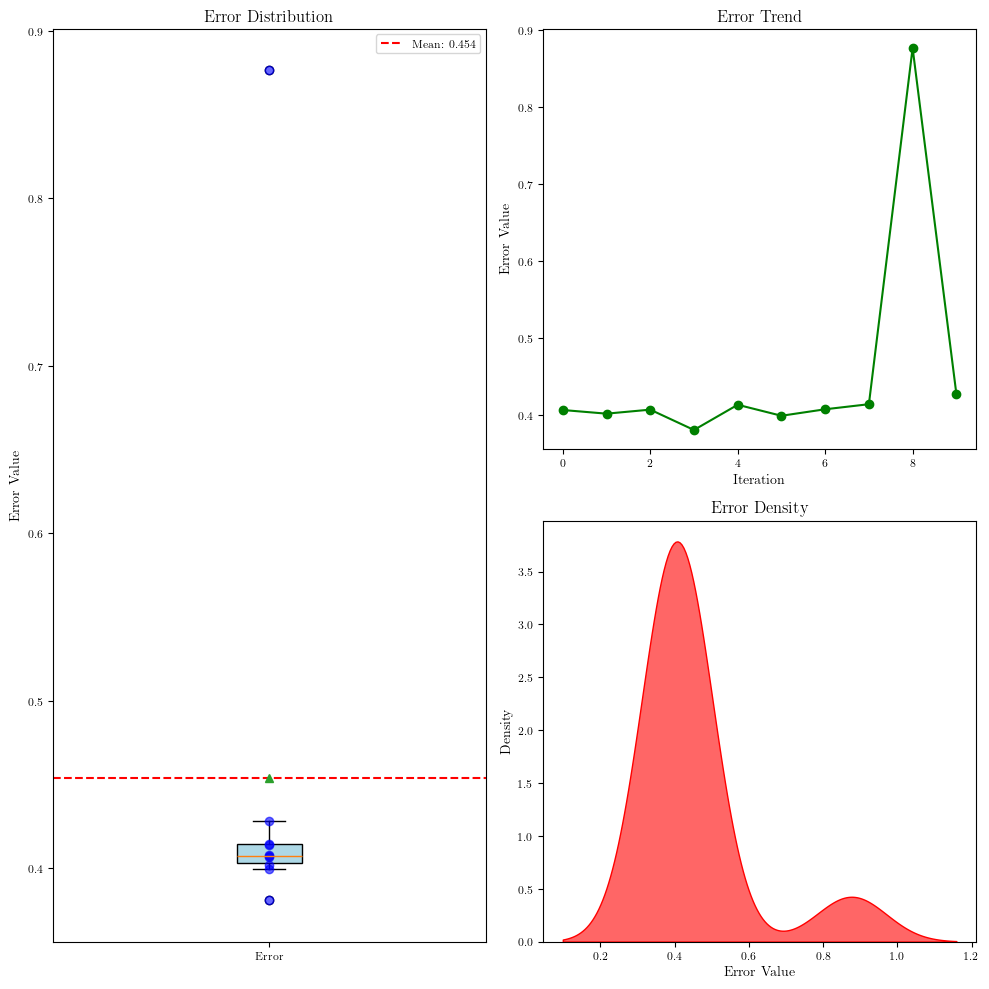

In [10]:

import seaborn as sns  # 导入seaborn库用于绘制密度图



plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列

mean_error = np.mean(error) #计算error数组的均值
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

In [11]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

testerror = torch.stack(model.test_error).cpu().detach().numpy()

65499
[7.9667240e-01 6.9036037e-01 6.0653454e-01 ... 6.1507167e-06 6.1505953e-06
 6.1505834e-06]


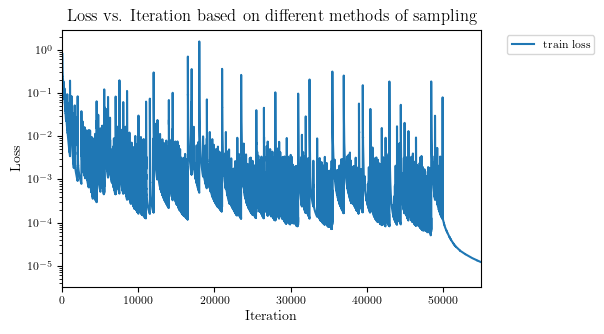

In [12]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

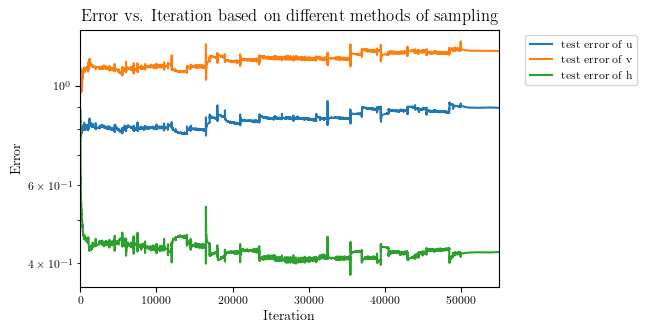

In [13]:
# print(len(trainloss))
# print(trainloss)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

u_error = testerror[:,0]
v_error = testerror[:,1]
h_error = testerror[:,2]

plt.plot(u_error, label='test error of u')
plt.plot(v_error, label='test error of v')
plt.plot(h_error, label='test error of h')


# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Error') # 设置y轴的标签
plt.title('Error vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

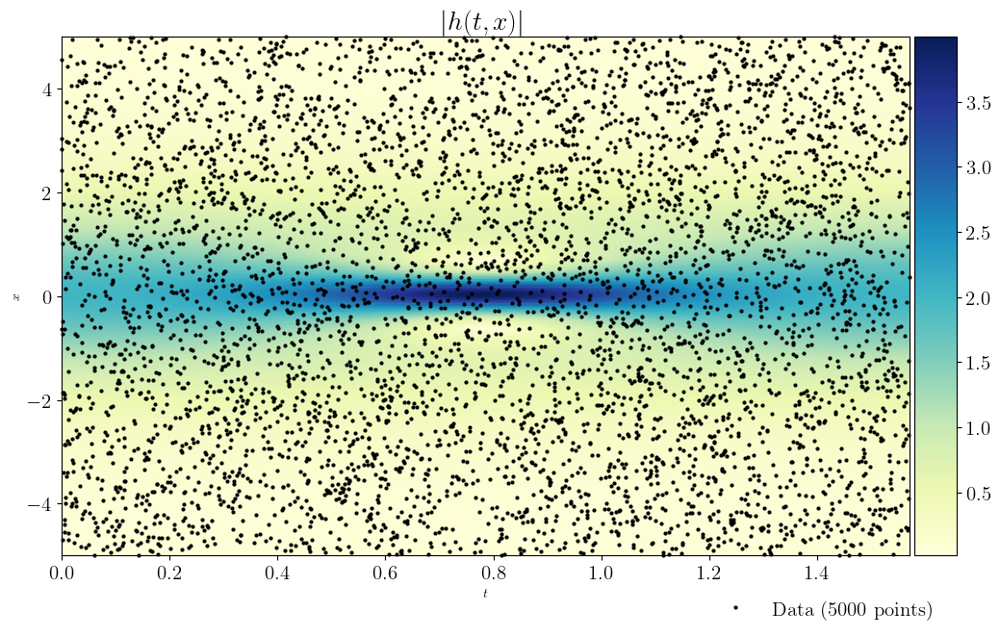

In [14]:


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(12, 7)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘制热图
h = ax.imshow(H_star.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')  #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是H_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                #第三个参数是颜色映射，这里是从黄色Yl到绿色Gn再到蓝色Bu；第四个参数是图像的范围，这里lb和ub分别是数据的下界和上界；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.05) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.05）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的

ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'ko', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 2,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  

# #绘制三条虚线
# line = np.linspace(x.min(), x.max(), 2)[:,None] #生成了一个包含2个等间距的数值的数组，这些数值在 x.min() 到 x.max() 之间。[:,None] 是一个索引操作，用于将一维数组转换为二维数组。这里其实就是[-5;5]
# #第一个参数是虚线的x坐标，line是虚线y的坐标，第三个参数是虚线的样式，k表示黑色，--表示虚线，最后一个参数表示虚线的参数是1
# ax.plot(t[75]*np.ones((2,1)),line,'k--',linewidth=1) 
# ax.plot(t[100]*np.ones((2,1)),line,'k--',linewidth=1)
# ax.plot(t[125]*np.ones((2,1)),line,'k--',linewidth=1)    

#设置标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$')
ax.set_ylabel('$x$')
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)

#    plt.setp(leg.get_texts(), color='w')   #用来设置图例中文本的颜色，这里是白色，取消注释后文本会变为白色
ax.set_title('$|h(t,x)|$', fontsize = 20) #设置子图ax的标题为$|h(t,x)|$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为10
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数








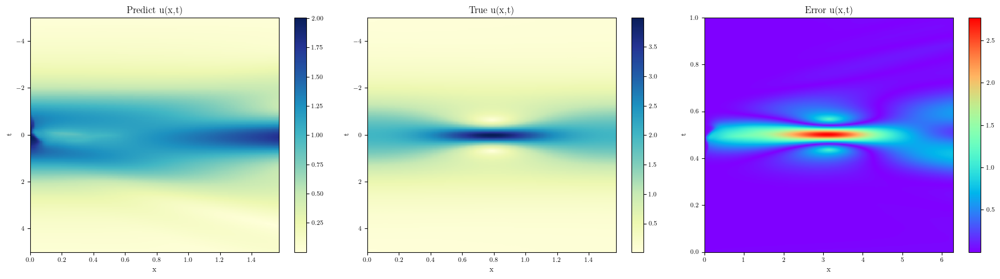

In [15]:


# 创建一个包含两个子图的图形
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 1行2列的子图，图形大小为宽18英寸高5英寸

# 绘制第一幅图像
axes[0].imshow(H_pred.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predict u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(H_star.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])


# 绘制第三幅图像
axes[2].imshow(np.abs(H_pred - H_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])


# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [16]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

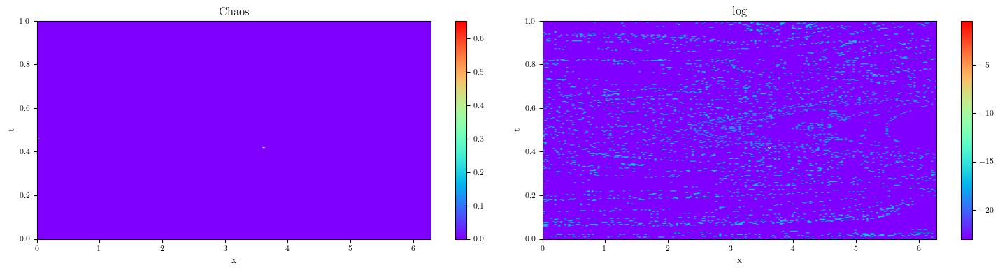

In [17]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()